In [3]:
import pandas as pd
print(pd.__version__)
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
import math

%matplotlib inline

0.23.4


In [6]:
import scattertext as st
import seaborn as sns
sns.set()

In [7]:
from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

In [8]:
from sklearn import mixture

In [11]:
from fuzzywuzzy import fuzz
from IPython.display import Image
import os

/home/nguyen.van.dat/Git/CB_Recommendation_GMM/env/lib/python3.6/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [14]:
from nltk.stem.porter import PorterStemmer
from nltk.corpus import wordnet

In [15]:
PS = PorterStemmer()

## Constant variables

In [16]:
data_path = 'liquor_data_new.csv'
flavour_colums = ['f1', 'f2', 'f3', 'f4', 'f5', 'f6']

## Load data

In [17]:
def load_data(data_path):
    return pd.read_csv(data_path, encoding='utf-8', sep='\t')

In [18]:
df_initial = load_data(data_path)
df_initial.head()

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste
0,上川大雪,Kamikawataisetsu,北海道,Hokkaido,202001,1,4.299969,0.516103,0.484763,0.203029,0.419481,0.276085,0.453028,|グイグイ|メロン|フレッシュ|上品|丸み|フルーティ|旨味|甘味|酸味|マスカット|ガス|...,117,https://s3-ap-northeast-1.amazonaws.com/physal...,加茂錦|而今|陸奥八仙|宮寒梅|十四代,8685,上川大雪|東洋美人|十四代|冩楽|笑四季|Ohmine Junmai|川中島|豊明|至|一白水成
1,國稀,Kunimare,北海道,Hokkaido,202001,2,4.099463,0.187750,0.304858,0.417155,0.539935,0.527491,0.357793,|辛口|蜜|スッキリ|力強い|旨味|ゴクゴク|洋梨|若い|じっくり|薄い|円やか|ちびちび|...,210,https://s3-ap-northeast-1.amazonaws.com/physal...,月山|黒牛|龍力|谷川岳|春鹿,1928,國稀|黎明|越前岬|鷹来屋|宮の雪|初孫|住吉|春鶯囀|長良川|辰泉
2,男山,Otokoyama,北海道,Hokkaido,202001,3,4.095614,0.277607,0.394435,0.327092,0.520835,0.454270,0.427476,|辛口|酸味|甘味|旨味|スッキリ|冷酒|常温|ヨーグルト|ヤクルト|熱燗|ひろがる|バラン...,397,https://s3-ap-northeast-1.amazonaws.com/physal...,春鹿|まんさくの花|酔鯨|加賀鳶|いづみ橋,2,男山|八海山|喜楽長|杉勇|神聖|大那|如空|千代むすび|七冠馬|白隠正宗
3,国士無双,Kokushimuso,北海道,Hokkaido,202001,4,4.079436,0.387998,0.256487,0.161930,0.372511,0.593511,0.516169,|辛口|洋梨|ピリリ|フルーティ|荒々しい|スパイシー|さらり|果物|酸味|さわやか|スイス...,208,https://s3-ap-northeast-1.amazonaws.com/physal...,上喜元|酔心|澤乃井|加賀鳶|司牡丹,10,国士無双|真野鶴|無想|藍の郷|あら玉|福祝|幻の瀧|高清水|きりんざん|北光正宗
4,北の錦,Kitanonishiki,北海道,Hokkaido,202001,5,4.055023,0.344262,0.393210,0.501239,0.564264,0.211910,0.335154,|とろみ|荒々しい|力強い|ほのか|薄い|トロピカル|ヨーグルト|濃厚|苦味|チーズ|旨味|...,85,https://s3-ap-northeast-1.amazonaws.com/physal...,誠鏡|原田|龍力|旦|天の戸,11,北の錦|爛漫|木戸泉|松みどり|芳水|千福|玉櫻|磐城壽|豊久仁|喜久酔


In [19]:
# df_initial['id'] = df_initial.index.values

In [20]:
df_initial['f_mean'] = df_initial[flavour_colums].mean(axis=1)
df_initial['flavour_tags'] = df_initial['flavour_tags'].str.replace('|', ' ')
# df_initial['flavour_tags'] = df_initial['flavour_tags'].str.replace('|', ' ')

In [21]:
df_initial[df_initial.f1.notnull() & df_initial.similar_brand_taste.isnull()]

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean


In [22]:
tab_infor = pd.DataFrame(df_initial.dtypes).T.rename(index={0: "column type"})
tab_infor = tab_infor.append(pd.DataFrame(df_initial.isnull().sum(axis=0)).T.rename(index={0: "Number of null records"}))
tab_infor = tab_infor.append(pd.DataFrame(df_initial.isnull().sum(axis=0) * 100 / df_initial.shape[0]).T.rename(index={0: "Percent of null records"}))

In [23]:
tab_infor

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean
column type,object,object,object,object,int64,int64,float64,float64,float64,float64,float64,float64,float64,object,int64,object,object,int64,object,float64
Number of null records,0,144,0,0,0,0,0,326,326,326,326,326,326,19,0,1,126,0,326,326
Percent of null records,0,13.4328,0,0,0,0,0,30.4104,30.4104,30.4104,30.4104,30.4104,30.4104,1.77239,0,0.0932836,11.7537,0,30.4104,30.4104


## Data Exploration

In [24]:
df_missing_infor = pd.DataFrame(df_initial.isnull().sum(axis=0)).reset_index()
df_missing_infor.columns = ['column name', 'missing count']
df_missing_infor['missing percent'] = ((df_initial.shape[0] - df_missing_infor['missing count']) / df_initial.shape[0]) * 100
df_missing_infor

,column name,missing count,missing percent
0,name,0,100.000000
1,intl_name,144,86.567164
2,brand_name,0,100.000000
3,brand_intl_name,0,100.000000
4,year_month,0,100.000000
5,rank,0,100.000000
6,score,0,100.000000
7,f1,326,69.589552
8,f2,326,69.589552
9,f3,326,69.589552


## Data cleaning

In [25]:
key_tags = set()

for tags in df_initial['flavour_tags']:
    if tags is None or isinstance(tags, float): continue
    key_tags = key_tags.union(tags.split('|'))

In [26]:
key_tags = [s for s in key_tags if s]

In [27]:
def count_words(df, colone):
    key_counts = dict()
    key_occurence = []
    
    for s in key_tags:
        key_counts[s] = 0
    
    for row in df[colone]:
        if row is None or isinstance(row, float): continue
        for s in row.split('|'):
            if s in key_counts.keys(): key_counts[s] += 1
            else: key_counts[s] = 0
    
    for (k, v) in key_counts.items():
        key_occurence.append([k, v])
    key_occurence.sort(key = lambda x: x[1], reverse=True)
    
    return key_counts, key_occurence

In [28]:
key_counts, key_occurence = count_words(df_initial, 'flavour_tags')

In [29]:
brand_nan = []

In [30]:
def remove_nan_similar_brands(df):
    brand_nan = []
    df_new = df.copy()
    
    for idx, row in df_new.iterrows():
        similar_brand_taste = row.similar_brand_taste
        if pd.isnull(similar_brand_taste): continue
        
        similar_brand_taste = similar_brand_taste.split("|")
        for b_name in similar_brand_taste:
            record = df_new[df_new.name == b_name]
            f1 = record.f1.values
            
            if len(f1) == 0 or pd.isnull(f1[0]):
                if b_name not in brand_nan: brand_nan.append(b_name)

    return brand_nan

In [31]:
brand_nan = remove_nan_similar_brands(df_initial)

In [32]:
len(brand_nan)

125

In [33]:
def replace_similar_brand(df, brand_nan):
    df_new = df.copy()
    
    for idx, row in df_new.iterrows():
        similar_brand_taste = row.similar_brand_taste
        if pd.isnull(similar_brand_taste): continue
            
        similar_brand_taste = similar_brand_taste.split("|")
        replacent = []
        
        for b_name in similar_brand_taste:
            if b_name not in brand_nan: 
                replacent.append(b_name)
        
        df_new.at[idx, "similar_brand_taste"] = "|".join(replacent)
    
    return df_new

In [34]:
df_remove_nan_brands = replace_similar_brand(df_initial, brand_nan)

In [35]:
# df_nan_cleared = df_remove_nan_brands[df_remove_nan_brands.f1.notnull()].reset_index()
# df_nan_cleared.shape
df_remove_nan_brands.shape

(1072, 20)

In [36]:
def keytag_inventory(df, column='flavour_tags'):
    key_root = dict()
    key_select = dict()
    category_key = []
    
    for row in df[column]:
        if row is None or isinstance(row, float): continue
        
        for s in row.split('|'):
            if len(s) == 0: continue
            racine = PS.stem(s)
            
            if racine in key_root.keys():
                key_root[racine].add(s)
            else:
                key_root[racine] = {s}

    for s in key_root.keys():
        min_length = 1000
        
        for v in key_root[s]:
            if len(key_root[s]) > 1:
                if len(v) < min_length:
                    min_length = len(v)
                    ref = v
            else:
                ref = v
        category_key.append(ref)
        key_select[s] = ref
    
    return key_select, key_root, category_key

In [37]:
key_select, key_root, category_key = keytag_inventory(df_remove_nan_brands)

In [38]:
def keytag_replacement(df, key_select, root=False, column='flavour_tags'):
    df_new = df.copy()
    
    for index, row in df_new.iterrows():
        flavour_tags = row[column]
        
        if pd.isnull(flavour_tags): continue
        row_data = []
        for s in flavour_tags.split('|'):
            racine = PS.stem(s) if root else s
            
            if racine is key_select.keys():
                row_data.append(key_select[racine])
            else:
                row_data.append(s)
                
        df_new.at[index, column] = '|'.join(row_data)
    return df_new

In [39]:
df_keywords_cleaned = keytag_replacement(df_remove_nan_brands, key_select, root=True)

In [40]:
key_counts, key_occurence = count_words(df_initial, 'flavour_tags')

## Duplicate value

In [41]:
df_duplicate = df_keywords_cleaned[df_keywords_cleaned['name'].map(df_keywords_cleaned.name.value_counts() > 1)]

In [42]:
df_duplicate.shape

(62, 20)

## Filling missing data

In [43]:
df_keywords_cleaned[df_keywords_cleaned.name == "能古見"]

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean
1039,能古見,Nogomi,佐賀県,Saga,202001,13,4.006612,NaN,NaN,NaN,NaN,NaN,NaN,まったり キレ フレッシュ 旨味 濃厚 酸味 しっかり,30,https://s3-ap-northeast-1.amazonaws.com/physal...,NaN,1211,NaN,NaN


In [44]:
def sequel(string_1, string_2):
    if pd.isnull(string_1): return False
    return (fuzz.ratio(string_1, string_2) >= 70 or fuzz.token_sort_ratio(string_1, string_2) >= 70)

In [45]:
df_missing_f = df_keywords_cleaned[df_keywords_cleaned.f1.isnull() & df_keywords_cleaned.flavour_tags.notnull()]

In [46]:
df_missing_f.head()

,name,intl_name,brand_name,brand_intl_name,year_month,rank,score,f1,f2,f3,f4,f5,f6,flavour_tags,checkin_count,pictures,similar_brands,id,similar_brand_taste,f_mean
7,北の勝,Kitanokatsu,北海道,Hokkaido,202001,8,4.024530,NaN,NaN,NaN,NaN,NaN,NaN,マイルド フレッシュ 花 豊か キレ フルーティ ガス スッキリ 軽快 辛口 甘味 バラン...,63,https://s3-ap-northeast-1.amazonaws.com/physal...,墨廼江|加茂錦|繁枡|大信州|土佐しらぎく,1562,NaN,NaN
10,大雪乃蔵,Taisetsunokura,北海道,Hokkaido,202001,11,4.011490,NaN,NaN,NaN,NaN,NaN,NaN,丸み 優しい スイスイ 辛口 旨味 キリリ さわやか フレッシュ 華やか バランス 常温 ...,50,https://s3-ap-northeast-1.amazonaws.com/physal...,若竹|臥龍梅|あさ開|谷川岳|きりんざん,3,NaN,NaN
11,風のささやき,Kazenosasayaki,北海道,Hokkaido,202001,12,4.011301,NaN,NaN,NaN,NaN,NaN,NaN,さらり 優しい 軽快 常温 さっぱり 辛口 旨味 スッキリ 酸味,14,https://s3-ap-northeast-1.amazonaws.com/physal...,NaN,8,NaN,NaN
12,十一州,NaN,北海道,Hokkaido,202001,13,4.009420,NaN,NaN,NaN,NaN,NaN,NaN,昔ながら 控えめ 甘味 穏やか 常温 さっぱり 上品 キリリ 苦味 軽快 余韻 フルーティ...,44,https://s3-ap-northeast-1.amazonaws.com/physal...,松みどり|聖泉|田酒|黎明|豊盃,2309,NaN,NaN
13,まる田,Maruta,北海道,Hokkaido,202001,14,4.009420,NaN,NaN,NaN,NaN,NaN,NaN,あっさり コク 薄い さらり 熱燗 上品 バランス キレ 常温 濃厚 スッキリ 酸味 しっ...,20,https://s3-ap-northeast-1.amazonaws.com/physal...,湊屋藤助|ん|大七|天領|義侠,1275,NaN,NaN


In [47]:
def filling_data(df, df_missing):
    df_new = df.copy()
    
    for idx, row in df_missing.iterrows():
        flavour_tags = row['flavour_tags']
        group_data = df_new[df_new['flavour_tags'].apply(lambda x: sequel(x, flavour_tags))]
        mean_f1 = group_data['f1'].mean()
        if pd.isnull(mean_f1): continue
            
        mean_f2 = group_data['f2'].mean()
        mean_f3 = group_data['f3'].mean()
        mean_f4 = group_data['f4'].mean()      
        mean_f5 = group_data['f5'].mean()
        mean_f6 = group_data['f6'].mean()
        
        group_similar_taste = []
        similar_brand_taste = group_data['similar_brand_taste'].values
        
#         print(similar_brand_taste)
#         break
        for sbt in similar_brand_taste:
            if pd.notnull(sbt):
                for it in sbt.split("|"):
                    if it not in group_similar_taste: group_similar_taste.append(it)
        
        df_new.at[idx, "f1"] = mean_f1
        df_new.at[idx, "f2"] = mean_f2
        df_new.at[idx, "f3"] = mean_f3
        df_new.at[idx, "f4"] = mean_f4
        df_new.at[idx, "f5"] = mean_f5
        df_new.at[idx, "f6"] = mean_f6
        df_new.at[idx, "similar_brand_taste"] = "|".join(group_similar_taste)
            
    return df_new

In [48]:
# df_filling = filling_data(df_keywords_cleaned, df_missing_f)
df_filling = df_keywords_cleaned

In [49]:
# int(len(df_filling)/10) - 8

In [50]:
df_nan_cleared = df_filling[df_filling.f1.notnull()].reset_index()
df_nan_cleared.shape

(746, 21)

## Implement algorithm

In [51]:
flavour_matrix = df_nan_cleared.as_matrix(flavour_colums)

/home/nguyen.van.dat/Git/CB_Recommendation_GMM/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [52]:
gausian_filter = lambda x,y,sigma: math.exp(-(x-y)**2/(2*sigma**2))

In [53]:
n_clusters = 76
gauss_mixture = GaussianMixture(n_components=n_clusters, covariance_type='full').fit(flavour_matrix)
labels = gauss_mixture.predict(flavour_matrix)
df_nan_cleared['cluster'] = labels

In [54]:
df_nan_cleared.shape

(746, 22)

In [55]:
# import itertools
# from scipy import linalg
# import matplotlib as mpl

# lowest_bic = np.infty
# bic = []
# n_components_range = range(100, 115)
# cv_types = ['spherical', 'tied', 'diag', 'full']
# for cv_type in cv_types:
#     for n_components in n_components_range:
#         # Fit a mixture of Gaussians with EM
#         gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
#         gmm.fit(flavour_matrix)
#         bic.append(gmm.bic(flavour_matrix))
#         if bic[-1] < lowest_bic:
#             lowest_bic = bic[-1]
#             best_gmm = gmm

# bic = np.array(bic)
# color_iter = itertools.cycle(['k', 'r', 'g', 'b', 'c', 'm', 'y'])
# clf = best_gmm
# bars = []

# # Plot the BIC scores
# plt.figure(figsize=(8, 6))
# spl = plt.subplot(2, 1, 1)
# # plt.rcParams['figure.figsize'] = [1, 1]
# for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
#     xpos = np.array(n_components_range) + .2 * (i - 2)
#     bars.append(plt.bar(xpos, bic[i * len(n_components_range):
#                                   (i + 1) * len(n_components_range)],
#                         width=.2, color=color))
# plt.xticks(n_components_range)
# plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
# plt.title('BIC score per model')
# xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
#     .2 * np.floor(bic.argmin() / len(n_components_range))
# plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
# spl.set_xlabel('Number of components')
# spl.legend([b[0] for b in bars], cv_types)

In [56]:
# def plot_data(data):
#     labels = gauss_mixture.predict(data)
#     df_new = pd.DataFrame(data)
#     df_new['cluster'] = labels
    
#     color=[np.random.randint(0, 255) for _ in range(n_clusters)]
#     print(color)
#     for k in range(0, n_clusters):
#         data = df_new[df_new["cluster"]==k]
#         plt.scatter(data[3], data[4], c=color[k], cmap='True')
#     plt.show()

In [57]:
# plot_data(flavour_matrix)

In [58]:
def calculate_sigma(list_flavour_taste):
    mean = np.mean(list_flavour_taste)
    
    sigma_hat = 0
    for i, value in enumerate(list_flavour_taste):
        sigma_hat += (value - mean)**2
    
    return float(math.sqrt(sigma_hat/len(list_flavour_taste)))

In [59]:
def compare_flavour_tags(tag_1, tag_2):
    if pd.isnull(tag_1) or pd.isnull(tag_2): return 0
    
    tag_1 = tag_1.split(' ')
    tag_2 = tag_2.split(' ')
    
    count = 0
    for i in tag_1:
        if i in tag_2:
            count += 1
            
    return float(count/len(tag_1))

In [60]:
def criteria_selection(f1_m, f2_m, f3_m, f4_m, f5_m, f6_m,
                       f1_c, f2_c, f3_c, f4_c, f5_c, f6_c,
                       sigma_1, sigma_2, sigma_3, sigma_4, sigma_5, sigma_6,
                       flavour_tags_m, flavour_tags_c):
    fc_1 = gausian_filter(f1_m, f1_c, sigma_1)
    fc_2 = gausian_filter(f2_m, f2_c, sigma_2)
    fc_3 = gausian_filter(f3_m, f3_c, sigma_3)
    fc_4 = gausian_filter(f4_m, f4_c, sigma_4)
    fc_5 = gausian_filter(f5_m, f5_c, sigma_5)
    fc_6 = gausian_filter(f6_m, f6_c, sigma_6)
    fc_7 = fuzz.token_sort_ratio(flavour_tags_m, flavour_tags_c)/100
    print('fc1-6 ---- {} --- {}'.format(fc_1 + fc_2 + fc_3 + fc_4 + fc_5 + fc_6, fc_7))
    
    return (fc_1 + fc_2 + fc_3 + fc_4 + fc_5 + fc_6) + fc_7

In [61]:
def recommand(df, entry_id):
    entry = df.iloc[entry_id]
    cluster = entry.cluster
    data = df[df.cluster == cluster]
    flavour_value = data[flavour_colums]
    flavour_tags = data['flavour_tags']
    
    sigma_1 = calculate_sigma(flavour_value['f1'])
    sigma_2 = calculate_sigma(flavour_value['f2'])
    sigma_3 = calculate_sigma(flavour_value['f3'])
    sigma_4 = calculate_sigma(flavour_value['f4'])
    sigma_5 = calculate_sigma(flavour_value['f5'])
    sigma_6 = calculate_sigma(flavour_value['f6'])
    
    flavour_list = list(data.as_matrix(np.concatenate([flavour_colums, ['flavour_tags', 'pictures', 'name']])))
    m_item = entry[flavour_colums]
    f1_m, f2_m, f3_m, f4_m, f5_m, f6_m = m_item[0], m_item[1], m_item[2], m_item[3], m_item[4], m_item[5]
    flavour_tags_m = entry['flavour_tags']
#     print(flavour_list[:, 8])
    flavour_list.sort(key=lambda x: criteria_selection(f1_m, f2_m, f3_m, f4_m, f5_m, f6_m,
                                                       x[0], x[1], x[2], x[3], x[4], x[5],
                                                       sigma_1, sigma_2, sigma_3, sigma_4, sigma_5, sigma_6,
                                                       flavour_tags_m, x[6]),
                                                       reverse=True)
    
    return flavour_list[:10]

In [62]:
def plot_results(liquor_main, liquor_compared):
    index = np.arange(6)
    bar_width = 0.35
    
    j = {idx: [x[0], x[1], x[2], x[3], x[4], x[5]] 
         for idx, x in enumerate([liquor_main, liquor_compared])}
    df = pd.DataFrame(j)
    print(df)
    
    fig, ax = plt.subplots()
    
    main = ax.bar(index, list(df[0]), bar_width, label="Main")
    compared = ax.bar(index+bar_width, list(df[1]), bar_width, label="Compare")
    
    ax.set_xlabel('Flavour tags')
    ax.set_ylabel('Values')
    ax.set_title('Compare result')
    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels(['f1', 'f2', 'f3', 'f4', 'f5', 'f6'])
    ax.legend()
    
    plt.show()

In [63]:
image_path = 'Image_Results'
if not os.path.exists(image_path):
    os.mkdir(image_path)

In [64]:
# !pip install scikit-image 

In [67]:
from PIL import Image
import requests
from io import BytesIO
# from scipy.misc import toimage
from PIL import Image

def display_img_array(url, img_dir):
#     im = PIL.Image.fromarray(ima)
#     bio = BytesIO()
#     im.save(bio, format='png')
#     print(ima)
    try:
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img_arr = np.array(img)
        im = Image.fromarray(img_arr)
#         im.save('{}/{}.png'.format(img_dir, url.split('/')[-1]))
        plt.imshow(img)
        plt.show()
    except:
        pass

# for ima in images:
#     display_img_array(ima)

def plot_image_results(results):
    img_des = 'Image_Results/{}'.format(results[0][8])
#     if not os.path.exists(img_des):
#         os.mkdir(img_des)
    
    for idx, row in enumerate(results):
        pictures = row[7].split('|')
        if len(pictures) == 0: continue
        print('------{}-------'.format(row[8]))
        
        for p in pictures:
            display_img_array(p, img_des)

In [68]:
# def compare_flavour_tags(str_1, str_2):
#     return fuzz.token_sort_ratio(str_1, str_2)

In [69]:
# lq1 = df_nan_cleared[df_nan_cleared.name == "燦然"]
# lq1

In [70]:
# lq2 = df_nan_cleared[df_nan_cleared.name == "玉乃光"]
# lq2

In [71]:
# lq3 = df_nan_cleared[df_nan_cleared.name == "聖"]
# lq3

In [72]:
# plot_results(lq1[flavour_colums].values[0], lq2[flavour_colums].values[0])
# plot_results(lq1[flavour_colums].values[0], lq3[flavour_colums].values[0])

In [73]:
# x = df_initial[df_initial.name == "肥前蔵心"].flavour_tags.values[0]
# y = df_nan_cleared[df_nan_cleared.name == "豊潤"].flavour_tags.values[0]

# compare_flavour_tags(x, y)

In [80]:
from random import randint
import time

time_start = time.time()
entry_id = randint(0, len(df_nan_cleared))
# entry_id = 684
results = recommand(df_nan_cleared, entry_id)
print('Time query ---- {}'.format(time.time() - time_start))

fc1-6 ---- 4.169174026155054 --- 0.29
fc1-6 ---- 3.1839975184273355 --- 0.31
fc1-6 ---- 3.957463855982553 --- 0.35
fc1-6 ---- 3.854880378556177 --- 0.36
fc1-6 ---- 2.9372783904920823 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.612173706587179 --- 0.37
fc1-6 ---- 4.107328549295445 --- 0.31
fc1-6 ---- 4.236869383245661 --- 0.38
fc1-6 ---- 4.072288711726762 --- 0.32
fc1-6 ---- 4.610301624145416 --- 0.31
fc1-6 ---- 3.043318040368579 --- 0.46
fc1-6 ---- 3.1127963118298214 --- 0.39
fc1-6 ---- 2.6837496597664523 --- 0.43
fc1-6 ---- 3.560767899821873 --- 0.34
fc1-6 ---- 3.806099498919349 --- 0.26
fc1-6 ---- 3.351936995128286 --- 0.26
Time query ---- 0.017190217971801758


/home/nguyen.van.dat/Git/CB_Recommendation_GMM/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


In [81]:
# results[0]

In [82]:
[i[8] for i in results]

['春心', '月の桂', '房島屋', 'くどき上手', '百十郎', '浅茅生', '麓井', 'いづみ橋', '一代弥山', '黒澤']

In [83]:
[compare_flavour_tags(i[6], results[0][6]) for i in results]

[1.0,
 0.23809523809523808,
 0.2857142857142857,
 0.19047619047619047,
 0.23809523809523808,
 0.2857142857142857,
 0.23809523809523808,
 0.2857142857142857,
 0.19047619047619047,
 0.3333333333333333]

          0         1
0  0.399092  0.399092
1  0.399704  0.399704
2  0.442919  0.442919
3  0.390003  0.390003
4  0.379033  0.379033
5  0.434760  0.434760


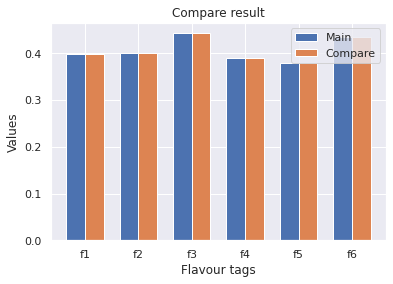

          0         1
0  0.399092  0.437396
1  0.399704  0.354870
2  0.442919  0.438868
3  0.390003  0.403456
4  0.379033  0.352773
5  0.434760  0.450468


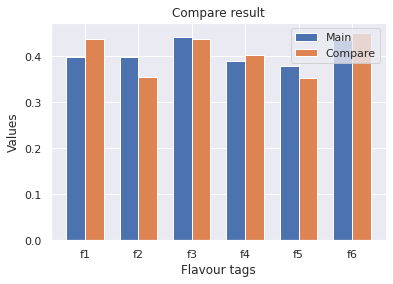

          0         1
0  0.399092  0.373319
1  0.399704  0.415396
2  0.442919  0.444221
3  0.390003  0.309223
4  0.379033  0.392608
5  0.434760  0.490904


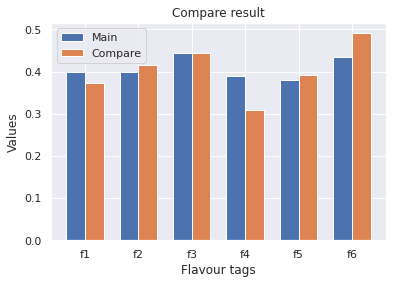

          0         1
0  0.399092  0.410694
1  0.399704  0.452388
2  0.442919  0.374755
3  0.390003  0.385953
4  0.379033  0.406516
5  0.434760  0.414751


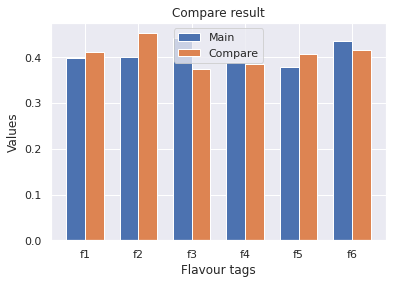

          0         1
0  0.399092  0.396390
1  0.399704  0.411325
2  0.442919  0.357849
3  0.390003  0.365838
4  0.379033  0.400298
5  0.434760  0.501554


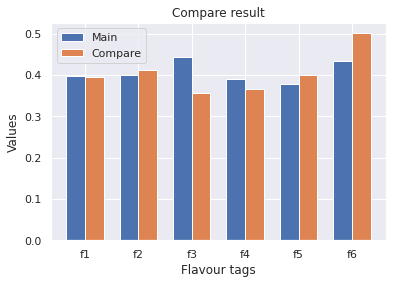

          0         1
0  0.399092  0.360729
1  0.399704  0.368705
2  0.442919  0.480207
3  0.390003  0.420704
4  0.379033  0.411055
5  0.434760  0.396704


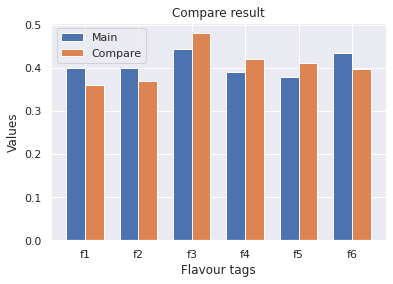

          0         1
0  0.399092  0.343596
1  0.399704  0.396632
2  0.442919  0.397665
3  0.390003  0.436886
4  0.379033  0.426387
5  0.434760  0.440242


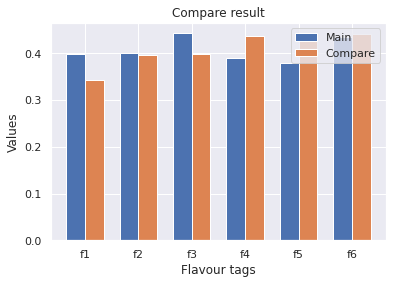

          0         1
0  0.399092  0.313287
1  0.399704  0.434440
2  0.442919  0.423060
3  0.390003  0.384658
4  0.379033  0.424452
5  0.434760  0.453886


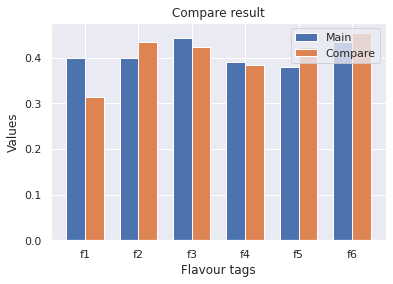

          0         1
0  0.399092  0.413647
1  0.399704  0.423751
2  0.442919  0.424474
3  0.390003  0.345163
4  0.379033  0.321228
5  0.434760  0.496818


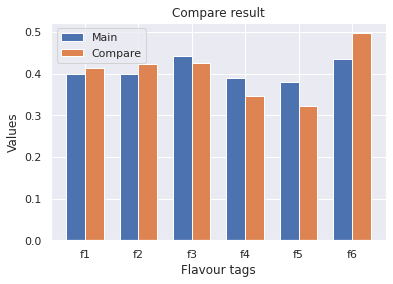

          0         1
0  0.399092  0.385967
1  0.399704  0.424347
2  0.442919  0.360442
3  0.390003  0.364917
4  0.379033  0.354817
5  0.434760  0.531019


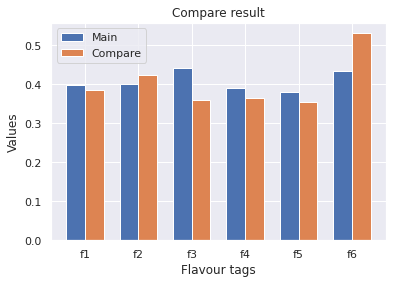

In [84]:
entry_record = df_nan_cleared.iloc[entry_id]
liquor_main = entry_record[flavour_colums]

for idx, row in enumerate(results):
#     if idx == 0: continue
    liquor_compared = row
    plot_results(liquor_main, liquor_compared)

In [85]:
def compare_with_sakenowa(list_str_products):
    results = []
    
    for i in list_str_products:
        liquor = df_nan_cleared[df_nan_cleared.name == i]
        results.append(liquor[flavour_colums].values[0])
        
    for i in results:
        plot_results(results[0], i)

In [86]:
# list_str_products = ['玉乃光', '龍力', '北雪', '一ノ蔵', '東北泉', '奥']

# compare_with_sakenowa(list_str_products)

In [87]:
def compare_similar_percent(entry_record, results):
    similar_brands = entry_record.similar_brand_taste
    if pd.isnull(similar_brands): return 0
    similar_brands = similar_brands.split('|')
    print(similar_brands)
#     similar_brands = similar_brands.replace('|', ' ')
#     similar_brands = ",".join(similar_brands)
    similar_brands_result = [i[8] for i in results]
    print(similar_brands_result)
    
    count = 0
    for i in similar_brands_result:
        if i in similar_brands: count += 1
    
    total = len(similar_brands)
    if len(similar_brands_result) >= 1 and len(similar_brands_result) < total:
        total = len(similar_brands_result)
    
    return count/total

In [76]:
df_nan_cleared[df_nan_cleared.f1.notnull() & df_nan_cleared.similar_brand_taste.isnull()].shape

(0, 22)

In [77]:
compare_similar_percent(entry_record, results)

['赤武', '鳥海山', '紀土', '豊香', '若波', '総乃寒菊', '櫛羅', '仙介', '愛宕の松', '五橋']
['赤武', '総乃寒菊', '鳥海山', '七賢', '仙介', '若波', '山城屋', '自然郷', '流輝', '十九']


0.5

In [78]:
# df_initial[df_initial.name == 'MELLOW']

In [79]:
def compare_similar_percent_all_records():
    sum_percent = 0.0
    sum_similars = 0
    count = 0
    
    for i in df_nan_cleared.index.values:
        _results = recommand(df_nan_cleared, i)
        entry_r = df_nan_cleared.iloc[i]
        if not pd.isnull(entry_r.similar_brand_taste): count+=1
        sum_percent += compare_similar_percent(entry_r, _results)
    
#     sum_percent = sum_similars/(5*len(df_nan_cleared))
    return sum_percent*100/count

In [80]:
compare_similar_percent_all_records()

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9293120180380154 --- 0.62
fc1-6 ---- 2.887465433567938 --- 0.54
fc1-6 ---- 5.035993378841209 --- 0.65
fc1-6 ---- 2.9430225136333354 --- 0.5
fc1-6 ---- 3.096738798251216 --- 0.31
fc1-6 ---- 1.9263464181928822 --- 0.56
fc1-6 ---- 2.782266048933587 --- 0.56
fc1-6 ---- 2.325222865613849 --- 0.59
fc1-6 ---- 3.123049708088687 --- 0.64
fc1-6 ---- 4.0210849922831 --- 0.43
fc1-6 ---- 4.0415804091928536 --- 0.57
fc1-6 ---- 3.6302950461293078 --- 0.51
fc1-6 ---- 3.63552386345381 --- 0.52
fc1-6 ---- 4.116696245129707 --- 0.55
fc1-6 ---- 3.0315344945760554 --- 0.37
fc1-6 ---- 1.9496186640537068 --- 0.51
fc1-6 ---- 3.9424262297678516 --- 0.43
fc1-6 ---- 2.2494088067231717 --- 0.46
fc1-6 ---- 1.9389957633044432 --- 0.43
fc1-6 ---- 3.9548538625545735 --- 0.64
fc1-6 ---- 3.2770334413064117 --- 0.4
fc1-6 ---- 2.5728593967232567 --- 0.56
fc1-6 ---- 4.514562788875383 --- 0.63
fc1-6 ---- 2.312955332217809 --- 0.54
fc1-6 ---- 4.227706654099646 --- 0.54
fc1-6 ---- 1.839631

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9362149441430074 --- 0.45
fc1-6 ---- 4.6279510427497454 --- 0.52
fc1-6 ---- 3.6272372422388837 --- 0.32
fc1-6 ---- 2.641966631187185 --- 0.34
fc1-6 ---- 4.459992309280628 --- 0.42
fc1-6 ---- 0.742168252700249 --- 0.39
fc1-6 ---- 4.193529931800372 --- 0.55
fc1-6 ---- 4.110914828293166 --- 0.56
fc1-6 ---- 3.267353528923046 --- 0.49
fc1-6 ---- 3.743975028853833 --- 0.45
fc1-6 ---- 2.966198913352695 --- 0.36
fc1-6 ---- 1.6071764700994455 --- 0.46
fc1-6 ---- 3.352035045412127 --- 0.52
['天覧山', '六根', '雪の茅舎', '天寶一', '藏王', 'あべ', '開運', '李白', '米鶴', '誉国光']
['六根', 'あたごのまつ', '不動', '羽根屋', '黒龍', '磯自慢', '東光', '古伊万里', '蓬莱', '月の輪']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4915255804655314 --- 0.34
fc1-6 ---- 3.6375182888465156 --- 0.32
fc1-6 ---- 2.843717297375256 --- 0.35
fc1-6 ---- 3.264629856829134 --- 0.42
fc1-6 ---- 2.7658320017205362 --- 0.34
fc1-6 ---- 3.2032313710629405 --- 0.36
fc1-6 ---- 4.355938147280297 --- 0.39
fc1-6 ---- 4.177611412156714 --- 0.37
fc1-6 ---- 4

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2750490321096346 --- 0.34
fc1-6 ---- 3.0667794839373737 --- 0.35
fc1-6 ---- 4.516558834834197 --- 0.0
fc1-6 ---- 3.2396246926818977 --- 0.43
fc1-6 ---- 4.152601694366838 --- 0.32
fc1-6 ---- 4.836840909163541 --- 0.31
fc1-6 ---- 4.147588333736321 --- 0.39
fc1-6 ---- 3.9590237658235417 --- 0.44
fc1-6 ---- 2.788529772445858 --- 0.33
fc1-6 ---- 4.381116123918995 --- 0.48
fc1-6 ---- 4.777081926361346 --- 0.45
fc1-6 ---- 2.978539126349514 --- 0.39
fc1-6 ---- 2.452080306162749 --- 0.34
fc1-6 ---- 3.890824620291461 --- 0.33
fc1-6 ---- 4.121642408293435 --- 0.26
fc1-6 ---- 4.9470964892833225 --- 0.35
fc1-6 ---- 3.2190465360802047 --- 0.34
fc1-6 ---- 5.509513597250684 --- 0.0
fc1-6 ---- 2.700288842953805 --- 0.31
fc1-6 ---- 4.904435006744571 --- 0.47
fc1-6 ---- 5.023367627508927 --- 0.31
['酉与右衛門', '福寿', '磯自慢', '田光', '結ゆい', '秀鳳', '黒龍', '古伊万里', '篠峯']
['酉与右衛門', '福寿', '丈径', '雨後の月', '田光', '手取川', '奈良萬', '高千代', '穏', '秀鳳']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.64595983

fc1-6 ---- 2.5279019437113948 --- 0.39
fc1-6 ---- 2.736233488478132 --- 0.46
fc1-6 ---- 4.476686323168562 --- 0.45
fc1-6 ---- 3.44043558286515 --- 0.45
fc1-6 ---- 2.798823036804149 --- 0.53
fc1-6 ---- 3.5753463839562944 --- 0.34
fc1-6 ---- 2.19517950007036 --- 0.45
fc1-6 ---- 3.2059576187843475 --- 0.57
fc1-6 ---- 3.130055742715279 --- 0.41
fc1-6 ---- 4.6867277858708 --- 0.35
fc1-6 ---- 2.344744583360452 --- 0.24
['山和', '半蔵', '天心', '神渡', '越の誉', '泉川', '勝駒', '賀茂鶴', '夜明け前', '多満自慢']
['山和', '天心', '夜明け前', '半蔵', 'あべ', '勝駒', '多満自慢', '加賀鶴', '梅の宿', '颯']
fc1-6 ---- 1.9155614805507069 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4061550244179943 --- 0.33
fc1-6 ---- 4.177919185549997 --- 0.42
fc1-6 ---- 3.632920467335859 --- 0.27
fc1-6 ---- 5.173156093702117 --- 0.35
fc1-6 ---- 3.697829257888128 --- 0.35
fc1-6 ---- 2.7752099979796427 --- 0.4
fc1-6 ---- 4.52417223744278 --- 0.46
fc1-6 ---- 5.072847909503276 --- 0.27
fc1-6 ---- 1.7173785164693058 --- 0.3
['日輪田', '立山', '廣戸川', '華鳩', '会津中将', '磐城壽', '隠岐誉'

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.079777954038575 --- 0.55
fc1-6 ---- 3.7849062379135776 --- 0.52
fc1-6 ---- 5.241472406174705 --- 0.63
fc1-6 ---- 2.6781108660990185 --- 0.51
fc1-6 ---- 3.7286668618851593 --- 0.59
fc1-6 ---- 3.9704591183988347 --- 0.47
fc1-6 ---- 4.014259572740027 --- 0.54
fc1-6 ---- 3.200754102928179 --- 0.45
fc1-6 ---- 3.9258140892034197 --- 0.43
fc1-6 ---- 2.509354072430992 --- 0.43
fc1-6 ---- 3.2105565657568844 --- 0.51
fc1-6 ---- 3.007038958359599 --- 0.41
fc1-6 ---- 4.71816676255658 --- 0.48
fc1-6 ---- 3.8565812439006777 --- 0.45
fc1-6 ---- 3.9718161610324936 --- 0.45
fc1-6 ---- 3.541557327022988 --- 0.48
fc1-6 ---- 3.626895630357201 --- 0.55
['雪の茅舎', '羽根屋', '信濃鶴', 'まんさくの花', '峰乃白梅', '六根', '鳴門鯛', '一歩己', 'あべ', '屋守']
['雪の茅舎', '一歩己', '燦然', 'ロ万', '九頭龍', '峰乃白梅', '天寶一', '雪彦山', '村祐', '千福']
fc1-6 ---- 3.4915255804655314 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0198286579165474 --- 0.4
fc1-6 ---- 3.044481487592002 --- 0.43
fc1-6 ---- 3.6427009413423015 --- 0.54
fc1-6

fc1-6 ---- 3.8125302758933524 --- 0.48
fc1-6 ---- 2.6098881422511835 --- 0.4
fc1-6 ---- 1.9749210971127915 --- 0.43
fc1-6 ---- 4.211765559337442 --- 0.43
fc1-6 ---- 3.1167796764920905 --- 0.45
fc1-6 ---- 1.3972500457857109 --- 0.44
fc1-6 ---- 2.2335936856529934 --- 0.5
['角右衛門', 'みむろ杉', '愛宕の松', '赤武', '若波', '紀土', '長陽福娘', '伯楽星', '七賢']
['角右衛門', '結ゆい', '長陽福娘', '楯野川', 'みむろ杉', '伯楽星', '信濃鶴', '伊予賀儀屋', '大雪渓', '阿部勘']
fc1-6 ---- 5.011843122685485 --- 0.42
fc1-6 ---- 5.1621919685978055 --- 0.48
fc1-6 ---- 2.010826008638909 --- 0.41
fc1-6 ---- 3.072715090632788 --- 0.5
fc1-6 ---- 4.236838155064737 --- 0.4
fc1-6 ---- 1.8274449880374466 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7675327928094404 --- 0.48
fc1-6 ---- 4.377584128601458 --- 0.43
fc1-6 ---- 3.651170084845493 --- 0.51
fc1-6 ---- 2.137119470972163 --- 0.41
fc1-6 ---- 1.393452012048727 --- 0.38
fc1-6 ---- 2.105993852951264 --- 0.37
fc1-6 ---- 3.2826780211860234 --- 0.34
fc1-6 ---- 3.8913655408523042 --- 0.51
fc1-6 ---- 3.9424376705708952 --

fc1-6 ---- 5.035040014491193 --- 0.57
fc1-6 ---- 2.651661949286961 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.963160069713545 --- 0.41
fc1-6 ---- 4.076433117297343 --- 0.34
fc1-6 ---- 4.080179647534788 --- 0.32
fc1-6 ---- 2.4109968846738137 --- 0.22
fc1-6 ---- 4.164576777612383 --- 0.52
fc1-6 ---- 2.2083640203644546 --- 0.49
fc1-6 ---- 3.745597599216857 --- 0.38
fc1-6 ---- 4.651291724829891 --- 0.36
['豊の梅', '奥羽自慢', 'フモトヰ', '信州亀齢', 'KONISHI', '雅山流', '三百年の掟やぶり', '光栄菊', '水芭蕉']
['栗林', '桜顔', '豊の梅', '信州亀齢', '三百年の掟やぶり', '奥羽自慢', '海風土', '雅山流', '花邑', '美和桜']
fc1-6 ---- 4.3420802907457166 --- 0.43
fc1-6 ---- 1.4061550244179943 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8755223766760216 --- 0.32
fc1-6 ---- 1.9592406620568337 --- 0.45
fc1-6 ---- 2.450368280775437 --- 0.39
fc1-6 ---- 2.41866572713664 --- 0.4
fc1-6 ---- 3.016722741884559 --- 0.42
fc1-6 ---- 2.239749898098933 --- 0.43
fc1-6 ---- 1.8837658025862896 --- 0.4
fc1-6 ---- 4.2273639314825555 --- 0.38
['木戸泉', '爛漫', '北の錦', '芳水', '群馬泉', '門外不

fc1-6 ---- 4.925654829004729 --- 0.0
fc1-6 ---- 3.817393078808259 --- 0.0
fc1-6 ---- 5.0724034011064845 --- 1.0
fc1-6 ---- 2.8238744105124263 --- 0.0
fc1-6 ---- 4.311395465606936 --- 0.0
fc1-6 ---- 5.079796855551317 --- 0.0
['秀鳳', '田光', '雨後の月', '磯自慢', '菊盛', '福寿', '勝山', '黒龍', '酉与右衛門', '蓬莱']
['秀鳳', '福寿', '雨後の月', '勝山', '田光', '酉与右衛門', '手取川', '丈径', '天明', '奈良萬']
fc1-6 ---- 2.1349603152483696 --- 0.46
fc1-6 ---- 3.0517404563408075 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6075323540926014 --- 0.51
fc1-6 ---- 3.725582288397455 --- 0.5
fc1-6 ---- 2.7728839443266775 --- 0.3
fc1-6 ---- 2.7409489660016257 --- 0.48
fc1-6 ---- 3.9527203802488837 --- 0.45
fc1-6 ---- 3.787079823499647 --- 0.61
fc1-6 ---- 3.9056720867174732 --- 0.48
fc1-6 ---- 3.1029377832270186 --- 0.55
fc1-6 ---- 4.4508441621437 --- 0.53
fc1-6 ---- 2.6172181193416124 --- 0.48
fc1-6 ---- 5.207976014812845 --- 0.24
fc1-6 ---- 2.6489199685606404 --- 0.35
fc1-6 ---- 3.4736254778699025 --- 0.41
['白鴻', '山形正宗', '両関', '九頭龍', '松の寿', '五凛', 

fc1-6 ---- 3.0829834205091666 --- 0.29
fc1-6 ---- 2.8606099737837893 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.205039243402544 --- 0.46
fc1-6 ---- 1.947232197272134 --- 0.25
fc1-6 ---- 2.040027338291874 --- 0.45
fc1-6 ---- 2.771335936553177 --- 0.46
fc1-6 ---- 0.9373242433067743 --- 0.38
fc1-6 ---- 1.9273143602889935 --- 0.4
['鯉川', '瑞鷹', '浅茅生', '白牡丹', '笹一', '神開', '加賀ノ月', '芳水', '銀嶺月山', '七本鎗']
['鯉川', '銀嶺月山', '駒泉', '加賀ノ月', '七福神', '丹澤山', '天穏', 'ひこ孫', '旭日']
fc1-6 ---- 4.380912937232907 --- 0.51
fc1-6 ---- 2.1243594534532773 --- 0.49
fc1-6 ---- 4.076433117297343 --- 0.33
fc1-6 ---- 3.906987143660537 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.08289512062748 --- 0.36
fc1-6 ---- 3.0996539144240525 --- 0.42
fc1-6 ---- 4.216236274290574 --- 0.54
fc1-6 ---- 2.684136022535851 --- 0.36
fc1-6 ---- 2.836386500375236 --- 0.44
fc1-6 ---- 3.4678290728112926 --- 0.47
['三百年の掟やぶり', '奥羽自慢', '流輝', '楽器正宗', '水芭蕉', '雅山流', '桜顔', '光栄菊', '神蔵', '豊の梅']
['三百年の掟やぶり', '奥羽自慢', '桜顔', '信州亀齢', '栗林', '雅山流', '豊の梅', '結人',

fc1-6 ---- 3.9275410753106836 --- 0.68
fc1-6 ---- 3.1792546581921663 --- 0.46
fc1-6 ---- 3.8461133822043223 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7349148942860695 --- 0.54
fc1-6 ---- 2.365281003689315 --- 0.46
fc1-6 ---- 3.7774103666786676 --- 0.52
fc1-6 ---- 3.999325186019788 --- 0.49
fc1-6 ---- 4.056984573615891 --- 0.61
fc1-6 ---- 3.607463293846465 --- 0.5
fc1-6 ---- 3.3387795347188507 --- 0.53
fc1-6 ---- 4.35955503817182 --- 0.58
fc1-6 ---- 3.6326101163321063 --- 0.43
fc1-6 ---- 3.2259585901183265 --- 0.5
fc1-6 ---- 4.216453910296355 --- 0.64
fc1-6 ---- 4.784282436370644 --- 0.68
fc1-6 ---- 4.01658144282121 --- 0.58
fc1-6 ---- 3.820235332202573 --- 0.67
fc1-6 ---- 2.7937441486217542 --- 0.63
['飛露喜', '真澄', 'やまとしずく', '月山', '朝日鷹', '雑賀', '墨廼江', '喜久泉', '庭のうぐいす', '豊盃']
['飛露喜', 'やまとしずく', '月山', '北島', '春鹿', '久保田', '上喜元', '賀茂金秀', '貴', '相模灘']
fc1-6 ---- 2.070614158855397 --- 0.62
fc1-6 ---- 4.152601694366838 --- 0.33
fc1-6 ---- 3.3932604639971653 --- 0.48
fc1-6 ---- 3.310203153470974 -

fc1-6 ---- 3.1160797207452324 --- 0.39
fc1-6 ---- 2.0405594674553575 --- 0.41
fc1-6 ---- 3.604154685698078 --- 0.43
fc1-6 ---- 2.7857350178327094 --- 0.38
fc1-6 ---- 4.538893578109222 --- 0.55
fc1-6 ---- 3.9844648789779162 --- 0.41
fc1-6 ---- 3.578617817255182 --- 0.55
fc1-6 ---- 4.4100028438195435 --- 0.43
fc1-6 ---- 3.374950432413474 --- 0.58
['雪の茅舎', '一歩己', '鳴門鯛', 'ロ万', '羽根屋', 'まんさくの花', '信濃鶴', '宮寒梅', '会津娘', '六根']
['一歩己', '雪の茅舎', 'ロ万', '燦然', '鳴門鯛', '千福', '天寶一', '梅乃宿', 'ちえびじん', '会津娘']
fc1-6 ---- 3.6987380809900667 --- 0.46
fc1-6 ---- 1.7792649055638512 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.61206744921893 --- 0.4
fc1-6 ---- 2.2344058456847873 --- 0.4
fc1-6 ---- 2.710114801143896 --- 0.45
['出羽鶴', '招徳', '自然酒', '香取', '根知男山', '豊の秋', '白隠政宗', '玉櫻']
['自然酒', '香取', '出羽鶴', '旭鳳', 'かたの桜', '珠韻']
fc1-6 ---- 4.577123318195884 --- 0.69
fc1-6 ---- 3.9590237658235417 --- 0.46
fc1-6 ---- 2.517764890706801 --- 0.49
fc1-6 ---- 3.4482408274110807 --- 0.49
fc1-6 ---- 3.5583342183688713 --- 0.0
fc1-6 -

fc1-6 ---- 3.4052158612743533 --- 0.34
fc1-6 ---- 0.9778537372559047 --- 0.41
fc1-6 ---- 2.4288341653452092 --- 0.55
fc1-6 ---- 2.8991457364942477 --- 0.45
fc1-6 ---- 4.02333110295603 --- 0.38
['岩の蔵', '秀よし', '田村', '天遊琳', '9 NINE', '岩清水', '天領', '蒼空', '田中六五']
['田村', '岩の蔵', '天領', '岩清水', '秀よし', '千代の亀', '9 NINE', '清泉川', '唯々']
fc1-6 ---- 1.9175745051188864 --- 0.3
fc1-6 ---- 4.177919185549997 --- 0.41
fc1-6 ---- 1.8755223766760216 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5107403131225654 --- 0.33
fc1-6 ---- 3.779264455344431 --- 0.37
fc1-6 ---- 2.2870803108230446 --- 0.41
fc1-6 ---- 3.5867784425344142 --- 0.45
fc1-6 ---- 3.8137137316041425 --- 0.37
fc1-6 ---- 2.911460281242167 --- 0.22
fc1-6 ---- 2.9851782563847338 --- 0.28
['満寿泉', '寿㐂心', '春霞', '会津中将', '梵', '神雷', '村祐', '華鳩', '廣戸川', '鏡山']
['人気一', '日輪田', '香住鶴', '磐城壽', '京の春', '花春', '芳水', '白雪', '竹葉', '北の錦']
fc1-6 ---- 2.730923755802386 --- 0.42
fc1-6 ---- 3.632920467335859 --- 0.25
fc1-6 ---- 1.9592406620568337 --- 0.45
fc1-6 ---- 3.51074031

fc1-6 ---- 2.325222865613849 --- 0.6
fc1-6 ---- 1.826578435697757 --- 0.49
fc1-6 ---- 2.460705903550598 --- 0.55
fc1-6 ---- 2.0932120992433734 --- 0.56
fc1-6 ---- 3.9518709915231764 --- 0.4
fc1-6 ---- 4.44290812386931 --- 0.33
fc1-6 ---- 2.1403459714011634 --- 0.38
fc1-6 ---- 3.0093065692933334 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4461354943144222 --- 0.52
fc1-6 ---- 2.084026430011618 --- 0.41
fc1-6 ---- 2.9294725466843836 --- 0.47
fc1-6 ---- 2.350981147365188 --- 0.44
fc1-6 ---- 1.9095656007329016 --- 0.43
fc1-6 ---- 2.8215199591435143 --- 0.42
fc1-6 ---- 3.807472283171219 --- 0.41
fc1-6 ---- 2.3245916694953737 --- 0.42
fc1-6 ---- 2.1463954059801487 --- 0.56
fc1-6 ---- 4.828572672432212 --- 0.49
fc1-6 ---- 3.54094436713214 --- 0.39
fc1-6 ---- 2.60269309532105 --- 0.51
fc1-6 ---- 2.469515174691613 --- 0.42
fc1-6 ---- 3.6371137792069943 --- 0.45
fc1-6 ---- 1.886634302480447 --- 0.61
fc1-6 ---- 3.4028788950173743 --- 0.45
fc1-6 ---- 3.186953872080302 --- 0.42
fc1-6 ---- 2.8143018

fc1-6 ---- 3.939685017260049 --- 0.61
fc1-6 ---- 2.8047969087008813 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.169199492532137 --- 0.49
fc1-6 ---- 4.020228275946989 --- 0.5
fc1-6 ---- 3.0873732300940335 --- 0.46
fc1-6 ---- 4.326980627940802 --- 0.44
fc1-6 ---- 4.585263186410646 --- 0.44
fc1-6 ---- 3.4558038381155 --- 0.52
fc1-6 ---- 4.825418421628917 --- 0.53
fc1-6 ---- 2.7874550233198807 --- 0.35
fc1-6 ---- 3.469633752477265 --- 0.44
fc1-6 ---- 3.1380037963540492 --- 0.46
fc1-6 ---- 4.016511321261779 --- 0.42
fc1-6 ---- 3.961307082114207 --- 0.41
['松の寿', '山形正宗', '白鴻', '五凛', '鶴齢', '喜楽長', '渓流', '御前酒', '龍力']
['松の寿', '龍力', '萩乃露', '蓬莱泉', '鶴齢', '両関', '五凛', '旭菊', '薩州正宗', '玉乃光']
fc1-6 ---- 3.0631101727696124 --- 0.41
fc1-6 ---- 3.440269713123326 --- 0.48
fc1-6 ---- 3.725582288397455 --- 0.5
fc1-6 ---- 4.236291247890013 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.334959123434282 --- 0.34
fc1-6 ---- 3.7892468297240365 --- 0.49
fc1-6 ---- 4.642255686813483 --- 0.5
fc1-6 ---- 3.664212823200927

fc1-6 ---- 4.214263080030763 --- 0.54
fc1-6 ---- 4.071230441131525 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8869128246009492 --- 0.59
fc1-6 ---- 3.8844579859208324 --- 0.48
fc1-6 ---- 3.576394989060159 --- 0.7
fc1-6 ---- 4.194957314292446 --- 0.53
fc1-6 ---- 4.379095810328147 --- 0.61
fc1-6 ---- 2.648546974265672 --- 0.52
fc1-6 ---- 2.4108735256118097 --- 0.5
fc1-6 ---- 3.7969170650774906 --- 0.6
fc1-6 ---- 3.903298451262311 --- 0.46
fc1-6 ---- 4.344317011602767 --- 0.57
fc1-6 ---- 2.749951928745557 --- 0.52
['尾瀬の雪どけ', 'マルヒ', '作', '櫛羅', '黒兜', '吉田蔵', 'たかちよ', '至', '流輝', '仙禽']
['尾瀬の雪どけ', '作', '黒兜', 'マルヒ', '醸し人九平次', '宮泉', '亀泉', '亀甲花菱', '山の壽', 'たかちよ']
fc1-6 ---- 2.828449094733785 --- 0.53
fc1-6 ---- 2.7840022651997374 --- 0.59
fc1-6 ---- 1.6539933771449795 --- 0.48
fc1-6 ---- 1.9355920346477442 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9895913520335897 --- 0.57
fc1-6 ---- 4.937094578354232 --- 0.34
fc1-6 ---- 3.196498821052674 --- 0.45
fc1-6 ---- 2.39929325506569 --- 0.41
fc1-6 ---- 

fc1-6 ---- 3.529468437760451 --- 0.62
fc1-6 ---- 3.358912683174571 --- 0.58
fc1-6 ---- 2.935750912298455 --- 0.46
fc1-6 ---- 2.805024664395493 --- 0.46
fc1-6 ---- 2.578541558737825 --- 0.55
['花陽浴', '亀泉', '山の壽', '冬の月', '三芳菊', '亀甲花菱', 'かぶとむし', 'たかちよ', '尾瀬の雪どけ']
['花陽浴', '三芳菊', '亀泉', 'たかちよ', '山の壽', '黒兜', '作', '花の香', 'マルヒ', '宮泉']
fc1-6 ---- 2.8460245179566983 --- 0.48
fc1-6 ---- 3.91388386622918 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5529277841803015 --- 0.56
fc1-6 ---- 2.135286859088596 --- 0.47
fc1-6 ---- 2.854301344399924 --- 0.53
fc1-6 ---- 1.8280455375356932 --- 0.52
fc1-6 ---- 3.605505555823319 --- 0.5
fc1-6 ---- 2.7537865735822535 --- 0.53
fc1-6 ---- 3.091968909454032 --- 0.52
fc1-6 ---- 3.310105709492415 --- 0.44
['悦凱陣', '神亀', '片野桜', '玉川', '菊姫', '日置桜', '農口', '奥播磨', '澤姫', '天狗舞']
['神亀', '澤姫', '天狗舞', '日置桜', '扶桑鶴', '十旭日', '杉錦', '安東水軍', '諏訪泉', '益荒男']
fc1-6 ---- 4.055676025871074 --- 0.44
fc1-6 ---- 3.461124048666362 --- 0.4
fc1-6 ---- 4.264621282795501 --- 0.44
fc1-6 ---- 3.2914756

fc1-6 ---- 5.325821889232812 --- 0.5
fc1-6 ---- 2.8660683820769535 --- 0.56
fc1-6 ---- 4.676466438451034 --- 0.45
fc1-6 ---- 2.8497699615317655 --- 0.51
fc1-6 ---- 3.417338402413673 --- 0.48
fc1-6 ---- 4.485548277740797 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.938416419826576 --- 0.51
fc1-6 ---- 1.5851289221207128 --- 0.44
fc1-6 ---- 4.532983753076325 --- 0.39
fc1-6 ---- 4.573866019782558 --- 0.48
fc1-6 ---- 2.9607723172776588 --- 0.37
fc1-6 ---- 2.246847347429603 --- 0.5
fc1-6 ---- 1.1974422805052742 --- 0.32
fc1-6 ---- 3.9360497576319684 --- 0.46
fc1-6 ---- 4.457579069364215 --- 0.47
fc1-6 ---- 3.0346449794689 --- 0.21
['総乃寒菊', '櫛羅', '愛宕の松', '赤武', '宮泉', '豊香', '陸奥八仙', '鳥海山', '七賢', '善知鳥']
['総乃寒菊', '赤武', '鳥海山', '七賢', '流輝', '若波', '山城屋', '仙介', '自然郷', '新政']
fc1-6 ---- 1.579941241845686 --- 0.37
fc1-6 ---- 3.381799094148538 --- 0.52
fc1-6 ---- 1.8967345003324843 --- 0.48
fc1-6 ---- 3.2209313384033553 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0602393249728053 --- 0.4
fc1-6 ---- 2.6245

fc1-6 ---- 2.979581354736552 --- 0.45
fc1-6 ---- 1.907886812717879 --- 0.44
['隆', '互', '廣喜', '王祿', '八鹿', '農口尚彦研究所', '開春']
['隆', '農口尚彦研究所', '桃の滴', '廣喜', '王祿', '房島屋']
fc1-6 ---- 4.400953449429666 --- 0.58
fc1-6 ---- 3.011689591787927 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7527725359654607 --- 0.54
fc1-6 ---- 3.4647770746694704 --- 0.41
fc1-6 ---- 2.922695904751522 --- 0.43
fc1-6 ---- 3.598117820331109 --- 0.58
fc1-6 ---- 1.9877869250555764 --- 0.42
fc1-6 ---- 2.9396417961518777 --- 0.43
fc1-6 ---- 4.9569535933341164 --- 0.43
fc1-6 ---- 3.029637807707789 --- 0.46
fc1-6 ---- 2.865915251539431 --- 0.48
['七冠馬', '天青', '加賀鳶', 'ゆきの美人', '酔鯨', '大信州', '真野鶴', '上喜元', '賀茂金秀']
['天青', '七冠馬', 'ゆきの美人', '真野鶴', '大信州', 'きりんざん', '久礼', '藍の郷', '翠露', '朝日山']
fc1-6 ---- 2.3065557551981004 --- 0.55
fc1-6 ---- 4.059847948425111 --- 0.47
fc1-6 ---- 2.284020987385834 --- 0.45
fc1-6 ---- 3.774667371515915 --- 0.45
fc1-6 ---- 4.410715599254759 --- 0.47
fc1-6 ---- 2.4061804570324266 --- 0.48
fc1-6 ---- 1.938416419

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4144528655395776 --- 0.47
fc1-6 ---- 3.3007212777967596 --- 0.45
fc1-6 ---- 2.1097771651635284 --- 0.41
fc1-6 ---- 3.5457395710259307 --- 0.42
fc1-6 ---- 4.083883420932224 --- 0.44
fc1-6 ---- 4.318242317507941 --- 0.38
fc1-6 ---- 2.7213390861980544 --- 0.35
fc1-6 ---- 3.6926541462052453 --- 0.46
fc1-6 ---- 4.230207322835408 --- 0.36
fc1-6 ---- 2.7592966206604412 --- 0.42
fc1-6 ---- 3.0385000559690507 --- 0.38
fc1-6 ---- 5.053373376023572 --- 0.56
['村祐', 'ちえびじん', '春霞', '会津娘', '梅乃宿', '東鶴', '燦然', '七田', '高砂']
['村祐', 'ちえびじん', '会津娘', '梅乃宿', '会州一', '千福', '櫻正宗', 'ロ万', '雪の茅舎', '燦然']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.020507209004744 --- 0.5
fc1-6 ---- 4.691675357904651 --- 0.63
fc1-6 ---- 3.2244887179334523 --- 0.43
fc1-6 ---- 3.8087285114730847 --- 0.56
fc1-6 ---- 5.031752443254351 --- 0.57
fc1-6 ---- 2.477229417813219 --- 0.28
fc1-6 ---- 3.926227421318694 --- 0.46
fc1-6 ---- 3.7797636953277314 --- 0.5
fc1-6 ---- 4.065246198965037 --- 0.37
fc1-6 ---- 3.4511

fc1-6 ---- 3.7678862775372206 --- 0.47
['三千盛', '今代司', '加賀鳶', '幻の瀧', '酔鯨', '山間', '山法師', '白龍', '南', '美寿々']
['今代司', '加賀鳶', '三千盛', '幻の瀧', '白瀑', '南', '銀盤', '日高見', '山法師', '三重錦']
fc1-6 ---- 3.2032313710629405 --- 0.32
fc1-6 ---- 2.243799288630489 --- 0.55
fc1-6 ---- 2.6170015786481593 --- 0.46
fc1-6 ---- 2.8204984522551104 --- 0.43
fc1-6 ---- 2.2477425458147477 --- 0.5
fc1-6 ---- 2.7105738246160382 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1784866513179084 --- 0.5
fc1-6 ---- 2.7744457008290637 --- 0.51
fc1-6 ---- 3.304228236663781 --- 0.48
fc1-6 ---- 3.1490734024321085 --- 0.39
fc1-6 ---- 2.5662503124557303 --- 0.35
fc1-6 ---- 2.8912744072418084 --- 0.44
['越後鶴亀', '三好', '花の香', '天吹', 'きのえね', '黒兜', '越後桜', '醸し人九平次', '勝山']
['越後鶴亀', '澤の花', '獅子の里', '三好', '喜久泉', '華姫桜', '白岳仙', '東力士', '越後桜', '豊国']
fc1-6 ---- 4.6544619639354305 --- 0.56
fc1-6 ---- 2.392586235939893 --- 0.44
fc1-6 ---- 2.4809648484113804 --- 0.46
fc1-6 ---- 2.028409396867973 --- 0.49
fc1-6 ---- 2.629681848433039 --- 0.53
fc1-6 ---- 6.0

fc1-6 ---- 1.9438867047890123 --- 0.56
fc1-6 ---- 3.7851882790057774 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8438523779149047 --- 0.42
fc1-6 ---- 3.5112573304054298 --- 0.45
fc1-6 ---- 4.6408009852755905 --- 0.43
fc1-6 ---- 1.7924842028796912 --- 0.45
fc1-6 ---- 3.5460574582659166 --- 0.49
['千代の光', '緑川', '長珍', '千徳', '松の司', '神開', '酔仙']
['千代の光', '大正の鶴', '緑川', '千徳', '神開', '白隠政宗', '羽前白梅', '西の関']
fc1-6 ---- 4.193529931800372 --- 0.54
fc1-6 ---- 2.6509662906756644 --- 0.66
fc1-6 ---- 3.5574023170333504 --- 0.57
fc1-6 ---- 3.613881014521555 --- 0.48
fc1-6 ---- 3.930764333752974 --- 0.42
fc1-6 ---- 3.50744142456168 --- 0.63
fc1-6 ---- 1.7758737993729394 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.150416005141558 --- 0.59
fc1-6 ---- 3.790144845189273 --- 0.5
fc1-6 ---- 4.520797660804237 --- 0.55
fc1-6 ---- 1.9507379597907781 --- 0.4
fc1-6 ---- 3.3744619311939887 --- 0.55
fc1-6 ---- 3.331675348028894 --- 0.52
['羽根屋', '雪の茅舎', '信濃鶴', 'まんさくの花', 'あべ', '磯自慢', '会津ほまれ', '出羽桜', '一歩己', '黒龍']
['羽根屋'

fc1-6 ---- 3.9403255297437583 --- 0.47
fc1-6 ---- 3.867543792282872 --- 0.34
fc1-6 ---- 2.3648457382403416 --- 0.32
['宗玄', '十水', '伝心', '松みどり', '小左衛門', '羽前白梅', 'タクシードライバー', '瑞冠', '酒屋八兵衛', '風が吹く']
['宗玄', '松みどり', '金寳自然酒', '伝心', '十水', '萩錦', '木戸泉', '酒一筋']
fc1-6 ---- 3.5353620286392617 --- 0.59
fc1-6 ---- 2.6629968029660276 --- 0.43
fc1-6 ---- 1.5390980952105275 --- 0.51
fc1-6 ---- 5.220342740592638 --- 0.47
fc1-6 ---- 5.272436036044545 --- 0.35
fc1-6 ---- 2.869712043190813 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.390347079462326 --- 0.49
fc1-6 ---- 1.5205519882696605 --- 0.42
fc1-6 ---- 4.2276052876578705 --- 0.57
['幻の瀧', '加賀鳶', '上喜元', '真野鶴', '酔鯨', '白龍', '刈穂', '福祝', '三千盛', '今代司']
['加賀鳶', '今代司', '幻の瀧', '三千盛', '南', '日高見', '銀盤', '白瀑', '山法師', '三重錦']
fc1-6 ---- 4.512709204249648 --- 0.57
fc1-6 ---- 4.19292585439952 --- 0.46
fc1-6 ---- 4.082114339186123 --- 0.54
fc1-6 ---- 4.327107999774851 --- 0.51
fc1-6 ---- 3.6736891437685535 --- 0.51
fc1-6 ---- 4.130153428545656 --- 0.54
fc1-6 ---- 3.8117

fc1-6 ---- 3.22617245574305 --- 0.41
fc1-6 ---- 2.5086692435800964 --- 0.49
fc1-6 ---- 4.529848003601626 --- 0.49
fc1-6 ---- 3.3012516945402215 --- 0.49
fc1-6 ---- 3.6505495507305348 --- 0.59
fc1-6 ---- 2.883237103020367 --- 0.45
['益荒男', '十旭日', '扶桑鶴', '白牡丹', '七本鎗', '芳水', '辨天娘', '鯉川', '日置桜']
['益荒男', '日置桜', '十旭日', '諏訪泉', '澤姫', '杉錦', '天狗舞', '扶桑鶴', '安東水軍', '黒松剣菱']
fc1-6 ---- 4.110914828293166 --- 0.56
fc1-6 ---- 2.130122636428327 --- 0.53
fc1-6 ---- 4.307331690541432 --- 0.66
fc1-6 ---- 3.141483766805564 --- 0.48
fc1-6 ---- 3.4103447299490983 --- 0.52
fc1-6 ---- 2.969087228133988 --- 0.55
fc1-6 ---- 1.5968684163185887 --- 0.53
fc1-6 ---- 5.150416005141558 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.525640442693073 --- 0.58
fc1-6 ---- 5.630511874658697 --- 0.73
fc1-6 ---- 1.854145835359984 --- 0.55
fc1-6 ---- 3.7231658561643237 --- 0.49
fc1-6 ---- 4.782100284859047 --- 0.54
['あべ', '黒龍', '磯自慢', '羽根屋', '出羽桜', '会津ほまれ', '蓬莱', 'まんさくの花', '結ゆい', '豊香']
['黒龍', '磯自慢', '羽根屋', '古伊万里', '蓬莱', 'あたごのまつ', 

fc1-6 ---- 4.13636359442337 --- 0.53
fc1-6 ---- 3.525175860791232 --- 0.46
fc1-6 ---- 4.573866019782558 --- 0.48
fc1-6 ---- 2.3646058690440808 --- 0.59
fc1-6 ---- 2.0575482542296757 --- 0.4
fc1-6 ---- 4.624584959791866 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8782346580814817 --- 0.66
fc1-6 ---- 3.4277375035888094 --- 0.49
fc1-6 ---- 1.1365410074359716 --- 0.35
fc1-6 ---- 4.224548263306372 --- 0.46
fc1-6 ---- 4.338503973163757 --- 0.54
fc1-6 ---- 3.500306078095891 --- 0.47
['七賢', '総乃寒菊', '赤武', '角右衛門', '若波', '山川光男', '紀土', '華姫桜', '鳥海山', '自然郷']
['七賢', '山川光男', '山城屋', '赤武', '総乃寒菊', '鳥海山', '若波', '仙介', '自然郷', '十九']
fc1-6 ---- 4.038334873372047 --- 0.55
fc1-6 ---- 5.134573201685663 --- 0.42
fc1-6 ---- 3.745469985728356 --- 0.48
fc1-6 ---- 3.73144067317714 --- 0.47
fc1-6 ---- 3.479215269907817 --- 0.56
fc1-6 ---- 3.8259747527504406 --- 0.51
fc1-6 ---- 4.301783998771281 --- 0.52
fc1-6 ---- 4.144358103830158 --- 0.4
fc1-6 ---- 3.8078665297355907 --- 0.44
fc1-6 ---- 5.097492238694423 --- 0.65


fc1-6 ---- 2.2523626678654582 --- 0.48
fc1-6 ---- 3.1188297928635427 --- 0.42
fc1-6 ---- 4.209955223023976 --- 0.41
fc1-6 ---- 3.4758062554130964 --- 0.56
fc1-6 ---- 1.8434801442292221 --- 0.31
fc1-6 ---- 2.8154734514860205 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.055304072391201 --- 0.51
fc1-6 ---- 3.4483456127892635 --- 0.42
fc1-6 ---- 2.9617169920899267 --- 0.33
fc1-6 ---- 4.233742207743905 --- 0.48
fc1-6 ---- 2.8419484302579074 --- 0.53
fc1-6 ---- 3.142229633340787 --- 0.41
['ソガペール エ フィス', '三千櫻', '蒼天伝', '嘉美心', '宮寒梅', '亀の海', '富久錦', '八重垣']
['ソガペール エ フィス', '三千櫻', '嘉美心', '蒼天伝', '廣戸川', '津島屋', '金冠黒松', '宮寒梅', '原田', '八重垣']
fc1-6 ---- 2.691030411595882 --- 0.54
fc1-6 ---- 3.638952250743646 --- 0.48
fc1-6 ---- 4.558486774471663 --- 0.52
fc1-6 ---- 4.766711707830625 --- 0.42
fc1-6 ---- 3.2125785210915003 --- 0.4
fc1-6 ---- 2.1589157871399873 --- 0.29
fc1-6 ---- 2.105993852951264 --- 0.37
fc1-6 ---- 3.6099740362315353 --- 0.35
fc1-6 ---- 3.9712105914710865 --- 0.33
fc1-6 ---- 2.76621253513

fc1-6 ---- 2.5757232888720685 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1614887825125493 --- 0.54
['七笑', '崇薫', '酔心', '桃川', '〆張鶴', '如空', '瀧澤', '榮川', '越乃寒梅', '高清水']
['七笑', '林', '崇薫']
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.39
['積善', '来楽', '花陽浴', '華一風', 'Michelle', '冬の月', '亀泉', 'かぶとむし', 'やまユ']
['積善', '来楽']
fc1-6 ---- 1.9496186640537068 --- 0.51
fc1-6 ---- 4.337953452748715 --- 0.5
fc1-6 ---- 3.933468410193297 --- 0.51
fc1-6 ---- 3.210959741766803 --- 0.55
fc1-6 ---- 3.843065189139793 --- 0.46
fc1-6 ---- 2.956665934921249 --- 0.29
fc1-6 ---- 3.0521255787509336 --- 0.46
fc1-6 ---- 4.219627472343169 --- 0.54
fc1-6 ---- 2.3245916694953737 --- 0.44
fc1-6 ---- 4.766546216597541 --- 0.44
fc1-6 ---- 1.6253879789140424 --- 0.42
fc1-6 ---- 3.907237935986498 --- 0.51
fc1-6 ---- 4.453279001788496 --- 0.42
fc1-6 ---- 4.354408957936575 --- 0.61
fc1-6 ---- 3.310639029721583 --- 0.49
fc1-6 ---- 2.936776677105895 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0466780355974583 --- 0.44


fc1-6 ---- 3.7214655572109483 --- 0.43
fc1-6 ---- 2.372978321131515 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.66414913816444 --- 0.46
fc1-6 ---- 4.077403252678892 --- 0.41
fc1-6 ---- 4.086776306725103 --- 0.45
fc1-6 ---- 3.3809274726698955 --- 0.46
fc1-6 ---- 2.989633550419958 --- 0.57
fc1-6 ---- 2.7335541034177213 --- 0.34
fc1-6 ---- 4.760406822377431 --- 0.44
fc1-6 ---- 4.437293560422059 --- 0.56
fc1-6 ---- 2.6169692345382707 --- 0.49
fc1-6 ---- 3.340731283356724 --- 0.36
fc1-6 ---- 5.02393217610328 --- 0.44
['幻', '石鎚', '恵那山', '六十餘洲', '繁桝', '南部美人', '颯', '半蔵', '萬歳楽', '如空']
['醴泉', '六十餘洲', '南部美人', '幻', '恵那山', '石鎚', '半蔵', '正雪', 'あべ', '加賀鶴']
fc1-6 ---- 2.7694358759633873 --- 0.49
fc1-6 ---- 0.5646517644430343 --- 0.45
fc1-6 ---- 2.6484544051777745 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6066153433579216 --- 0.53
fc1-6 ---- 1.1085645369908594 --- 0.6
fc1-6 ---- 4.237130130979348 --- 0.53
fc1-6 ---- 2.0911222621745233 --- 0.42
['ダルマ正宗', 'カネナカ', '源平', '田从', '旭若松', '竹鶴', '不老泉', '玉川']


fc1-6 ---- 3.839629090293405 --- 0.42
fc1-6 ---- 2.7201727781418272 --- 0.39
fc1-6 ---- 4.595031923288538 --- 0.41
fc1-6 ---- 2.075344645768914 --- 0.35
fc1-6 ---- 2.664347060972913 --- 0.58
fc1-6 ---- 3.9489728370172688 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.336857196430618 --- 0.44
fc1-6 ---- 3.3689761258724396 --- 0.44
['臥龍梅', '徳次郎', '白鷹', '常山', '高清水', '明鏡止水', '富久長', '千歳鶴', '南']
['臥龍梅', '常山', '無風', '千歳鶴', '杜の蔵', '花の舞', '千曲錦', '大盃', '青煌']
fc1-6 ---- 4.512654907022734 --- 0.51
fc1-6 ---- 2.736233488478132 --- 0.48
fc1-6 ---- 4.068605060426932 --- 0.42
fc1-6 ---- 3.365186392305884 --- 0.46
fc1-6 ---- 4.885277263832937 --- 0.36
fc1-6 ---- 2.4494738079083924 --- 0.36
fc1-6 ---- 4.225219024393243 --- 0.43
fc1-6 ---- 3.9819065021221065 --- 0.54
fc1-6 ---- 3.911732394293793 --- 0.56
fc1-6 ---- 3.466594932325796 --- 0.44
fc1-6 ---- 2.912663735117743 --- 0.4
fc1-6 ---- 4.077403252678892 --- 0.41
fc1-6 ---- 2.9537888586415804 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.391420019015092 -

fc1-6 ---- 2.667409002270407 --- 0.51
fc1-6 ---- 3.157209723129357 --- 0.38
fc1-6 ---- 3.4014431583017846 --- 0.31
fc1-6 ---- 4.182304511026581 --- 0.42
fc1-6 ---- 3.798839001647316 --- 0.47
fc1-6 ---- 3.298153969721209 --- 0.36
fc1-6 ---- 4.014730451695657 --- 0.45
fc1-6 ---- 3.9680714693782555 --- 0.4
fc1-6 ---- 3.0059955181060243 --- 0.4
fc1-6 ---- 0.6481193775092225 --- 0.28
fc1-6 ---- 3.5430227875181135 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.387220040475185 --- 0.41
fc1-6 ---- 3.7447358665732606 --- 0.44
fc1-6 ---- 2.324020076217604 --- 0.39
fc1-6 ---- 1.9241803451723694 --- 0.35
fc1-6 ---- 4.2459482742201065 --- 0.33
fc1-6 ---- 3.9782158109957884 --- 0.38
fc1-6 ---- 4.227474912591385 --- 0.52
['綿屋', '松の司', '酔心', '六十餘洲', '長珍', '七冠馬', '南部美人', '西の関', '浦霞', '如空']
['長珍', '松の司', '酔心', '浦霞', '七冠馬', '天鷹', '天覧山', '亀齢', '杉勇', '喜楽長']
fc1-6 ---- 1.7317712363161455 --- 0.5
fc1-6 ---- 4.121642408293435 --- 0.26
fc1-6 ---- 2.998935430605743 --- 0.4
fc1-6 ---- 3.515353542151423 --- 0.45
fc

fc1-6 ---- 3.4966881334696147 --- 0.36
fc1-6 ---- 5.112284640164749 --- 0.62
fc1-6 ---- 3.7819657222545553 --- 0.52
fc1-6 ---- 4.60154564245032 --- 0.5
fc1-6 ---- 3.2122968248084867 --- 0.46
['酒屋八兵衛', '大倉', '國権', '一本義', '瑞冠', '宗玄', '西條鶴', '大七', '勢正宗']
['酒屋八兵衛', '大倉', '國権', '門外不出', '瑞冠', '常きげん', '一本義', '勢正宗', '西條鶴', '菊姫']
fc1-6 ---- 4.598826250377595 --- 0.46
fc1-6 ---- 2.592926583779337 --- 0.67
fc1-6 ---- 3.7315329785577305 --- 0.41
fc1-6 ---- 2.8469556114884877 --- 0.46
fc1-6 ---- 4.770795302168231 --- 0.53
fc1-6 ---- 3.2045654075377326 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1507438910395016 --- 0.32
fc1-6 ---- 3.1397721178105247 --- 0.46
fc1-6 ---- 1.9211225802890382 --- 0.56
fc1-6 ---- 4.490581222840451 --- 0.55
fc1-6 ---- 3.313810475863806 --- 0.54
['瀧自慢', 'あさ開', '久保田', '播州一献', '奥の松', '出雲富士', '月桂冠', '相模灘', '百楽門', '加賀鶴']
['瀧自慢', '真澄', 'あさ開', '出雲富士', '辰泉', '司牡丹', '白鷹', '美寿々', '〆張鶴', '初孫']
fc1-6 ---- 3.3998283760499217 --- 0.55
fc1-6 ---- 4.476686323168562 --- 0.44
fc1-6 ---- 4

fc1-6 ---- 4.161808123284079 --- 0.56
fc1-6 ---- 4.457444445684662 --- 0.51
fc1-6 ---- 4.574710405691447 --- 0.49
fc1-6 ---- 1.6066153433579216 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.648896533907184 --- 0.55
fc1-6 ---- 3.0534894857160566 --- 0.47
fc1-6 ---- 2.6809582951077067 --- 0.44
['不老泉', '玉川', '大治郎', '農口', '源平', '片野桜', '悦凱陣', '田从', '竹雀', '菊姫']
['不老泉', '玉川', '源平', '曙', '田从', 'カネナカ', '旭若松', 'ダルマ正宗']
fc1-6 ---- 4.400165238495003 --- 0.43
fc1-6 ---- 3.9748224971287502 --- 0.52
fc1-6 ---- 3.4113935640654907 --- 0.51
fc1-6 ---- 4.157095730649579 --- 0.65
fc1-6 ---- 4.443901755244387 --- 0.43
fc1-6 ---- 3.1982542592993894 --- 0.71
fc1-6 ---- 3.998470791257235 --- 0.52
fc1-6 ---- 4.005102899534485 --- 0.49
fc1-6 ---- 3.9831597865383994 --- 0.54
fc1-6 ---- 2.0961475718932103 --- 0.53
fc1-6 ---- 3.8891979270445685 --- 0.38
fc1-6 ---- 3.7447358665732606 --- 0.44
fc1-6 ---- 3.883615658020118 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.021608077405245 --- 0.51
fc1-6 ---- 2.9112778501234

fc1-6 ---- 4.152171281109375 --- 0.6
fc1-6 ---- 3.33352740732711 --- 0.47
fc1-6 ---- 3.2964193913115443 --- 0.38
fc1-6 ---- 2.989633550419958 --- 0.57
fc1-6 ---- 3.6002536262762144 --- 0.47
fc1-6 ---- 3.5165675877644578 --- 0.54
fc1-6 ---- 3.6050221814119716 --- 0.56
fc1-6 ---- 2.3743138089624276 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9565485852283366 --- 0.51
fc1-6 ---- 3.207816675927981 --- 0.56
fc1-6 ---- 4.033410827343065 --- 0.62
fc1-6 ---- 2.6876673628384156 --- 0.46
fc1-6 ---- 3.410265772471823 --- 0.48
fc1-6 ---- 3.380337855210497 --- 0.47
['蒼空', '田中六五', '萬歳楽', '天遊琳', '浦霞', '綿屋', '安芸虎', '米鶴', '正雪', '七冠馬']
['蒼空', '泉川', '勝駒', '石鎚', '半蔵', '恵那山', '正雪', '南部美人', '天心', '六十餘洲']
fc1-6 ---- 2.8058455460618883 --- 0.44
fc1-6 ---- 3.2558505315209625 --- 0.46
fc1-6 ---- 3.4558038381155 --- 0.52
fc1-6 ---- 3.1799103415538106 --- 0.52
fc1-6 ---- 2.943332541761145 --- 0.58
fc1-6 ---- 2.7427247050245986 --- 0.54
fc1-6 ---- 1.6788824050363782 --- 0.54
fc1-6 ---- 2.7575396862180743 --- 0.46


fc1-6 ---- 1.7281429465167593 --- 0.4
fc1-6 ---- 1.9051742997411734 --- 0.43
fc1-6 ---- 2.185062101833347 --- 0.36
fc1-6 ---- 2.650603645858304 --- 0.3
fc1-6 ---- 2.699249494130348 --- 0.3
fc1-6 ---- 1.7961473739813116 --- 0.42
fc1-6 ---- 2.2193277126871913 --- 0.25
fc1-6 ---- 2.0857433215076857 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.977550899862569 --- 0.46
fc1-6 ---- 1.444563630127881 --- 0.43
fc1-6 ---- 2.644585442160081 --- 0.34
['招徳', '北の誉', '富翁', '緑川', '出羽鶴', '酔仙']
['招徳', '奥能登の白菊', '福田', '根知男山', '山の井', '英勲', '英君', '隠岐誉', '福小町', '喜久酔']
fc1-6 ---- 3.211978371060685 --- 0.37
fc1-6 ---- 2.7752099979796427 --- 0.39
fc1-6 ---- 3.016722741884559 --- 0.42
fc1-6 ---- 3.5867784425344142 --- 0.41
fc1-6 ---- 2.0812530346332307 --- 0.32
fc1-6 ---- 2.693021651708287 --- 0.38
fc1-6 ---- 2.7761282963692397 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.369430316690618 --- 0.47
fc1-6 ---- 2.202068786132337 --- 0.42
fc1-6 ---- 2.687099169136319 --- 0.35
['京の春', '酒一筋', '金鼓', '蒼天伝', '爛漫', '三連星', 

fc1-6 ---- 0.8120116994196762 --- 0.47
fc1-6 ---- 6.0 --- 1.0
['澪', '海風土', 'Michelle', '羽水', '積善', '結人', '咲耶美', '美和桜', 'かぶとむし']
['澪', 'Michelle']
fc1-6 ---- 3.1970792480543873 --- 0.43
fc1-6 ---- 4.038867849189036 --- 0.44
fc1-6 ---- 2.5805738124384496 --- 0.46
fc1-6 ---- 2.525566001414194 --- 0.49
fc1-6 ---- 2.9822385963703906 --- 0.42
fc1-6 ---- 3.1512713498568536 --- 0.48
fc1-6 ---- 3.9844863801168033 --- 0.52
fc1-6 ---- 4.270753184292058 --- 0.42
fc1-6 ---- 3.132457101835313 --- 0.44
fc1-6 ---- 3.3647699550038923 --- 0.6
fc1-6 ---- 3.4321364897559525 --- 0.54
fc1-6 ---- 4.598898840447557 --- 0.45
fc1-6 ---- 2.796395629003371 --- 0.42
fc1-6 ---- 4.0221081536947345 --- 0.41
fc1-6 ---- 2.768776080990365 --- 0.37
fc1-6 ---- 2.9906290276399705 --- 0.3
fc1-6 ---- 4.461338687285564 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.396995178840697 --- 0.39
fc1-6 ---- 3.2204022312483045 --- 0.4
fc1-6 ---- 4.178914004534183 --- 0.47
fc1-6 ---- 3.388694784634128 --- 0.46
fc1-6 ---- 3.8005109846542

fc1-6 ---- 3.2770334413064117 --- 0.4
fc1-6 ---- 1.9591120065227905 --- 0.46
fc1-6 ---- 3.921097070829035 --- 0.46
fc1-6 ---- 2.7020761777941047 --- 0.37
fc1-6 ---- 2.855776742648578 --- 0.42
fc1-6 ---- 2.07773604727501 --- 0.37
fc1-6 ---- 2.460669931982305 --- 0.39
fc1-6 ---- 3.290604451315347 --- 0.44
fc1-6 ---- 2.469515174691613 --- 0.42
fc1-6 ---- 3.0384040260879686 --- 0.4
fc1-6 ---- 2.9378469706148898 --- 0.35
fc1-6 ---- 4.225741407837523 --- 0.39
fc1-6 ---- 4.061249844330549 --- 0.42
fc1-6 ---- 2.2528455575930213 --- 0.36
fc1-6 ---- 3.8057899917332336 --- 0.46
fc1-6 ---- 3.782749888277924 --- 0.41
fc1-6 ---- 3.474071004275109 --- 0.43
fc1-6 ---- 3.0948313208473017 --- 0.42
fc1-6 ---- 2.6766435858226787 --- 0.45
fc1-6 ---- 2.1372954456912816 --- 0.36
fc1-6 ---- 4.006039351977094 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7299763936385015 --- 0.41
fc1-6 ---- 3.6633280900120013 --- 0.4
fc1-6 ---- 3.24567805480583 --- 0.45
fc1-6 ---- 3.5949645048380416 --- 0.4
fc1-6 ---- 2.8530542

fc1-6 ---- 4.112127116472681 --- 0.56
fc1-6 ---- 4.66151312652574 --- 0.44
fc1-6 ---- 3.736258987362921 --- 0.41
fc1-6 ---- 1.1831366920061812 --- 0.38
fc1-6 ---- 4.328978918146333 --- 0.53
fc1-6 ---- 3.301639421572336 --- 0.5
fc1-6 ---- 4.582005880127288 --- 0.62
fc1-6 ---- 3.8396445895625795 --- 0.48
fc1-6 ---- 1.8273940301207245 --- 0.45
fc1-6 ---- 2.3491604632292775 --- 0.42
fc1-6 ---- 5.112284640164749 --- 0.62
fc1-6 ---- 3.0125332437251786 --- 0.42
fc1-6 ---- 4.003099647804864 --- 0.48
fc1-6 ---- 3.4408112089801497 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.179947384634086 --- 0.44
fc1-6 ---- 3.1461377000765847 --- 0.53
fc1-6 ---- 4.06659915669355 --- 0.54
['大倉', '諏訪泉', '酒屋八兵衛', '一本義', '杉錦', '國権', '冨玲', '黒牛', '勢正宗']
['大倉', '酒屋八兵衛', '一本義', '門外不出', '菊姫', '國権', '悦凱陣', '片野桜', '勢正宗', '五人娘']
fc1-6 ---- 0.5068117938391008 --- 0.39
fc1-6 ---- 2.3225188024038737 --- 0.5
fc1-6 ---- 3.6503433592136316 --- 0.3
fc1-6 ---- 1.7740585197858088 --- 0.3
fc1-6 ---- 2.16867055428129 --- 0.31
fc1-6

fc1-6 ---- 3.780683997355891 --- 0.38
fc1-6 ---- 2.02689546181457 --- 0.45
fc1-6 ---- 1.697930199192853 --- 0.31
fc1-6 ---- 2.1250462625426256 --- 0.35
fc1-6 ---- 1.91202496679148 --- 0.38
fc1-6 ---- 1.8006737335622525 --- 0.56
fc1-6 ---- 2.621112651880982 --- 0.47
fc1-6 ---- 4.371385122492419 --- 0.3
fc1-6 ---- 2.7927793443783364 --- 0.38
fc1-6 ---- 3.2204022312483045 --- 0.39
fc1-6 ---- 3.7435605877786013 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.489088667193025 --- 0.38
fc1-6 ---- 3.6681708401977415 --- 0.41
fc1-6 ---- 4.711832379642551 --- 0.45
fc1-6 ---- 2.490476129558321 --- 0.48
['車坂', '賀茂泉', '三諸杉', '開春', '勲碧', 'アイスブレーカー', '小鼓', '極聖', '黒牛']
['車坂', '賀茂泉', '勲碧', '昇龍蓬莱', '誠鏡', '三諸杉', '極聖', '小鼓', '弥右衛門', '花泉']
fc1-6 ---- 3.329591003646068 --- 0.47
fc1-6 ---- 2.700288842953805 --- 0.31
fc1-6 ---- 2.7827285874447196 --- 0.52
fc1-6 ---- 5.594046952289263 --- 0.37
fc1-6 ---- 2.8238744105124263 --- 0.0
fc1-6 ---- 4.889194568138971 --- 0.42
fc1-6 ---- 3.0036331207220948 --- 0.4
fc1-6 -

fc1-6 ---- 2.6379072867002455 --- 0.42
fc1-6 ---- 4.7472601959380825 --- 0.46
fc1-6 ---- 3.2303272744540585 --- 0.45
['石鎚', '李白', '繁桝', '田酒', '米鶴', '恵那山', '安芸虎', '北秋田', '田中六五', '半蔵']
['李白', '安芸虎', '東北泉', '猩々', '田中六五', '白隠正宗', '米鶴', '満寿泉', '飛良泉', '一ノ蔵']
fc1-6 ---- 4.270498030249877 --- 0.4
fc1-6 ---- 2.690170646924337 --- 0.33
fc1-6 ---- 3.310105709492415 --- 0.44
fc1-6 ---- 2.675350895352438 --- 0.5
fc1-6 ---- 2.883237103020367 --- 0.45
fc1-6 ---- 3.4939362605987667 --- 0.45
fc1-6 ---- 1.504159870901104 --- 0.44
fc1-6 ---- 3.2950931600871876 --- 0.52
fc1-6 ---- 4.225207230002568 --- 0.51
fc1-6 ---- 4.672438404163109 --- 0.54
fc1-6 ---- 6.0 --- 1.0
['扶桑鶴', '十旭日', '安東水軍', '日置桜', '五人娘', '益荒男', '悦凱陣', '諏訪泉', '独楽蔵']
['扶桑鶴', '十旭日', '諏訪泉', '安東水軍', '杉錦', '日置桜', '神亀', '益荒男', '天狗舞', '澤姫']
fc1-6 ---- 2.232430164165558 --- 0.32
fc1-6 ---- 2.1722100153623316 --- 0.37
fc1-6 ---- 3.0403249699320325 --- 0.53
fc1-6 ---- 3.2917124540494322 --- 0.42
fc1-6 ---- 3.4960481374075942 --- 0.42
fc1-6 ---- 4.187

fc1-6 ---- 4.71816676255658 --- 0.48
fc1-6 ---- 3.9191231731144955 --- 0.33
fc1-6 ---- 4.219957385378557 --- 0.51
fc1-6 ---- 4.538893578109222 --- 0.52
fc1-6 ---- 2.9517624672215326 --- 0.37
fc1-6 ---- 3.6926541462052453 --- 0.43
fc1-6 ---- 4.51205359652694 --- 0.34
fc1-6 ---- 4.2630319844878715 --- 0.43
fc1-6 ---- 2.850653783967475 --- 0.42
fc1-6 ---- 4.461236333900959 --- 0.37
fc1-6 ---- 2.168167956961622 --- 0.49
fc1-6 ---- 4.326309749041502 --- 0.47
fc1-6 ---- 2.892948521724386 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.004518539867423 --- 0.42
fc1-6 ---- 4.313151171140393 --- 0.43
fc1-6 ---- 4.419903798464427 --- 0.33
fc1-6 ---- 4.189346608604569 --- 0.45
['鳴門鯛', '天寶一', '雪の茅舎', '萩乃露', '両関', '燦然', '九頭龍', '会津娘', '仁勇']
['燦然', '千福', '雪の茅舎', '一歩己', '峰乃白梅', '雪彦山', '梅乃宿', '鳴門鯛', '天寶一', '会津娘']
fc1-6 ---- 3.027141998522266 --- 0.4
fc1-6 ---- 2.0647269550359457 --- 0.43
fc1-6 ---- 2.244465898999305 --- 0.63
fc1-6 ---- 2.2888022028887587 --- 0.48
fc1-6 ---- 1.95910575352741 --- 0.39
fc1-6 

fc1-6 ---- 1.3601631490205885 --- 0.42
fc1-6 ---- 4.171259734858315 --- 0.55
fc1-6 ---- 4.669648871262069 --- 0.52
fc1-6 ---- 4.179042585665192 --- 0.42
fc1-6 ---- 2.6275135442578588 --- 0.59
fc1-6 ---- 2.411304996729625 --- 0.57
fc1-6 ---- 3.6378114116789035 --- 0.58
fc1-6 ---- 2.8077578883667913 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1804160879658943 --- 0.6
fc1-6 ---- 2.7167547679372097 --- 0.56
['賀茂鶴', '越乃雪椿', '颯', '阿部勘', '墨廼江', '月山', '水尾', '朝日鷹', '富久長', '春鹿']
['賀茂鶴', '愛宕の松', '墨廼江', '武勇', '越乃雪椿', '富久長', '南方', '土佐しらぎく', '澤乃井', '上善如水']
fc1-6 ---- 4.661770385770613 --- 0.44
fc1-6 ---- 5.002932896064457 --- 0.57
fc1-6 ---- 2.1962332832056566 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0064856358913863 --- 0.41
fc1-6 ---- 2.466053741298926 --- 0.51
['宝剣', '麒麟山', '船中八策', '日高見', '無想', '雪の松島', '今代司', '三千盛', '吉乃川', '国士無双']
['宝剣', '麒麟山', '雪の松島', '船中八策', '土佐鶴', '雪男']
fc1-6 ---- 1.9115634162744568 --- 0.44
fc1-6 ---- 3.4641040116327004 --- 0.42
fc1-6 ---- 2.6915151505779296 --- 0.52
fc1-

fc1-6 ---- 3.9718161610324936 --- 0.45
fc1-6 ---- 2.735097256401064 --- 0.46
fc1-6 ---- 3.0741349938409432 --- 0.4
fc1-6 ---- 3.578617817255182 --- 0.55
fc1-6 ---- 2.709961515832438 --- 0.43
fc1-6 ---- 2.7592966206604412 --- 0.41
fc1-6 ---- 4.306817438540458 --- 0.51
fc1-6 ---- 4.51041822191253 --- 0.44
fc1-6 ---- 3.4181003598000146 --- 0.33
fc1-6 ---- 2.9701447935049363 --- 0.34
fc1-6 ---- 1.7864130155234994 --- 0.4
fc1-6 ---- 2.4519593080416846 --- 0.32
fc1-6 ---- 4.0002335622261915 --- 0.35
fc1-6 ---- 4.313151171140393 --- 0.43
fc1-6 ---- 3.9393896407834914 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4719569773287313 --- 0.48
fc1-6 ---- 2.8003664669053636 --- 0.62
['天寶一', '両関', '九頭龍', '燦然', '信濃錦', '渓流', '國盛', '萩乃露']
['天寶一', '九頭龍', '峰乃白梅', '燦然', '雪の茅舎', '豊の秋', '千福', '一歩己', '鼎', '会津娘']
fc1-6 ---- 4.38344758371122 --- 0.37
fc1-6 ---- 3.725413313966026 --- 0.35
fc1-6 ---- 2.7390538528730604 --- 0.36
fc1-6 ---- 2.911737579520542 --- 0.4
fc1-6 ---- 3.8938115949585272 --- 0.43
fc1-6 ---- 

fc1-6 ---- 3.1340078415824517 --- 0.44
['長陽福娘', 'みむろ杉', '白鶴', '伊予賀儀屋', '愛宕の松', '土佐しらぎく', '大雪渓', '篠峯', '楯野川', '伯楽星']
['長陽福娘', 'みむろ杉', '白鶴', '角右衛門', '結ゆい', '篠峯', '伊予賀儀屋', '信濃鶴', '開運', '会津ほまれ']
fc1-6 ---- 4.116542465146199 --- 0.44
fc1-6 ---- 2.312176425843796 --- 0.63
fc1-6 ---- 2.5038626011988496 --- 0.45
fc1-6 ---- 1.5610097430592147 --- 0.38
fc1-6 ---- 2.597158441057927 --- 0.52
fc1-6 ---- 3.8747390411754195 --- 0.35
fc1-6 ---- 3.1490734024321085 --- 0.39
fc1-6 ---- 2.9883596663367964 --- 0.48
fc1-6 ---- 3.4741030592234274 --- 0.39
fc1-6 ---- 2.987804379436789 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.172038304224517 --- 0.38
fc1-6 ---- 3.033342468303905 --- 0.45
['越後桜', '花の香', '多賀治', 'きのえね', '三好', '山丹正宗', '醸し人九平次', '琥泉', '神蔵']
['三好', '喜久泉', '山丹正宗', '越後桜', '白岳仙', '越後鶴亀', '華姫桜', '獅子の里', '澤の花', '咲耶美']
fc1-6 ---- 3.0170010731826156 --- 0.35
fc1-6 ---- 3.4575941117130986 --- 0.42
fc1-6 ---- 1.7199153905341014 --- 0.38
fc1-6 ---- 6.0 --- 1.0
['中島屋', '伊根満開', '花巴', '川鶴', '萩錦', '黒松仙醸', '三連

fc1-6 ---- 4.053080217702586 --- 0.3
fc1-6 ---- 2.4052196229755918 --- 0.52
fc1-6 ---- 2.368291146700383 --- 0.37
fc1-6 ---- 2.567062128514961 --- 0.37
fc1-6 ---- 3.9726954767624747 --- 0.39
fc1-6 ---- 3.4936463808151124 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.251465828331474 --- 0.42
fc1-6 ---- 2.900688131698837 --- 0.27
fc1-6 ---- 3.5306977865473463 --- 0.36
['月中天', '白牡丹', '七本鎗', '秋鹿', 'ヤマサン正宗', 'るみ子の酒', '超久', '高砂', '瑞鷹']
['月中天', '浅茅生', '七重郎', '基峰鶴', '日下無双', '梅錦', '万齢', '紗利', '郷乃譽', '福正宗']
fc1-6 ---- 2.896930774178249 --- 0.57
fc1-6 ---- 3.2059576187843475 --- 0.56
fc1-6 ---- 2.8746973929273216 --- 0.5
fc1-6 ---- 2.5270581380773223 --- 0.49
fc1-6 ---- 3.4430369196580757 --- 0.36
fc1-6 ---- 2.076643202752583 --- 0.41
fc1-6 ---- 4.5501211402117 --- 0.48
fc1-6 ---- 2.4324602027634463 --- 0.33
fc1-6 ---- 2.945945558947581 --- 0.52
fc1-6 ---- 4.604315606771715 --- 0.51
fc1-6 ---- 2.9104675975895375 --- 0.36
fc1-6 ---- 4.437293560422059 --- 0.56
fc1-6 ---- 5.751904198219485 --- 0.46
f

fc1-6 ---- 3.1304538507177773 --- 0.58
fc1-6 ---- 2.778726203907982 --- 0.33
fc1-6 ---- 3.029637807707789 --- 0.48
fc1-6 ---- 3.2218518442725563 --- 0.47
fc1-6 ---- 3.747698589355759 --- 0.52
fc1-6 ---- 2.9033343493623893 --- 0.42
fc1-6 ---- 3.636638599705584 --- 0.59
fc1-6 ---- 2.5526542657419897 --- 0.41
fc1-6 ---- 2.6251043603643884 --- 0.32
fc1-6 ---- 2.3690285963597035 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4112407997344625 --- 0.47
['久礼', '酔鯨', '加賀鳶', '花の舞', '大信州', '七冠馬', '紀伊国屋文左衛門', '蒼田']
['久礼', 'きりんざん', '大信州', 'ゆきの美人', '真野鶴', '天青', '朝日山', '藍の郷', 'こんな夜に…', '翠露']
fc1-6 ---- 2.9343958443903717 --- 0.55
fc1-6 ---- 2.620025703365405 --- 0.51
fc1-6 ---- 1.7223662084754703 --- 0.4
fc1-6 ---- 3.7678862775372206 --- 0.47
fc1-6 ---- 4.677614531980094 --- 0.34
fc1-6 ---- 3.50970659525096 --- 0.39
fc1-6 ---- 4.2276052876578705 --- 0.57
fc1-6 ---- 3.802952778928499 --- 0.48
fc1-6 ---- 2.2631512738470825 --- 0.43
fc1-6 ---- 6.0 --- 1.0
['白鷹', '南', '幻の瀧', '乾坤一', '高清水', '久保田', '銀盤', '榮川'

fc1-6 ---- 1.5879663134958977 --- 0.44
fc1-6 ---- 2.0817304995915324 --- 0.45
fc1-6 ---- 2.257926820731447 --- 0.41
fc1-6 ---- 2.51169013553175 --- 0.49
fc1-6 ---- 1.6762469220954996 --- 0.44
fc1-6 ---- 2.1787276053767846 --- 0.47
fc1-6 ---- 4.77624292968359 --- 0.36
fc1-6 ---- 3.1540494629912805 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9931186222077644 --- 0.44
['田中六十五', '浅間山', '京ひな', '久寿玉', '徳次郎', 'あら玉', '繁枡']
['田中六十五', '徳次郎', '京ひな', '蜻蛉', '浅間山', 'あら玉', '明鏡止水', '高清水', '無想', '国士無双']
fc1-6 ---- 2.3513277112733557 --- 0.3
fc1-6 ---- 2.913864005671136 --- 0.33
fc1-6 ---- 3.921857581845176 --- 0.43
fc1-6 ---- 3.1628781511958204 --- 0.42
fc1-6 ---- 4.052761439392497 --- 0.45
fc1-6 ---- 2.4641773899444495 --- 0.38
fc1-6 ---- 3.3689761258724396 --- 0.43
fc1-6 ---- 4.190609907226634 --- 0.54
fc1-6 ---- 6.0 --- 1.0
['杜の蔵', '福祝', 'じょっぱり', '萬寿鏡', '白鷹', '鳩正宗', '浜福鶴', '上喜元', '蒼田']
['杜の蔵', '花の舞', '千曲錦', '常山', '臥龍梅', '青煌', '大盃', '無風', '千歳鶴']
fc1-6 ---- 3.8521769826017254 --- 0.36
fc1-6 ---- 3.38

fc1-6 ---- 3.3549916841063947 --- 0.37
fc1-6 ---- 3.298742502841062 --- 0.41
fc1-6 ---- 4.769564855218988 --- 0.42
fc1-6 ---- 3.2160551777021698 --- 0.39
fc1-6 ---- 2.9169702163065967 --- 0.41
fc1-6 ---- 4.307264574105726 --- 0.43
fc1-6 ---- 2.900688131698837 --- 0.27
fc1-6 ---- 3.089498486392669 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.347645748124244 --- 0.44
['万齢', '福正宗', '四海王', 'GOZENSHU9', '日下無双', '一生青春', '金鼓', '七重郎', '昇龍蓬莱', '紗利']
['万齢', '福正宗', '日下無双', '基峰鶴', '七重郎', '郷乃譽', '紗利', '梅錦', '浅茅生', '月中天']
fc1-6 ---- 2.523024056338402 --- 0.48
fc1-6 ---- 1.6061489510753733 --- 0.5
fc1-6 ---- 6.0 --- 1.0
['光栄菊', 'すず音', '豊の梅', '醍醐のしずく', '冬の月', '楽器正宗', '海風土']
['光栄菊', '醍醐のしずく', '讃岐くらうでぃ']
fc1-6 ---- 4.186964267213592 --- 0.4
fc1-6 ---- 3.3858177577852473 --- 0.41
fc1-6 ---- 2.268775332320082 --- 0.38
fc1-6 ---- 3.019374002368723 --- 0.38
fc1-6 ---- 5.019791347923021 --- 0.32
fc1-6 ---- 3.958118732018558 --- 0.35
fc1-6 ---- 3.5306977865473463 --- 0.27
fc1-6 ---- 3.272793236103241 --- 0.45

50.107238605898154

In [81]:
def get_all_results(start=0):
    for i in df_nan_cleared.index.values:
        if i < start: continue
        _results = recommand(df_nan_cleared, i)
        plot_image_results(_results)

In [82]:
# get_all_results(start=192)
# df_nan_cleared[df_nan_cleared.name.values == "鶴翔"]

## Evaluation metric

In [83]:
def evaluation(df, liquor_main, list_liquors):
#     entry_data = np.array(df.iloc[id_entry][['score', 'f1', 'f2', 'f3',
#                                              'f4', 'f5', 'f6']])
    mse = 0
    for item in list_liquors:
        e = np.subtract(np.array(item[:6]), liquor_main)
        mse += (e**2)
    
    return mse, np.array(list_liquors).shape[0]

In [84]:
def compute_sum_mse(start=0):
    sum_loss = 0
    total_number = 0

    for i in df_nan_cleared.index.values:
        list_liquors = recommand(df_nan_cleared, i)
    #     print(i)
        liquor_main = df_nan_cleared[flavour_colums].iloc[i].values
        mse, number_liquor = evaluation(df_nan_cleared, liquor_main, list_liquors)
        total_number += number_liquor
        sum_loss += mse.sum()

    print('Mean square error ---- {} - start ----- {}'.format(sum_loss, start))
    print('Total number of record ----- {}'.format(total_number))
    
    return sum_loss/total_number

In [85]:
compute_sum_mse()

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9293120180380154 --- 0.62
fc1-6 ---- 2.887465433567938 --- 0.54
fc1-6 ---- 5.035993378841209 --- 0.65
fc1-6 ---- 2.9430225136333354 --- 0.5
fc1-6 ---- 3.096738798251216 --- 0.31
fc1-6 ---- 1.9263464181928822 --- 0.56
fc1-6 ---- 2.782266048933587 --- 0.56
fc1-6 ---- 2.325222865613849 --- 0.59
fc1-6 ---- 3.123049708088687 --- 0.64
fc1-6 ---- 4.0210849922831 --- 0.43
fc1-6 ---- 4.0415804091928536 --- 0.57
fc1-6 ---- 3.6302950461293078 --- 0.51
fc1-6 ---- 3.63552386345381 --- 0.52
fc1-6 ---- 4.116696245129707 --- 0.55
fc1-6 ---- 3.0315344945760554 --- 0.37
fc1-6 ---- 1.9496186640537068 --- 0.51
fc1-6 ---- 3.9424262297678516 --- 0.43
fc1-6 ---- 2.2494088067231717 --- 0.46
fc1-6 ---- 1.9389957633044432 --- 0.43
fc1-6 ---- 3.9548538625545735 --- 0.64
fc1-6 ---- 3.2770334413064117 --- 0.4
fc1-6 ---- 2.5728593967232567 --- 0.56
fc1-6 ---- 4.514562788875383 --- 0.63
fc1-6 ---- 2.312955332217809 --- 0.54
fc1-6 ---- 4.227706654099646 --- 0.54
fc1-6 ---- 1.839631

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 4.314529374367146 --- 0.41
fc1-6 ---- 2.822378765995599 --- 0.36
fc1-6 ---- 3.7514031436309274 --- 0.49
fc1-6 ---- 3.415585502166515 --- 0.38
fc1-6 ---- 3.407158136530201 --- 0.35
fc1-6 ---- 4.3629436461644 --- 0.48
fc1-6 ---- 2.9362149441430074 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.618248433424507 --- 0.54
fc1-6 ---- 4.192315428330833 --- 0.57
fc1-6 ---- 2.4539007331366705 --- 0.43
fc1-6 ---- 3.7307020784856793 --- 0.62
fc1-6 ---- 2.8423217212920693 --- 0.57
fc1-6 ---- 2.6509662906756644 --- 0.66
fc1-6 ---- 2.130122636428327 --- 0.53
fc1-6 ---- 2.325612768041078 --- 0.46
fc1-6 ---- 1.8966333253109193 --- 0.53
fc1-6 ---- 4.351793388197465 --- 0.39
fc1-6 ---- 3.061687490182425 --- 0.55
fc1-6 ---- 2.0431323369675245 --- 0.47
fc1-6 ---- 3.3825433589179967 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.7064486044620235 --- 0.48
fc1-6 ---- 3.9066966468475672 --- 0.44
fc1-6 ---- 2.9220319722133166 --- 0.41
fc1-6 ---- 3.828395624332613 --- 0.42
fc1-6 ---- 2.8633578872588705 -

fc1-6 ---- 2.828449094733785 --- 0.51
fc1-6 ---- 2.2326094084995907 --- 0.39
fc1-6 ---- 3.08950682625223 --- 0.33
fc1-6 ---- 3.1356441401284747 --- 0.4
fc1-6 ---- 3.473543116381629 --- 0.48
fc1-6 ---- 4.50783080001225 --- 0.44
fc1-6 ---- 3.7160588606903446 --- 0.35
fc1-6 ---- 3.9066966468475672 --- 0.44
fc1-6 ---- 4.2412264160311475 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5821318954002805 --- 0.5
fc1-6 ---- 3.340775485953577 --- 0.41
fc1-6 ---- 2.66720173931345 --- 0.35
fc1-6 ---- 3.6790093179919086 --- 0.4
fc1-6 ---- 3.983682861499236 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4334170986780195 --- 0.37
fc1-6 ---- 3.356027853209637 --- 0.4
fc1-6 ---- 4.398623612468453 --- 0.39
fc1-6 ---- 3.844782706627109 --- 0.35
fc1-6 ---- 3.3930716170946833 --- 0.34
fc1-6 ---- 3.945751241746644 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8841041726533136 --- 0.28
fc1-6 ---- 3.644854750112059 --- 0.45
fc1-6 ---- 2.7840022651997374 --- 0.59
fc1-6 ---- 3.6759595757577905 --- 0.38
fc1-6 ---- 2.1

fc1-6 ---- 2.300652461738826 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.311124990293351 --- 0.31
fc1-6 ---- 2.363743470647612 --- 0.37
fc1-6 ---- 1.7534367622816516 --- 0.37
fc1-6 ---- 3.779486769743074 --- 0.47
fc1-6 ---- 2.75497495140736 --- 0.5
fc1-6 ---- 3.51146240579175 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.246690590982029 --- 0.45
fc1-6 ---- 4.767133462956433 --- 0.3
fc1-6 ---- 3.915289245677245 --- 0.43
fc1-6 ---- 3.4746162595062557 --- 0.48
fc1-6 ---- 3.30467046614795 --- 0.33
fc1-6 ---- 3.458582480596862 --- 0.31
fc1-6 ---- 2.8095821192955315 --- 0.39
fc1-6 ---- 3.8029374076783835 --- 0.51
fc1-6 ---- 3.901158688780366 --- 0.49
fc1-6 ---- 2.706455466962786 --- 0.43
fc1-6 ---- 4.870121369231448 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5811451566439727 --- 0.43
fc1-6 ---- 3.754215976419985 --- 0.49
fc1-6 ---- 4.923556233054331 --- 0.44
fc1-6 ---- 5.1831321039897915 --- 0.61
fc1-6 ---- 3.2387901211181864 --- 0.55
fc1-6 ---- 3.282636013236627 --- 0.46
fc1-6 ---- 2.08173

fc1-6 ---- 4.450660797039559 --- 0.59
fc1-6 ---- 2.855776742648578 --- 0.42
fc1-6 ---- 5.308029255099977 --- 0.7
fc1-6 ---- 2.5641199110510886 --- 0.56
fc1-6 ---- 4.675344382563023 --- 0.58
fc1-6 ---- 3.768743472875916 --- 0.57
fc1-6 ---- 4.025247681557525 --- 0.65
fc1-6 ---- 3.5689350614901354 --- 0.55
fc1-6 ---- 2.458480772868104 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.869757614069355 --- 0.69
fc1-6 ---- 1.6163916041758575 --- 0.54
fc1-6 ---- 5.507691816375395 --- 0.45
fc1-6 ---- 1.2393878421488858 --- 0.54
fc1-6 ---- 3.9558765803605445 --- 0.68
fc1-6 ---- 2.8701949909805125 --- 0.56
fc1-6 ---- 3.4300902352517566 --- 0.57
fc1-6 ---- 3.027141998522266 --- 0.4
fc1-6 ---- 4.060669910209145 --- 0.49
fc1-6 ---- 3.2590514733914433 --- 0.74
fc1-6 ---- 2.0216527466523395 --- 0.66
fc1-6 ---- 3.4452826125924747 --- 0.7
fc1-6 ---- 3.7774627858573018 --- 0.61
fc1-6 ---- 3.7953855197999986 --- 0.53
fc1-6 ---- 2.1172821281391005 --- 0.47
fc1-6 ---- 3.896277159234709 --- 0.5
fc1-6 ---- 2.76753

fc1-6 ---- 3.7941318769558663 --- 0.42
fc1-6 ---- 2.9834247831838976 --- 0.5
fc1-6 ---- 4.738999057864033 --- 0.46
fc1-6 ---- 3.7111907009222582 --- 0.5
fc1-6 ---- 3.686693022682577 --- 0.36
fc1-6 ---- nan --- 1.0
fc1-6 ---- 2.6169539782202733 --- 0.38
fc1-6 ---- 3.899143081057031 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5657993571367457 --- 0.45
fc1-6 ---- 4.38454606570679 --- 0.55
fc1-6 ---- 3.981528433897478 --- 0.42
fc1-6 ---- 2.4782101251668567 --- 0.38
fc1-6 ---- 4.398009555643994 --- 0.6
fc1-6 ---- 2.926161768062323 --- 0.46
fc1-6 ---- 3.448958170670732 --- 0.4
fc1-6 ---- 2.9788515009634673 --- 0.38
fc1-6 ---- 4.767133462956433 --- 0.32
fc1-6 ---- 2.087145832354749 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.216042338742076 --- 0.39
fc1-6 ---- 2.399483243096884 --- 0.35
fc1-6 ---- 3.3081758813936557 --- 0.37
fc1-6 ---- 2.2956075714113626 --- 0.46
fc1-6 ---- 3.747469955748848 --- 0.32
fc1-6 ---- 2.7174023931477422 --- 0.39
fc1-6 ---- 4.488241672655109 --- 0.4
fc1-6 ---- 2.36

fc1-6 ---- 2.8413121626135074 --- 0.33
fc1-6 ---- 4.248527655810975 --- 0.49
fc1-6 ---- 3.8679645509894156 --- 0.34
fc1-6 ---- 3.222842565607296 --- 0.37
fc1-6 ---- 3.8383646893633543 --- 0.6
fc1-6 ---- 3.8045961268895905 --- 0.42
fc1-6 ---- 4.094872462254153 --- 0.3
fc1-6 ---- 3.7349148942860695 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.774275709163397 --- 0.46
fc1-6 ---- 2.616590605159604 --- 0.42
fc1-6 ---- 4.383538341769269 --- 0.45
fc1-6 ---- 3.5926934790633744 --- 0.62
fc1-6 ---- 3.0635370502920045 --- 0.43
fc1-6 ---- 3.080022860038172 --- 0.39
fc1-6 ---- 4.034553553142436 --- 0.46
fc1-6 ---- 2.96074585890267 --- 0.42
fc1-6 ---- 3.633870088445853 --- 0.4
fc1-6 ---- 2.713316625454852 --- 0.46
fc1-6 ---- 2.777030894052501 --- 0.52
fc1-6 ---- 3.274349359212973 --- 0.41
fc1-6 ---- 2.8516772964573254 --- 0.59
fc1-6 ---- 3.821228725096288 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.625496942395589 --- 0.45
fc1-6 ---- 3.9791766144740928 --- 0.43
fc1-6 ---- 2.834080896185033 --- 0.41


fc1-6 ---- 3.6611565032882405 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5806793183880696 --- 0.5
fc1-6 ---- 3.650233237183614 --- 0.41
fc1-6 ---- 4.041715512580868 --- 0.55
fc1-6 ---- 4.130153428545656 --- 0.54
fc1-6 ---- 3.542848558778911 --- 0.62
fc1-6 ---- 3.8259747527504406 --- 0.51
fc1-6 ---- 3.0436974944189394 --- 0.44
fc1-6 ---- 3.0452069881311647 --- 0.46
fc1-6 ---- 3.667666098187601 --- 0.4
fc1-6 ---- 1.6199789701431542 --- 0.19
fc1-6 ---- 4.5175711240805825 --- 0.4
fc1-6 ---- 3.1512713498568536 --- 0.48
fc1-6 ---- 4.091235259365231 --- 0.42
fc1-6 ---- 2.981839324536071 --- 0.39
fc1-6 ---- 2.648170340750517 --- 0.55
fc1-6 ---- 4.080036895989461 --- 0.59
fc1-6 ---- 2.2170827179852606 --- 0.36
fc1-6 ---- 4.319248522165763 --- 0.43
fc1-6 ---- 3.096738798251216 --- 0.3
fc1-6 ---- 3.090960308009926 --- 0.28
fc1-6 ---- 3.2398329772605177 --- 0.37
fc1-6 ---- 3.417444886632532 --- 0.43
fc1-6 ---- 4.524466622518421 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.168607369348627 --- 0.3

fc1-6 ---- 1.3201173333497327 --- 0.64
fc1-6 ---- 2.56023005736793 --- 0.49
fc1-6 ---- 2.020990737317284 --- 0.51
fc1-6 ---- 2.244465898999305 --- 0.63
fc1-6 ---- 2.8188247255056105 --- 0.46
fc1-6 ---- 3.597675936415693 --- 0.55
fc1-6 ---- 3.123049708088687 --- 0.64
fc1-6 ---- 4.962462965025052 --- 0.72
fc1-6 ---- 3.2746612321039286 --- 0.66
fc1-6 ---- 4.252843902489069 --- 0.67
fc1-6 ---- 3.7873196289263635 --- 0.53
fc1-6 ---- 3.4542003568946087 --- 0.48
fc1-6 ---- 3.476516503827472 --- 0.58
fc1-6 ---- 3.7772694470199557 --- 0.57
fc1-6 ---- 2.4461354943144222 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.242927161591384 --- 0.4
fc1-6 ---- 4.484163636636367 --- 0.63
fc1-6 ---- 4.109149206365023 --- 0.42
fc1-6 ---- 5.452916278689387 --- 0.53
fc1-6 ---- 4.070966161049194 --- 0.47
fc1-6 ---- 2.66757446663114 --- 0.44
fc1-6 ---- 4.766546216597541 --- 0.4
fc1-6 ---- 3.064570740263631 --- 0.49
fc1-6 ---- 3.4283434529155086 --- 0.59
fc1-6 ---- 3.0115452863294956 --- 0.39
fc1-6 ---- 4.645821106

fc1-6 ---- 2.547112907407577 --- 0.4
fc1-6 ---- 2.262606535863786 --- 0.33
fc1-6 ---- 2.7201727781418272 --- 0.42
fc1-6 ---- 3.488813137773133 --- 0.26
fc1-6 ---- 2.913864005671136 --- 0.33
fc1-6 ---- 3.8174765135336117 --- 0.31
fc1-6 ---- 2.865751178019096 --- 0.38
fc1-6 ---- 3.6192521076222013 --- 0.42
fc1-6 ---- 1.952250442847332 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1371388332865564 --- 0.36
fc1-6 ---- 3.913779195552328 --- 0.4
fc1-6 ---- 3.086691868960644 --- 0.41
fc1-6 ---- 3.2437905580813706 --- 0.45
fc1-6 ---- 4.325972687698484 --- 0.37
fc1-6 ---- 2.9097406800976007 --- 0.48
fc1-6 ---- 3.625169716946701 --- 0.33
fc1-6 ---- 3.0900971586797175 --- 0.4
fc1-6 ---- 4.885277263832937 --- 0.37
fc1-6 ---- 3.457921616577794 --- 0.27
fc1-6 ---- 2.5434849040228715 --- 0.39
fc1-6 ---- 3.2617652764774787 --- 0.25
fc1-6 ---- 4.784796609482411 --- 0.43
fc1-6 ---- 3.3588133539163483 --- 0.48
fc1-6 ---- 3.4430369196580757 --- 0.34
fc1-6 ---- 3.366640329427516 --- 0.49
fc1-6 ---- 3.949119

fc1-6 ---- 1.6421608522744513 --- 0.4
fc1-6 ---- 3.6639420823563453 --- 0.51
fc1-6 ---- 3.8648740843931626 --- 0.44
fc1-6 ---- 3.9974746923994546 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.626482751525826 --- 0.56
fc1-6 ---- 2.772281164719172 --- 0.53
fc1-6 ---- 2.2796965138175445 --- 0.41
fc1-6 ---- 2.6275135442578588 --- 0.59
fc1-6 ---- 3.96377480172975 --- 0.52
fc1-6 ---- 3.4009101984043295 --- 0.59
fc1-6 ---- 1.7787091094141823 --- 0.47
fc1-6 ---- 3.809192040863491 --- 0.41
fc1-6 ---- 3.2518457281615145 --- 0.38
fc1-6 ---- 2.2306194349194852 --- 0.4
fc1-6 ---- 2.1371388332865564 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9378305848671853 --- 0.29
fc1-6 ---- 2.6507287416047856 --- 0.45
fc1-6 ---- 3.585636295162154 --- 0.45
fc1-6 ---- 1.9692224165934582 --- 0.51
fc1-6 ---- 3.599324121794796 --- 0.54
fc1-6 ---- 1.7955726674597514 --- 0.36
fc1-6 ---- 1.9335372596172073 --- 0.5
fc1-6 ---- 2.4494738079083924 --- 0.37
fc1-6 ---- 3.4568594036254243 --- 0.36
fc1-6 ---- 3.347735948914854

fc1-6 ---- 3.804125912443194 --- 0.37
fc1-6 ---- 3.1351682436275894 --- 0.62
fc1-6 ---- 3.939339040531158 --- 0.49
fc1-6 ---- 3.1799103415538106 --- 0.52
fc1-6 ---- 2.7767922613464098 --- 0.68
fc1-6 ---- 2.5595815881924713 --- 0.49
fc1-6 ---- 2.4751716722021073 --- 0.59
fc1-6 ---- 3.874552653409159 --- 0.61
fc1-6 ---- 3.179246022685567 --- 0.46
fc1-6 ---- 2.8618115329137566 --- 0.46
fc1-6 ---- 3.3553654022609884 --- 0.57
fc1-6 ---- 3.5349513940458164 --- 0.46
fc1-6 ---- 3.576394989060159 --- 0.7
fc1-6 ---- 2.9151832734102334 --- 0.68
fc1-6 ---- 5.05146769778116 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.826843283371175 --- 0.6
fc1-6 ---- 3.2458391144136964 --- 0.53
fc1-6 ---- 2.5609165011706567 --- 0.56
fc1-6 ---- 3.2258433915453115 --- 0.59
fc1-6 ---- 3.8367866843251868 --- 0.65
fc1-6 ---- 5.296151185910336 --- 0.49
fc1-6 ---- 3.7212038365307554 --- 0.52
fc1-6 ---- 2.2232147667059197 --- 0.46
fc1-6 ---- 3.4771910125571486 --- 0.56
fc1-6 ---- 3.7466805463371338 --- 0.57
fc1-6 ---- 3.

fc1-6 ---- 4.153077286349822 --- 0.49
fc1-6 ---- 3.915289245677245 --- 0.43
fc1-6 ---- 3.126892448703596 --- 0.54
fc1-6 ---- 3.216042338742076 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.508734178059819 --- 0.52
fc1-6 ---- 3.1823257413932233 --- 0.42
fc1-6 ---- 4.6351027913383405 --- 0.52
fc1-6 ---- 2.4825901993085595 --- 0.45
fc1-6 ---- 3.614983971129235 --- 0.42
fc1-6 ---- 2.7550207369334228 --- 0.48
fc1-6 ---- 2.2844287663084915 --- 0.48
fc1-6 ---- 3.6302950461293078 --- 0.51
fc1-6 ---- 4.136940760409326 --- 0.43
fc1-6 ---- 4.36073594247391 --- 0.43
fc1-6 ---- 3.7705596459988024 --- 0.51
fc1-6 ---- 4.862969017621763 --- 0.47
fc1-6 ---- 3.4348660409317917 --- 0.28
fc1-6 ---- 2.598843540995732 --- 0.48
fc1-6 ---- 3.5949662697682565 --- 0.42
fc1-6 ---- 2.350981147365188 --- 0.44
fc1-6 ---- 4.109149206365023 --- 0.42
fc1-6 ---- 3.2989665695341492 --- 0.38
fc1-6 ---- 5.109697016358597 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8972016490425654 --- 0.47
fc1-6 ---- 4.527875443197209 ---

fc1-6 ---- 2.8073511520696575 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9798981426042888 --- 0.6
fc1-6 ---- 0.5646517644430343 --- 0.44
fc1-6 ---- 4.457444445684662 --- 0.5
fc1-6 ---- 4.604953287742927 --- 0.41
fc1-6 ---- 1.3642684439017287 --- 0.39
fc1-6 ---- 1.8960547111709651 --- 0.39
fc1-6 ---- 2.834080896185033 --- 0.4
fc1-6 ---- 2.0526124019333003 --- 0.36
fc1-6 ---- 2.0575621451009614 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.481945975924635 --- 0.36
fc1-6 ---- 2.0851579382654966 --- 0.21
fc1-6 ---- 1.83959279319575 --- 0.32
fc1-6 ---- 1.9516120354183577 --- 0.35
fc1-6 ---- 3.4547748550485635 --- 0.23
fc1-6 ---- 4.530688153572021 --- 0.51
fc1-6 ---- 1.6237217592017654 --- 0.42
fc1-6 ---- 2.2470991266515 --- 0.26
fc1-6 ---- 2.1545626772408886 --- 0.35
fc1-6 ---- 3.1929300861670318 --- 0.5
fc1-6 ---- 1.1831366920061812 --- 0.39
fc1-6 ---- 2.6945838846314216 --- 0.33
fc1-6 ---- 2.911737579520542 --- 0.41
fc1-6 ---- 1.8969680880795745 --- 0.4
fc1-6 ---- 4.540364082418775 --- 0

fc1-6 ---- 4.216236274290574 --- 0.53
fc1-6 ---- 3.9375287696358954 --- 0.39
fc1-6 ---- 4.116382513856505 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.610420840999727 --- 0.41
fc1-6 ---- 3.427391608043307 --- 0.59
fc1-6 ---- 3.870771579607002 --- 0.48
fc1-6 ---- 4.113599876546676 --- 0.35
fc1-6 ---- 5.1831321039897915 --- 0.61
fc1-6 ---- 4.1771454462668824 --- 0.37
fc1-6 ---- 3.4860643778841465 --- 0.54
fc1-6 ---- 3.910542166707348 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5618989158691594 --- 0.56
fc1-6 ---- 3.4710350131295638 --- 0.47
fc1-6 ---- 2.1787276053767846 --- 0.48
fc1-6 ---- 1.9134997030994643 --- 0.52
fc1-6 ---- 3.4301872532260997 --- 0.55
fc1-6 ---- 4.271411167858763 --- 0.54
fc1-6 ---- 2.811282609691666 --- 0.6
fc1-6 ---- 4.724440484985714 --- 0.62
fc1-6 ---- 5.60223359620439 --- 0.54
fc1-6 ---- 2.4188341003099585 --- 0.54
fc1-6 ---- 2.9607723172776588 --- 0.35
fc1-6 ---- 4.120979188544476 --- 0.54
fc1-6 ---- 4.570310249111368 --- 0.46
fc1-6 ---- 4.099623521965908 --- 

fc1-6 ---- 3.433802700874078 --- 0.34
fc1-6 ---- 3.2826780211860234 --- 0.34
fc1-6 ---- 3.5824835541066222 --- 0.39
fc1-6 ---- 4.672777036859413 --- 0.42
fc1-6 ---- 3.8179693674581516 --- 0.46
fc1-6 ---- 4.787326698038161 --- 0.39
fc1-6 ---- 1.9135230076366103 --- 0.27
fc1-6 ---- 4.288847968215513 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.651194523280841 --- 0.38
fc1-6 ---- 4.596829596760701 --- 0.28
fc1-6 ---- 3.465638384115824 --- 0.43
fc1-6 ---- 4.135445373742859 --- 0.4
fc1-6 ---- 4.145370058511295 --- 0.29
fc1-6 ---- 3.331364424118214 --- 0.24
fc1-6 ---- 3.6355292520673106 --- 0.31
fc1-6 ---- 3.3491317837403827 --- 0.46
fc1-6 ---- 2.492747333775771 --- 0.42
fc1-6 ---- 3.3231499803223223 --- 0.47
fc1-6 ---- 4.200261634308085 --- 0.35
fc1-6 ---- 4.209419340793784 --- 0.52
fc1-6 ---- 3.570981066684088 --- 0.43
fc1-6 ---- 2.6188706858513386 --- 0.43
fc1-6 ---- 4.632807985432053 --- 0.42
fc1-6 ---- 3.9119691779520402 --- 0.5
fc1-6 ---- 3.304228236663781 --- 0.48
fc1-6 ---- 3.7752019

fc1-6 ---- 3.302585131406029 --- 0.43
fc1-6 ---- 4.281724535578142 --- 0.51
fc1-6 ---- 2.3576672028701866 --- 0.32
fc1-6 ---- 3.828985692671362 --- 0.49
fc1-6 ---- 3.3597256451264585 --- 0.36
fc1-6 ---- 4.773309980369854 --- 0.44
fc1-6 ---- 3.4483456127892635 --- 0.42
fc1-6 ---- 4.3697657471546485 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.33907900725415 --- 0.37
fc1-6 ---- 3.739779535370153 --- 0.41
fc1-6 ---- 3.719419973261681 --- 0.38
fc1-6 ---- 2.171492538934234 --- 0.32
fc1-6 ---- 4.720331751502521 --- 0.5
fc1-6 ---- 2.3393959209683985 --- 0.5
fc1-6 ---- 3.132682261069514 --- 0.47
fc1-6 ---- 2.8160800633645957 --- 0.45
fc1-6 ---- 3.625169716946701 --- 0.3
fc1-6 ---- 1.7955726674597514 --- 0.31
fc1-6 ---- 3.916676213900378 --- 0.34
fc1-6 ---- 2.5511777369850344 --- 0.3
fc1-6 ---- 3.2111208813165892 --- 0.59
fc1-6 ---- 3.7214655572109483 --- 0.43
fc1-6 ---- 2.372978321131515 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.66414913816444 --- 0.46
fc1-6 ---- 4.077403252678892 --- 0.41


fc1-6 ---- 2.5406089981623587 --- 0.52
fc1-6 ---- 2.1744084020319185 --- 0.57
fc1-6 ---- 4.326980627940802 --- 0.46
fc1-6 ---- 3.1351682436275894 --- 0.62
fc1-6 ---- 3.617895228849518 --- 0.5
fc1-6 ---- 3.172000582284775 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.529280493855307 --- 0.56
fc1-6 ---- 1.6788824050363782 --- 0.54
fc1-6 ---- 4.505211315984368 --- 0.57
fc1-6 ---- 3.751532912581515 --- 0.46
fc1-6 ---- 3.6814618391729157 --- 0.53
fc1-6 ---- 2.599061991197833 --- 0.63
fc1-6 ---- 5.332982263893147 --- 0.52
fc1-6 ---- 2.4559119424582256 --- 0.39
fc1-6 ---- 4.691675357904651 --- 0.63
fc1-6 ---- 2.018306060685022 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.439300587391911 --- 0.54
fc1-6 ---- 5.1756729260334975 --- 0.67
fc1-6 ---- 4.543363940142221 --- 0.55
fc1-6 ---- 3.393675691700363 --- 0.49
fc1-6 ---- 4.915892664274699 --- 0.56
fc1-6 ---- 2.938090651408223 --- 0.47
fc1-6 ---- 3.867820553376984 --- 0.56
fc1-6 ---- 4.647519847291915 --- 0.48
fc1-6 ---- 3.432065040519653 --- 0.4

fc1-6 ---- 1.7199208400207666 --- 0.48
fc1-6 ---- 2.75497495140736 --- 0.5
fc1-6 ---- 2.930741014344464 --- 0.41
fc1-6 ---- 3.659498349654091 --- 0.37
fc1-6 ---- 2.781693676583876 --- 0.33
fc1-6 ---- 4.7890448293428545 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9548538625545735 --- 0.63
fc1-6 ---- 4.426028305133948 --- 0.87
fc1-6 ---- 4.054695734392458 --- 0.79
fc1-6 ---- 4.6611205652138 --- 0.75
fc1-6 ---- 4.450660797039559 --- 0.59
fc1-6 ---- 3.8350826909103053 --- 0.41
fc1-6 ---- 2.976795819595476 --- 0.6
fc1-6 ---- 4.491847863005776 --- 0.66
fc1-6 ---- 2.60269309532105 --- 0.51
fc1-6 ---- 4.645821106848322 --- 0.74
fc1-6 ---- 2.9378288771596446 --- 0.46
fc1-6 ---- 5.145006720092205 --- 0.7
fc1-6 ---- 5.280709875980494 --- 0.48
fc1-6 ---- 4.3849498048108595 --- 0.59
fc1-6 ---- 4.550783415210819 --- 0.56
fc1-6 ---- 3.73999433620564 --- 0.48
fc1-6 ---- 4.753679108184447 --- 0.51
fc1-6 ---- 2.875465731285548 --- 0.41
fc1-6 ---- 3.407424273226242 --- 0.55
fc1-6 ---- 2.4916935512167147

fc1-6 ---- 3.9594136355219085 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.276830189744945 --- 0.47
fc1-6 ---- 4.320477623062588 --- 0.42
fc1-6 ---- 2.5817533051701367 --- 0.41
fc1-6 ---- 2.8344584726868347 --- 0.45
fc1-6 ---- 1.3369632029105498 --- 0.35
fc1-6 ---- 2.2470991266515 --- 0.26
fc1-6 ---- 1.811972928574193 --- 0.46
fc1-6 ---- 3.9072322963185497 --- 0.42
fc1-6 ---- 4.171330215769371 --- 0.35
fc1-6 ---- 2.8932823464678723 --- 0.44
fc1-6 ---- 1.8419304637758585 --- 0.47
fc1-6 ---- 1.7847294894959638 --- 0.24
fc1-6 ---- 3.4119540555965684 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8319511043766175 --- 0.47
fc1-6 ---- 1.9530220980803437 --- 0.49
fc1-6 ---- 3.0125332437251786 --- 0.42
fc1-6 ---- 1.8239206718112038 --- 0.44
fc1-6 ---- 3.3312440474341556 --- 0.31
fc1-6 ---- 1.4676311741491481 --- 0.55
fc1-6 ---- 2.8716295249583492 --- 0.56
fc1-6 ---- 3.5772712512850773 --- 0.5
fc1-6 ---- 0.9373242433067743 --- 0.38
fc1-6 ---- 3.280666464624935 --- 0.41
fc1-6 ---- 2.99682880137571

fc1-6 ---- 3.5505535767585217 --- 0.62
fc1-6 ---- 2.750111375986024 --- 0.55
fc1-6 ---- 4.825418421628917 --- 0.53
fc1-6 ---- 2.7767922613464098 --- 0.68
fc1-6 ---- 3.145807768243478 --- 0.42
fc1-6 ---- 3.221031635747866 --- 0.36
fc1-6 ---- 4.505211315984368 --- 0.57
fc1-6 ---- 4.2408082044503255 --- 0.51
fc1-6 ---- 3.7335253937839425 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8618771519382165 --- 0.48
fc1-6 ---- 3.5326240630815238 --- 0.69
fc1-6 ---- 2.799872314836764 --- 0.6
fc1-6 ---- 3.5773451041640674 --- 0.52
fc1-6 ---- 2.6954823202887686 --- 0.52
fc1-6 ---- 4.58163857931514 --- 0.57
fc1-6 ---- 4.23206539981122 --- 0.52
fc1-6 ---- 4.696422969922045 --- 0.51
fc1-6 ---- 4.36082790947791 --- 0.44
fc1-6 ---- 4.795792619037166 --- 0.51
fc1-6 ---- 3.590974025546764 --- 0.56
fc1-6 ---- 3.9360497576319684 --- 0.46
fc1-6 ---- 3.448854525130102 --- 0.52
fc1-6 ---- 2.6996513441753867 --- 0.45
fc1-6 ---- 3.9506431077613033 --- 0.39
fc1-6 ---- 4.224548263306372 --- 0.45
fc1-6 ---- 4.3060148

fc1-6 ---- 2.7827257975612643 --- 0.33
fc1-6 ---- 4.050577573932526 --- 0.66
fc1-6 ---- 4.123602794408101 --- 0.43
fc1-6 ---- 4.3917480394727395 --- 0.69
fc1-6 ---- 2.49788646968779 --- 0.6
fc1-6 ---- 2.6536671291325233 --- 0.46
fc1-6 ---- 2.066735877290797 --- 0.57
fc1-6 ---- 3.497140105860982 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.318897360083667 --- 0.39
fc1-6 ---- 2.840212324294244 --- 0.53
fc1-6 ---- 3.9258140892034197 --- 0.41
fc1-6 ---- 3.204348432659068 --- 0.34
fc1-6 ---- 4.354554919483048 --- 0.38
fc1-6 ---- 3.1160797207452324 --- 0.39
fc1-6 ---- 3.8630686803540084 --- 0.38
fc1-6 ---- 3.5457395710259307 --- 0.38
fc1-6 ---- 5.001552656574656 --- 0.39
fc1-6 ---- 4.8874634083276005 --- 0.4
fc1-6 ---- 3.8882879732547515 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.186783314909841 --- 0.39
fc1-6 ---- 3.053979113673689 --- 0.3
fc1-6 ---- 2.1771681230945172 --- 0.36
fc1-6 ---- 4.461236333900959 --- 0.37
fc1-6 ---- 3.373026841216043 --- 0.36
fc1-6 ---- 2.9701447935049363 --- 0.

fc1-6 ---- 2.6567091204671054 --- 0.52
fc1-6 ---- 3.8125302758933524 --- 0.48
fc1-6 ---- 3.0281241315981475 --- 0.48
fc1-6 ---- 4.552646111770704 --- 0.73
fc1-6 ---- 3.6053179862834996 --- 0.59
fc1-6 ---- 3.259028928450234 --- 0.47
fc1-6 ---- 4.460080794802364 --- 0.54
fc1-6 ---- 2.6307886645326914 --- 0.49
fc1-6 ---- 3.2826094772112713 --- 0.45
fc1-6 ---- 4.135445373742859 --- 0.4
fc1-6 ---- 3.45485902335397 --- 0.8
fc1-6 ---- 5.071552758778336 --- 0.53
fc1-6 ---- 3.7628093306394645 --- 0.65
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6148662604084696 --- 0.47
fc1-6 ---- 2.7111750658185887 --- 0.53
fc1-6 ---- 5.064692699807201 --- 0.48
fc1-6 ---- 5.17177678108117 --- 0.58
fc1-6 ---- 2.916545627739171 --- 0.66
fc1-6 ---- 3.609485252222727 --- 0.67
fc1-6 ---- 5.381963341105342 --- 0.44
fc1-6 ---- 3.7570729506546936 --- 0.69
fc1-6 ---- 4.530867084824149 --- 0.45
fc1-6 ---- 2.5905443930615437 --- 0.46
fc1-6 ---- 2.9517028188255368 --- 0.67
fc1-6 ---- 3.7726318708521314 --- 0.51
fc1-6 ---- 2.40178

fc1-6 ---- 2.5728593967232567 --- 0.56
fc1-6 ---- 3.6144664545246297 --- 0.65
fc1-6 ---- 2.680420411268272 --- 0.62
fc1-6 ---- 3.006516285790649 --- 0.65
fc1-6 ---- 5.308029255099977 --- 0.7
fc1-6 ---- 3.8376340295521207 --- 0.36
fc1-6 ---- 1.928013121416424 --- 0.61
fc1-6 ---- 2.62807123807923 --- 0.63
fc1-6 ---- 3.6371137792069943 --- 0.46
fc1-6 ---- 3.4349698939721542 --- 0.53
fc1-6 ---- 3.0049948454317486 --- 0.51
fc1-6 ---- 4.344726295979769 --- 0.68
fc1-6 ---- 4.25467150785901 --- 0.49
fc1-6 ---- 3.013393083293854 --- 0.54
fc1-6 ---- 3.297313386574016 --- 0.55
fc1-6 ---- 2.2812897584583607 --- 0.4
fc1-6 ---- 3.950813065657023 --- 0.45
fc1-6 ---- 2.401890331017755 --- 0.3
fc1-6 ---- 3.6758959195127083 --- 0.48
fc1-6 ---- 3.4709293164083848 --- 0.46
fc1-6 ---- 3.9730795956076808 --- 0.65
fc1-6 ---- 2.7299763936385015 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1449478822150168 --- 0.65
fc1-6 ---- 5.100934848338069 --- 0.63
fc1-6 ---- 3.5288257503324645 --- 0.56
fc1-6 ---- 3.870126

fc1-6 ---- 3.451117237007562 --- 0.4
fc1-6 ---- 1.368303723080076 --- 0.45
fc1-6 ---- 4.647519847291915 --- 0.48
fc1-6 ---- 4.043265082467351 --- 0.47
fc1-6 ---- 4.946490490136127 --- 0.42
fc1-6 ---- 4.305385890409026 --- 0.37
fc1-6 ---- 4.294905635712304 --- 0.45
fc1-6 ---- 5.588121805346137 --- 0.39
fc1-6 ---- 3.574700515108559 --- 0.41
fc1-6 ---- 2.4425158063007864 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.348299342048828 --- 0.36
fc1-6 ---- 3.6400173295977662 --- 0.4
fc1-6 ---- 3.622660946652974 --- 0.45
fc1-6 ---- 1.8484013174892606 --- 0.54
fc1-6 ---- 3.3159114488475705 --- 0.36
fc1-6 ---- 2.4978134331086594 --- 0.19
fc1-6 ---- 2.173340741998909 --- 0.37
fc1-6 ---- 4.290667878068889 --- 0.32
fc1-6 ---- 3.9664679787312114 --- 0.39
fc1-6 ---- 3.3186376268744135 --- 0.4
fc1-6 ---- 3.0340720833625765 --- 0.31
fc1-6 ---- 3.995146721422699 --- 0.47
fc1-6 ---- 2.582064168373476 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0982927923071815 --- 0.4
fc1-6 ---- 2.218340430730855 --- 0.48

fc1-6 ---- 3.827449919993145 --- 0.46
fc1-6 ---- 3.637608655099607 --- 0.45
fc1-6 ---- 1.8263586276443924 --- 0.44
fc1-6 ---- 2.2321128779540804 --- 0.34
fc1-6 ---- 3.8958093587346614 --- 0.38
fc1-6 ---- 4.178914004534183 --- 0.45
fc1-6 ---- 3.39579355303653 --- 0.43
fc1-6 ---- 3.489088667193025 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2457007035198404 --- 0.38
fc1-6 ---- 4.113097794408352 --- 0.33
fc1-6 ---- 3.5504764175912293 --- 0.39
fc1-6 ---- 2.799911432130164 --- 0.48
fc1-6 ---- 1.855339944517251 --- 0.46
fc1-6 ---- 4.538525141416239 --- 0.43
fc1-6 ---- 3.844312208365913 --- 0.41
fc1-6 ---- 4.182427491468808 --- 0.42
fc1-6 ---- 3.0668015760661613 --- 0.4
fc1-6 ---- 2.3245093139927526 --- 0.42
fc1-6 ---- 3.836315571958518 --- 0.36
fc1-6 ---- 1.919102275409358 --- 0.41
fc1-6 ---- 2.8420153836378805 --- 0.44
fc1-6 ---- 3.6400173295977662 --- 0.4
fc1-6 ---- 2.0902082621101847 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.512162948196062 --- 0.51
fc1-6 ---- 2.087740724264677 --- 0.

fc1-6 ---- 2.394459718645263 --- 0.36
fc1-6 ---- 3.730893652005022 --- 0.33
fc1-6 ---- 3.659027546853348 --- 0.39
fc1-6 ---- 3.3392836106941326 --- 0.29
fc1-6 ---- 3.34586876876335 --- 0.31
fc1-6 ---- 3.9972907288049653 --- 0.39
fc1-6 ---- 2.131175947536631 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7677076863406165 --- 0.47
fc1-6 ---- 4.257408969063663 --- 0.29
fc1-6 ---- 2.941014071512865 --- 0.43
fc1-6 ---- 0.704827833824488 --- 0.49
fc1-6 ---- 2.710114801143896 --- 0.45
fc1-6 ---- 3.8524729763806174 --- 0.57
fc1-6 ---- 2.965891974857014 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.228783750306719 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.464165771869192 --- 0.42
fc1-6 ---- 4.113697003407235 --- 0.48
fc1-6 ---- 5.012912585079022 --- 0.53
fc1-6 ---- 3.087421689697231 --- 0.59
fc1-6 ---- 3.1374848429917623 --- 0.31
fc1-6 ---- 4.266162277370304 --- 0.34
fc1-6 ---- 4.858209768795906 --- 0.52
fc1-6 ---- 1.2451676372018903 --- 0.46
fc1-6 ---- 3.191467281711791 --- 0.53
fc1-6 ---- 6.0

fc1-6 ---- 4.460607051851566 --- 0.4
fc1-6 ---- 3.916880338254006 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.838582898383398 --- 0.56
fc1-6 ---- 4.142886384783937 --- 0.52
fc1-6 ---- 3.013605803252916 --- 0.56
fc1-6 ---- 1.6848083191624084 --- 0.35
fc1-6 ---- 1.912061870784361 --- 0.39
fc1-6 ---- 1.3229788398292532 --- 0.42
fc1-6 ---- 0.630709323578589 --- 0.44
fc1-6 ---- 1.4612870187474667 --- 0.44
fc1-6 ---- 3.142229633340787 --- 0.43
fc1-6 ---- 2.7320914004478496 --- 0.32
fc1-6 ---- 2.171492538934234 --- 0.3
fc1-6 ---- 2.4583795996511104 --- 0.35
fc1-6 ---- 1.907884304819604 --- 0.4
fc1-6 ---- 2.517143134710217 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.448178462420124 --- 0.35
fc1-6 ---- 2.719865655575969 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.184564975574292 --- 0.47
fc1-6 ---- 4.318408316543069 --- 0.42
fc1-6 ---- 1.3642684439017287 --- 0.42
fc1-6 ---- 4.479320765119128 --- 0.49
fc1-6 ---- 4.237130130979348 --- 0.53
fc1-6 ---- 3.0534894857160566 --- 0.47
fc1-6 ---- 2.31

fc1-6 ---- 2.4493007209426616 --- 0.42
fc1-6 ---- 3.130055742715279 --- 0.41
fc1-6 ---- 2.6700134742251103 --- 0.41
fc1-6 ---- 2.4325341129994715 --- 0.46
fc1-6 ---- 3.366640329427516 --- 0.5
fc1-6 ---- 2.5864237771791534 --- 0.4
fc1-6 ---- 2.992384147664104 --- 0.4
fc1-6 ---- 2.966275235275538 --- 0.43
fc1-6 ---- 2.705666864239965 --- 0.57
fc1-6 ---- 2.337783003886682 --- 0.36
fc1-6 ---- 4.889819113790579 --- 0.42
fc1-6 ---- 2.6169692345382707 --- 0.5
fc1-6 ---- 2.296832726362442 --- 0.48
fc1-6 ---- 3.969265615613484 --- 0.57
fc1-6 ---- 3.849368672200352 --- 0.41
fc1-6 ---- 2.7698624025046 --- 0.42
fc1-6 ---- 2.6876673628384156 --- 0.47
fc1-6 ---- 3.2522430855120525 --- 0.41
fc1-6 ---- 3.6212015160579445 --- 0.52
fc1-6 ---- 2.3459669579166036 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.53053622292446 --- 0.45
fc1-6 ---- 2.837803894388857 --- 0.4
fc1-6 ---- 2.6399729028236067 --- 0.59
fc1-6 ---- 2.706455466962786 --- 0.44
fc1-6 ---- 3.7501241527447666 --- 0.57
fc1-6 ---- 2.36738203867

fc1-6 ---- 2.27519999260779 --- 0.46
fc1-6 ---- 3.8766105986658537 --- 0.44
fc1-6 ---- 2.7182644830695204 --- 0.45
fc1-6 ---- 1.5177445962042286 --- 0.38
fc1-6 ---- 2.587045210942204 --- 0.41
fc1-6 ---- 2.7711881939718945 --- 0.33
fc1-6 ---- 1.3829568415459061 --- 0.37
fc1-6 ---- 2.576454777311155 --- 0.42
fc1-6 ---- 1.444563630127881 --- 0.44
fc1-6 ---- 2.928144244427057 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.287290540550235 --- 0.41
fc1-6 ---- 1.7712461990472896 --- 0.44
fc1-6 ---- 3.6725456444285145 --- 0.45
fc1-6 ---- 4.184564975574292 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2590514733914433 --- 0.74
fc1-6 ---- 4.275904615892137 --- 0.71
fc1-6 ---- 3.597675936415693 --- 0.55
fc1-6 ---- 3.3558324132423474 --- 0.41
fc1-6 ---- 3.0483366297464007 --- 0.55
fc1-6 ---- 2.2850763673026786 --- 0.62
fc1-6 ---- 4.198015919190882 --- 0.63
fc1-6 ---- 3.8627715459352787 --- 0.52
fc1-6 ---- 2.8733462494013633 --- 0.34
fc1-6 ---- 2.8916155376779926 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 

0.016765157035852622

In [86]:
def compute_mse_with_similar_brand_sakenowa(start=0):
    sum_loss = 0
    total_number = 0
    
    for i in df_nan_cleared.index.values:
        record = df_nan_cleared.iloc[i]
        similar_brands = record.similar_brand_taste
        similar_brands = similar_brands.split("|")
        liquor_main = record[flavour_colums].values
        list_liquors = []
        
        for sb in similar_brands:
            sb_object = df_nan_cleared[df_nan_cleared.name == sb]
#             print(sb_object[flavour_colums].values)
#             print(sb)
            list_liquors.append(sb_object[flavour_colums].values[0])
        
        mse, number_liquor = evaluation(df_nan_cleared, liquor_main, list_liquors)
        total_number += number_liquor
        sum_loss += mse.sum()
    
    print('Mean square error ---- {} - start ----- {}'.format(sum_loss, start))
    print('Total number of record ----- {}'.format(total_number))
    
    return sum_loss/total_number

In [87]:
compute_mse_with_similar_brand_sakenowa()

Mean square error ---- 126.67809329927687 - start ----- 0
Total number of record ----- 6780


0.018684084557415468

In [88]:
# df_nan_cleared[df_nan_cleared.name == "能古見"]

In [89]:
def find_optimal_k_value(start, limit):
    sum_mse_values = []
    
    for i in range(start, limit):
        flavour_matrix = df_nan_cleared.as_matrix(flavour_colums)
        n_clusters = i
        gauss_mixture = GaussianMixture(n_components=n_clusters).fit(flavour_matrix)
        labels = gauss_mixture.predict(flavour_matrix)
        df_nan_cleared['cluster'] = labels
        sum_mse_values.append(compute_sum_mse(start=i))
    
#     print("start----{}".format(start))
    return sum_mse_values

In [90]:
sum_mse_values = find_optimal_k_value(65, 86)

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7851632128529094 --- 0.62
fc1-6 ---- 3.9555447800867256 --- 0.62
fc1-6 ---- 3.2173135196525466 --- 0.54
fc1-6 ---- 5.0727330103497055 --- 0.65
fc1-6 ---- 3.1480769396136936 --- 0.5
fc1-6 ---- 4.662438161635802 --- 0.59
fc1-6 ---- 2.672117697544754 --- 0.52
fc1-6 ---- 1.7118926716785767 --- 0.52
fc1-6 ---- 2.742988464044589 --- 0.48
fc1-6 ---- 3.187908935502454 --- 0.31
fc1-6 ---- 2.7818961048135646 --- 0.45
fc1-6 ---- 2.987656588797168 --- 0.56
fc1-6 ---- 2.4229258336516555 --- 0.59
fc1-6 ---- 3.3550221929687027 --- 0.64
fc1-6 ---- 3.609482123809861 --- 0.51
fc1-6 ---- 3.9638153312991387 --- 0.43
fc1-6 ---- 3.283210924128317 --- 0.6
fc1-6 ---- 4.334033941207616 --- 0.57
fc1-6 ---- 3.991736025694771 --- 0.51
fc1-6 ---- 2.8732866490012015 --- 0.57
fc1-6 ---- 3.4411280531693627 --- 0.35
fc1-6 ---- 3.34500536973343 --- 0.51
fc1-6 ---- 3.79071462870117 --- 0.52
fc1-6 ---- 4.4275541693466 --- 0.55
fc1-6 ---- 3.3766146724795205 --- 0.37
fc1-6 ---- 2.8827669

fc1-6 ---- 5.066767239352269 --- 0.73
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7374196187901902 --- 0.57
fc1-6 ---- 1.9349481916944307 --- 0.51
fc1-6 ---- 4.009167289595335 --- 0.59
fc1-6 ---- 4.655753189292279 --- 0.48
fc1-6 ---- 5.146343672531592 --- 0.48
fc1-6 ---- 5.4040707822453795 --- 0.56
fc1-6 ---- 3.1992596633154546 --- 0.43
fc1-6 ---- 3.6083585738230846 --- 0.53
fc1-6 ---- 3.7437024277400344 --- 0.41
fc1-6 ---- 3.910572975854736 --- 0.57
fc1-6 ---- 4.086632111285538 --- 0.45
fc1-6 ---- 3.8105069892667913 --- 0.59
fc1-6 ---- 2.7540954640741324 --- 0.52
fc1-6 ---- 3.2355957688946404 --- 0.55
fc1-6 ---- 3.9311369382319117 --- 0.66
fc1-6 ---- 1.5921614565485092 --- 0.46
fc1-6 ---- 3.3541097178966024 --- 0.5
fc1-6 ---- 4.366456092150801 --- 0.54
fc1-6 ---- 5.549555960725321 --- 0.51
fc1-6 ---- 4.03312192889826 --- 0.49
fc1-6 ---- 3.8947599087996005 --- 0.47
fc1-6 ---- 3.5807234431252315 --- 0.48
fc1-6 ---- 2.4624022795401985 --- 0.51
fc1-6 ---- 3.0506454562039114 --- 0.65
fc1-6 ---- 3.

fc1-6 ---- 4.700751045999815 --- 0.48
fc1-6 ---- 4.157503425985782 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.640453236348341 --- 0.46
fc1-6 ---- 5.459161553422202 --- 0.36
fc1-6 ---- 4.68289625671051 --- 0.43
fc1-6 ---- 4.251519929452682 --- 0.45
fc1-6 ---- 3.042030410680114 --- 0.44
fc1-6 ---- 4.006105177340321 --- 0.32
fc1-6 ---- 3.390904969904848 --- 0.41
fc1-6 ---- 2.7698476886755836 --- 0.4
fc1-6 ---- 2.6212966688882764 --- 0.55
fc1-6 ---- 2.202712767842747 --- 0.35
fc1-6 ---- 2.082002284637145 --- 0.45
fc1-6 ---- 2.5267737383626914 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3641241527136887 --- 0.36
fc1-6 ---- 2.0739386558031216 --- 0.34
fc1-6 ---- 2.3609280464675275 --- 0.47
fc1-6 ---- 3.7728042599817564 --- 0.28
fc1-6 ---- 3.6494707379615927 --- 0.41
fc1-6 ---- 3.194359469730541 --- 0.43
fc1-6 ---- 2.974311764532464 --- 0.37
fc1-6 ---- 4.5779022269192415 --- 0.39
fc1-6 ---- 4.0290839666953895 --- 0.39
fc1-6 ---- 1.5017786679809553 --- 0.37
fc1-6 ---- 1.0257319334675163 ---

fc1-6 ---- 3.1815195453909606 --- 0.45
fc1-6 ---- 4.3988807417938816 --- 0.57
fc1-6 ---- 3.66355822183404 --- 0.57
fc1-6 ---- 2.749894660410396 --- 0.46
fc1-6 ---- 3.8599298872605043 --- 0.51
fc1-6 ---- 3.760410399020455 --- 0.54
fc1-6 ---- 4.439635358056479 --- 0.52
fc1-6 ---- 3.8425435156454553 --- 0.55
fc1-6 ---- 3.3859342485329007 --- 0.4
fc1-6 ---- 3.4453588997051203 --- 0.52
fc1-6 ---- 3.406727167469979 --- 0.41
fc1-6 ---- 3.778297623300308 --- 0.34
fc1-6 ---- 3.0573948068434 --- 0.46
fc1-6 ---- 2.504335786209525 --- 0.55
fc1-6 ---- 2.9727163091882165 --- 0.59
fc1-6 ---- 3.7760302453853996 --- 0.47
fc1-6 ---- 3.7981874621114495 --- 0.51
fc1-6 ---- 3.789408970261487 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.680765833931102 --- 0.53
fc1-6 ---- 5.09457294746095 --- 0.0
fc1-6 ---- 2.024946234827604 --- 0.32
fc1-6 ---- 1.356612258121978 --- 0.38
fc1-6 ---- 2.0139546651805005 --- 0.35
fc1-6 ---- 3.5296811312260874 --- 0.45
fc1-6 ---- 2.623444488805013 --- 0.51
fc1-6 ---- 3.146933674

fc1-6 ---- 4.996217929014253 --- 0.55
fc1-6 ---- 3.183486897959018 --- 0.42
fc1-6 ---- 4.973341919663718 --- 0.57
fc1-6 ---- 4.753148953836751 --- 0.44
fc1-6 ---- 5.0724467599234595 --- 0.41
fc1-6 ---- 3.0019222125316927 --- 0.44
fc1-6 ---- 3.6565547330908292 --- 0.46
fc1-6 ---- 4.674315789619702 --- 0.49
fc1-6 ---- 2.5632557465689483 --- 0.42
fc1-6 ---- 3.432207365808751 --- 0.38
fc1-6 ---- 4.129415841433309 --- 0.41
fc1-6 ---- 4.261178165239472 --- 0.31
fc1-6 ---- 3.907110031349462 --- 0.41
fc1-6 ---- 4.315265018615456 --- 0.41
fc1-6 ---- 3.568366322687095 --- 0.45
fc1-6 ---- 2.6847021874284747 --- 0.47
fc1-6 ---- 4.3604109017517825 --- 0.52
fc1-6 ---- 4.679575048899356 --- 0.53
fc1-6 ---- 3.8612370210243374 --- 0.48
fc1-6 ---- 3.6229407720301987 --- 0.49
fc1-6 ---- 3.844485847123902 --- 0.52
fc1-6 ---- 3.9886675790098787 --- 0.56
fc1-6 ---- 3.593984723338603 --- 0.43
fc1-6 ---- 3.697750481445714 --- 0.36
fc1-6 ---- 3.96907148465261 --- 0.33
fc1-6 ---- 3.1980860008752514 --- 0.39
fc1

fc1-6 ---- 4.808825819725196 --- 0.45
fc1-6 ---- 3.3641241527136887 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2950424840727086 --- 0.43
fc1-6 ---- 5.030903641981735 --- 0.44
fc1-6 ---- 4.201075866197642 --- 0.55
fc1-6 ---- 5.171491217100098 --- 0.61
fc1-6 ---- 4.77488497620898 --- 0.55
fc1-6 ---- 3.170210864925498 --- 0.55
fc1-6 ---- 3.3826885057445475 --- 0.48
fc1-6 ---- 4.776902598305409 --- 0.62
fc1-6 ---- 3.265097094575358 --- 0.46
fc1-6 ---- 2.5307275205484214 --- 0.57
fc1-6 ---- 3.169845157674494 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8784782329577405 --- 0.32
fc1-6 ---- 4.153258883445238 --- 0.39
fc1-6 ---- 3.6756925935968114 --- 0.4
fc1-6 ---- 4.836531540255329 --- 0.49
fc1-6 ---- 2.3775378408709407 --- 0.43
fc1-6 ---- 3.4614185301946256 --- 0.35
fc1-6 ---- 4.239649315460888 --- 0.42
fc1-6 ---- 2.525454142837037 --- 0.42
fc1-6 ---- 5.298140511560704 --- 0.45
fc1-6 ---- 4.774494892974795 --- 0.4
fc1-6 ---- 3.727133213445798 --- 0.45
fc1-6 ---- 2.175717993425145 --- 0.43

fc1-6 ---- 3.1480769396136936 --- 0.49
fc1-6 ---- 2.5604126898477553 --- 0.63
fc1-6 ---- 3.9160522010625427 --- 0.57
fc1-6 ---- 4.093502929143592 --- 0.61
fc1-6 ---- 3.4233837489035595 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4893854015224592 --- 0.57
fc1-6 ---- 3.7878442395641128 --- 0.61
fc1-6 ---- 4.52939150625977 --- 0.53
fc1-6 ---- 3.599136552094513 --- 0.44
fc1-6 ---- 4.7012386573446605 --- 0.34
fc1-6 ---- 5.374213173401722 --- 0.54
fc1-6 ---- 3.020913329807729 --- 0.53
fc1-6 ---- 4.078914452224561 --- 0.4
fc1-6 ---- 4.011557487463033 --- 0.53
fc1-6 ---- 2.527260788296085 --- 0.44
fc1-6 ---- 2.1926620243842554 --- 0.52
fc1-6 ---- 2.2832709439165026 --- 0.64
fc1-6 ---- 4.712519956756779 --- 0.57
fc1-6 ---- 5.160747781535856 --- 0.45
fc1-6 ---- 3.5561054470427367 --- 0.54
fc1-6 ---- 2.1281639056544037 --- 0.36
fc1-6 ---- 4.429703111714302 --- 0.69
fc1-6 ---- 3.6328229109086254 --- 0.57
fc1-6 ---- 4.063688644072124 --- 0.57
fc1-6 ---- 3.7426547320272037 --- 0.44
fc1-6 ---- 5.152

fc1-6 ---- 3.2042803081735785 --- 0.4
fc1-6 ---- 3.827749995303442 --- 0.56
fc1-6 ---- 4.207141243290642 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8979124729992676 --- 0.54
fc1-6 ---- 4.790993061669773 --- 0.48
fc1-6 ---- 2.72183591415825 --- 0.34
fc1-6 ---- 2.6449205640425526 --- 0.38
fc1-6 ---- 3.5504682547610393 --- 0.44
fc1-6 ---- 4.096567047599934 --- 0.63
fc1-6 ---- 5.508359912145535 --- 0.42
fc1-6 ---- 2.459390161251432 --- 0.36
fc1-6 ---- 3.6369835032085174 --- 0.49
fc1-6 ---- 3.988986907880313 --- 0.54
fc1-6 ---- 2.6526220149340003 --- 0.43
fc1-6 ---- 1.8301494477179252 --- 0.5
fc1-6 ---- 3.028325059852231 --- 0.46
fc1-6 ---- 4.272671022530572 --- 0.63
fc1-6 ---- 5.4040707822453795 --- 0.56
fc1-6 ---- 3.07738065276426 --- 0.52
fc1-6 ---- 2.1000070485424365 --- 0.55
fc1-6 ---- 3.2848698462563033 --- 0.6
fc1-6 ---- 4.284539993578723 --- 0.53
fc1-6 ---- 4.33735197034762 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2130608019045277 --- 0.5
fc1-6 ---- 4.251579199723146 --- 0.47


fc1-6 ---- 3.6373824744854306 --- 0.51
fc1-6 ---- 3.3118331070144054 --- 0.4
fc1-6 ---- 4.3443140790368435 --- 0.63
fc1-6 ---- 2.621527619129086 --- 0.48
fc1-6 ---- 5.507456533686872 --- 0.49
fc1-6 ---- 3.648194845499406 --- 0.64
fc1-6 ---- 2.3463469705966142 --- 0.56
fc1-6 ---- 5.342490294278537 --- 0.48
fc1-6 ---- 3.255585858742475 --- 0.5
fc1-6 ---- 3.9148282939848897 --- 0.66
fc1-6 ---- 2.845231320009273 --- 0.8
fc1-6 ---- 5.497966772963769 --- 0.34
fc1-6 ---- 3.0472790035195207 --- 0.63
fc1-6 ---- 3.3438117736252697 --- 0.64
fc1-6 ---- 2.4577487061090357 --- 0.57
fc1-6 ---- 3.10859385946887 --- 0.71
fc1-6 ---- 2.985086820544934 --- 0.46
fc1-6 ---- 2.71136219354019 --- 0.49
fc1-6 ---- 4.839187668412987 --- 0.6
fc1-6 ---- 2.3898116873911324 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4769886896895494 --- 0.53
fc1-6 ---- 3.919829638025496 --- 0.55
fc1-6 ---- 4.868931419432218 --- 0.56
fc1-6 ---- 2.763418693216781 --- 0.48
fc1-6 ---- 3.5461401642479267 --- 0.32
fc1-6 ---- 2.090730171

fc1-6 ---- 2.9782675069313576 --- 0.47
fc1-6 ---- 3.5887436296301236 --- 0.51
fc1-6 ---- 2.582986188874223 --- 0.43
fc1-6 ---- 2.805547301516892 --- 0.44
fc1-6 ---- 3.4436824983989687 --- 0.56
fc1-6 ---- 2.530659056150774 --- 0.44
fc1-6 ---- 2.4154910962848555 --- 0.56
fc1-6 ---- 2.8813821674393028 --- 0.5
fc1-6 ---- 3.3969784769809577 --- 0.29
fc1-6 ---- 2.5900860790081883 --- 0.39
fc1-6 ---- 3.0550815663883015 --- 0.42
fc1-6 ---- 3.180912171071263 --- 0.46
fc1-6 ---- 2.8457561692021742 --- 0.42
fc1-6 ---- 4.826034831119864 --- 0.51
fc1-6 ---- 3.2777055049988917 --- 0.41
fc1-6 ---- 3.0679790235173607 --- 0.44
fc1-6 ---- 2.321645765166119 --- 0.43
fc1-6 ---- 4.769829450888379 --- 0.56
fc1-6 ---- 3.3143077039514366 --- 0.37
fc1-6 ---- 4.868931419432218 --- 0.56
fc1-6 ---- 3.7815173702760916 --- 0.54
fc1-6 ---- 3.7826095390827437 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.710083158770576 --- 0.47
fc1-6 ---- 2.809967050082509 --- 0.33
fc1-6 ---- 2.6542505926227773 --- 0.47
fc1-6 ---- 3.

fc1-6 ---- 3.187908935502454 --- 0.3
fc1-6 ---- 1.5028614785343941 --- 0.29
fc1-6 ---- 3.1511298615270897 --- 0.28
fc1-6 ---- 3.5308469902823933 --- 0.37
fc1-6 ---- 3.563601295310047 --- 0.43
fc1-6 ---- 4.7012386573446605 --- 0.35
fc1-6 ---- 2.732260552352913 --- 0.34
fc1-6 ---- 3.87184595829274 --- 0.39
fc1-6 ---- 3.182718520467935 --- 0.38
fc1-6 ---- 3.933010039140538 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.095827318857926 --- 0.4
fc1-6 ---- 3.8046564266403085 --- 0.37
fc1-6 ---- 4.4913218149763825 --- 0.29
fc1-6 ---- 3.55504782091062 --- 0.45
fc1-6 ---- 3.3874892522707274 --- 0.36
fc1-6 ---- 3.4324648984579706 --- 0.11
fc1-6 ---- 3.3122215900919803 --- 0.38
fc1-6 ---- 4.189401002184942 --- 0.31
fc1-6 ---- 3.6781017346122002 --- 0.29
fc1-6 ---- 2.02287009703858 --- 0.33
fc1-6 ---- 3.001278110111307 --- 0.34
fc1-6 ---- 2.5526927519463705 --- 0.37
fc1-6 ---- 3.4589562817386614 --- 0.35
fc1-6 ---- 4.182801592001377 --- 0.34
fc1-6 ---- 3.984866870001089 --- 0.43
fc1-6 ---- 4.0040940

fc1-6 ---- 2.697739092876003 --- 0.38
fc1-6 ---- 3.797030386389543 --- 0.38
fc1-6 ---- 3.0632906647978966 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.69942261099389 --- 0.36
fc1-6 ---- 3.1536987994742347 --- 0.53
fc1-6 ---- 2.506014562582396 --- 0.34
fc1-6 ---- 3.1139164583394483 --- 0.46
fc1-6 ---- 2.299690236342639 --- 0.53
fc1-6 ---- 2.6380101620168697 --- 0.44
fc1-6 ---- 3.2596269784941616 --- 0.6
fc1-6 ---- 3.843560660586108 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.053936193808921 --- 0.41
fc1-6 ---- 3.0953652729882735 --- 0.59
fc1-6 ---- 2.794915329927181 --- 0.47
fc1-6 ---- 4.645517393839854 --- 0.49
fc1-6 ---- 3.534501582915396 --- 0.49
fc1-6 ---- 4.780784138054307 --- 0.61
fc1-6 ---- 3.8207323859127067 --- 0.59
fc1-6 ---- 3.4782196805627774 --- 0.51
fc1-6 ---- 3.409899995150879 --- 0.5
fc1-6 ---- 3.53155971564117 --- 0.65
fc1-6 ---- 2.7471423049386097 --- 0.61
fc1-6 ---- 3.4044116382761738 --- 0.48
fc1-6 ---- 2.7818961048135646 --- 0.45
fc1-6 ---- 2.2773003746006872 --- 0

fc1-6 ---- 2.757945730490726 --- 0.36
fc1-6 ---- 1.356612258121978 --- 0.38
fc1-6 ---- 3.4095109699874593 --- 0.55
fc1-6 ---- 2.3385021325339643 --- 0.0
fc1-6 ---- 2.933510970024961 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.97451680451151 --- 0.48
fc1-6 ---- 3.1999496807711636 --- 0.43
fc1-6 ---- 4.15882282969929 --- 0.5
fc1-6 ---- 4.056476089602625 --- 0.48
fc1-6 ---- 2.84514739359427 --- 0.38
fc1-6 ---- 2.4822155216269945 --- 0.38
fc1-6 ---- 1.8457439237899897 --- 0.0
fc1-6 ---- 4.094606079563466 --- 0.4
fc1-6 ---- 2.986656985481847 --- 0.43
fc1-6 ---- 3.6881214513114213 --- 0.44
fc1-6 ---- 3.090269348690107 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0117237439128806 --- 0.37
fc1-6 ---- 2.1682126885950224 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.248737352723041 --- 0.46
fc1-6 ---- 3.644667344973052 --- 0.53
fc1-6 ---- 2.825338601197466 --- 0.45
fc1-6 ---- 2.6935943929071415 --- 0.43
fc1-6 ---- 4.98803075524181 --- 0.55
fc1-6 ---- 3.1233063840118196 --- 0.48
fc1-6 ---- 2.56839

fc1-6 ---- 4.367075062550772 --- 0.4
fc1-6 ---- 2.4767136490524218 --- 0.37
fc1-6 ---- 3.8544423206718874 --- 0.29
fc1-6 ---- 4.607378453322524 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.810599244284381 --- 0.47
fc1-6 ---- 3.2884913552471757 --- 0.39
fc1-6 ---- 3.1496081886336538 --- 0.45
fc1-6 ---- 3.456728898571263 --- 0.36
fc1-6 ---- 3.6653004439027224 --- 0.37
fc1-6 ---- 4.1492304439581105 --- 0.45
fc1-6 ---- 2.7326701490516383 --- 0.42
fc1-6 ---- 2.9467762524633385 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6085095864228784 --- 0.36
fc1-6 ---- 2.6806734360253954 --- 0.4
fc1-6 ---- 2.5303976394153636 --- 0.47
fc1-6 ---- 2.264483582770897 --- 0.55
fc1-6 ---- 2.511842157542558 --- 0.35
fc1-6 ---- 4.826195578622385 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7399500930026455 --- 0.45
fc1-6 ---- 2.672138735541063 --- 0.36
fc1-6 ---- 4.745468211607533 --- 0.38
fc1-6 ---- 1.9721158989840557 --- 0.35
fc1-6 ---- 2.3683856756402224 --- 0.47
fc1-6 ---- 3.232777851666934 --- 0.5
fc1-6 --

fc1-6 ---- 1.7375822812083306 --- 0.52
fc1-6 ---- 3.5170857944004683 --- 0.53
fc1-6 ---- 3.24017075592527 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.913332355959102 --- 0.42
fc1-6 ---- 4.455189596666096 --- 0.4
fc1-6 ---- 3.884984956784395 --- 0.52
fc1-6 ---- 2.851785029114745 --- 0.39
fc1-6 ---- 3.1980950044977123 --- 0.53
fc1-6 ---- 4.729452397836699 --- 0.5
fc1-6 ---- 3.321457421135288 --- 0.47
fc1-6 ---- 3.0373213241731607 --- 0.52
fc1-6 ---- 2.7938940871410876 --- 0.39
fc1-6 ---- 2.6505320747122996 --- 0.46
fc1-6 ---- 1.5204013599000459 --- 0.65
fc1-6 ---- 2.7117615310407737 --- 0.59
fc1-6 ---- 2.6638008230638066 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.851921347301726 --- 0.39
fc1-6 ---- 3.099980967037682 --- 0.68
fc1-6 ---- 1.8397024111569968 --- 0.46
fc1-6 ---- 1.9746584135042453 --- 0.33
fc1-6 ---- 2.9501826729470326 --- 0.5
fc1-6 ---- 3.745512742161646 --- 0.62
fc1-6 ---- 4.021804056274545 --- 0.58
fc1-6 ---- 3.450561969983654 --- 0.46
fc1-6 ---- 2.967628802603545 --- 0.

fc1-6 ---- 3.9267688537476273 --- 0.45
fc1-6 ---- 2.3537936162292574 --- 0.4
fc1-6 ---- 3.9896104125991645 --- 0.54
fc1-6 ---- 2.6224198579375884 --- 0.37
fc1-6 ---- 3.539768705855234 --- 0.36
fc1-6 ---- 2.1083957430405986 --- 0.38
fc1-6 ---- 2.8740442218861575 --- 0.41
fc1-6 ---- 3.349947914309093 --- 0.36
fc1-6 ---- 2.6249755558900256 --- 0.38
fc1-6 ---- 3.2394052928822936 --- 0.36
fc1-6 ---- 3.9841432591145254 --- 0.32
fc1-6 ---- 3.482715164310366 --- 0.4
fc1-6 ---- 2.460706394152097 --- 0.42
fc1-6 ---- 3.15118223633541 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8513467714567495 --- 0.35
fc1-6 ---- 2.721679259273736 --- 0.23
fc1-6 ---- 4.80596997573333 --- 0.45
fc1-6 ---- 3.217599257241368 --- 0.41
fc1-6 ---- 3.367284287426016 --- 0.41
fc1-6 ---- 4.837823899088628 --- 0.4
fc1-6 ---- 3.7339287555904193 --- 0.43
fc1-6 ---- 2.301399962027454 --- 0.54
fc1-6 ---- 4.557143429285501 --- 0.41
fc1-6 ---- 3.1629652819417426 --- 0.43
fc1-6 ---- 2.4967984131876055 --- 0.51
fc1-6 ---- 3.921717

fc1-6 ---- 4.334033941207616 --- 0.57
fc1-6 ---- 1.7614189541929477 --- 0.7
fc1-6 ---- 3.97601429583016 --- 0.67
fc1-6 ---- 3.467918617379879 --- 0.79
fc1-6 ---- 4.548845207721493 --- 0.67
fc1-6 ---- 4.712519956756779 --- 0.57
fc1-6 ---- 3.7504725308732394 --- 0.76
fc1-6 ---- 3.3006831276873188 --- 0.66
fc1-6 ---- 3.64333165644074 --- 0.59
fc1-6 ---- 3.831434541013346 --- 0.53
fc1-6 ---- 4.189401002184942 --- 0.34
fc1-6 ---- 4.2692303061376355 --- 0.51
fc1-6 ---- 4.04395563915975 --- 0.61
fc1-6 ---- 3.178151033053096 --- 0.47
fc1-6 ---- 4.568730218746897 --- 0.63
fc1-6 ---- 2.7534740013506473 --- 0.56
fc1-6 ---- 2.763593140264298 --- 0.55
fc1-6 ---- 2.6604919317086573 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.177020289879496 --- 0.49
fc1-6 ---- 2.52654222502336 --- 0.71
fc1-6 ---- 2.663989895717482 --- 0.36
fc1-6 ---- 3.555280288619296 --- 0.63
fc1-6 ---- 4.061972031161822 --- 0.59
fc1-6 ---- 5.435188561384037 --- 0.55
fc1-6 ---- 3.534027088993576 --- 0.5
fc1-6 ---- 3.46676021046484

fc1-6 ---- 3.4625748172333854 --- 0.43
fc1-6 ---- 2.7957634553522697 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.870471646893688 --- 0.47
fc1-6 ---- 3.1020294712389815 --- 0.47
fc1-6 ---- 4.092641996470089 --- 0.32
fc1-6 ---- 3.463535303048205 --- 0.36
fc1-6 ---- 3.2802817557812465 --- 0.47
fc1-6 ---- 4.710228865169194 --- 0.49
fc1-6 ---- 3.120309626358927 --- 0.27
fc1-6 ---- 2.493029186780991 --- 0.47
fc1-6 ---- 4.375444083899495 --- 0.43
fc1-6 ---- 3.771476008383213 --- 0.54
fc1-6 ---- 4.123347523237926 --- 0.37
fc1-6 ---- 2.412548707085425 --- 0.49
fc1-6 ---- 3.898742824899129 --- 0.45
fc1-6 ---- 3.664627970362592 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.925299981697299 --- 0.52
fc1-6 ---- 3.7423804963479963 --- 0.42
fc1-6 ---- 2.0927180988249123 --- 0.36
fc1-6 ---- 4.137370113702072 --- 0.52
fc1-6 ---- 3.9238904560998855 --- 0.4
fc1-6 ---- 3.257488533858826 --- 0.42
fc1-6 ---- 3.0147897786660898 --- 0.52
fc1-6 ---- 2.981101767698831 --- 0.41
fc1-6 ---- 3.7091172843960285 --- 0.

fc1-6 ---- 4.242386036433181 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8206934063087736 --- 0.45
fc1-6 ---- 3.871710294504121 --- 0.39
fc1-6 ---- 4.67363051731843 --- 0.47
fc1-6 ---- 3.208595642368891 --- 0.41
fc1-6 ---- 2.8729597474458397 --- 0.45
fc1-6 ---- 3.906214029942376 --- 0.48
fc1-6 ---- 3.7944698291736403 --- 0.54
fc1-6 ---- 5.559336146971656 --- 0.48
fc1-6 ---- 3.607786519095921 --- 0.42
fc1-6 ---- 3.066043710480948 --- 0.6
fc1-6 ---- 5.357025061084045 --- 0.36
fc1-6 ---- 2.3609280464675275 --- 0.45
fc1-6 ---- 5.030903641981735 --- 0.44
fc1-6 ---- 2.8739684748138847 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.392844420692178 --- 0.33
fc1-6 ---- 3.9787461552232486 --- 0.34
fc1-6 ---- 3.5438869641351567 --- 0.42
fc1-6 ---- 2.422909971920937 --- 0.35
fc1-6 ---- 2.785396220052205 --- 0.37
fc1-6 ---- 3.7590448699942405 --- 0.38
fc1-6 ---- 3.425467112997394 --- 0.32
fc1-6 ---- 2.8454232745588275 --- 0.4
fc1-6 ---- 3.9696157004475348 --- 0.5
fc1-6 ---- 3.7728042599817564 --- 0.

fc1-6 ---- 2.7489465119704133 --- 0.32
fc1-6 ---- 3.791712408830767 --- 0.36
fc1-6 ---- 3.251076934300439 --- 0.36
fc1-6 ---- 3.1358881221566417 --- 0.3
fc1-6 ---- 2.336755699868204 --- 0.45
fc1-6 ---- 3.384608867527226 --- 0.41
fc1-6 ---- 3.8416243602359335 --- 0.37
fc1-6 ---- 3.9902831458505394 --- 0.42
fc1-6 ---- 2.7551241800680066 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.074980468463296 --- 0.41
fc1-6 ---- 3.1594750432692984 --- 0.41
fc1-6 ---- 3.284527648675113 --- 0.39
fc1-6 ---- 2.825084118695239 --- 0.46
fc1-6 ---- 3.419949411310012 --- 0.37
fc1-6 ---- 2.5043095624399037 --- 0.52
fc1-6 ---- 3.3158423264829344 --- 0.41
fc1-6 ---- 3.4847425152119893 --- 0.37
fc1-6 ---- 4.0138681148404824 --- 0.4
fc1-6 ---- 4.743260911760305 --- 0.38
fc1-6 ---- 2.237254465388998 --- 0.37
fc1-6 ---- 3.459517291637188 --- 0.34
fc1-6 ---- 3.0203043939268643 --- 0.37
fc1-6 ---- 3.1776430705921817 --- 0.43
fc1-6 ---- 3.077757340312774 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2747765114030076 --

fc1-6 ---- 2.939441503784615 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.234819529183894 --- 0.33
fc1-6 ---- 3.5017184238555683 --- 0.37
fc1-6 ---- 3.887127429083706 --- 0.31
fc1-6 ---- 4.1284063721541795 --- 0.38
fc1-6 ---- 2.8175581885934564 --- 0.28
fc1-6 ---- 4.6656795599800995 --- 0.31
fc1-6 ---- 3.0400166649209446 --- 0.46
fc1-6 ---- 2.9717826402630694 --- 0.39
fc1-6 ---- 3.1175515454822285 --- 0.54
fc1-6 ---- 2.7411129679822768 --- 0.43
fc1-6 ---- 3.339193463292772 --- 0.34
fc1-6 ---- 3.7281474777356025 --- 0.26
fc1-6 ---- 3.248975853058671 --- 0.38
fc1-6 ---- 2.849981435460397 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2129334008932338 --- 0.41
fc1-6 ---- 2.563721858417822 --- 0.49
fc1-6 ---- 2.3356118611688426 --- 0.45
fc1-6 ---- 4.491059803006265 --- 0.49
fc1-6 ---- 3.5485759794997414 --- 0.49
fc1-6 ---- 3.8926680278920203 --- 0.59
fc1-6 ---- 2.377648782068747 --- 0.33
fc1-6 ---- 3.34500536973343 --- 0.51
fc1-6 ---- 4.185872944290773 --- 0.74
fc1-6 ---- 3.7242360021866645 -

fc1-6 ---- 3.5086587030864336 --- 0.36
fc1-6 ---- 2.362541025630166 --- 0.32
fc1-6 ---- 3.183409000432924 --- 0.51
fc1-6 ---- 3.6803545333971686 --- 0.21
fc1-6 ---- 3.888165556623063 --- 0.43
fc1-6 ---- 3.8745799683015676 --- 0.5
fc1-6 ---- 4.148039129575505 --- 0.5
fc1-6 ---- 3.95254657955313 --- 0.48
fc1-6 ---- 2.9937421815160437 --- 0.47
fc1-6 ---- 3.7753640043289285 --- 0.52
fc1-6 ---- 3.9860318409503477 --- 0.39
fc1-6 ---- 2.949928909532462 --- 0.57
fc1-6 ---- 2.5640545808184645 --- 0.39
fc1-6 ---- 3.970868057609485 --- 0.37
fc1-6 ---- 3.461753908065624 --- 0.4
fc1-6 ---- 3.451202992324226 --- 0.52
fc1-6 ---- 3.7725420678468153 --- 0.43
fc1-6 ---- 3.3470554670015025 --- 0.49
fc1-6 ---- 4.6618532762502465 --- 0.41
fc1-6 ---- 0.40769081185866424 --- 0.34
fc1-6 ---- 4.607034015601697 --- 0.39
fc1-6 ---- 2.230220245725743 --- 0.37
fc1-6 ---- 2.459390161251432 --- 0.31
fc1-6 ---- 4.284182139424653 --- 0.35
fc1-6 ---- 2.720963452299019 --- 0.36
fc1-6 ---- 2.9787902152875785 --- 0.48
fc1

fc1-6 ---- 4.358677618590527 --- 0.44
fc1-6 ---- 4.151784688791739 --- 0.45
fc1-6 ---- 3.2066925472585046 --- 0.4
fc1-6 ---- 2.5465472161490093 --- 0.41
fc1-6 ---- 2.41136818628496 --- 0.35
fc1-6 ---- 3.5926171849978568 --- 0.39
fc1-6 ---- 3.5056371136225755 --- 0.39
fc1-6 ---- 4.457284122760495 --- 0.25
fc1-6 ---- 2.357146601341955 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5388074100236453 --- 0.49
fc1-6 ---- 2.7344626315178835 --- 0.38
fc1-6 ---- 2.9205558510283796 --- 0.46
fc1-6 ---- 2.657633186452123 --- 0.39
fc1-6 ---- 2.8776001275154366 --- 0.42
fc1-6 ---- 2.559861779223461 --- 0.36
fc1-6 ---- 2.6609072867026073 --- 0.34
fc1-6 ---- 2.0024823922257386 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9262360700989634 --- 0.36
fc1-6 ---- 3.512011215905261 --- 0.38
fc1-6 ---- 2.2408752058405397 --- 0.52
fc1-6 ---- 3.138375640883163 --- 0.56
fc1-6 ---- 2.9591434332094075 --- 0.5
fc1-6 ---- 2.9217769276742986 --- 0.53
fc1-6 ---- 2.4288103996405455 --- 0.42
fc1-6 ---- 2.9832112324615068 

fc1-6 ---- 2.2994663079727014 --- 0.49
fc1-6 ---- 2.3007223939206765 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.652223720669137 --- 0.53
fc1-6 ---- 1.1415047626468637 --- 0.42
fc1-6 ---- 4.054283892479115 --- 0.54
fc1-6 ---- 3.2355957688946404 --- 0.55
fc1-6 ---- 2.9936003259070607 --- 0.43
fc1-6 ---- 2.744900044932707 --- 0.42
fc1-6 ---- 2.9167893300733945 --- 0.5
fc1-6 ---- 3.6565547330908292 --- 0.46
fc1-6 ---- 4.179710919520434 --- 0.45
fc1-6 ---- 2.881838354474547 --- 0.55
fc1-6 ---- 3.4588094766769686 --- 0.38
fc1-6 ---- 3.6238392137760744 --- 0.37
fc1-6 ---- 2.2350268048195483 --- 0.37
fc1-6 ---- 4.3380550342898925 --- 0.55
fc1-6 ---- 3.6723230247680676 --- 0.4
fc1-6 ---- 3.674835744280463 --- 0.47
fc1-6 ---- 4.838142461785164 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1581278633685486 --- 0.48
fc1-6 ---- 3.641736362918298 --- 0.33
fc1-6 ---- 3.9140667066135015 --- 0.45
fc1-6 ---- 2.242189454625902 --- 0.44
fc1-6 ---- 3.0691456267836363 --- 0.4
fc1-6 ---- 2.8144225977641453 

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.1420294892438143 --- 0.42
fc1-6 ---- 3.7002238676952546 --- 0.4
fc1-6 ---- 2.965972664905978 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9659627247747835 --- 0.4
fc1-6 ---- 3.9936873152115067 --- 0.48
fc1-6 ---- 3.9955573440112584 --- 0.6
fc1-6 ---- 2.327132615414709 --- 0.55
fc1-6 ---- 3.5152458116131995 --- 0.49
fc1-6 ---- 3.94164962614212 --- 0.35
fc1-6 ---- 4.200472167364984 --- 0.49
fc1-6 ---- 3.7705115013841373 --- 0.61
fc1-6 ---- 4.856905513001447 --- 0.42
fc1-6 ---- 3.217455091632143 --- 0.64
fc1-6 ---- 3.635805653291608 --- 0.55
fc1-6 ---- 3.149163832166323 --- 0.5
fc1-6 ---- 3.348813900228805 --- 0.55
fc1-6 ---- 3.9155956918560433 --- 0.55
fc1-6 ---- 4.385617879239891 --- 0.68
fc1-6 ---- 3.9311369382319117 --- 0.66
fc1-6 ---- 4.440316249385356 --- 0.51
fc1-6 ---- 3.1176200537523147 --- 0.53
fc1-6 ---- 3.7915084905521317 --- 0.61
fc1-6 ---- 4.674315789619702 --- 0.48
fc1-6 ---- 4.027695445325452 --- 0.51
fc1-6 ---- 4.102234622891613 --- 0.67
fc1-6 ---- 3.4592241

fc1-6 ---- 4.272673128640152 --- 0.54
fc1-6 ---- 4.099324656575474 --- 0.49
fc1-6 ---- 3.2129334008932338 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7606425174719114 --- 0.44
fc1-6 ---- 3.3291024007209282 --- 0.39
fc1-6 ---- 4.2911130440103635 --- 0.43
fc1-6 ---- 3.543782180067328 --- 0.47
fc1-6 ---- 4.982725489893838 --- 0.47
fc1-6 ---- 2.7103444811321302 --- 0.43
fc1-6 ---- 2.802343407433513 --- 0.22
fc1-6 ---- 3.727133213445798 --- 0.45
fc1-6 ---- 0.9476545590737965 --- 0.32
fc1-6 ---- 4.9034941130953404 --- 0.43
fc1-6 ---- 3.690999825146102 --- 0.48
fc1-6 ---- 3.847903989327114 --- 0.32
fc1-6 ---- 0.9839299439444092 --- 0.31
fc1-6 ---- 3.2222943819454635 --- 0.44
fc1-6 ---- 3.399573608502899 --- 0.39
fc1-6 ---- 2.120511897921882 --- 0.39
fc1-6 ---- 4.099873395227705 --- 0.35
fc1-6 ---- 4.839430132487778 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6152480763726682 --- 0.48
fc1-6 ---- 1.8570914723761889 --- 0.33
fc1-6 ---- 4.387277333165034 --- 0.41
fc1-6 ---- 3.834909150255981 --

fc1-6 ---- 2.6111464955390793 --- 0.39
fc1-6 ---- 3.7454848647068566 --- 0.4
fc1-6 ---- 2.0919307539795886 --- 0.4
fc1-6 ---- 3.7104651782571327 --- 0.48
fc1-6 ---- 3.2982748137110245 --- 0.46
fc1-6 ---- 2.649862579335259 --- 0.43
fc1-6 ---- 3.539722105374388 --- 0.45
fc1-6 ---- 2.515499870418917 --- 0.37
fc1-6 ---- 2.6580020062259884 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8605114684393285 --- 0.32
fc1-6 ---- 3.6539919357637887 --- 0.38
fc1-6 ---- 2.708068697585589 --- 0.37
fc1-6 ---- 3.6760877669743315 --- 0.34
fc1-6 ---- 3.744611460361059 --- 0.49
fc1-6 ---- 4.122295894260966 --- 0.51
fc1-6 ---- 2.767430236895447 --- 0.42
fc1-6 ---- 2.4398596862964603 --- 0.4
fc1-6 ---- 3.8973421402535666 --- 0.52
fc1-6 ---- 2.768484951152379 --- 0.43
fc1-6 ---- 3.534501582915396 --- 0.49
fc1-6 ---- 2.4210741932169184 --- 0.42
fc1-6 ---- 2.732556552371611 --- 0.45
fc1-6 ---- 3.5224292230727587 --- 0.39
fc1-6 ---- 3.4985885505101857 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4230482763714383 --

fc1-6 ---- 3.0577974588329173 --- 0.48
fc1-6 ---- 4.365318206654044 --- 0.54
fc1-6 ---- 3.2333067820148904 --- 0.62
fc1-6 ---- 3.80970595967254 --- 0.65
fc1-6 ---- 3.219597394632966 --- 0.59
fc1-6 ---- 4.4864967092472705 --- 0.54
fc1-6 ---- 3.4262061895815226 --- 0.48
fc1-6 ---- 4.830883065105665 --- 0.66
fc1-6 ---- 2.3463469705966142 --- 0.53
fc1-6 ---- 2.450716582009871 --- 0.59
fc1-6 ---- 3.3974620253719836 --- 0.46
fc1-6 ---- 3.4692693070161664 --- 0.29
fc1-6 ---- 3.255262736758951 --- 0.47
fc1-6 ---- 3.1133910782092937 --- 0.55
fc1-6 ---- 2.5619164201488918 --- 0.4
fc1-6 ---- 3.194521630509629 --- 0.65
fc1-6 ---- 4.56001467359636 --- 0.62
fc1-6 ---- 4.007508945417435 --- 0.51
fc1-6 ---- 4.347094847280664 --- 0.53
fc1-6 ---- 3.6000425558511138 --- 0.69
fc1-6 ---- 3.390065544311996 --- 0.39
fc1-6 ---- 3.2665892823858687 --- 0.53
fc1-6 ---- 4.723547598390273 --- 0.43
fc1-6 ---- 2.504046294456751 --- 0.52
fc1-6 ---- 3.456836961039888 --- 0.51
fc1-6 ---- 3.186240167913004 --- 0.49
fc1-

fc1-6 ---- 2.7673460125483227 --- 0.54
fc1-6 ---- 1.8474153644378821 --- 0.42
fc1-6 ---- 4.049090240135307 --- 0.48
fc1-6 ---- 3.9062254380071186 --- 0.34
fc1-6 ---- 4.1492304439581105 --- 0.47
fc1-6 ---- 3.985657091823371 --- 0.52
fc1-6 ---- 3.459223671158475 --- 0.36
fc1-6 ---- 4.553963600761233 --- 0.34
fc1-6 ---- 2.5394040394284643 --- 0.45
fc1-6 ---- 2.7755033996632505 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.066944224264556 --- 0.33
fc1-6 ---- 1.7021435656446797 --- 0.3
fc1-6 ---- 2.121218601956514 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5323016678761037 --- 0.4
fc1-6 ---- 3.065445488711347 --- 0.46
fc1-6 ---- 4.403723946321302 --- 0.26
fc1-6 ---- 3.0703249050302652 --- 0.34
fc1-6 ---- 2.1668228797989486 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.456810891901801 --- 0.54
fc1-6 ---- 2.7881477306999116 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8073443304191237 --- 0.44
fc1-6 ---- 3.6731413781929403 --- 0.4
fc1-6 ---- 2.0844080880238867 --- 0.39
fc1-6 ---- 4.5692249652

fc1-6 ---- 3.273183435096988 --- 0.4
fc1-6 ---- 4.989455013580124 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9930177375982394 --- 0.29
fc1-6 ---- 2.7412283798043604 --- 0.51
fc1-6 ---- 3.762814975381542 --- 0.41
fc1-6 ---- 1.9804025932415459 --- 0.41
fc1-6 ---- 3.708912022633549 --- 0.4
fc1-6 ---- 3.0325621709740784 --- 0.5
fc1-6 ---- 3.6967881295165577 --- 0.32
fc1-6 ---- 3.0330964208872437 --- 0.32
fc1-6 ---- 2.629578195820207 --- 0.33
fc1-6 ---- 3.473792031036995 --- 0.32
fc1-6 ---- 1.9746584135042453 --- 0.33
fc1-6 ---- 2.3286871930756377 --- 0.32
fc1-6 ---- 3.2116275324714567 --- 0.31
fc1-6 ---- 3.158178665564657 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5163816125392753 --- 0.32
fc1-6 ---- 1.6848667065316123 --- 0.26
fc1-6 ---- 2.060504299202538 --- 0.27
fc1-6 ---- 2.973997256857021 --- 0.39
fc1-6 ---- 2.843054030660633 --- 0.49
fc1-6 ---- 2.515394622587484 --- 0.51
fc1-6 ---- 2.9518907792836613 --- 0.55
fc1-6 ---- 4.064499883349032 --- 0.41
fc1-6 ---- 3.8241190359252055 ---

fc1-6 ---- 3.3859342485329007 --- 0.39
fc1-6 ---- 4.653236473629592 --- 0.27
fc1-6 ---- 3.3012480174137218 --- 0.31
fc1-6 ---- 2.1022817831514238 --- 0.37
fc1-6 ---- 3.333690195789595 --- 0.35
fc1-6 ---- 2.256131314943847 --- 0.27
fc1-6 ---- 2.9488141883018786 --- 0.29
fc1-6 ---- 2.579129205987282 --- 0.36
fc1-6 ---- 2.2131448636729365 --- 0.34
fc1-6 ---- 1.775861228901937 --- 0.31
fc1-6 ---- 2.4813378088390494 --- 0.38
fc1-6 ---- 3.8916064819841556 --- 0.26
fc1-6 ---- 2.953542727015804 --- 0.33
fc1-6 ---- 2.242006919105605 --- 0.3
fc1-6 ---- 3.8592195554314954 --- 0.36
fc1-6 ---- 1.7282644178826219 --- 0.39
fc1-6 ---- 3.244180204534563 --- 0.39
fc1-6 ---- 3.2641693268663152 --- 0.37
fc1-6 ---- 3.321828715558352 --- 0.43
fc1-6 ---- 4.8715989868438205 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.301211019226522 --- 0.32
fc1-6 ---- 3.629744821682123 --- 0.27
fc1-6 ---- 3.0190767364541706 --- 0.29
fc1-6 ---- 3.720442051128028 --- 0.22
fc1-6 ---- 3.089576422325976 --- 0.38
fc1-6 ---- 2.504

fc1-6 ---- 1.9606188277828578 --- 0.56
fc1-6 ---- 3.1754163876468886 --- 0.49
fc1-6 ---- 3.8455315533240495 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3125356654440594 --- 0.44
fc1-6 ---- 2.8873706060694304 --- 0.39
fc1-6 ---- 1.572570419422457 --- 0.6
fc1-6 ---- 3.9290904121494337 --- 0.45
fc1-6 ---- 4.191990961348941 --- 0.63
fc1-6 ---- 3.1753412778533416 --- 0.55
fc1-6 ---- 4.415068176976237 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.029499719854123 --- 0.29
fc1-6 ---- 2.8031449576482528 --- 0.41
fc1-6 ---- 2.2528813543469446 --- 0.46
fc1-6 ---- 3.224343103471731 --- 0.36
fc1-6 ---- 2.042458844158671 --- 0.42
fc1-6 ---- 2.9762339228494192 --- 0.49
fc1-6 ---- 3.663228932182078 --- 0.43
fc1-6 ---- 2.163890874168064 --- 0.38
fc1-6 ---- 3.9465947990728543 --- 0.38
fc1-6 ---- 1.1922426763877478 --- 0.27
fc1-6 ---- 3.4281024271593274 --- 0.44
fc1-6 ---- 2.7108398153614406 --- 0.33
fc1-6 ---- 2.059163377636465 --- 0.48
fc1-6 ---- 2.1449151508037567 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6

fc1-6 ---- 4.103474733489788 --- 0.39
fc1-6 ---- 3.502643266790659 --- 0.56
fc1-6 ---- 2.6036947835979056 --- 0.38
fc1-6 ---- 2.5405257165504267 --- 0.32
fc1-6 ---- 1.764554873946535 --- 0.38
fc1-6 ---- 3.041475865882171 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6028799447626647 --- 0.5
fc1-6 ---- 1.6918143610892218 --- 0.57
fc1-6 ---- 4.0963675241545685 --- 0.49
fc1-6 ---- 2.118421044013769 --- 0.41
fc1-6 ---- 3.9537185875716396 --- 0.49
fc1-6 ---- 4.377564119299974 --- 0.6
fc1-6 ---- 4.2394305937306855 --- 0.46
fc1-6 ---- 3.7271377051332637 --- 0.41
fc1-6 ---- 4.504109070500664 --- 0.38
fc1-6 ---- 3.3914224505435278 --- 0.51
fc1-6 ---- 4.478967711894996 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.407289765333423 --- 0.35
fc1-6 ---- 4.963110576083485 --- 0.44
fc1-6 ---- 2.8241023555693845 --- 0.38
fc1-6 ---- 2.9436383081270763 --- 0.37
fc1-6 ---- 2.202712767842747 --- 0.31
fc1-6 ---- 3.1627432251518712 --- 0.3
fc1-6 ---- 2.70431812242833 --- 0.44
fc1-6 ---- 2.0179221189923173 --- 

fc1-6 ---- 2.9018315600074684 --- 0.38
fc1-6 ---- 3.1233063840118196 --- 0.49
fc1-6 ---- 3.2409946219096524 --- 0.5
fc1-6 ---- 2.823485617660833 --- 0.38
fc1-6 ---- 2.492097247157985 --- 0.39
fc1-6 ---- 4.970492527831352 --- 0.3
fc1-6 ---- 2.734841047892368 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3672893063547864 --- 0.4
fc1-6 ---- 3.9128085057794717 --- 0.38
fc1-6 ---- 5.066072897914211 --- 0.45
fc1-6 ---- 4.552799407135337 --- 0.45
fc1-6 ---- 2.7409874715117106 --- 0.31
fc1-6 ---- 2.500374191492326 --- 0.52
fc1-6 ---- 5.552036349249609 --- 0.37
fc1-6 ---- 2.7746316204045747 --- 0.0
fc1-6 ---- 4.089913960517236 --- 0.35
fc1-6 ---- 4.094606079563466 --- 0.38
fc1-6 ---- 3.5685127383478257 --- 0.45
fc1-6 ---- 4.585078779202389 --- 0.4
fc1-6 ---- 2.8397787404638226 --- 0.36
fc1-6 ---- 3.305689217609763 --- 0.51
fc1-6 ---- 2.8268530720887473 --- 0.41
fc1-6 ---- 3.3481004926210796 --- 0.36
fc1-6 ---- 2.4276306662354186 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8863421941888174 --- 0.

fc1-6 ---- 2.573418869359221 --- 0.32
fc1-6 ---- 2.6066275736822027 --- 0.42
fc1-6 ---- 4.359228776247905 --- 0.48
fc1-6 ---- 4.322491920588684 --- 0.36
fc1-6 ---- 2.980744744781023 --- 0.45
fc1-6 ---- 2.708465809115192 --- 0.4
fc1-6 ---- 2.4290593542451653 --- 0.43
fc1-6 ---- 3.71808912123704 --- 0.41
fc1-6 ---- 4.047056690931914 --- 0.45
fc1-6 ---- 4.075985523292129 --- 0.42
fc1-6 ---- 4.5458108502893 --- 0.32
fc1-6 ---- 3.629744821682123 --- 0.23
fc1-6 ---- 1.9323617711546592 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.500471842077812 --- 0.53
fc1-6 ---- 3.531388011193126 --- 0.47
fc1-6 ---- 3.304114258221366 --- 0.4
fc1-6 ---- 3.6334285203026395 --- 0.43
fc1-6 ---- 2.7946438018141038 --- 0.53
fc1-6 ---- 5.183750313291828 --- 0.43
fc1-6 ---- 2.4961073568245724 --- 0.36
fc1-6 ---- 2.72706553774251 --- 0.32
fc1-6 ---- 2.3412311059632542 --- 0.42
fc1-6 ---- 3.3399305159488897 --- 0.45
fc1-6 ---- 3.0368434998493945 --- 0.41
fc1-6 ---- 3.6096141380363984 --- 0.44
fc1-6 ---- 4.1055933568

fc1-6 ---- 2.223771750302395 --- 0.29
fc1-6 ---- 1.5575145895766536 --- 0.33
fc1-6 ---- 2.377648782068747 --- 0.33
fc1-6 ---- 2.7103444811321302 --- 0.42
fc1-6 ---- 1.8364353333588357 --- 0.47
fc1-6 ---- 1.8311708492010188 --- 0.41
fc1-6 ---- 3.873306487988068 --- 0.39
fc1-6 ---- 2.39054468159303 --- 0.37
fc1-6 ---- 2.504069574608607 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2521952448223717 --- 0.41
fc1-6 ---- 2.7382450835982137 --- 0.39
fc1-6 ---- 3.678476228496714 --- 0.52
fc1-6 ---- 2.5857177353661918 --- 0.29
fc1-6 ---- 3.790731969221979 --- 0.43
fc1-6 ---- 2.4288353622239773 --- 0.49
fc1-6 ---- 3.556049486578027 --- 0.0
fc1-6 ---- 3.133380675167286 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.406572934774513 --- 0.38
fc1-6 ---- 3.8681192744226633 --- 0.56
fc1-6 ---- 3.3015941069587003 --- 0.47
fc1-6 ---- 5.292369347585524 --- 0.0
fc1-6 ---- 2.9556657035208715 --- 0.43
fc1-6 ---- 3.6881214513114213 --- 0.48
fc1-6 ---- 2.14237920800816 --- 0.49
fc1-6 ---- 4.7377693097824505 --- 0

fc1-6 ---- 1.656366238593565 --- 0.52
fc1-6 ---- 3.3020927397378954 --- 0.43
fc1-6 ---- 4.051021973203255 --- 0.48
fc1-6 ---- 1.3134549822862234 --- 0.37
fc1-6 ---- 2.589506052917128 --- 0.45
fc1-6 ---- 1.7647339495146634 --- 0.37
fc1-6 ---- 2.4290717652202245 --- 0.35
fc1-6 ---- 2.714047077001356 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2142280810291513 --- 0.55
fc1-6 ---- 2.6837341384932145 --- 0.52
fc1-6 ---- 4.086999628821217 --- 0.5
fc1-6 ---- 3.259998167579463 --- 0.46
fc1-6 ---- 0.7548167108779597 --- 0.49
fc1-6 ---- 2.8442270465004773 --- 0.41
fc1-6 ---- 1.2192648389050897 --- 0.45
fc1-6 ---- 3.334918430722894 --- 0.35
fc1-6 ---- 4.036963564201048 --- 0.38
fc1-6 ---- 3.1914636372383884 --- 0.42
fc1-6 ---- 2.9236078765813924 --- 0.45
fc1-6 ---- 2.6288179793286948 --- 0.33
fc1-6 ---- 3.9115849952794663 --- 0.46
fc1-6 ---- 4.047468789258001 --- 0.33
fc1-6 ---- 2.7334860047617964 --- 0.42
fc1-6 ---- 5.066072897914211 --- 0.45
fc1-6 ---- 3.513642653318553 --- 0.45
fc1-6 ---- 4.7

fc1-6 ---- 3.500783000161656 --- 0.52
fc1-6 ---- 4.322101045808166 --- 0.52
fc1-6 ---- 4.100514867858652 --- 0.55
fc1-6 ---- 3.8242398753342224 --- 0.56
fc1-6 ---- 3.551620808592407 --- 0.53
fc1-6 ---- 2.510038550740529 --- 0.38
fc1-6 ---- 3.0910310630736335 --- 0.41
fc1-6 ---- 2.2546837780692726 --- 0.36
fc1-6 ---- 2.5823891863414814 --- 0.41
fc1-6 ---- 5.262283480804239 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9856154217156794 --- 0.37
fc1-6 ---- 2.729276353082943 --- 0.54
fc1-6 ---- 3.9145626079315528 --- 0.44
fc1-6 ---- 2.9667203505569613 --- 0.49
fc1-6 ---- 2.6732335305336963 --- 0.52
fc1-6 ---- 2.306885310986842 --- 0.47
fc1-6 ---- 1.9800596451852477 --- 0.51
fc1-6 ---- 2.605475268703806 --- 0.54
fc1-6 ---- 4.092641996470089 --- 0.35
fc1-6 ---- 3.0633229945809726 --- 0.48
fc1-6 ---- 2.968229380070441 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9002422434211423 --- 0.38
fc1-6 ---- 2.838631720146618 --- 0.45
fc1-6 ---- 3.442365021845425 --- 0.35
fc1-6 ---- 3.8831352021515846 -

fc1-6 ---- 4.333808895023075 --- 0.5
fc1-6 ---- 4.071715194414175 --- 0.43
fc1-6 ---- 2.0524602912688965 --- 0.39
fc1-6 ---- 2.130421660059173 --- 0.4
fc1-6 ---- 1.7920923195740244 --- 0.46
fc1-6 ---- 2.99231602955099 --- 0.49
fc1-6 ---- 3.6112586596512797 --- 0.42
fc1-6 ---- 2.41136818628496 --- 0.36
fc1-6 ---- 3.504408073542428 --- 0.42
fc1-6 ---- 3.9766343748189303 --- 0.45
fc1-6 ---- 3.2364512593304893 --- 0.38
fc1-6 ---- 3.4098750169072223 --- 0.47
fc1-6 ---- 2.966070870199524 --- 0.48
fc1-6 ---- 3.2171368377496843 --- 0.43
fc1-6 ---- 2.9329149275474817 --- 0.57
fc1-6 ---- 4.544016777731748 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5902094511418636 --- 0.53
fc1-6 ---- 3.3619435217374534 --- 0.47
fc1-6 ---- 3.9836643464559742 --- 0.39
fc1-6 ---- 2.8047405838887225 --- 0.5
fc1-6 ---- 3.5323273388236758 --- 0.35
fc1-6 ---- 3.4639851081493926 --- 0.45
fc1-6 ---- 3.0679790235173607 --- 0.44
fc1-6 ---- 4.433028649027578 --- 0.41
fc1-6 ---- 3.397277440980124 --- 0.45
fc1-6 ---- 5.1055

fc1-6 ---- 3.0540132337293144 --- 0.56
fc1-6 ---- 4.673265300958636 --- 0.44
fc1-6 ---- 4.215698588404575 --- 0.6
fc1-6 ---- 3.2098519174428892 --- 0.38
fc1-6 ---- 4.008608139554292 --- 0.61
fc1-6 ---- 2.9063924950365587 --- 0.68
fc1-6 ---- 3.6074837522339527 --- 0.37
fc1-6 ---- 5.147641602644356 --- 0.5
fc1-6 ---- 2.4318654825041794 --- 0.58
fc1-6 ---- 3.962655849177917 --- 0.6
fc1-6 ---- 3.5225289471977486 --- 0.54
fc1-6 ---- 3.553678120973861 --- 0.55
fc1-6 ---- 4.092863866678946 --- 0.6
fc1-6 ---- 4.799450405067212 --- 0.46
fc1-6 ---- 2.772923060171209 --- 0.4
fc1-6 ---- 2.334044720794026 --- 0.47
fc1-6 ---- 2.912849763693214 --- 0.56
fc1-6 ---- 4.236402060950711 --- 0.54
fc1-6 ---- 2.902958245310011 --- 0.57
fc1-6 ---- 3.851628526043175 --- 0.46
fc1-6 ---- 3.5629233364709036 --- 0.5
fc1-6 ---- 3.1335062457665304 --- 0.46
fc1-6 ---- 2.620891009894386 --- 0.35
fc1-6 ---- 3.9785174646407615 --- 0.5
fc1-6 ---- 3.157643294820795 --- 0.63
fc1-6 ---- 2.729276353082943 --- 0.54
fc1-6 ----

fc1-6 ---- 2.820546989084968 --- 0.39
fc1-6 ---- 2.832614387647097 --- 0.42
fc1-6 ---- 2.449284724929229 --- 0.46
fc1-6 ---- 1.9970421473472988 --- 0.47
fc1-6 ---- 1.203060926698441 --- 0.39
fc1-6 ---- 3.6547288521938692 --- 0.36
fc1-6 ---- 3.791530749497519 --- 0.45
fc1-6 ---- 2.76235213090286 --- 0.38
fc1-6 ---- 4.003753313857661 --- 0.47
fc1-6 ---- 3.784511821887708 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.12391840082696 --- 0.74
fc1-6 ---- 2.281549833788382 --- 0.43
fc1-6 ---- 2.7471423049386097 --- 0.61
fc1-6 ---- 2.9372113506292044 --- 0.44
fc1-6 ---- 2.882395849424157 --- 0.62
fc1-6 ---- 3.0264060524953953 --- 0.41
fc1-6 ---- 3.3361432060594383 --- 0.52
fc1-6 ---- 2.1388061639160534 --- 0.41
fc1-6 ---- 2.286916367906411 --- 0.73
fc1-6 ---- 2.3529968077612367 --- 0.61
fc1-6 ---- 2.7732399018103675 --- 0.5
fc1-6 ---- 3.319060059825528 --- 0.54
fc1-6 ---- 4.017577838119513 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9716829834377316 --- 0.48
fc1-6 ---- 3.7981874621114495 --- 0

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.850671868498264 --- 0.66
fc1-6 ---- 2.472790461923739 --- 0.54
fc1-6 ---- 3.2182793932823577 --- 0.42
fc1-6 ---- 3.63524509737889 --- 0.31
fc1-6 ---- 3.5545778198074283 --- 0.56
fc1-6 ---- 2.8476978968183735 --- 0.59
fc1-6 ---- 2.7901944569509056 --- 0.49
fc1-6 ---- 4.462585664881384 --- 0.43
fc1-6 ---- 4.795949036018106 --- 0.55
fc1-6 ---- 3.9046368441925834 --- 0.37
fc1-6 ---- 4.513430854271163 --- 0.43
fc1-6 ---- 3.0513526678695073 --- 0.46
fc1-6 ---- 2.3990680657410715 --- 0.43
fc1-6 ---- 1.8769198660860515 --- 0.31
fc1-6 ---- 3.960326073621911 --- 0.4
fc1-6 ---- 3.025932686956998 --- 0.56
fc1-6 ---- 3.4086480837362876 --- 0.56
fc1-6 ---- 5.006326134336887 --- 0.63
fc1-6 ---- 3.148326110820361 --- 0.54
fc1-6 ---- 3.238940110950656 --- 0.51
fc1-6 ---- 4.6639071170970325 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6801795755886637 --- 0.39
fc1-6 ---- 2.092826664366819 --- 0.39
fc1-6 ---- 1.0908536518620966 --- 0.31
fc1-6 ---- 2.6176914330741683 --

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 2.6801795755886637 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.098490316403697 --- 0.39
fc1-6 ---- 3.630700841942531 --- 0.35
fc1-6 ---- 5.69158399642874 --- 0.44
fc1-6 ---- 1.3362192631309104 --- 0.48
fc1-6 ---- 4.4054393880579825 --- 0.44
fc1-6 ---- 4.618897606738728 --- 0.43
fc1-6 ---- 3.098993262776143 --- 0.5
fc1-6 ---- 4.195619801836283 --- 0.36
fc1-6 ---- 3.351689167826809 --- 0.37
fc1-6 ---- 3.7121763511891874 --- 0.51
fc1-6 ---- 3.373785239684964 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.3849747308125995 --- 0.45
fc1-6 ---- 1.8461916740965956 --- 0.28
fc1-6 ---- 3.0487555450642576 --- 0.3
fc1-6 ---- 3.961795587204502 --- 0.26
fc1-6 ---- 3.725172491317004 --- 0.21
fc1-6 ---- 2.9497257043855885 --- 0.36
fc1-6 ---- 3.82127792876847 --- 0.34
fc1-6 ---- 3.9771643838452264 --- 0.25
fc1-6 ---- 2.9437411906983675 --- 0.42
fc1-6 ---- 3.278543147896848 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4972240243312633 --- 0.58
fc1-6 ---- 4.283504721202146 --- 0.49
fc1-6 ---- 2.

fc1-6 ---- 4.203486733922201 --- 0.45
fc1-6 ---- 3.5368300322714763 --- 0.53
fc1-6 ---- 3.7752545413848435 --- 0.46
fc1-6 ---- 3.033444662442183 --- 0.41
fc1-6 ---- 2.2824983871926334 --- 0.53
fc1-6 ---- 3.1520928428464874 --- 0.55
fc1-6 ---- 4.596374372162558 --- 0.54
fc1-6 ---- 3.111686044702662 --- 0.59
fc1-6 ---- 3.6979596220978808 --- 0.53
fc1-6 ---- 3.1124032081165702 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.623300729126013 --- 0.61
fc1-6 ---- 2.853659820313836 --- 0.57
fc1-6 ---- 3.196155012311596 --- 0.54
fc1-6 ---- 2.777779120775504 --- 0.59
fc1-6 ---- 3.388108037004684 --- 0.52
fc1-6 ---- 4.936476764529225 --- 0.0
fc1-6 ---- 3.352875467576172 --- 0.47
fc1-6 ---- 2.935537460113432 --- 0.48
fc1-6 ---- 3.0405483805229476 --- 0.44
fc1-6 ---- 1.1239704324072277 --- 0.38
fc1-6 ---- 3.127840566307325 --- 0.58
fc1-6 ---- 3.271854223575152 --- 0.46
fc1-6 ---- 3.0596753619616015 --- 0.51
fc1-6 ---- 3.1458856373993225 --- 0.45
fc1-6 ---- 3.8954019278450427 --- 0.54
fc1-6 ---- 3.2862

fc1-6 ---- 3.8745353349392504 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.987751593339659 --- 0.58
fc1-6 ---- 2.6793020672847105 --- 0.59
fc1-6 ---- 3.889771227971691 --- 0.46
fc1-6 ---- 4.118120831897821 --- 0.33
fc1-6 ---- 1.9618567367048954 --- 0.45
fc1-6 ---- 1.613527446320676 --- 0.41
fc1-6 ---- 4.702494683810004 --- 0.44
fc1-6 ---- 2.0432982531145214 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7117380574233687 --- 0.3
fc1-6 ---- 2.567094819232455 --- 0.41
fc1-6 ---- 1.3724522121126292 --- 0.28
fc1-6 ---- 3.7662244856082348 --- 0.42
fc1-6 ---- 3.509368679947392 --- 0.4
fc1-6 ---- 3.7382660559514274 --- 0.44
fc1-6 ---- 1.4534052557160368 --- 0.53
fc1-6 ---- 3.144157034564211 --- 0.36
fc1-6 ---- 2.7117380574233687 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.354055558299133 --- 0.45
fc1-6 ---- 1.8460987431326343 --- 0.4
fc1-6 ---- 3.1796744939448494 --- 0.49
fc1-6 ---- 3.12509401723821 --- 0.44
fc1-6 ---- 5.036549135046845 --- 0.62
fc1-6 ---- 4.61540869724471 --- 0.44
fc1-6 ---- 3.

fc1-6 ---- 4.6026954926769275 --- 0.4
fc1-6 ---- 3.6614688048209905 --- 0.45
fc1-6 ---- 2.3609030362213357 --- 0.43
fc1-6 ---- 4.14934571330954 --- 0.55
fc1-6 ---- 4.093571266017281 --- 0.44
fc1-6 ---- 4.270415472359243 --- 0.47
fc1-6 ---- 3.3731487151897093 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.605401665511808 --- 0.41
fc1-6 ---- 3.230921498377378 --- 0.39
fc1-6 ---- 4.120953512370978 --- 0.34
fc1-6 ---- 2.9985478609027973 --- 0.32
fc1-6 ---- 3.3009912801073664 --- 0.43
fc1-6 ---- 3.321822276500855 --- 0.44
fc1-6 ---- 3.6454988659340266 --- 0.43
fc1-6 ---- 3.5639954179124933 --- 0.29
fc1-6 ---- 3.0612762133291147 --- 0.38
fc1-6 ---- 5.271233955568533 --- 0.42
fc1-6 ---- 5.3062673021968205 --- 0.48
fc1-6 ---- 3.0370247066972365 --- 0.49
fc1-6 ---- 2.428418873609048 --- 0.41
fc1-6 ---- 3.3165622378149777 --- 0.5
fc1-6 ---- 3.78479245963717 --- 0.52
fc1-6 ---- 4.552350537455135 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1477001180860777 --- 0.48
fc1-6 ---- 4.5248302832368275 --- 

fc1-6 ---- 2.2096157283572566 --- 0.45
fc1-6 ---- 2.4973018279868975 --- 0.49
fc1-6 ---- 1.3583052155507749 --- 0.5
fc1-6 ---- 2.3293413815872683 --- 0.67
fc1-6 ---- 2.52391825635799 --- 0.59
fc1-6 ---- 2.9663221088180283 --- 0.56
fc1-6 ---- 4.478723172850772 --- 0.0
fc1-6 ---- 4.936476764529225 --- 0.0
fc1-6 ---- 3.608692728780343 --- 0.0
fc1-6 ---- 4.05696521671338 --- 0.0
fc1-6 ---- 3.026633730243951 --- 0.0
fc1-6 ---- 3.297595970352275 --- 0.0
fc1-6 ---- 3.228364135975949 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.694264804432431 --- 0.0
fc1-6 ---- 3.7447612129783363 --- 0.0
fc1-6 ---- 3.354539844516946 --- 0.0
fc1-6 ---- 1.7644079779740605 --- 0.0
fc1-6 ---- 2.713789668983626 --- 0.0
fc1-6 ---- 3.1992877601133842 --- 0.0
fc1-6 ---- 2.8620252900792926 --- 0.0
fc1-6 ---- 3.4643238209494727 --- 0.0
fc1-6 ---- 3.910815061453058 --- 0.0
fc1-6 ---- 4.2690814565841215 --- 0.0
fc1-6 ---- 3.9829127567750695 --- 0.0
fc1-6 ---- 3.3759547596100203 --- 0.0
fc1-6 ---- 2.761256405219121 --- 0.0

fc1-6 ---- 1.4381998106526672 --- 0.42
fc1-6 ---- 3.5694166123501825 --- 0.43
fc1-6 ---- 3.3453026833753587 --- 0.44
fc1-6 ---- 3.8108091162969364 --- 0.38
fc1-6 ---- 5.259697431555756 --- 0.32
fc1-6 ---- 2.5978537374594386 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3616026391946923 --- 0.54
fc1-6 ---- 3.2100515163588557 --- 0.36
fc1-6 ---- 3.5213225005801614 --- 0.52
fc1-6 ---- 3.27958494989779 --- 0.42
fc1-6 ---- 3.014541839550993 --- 0.36
fc1-6 ---- 4.167205184790662 --- 0.37
fc1-6 ---- 3.166392314922102 --- 0.37
fc1-6 ---- 2.839748208733282 --- 0.49
fc1-6 ---- 4.818845971434237 --- 0.33
fc1-6 ---- 2.608494366156032 --- 0.4
fc1-6 ---- 2.8899768821881295 --- 0.43
fc1-6 ---- 3.3880156547359057 --- 0.46
fc1-6 ---- 4.123637370638491 --- 0.32
fc1-6 ---- 3.8807707512156253 --- 0.37
fc1-6 ---- 3.2346067180104288 --- 0.46
fc1-6 ---- 2.231653491117381 --- 0.45
fc1-6 ---- 3.0728804490215524 --- 0.48
fc1-6 ---- 4.7909692896868 --- 0.4
fc1-6 ---- 3.223451756486488 --- 0.4
fc1-6 ---- 3.6686742

fc1-6 ---- 3.9016526692087616 --- 0.45
fc1-6 ---- 3.931552709036086 --- 0.61
fc1-6 ---- 3.593817852060253 --- 0.56
fc1-6 ---- 4.2183950131223416 --- 0.6
fc1-6 ---- 2.6750859174726114 --- 0.5
fc1-6 ---- 2.1649282373764387 --- 0.52
fc1-6 ---- 4.531512361691654 --- 0.45
fc1-6 ---- 4.122988199791668 --- 0.41
fc1-6 ---- 4.859188615886052 --- 0.54
fc1-6 ---- 4.459590963196896 --- 0.44
fc1-6 ---- 3.652170689541361 --- 0.69
fc1-6 ---- 3.8400829740957265 --- 0.56
fc1-6 ---- 3.0734181404854417 --- 0.46
fc1-6 ---- 3.6145681582151363 --- 0.0
fc1-6 ---- 4.226013619857125 --- 0.36
fc1-6 ---- 4.765817941423408 --- 0.55
fc1-6 ---- 2.8006473677884585 --- 0.47
fc1-6 ---- 4.017679512083768 --- 0.62
fc1-6 ---- 3.025952288422978 --- 0.52
fc1-6 ---- 2.0322223535504307 --- 0.53
fc1-6 ---- 3.2625477599167656 --- 0.63
fc1-6 ---- 4.448691442149965 --- 0.39
fc1-6 ---- 1.7335816350253253 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.060237689640616 --- 0.57
fc1-6 ---- 4.155831347938412 --- 0.54
fc1-6 ---- 2.696703

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2674534378171076 --- 0.52
fc1-6 ---- 4.0877573637769435 --- 0.65
fc1-6 ---- 2.962743723973766 --- 0.6
fc1-6 ---- 3.6181362021736465 --- 0.65
fc1-6 ---- 3.5193895727292386 --- 0.49
fc1-6 ---- 2.5200488848968945 --- 0.53
fc1-6 ---- 2.953671536212785 --- 0.32
fc1-6 ---- 3.1638584039761866 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1137957689097138 --- 0.46
fc1-6 ---- 4.406535125777233 --- 0.49
fc1-6 ---- 4.004040487125852 --- 0.44
fc1-6 ---- 2.953820223513205 --- 0.49
fc1-6 ---- 1.1378247690389431 --- 0.5
fc1-6 ---- 4.384588391439319 --- 0.44
fc1-6 ---- 3.867534607248193 --- 0.53
fc1-6 ---- 4.659267615292692 --- 0.48
fc1-6 ---- 2.7965746807622316 --- 0.48
fc1-6 ---- 2.3473875664940334 --- 0.49
fc1-6 ---- 3.601231501443694 --- 0.46
fc1-6 ---- 5.1554827314277825 --- 0.55
fc1-6 ---- 3.8996930620465453 --- 0.51
fc1-6 ---- 2.319899152867423 --- 0.44
fc1-6 ---- 4.370955157782736 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2112110322528453 --- 0.35
fc1-6 --

fc1-6 ---- 1.8981810920179387 --- 0.43
fc1-6 ---- 2.48766751251779 --- 0.51
fc1-6 ---- 3.627231588720697 --- 0.42
fc1-6 ---- 2.2876647192167696 --- 0.49
fc1-6 ---- 5.0150746860521025 --- 0.48
fc1-6 ---- 2.3657274130732424 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7524931352117026 --- 0.52
fc1-6 ---- 2.6701056415379902 --- 0.38
fc1-6 ---- 2.5821513565392973 --- 0.5
fc1-6 ---- 4.223148193869424 --- 0.55
fc1-6 ---- 3.6724836437889845 --- 0.4
fc1-6 ---- 3.4651839342988606 --- 0.38
fc1-6 ---- 2.4855354539647685 --- 0.37
fc1-6 ---- 2.5604981393215587 --- 0.37
fc1-6 ---- 2.733121631853049 --- 0.44
fc1-6 ---- 2.561379824446094 --- 0.43
fc1-6 ---- 3.4959490999057117 --- 0.53
fc1-6 ---- 4.800770215995545 --- 0.47
fc1-6 ---- 2.464122822139478 --- 0.45
fc1-6 ---- 4.726379520045546 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.847932035924903 --- 0.47
fc1-6 ---- 3.939414462833438 --- 0.35
fc1-6 ---- 3.093376819539598 --- 0.28
fc1-6 ---- 4.2671668037472665 --- 0.46
fc1-6 ---- 2.617776303229281 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9061554745691023 --- 0.4
fc1-6 ---- 2.754375194534637 --- 0.37
fc1-6 ---- 4.265995673045125 --- 0.39
fc1-6 ---- 3.91563812389265 --- 0.33
fc1-6 ---- 3.552643239441041 --- 0.42
fc1-6 ---- 4.0441273133222415 --- 0.41
fc1-6 ---- 1.663307759211555 --- 0.36
fc1-6 ---- 2.399651322865683 --- 0.39
fc1-6 ---- 4.45142869342412 --- 0.35
fc1-6 ---- 4.110931825003013 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.136951779165593 --- 0.4
fc1-6 ---- 3.9673963153263507 --- 0.4
fc1-6 ---- 4.368078906678693 --- 0.42
fc1-6 ---- 3.2890750335099916 --- 0.37
fc1-6 ---- 3.096139324364033 --- 0.37
fc1-6 ---- 4.216247790511067 --- 0.41
fc1-6 ---- 3.904082935798962 --- 0.51
fc1-6 ---- 2.8619611470071447 --- 0.42
fc1-6 ---- 2.645212443947621 --- 0.44
fc1-6 ---- 3.1032470651045316 --- 0.19
fc1-6 ---- 3.0930243789314744 --- 0.32
fc1-6 ---- 4.770372566694574 --- 0.48
fc1-6 ---- 2.859994775009115 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0413736047709055 --- 0.64
fc1-6 ---- 3.1421

fc1-6 ---- 3.5649947056091946 --- 0.44
fc1-6 ---- 3.536424401335765 --- 0.46
fc1-6 ---- 4.17086313409784 --- 0.42
fc1-6 ---- 4.198878808046024 --- 0.41
fc1-6 ---- 4.86359616726103 --- 0.46
fc1-6 ---- 2.9655118100434685 --- 0.42
fc1-6 ---- 4.214192395287546 --- 0.59
fc1-6 ---- 2.4755255347109424 --- 0.48
fc1-6 ---- 4.917723014641631 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1823338280478017 --- 0.45
fc1-6 ---- 3.7458373975250963 --- 0.5
fc1-6 ---- 3.239857854467089 --- 0.46
fc1-6 ---- 2.6826188025073274 --- 0.42
fc1-6 ---- 3.4549548949838185 --- 0.49
fc1-6 ---- 3.058888883893723 --- 0.44
fc1-6 ---- 4.141411746419259 --- 0.37
fc1-6 ---- 4.532000742860556 --- 0.5
fc1-6 ---- 3.7402255725707816 --- 0.43
fc1-6 ---- 2.9975800869066855 --- 0.43
fc1-6 ---- 3.070972328724341 --- 0.54
fc1-6 ---- 3.861199293289686 --- 0.43
fc1-6 ---- 2.303202220493465 --- 0.42
fc1-6 ---- 4.4896805494443015 --- 0.32
fc1-6 ---- 2.9434051421483587 --- 0.36
fc1-6 ---- 3.037241534549391 --- 0.5
fc1-6 ---- 3.55127992

fc1-6 ---- 4.836512425638903 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.407854838512646 --- 0.56
fc1-6 ---- 2.1892144434685594 --- 0.53
fc1-6 ---- 4.342226252030812 --- 0.44
fc1-6 ---- 3.6732114069015367 --- 0.53
fc1-6 ---- 2.8858952211990605 --- 0.49
fc1-6 ---- 2.832762957984741 --- 0.52
fc1-6 ---- 2.488398679256324 --- 0.46
fc1-6 ---- 3.6291158793439617 --- 0.51
fc1-6 ---- 3.245488959809925 --- 0.53
fc1-6 ---- 4.85853743094198 --- 0.58
fc1-6 ---- 3.646163511317103 --- 0.34
fc1-6 ---- 2.5252390239570164 --- 0.41
fc1-6 ---- 3.7194609467059143 --- 0.48
fc1-6 ---- 3.656494751511075 --- 0.44
fc1-6 ---- 2.8967117126197013 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6646693521016895 --- 0.4
fc1-6 ---- 4.017964443144537 --- 0.32
fc1-6 ---- 2.3062121394347512 --- 0.31
fc1-6 ---- 3.631976847530212 --- 0.39
fc1-6 ---- 2.336398545934539 --- 0.39
fc1-6 ---- 2.1014513688497356 --- 0.37
fc1-6 ---- 4.825722149034961 --- 0.37
fc1-6 ---- 3.5720536468459763 --- 0.43
fc1-6 ---- 4.005174770602447 --- 

fc1-6 ---- 3.9506986332136975 --- 0.47
fc1-6 ---- 3.414617196657709 --- 0.37
fc1-6 ---- 3.039816600094059 --- 0.54
fc1-6 ---- 5.197180625624237 --- 0.51
fc1-6 ---- 4.066231486147978 --- 0.54
fc1-6 ---- 3.1823338280478017 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.044199407624228 --- 0.47
fc1-6 ---- 2.8231099394534787 --- 0.42
fc1-6 ---- 2.487689881649586 --- 0.51
fc1-6 ---- 3.645208408503999 --- 0.45
fc1-6 ---- 2.427129149434927 --- 0.54
fc1-6 ---- 3.8157242801265077 --- 0.38
fc1-6 ---- 2.75941015232954 --- 0.54
fc1-6 ---- 4.079391549560421 --- 0.39
fc1-6 ---- 2.1573181792542675 --- 0.42
fc1-6 ---- 3.250827926243946 --- 0.43
fc1-6 ---- 3.908151723411399 --- 0.45
fc1-6 ---- 4.11858537268155 --- 0.51
fc1-6 ---- 3.2832411717643497 --- 0.36
fc1-6 ---- 3.799530055343091 --- 0.35
fc1-6 ---- 2.550406252701153 --- 0.49
fc1-6 ---- 5.818305877467749 --- 0.41
fc1-6 ---- 3.6659140255642226 --- 0.47
fc1-6 ---- 3.7614799259551277 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0868568945380677 --- 0.

fc1-6 ---- 2.6154605078655004 --- 0.43
fc1-6 ---- 1.9012128019504075 --- 0.31
fc1-6 ---- 3.3818994942093896 --- 0.39
fc1-6 ---- 4.263494103879597 --- 0.42
fc1-6 ---- 1.7650609602341891 --- 0.4
fc1-6 ---- 3.5489594860709945 --- 0.27
fc1-6 ---- 3.1458856373993225 --- 0.45
fc1-6 ---- 4.253906449391629 --- 0.43
fc1-6 ---- 4.386595525799817 --- 0.43
fc1-6 ---- 3.950652293045896 --- 0.51
fc1-6 ---- 4.885690896395577 --- 0.47
fc1-6 ---- 2.7450968669553277 --- 0.51
fc1-6 ---- 3.4643238209494727 --- 0.0
fc1-6 ---- 4.271793371081464 --- 0.43
fc1-6 ---- 3.9016526692087616 --- 0.45
fc1-6 ---- 4.129880183120443 --- 0.43
fc1-6 ---- 1.9661080284006958 --- 0.44
fc1-6 ---- 4.237505899372029 --- 0.42
fc1-6 ---- 2.1176524730380124 --- 0.35
fc1-6 ---- 5.237113134596423 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8871401588420342 --- 0.49
fc1-6 ---- 2.4618843209896166 --- 0.42
fc1-6 ---- 5.162969115236466 --- 0.44
fc1-6 ---- 4.016443090267627 --- 0.47
fc1-6 ---- 1.0663752806883275 --- 0.42
fc1-6 ---- 4.42

fc1-6 ---- 4.142034783401353 --- 0.48
fc1-6 ---- 3.422980195494873 --- 0.48
fc1-6 ---- 3.6947884638105846 --- 0.39
fc1-6 ---- 4.253916282918521 --- 0.47
fc1-6 ---- 2.901251346021403 --- 0.33
fc1-6 ---- 3.106918762497368 --- 0.34
fc1-6 ---- 5.101350198906462 --- 0.29
fc1-6 ---- 4.017964443144537 --- 0.31
fc1-6 ---- 4.945505894160759 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.784420194664187 --- 0.22
fc1-6 ---- 2.782647488427307 --- 0.41
fc1-6 ---- 2.8371872234450737 --- 0.31
fc1-6 ---- 2.161431281524591 --- 0.3
fc1-6 ---- 3.5857842678443195 --- 0.3
fc1-6 ---- 2.780586833122153 --- 0.36
fc1-6 ---- 4.777281389143097 --- 0.48
fc1-6 ---- 1.9873605716505562 --- 0.36
fc1-6 ---- 3.3344497386671 --- 0.45
fc1-6 ---- 4.3604892124366375 --- 0.39
fc1-6 ---- 1.015031850341259 --- 0.44
fc1-6 ---- 3.8412220587671877 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6559429377308117 --- 0.47
fc1-6 ---- 1.384233911074718 --- 0.5
fc1-6 ---- 1.5733911963474083 --- 0.34
fc1-6 ---- 2.546920160898779 --- 0.38
f

fc1-6 ---- 3.8285576264266714 --- 0.36
fc1-6 ---- 3.018945292392723 --- 0.61
fc1-6 ---- 3.7447309283069425 --- 0.61
fc1-6 ---- 5.0328507362765285 --- 0.65
fc1-6 ---- 3.3594881694183476 --- 0.68
fc1-6 ---- 4.255025688172184 --- 0.69
fc1-6 ---- 2.303212514781485 --- 0.52
fc1-6 ---- 3.9829127567750695 --- 0.0
fc1-6 ---- 4.542444256106391 --- 0.62
fc1-6 ---- 4.2183950131223416 --- 0.6
fc1-6 ---- 3.4089827329050815 --- 0.42
fc1-6 ---- 2.1848096129713475 --- 0.41
fc1-6 ---- 3.086036176941067 --- 0.53
fc1-6 ---- 1.7684710550674012 --- 0.49
fc1-6 ---- 3.699607284832251 --- 0.63
fc1-6 ---- 5.162969115236466 --- 0.44
fc1-6 ---- 4.868780753715393 --- 0.59
fc1-6 ---- 2.840130881308176 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.468930798056588 --- 0.5
fc1-6 ---- 1.8410579556011886 --- 0.41
fc1-6 ---- 3.6825445393294642 --- 0.44
fc1-6 ---- 4.638854414098281 --- 0.58
fc1-6 ---- 5.636832772213441 --- 0.73
fc1-6 ---- 3.81259511966461 --- 0.45
fc1-6 ---- 4.174399743472328 --- 0.67
fc1-6 ---- 3.5646810

fc1-6 ---- 3.15195116098387 --- 0.35
fc1-6 ---- 2.617728949268603 --- 0.39
fc1-6 ---- 3.588832134483442 --- 0.37
fc1-6 ---- 3.4831194053297763 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3453489026729266 --- 0.52
fc1-6 ---- 2.7122000903912036 --- 0.34
fc1-6 ---- 4.342701443758527 --- 0.33
fc1-6 ---- 3.3892235851068264 --- 0.44
fc1-6 ---- 3.913573513912643 --- 0.4
fc1-6 ---- 2.457464815075055 --- 0.31
fc1-6 ---- 2.3595189960966243 --- 0.51
fc1-6 ---- 2.009712593521562 --- 0.5
fc1-6 ---- 2.1690186243227605 --- 0.44
fc1-6 ---- 1.6575513709752552 --- 0.5
fc1-6 ---- 1.1317630649993053 --- 0.4
fc1-6 ---- 2.9745754693288897 --- 0.61
fc1-6 ---- 2.761256405219121 --- 0.0
fc1-6 ---- 1.4932551687405913 --- 0.43
fc1-6 ---- 2.1649282373764387 --- 0.52
fc1-6 ---- 2.292144834711364 --- 0.49
fc1-6 ---- 4.060375472422547 --- 0.5
fc1-6 ---- 1.6930787348219989 --- 0.35
fc1-6 ---- 2.969158704890092 --- 0.45
fc1-6 ---- 0.5023459265541876 --- 0.48
fc1-6 ---- 1.0663752806883275 --- 0.42
fc1-6 ---- 2.9801213

fc1-6 ---- 2.9365645017633364 --- 0.43
fc1-6 ---- 3.1213234959316494 --- 0.31
fc1-6 ---- 3.521330082821253 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5528412258978657 --- 0.23
fc1-6 ---- 0.8705028495772826 --- 0.46
fc1-6 ---- 3.735138139899769 --- 0.39
fc1-6 ---- 3.517288193760503 --- 0.35
fc1-6 ---- 2.2325267482607507 --- 0.37
fc1-6 ---- 2.2674156235077167 --- 0.33
fc1-6 ---- 2.220494515640324 --- 0.39
fc1-6 ---- 3.2619713483807855 --- 0.42
fc1-6 ---- 4.513430854271163 --- 0.43
fc1-6 ---- 2.284081437302693 --- 0.5
fc1-6 ---- 3.04267277822847 --- 0.29
fc1-6 ---- 4.1970784355262225 --- 0.39
fc1-6 ---- 3.642574759266773 --- 0.4
fc1-6 ---- 2.740240444537273 --- 0.42
fc1-6 ---- 2.7975128779586567 --- 0.58
fc1-6 ---- 2.940543648518735 --- 0.45
fc1-6 ---- 4.471716455828208 --- 0.37
fc1-6 ---- 4.864234700356243 --- 0.25
fc1-6 ---- 3.9726719589402655 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.889249362964828 --- 0.42
fc1-6 ---- 2.4669920632686475 --- 0.37
fc1-6 ---- 1.2612062912027793 --- 

fc1-6 ---- 2.8999276571298385 --- 0.47
fc1-6 ---- 4.176395483540604 --- 0.35
fc1-6 ---- 4.452256257226109 --- 0.37
fc1-6 ---- 2.4338223845380518 --- 0.46
fc1-6 ---- 4.155831347938412 --- 0.54
fc1-6 ---- 4.950460578423427 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.679182685478554 --- 0.28
fc1-6 ---- 4.761509255065456 --- 0.29
fc1-6 ---- 3.7881457426880973 --- 0.36
fc1-6 ---- 3.127504389640725 --- 0.25
fc1-6 ---- 3.7626422961794086 --- 0.4
fc1-6 ---- 4.2671668037472665 --- 0.46
fc1-6 ---- 3.5987384262680053 --- 0.52
fc1-6 ---- 4.097505647138949 --- 0.35
fc1-6 ---- 3.681204247274489 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0769633454226253 --- 0.36
fc1-6 ---- 2.989310053367551 --- 0.45
fc1-6 ---- 5.118600238326096 --- 0.49
fc1-6 ---- 2.7120754158723774 --- 0.4
fc1-6 ---- 3.0435323577889912 --- 0.32
fc1-6 ---- 2.876493741189842 --- 0.36
fc1-6 ---- 2.638526996760848 --- 0.44
fc1-6 ---- 2.0842007317317788 --- 0.48
fc1-6 ---- 4.348012031202143 --- 0.5
fc1-6 ---- 3.032371667324918 --- 0.

fc1-6 ---- 3.6826817301812134 --- 0.38
fc1-6 ---- 3.098993262776143 --- 0.5
fc1-6 ---- 3.0180389412878164 --- 0.36
fc1-6 ---- 2.2422312275271974 --- 0.36
fc1-6 ---- 2.5308559035829785 --- 0.46
fc1-6 ---- 3.69523543169176 --- 0.45
fc1-6 ---- 1.8891442807391594 --- 0.4
fc1-6 ---- 3.32249313090637 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3792734677194805 --- 0.41
fc1-6 ---- 2.4168192543200444 --- 0.29
fc1-6 ---- 4.5297348200200895 --- 0.45
fc1-6 ---- 4.65792220609819 --- 0.54
fc1-6 ---- 3.6732114069015367 --- 0.56
fc1-6 ---- 4.618120148253499 --- 0.49
fc1-6 ---- 2.652477606080081 --- 0.4
fc1-6 ---- 2.632627224711257 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.955077025327462 --- 0.57
fc1-6 ---- 4.440183484895785 --- 0.44
fc1-6 ---- 2.5442304290196542 --- 0.48
fc1-6 ---- 2.276203729773403 --- 0.44
fc1-6 ---- 3.9883418952633 --- 0.43
fc1-6 ---- 2.909067079057772 --- 0.62
fc1-6 ---- 3.221135372824484 --- 0.41
fc1-6 ---- 2.836496447221588 --- 0.43
fc1-6 ---- 3.8077066324734545 --- 0.46
f

fc1-6 ---- 2.4261980166022017 --- 0.52
fc1-6 ---- 4.649952052240215 --- 0.51
fc1-6 ---- 4.037648637742002 --- 0.51
fc1-6 ---- 2.735280104530347 --- 0.44
fc1-6 ---- 3.397892664986585 --- 0.46
fc1-6 ---- 0.6535616501919412 --- 0.46
fc1-6 ---- 2.083421783709567 --- 0.33
fc1-6 ---- 2.6132553611353306 --- 0.45
fc1-6 ---- 3.141539860764022 --- 0.59
fc1-6 ---- 3.027497963265422 --- 0.41
fc1-6 ---- 2.491588070881875 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7222792424449755 --- 0.49
fc1-6 ---- 1.8053743632841035 --- 0.46
fc1-6 ---- 2.446912067748588 --- 0.44
fc1-6 ---- 2.1463231777738896 --- 0.55
fc1-6 ---- 1.7186559785976618 --- 0.41
fc1-6 ---- 2.681819799044165 --- 0.39
fc1-6 ---- 1.928499166255268 --- 0.38
fc1-6 ---- 3.5784036221388726 --- 0.52
fc1-6 ---- 2.1839378554116315 --- 0.45
fc1-6 ---- 3.323256841155892 --- 0.39
fc1-6 ---- 4.210874720094041 --- 0.32
fc1-6 ---- 2.4973018279868975 --- 0.49
fc1-6 ---- 2.6191713207563403 --- 0.5
fc1-6 ---- 2.8148985958356474 --- 0.53
fc1-6 ---- 3.259

fc1-6 ---- 4.573994451857935 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.413962394651665 --- 0.36
fc1-6 ---- 4.249605058293423 --- 0.43
fc1-6 ---- 3.1195396897618766 --- 0.35
fc1-6 ---- 2.631690426126916 --- 0.35
fc1-6 ---- 4.706140838891261 --- 0.41
fc1-6 ---- 2.6378169696787412 --- 0.4
fc1-6 ---- 5.027083352247571 --- 0.51
fc1-6 ---- 3.6941655958009427 --- 0.47
fc1-6 ---- 3.9109973341540476 --- 0.39
fc1-6 ---- 4.516668616056083 --- 0.54
fc1-6 ---- 4.920684358199173 --- 0.46
fc1-6 ---- 3.3338813952855433 --- 0.47
fc1-6 ---- 4.255145792486189 --- 0.52
fc1-6 ---- 3.577717425198381 --- 0.39
fc1-6 ---- 3.616436361047955 --- 0.52
fc1-6 ---- 4.596919060186259 --- 0.35
fc1-6 ---- 4.745319485097647 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.144396648525611 --- 0.46
fc1-6 ---- 4.006271111181618 --- 0.48
fc1-6 ---- 4.580061530755524 --- 0.51
fc1-6 ---- 3.453119640018976 --- 0.3
fc1-6 ---- 3.110063299070738 --- 0.42
fc1-6 ---- 4.656213404726339 --- 0.49
fc1-6 ---- 4.896515625862454 --- 0.46
f

fc1-6 ---- 4.0969994150631734 --- 0.4
fc1-6 ---- 2.307289085551353 --- 0.52
fc1-6 ---- 3.332087382886069 --- 0.45
fc1-6 ---- 2.4642782112278083 --- 0.55
fc1-6 ---- 3.594829000834422 --- 0.56
fc1-6 ---- 3.630726909302674 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3674454963545557 --- 0.46
fc1-6 ---- 3.9544631949774254 --- 0.57
fc1-6 ---- 2.4635747824057463 --- 0.64
fc1-6 ---- 3.7175443195746602 --- 0.44
fc1-6 ---- 1.7598781721072332 --- 0.44
fc1-6 ---- 2.4758094270049424 --- 0.39
fc1-6 ---- 1.8385072617735556 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.917973641462955 --- 0.36
fc1-6 ---- 2.6870824912958673 --- 0.5
fc1-6 ---- 2.3609030362213357 --- 0.43
fc1-6 ---- 2.9017006671476766 --- 0.37
fc1-6 ---- 3.4933986388606346 --- 0.49
fc1-6 ---- 3.013574039752813 --- 0.3
fc1-6 ---- 3.2590298511217224 --- 0.3
fc1-6 ---- 2.3345956813251294 --- 0.42
fc1-6 ---- 2.655566027035152 --- 0.25
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2764706150820793 --- 0.46
fc1-6 ---- 1.7627821358778388 --- 0.43
fc1-6 

fc1-6 ---- 3.9072090239725403 --- 0.5
fc1-6 ---- 3.9663805956519824 --- 0.52
fc1-6 ---- 4.50149313583638 --- 0.45
fc1-6 ---- 3.517288193760503 --- 0.33
fc1-6 ---- 3.9030182907171365 --- 0.43
fc1-6 ---- 2.490340105176202 --- 0.42
fc1-6 ---- 4.147664557497343 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0522788957585254 --- 0.44
fc1-6 ---- 4.015698501585904 --- 0.35
fc1-6 ---- 3.9621482889626507 --- 0.32
fc1-6 ---- 3.7067170476860665 --- 0.51
fc1-6 ---- nan --- 1.0
fc1-6 ---- 3.1303326614928766 --- 0.43
fc1-6 ---- 4.1080919697293705 --- 0.44
fc1-6 ---- 2.6459154522379498 --- 0.49
fc1-6 ---- 3.1252400750701144 --- 0.42
fc1-6 ---- 3.0810557883148713 --- 0.48
fc1-6 ---- 3.070972328724341 --- 0.54
fc1-6 ---- 3.250827926243946 --- 0.44
fc1-6 ---- 3.35296329237534 --- 0.6
fc1-6 ---- 3.592530447354391 --- 0.54
fc1-6 ---- 4.384011473982634 --- 0.49
fc1-6 ---- 4.704600635569722 --- 0.45
fc1-6 ---- 4.167730977812619 --- 0.41
fc1-6 ---- 2.6521826179176777 --- 0.37
fc1-6 ---- 2.78186210324767 --- 0.

fc1-6 ---- 3.3576853975953984 --- 0.41
fc1-6 ---- 3.3366497719046198 --- 0.4
fc1-6 ---- 3.972933988979149 --- 0.4
fc1-6 ---- 4.027891083744601 --- 0.45
fc1-6 ---- 2.8758426843404545 --- 0.4
fc1-6 ---- 4.402679353739169 --- 0.38
fc1-6 ---- 2.5293251193600055 --- 0.32
fc1-6 ---- 5.443317463641756 --- 0.4
fc1-6 ---- 3.17825191076443 --- 0.45
fc1-6 ---- 2.4330505760989274 --- 0.46
fc1-6 ---- 2.6967039916314226 --- 0.47
fc1-6 ---- 2.616644947458256 --- 0.33
fc1-6 ---- 3.679182685478554 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.408247515602252 --- 0.43
fc1-6 ---- 3.825827308968906 --- 0.36
fc1-6 ---- 2.5611152991097628 --- 0.39
fc1-6 ---- 1.934656239864216 --- 0.44
fc1-6 ---- 4.150923131893746 --- 0.48
fc1-6 ---- 1.8741554787269008 --- 0.41
fc1-6 ---- 2.3633282541150393 --- 0.33
fc1-6 ---- 3.0457574816085065 --- 0.33
fc1-6 ---- 2.807604810003348 --- 0.47
fc1-6 ---- 2.936001998857753 --- 0.48
fc1-6 ---- 5.421103671540508 --- 0.55
fc1-6 ---- 2.9998748788987872 --- 0.52
fc1-6 ---- 3.91374782

fc1-6 ---- 4.945152121530087 --- 0.44
fc1-6 ---- 5.483608227255327 --- 0.47
fc1-6 ---- 5.321761380419594 --- 0.51
fc1-6 ---- 0.23826815087292852 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.008714002159568 --- 0.42
fc1-6 ---- 3.4866194565239628 --- 0.36
fc1-6 ---- 3.1335433235679946 --- 0.42
fc1-6 ---- 4.152603201144691 --- 0.37
fc1-6 ---- 2.638696960913062 --- 0.34
fc1-6 ---- 4.125606234149217 --- 0.45
fc1-6 ---- 4.227230280352847 --- 0.47
fc1-6 ---- 3.3694794680354 --- 0.46
fc1-6 ---- 2.660441908435394 --- 0.46
fc1-6 ---- 3.4121816778289453 --- 0.44
fc1-6 ---- 4.436597160078336 --- 0.5
fc1-6 ---- 4.462881770385584 --- 0.41
fc1-6 ---- 4.9394634245946465 --- 0.47
fc1-6 ---- 3.521484378327705 --- 0.49
fc1-6 ---- 3.61261587719477 --- 0.47
fc1-6 ---- 4.207883054938023 --- 0.46
fc1-6 ---- 1.9907616544607396 --- 0.44
fc1-6 ---- 2.783493887249623 --- 0.41
fc1-6 ---- 3.733996172040889 --- 0.53
fc1-6 ---- 4.167688366278359 --- 0.43
fc1-6 ---- 3.3465442505473995 --- 0.31
fc1-6 ---- 3.3698349750

fc1-6 ---- 4.438916850790392 --- 0.48
fc1-6 ---- 4.814356353259125 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.152830971436565 --- 0.39
fc1-6 ---- 1.7598991671584026 --- 0.37
fc1-6 ---- 2.373849249593719 --- 0.37
fc1-6 ---- 2.5792370695580686 --- 0.37
fc1-6 ---- 1.4701546513928618 --- 0.46
fc1-6 ---- 3.7529990277759184 --- 0.35
fc1-6 ---- 2.555607394986673 --- 0.25
fc1-6 ---- 4.976586247767781 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.420054746777247 --- 0.39
fc1-6 ---- 3.307127657479382 --- 0.58
fc1-6 ---- 4.07208334462545 --- 0.51
fc1-6 ---- 3.7752545413848435 --- 0.45
fc1-6 ---- 3.2444063399430054 --- 0.45
fc1-6 ---- 2.7344641746665364 --- 0.42
fc1-6 ---- 3.8807707512156253 --- 0.35
fc1-6 ---- 4.4829531377128795 --- 0.42
fc1-6 ---- 4.118485666899559 --- 0.42
fc1-6 ---- 4.687293750094505 --- 0.42
fc1-6 ---- 4.733494884019471 --- 0.38
fc1-6 ---- 3.013937063059387 --- 0.49
fc1-6 ---- 3.926332994981729 --- 0.33
fc1-6 ---- 4.14512403445955 --- 0.32
fc1-6 ---- 3.1867079635438187 --- 0.3

fc1-6 ---- 2.732350835540085 --- 0.54
fc1-6 ---- 3.5871834044100996 --- 0.48
fc1-6 ---- 2.977691940568745 --- 0.38
fc1-6 ---- 5.085348209524032 --- 0.48
fc1-6 ---- 4.77394553140123 --- 0.49
fc1-6 ---- 3.904082935798962 --- 0.52
fc1-6 ---- 2.099601786509127 --- 0.47
fc1-6 ---- 4.7906654264237964 --- 0.6
fc1-6 ---- 4.299844013192396 --- 0.63
fc1-6 ---- 1.8292349646425872 --- 0.41
fc1-6 ---- 4.110746834149484 --- 0.42
fc1-6 ---- 3.713098662847378 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.228255934438562 --- 0.49
fc1-6 ---- 3.0281016106347973 --- 0.36
fc1-6 ---- 3.201331594824034 --- 0.36
fc1-6 ---- 2.470171225068018 --- 0.45
fc1-6 ---- 3.6402052530046918 --- 0.21
fc1-6 ---- 3.6482472965038713 --- 0.34
fc1-6 ---- 1.209383675645468 --- 0.44
fc1-6 ---- 1.035993793579743 --- 0.33
fc1-6 ---- 2.4704409600138106 --- 0.48
fc1-6 ---- 3.4745508905978015 --- 0.43
fc1-6 ---- 3.5456914831836825 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.964400725931836 --- 0.41
fc1-6 ---- 1.5749504528189573 --- 0.

fc1-6 ---- 2.5200488848968945 --- 0.53
fc1-6 ---- 1.8760159881258376 --- 0.51
fc1-6 ---- 2.7660991538790234 --- 0.46
fc1-6 ---- 2.256423957754299 --- 0.42
fc1-6 ---- 3.0700918547047973 --- 0.49
fc1-6 ---- 2.2706176260396407 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.457338189123059 --- 0.38
fc1-6 ---- 3.17714836158377 --- 0.35
fc1-6 ---- 3.678050422255634 --- 0.42
fc1-6 ---- 3.1224586262633585 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.187367222185568 --- 0.52
fc1-6 ---- 2.9623688178705776 --- 0.34
fc1-6 ---- 1.2025205404048227 --- 0.45
fc1-6 ---- 2.5962179112059545 --- 0.32
fc1-6 ---- 3.4722594334063914 --- 0.44
fc1-6 ---- 3.350357254127278 --- 0.42
fc1-6 ---- 2.582993830206321 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.577750268268714 --- 0.48
fc1-6 ---- 3.5462915350002087 --- 0.39
fc1-6 ---- 3.284189489436443 --- 0.32
fc1-6 ---- 3.9609065012848896 --- 0.36
fc1-6 ---- 3.074517692698177 --- 0.52
fc1-6 ---- 3.010383951761266 --- 0.4
fc1-6 ---- 2.783654563537785 --- 0.49
fc1-6 ----

fc1-6 ---- 4.4194094815804315 --- 0.58
fc1-6 ---- 1.6524159915082781 --- 0.58
fc1-6 ---- 3.1494360407112794 --- 0.51
fc1-6 ---- 3.439518917483538 --- 0.58
fc1-6 ---- 3.749095365667263 --- 0.44
fc1-6 ---- 3.750582574087076 --- 0.65
fc1-6 ---- 2.949695429397307 --- 0.45
fc1-6 ---- 1.9634618922897626 --- 0.49
fc1-6 ---- 4.1913458689531655 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.954074542014507 --- 0.43
fc1-6 ---- 1.4534052557160368 --- 0.54
fc1-6 ---- 4.61540869724471 --- 0.44
fc1-6 ---- 4.2974946985627165 --- 0.48
fc1-6 ---- 2.537112522695552 --- 0.42
fc1-6 ---- 3.1498610909786673 --- 0.54
fc1-6 ---- 3.157725284110265 --- 0.53
fc1-6 ---- 2.9311172924348696 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.838277744391963 --- 0.52
fc1-6 ---- 3.798682521080859 --- 0.45
fc1-6 ---- 3.1144117020176862 --- 0.54
fc1-6 ---- 2.852685033598694 --- 0.62
fc1-6 ---- 3.303455585549755 --- 0.53
fc1-6 ---- 2.81264764576014 --- 0.41
fc1-6 ---- 3.3583958498491437 --- 0.53
fc1-6 ---- 2.935367243358249 --- 

fc1-6 ---- 3.216718261690724 --- 0.42
fc1-6 ---- 3.3320700491048925 --- 0.35
fc1-6 ---- 3.765459511209278 --- 0.37
fc1-6 ---- 2.5205077275053713 --- 0.35
fc1-6 ---- 2.638696960913062 --- 0.35
fc1-6 ---- 4.144308468425464 --- 0.3
fc1-6 ---- 3.5851373846152086 --- 0.33
fc1-6 ---- 4.9924050726279745 --- 0.51
fc1-6 ---- 2.755589661670665 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7089121107504224 --- 0.42
fc1-6 ---- 4.14915987705652 --- 0.34
fc1-6 ---- 3.2672582714540424 --- 0.5
fc1-6 ---- 3.876235421166571 --- 0.56
fc1-6 ---- 1.7284932336808716 --- 0.57
fc1-6 ---- 3.8356998640599262 --- 0.46
fc1-6 ---- 2.89671344184283 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3747540775964184 --- 0.47
fc1-6 ---- 3.4245438082346453 --- 0.31
fc1-6 ---- 3.424814593580265 --- 0.56
fc1-6 ---- 3.9874822439566913 --- 0.43
fc1-6 ---- 2.4884578763312057 --- 0.49
fc1-6 ---- 2.6870824912958673 --- 0.5
fc1-6 ---- 2.873084488534788 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.588533379716487 --- 0.47
fc1-6 ---- 

fc1-6 ---- 1.4989796546213547 --- 0.35
fc1-6 ---- 2.6618914161849987 --- 0.42
fc1-6 ---- 1.144765721268759 --- 0.46
fc1-6 ---- 1.8663565097571686 --- 0.4
fc1-6 ---- 1.1640998429134877 --- 0.44
fc1-6 ---- 0.8457697838903339 --- 0.4
fc1-6 ---- 2.900435176528855 --- 0.47
fc1-6 ---- 1.3894842892451917 --- 0.36
fc1-6 ---- 1.0206894528135892 --- 0.39
fc1-6 ---- 2.175181941499351 --- 0.47
fc1-6 ---- 2.383563980370724 --- 0.38
fc1-6 ---- 1.785245812595701 --- 0.34
fc1-6 ---- 3.6587518393002454 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.641695431193809 --- 0.51
fc1-6 ---- 3.3481936577172524 --- 0.44
fc1-6 ---- 4.334954122273489 --- 0.71
fc1-6 ---- 3.7564050610747715 --- 0.55
fc1-6 ---- 3.1785776952988387 --- 0.55
fc1-6 ---- 3.509888705538892 --- 0.49
fc1-6 ---- 4.2779269314695085 --- 0.63
fc1-6 ---- 2.858060457007894 --- 0.47
fc1-6 ---- 4.02417837548808 --- 0.52
fc1-6 ---- 3.017485080172432 --- 0.34
fc1-6 ---- 3.018389699373132 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.270415472359243 --- 

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3749251545986925 --- 0.46
fc1-6 ---- 2.4018500471095336 --- 0.53
fc1-6 ---- 2.6550805380511657 --- 0.62
fc1-6 ---- 3.8886097919645635 --- 0.62
fc1-6 ---- 2.8260610736030527 --- 0.54
fc1-6 ---- 4.950854655623935 --- 0.65
fc1-6 ---- 2.9365524238823038 --- 0.5
fc1-6 ---- 1.9855454516134177 --- 0.0
fc1-6 ---- 2.3577402760312416 --- 0.52
fc1-6 ---- 1.4087377707353126 --- 0.52
fc1-6 ---- 2.554991931863894 --- 0.48
fc1-6 ---- 3.0478430162587293 --- 0.31
fc1-6 ---- 2.704417880599752 --- 0.45
fc1-6 ---- 2.693467334622941 --- 0.56
fc1-6 ---- 3.084946027081918 --- 0.64
fc1-6 ---- 3.989849596977718 --- 0.57
fc1-6 ---- 3.6378571569735607 --- 0.51
fc1-6 ---- 2.5118258698400484 --- 0.57
fc1-6 ---- 2.9811831611680124 --- 0.51
fc1-6 ---- 3.5824008734433037 --- 0.52
fc1-6 ---- 4.065872715877006 --- 0.55
fc1-6 ---- 2.999524905457874 --- 0.37
fc1-6 ---- 1.898739476441343 --- 0.51
fc1-6 ---- 2.3599532010437407 --- 0.5
fc1-6 ---- 2.283008649194362 --- 0.53
fc1-6 ---- 3.85

fc1-6 ---- 3.368894718432204 --- 0.41
fc1-6 ---- 1.9085797277853098 --- 0.54
fc1-6 ---- 1.2359269794423124 --- 0.38
fc1-6 ---- 4.022489034453523 --- 0.43
fc1-6 ---- 2.4478715140878116 --- 0.45
fc1-6 ---- 3.563018223951752 --- 0.49
fc1-6 ---- 1.278811276929863 --- 0.5
fc1-6 ---- 2.0014081906899985 --- 0.34
fc1-6 ---- 1.9582252225183399 --- 0.38
fc1-6 ---- 3.6938530748267597 --- 0.43
fc1-6 ---- 2.9146930701700717 --- 0.59
fc1-6 ---- 2.5776508630538215 --- 0.39
fc1-6 ---- 3.120059347847166 --- 0.46
fc1-6 ---- 2.641755425444007 --- 0.5
fc1-6 ---- 3.8604743067005707 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.13085032154365 --- 0.52
fc1-6 ---- 2.6657449393964687 --- 0.39
fc1-6 ---- 3.9756410451926216 --- 0.43
fc1-6 ---- 3.437929850357335 --- 0.5
fc1-6 ---- 3.5444154631591003 --- 0.49
fc1-6 ---- 3.519304014316508 --- 0.45
fc1-6 ---- 3.0067645899039026 --- 0.45
fc1-6 ---- 3.6999305662834034 --- 0.35
fc1-6 ---- 1.5848654573265484 --- 0.4
fc1-6 ---- 3.4486324716472394 --- 0.48
fc1-6 ---- 1.635

fc1-6 ---- 3.8927876080821 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.884927184203085 --- 0.48
fc1-6 ---- 4.406191628022319 --- 0.44
fc1-6 ---- 3.2659841013681037 --- 0.41
fc1-6 ---- 4.2112643732979755 --- 0.42
fc1-6 ---- 3.216361017099169 --- 0.4
fc1-6 ---- 3.914796749379825 --- 0.47
fc1-6 ---- 2.1928478134792933 --- 0.35
fc1-6 ---- 4.808658102273714 --- 0.48
fc1-6 ---- 3.9747674349319997 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9823642871234446 --- 0.43
fc1-6 ---- 3.7358072647515344 --- 0.43
fc1-6 ---- 3.2631486345674383 --- 0.49
fc1-6 ---- 2.576017495265108 --- 0.39
fc1-6 ---- 2.118684493295997 --- 0.38
fc1-6 ---- 2.2376997601540234 --- 0.34
fc1-6 ---- 3.433840331222583 --- 0.43
fc1-6 ---- 3.32104743275201 --- 0.47
fc1-6 ---- 4.2246019950665055 --- 0.52
fc1-6 ---- 3.751444999278703 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.637037751334592 --- 0.33
fc1-6 ---- 3.96907148465261 --- 0.35
fc1-6 ---- 3.2042803081735785 --- 0.39
fc1-6 ---- 1.6219671548082615 --- 0.5
fc1-6 ---- 2.5

fc1-6 ---- 2.382319970617946 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.305358822440327 --- 0.4
fc1-6 ---- 3.6733142484741212 --- 0.49
fc1-6 ---- 2.30636174754188 --- 0.39
fc1-6 ---- 3.83798213951762 --- 0.57
fc1-6 ---- 4.512415237135813 --- 0.35
fc1-6 ---- 3.665722780255598 --- 0.51
fc1-6 ---- 3.315932802213998 --- 0.53
fc1-6 ---- 2.77572598461835 --- 0.51
fc1-6 ---- 4.614664757393019 --- 0.45
fc1-6 ---- 3.112606636480725 --- 0.46
fc1-6 ---- 4.318766512108004 --- 0.52
fc1-6 ---- 3.659415964306066 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.276318185315334 --- 0.38
fc1-6 ---- 4.591922208045633 --- 0.6
fc1-6 ---- 3.4742098322638797 --- 0.63
fc1-6 ---- 3.0328261329866897 --- 0.49
fc1-6 ---- 1.8879987736438497 --- 0.41
fc1-6 ---- 2.5986070152905834 --- 0.56
fc1-6 ---- 3.1885999749708165 --- 0.47
fc1-6 ---- 4.155755487329875 --- 0.44
fc1-6 ---- 3.54328369004408 --- 0.46
fc1-6 ---- 5.311399106522207 --- 0.39
fc1-6 ---- 1.8652547019842993 --- 0.48
fc1-6 ---- 4.043784144515369 --- 0.5
fc1-6

fc1-6 ---- 3.077648144070914 --- 0.57
fc1-6 ---- 3.3487433728441913 --- 0.45
fc1-6 ---- 3.751099538306567 --- 0.4
fc1-6 ---- 2.616685679840605 --- 0.5
fc1-6 ---- 3.8728838811342152 --- 0.68
fc1-6 ---- 4.445713254899258 --- 0.63
fc1-6 ---- 3.5115079587885134 --- 0.51
fc1-6 ---- 2.488999701762909 --- 0.61
fc1-6 ---- 3.919621818675764 --- 0.5
fc1-6 ---- 3.2381947898283423 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8241800821268574 --- 0.54
fc1-6 ---- 3.4643544854113566 --- 0.5
fc1-6 ---- 2.4560215607622835 --- 0.45
fc1-6 ---- 2.8602348589162583 --- 0.54
fc1-6 ---- 3.6228860480815994 --- 0.27
fc1-6 ---- 2.6178664885537493 --- 0.47
fc1-6 ---- 4.2645431428599725 --- 0.42
fc1-6 ---- 2.896626924454997 --- 0.43
fc1-6 ---- 4.263091653205967 --- 0.54
fc1-6 ---- 4.755702795352638 --- 0.65
fc1-6 ---- 3.8703645608514523 --- 0.48
fc1-6 ---- 3.9435843512875945 --- 0.48
fc1-6 ---- 3.5518412120890197 --- 0.55
fc1-6 ---- 3.2610924639312993 --- 0.53
fc1-6 ---- 2.6671557365471052 --- 0.4
fc1-6 ---- 2.657

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.775606692642996 --- 0.4
fc1-6 ---- 4.092935309528463 --- 0.54
fc1-6 ---- 2.441982570219504 --- 0.46
fc1-6 ---- 3.5370446989083035 --- 0.4
fc1-6 ---- 3.6284926740856407 --- 0.57
fc1-6 ---- 2.2908842737832256 --- 0.32
fc1-6 ---- 3.817098809643623 --- 0.41
fc1-6 ---- 2.138553280671799 --- 0.47
fc1-6 ---- 2.4746247882828136 --- 0.54
fc1-6 ---- 2.9782998837700343 --- 0.55
fc1-6 ---- 3.5325232445186354 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6070222058329922 --- 0.59
fc1-6 ---- 3.0972155233250174 --- 0.37
fc1-6 ---- 4.950854655623935 --- 0.65
fc1-6 ---- 1.8881043242060263 --- 0.38
fc1-6 ---- 3.0152281437657185 --- 0.54
fc1-6 ---- 2.7796261601761088 --- 0.73
fc1-6 ---- 4.8522174016276045 --- 0.64
fc1-6 ---- 3.0657029590363063 --- 0.68
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1492390625786535 --- 0.64
fc1-6 ---- 2.873527008325053 --- 0.0
fc1-6 ---- 2.5197999584728494 --- 0.6
fc1-6 ---- 2.2594456458949144 --- 0.65
fc1-6 ---- 3.511695116878181 --- 0.57
fc1-6 -

fc1-6 ---- 1.1260866684557507 --- 0.55
fc1-6 ---- 2.7576377388502973 --- 0.63
fc1-6 ---- 3.0153591752683124 --- 0.46
fc1-6 ---- 1.7851932486123552 --- 0.57
fc1-6 ---- 2.185067511779067 --- 0.53
fc1-6 ---- 3.4786942911808127 --- 0.61
fc1-6 ---- 4.037643706728231 --- 0.67
fc1-6 ---- 3.9200619673048953 --- 0.41
fc1-6 ---- 2.79015546937293 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.432325195948683 --- 0.48
fc1-6 ---- 3.709993089417086 --- 0.35
fc1-6 ---- 5.186498669764091 --- 0.39
fc1-6 ---- 4.789577333425295 --- 0.71
fc1-6 ---- 2.870172444570626 --- 0.36
fc1-6 ---- 2.9488937909639406 --- 0.45
fc1-6 ---- 4.421674340599239 --- 0.57
fc1-6 ---- 3.8427953445581156 --- 0.37
fc1-6 ---- 3.9178592025395496 --- 0.41
fc1-6 ---- 3.7762929574420356 --- 0.37
fc1-6 ---- 2.4158463450365955 --- 0.46
fc1-6 ---- 4.709185722923695 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.219007931021926 --- 0.48
fc1-6 ---- 2.9934453888737584 --- 0.49
fc1-6 ---- 1.7441030110451226 --- 0.43
fc1-6 ---- 5.273353381460679 -

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.486297747632797 --- 0.41
fc1-6 ---- 3.7722172522380215 --- 0.47
fc1-6 ---- 5.428276862407761 --- 0.32
fc1-6 ---- 4.403778942805085 --- 0.4
fc1-6 ---- 3.5730841452005673 --- 0.39
fc1-6 ---- 2.631688644393522 --- 0.31
fc1-6 ---- 4.599356879512921 --- 0.35
fc1-6 ---- 3.6594131678574406 --- 0.35
fc1-6 ---- 1.886677423313203 --- 0.42
fc1-6 ---- 3.170514848253375 --- 0.38
fc1-6 ---- 3.486297747632797 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0828491139971113 --- 0.5
fc1-6 ---- 3.397175419597379 --- 0.34
fc1-6 ---- 3.031104498002171 --- 0.41
fc1-6 ---- 1.918610258328628 --- 0.47
fc1-6 ---- 3.443755968556002 --- 0.45
fc1-6 ---- 2.1746678936713395 --- 0.4
fc1-6 ---- 2.876827000034873 --- 0.47
fc1-6 ---- 0.7148126441146718 --- 0.52
fc1-6 ---- 2.177340122731595 --- 0.47
fc1-6 ---- 4.769475134441111 --- 0.51
fc1-6 ---- 4.538882595393439 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6882821253307005 --- 0.47
fc1-6 ---- 3.6852217110045737 --- 0.45
fc1-6 ---- 4.06

fc1-6 ---- 3.489857673496647 --- 0.29
fc1-6 ---- 2.751722359121149 --- 0.39
fc1-6 ---- 3.146556441579282 --- 0.42
fc1-6 ---- 3.287754906585651 --- 0.46
fc1-6 ---- 2.9971986361560274 --- 0.42
fc1-6 ---- 4.978960227524331 --- 0.51
fc1-6 ---- 3.436184816742962 --- 0.41
fc1-6 ---- 3.1487449318767915 --- 0.52
fc1-6 ---- 3.1908396016326543 --- 0.44
fc1-6 ---- 3.6090007270138114 --- 0.61
fc1-6 ---- 2.636173264384936 --- 0.52
fc1-6 ---- 2.32655594953658 --- 0.53
fc1-6 ---- 3.3087766016570055 --- 0.51
fc1-6 ---- 2.243901397798883 --- 0.49
fc1-6 ---- 3.547840284832665 --- 0.56
fc1-6 ---- 1.6615783426050186 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5036195764107445 --- 0.45
fc1-6 ---- 2.7116350911275955 --- 0.47
fc1-6 ---- 4.152228228861635 --- 0.54
fc1-6 ---- 2.116257614164438 --- 0.4
fc1-6 ---- 3.924751339499857 --- 0.51
fc1-6 ---- 1.0488325080153738 --- 0.48
fc1-6 ---- 3.53818301697363 --- 0.48
fc1-6 ---- 1.18156166552668 --- 0.48
fc1-6 ---- 2.7567427518823426 --- 0.46
fc1-6 ---- 2.78680168

fc1-6 ---- 3.8397682297379965 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.929039237319353 --- 0.4
fc1-6 ---- 3.6780147376419987 --- 0.37
fc1-6 ---- 3.376718596438809 --- 0.45
fc1-6 ---- 3.919010972509915 --- 0.31
fc1-6 ---- 3.4437508906356777 --- 0.29
fc1-6 ---- 1.6788286542564113 --- 0.33
fc1-6 ---- 2.21194607215839 --- 0.37
fc1-6 ---- 3.2410962914839763 --- 0.35
fc1-6 ---- 3.997973469289977 --- 0.34
fc1-6 ---- 3.7053882067608725 --- 0.43
fc1-6 ---- 2.8620849406812927 --- 0.1
fc1-6 ---- 2.617253347058922 --- 0.31
fc1-6 ---- 3.971361769840644 --- 0.36
fc1-6 ---- 3.7949281924892153 --- 0.39
fc1-6 ---- 3.09487947311648 --- 0.35
fc1-6 ---- 4.189805574382902 --- 0.0
fc1-6 ---- 2.0046334219227995 --- 0.34
fc1-6 ---- 2.919988988464421 --- 0.45
fc1-6 ---- 3.7998212375387195 --- 0.37
fc1-6 ---- 3.3529224467652323 --- 0.32
fc1-6 ---- 2.504965741112414 --- 0.38
fc1-6 ---- 3.650215054725596 --- 0.4
fc1-6 ---- 3.4867377781357733 --- 0.39
fc1-6 ---- 3.0456004317879364 --- 0.44
fc1-6 ---- 2.9782240

fc1-6 ---- 2.9635204663810892 --- 0.42
fc1-6 ---- 2.098106486691891 --- 0.34
fc1-6 ---- 2.28730182480753 --- 0.53
fc1-6 ---- 3.775606692642996 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5078232071364432 --- 0.64
fc1-6 ---- 2.2866097974819706 --- 0.53
fc1-6 ---- 4.472284962638021 --- 0.29
fc1-6 ---- 3.4997306341061534 --- 0.52
fc1-6 ---- 3.0359521840911956 --- 0.45
fc1-6 ---- 4.905248651029122 --- 0.61
fc1-6 ---- 2.3997500360300257 --- 0.55
fc1-6 ---- 3.5342769143937787 --- 0.38
fc1-6 ---- 3.0774364441149773 --- 0.53
fc1-6 ---- 3.644940926879642 --- 0.49
fc1-6 ---- 2.704417880599752 --- 0.45
fc1-6 ---- 3.6159931926534723 --- 0.36
fc1-6 ---- 2.1055831925969453 --- 0.51
fc1-6 ---- 2.1348268591598485 --- 0.51
fc1-6 ---- 3.087397736418936 --- 0.53
fc1-6 ---- 2.8534497495732047 --- 0.55
fc1-6 ---- 2.7736243539926333 --- 0.52
fc1-6 ---- 5.14007822468535 --- 0.54
fc1-6 ---- 2.392369946013203 --- 0.0
fc1-6 ---- 2.5677027264845766 --- 0.59
fc1-6 ---- 4.000915777866364 --- 0.45
fc1-6 ---- 2.803

fc1-6 ---- 3.084946027081918 --- 0.64
fc1-6 ---- 2.045983293320192 --- 0.42
fc1-6 ---- 2.9097718089649764 --- 0.58
fc1-6 ---- 2.464091709228723 --- 0.68
fc1-6 ---- 4.913128135250518 --- 0.72
fc1-6 ---- 3.2228210968654474 --- 0.66
fc1-6 ---- 4.161896384203734 --- 0.67
fc1-6 ---- 3.77975983509862 --- 0.53
fc1-6 ---- 2.4541176673168614 --- 0.0
fc1-6 ---- 2.47078597390821 --- 0.55
fc1-6 ---- 2.7789854861840704 --- 0.53
fc1-6 ---- 3.672793894543468 --- 0.55
fc1-6 ---- 3.376718596438809 --- 0.48
fc1-6 ---- 3.001834514185895 --- 0.51
fc1-6 ---- 3.7417894812941292 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.410593726519242 --- 0.63
fc1-6 ---- 4.0517757733663124 --- 0.42
fc1-6 ---- 2.6285958550824167 --- 0.6
fc1-6 ---- 2.9024833362910543 --- 0.53
fc1-6 ---- 5.397183392941674 --- 0.53
fc1-6 ---- 4.017772561538025 --- 0.47
fc1-6 ---- 2.6773608800871362 --- 0.44
fc1-6 ---- 4.713781707805819 --- 0.4
fc1-6 ---- 2.6445806448962195 --- 0.53
fc1-6 ---- 3.1534209797425174 --- 0.48
fc1-6 ---- 4.57883242

fc1-6 ---- 1.9159172642862687 --- 0.43
fc1-6 ---- 2.971236227260036 --- 0.38
fc1-6 ---- 2.594862861240785 --- 0.32
fc1-6 ---- 2.72183591415825 --- 0.33
fc1-6 ---- 3.7157708312462083 --- 0.42
fc1-6 ---- 2.3525135601455904 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.325801586365833 --- 0.36
fc1-6 ---- 3.558309950813775 --- 0.41
fc1-6 ---- 3.303574121863395 --- 0.45
fc1-6 ---- 2.62076761597413 --- 0.37
fc1-6 ---- 2.9787902152875785 --- 0.48
fc1-6 ---- 5.059294970180051 --- 0.37
fc1-6 ---- 3.5371494193345963 --- 0.27
fc1-6 ---- 3.679442315258566 --- 0.32
fc1-6 ---- 3.50364154897534 --- 0.49
fc1-6 ---- 4.166886157762653 --- 0.39
fc1-6 ---- 3.741602605904964 --- 0.42
fc1-6 ---- 3.949974067321507 --- 0.47
fc1-6 ---- 2.002038802789163 --- 0.58
fc1-6 ---- 3.251398045399412 --- 0.35
fc1-6 ---- 2.0183148081626383 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6548516289956865 --- 0.53
fc1-6 ---- 3.4728804880268864 --- 0.42
fc1-6 ---- 3.559394270216859 --- 0.48
fc1-6 ---- 3.1794792315164764 --- 0.3

fc1-6 ---- 2.209117892393284 --- 0.4
fc1-6 ---- 3.665722780255598 --- 0.51
fc1-6 ---- 3.9791618003271547 --- 0.44
fc1-6 ---- 3.91708056399543 --- 0.39
fc1-6 ---- 2.3031757910613218 --- 0.35
fc1-6 ---- 3.304222063167936 --- 0.58
fc1-6 ---- 3.856484814240062 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9964618020634326 --- 0.56
fc1-6 ---- 3.1938124103150076 --- 0.43
fc1-6 ---- 3.1052394070137845 --- 0.46
fc1-6 ---- 2.258239231837153 --- 0.41
fc1-6 ---- 3.7243633852007667 --- 0.59
fc1-6 ---- 2.0216333757859184 --- 0.59
fc1-6 ---- 2.042339868767858 --- 0.34
fc1-6 ---- 3.801761030519569 --- 0.41
fc1-6 ---- 3.1347701790355713 --- 0.41
fc1-6 ---- 2.6449205640425526 --- 0.41
fc1-6 ---- 3.730192873189119 --- 0.38
fc1-6 ---- 2.3084684543864227 --- 0.4
fc1-6 ---- 2.325801586365833 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.642075346151201 --- 0.45
fc1-6 ---- 3.9267688537476273 --- 0.45
fc1-6 ---- 2.3537936162292574 --- 0.4
fc1-6 ---- 3.9896104125991645 --- 0.54
fc1-6 ---- 2.6224198579375884 ---

fc1-6 ---- 2.8560086233578192 --- 0.49
fc1-6 ---- 2.693007727348457 --- 0.59
fc1-6 ---- 2.4653664994369953 --- 0.49
fc1-6 ---- 1.1733998127870646 --- 0.51
fc1-6 ---- 3.4958571897110855 --- 0.42
fc1-6 ---- 2.879913377739304 --- 0.4
fc1-6 ---- 2.9828026998572454 --- 0.46
fc1-6 ---- 3.6284926740856407 --- 0.57
fc1-6 ---- 3.4997306341061534 --- 0.52
fc1-6 ---- 3.481830976588092 --- 0.7
fc1-6 ---- 2.7590744106342533 --- 0.68
fc1-6 ---- 5.1847304353394525 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.841967320058075 --- 0.51
fc1-6 ---- 3.2939032977368217 --- 0.53
fc1-6 ---- 2.498278414012221 --- 0.56
fc1-6 ---- 3.2625799458790157 --- 0.59
fc1-6 ---- 3.905604663278214 --- 0.65
fc1-6 ---- 5.334829466060788 --- 0.49
fc1-6 ---- 3.437929850357335 --- 0.5
fc1-6 ---- 3.60079519238422 --- 0.56
fc1-6 ---- 1.98185312865713 --- 0.44
fc1-6 ---- 3.870766579838033 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9670887335798644 --- 0.59
fc1-6 ---- 2.368977654895744 --- 0.43
fc1-6 ---- 3.0304537076884506 --- 0.

fc1-6 ---- 2.8643121723703704 --- 0.54
fc1-6 ---- 4.583912152617178 --- 0.49
fc1-6 ---- 2.4030662965458434 --- 0.47
fc1-6 ---- 4.11931428739825 --- 0.43
fc1-6 ---- 3.302162511551266 --- 0.54
fc1-6 ---- 3.8081464191376786 --- 0.37
fc1-6 ---- 2.7116350911275955 --- 0.47
fc1-6 ---- 2.17703085386959 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.711199866770174 --- 0.52
fc1-6 ---- 3.6305019336186257 --- 0.42
fc1-6 ---- 4.011905198201962 --- 0.52
fc1-6 ---- 3.3738422573538562 --- 0.44
fc1-6 ---- 2.765039324146515 --- 0.52
fc1-6 ---- 2.6909438873706946 --- 0.41
fc1-6 ---- 1.2410231539271601 --- 0.32
fc1-6 ---- 3.642363886887305 --- 0.56
fc1-6 ---- 4.817975181278059 --- 0.52
fc1-6 ---- 3.040551546477783 --- 0.45
fc1-6 ---- 3.563738861643628 --- 0.48
fc1-6 ---- 2.580476780334109 --- 0.48
fc1-6 ---- 3.4476147638138186 --- 0.39
fc1-6 ---- 3.6378571569735607 --- 0.51
fc1-6 ---- 3.3811125407436555 --- 0.27
fc1-6 ---- 2.8780742137099447 --- 0.45
fc1-6 ---- 2.6624730063454844 --- 0.46
fc1-6 ---- 4.030

fc1-6 ---- 3.4453943208653635 --- 0.33
fc1-6 ---- 3.8988287816861398 --- 0.34
fc1-6 ---- 2.5705588681216396 --- 0.35
fc1-6 ---- 3.7079880559532796 --- 0.38
fc1-6 ---- 3.205970322902431 --- 0.32
fc1-6 ---- 1.5793905245460569 --- 0.44
fc1-6 ---- 3.106153522022775 --- 0.4
fc1-6 ---- 3.8916849852289057 --- 0.5
fc1-6 ---- 4.175426147434299 --- 0.57
fc1-6 ---- 3.135621810504327 --- 0.44
fc1-6 ---- 2.207040805193753 --- 0.44
fc1-6 ---- 3.4453943208653635 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.748268894112722 --- 0.6
fc1-6 ---- 4.778923584679175 --- 0.47
fc1-6 ---- 5.39461527469985 --- 0.6
fc1-6 ---- 3.113922558882697 --- 0.45
fc1-6 ---- 2.9740618331140736 --- 0.29
fc1-6 ---- 2.0322279764607787 --- 0.46
fc1-6 ---- 1.8939572450823488 --- 0.35
fc1-6 ---- 2.3435357420260994 --- 0.37
fc1-6 ---- 3.0598065582138 --- 0.35
fc1-6 ---- 1.8319459855308233 --- 0.54
fc1-6 ---- 4.968955640882215 --- 0.37
fc1-6 ---- 4.00067629723271 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.577251140238415 --- 0.45


fc1-6 ---- 3.5776357168912716 --- 0.45
fc1-6 ---- 3.2436717085369002 --- 0.45
fc1-6 ---- 1.5230697090594214 --- 0.47
fc1-6 ---- 4.581779732394998 --- 0.47
fc1-6 ---- 4.220477469498487 --- 0.32
fc1-6 ---- 1.3135170045540616 --- 0.35
fc1-6 ---- 5.12186998265442 --- 0.29
fc1-6 ---- 2.025011290453171 --- 0.48
fc1-6 ---- 5.10487357499902 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9287647634687128 --- 0.41
fc1-6 ---- 3.2642592775538315 --- 0.32
fc1-6 ---- 4.547759463387319 --- 0.51
fc1-6 ---- 3.1302857545434266 --- 0.22
fc1-6 ---- 3.3725603396670527 --- 0.4
fc1-6 ---- 5.123002094938904 --- 0.39
fc1-6 ---- 2.5768505472053125 --- 0.3
fc1-6 ---- 2.9223269478943794 --- 0.28
fc1-6 ---- 4.9883058448511175 --- 0.48
fc1-6 ---- 2.311021655125009 --- 0.43
fc1-6 ---- 1.5423471746677095 --- 0.39
fc1-6 ---- 4.637820389744112 --- 0.45
fc1-6 ---- 5.091077851774211 --- 0.39
fc1-6 ---- 2.450454946869785 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.076982968304903 --- 0.5
fc1-6 ---- 3.0970720321068947 --- 0

fc1-6 ---- 3.803944151878159 --- 0.5
fc1-6 ---- 3.238464948433955 --- 0.52
fc1-6 ---- 1.887646434104632 --- 0.48
fc1-6 ---- 1.625915556066794 --- 0.58
fc1-6 ---- 5.819052679265992 --- 0.38
fc1-6 ---- 2.5917607999792858 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5125526873809365 --- 0.37
fc1-6 ---- 4.53881107869182 --- 0.4
fc1-6 ---- 3.3534278494867107 --- 0.36
fc1-6 ---- 2.173523126699238 --- 0.48
fc1-6 ---- 3.798627362241508 --- 0.45
fc1-6 ---- 3.883013448747782 --- 0.42
fc1-6 ---- 2.872927715106971 --- 0.44
fc1-6 ---- 2.8593807610996715 --- 0.4
fc1-6 ---- 2.426397462179103 --- 0.5
fc1-6 ---- 2.2606443722300074 --- 0.48
fc1-6 ---- 3.4260727160321984 --- 0.47
fc1-6 ---- 2.332203066554817 --- 0.52
fc1-6 ---- 1.9632019280674482 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5568769129519 --- 0.43
fc1-6 ---- 2.751226879676718 --- 0.47
fc1-6 ---- 2.8580212776521563 --- 0.4
fc1-6 ---- 4.708505769976112 --- 0.41
fc1-6 ---- 1.19117350998582 --- 0.47
fc1-6 ---- 3.5817829141317454 --- 0.5
fc1-6 

fc1-6 ---- 1.3505586437079684 --- 0.6
fc1-6 ---- 3.121962600599559 --- 0.61
fc1-6 ---- 2.9954339579211977 --- 0.56
fc1-6 ---- 3.8494551201430443 --- 0.57
fc1-6 ---- 3.7958026236316744 --- 0.57
fc1-6 ---- 2.254153753020698 --- 0.0
fc1-6 ---- 3.3045662003146417 --- 0.55
fc1-6 ---- 2.8347216506131323 --- 0.51
fc1-6 ---- 3.525169531997854 --- 0.42
fc1-6 ---- 3.997973469289977 --- 0.39
fc1-6 ---- 3.0806357655020546 --- 0.54
fc1-6 ---- 3.7388792407351 --- 0.5
fc1-6 ---- 4.017772561538025 --- 0.47
fc1-6 ---- 5.357227057647639 --- 0.55
fc1-6 ---- 4.523819170592503 --- 0.5
fc1-6 ---- 2.0022940906484017 --- 0.48
fc1-6 ---- 2.8755664801937018 --- 0.58
fc1-6 ---- 3.5159782841626748 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.353910473116256 --- 0.49
fc1-6 ---- 3.254747543569219 --- 0.47
fc1-6 ---- 2.787568973710009 --- 0.57
fc1-6 ---- 3.860284385385606 --- 0.54
fc1-6 ---- 4.514536117492664 --- 0.57
fc1-6 ---- 3.0117265976537406 --- 0.44
fc1-6 ---- 2.1939253290139464 --- 0.0
fc1-6 ---- 3.712500490

fc1-6 ---- 2.2096868896009774 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.905937947791625 --- 0.52
fc1-6 ---- 2.328545361622254 --- 0.32
fc1-6 ---- 2.261273167422837 --- 0.44
fc1-6 ---- 3.8098085851555616 --- 0.42
fc1-6 ---- 1.8114169621832235 --- 0.35
fc1-6 ---- 2.386679799222216 --- 0.41
fc1-6 ---- 2.679400343922083 --- 0.36
fc1-6 ---- 3.8128116009665485 --- 0.53
fc1-6 ---- 5.405010195171096 --- 0.52
fc1-6 ---- 2.8328222259746894 --- 0.49
fc1-6 ---- 4.643792277902113 --- 0.44
fc1-6 ---- 3.5727243782836817 --- 0.54
fc1-6 ---- 4.781684729166078 --- 0.5
fc1-6 ---- 4.547759463387319 --- 0.5
fc1-6 ---- 3.3409116436865656 --- 0.48
fc1-6 ---- 3.905937947791625 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0485923559176737 --- 0.29
fc1-6 ---- 3.125223354529528 --- 0.47
fc1-6 ---- 5.464269195973129 --- 0.5
fc1-6 ---- 2.3766130448728378 --- 0.4
fc1-6 ---- 3.1548386654643323 --- 0.41
fc1-6 ---- 4.105046127051776 --- 0.47
fc1-6 ---- 4.794348263586453 --- 0.41
fc1-6 ---- 2.4230273322633633 --- 0.

fc1-6 ---- 1.5099755773570425 --- 0.45
fc1-6 ---- 4.2440529276231524 --- 0.5
fc1-6 ---- 2.603727406899817 --- 0.47
fc1-6 ---- 2.5796108548980787 --- 0.44
fc1-6 ---- 2.9764966943652587 --- 0.37
fc1-6 ---- 2.6050733266885278 --- 0.52
fc1-6 ---- 2.852973688144614 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.599473680288879 --- 0.46
fc1-6 ---- 4.1023492892425555 --- 0.49
fc1-6 ---- 3.805649441616392 --- 0.44
fc1-6 ---- 4.171513723811251 --- 0.56
fc1-6 ---- 4.245966846120979 --- 0.44
fc1-6 ---- 2.6452515031858184 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9399146227914417 --- 0.52
fc1-6 ---- 3.8313617000397358 --- 0.53
fc1-6 ---- 2.826688722267171 --- 0.43
fc1-6 ---- 2.526695815088324 --- 0.42
fc1-6 ---- 2.720530771002454 --- 0.5
fc1-6 ---- 3.250514404412968 --- 0.46
fc1-6 ---- 2.706004828664374 --- 0.38
fc1-6 ---- 4.0531859213231165 --- 0.55
fc1-6 ---- 3.0684377110586123 --- 0.47
fc1-6 ---- 4.599473680288879 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.349638223118583 --- 0.33
fc1-6 ----

fc1-6 ---- 1.701038013886158 --- 0.42
fc1-6 ---- 3.139430392389137 --- 0.48
fc1-6 ---- 2.550910712179775 --- 0.38
fc1-6 ---- 3.6369835032085174 --- 0.48
fc1-6 ---- 4.215982519685595 --- 0.42
fc1-6 ---- 3.4563160873760475 --- 0.46
fc1-6 ---- 5.059294970180051 --- 0.36
fc1-6 ---- 2.6224198579375884 --- 0.36
fc1-6 ---- 4.2732054648791005 --- 0.54
fc1-6 ---- 3.796384217190073 --- 0.56
fc1-6 ---- 3.0733495062742526 --- 0.43
fc1-6 ---- 3.2525424795319915 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.490433099940782 --- 0.49
fc1-6 ---- 3.1231667436958244 --- 0.4
fc1-6 ---- 4.257274629476172 --- 0.57
fc1-6 ---- 4.861571114476672 --- 0.46
fc1-6 ---- 2.881803320298204 --- 0.38
fc1-6 ---- 4.301203096371255 --- 0.27
fc1-6 ---- 3.7566698110532126 --- 0.37
fc1-6 ---- 1.940980172344436 --- 0.24
fc1-6 ---- 2.1991782703810374 --- 0.33
fc1-6 ---- 2.907271520893015 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.401204413346717 --- 0.54
fc1-6 ---- 2.6250550863988584 --- 0.39
fc1-6 ---- 2.016175085553999 --- 0

fc1-6 ---- 3.049236461208616 --- 0.44
fc1-6 ---- 3.74012121268109 --- 0.52
fc1-6 ---- 3.1993133307898507 --- 0.62
fc1-6 ---- 4.439447075585212 --- 0.63
fc1-6 ---- 3.5214202154441656 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8129303746207506 --- 0.54
fc1-6 ---- 3.239434952475422 --- 0.47
fc1-6 ---- 5.069802555159457 --- 0.67
fc1-6 ---- 4.085358523891578 --- 0.55
fc1-6 ---- 4.64466530765959 --- 0.56
fc1-6 ---- 4.474768240852938 --- 0.48
fc1-6 ---- 2.8673932383218212 --- 0.49
fc1-6 ---- 3.811309045611869 --- 0.44
fc1-6 ---- 3.693230292590524 --- 0.66
fc1-6 ---- 3.820695907868087 --- 0.62
fc1-6 ---- 2.9846145798552337 --- 0.42
fc1-6 ---- 5.0626222874087725 --- 0.49
fc1-6 ---- 2.6399470438646304 --- 0.41
fc1-6 ---- 2.599784041018154 --- 0.48
fc1-6 ---- 3.3664929908422327 --- 0.34
fc1-6 ---- 3.235719328121599 --- 0.37
fc1-6 ---- 2.216016266779169 --- 0.35
fc1-6 ---- 3.2468295195717154 --- 0.42
fc1-6 ---- 3.732878924375947 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4230976014566303 --- 0

fc1-6 ---- 1.995929746735916 --- 0.56
fc1-6 ---- 3.5772831836661196 --- 0.46
fc1-6 ---- 2.627748467380476 --- 0.58
fc1-6 ---- 4.199040005546399 --- 0.6
fc1-6 ---- 3.1083356768559014 --- 0.56
fc1-6 ---- 3.6793373504197824 --- 0.52
fc1-6 ---- 4.389818550615578 --- 0.71
fc1-6 ---- 5.049402835190755 --- 0.54
fc1-6 ---- 4.058721277029259 --- 0.52
fc1-6 ---- 5.0370618678881875 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6107002329317828 --- 0.46
fc1-6 ---- 3.8875831447863423 --- 0.56
fc1-6 ---- 3.5895060866768587 --- 0.64
fc1-6 ---- 4.692884407047855 --- 0.56
fc1-6 ---- 4.934328197041919 --- 0.51
fc1-6 ---- 2.979720383973222 --- 0.27
fc1-6 ---- 3.746270310606366 --- 0.47
fc1-6 ---- 4.26516510435996 --- 0.57
fc1-6 ---- 3.817051001667502 --- 0.42
fc1-6 ---- 1.2758303702211502 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3566643390730104 --- 0.43
fc1-6 ---- 3.2652701734283425 --- 0.36
fc1-6 ---- 1.414427265990977 --- 0.54
fc1-6 ---- 5.09015712366451 --- 0.62
fc1-6 ---- 2.8495918852829685 --- 0

fc1-6 ---- nan --- 1.0
fc1-6 ---- 3.806224312405517 --- 0.34
fc1-6 ---- 3.3202431991390484 --- 0.42
fc1-6 ---- 3.9204291407348744 --- 0.26
fc1-6 ---- 3.471326613459422 --- 0.16
fc1-6 ---- 2.9679723886103626 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7268095278810525 --- 0.33
fc1-6 ---- 1.521987134320887 --- 0.28
fc1-6 ---- 2.0823958222577406 --- 0.38
fc1-6 ---- 3.2922855215629774 --- 0.53
fc1-6 ---- 3.145284700813826 --- 0.32
fc1-6 ---- 4.2166581215682015 --- 0.34
fc1-6 ---- 3.0814808199454076 --- 0.48
fc1-6 ---- 2.6522071125872646 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4511333045536925 --- 0.36
fc1-6 ---- 3.4282029517255723 --- 0.4
fc1-6 ---- 2.407405245912955 --- 0.43
fc1-6 ---- 2.427314414262944 --- 0.33
fc1-6 ---- 2.8471507971034895 --- 0.41
fc1-6 ---- 4.435236577821119 --- 0.27
fc1-6 ---- 1.1640581482234793 --- 0.41
fc1-6 ---- 2.32076751322767 --- 0.4
fc1-6 ---- 2.77572598461835 --- 0.5
fc1-6 ---- 3.5088901606952367 --- 0.36
fc1-6 ---- 3.5482252208680842 --- 0.38
fc1-6 ---

fc1-6 ---- 3.0509798499345475 --- 0.32
fc1-6 ---- 4.658156503917227 --- 0.42
fc1-6 ---- 4.407305559185248 --- 0.42
fc1-6 ---- 3.8140431873201375 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.171297231011258 --- 0.41
fc1-6 ---- 2.7172732563523443 --- 0.4
fc1-6 ---- 4.023715077505523 --- 0.46
fc1-6 ---- 3.8954498805648576 --- 0.6
fc1-6 ---- 4.13622260425541 --- 0.52
fc1-6 ---- 3.571141534727819 --- 0.53
fc1-6 ---- 3.8481549561029618 --- 0.53
fc1-6 ---- 2.3219937393300567 --- 0.59
fc1-6 ---- 2.8202115409741033 --- 0.39
fc1-6 ---- 2.7868016873292794 --- 0.63
fc1-6 ---- 3.647209401403189 --- 0.45
fc1-6 ---- 3.642363886887305 --- 0.55
fc1-6 ---- 3.346403581506421 --- 0.55
fc1-6 ---- 4.188807973276169 --- 0.49
fc1-6 ---- 4.501087286438563 --- 0.57
fc1-6 ---- 3.0695681024277963 --- 0.52
fc1-6 ---- 4.567858115213507 --- 0.51
fc1-6 ---- 4.040841362577886 --- 0.46
fc1-6 ---- 2.491804709466241 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.395390184674272 --- 0.49
fc1-6 ---- 2.0388687664865723 --- 0.

fc1-6 ---- 3.4486324716472394 --- 0.48
fc1-6 ---- 2.333219582379592 --- 0.59
fc1-6 ---- 3.299151097425399 --- 0.43
fc1-6 ---- 2.2142229044516837 --- 0.54
fc1-6 ---- 1.8913341282194374 --- 0.53
fc1-6 ---- 2.6214994887311884 --- 0.56
fc1-6 ---- 3.9320930562614334 --- 0.52
fc1-6 ---- 2.3743117589640166 --- 0.45
fc1-6 ---- 3.556071350927485 --- 0.44
fc1-6 ---- 1.975684681841249 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.074331137059006 --- 0.45
fc1-6 ---- 4.298316206578846 --- 0.46
fc1-6 ---- 2.4567317258905854 --- 0.46
fc1-6 ---- 1.3253147988593013 --- 0.53
fc1-6 ---- 3.345250445992248 --- 0.56
fc1-6 ---- 2.336321162579981 --- 0.5
fc1-6 ---- 1.6877973063448752 --- 0.51
fc1-6 ---- 2.178807172605342 --- 0.43
fc1-6 ---- 3.0005209731049076 --- 0.36
fc1-6 ---- 2.5196868511312154 --- 0.6
fc1-6 ---- 1.2089606309376886 --- 0.44
fc1-6 ---- 1.5789057870237093 --- 0.45
fc1-6 ---- 2.109018527898919 --- 0.38
fc1-6 ---- 1.414427265990977 --- 0.52
fc1-6 ---- 3.2378905001747813 --- 0.34
fc1-6 ---- 3.09

fc1-6 ---- 3.872242173981936 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0859195394302503 --- 0.35
fc1-6 ---- 2.995230473475739 --- 0.46
fc1-6 ---- 4.380491935404591 --- 0.47
fc1-6 ---- 2.6320805449305444 --- 0.51
fc1-6 ---- 1.5796375906502824 --- 0.55
fc1-6 ---- 3.698073512887607 --- 0.35
fc1-6 ---- 1.7271727491128248 --- 0.43
fc1-6 ---- 3.5671089538734573 --- 0.62
fc1-6 ---- 2.0012093260890165 --- 0.56
fc1-6 ---- 3.5687495849029496 --- 0.64
fc1-6 ---- 1.7202636602854233 --- 0.65
fc1-6 ---- 4.202751280026811 --- 0.6
fc1-6 ---- 2.253342351066699 --- 0.0
fc1-6 ---- 3.5577717296063103 --- 0.66
fc1-6 ---- 5.052731955125051 --- 0.56
fc1-6 ---- 3.2880700406351693 --- 0.54
fc1-6 ---- 2.919988988464421 --- 0.44
fc1-6 ---- 4.158751008208386 --- 0.56
fc1-6 ---- 1.3079892237207855 --- 0.63
fc1-6 ---- 2.379376040466672 --- 0.6
fc1-6 ---- 2.6119749805115826 --- 0.65
fc1-6 ---- 3.0050734320379893 --- 0.46
fc1-6 ---- 3.4244097871159704 --- 0.56
fc1-6 ---- 3.554441153414005 --- 0.6
fc1-6 ---- 2.0163

fc1-6 ---- 4.863473690702785 --- 0.37
fc1-6 ---- 2.628999517093272 --- 0.49
fc1-6 ---- 4.799513281085171 --- 0.4
fc1-6 ---- 2.924130125873613 --- 0.49
fc1-6 ---- 2.584400389638185 --- 0.36
fc1-6 ---- 3.4282029517255723 --- 0.43
fc1-6 ---- 5.096663301323993 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3572989721357502 --- 0.48
fc1-6 ---- 2.91074170499042 --- 0.39
fc1-6 ---- 3.9071389813056205 --- 0.39
fc1-6 ---- 2.9840373265595725 --- 0.37
fc1-6 ---- 2.2640924154025117 --- 0.35
fc1-6 ---- 0.7803265751100058 --- 0.45
fc1-6 ---- 3.1900324319302773 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.291897241743745 --- 0.48
fc1-6 ---- 2.6782299768272306 --- 0.52
fc1-6 ---- 4.379852355907491 --- 0.38
fc1-6 ---- 3.4408819815779075 --- 0.36
fc1-6 ---- 2.3883453134487485 --- 0.44
fc1-6 ---- 3.862875577649105 --- 0.49
fc1-6 ---- 4.132587099073016 --- 0.45
fc1-6 ---- 3.3389416104415384 --- 0.49
fc1-6 ---- 2.8602045426662857 --- 0.58
fc1-6 ---- 4.537822930568218 --- 0.43
fc1-6 ---- 3.1623473974961955 --

fc1-6 ---- 2.167455774791208 --- 0.49
fc1-6 ---- 3.659191580199939 --- 0.47
fc1-6 ---- 3.3615461298095104 --- 0.55
fc1-6 ---- 3.337779021823498 --- 0.48
fc1-6 ---- 2.0075401840550917 --- 0.47
fc1-6 ---- 4.150325886815511 --- 0.48
fc1-6 ---- 3.0761851492860455 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6881820109675223 --- 0.48
fc1-6 ---- 2.966544189260943 --- 0.44
fc1-6 ---- 4.251819781210414 --- 0.37
fc1-6 ---- 2.9322843402787853 --- 0.4
fc1-6 ---- 4.101910764385719 --- 0.46
fc1-6 ---- 3.2391278512276678 --- 0.35
fc1-6 ---- 2.6261357134410046 --- 0.43
fc1-6 ---- 3.1630854459775843 --- 0.39
fc1-6 ---- 2.423090400089463 --- 0.47
fc1-6 ---- 1.7264350800219994 --- 0.41
fc1-6 ---- 1.97077126590866 --- 0.47
fc1-6 ---- 3.281872446929105 --- 0.47
fc1-6 ---- 4.204470319572931 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7469326531869807 --- 0.51
fc1-6 ---- 2.2457132474904977 --- 0.59
fc1-6 ---- 4.286001442023034 --- 0.47
fc1-6 ---- 2.349089526102507 --- 0.31
fc1-6 ---- 2.5567864018447177 --- 

fc1-6 ---- 3.2668876508824907 --- 0.18
fc1-6 ---- 3.5676596583569515 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.783196854518642 --- 0.42
fc1-6 ---- 2.5033652412804908 --- 0.53
fc1-6 ---- 3.0150294419022705 --- 0.64
fc1-6 ---- 3.0720086881862887 --- 0.55
fc1-6 ---- 3.975464908675061 --- 0.52
fc1-6 ---- 3.1796155347280504 --- 0.65
fc1-6 ---- 2.696812519733408 --- 0.51
fc1-6 ---- 2.1015393352735963 --- 0.5
fc1-6 ---- 2.930417966757314 --- 0.46
fc1-6 ---- 2.1355633118738355 --- 0.41
fc1-6 ---- 2.7671596169797326 --- 0.4
fc1-6 ---- 2.1608296021229423 --- 0.38
fc1-6 ---- 3.083126256082706 --- 0.59
fc1-6 ---- 4.0239356066573615 --- 0.46
fc1-6 ---- 2.489051142245128 --- 0.49
fc1-6 ---- 3.019863957463471 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.385134594639307 --- 0.58
fc1-6 ---- 4.183535871509171 --- 0.66
fc1-6 ---- 5.228236300237107 --- 0.44
fc1-6 ---- 3.596031374216775 --- 0.44
fc1-6 ---- 5.158853711680938 --- 0.57
fc1-6 ---- 2.8938551233541867 --- 0.44
fc1-6 ---- 3.4880715996767884 --

fc1-6 ---- 3.4867377781357733 --- 0.41
fc1-6 ---- 3.153034298565605 --- 0.49
fc1-6 ---- 4.62174515410064 --- 0.5
fc1-6 ---- 4.424469433656096 --- 0.49
fc1-6 ---- 4.848275638752453 --- 0.52
fc1-6 ---- 4.205342471080668 --- 0.48
fc1-6 ---- 1.9188765019278209 --- 0.43
fc1-6 ---- 2.7567797907816662 --- 0.53
fc1-6 ---- 4.209322433795416 --- 0.59
fc1-6 ---- 4.286760420165419 --- 0.67
fc1-6 ---- 3.38722808870705 --- 0.43
fc1-6 ---- 3.705319016179152 --- 0.59
fc1-6 ---- 2.810524830140695 --- 0.5
fc1-6 ---- 2.726264091349319 --- 0.54
fc1-6 ---- 5.197302849507343 --- 0.5
fc1-6 ---- 2.3558311307738777 --- 0.52
fc1-6 ---- 2.352679931626766 --- 0.0
fc1-6 ---- 3.511962322961838 --- 0.41
fc1-6 ---- 1.6997275432150767 --- 0.56
fc1-6 ---- 3.5326337316487484 --- 0.56
fc1-6 ---- 1.539299057810029 --- 0.36
fc1-6 ---- 3.1124585022191535 --- 0.61
fc1-6 ---- 3.319098031935817 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.305214061467416 --- 0.57
fc1-6 ---- 4.610525750659695 --- 0.52
fc1-6 ---- 4.2385532174741

fc1-6 ---- 1.9743689174621084 --- 0.51
fc1-6 ---- 3.3552234060878803 --- 0.59
fc1-6 ---- 2.764489793921066 --- 0.48
fc1-6 ---- 3.6076296518402606 --- 0.59
fc1-6 ---- 2.8504464432943064 --- 0.62
fc1-6 ---- 3.2208970585898125 --- 0.59
fc1-6 ---- 2.424781417042228 --- 0.48
fc1-6 ---- 3.5271270654403177 --- 0.54
fc1-6 ---- 3.9302198114001596 --- 0.43
fc1-6 ---- 4.0649253496328805 --- 0.49
fc1-6 ---- 3.345250445992248 --- 0.56
fc1-6 ---- 3.2440607755596944 --- 0.51
fc1-6 ---- 2.7806540839518594 --- 0.65
fc1-6 ---- 1.963302839614385 --- 0.56
fc1-6 ---- 3.26680393402366 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.253081974809633 --- 0.59
fc1-6 ---- 3.034237339178717 --- 0.48
fc1-6 ---- 3.3562781523471292 --- 0.41
fc1-6 ---- 3.1977955432246814 --- 0.48
fc1-6 ---- 3.2252423950056874 --- 0.45
fc1-6 ---- 2.9783063784024866 --- 0.42
fc1-6 ---- 2.8944609412690125 --- 0.58
fc1-6 ---- 3.6162348247658316 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3429387871906786 --- 0.38
fc1-6 ---- 3.5115079587885

fc1-6 ---- 3.5325232445186354 --- 0.52
fc1-6 ---- 3.644940926879642 --- 0.49
fc1-6 ---- 3.770061627656926 --- 0.48
fc1-6 ---- 2.8934836099161703 --- 0.46
fc1-6 ---- 5.47710292219535 --- 0.34
fc1-6 ---- 5.334829466060788 --- 0.49
fc1-6 ---- 3.2521328068301676 --- 0.36
fc1-6 ---- 3.777000472550681 --- 0.54
fc1-6 ---- 2.9481962622973965 --- 0.44
fc1-6 ---- 4.1198820656357045 --- 0.38
fc1-6 ---- 4.328573369992105 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.479526843949051 --- 0.44
fc1-6 ---- 2.0662951549003403 --- 0.45
fc1-6 ---- 2.24074795108431 --- 0.41
fc1-6 ---- 2.5361366395200955 --- 0.49
fc1-6 ---- 1.5793905245460569 --- 0.44
fc1-6 ---- 2.9740618331140736 --- 0.35
fc1-6 ---- 2.104805647561505 --- 0.47
fc1-6 ---- 4.746068983301777 --- 0.36
fc1-6 ---- 3.230183683631152 --- 0.49
fc1-6 ---- 3.1033944874911157 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.976764412924126 --- 0.44
fc1-6 ---- 2.549047662197722 --- 0.3
fc1-6 ---- 1.6084656058581346 --- 0.46
fc1-6 ---- 2.9701269339950755 --- 

fc1-6 ---- 3.853253697743617 --- 0.53
fc1-6 ---- 4.499666343039254 --- 0.42
fc1-6 ---- 2.4540514277053225 --- 0.38
fc1-6 ---- 3.7228713418543684 --- 0.54
fc1-6 ---- 2.8942562765383113 --- 0.39
fc1-6 ---- 3.971948944551289 --- 0.52
fc1-6 ---- 2.5549605940201423 --- 0.39
fc1-6 ---- 2.2908699582855703 --- 0.0
fc1-6 ---- 3.816072354132496 --- 0.38
fc1-6 ---- 2.2567008851845287 --- 0.5
fc1-6 ---- 2.4523598115681384 --- 0.47
fc1-6 ---- 2.5029935573388036 --- 0.43
fc1-6 ---- 2.7705045971038347 --- 0.52
fc1-6 ---- 2.3628587106829 --- 0.51
fc1-6 ---- 4.610525750659695 --- 0.52
fc1-6 ---- 2.852583230308341 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6462120153450472 --- 0.59
fc1-6 ---- 2.7902981472784134 --- 0.35
fc1-6 ---- 2.6214752478753653 --- 0.55
fc1-6 ---- 2.722289527870947 --- 0.41
fc1-6 ---- 3.0146797189334373 --- 0.52
fc1-6 ---- 2.06155566431506 --- 0.5
fc1-6 ---- 2.2612103245898183 --- 0.43
fc1-6 ---- 2.885252371649617 --- 0.46
fc1-6 ---- 3.211995059195308 --- 0.55
fc1-6 ---- 2.385218

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7947602606417425 --- 0.54
fc1-6 ---- 5.083585177940056 --- 0.65
fc1-6 ---- 2.2543186613560033 --- 0.59
fc1-6 ---- 3.16157072515296 --- 0.57
fc1-6 ---- 3.4899155937082127 --- 0.34
fc1-6 ---- 3.9478569151648655 --- 0.43
fc1-6 ---- 4.044176171351279 --- 0.57
fc1-6 ---- 3.4542311344765664 --- 0.51
fc1-6 ---- 3.4311542287295094 --- 0.32
fc1-6 ---- 4.108822603286118 --- 0.55
fc1-6 ---- 2.9391499162290877 --- 0.37
fc1-6 ---- 3.8865021978406755 --- 0.43
fc1-6 ---- 2.3645261836206872 --- 0.46
fc1-6 ---- 2.194120238894705 --- 0.46
fc1-6 ---- 3.9902873243255104 --- 0.64
fc1-6 ---- 3.258417925288131 --- 0.4
fc1-6 ---- 4.392898655744936 --- 0.63
fc1-6 ---- 4.268451157270157 --- 0.54
fc1-6 ---- 3.909768041964279 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.579974948770821 --- 0.41
fc1-6 ---- 2.392327629885816 --- 0.39
fc1-6 ---- 1.670151064261188 --- 0.39
fc1-6 ---- 1.8287712958026219 --- 0.39
fc1-6 ---- 2.3011366251608876 --- 0.31
fc1-6 ---- 1.0467007484872919 --

fc1-6 ---- 2.756287013097219 --- 0.44
fc1-6 ---- 4.0002834794679725 --- 0.32
fc1-6 ---- 3.5709216502687653 --- 0.41
fc1-6 ---- 2.20640458925402 --- 0.36
fc1-6 ---- 2.168725819970847 --- 0.35
fc1-6 ---- 1.9951879471542038 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.906413749989035 --- 0.5
fc1-6 ---- 2.7700365777662705 --- 0.38
fc1-6 ---- 2.249265956753513 --- 0.35
fc1-6 ---- 2.840229761962972 --- 0.39
fc1-6 ---- 3.3264977065360424 --- 0.39
fc1-6 ---- 3.179525511263885 --- 0.28
fc1-6 ---- 1.8881411716880891 --- 0.47
fc1-6 ---- 2.2893800013682744 --- 0.42
fc1-6 ---- 3.3050226548781114 --- 0.43
fc1-6 ---- 4.1896683355675295 --- 0.39
fc1-6 ---- 2.058511697984972 --- 0.42
fc1-6 ---- 3.544765388971172 --- 0.39
fc1-6 ---- 3.321935876274129 --- 0.48
fc1-6 ---- 3.1957271332259616 --- 0.44
fc1-6 ---- 1.8287712958026219 --- 0.39
fc1-6 ---- 3.949375282773687 --- 0.37
fc1-6 ---- 5.075527741286678 --- 0.36
fc1-6 ---- 3.323612994099089 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.77154191725174 --- 0

fc1-6 ---- 1.8917441997157314 --- 0.38
fc1-6 ---- 1.2842905141608512 --- 0.43
fc1-6 ---- 2.2130806568058845 --- 0.36
fc1-6 ---- 0.7203255880434796 --- 0.36
fc1-6 ---- 2.0148063862689805 --- 0.47
fc1-6 ---- 2.018665101300699 --- 0.4
fc1-6 ---- 1.1950090270032478 --- 0.38
fc1-6 ---- 3.009904177046771 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.461638367302907 --- 0.39
fc1-6 ---- 4.213778973436908 --- 0.41
fc1-6 ---- 4.340412979352959 --- 0.34
fc1-6 ---- 2.7428929742042842 --- 0.43
fc1-6 ---- 5.0214468531119 --- 0.35
fc1-6 ---- 3.314973740448997 --- 0.41
fc1-6 ---- 1.9014998472003388 --- 0.4
fc1-6 ---- 4.305102816731087 --- 0.4
fc1-6 ---- 4.774952772135974 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.589628514526321 --- 0.26
fc1-6 ---- 3.1909751032311746 --- 0.46
fc1-6 ---- 3.47228937204968 --- 0.45
fc1-6 ---- 3.983447635732469 --- 0.5
fc1-6 ---- 2.8430642215401503 --- 0.4
fc1-6 ---- 3.701179656788764 --- 0.5
fc1-6 ---- 4.3069347656145975 --- 0.49
fc1-6 ---- 1.8243553066173763 --- 0.31
f

fc1-6 ---- 2.800377202127716 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.692898032612742 --- 0.57
fc1-6 ---- 3.5353232995017114 --- 0.52
fc1-6 ---- 5.270196357833505 --- 0.54
fc1-6 ---- 3.4741247501606014 --- 0.5
fc1-6 ---- 3.2711726551790394 --- 0.36
fc1-6 ---- 3.0496320215518837 --- 0.44
fc1-6 ---- 3.82260252166377 --- 0.49
fc1-6 ---- 4.283005089552658 --- 0.46
fc1-6 ---- 5.114490940988158 --- 0.5
fc1-6 ---- 4.460840085660148 --- 0.48
fc1-6 ---- 3.002327610081911 --- 0.47
fc1-6 ---- 4.588145149095191 --- 0.54
fc1-6 ---- 2.6289333619571185 --- 0.38
fc1-6 ---- 2.3971937607957785 --- 0.38
fc1-6 ---- 3.1810719033253916 --- 0.48
fc1-6 ---- 4.162864320308354 --- 0.46
fc1-6 ---- 4.140624344279448 --- 0.46
fc1-6 ---- 4.154656554888428 --- 0.58
fc1-6 ---- 2.7374803914317463 --- 0.37
fc1-6 ---- 3.3406539684337773 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4782910505053506 --- 0.36
fc1-6 ---- 1.5123641473925622 --- 0.49
fc1-6 ---- 3.964343661001728 --- 0.47
fc1-6 ---- 3.040791355513562 --- 0

fc1-6 ---- 3.803046365273092 --- 0.48
fc1-6 ---- 2.8724405463192926 --- 0.41
fc1-6 ---- 4.47546397252982 --- 0.38
fc1-6 ---- 3.5686007654597343 --- 0.43
fc1-6 ---- 2.7740500692321777 --- 0.5
fc1-6 ---- 1.6809142594969864 --- 0.42
fc1-6 ---- 3.1614884333521207 --- 0.41
fc1-6 ---- 4.084051947198587 --- 0.27
fc1-6 ---- 3.0011387199869692 --- 0.46
fc1-6 ---- 2.656494235233276 --- 0.36
fc1-6 ---- 2.822864184471448 --- 0.49
fc1-6 ---- 2.7615837862968386 --- 0.5
fc1-6 ---- 3.5398407804308514 --- 0.54
fc1-6 ---- 2.815610929170175 --- 0.49
fc1-6 ---- 3.606880761858504 --- 0.5
fc1-6 ---- 2.8660439593400278 --- 0.45
fc1-6 ---- 4.160866540773871 --- 0.41
fc1-6 ---- 4.084808826069571 --- 0.53
fc1-6 ---- 3.314847592122135 --- 0.51
fc1-6 ---- 3.626191871496333 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5021456297235996 --- 0.7
fc1-6 ---- 2.9818368310227368 --- 0.0
fc1-6 ---- 4.285366246551025 --- 0.53
fc1-6 ---- 3.111364647012117 --- 0.59
fc1-6 ---- 5.298924976005801 --- 0.54
fc1-6 ---- 3.949339130

fc1-6 ---- 3.30214908310794 --- 0.56
fc1-6 ---- 1.5872660220442623 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.556401627441589 --- 0.47
fc1-6 ---- 4.246927813325403 --- 0.48
fc1-6 ---- 2.676221891857965 --- 0.34
fc1-6 ---- 1.8113281192917103 --- 0.4
fc1-6 ---- 4.419681422411727 --- 0.63
fc1-6 ---- 5.481980373674211 --- 0.56
fc1-6 ---- 3.21342417337413 --- 0.52
fc1-6 ---- 1.822841819882862 --- 0.5
fc1-6 ---- 3.4518619690528443 --- 0.6
fc1-6 ---- 4.373255136084811 --- 0.53
fc1-6 ---- 4.416900334714101 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.270846296807221 --- 0.5
fc1-6 ---- 4.179326704857342 --- 0.47
fc1-6 ---- 3.3134676318200604 --- 0.51
fc1-6 ---- 3.5379273541496783 --- 0.5
fc1-6 ---- 1.1934508377734112 --- 0.51
fc1-6 ---- 3.846459217556034 --- 0.47
fc1-6 ---- 4.194282340252393 --- 0.67
fc1-6 ---- 0.7425960661356027 --- 0.44
fc1-6 ---- 2.259748678288992 --- 0.47
fc1-6 ---- 4.934376819808963 --- 0.34
fc1-6 ---- 4.073668404262384 --- 0.41
fc1-6 ---- 3.557964296686728 --- 0.47
fc1-

fc1-6 ---- 3.2361196612120566 --- 0.4
fc1-6 ---- 4.761328160924959 --- 0.26
fc1-6 ---- 2.817141755137585 --- 0.61
fc1-6 ---- 2.0659017283307177 --- 0.39
fc1-6 ---- 2.6654899179826366 --- 0.34
fc1-6 ---- 4.285366246551025 --- 0.53
fc1-6 ---- 2.8798929502249315 --- 0.59
fc1-6 ---- 3.3725130984916594 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4569106418314903 --- 0.62
fc1-6 ---- 3.985665309501981 --- 0.45
fc1-6 ---- 4.019552806035807 --- 0.6
fc1-6 ---- 1.97492418079869 --- 0.32
fc1-6 ---- 2.5897278833226425 --- 0.3
fc1-6 ---- 3.3181228207503315 --- 0.42
fc1-6 ---- 4.0182322951231475 --- 0.41
fc1-6 ---- 4.7626233973271015 --- 0.54
fc1-6 ---- 3.7764522461539456 --- 0.56
fc1-6 ---- 3.7251846574493648 --- 0.0
fc1-6 ---- 3.935119990686524 --- 0.34
fc1-6 ---- 4.797252759101461 --- 0.56
fc1-6 ---- 4.187725660895378 --- 0.58
fc1-6 ---- 4.154363074669514 --- 0.54
fc1-6 ---- 4.483913616262507 --- 0.55
fc1-6 ---- 4.364634860809154 --- 0.5
fc1-6 ---- 4.020259065291907 --- 0.33
fc1-6 ---- 4.420311169

fc1-6 ---- 3.6116770460370033 --- 0.58
fc1-6 ---- 2.838088627301987 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1596522142619166 --- 0.55
fc1-6 ---- 3.5588542109118992 --- 0.44
fc1-6 ---- 3.2680514106006453 --- 0.37
fc1-6 ---- 4.53918825931836 --- 0.45
fc1-6 ---- 5.687665269084146 --- 0.55
fc1-6 ---- 4.180772550382499 --- 0.38
fc1-6 ---- 3.9638737269625435 --- 0.42
fc1-6 ---- 4.444209720701873 --- 0.48
fc1-6 ---- 2.054884078642702 --- 0.46
fc1-6 ---- 3.9342181288802442 --- 0.42
fc1-6 ---- 2.642272291291925 --- 0.48
fc1-6 ---- 2.782428982683979 --- 0.42
fc1-6 ---- 2.7077922568002895 --- 0.42
fc1-6 ---- 4.084395687932841 --- 0.43
fc1-6 ---- 4.639711403001842 --- 0.41
fc1-6 ---- 3.2036225168085846 --- 0.46
fc1-6 ---- 4.110629217830964 --- 0.39
fc1-6 ---- 4.613026622977382 --- 0.49
fc1-6 ---- 4.19519086360195 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.598375128974459 --- 0.65
fc1-6 ---- 2.26777484974791 --- 0.53
fc1-6 ---- 3.2834071858062903 --- 0.46
fc1-6 ---- 3.0833345068833897 --- 0.

fc1-6 ---- 2.1850383754716844 --- 0.26
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7086026022518186 --- 0.46
fc1-6 ---- 2.1859762976028865 --- 0.29
fc1-6 ---- 3.691826045054357 --- 0.15
fc1-6 ---- 2.065058306980056 --- 0.43
fc1-6 ---- 1.2085392968787185 --- 0.44
fc1-6 ---- 2.6541798750439103 --- 0.51
fc1-6 ---- 3.6546532919475307 --- 0.42
fc1-6 ---- 3.2348992425288228 --- 0.5
fc1-6 ---- 5.357907060529685 --- 0.48
fc1-6 ---- 2.6771469195349296 --- 0.45
fc1-6 ---- 2.4709344121961894 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4889646035600834 --- 0.5
fc1-6 ---- 3.9037958031699955 --- 0.52
fc1-6 ---- 2.0919700669262635 --- 0.45
fc1-6 ---- 4.2284608948560765 --- 0.36
fc1-6 ---- 3.7853477763962986 --- 0.55
fc1-6 ---- 3.2071275516580755 --- 0.43
fc1-6 ---- 3.4986635171710785 --- 0.45
fc1-6 ---- 3.681564498576238 --- 0.38
fc1-6 ---- 2.835574377358874 --- 0.28
fc1-6 ---- 4.283898310914483 --- 0.56
fc1-6 ---- 5.031070413957189 --- 0.47
fc1-6 ---- 3.0759438833914348 --- 0.52
fc1-6 ---- 3.12015034132764

fc1-6 ---- 2.1734045825753583 --- 0.56
fc1-6 ---- 3.8059171162951912 --- 0.41
fc1-6 ---- 4.818554804997274 --- 0.49
fc1-6 ---- 2.634787777693154 --- 0.51
fc1-6 ---- 2.3101312158658915 --- 0.42
fc1-6 ---- 1.7067642078656917 --- 0.61
fc1-6 ---- 3.189275711004245 --- 0.42
fc1-6 ---- 3.6231435015629447 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.200754012566419 --- 0.4
fc1-6 ---- 3.4410823264724018 --- 0.32
fc1-6 ---- 1.9830957800956959 --- 0.38
fc1-6 ---- 3.8639546424746705 --- 0.42
fc1-6 ---- 1.9213707671057731 --- 0.43
fc1-6 ---- 3.229638906826527 --- 0.3
fc1-6 ---- 2.840229761962972 --- 0.39
fc1-6 ---- 4.595015442897189 --- 0.35
fc1-6 ---- 4.268299453670049 --- 0.57
fc1-6 ---- 1.01464497143978 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2303574178903025 --- 0.46
fc1-6 ---- 3.982035159381542 --- 0.4
fc1-6 ---- 3.7181006966013084 --- 0.37
fc1-6 ---- 1.8403201975551422 --- 0.44
fc1-6 ---- 3.382847824815688 --- 0.34
fc1-6 ---- 3.131140980713647 --- 0.37
fc1-6 ---- 4.421648296152894 --- 0

fc1-6 ---- 4.44308437032975 --- 0.59
fc1-6 ---- 1.859487776162108 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5905243671563425 --- 0.59
fc1-6 ---- 4.279438208096691 --- 0.48
fc1-6 ---- 4.006390390433511 --- 0.7
fc1-6 ---- 2.449412661826754 --- 0.45
fc1-6 ---- 4.563281753478394 --- 0.53
fc1-6 ---- 4.812215861783592 --- 0.61
fc1-6 ---- 3.0235829303693196 --- 0.58
fc1-6 ---- 0.9018751246909307 --- 0.45
fc1-6 ---- 3.2956852634180933 --- 0.52
fc1-6 ---- 2.619747496502676 --- 0.5
fc1-6 ---- 3.864626730514165 --- 0.6
fc1-6 ---- 4.0589578295160695 --- 0.46
fc1-6 ---- 3.44899748769897 --- 0.52
fc1-6 ---- 3.309002636875219 --- 0.41
fc1-6 ---- 3.394338675009122 --- 0.59
fc1-6 ---- 4.265736896678539 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.436355243653683 --- 0.48
fc1-6 ---- 3.4618826164798016 --- 0.52
fc1-6 ---- 1.700840673358988 --- 0.47
fc1-6 ---- 3.0512392508992847 --- 0.44
fc1-6 ---- 4.042696043101628 --- 0.51
fc1-6 ---- 4.1276582087782065 --- 0.44
fc1-6 ---- 4.280302475742984 --- 0.57
f

fc1-6 ---- 5.0120902971955825 --- 0.61
fc1-6 ---- 3.955522861694785 --- 0.56
fc1-6 ---- 4.535252502752323 --- 0.41
fc1-6 ---- 3.787246205248022 --- 0.62
fc1-6 ---- 4.651242858093999 --- 0.56
fc1-6 ---- 5.112551758087614 --- 0.57
fc1-6 ---- 4.071055289152384 --- 0.46
fc1-6 ---- 3.5379273541496783 --- 0.5
fc1-6 ---- 4.296570127428935 --- 0.51
fc1-6 ---- 3.9034904020818866 --- 0.43
fc1-6 ---- 3.7879463126119237 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6196217765602459 --- 0.58
fc1-6 ---- 3.5168410515687256 --- 0.5
fc1-6 ---- 3.513958874350175 --- 0.6
fc1-6 ---- 3.436784248551966 --- 0.42
fc1-6 ---- 2.0133277033082133 --- 0.57
fc1-6 ---- 3.630956040697976 --- 0.52
fc1-6 ---- 3.7775882010636366 --- 0.5
fc1-6 ---- 4.570359060423237 --- 0.57
fc1-6 ---- 3.6712255467100454 --- 0.58
fc1-6 ---- 4.852323426553274 --- 0.49
fc1-6 ---- 4.972644441835277 --- 0.5
fc1-6 ---- 2.999046113608291 --- 0.29
fc1-6 ---- 2.350689336873131 --- 0.36
fc1-6 ---- 1.2679234071153154 --- 0.4
fc1-6 ---- 3.7476718472

fc1-6 ---- 3.5686007654597343 --- 0.43
fc1-6 ---- 4.551852005232407 --- 0.41
fc1-6 ---- 3.279775306220447 --- 0.43
fc1-6 ---- 4.331843071897403 --- 0.49
fc1-6 ---- 2.5812457641830173 --- 0.51
fc1-6 ---- 3.8858720146681573 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.320855270139136 --- 0.4
fc1-6 ---- 3.2567642315397163 --- 0.5
fc1-6 ---- 3.8021358200672357 --- 0.38
fc1-6 ---- 3.9323270436197992 --- 0.39
fc1-6 ---- 4.454430019714782 --- 0.61
fc1-6 ---- 3.5156991829822615 --- 0.44
fc1-6 ---- 3.1595869180610845 --- 0.48
fc1-6 ---- 4.0192499826539265 --- 0.67
fc1-6 ---- 4.142058332316544 --- 0.5
fc1-6 ---- 4.348988896659077 --- 0.49
fc1-6 ---- 4.839390562338856 --- 0.59
fc1-6 ---- 3.1894348223449436 --- 0.51
fc1-6 ---- 2.964999426601932 --- 0.43
fc1-6 ---- 1.9227582476133624 --- 0.47
fc1-6 ---- 3.180545057860177 --- 0.52
fc1-6 ---- 3.786102300530342 --- 0.38
fc1-6 ---- 4.329996793524532 --- 0.42
fc1-6 ---- 4.228910139282565 --- 0.44
fc1-6 ---- 4.783644977851025 --- 0.38
fc1-6 ---- 3.751460

fc1-6 ---- 3.7767612577420078 --- 0.42
fc1-6 ---- 3.4361287784422525 --- 0.4
fc1-6 ---- 3.5527994928998234 --- 0.46
fc1-6 ---- 3.7682253823979464 --- 0.46
fc1-6 ---- 2.471276021906606 --- 0.55
fc1-6 ---- 4.006390390433511 --- 0.7
fc1-6 ---- 3.308387416787222 --- 0.68
fc1-6 ---- 5.406314440566067 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.2351376379908885 --- 0.51
fc1-6 ---- 3.549151679973892 --- 0.6
fc1-6 ---- 3.9291277920044445 --- 0.53
fc1-6 ---- 4.189430776996062 --- 0.65
fc1-6 ---- 2.961744486490635 --- 0.41
fc1-6 ---- 2.9611157300192783 --- 0.56
fc1-6 ---- 3.5409909592936524 --- 0.59
fc1-6 ---- 4.214954769336699 --- 0.65
fc1-6 ---- 5.516197786348727 --- 0.49
fc1-6 ---- 2.6865688142177975 --- 0.46
fc1-6 ---- 3.257453612187052 --- 0.47
fc1-6 ---- 3.1761176005710015 --- 0.4
fc1-6 ---- 3.634776599843998 --- 0.55
fc1-6 ---- 2.4695730326089844 --- 0.59
fc1-6 ---- 4.046198802465501 --- 0.57
fc1-6 ---- 0.9892237346201183 --- 0.4
fc1-6 ---- 4.136526222702331 --- 0.48
fc1-6 ---- 2.0721731

fc1-6 ---- 3.936402474324979 --- 0.5
fc1-6 ---- 3.223096313431887 --- 0.33
fc1-6 ---- 3.965349419781004 --- 0.38
fc1-6 ---- 3.7194278604785733 --- 0.48
fc1-6 ---- 4.411787562484436 --- 0.59
fc1-6 ---- 3.0080961806459827 --- 0.47
fc1-6 ---- 4.7359337847357885 --- 0.49
fc1-6 ---- 1.8902992171107478 --- 0.37
fc1-6 ---- 3.8463432297838103 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5409091298145223 --- 0.33
fc1-6 ---- 3.994546504344461 --- 0.36
fc1-6 ---- 2.846487248488089 --- 0.24
fc1-6 ---- 2.3998153274772425 --- 0.42
fc1-6 ---- 1.8464446326520965 --- 0.41
fc1-6 ---- 4.1473487888692055 --- 0.4
fc1-6 ---- 3.0512392508992847 --- 0.44
fc1-6 ---- 4.21576311615206 --- 0.45
fc1-6 ---- 3.9916375250261558 --- 0.43
fc1-6 ---- 3.1554754970017096 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.543543646460401 --- 0.43
fc1-6 ---- 2.793491404119883 --- 0.47
fc1-6 ---- 1.6834070648272017 --- 0.41
fc1-6 ---- 2.512264583460474 --- 0.48
fc1-6 ---- 3.3628786746210855 --- 0.47
fc1-6 ---- 1.9654717188231972 --

fc1-6 ---- 5.687665269084146 --- 0.55
fc1-6 ---- 2.625488044082351 --- 0.41
fc1-6 ---- 3.1722507213586613 --- 0.45
fc1-6 ---- 3.6353241007214736 --- 0.45
fc1-6 ---- 4.336516355518672 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.421484352942421 --- 0.46
fc1-6 ---- 3.6985938917978007 --- 0.56
fc1-6 ---- 4.800409306723754 --- 0.47
fc1-6 ---- 2.2280856000776224 --- 0.52
fc1-6 ---- 3.1460803021553456 --- 0.42
fc1-6 ---- 2.539346513461456 --- 0.42
fc1-6 ---- 2.7873696652133217 --- 0.49
fc1-6 ---- 2.6660369734361935 --- 0.57
fc1-6 ---- 3.87725135042432 --- 0.43
fc1-6 ---- 2.7740500692321777 --- 0.5
fc1-6 ---- 3.757825818085795 --- 0.39
fc1-6 ---- 3.781485006367232 --- 0.46
fc1-6 ---- 2.9951214817361462 --- 0.46
fc1-6 ---- 4.427764820795687 --- 0.3
fc1-6 ---- 4.693954072138414 --- 0.32
fc1-6 ---- 2.320855270139136 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.96616299284301 --- 0.3
fc1-6 ---- 0.8765749593214776 --- 0.29
fc1-6 ---- 3.612646847645699 --- 0.43
fc1-6 ---- 4.02344202658567 --- 0.38


fc1-6 ---- 4.59247987133618 --- 0.48
fc1-6 ---- 2.878933597295415 --- 0.37
fc1-6 ---- 2.848139917305497 --- 0.58
fc1-6 ---- 4.203992423872668 --- 0.34
fc1-6 ---- 4.707321832415984 --- 0.42
fc1-6 ---- 3.608070625134351 --- 0.55
fc1-6 ---- 3.8552618377391084 --- 0.37
fc1-6 ---- 3.266546558751168 --- 0.47
fc1-6 ---- 2.127846743553306 --- 0.46
fc1-6 ---- 3.6097832606474602 --- 0.59
fc1-6 ---- 2.7793589367471867 --- 0.5
fc1-6 ---- 3.512106444279986 --- 0.43
fc1-6 ---- 3.9561228354153846 --- 0.43
fc1-6 ---- 4.174861053625136 --- 0.58
fc1-6 ---- 2.3365940132305716 --- 0.54
fc1-6 ---- 4.9088997943805825 --- 0.55
fc1-6 ---- 3.300456909127553 --- 0.48
fc1-6 ---- 4.343990847679383 --- 0.45
fc1-6 ---- 3.665189821123992 --- 0.53
fc1-6 ---- 4.86309945234936 --- 0.51
fc1-6 ---- 3.343442453739228 --- 0.49
fc1-6 ---- 1.5595367171249273 --- 0.49
fc1-6 ---- 2.7028706397808118 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.186430841938431 --- 0.55
fc1-6 ---- 2.2872862510895438 --- 0.42
fc1-6 ---- 3.11826296

fc1-6 ---- 4.296184085955496 --- 0.46
fc1-6 ---- 2.8762850852334703 --- 0.53
fc1-6 ---- 2.5208836282586446 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.084861824158958 --- 0.49
fc1-6 ---- 3.3528644943849324 --- 0.44
fc1-6 ---- 3.0951562182418035 --- 0.41
fc1-6 ---- 4.260985141855146 --- 0.46
fc1-6 ---- 3.3742131746021196 --- 0.52
fc1-6 ---- 2.536817160033472 --- 0.47
fc1-6 ---- 4.47530595848 --- 0.27
fc1-6 ---- 2.607207193912978 --- 0.53
fc1-6 ---- 2.8149105756572275 --- 0.6
fc1-6 ---- 2.8614980203766027 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.862421266394453 --- 0.47
fc1-6 ---- 3.32323760807622 --- 0.51
fc1-6 ---- 4.376678888220926 --- 0.45
fc1-6 ---- 3.651057486422246 --- 0.41
fc1-6 ---- 2.2516825490161367 --- 0.45
fc1-6 ---- 2.370909527539501 --- 0.5
fc1-6 ---- 3.195422151896049 --- 0.51
fc1-6 ---- 3.8333720086006657 --- 0.31
fc1-6 ---- 2.262999848468968 --- 0.44
fc1-6 ---- 3.7813166069790496 --- 0.43
fc1-6 ---- 3.179693847722197 --- 0.5
fc1-6 ---- 1.8602611756348635 --- 0.46
fc

fc1-6 ---- 3.103161781687708 --- 0.52
fc1-6 ---- 4.532020663658613 --- 0.31
fc1-6 ---- 3.5025707840218736 --- 0.51
fc1-6 ---- 2.402425331249733 --- 0.43
fc1-6 ---- 2.790915852365861 --- 0.5
fc1-6 ---- 3.1020635492258335 --- 0.47
fc1-6 ---- 2.5028646181488114 --- 0.42
fc1-6 ---- 3.4479358280858134 --- 0.51
fc1-6 ---- 3.6095344019472484 --- 0.52
fc1-6 ---- 3.9183446129392445 --- 0.49
fc1-6 ---- 3.9186410125975457 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.228268892780985 --- 0.51
fc1-6 ---- 4.0657435595010085 --- 0.44
fc1-6 ---- 0.8347143823854227 --- 0.45
fc1-6 ---- 2.7891437681220204 --- 0.41
fc1-6 ---- 2.4818176035483255 --- 0.52
fc1-6 ---- 1.931046564582704 --- 0.42
fc1-6 ---- 2.286956850492452 --- 0.32
fc1-6 ---- 3.0904558268070446 --- 0.3
fc1-6 ---- 2.158571127255185 --- 0.35
fc1-6 ---- 2.356452092284222 --- 0.43
fc1-6 ---- 2.874804344006744 --- 0.45
fc1-6 ---- 1.6040829688304266 --- 0.45
fc1-6 ---- 2.938321832107062 --- 0.45
fc1-6 ---- 2.8431965184697394 --- 0.54
fc1-6 ---- 3.10

fc1-6 ---- 2.7863330907222035 --- 0.32
fc1-6 ---- 3.817589749228485 --- 0.55
fc1-6 ---- 4.092701039267688 --- 0.48
fc1-6 ---- 3.9921566665471455 --- 0.37
fc1-6 ---- 3.836903338122123 --- 0.48
fc1-6 ---- 3.0236988456942373 --- 0.51
fc1-6 ---- 3.5947404187729464 --- 0.51
fc1-6 ---- 4.090237261290801 --- 0.41
fc1-6 ---- 2.3948262883868305 --- 0.39
fc1-6 ---- 3.1574447525292526 --- 0.47
fc1-6 ---- 5.410663207391989 --- 0.42
fc1-6 ---- 2.801820834835613 --- 0.48
fc1-6 ---- 4.329429743098665 --- 0.37
fc1-6 ---- 4.99717756108524 --- 0.39
fc1-6 ---- 3.7904523690712413 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9939357248383778 --- 0.5
fc1-6 ---- 3.3465073896713022 --- 0.45
fc1-6 ---- 3.691036777326128 --- 0.35
fc1-6 ---- 3.478888623050752 --- 0.38
fc1-6 ---- 3.6651246672116375 --- 0.43
fc1-6 ---- 1.0681768029341914 --- 0.44
fc1-6 ---- 4.00789471245481 --- 0.42
fc1-6 ---- 3.603869089541356 --- 0.5
fc1-6 ---- 2.969349278873641 --- 0.56
fc1-6 ---- 4.0768737064372464 --- 0.48
fc1-6 ---- 4.6422110

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 4.278239509306564 --- 0.41
fc1-6 ---- 3.519157673961016 --- 0.43
fc1-6 ---- 3.6068897774621567 --- 0.4
fc1-6 ---- 2.879342464851265 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9507230261993698 --- 0.43
fc1-6 ---- 3.4810802218901027 --- 0.56
fc1-6 ---- 3.0153496469363774 --- 0.37
fc1-6 ---- 1.7965944641994163 --- 0.43
fc1-6 ---- 1.9507230261993698 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.617187874372528 --- 0.34
fc1-6 ---- 3.2711067533063924 --- 0.62
fc1-6 ---- 3.0144071064424485 --- 0.49
fc1-6 ---- 2.3958343090809264 --- 0.45
fc1-6 ---- 4.3720416626599405 --- 0.58
fc1-6 ---- 3.6668926564943383 --- 0.68
fc1-6 ---- 3.8135172774699013 --- 0.0
fc1-6 ---- 4.7626233973271015 --- 0.54
fc1-6 ---- 2.9258604927555356 --- 0.65
fc1-6 ---- 3.5151262712689038 --- 0.52
fc1-6 ---- 5.566674886316194 --- 0.73
fc1-6 ---- 2.1931656784365154 --- 0.45
fc1-6 ---- 4.038763106871691 --- 0.41
fc1-6 ---- 4.474984561688954 --- 0.34
fc1-6 ---- 4.148207383991146 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-

fc1-6 ---- 2.640600944127542 --- 0.31
fc1-6 ---- 2.8599773763437657 --- 0.38
fc1-6 ---- 2.558025005850258 --- 0.33
fc1-6 ---- 3.0660588182834427 --- 0.36
fc1-6 ---- 3.0348093536389706 --- 0.38
fc1-6 ---- 4.203992423872668 --- 0.36
fc1-6 ---- 2.7369379376670016 --- 0.38
fc1-6 ---- 2.4029064254339523 --- 0.29
fc1-6 ---- 2.118382537504449 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6051671937478087 --- 0.4
fc1-6 ---- 1.414853380379531 --- 0.44
fc1-6 ---- 2.0602708587701057 --- 0.39
fc1-6 ---- 2.0678490715808615 --- 0.44
fc1-6 ---- 2.397839536524788 --- 0.43
fc1-6 ---- 3.361955945615692 --- 0.29
fc1-6 ---- 2.4431304249404024 --- 0.3
fc1-6 ---- 3.258221289883984 --- 0.43
fc1-6 ---- 2.5236627783040264 --- 0.28
fc1-6 ---- 4.776833593098622 --- 0.51
fc1-6 ---- 1.2984269567456492 --- 0.43
fc1-6 ---- 4.563281753478394 --- 0.53
fc1-6 ---- 2.217422302232139 --- 0.61
fc1-6 ---- 4.509896502116953 --- 0.4
fc1-6 ---- 3.549151679973892 --- 0.6
fc1-6 ---- 3.2235717949339597 --- 0.41
fc1-6 ---- 6.0 --- 

fc1-6 ---- 1.5440171813143453 --- 0.48
fc1-6 ---- 2.6629813219203675 --- 0.5
fc1-6 ---- 2.8972043164192103 --- 0.41
fc1-6 ---- 3.394788755378221 --- 0.37
fc1-6 ---- 4.676101208880667 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.56919376366783 --- 0.45
fc1-6 ---- 3.9902873243255104 --- 0.63
fc1-6 ---- 4.0899366997698445 --- 0.79
fc1-6 ---- 4.703451111646009 --- 0.75
fc1-6 ---- 2.634787777693154 --- 0.51
fc1-6 ---- 3.278965207400204 --- 0.52
fc1-6 ---- 2.1686358315935017 --- 0.35
fc1-6 ---- 3.0079900819053225 --- 0.46
fc1-6 ---- 5.0916936273386675 --- 0.7
fc1-6 ---- 5.12835414721731 --- 0.48
fc1-6 ---- 2.658818869632474 --- 0.45
fc1-6 ---- 4.5119099286772 --- 0.56
fc1-6 ---- 3.626798153434612 --- 0.48
fc1-6 ---- 2.9099050267553146 --- 0.41
fc1-6 ---- 1.1811406826418565 --- 0.48
fc1-6 ---- 3.259810030754056 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0079376179491035 --- 0.47
fc1-6 ---- 3.29067688968352 --- 0.7
fc1-6 ---- 4.970765351461862 --- 0.5
fc1-6 ---- 3.910298040611712 --- 0.54
fc

fc1-6 ---- 5.097422276327133 --- 0.4
fc1-6 ---- 3.14322288809509 --- 0.42
fc1-6 ---- 4.8481160142713335 --- 0.49
fc1-6 ---- 3.147623902466932 --- 0.52
fc1-6 ---- 4.700427402882031 --- 0.52
fc1-6 ---- 2.7928954677181697 --- 0.43
fc1-6 ---- 5.164214977236297 --- 0.49
fc1-6 ---- 4.098432858088124 --- 0.48
fc1-6 ---- 3.9748257844479955 --- 0.53
fc1-6 ---- 2.588907839121811 --- 0.46
fc1-6 ---- 2.9447599891062533 --- 0.47
fc1-6 ---- 4.42302214993952 --- 0.51
fc1-6 ---- 3.3385915267211024 --- 0.38
fc1-6 ---- 4.239631143161003 --- 0.32
fc1-6 ---- 3.2759406805454487 --- 0.43
fc1-6 ---- 3.3465073896713022 --- 0.45
fc1-6 ---- 2.2487132594616615 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.998704730242662 --- 0.43
fc1-6 ---- 3.5774799160342465 --- 0.4
fc1-6 ---- 3.770773198072857 --- 0.45
fc1-6 ---- 2.7115194717993356 --- 0.5
fc1-6 ---- 3.6392357264955706 --- 0.44
fc1-6 ---- 3.107224240031041 --- 0.42
fc1-6 ---- 3.6320421146753854 --- 0.52
fc1-6 ---- 3.612408820464883 --- 0.49
fc1-6 ---- 4.43446651

fc1-6 ---- 3.994493165077104 --- 0.33
fc1-6 ---- 2.775289650126299 --- 0.28
fc1-6 ---- 2.229840259922983 --- 0.48
fc1-6 ---- 2.9469472614019643 --- 0.56
fc1-6 ---- 5.051183311493141 --- 0.44
fc1-6 ---- 1.549193016730002 --- 0.42
fc1-6 ---- 2.974491800940895 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.010720476225364 --- 0.48
fc1-6 ---- 4.8059620811866175 --- 0.5
fc1-6 ---- 3.688626488063263 --- 0.42
fc1-6 ---- 4.77393210189291 --- 0.42
fc1-6 ---- 2.006291265033402 --- 0.39
fc1-6 ---- 2.5946982553654094 --- 0.31
fc1-6 ---- 1.6542277301270265 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1920390164795687 --- 0.28
fc1-6 ---- 2.388438116379325 --- 0.37
fc1-6 ---- 2.6412266504545814 --- 0.45
fc1-6 ---- 3.068133287491168 --- 0.39
fc1-6 ---- 1.8943727999723234 --- 0.53
fc1-6 ---- 5.603912694781753 --- 0.46
fc1-6 ---- 2.5994334125301255 --- 0.34
fc1-6 ---- 3.3032372148012943 --- 0.18
fc1-6 ---- 3.7856605269675043 --- 0.35
fc1-6 ---- 4.165684464147889 --- 0.34
fc1-6 ---- 3.8897476618557185 --- 

fc1-6 ---- 1.1379543561565926 --- 0.38
fc1-6 ---- 2.741964441010632 --- 0.48
fc1-6 ---- 2.453834484976178 --- 0.46
fc1-6 ---- 4.09554147474771 --- 0.46
fc1-6 ---- 4.388843312391708 --- 0.6
fc1-6 ---- 3.449259518878188 --- 0.39
fc1-6 ---- 2.0563479336266592 --- 0.41
fc1-6 ---- 1.4565525428894142 --- 0.4
fc1-6 ---- 3.524358996395454 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1766569950812786 --- 0.48
fc1-6 ---- 3.8142964914215587 --- 0.45
fc1-6 ---- 3.044781876601604 --- 0.59
fc1-6 ---- 5.4683544276788885 --- 0.38
fc1-6 ---- 2.1022470279385823 --- 0.44
fc1-6 ---- 2.900276417776867 --- 0.44
fc1-6 ---- 3.3194040343215416 --- 0.41
fc1-6 ---- 3.2974167919784976 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.65687885634454 --- 0.41
fc1-6 ---- 2.2461623926800978 --- 0.52
fc1-6 ---- 2.4637399691675994 --- 0.32
fc1-6 ---- 3.709788260599362 --- 0.31
fc1-6 ---- 3.662851723488428 --- 0.42
fc1-6 ---- 3.047973307463363 --- 0.42
fc1-6 ---- 2.1315864705175263 --- 0.38
fc1-6 ---- 3.180614740134523 --- 0.

fc1-6 ---- 2.1397372417381386 --- 0.32
fc1-6 ---- 5.335184011139393 --- 0.4
fc1-6 ---- 2.7428929742042842 --- 0.45
fc1-6 ---- 2.4774991913620426 --- 0.47
fc1-6 ---- 2.999789723986823 --- 0.33
fc1-6 ---- 3.783045320731556 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3806937291079744 --- 0.43
fc1-6 ---- 3.8960176433819673 --- 0.36
fc1-6 ---- 2.3203727058506627 --- 0.32
fc1-6 ---- 4.260897726123346 --- 0.48
fc1-6 ---- 3.4631944528515026 --- 0.38
fc1-6 ---- 3.3786495985203 --- 0.48
fc1-6 ---- 3.8080393454409576 --- 0.44
fc1-6 ---- 5.481214964901103 --- 0.55
fc1-6 ---- 3.5586561955241516 --- 0.41
fc1-6 ---- 4.257459349598347 --- 0.38
fc1-6 ---- 4.036059568445051 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.844027148301859 --- 0.48
fc1-6 ---- 1.3844326976660024 --- 0.34
fc1-6 ---- 2.828922164633726 --- 0.48
fc1-6 ---- 3.3662780921134163 --- 0.38
fc1-6 ---- 3.1406360969630036 --- 0.33
fc1-6 ---- 4.44478589628147 --- 0.39
fc1-6 ---- 2.2893800013682744 --- 0.4
fc1-6 ---- 2.77062077349034 --- 0.4

fc1-6 ---- 2.0316174487513807 --- 0.34
fc1-6 ---- 0.5746813497832508 --- 0.39
fc1-6 ---- 3.4772943349310323 --- 0.37
fc1-6 ---- 3.3029762008485775 --- 0.52
fc1-6 ---- 2.5598777453125123 --- 0.5
fc1-6 ---- 3.8974653079409753 --- 0.3
fc1-6 ---- 1.7445788223916296 --- 0.3
fc1-6 ---- 2.215375965848692 --- 0.31
fc1-6 ---- 1.03571050708103 --- 0.28
fc1-6 ---- 3.1766569950812786 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.74792722808389 --- 0.33
fc1-6 ---- 2.998809792397001 --- 0.5
fc1-6 ---- 3.498512708469921 --- 0.39
fc1-6 ---- 1.3659916773188763 --- 0.32
fc1-6 ---- 1.9711408298661455 --- 0.41
fc1-6 ---- 1.7295508338043637 --- 0.3
fc1-6 ---- 3.002327610081911 --- 0.46
fc1-6 ---- 2.4187598535151 --- 0.47
fc1-6 ---- 4.154487923747606 --- 0.52
fc1-6 ---- 1.9329763781939033 --- 0.45
fc1-6 ---- 2.657282802626298 --- 0.52
fc1-6 ---- 3.6958342946590603 --- 0.33
fc1-6 ---- 2.9864210672506637 --- 0.45
fc1-6 ---- 1.5584328704418082 --- 0.39
fc1-6 ---- 4.216520894493739 --- 0.43
fc1-6 ---- 3.42744822

fc1-6 ---- 3.1072581797032313 --- 0.42
fc1-6 ---- 3.2909879431285463 --- 0.47
fc1-6 ---- 4.929128346017329 --- 0.3
fc1-6 ---- 3.191455179360122 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1892047215240344 --- 0.26
fc1-6 ---- 2.748072699305481 --- 0.42
fc1-6 ---- 2.3195992390409854 --- 0.37
fc1-6 ---- 2.195187015430471 --- 0.23
fc1-6 ---- 4.571748769541293 --- 0.3
fc1-6 ---- 5.673112640165132 --- 0.37
fc1-6 ---- 4.8147561797961025 --- 0.42
fc1-6 ---- 3.809013523623815 --- 0.35
fc1-6 ---- 3.759950815181 --- 0.38
fc1-6 ---- 3.5872244610176813 --- 0.45
fc1-6 ---- 3.2290889167846664 --- 0.44
fc1-6 ---- 4.229120124901948 --- 0.4
fc1-6 ---- 3.832534473680176 --- 0.42
fc1-6 ---- 4.024994166265488 --- 0.34
fc1-6 ---- 2.6178253942195413 --- 0.36
fc1-6 ---- 4.744143240322084 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.032893615250834 --- 0.39
fc1-6 ---- 2.779104109574805 --- 0.43
fc1-6 ---- 2.0275554627420433 --- 0.46
fc1-6 ---- 2.301169552350285 --- 0.37
fc1-6 ---- 1.8459449349552681 --- 0.56
f

fc1-6 ---- 3.355654362995309 --- 0.42
fc1-6 ---- 2.386207245904142 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.38179125131 --- 0.56
fc1-6 ---- 3.0437100382400653 --- 0.44
fc1-6 ---- 2.0617579235137073 --- 0.41
fc1-6 ---- 2.0420367326671363 --- 0.35
fc1-6 ---- 3.3063239085769163 --- 0.4
fc1-6 ---- 0.9018751246909307 --- 0.45
fc1-6 ---- 2.3939897368642264 --- 0.49
fc1-6 ---- 2.8050493513174004 --- 0.35
fc1-6 ---- 2.961744486490635 --- 0.4
fc1-6 ---- 3.9023298802081445 --- 0.43
fc1-6 ---- 1.516739824294828 --- 0.36
fc1-6 ---- 1.253642399976721 --- 0.45
fc1-6 ---- 3.577770626446524 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.621669267349984 --- 0.36
fc1-6 ---- 3.660173623910322 --- 0.42
fc1-6 ---- 2.560303061786148 --- 0.49
fc1-6 ---- 3.1338886484656023 --- 0.36
fc1-6 ---- 2.5512482416770133 --- 0.33
fc1-6 ---- 2.7225673455272776 --- 0.46
fc1-6 ---- 2.768566061103712 --- 0.39
fc1-6 ---- 2.0451736515515417 --- 0.47
fc1-6 ---- 2.456751297458113 --- 0.35
fc1-6 ---- 1.2971940457661557 --- 0.

fc1-6 ---- 0.6995740117184059 --- 0.51
fc1-6 ---- 2.706083206801921 --- 0.49
fc1-6 ---- 2.8722012355373883 --- 0.35
fc1-6 ---- 5.332251777360311 --- 0.53
fc1-6 ---- 4.436903102303189 --- 0.71
fc1-6 ---- 4.436314458999097 --- 0.68
fc1-6 ---- 3.9415254946780407 --- 0.0
fc1-6 ---- 3.0725871649289562 --- 0.52
fc1-6 ---- 2.8259837209480736 --- 0.64
fc1-6 ---- 2.867139235866232 --- 0.77
fc1-6 ---- 2.7107194629579725 --- 0.72
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.437799321529214 --- 0.61
fc1-6 ---- 2.924039215967775 --- 0.52
fc1-6 ---- 3.2137102557130257 --- 0.62
fc1-6 ---- 4.236428840346746 --- 0.53
fc1-6 ---- 2.145164506818042 --- 0.38
fc1-6 ---- 3.7247584963673512 --- 0.45
fc1-6 ---- 5.004544544038321 --- 0.48
fc1-6 ---- 3.927483086177963 --- 0.44
fc1-6 ---- 2.8710016630285717 --- 0.47
fc1-6 ---- 2.7960570426156766 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5986312011997 --- 0.5
fc1-6 ---- 3.74712292188265 --- 0.68
fc1-6 ---- 4.407370072495293 --- 0.72
fc1-6 ---- 3.3262734256929765 --- 0.55

fc1-6 ---- 4.411226846905699 --- 0.31
fc1-6 ---- 3.72905263329063 --- 0.0
fc1-6 ---- 1.9235379563458643 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.197553217220989 --- 0.36
fc1-6 ---- 2.233691637216978 --- 0.33
fc1-6 ---- 4.056785328582181 --- 0.42
fc1-6 ---- 2.73762400380396 --- 0.37
fc1-6 ---- 3.528023047069444 --- 0.26
fc1-6 ---- 3.512106444279986 --- 0.43
fc1-6 ---- 2.2126028245910794 --- 0.32
fc1-6 ---- 1.8461111425288041 --- 0.44
fc1-6 ---- 2.0381628995123733 --- 0.45
fc1-6 ---- 3.258221289883984 --- 0.39
fc1-6 ---- 3.7437058671850356 --- 0.51
fc1-6 ---- 3.6475447334382305 --- 0.51
fc1-6 ---- 2.8206423443919664 --- 0.34
fc1-6 ---- 1.7249656834664668 --- 0.41
fc1-6 ---- 3.9262102090685254 --- 0.32
fc1-6 ---- 3.1903254603838396 --- 0.47
fc1-6 ---- 4.445841482953042 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.668341229920472 --- 0.39
fc1-6 ---- 2.2263473121649833 --- 0.53
fc1-6 ---- 3.462491580292557 --- 0.33
fc1-6 ---- 3.524978423861848 --- 0.31
fc1-6 ---- 2.921324195808153 --- 0.

fc1-6 ---- 3.2195098309693244 --- 0.59
fc1-6 ---- 2.6304173863652416 --- 0.39
fc1-6 ---- 4.463211657127672 --- 0.5
fc1-6 ---- 2.662104724625655 --- 0.45
fc1-6 ---- 3.9118782508180456 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7160850477899636 --- 0.66
fc1-6 ---- 3.7508524224859388 --- 0.62
fc1-6 ---- 3.7708035276419825 --- 0.52
fc1-6 ---- 2.949734748333605 --- 0.51
fc1-6 ---- 5.1249669012505485 --- 0.58
fc1-6 ---- 4.587393908153916 --- 0.53
fc1-6 ---- 3.0570102610618837 --- 0.54
fc1-6 ---- 3.557964296686728 --- 0.47
fc1-6 ---- 2.8608040880570806 --- 0.38
fc1-6 ---- 3.827084351984228 --- 0.47
fc1-6 ---- 2.3703664951314494 --- 0.4
fc1-6 ---- 4.570359060423237 --- 0.57
fc1-6 ---- 1.190381676759334 --- 0.54
fc1-6 ---- 2.6405606843482974 --- 0.48
fc1-6 ---- 3.353248348701938 --- 0.61
fc1-6 ---- 2.5509702581912133 --- 0.41
fc1-6 ---- 2.1778220121418586 --- 0.44
fc1-6 ---- 2.686976248935118 --- 0.54
fc1-6 ---- 3.082930514399907 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1643095143257267 -

fc1-6 ---- 2.7700355925009417 --- 0.46
fc1-6 ---- 3.0437100382400653 --- 0.44
fc1-6 ---- 4.135996001558636 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.347401886380209 --- 0.58
fc1-6 ---- 3.0500811706817927 --- 0.42
fc1-6 ---- 3.5598363168422815 --- 0.51
fc1-6 ---- 3.864626730514165 --- 0.6
fc1-6 ---- 3.786489923813023 --- 0.58
fc1-6 ---- 4.101309672439972 --- 0.44
fc1-6 ---- 4.214954769336699 --- 0.65
fc1-6 ---- 3.107750539436992 --- 0.45
fc1-6 ---- 2.7910949052856857 --- 0.43
fc1-6 ---- 4.071279660901123 --- 0.63
fc1-6 ---- 2.9224067911519835 --- 0.77
fc1-6 ---- 2.560303061786148 --- 0.49
fc1-6 ---- 3.333791405680495 --- 0.51
fc1-6 ---- 4.524943791687867 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.518352908606901 --- 0.43
fc1-6 ---- 3.0304038984479162 --- 0.51
fc1-6 ---- 2.406240988514169 --- 0.45
fc1-6 ---- 4.364756504288048 --- 0.48
fc1-6 ---- 3.7340267211032914 --- 0.5
fc1-6 ---- 4.6100247710874545 --- 0.76
fc1-6 ---- 3.0346203119238195 --- 0.5
fc1-6 ---- 2.5188565604440933 --- 0

fc1-6 ---- 4.095675653286117 --- 0.41
fc1-6 ---- 3.052515032753377 --- 0.56
fc1-6 ---- 4.34150747373206 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.611562905552843 --- 0.68
fc1-6 ---- 3.41628593436307 --- 0.46
fc1-6 ---- 3.534076221610005 --- 0.57
fc1-6 ---- 3.822293934612224 --- 0.71
fc1-6 ---- 5.369206510396366 --- 0.58
fc1-6 ---- 4.7020695436585065 --- 0.69
fc1-6 ---- 5.225379543341152 --- 0.53
fc1-6 ---- 4.025281983272754 --- 0.48
fc1-6 ---- 0.9592199753177915 --- 0.45
fc1-6 ---- 3.681738902104557 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0802953854169504 --- 0.49
fc1-6 ---- 2.3688460592018474 --- 0.57
fc1-6 ---- 4.234713211451156 --- 0.53
fc1-6 ---- 2.1365042132304346 --- 0.49
fc1-6 ---- 3.5523089905725755 --- 0.48
fc1-6 ---- 2.7608603605799824 --- 0.5
fc1-6 ---- 5.438622762212541 --- 0.63
fc1-6 ---- 3.4177956432993635 --- 0.54
fc1-6 ---- 4.300371214116539 --- 0.59
fc1-6 ---- 4.657616571853295 --- 0.56
fc1-6 ---- 3.2771435411098233 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3371634815939895 --- 0.57
fc1-6 ---- 3.913538062194162 --- 0.62
fc1-6 ---- 2.6710896051168844 --- 0.42
fc1-6 ---- 5.155818467608314 --- 0.65
fc1-6 ---- 2.0227691679074287 --- 0.56
fc1-6 ---- 2.336785154446867 --- 0.49
fc1-6 ---- 3.1941545424075284 --- 0.64
fc1-6 ---- 4.095868260534947 --- 0.43
fc1-6 ---- 4.146734422029659 --- 0.57
fc1-6 ---- 3.6775122510533045 --- 0.51
fc1-6 ---- 3.68469818396862 --- 0.52
fc1-6 ---- 4.246003896920539 --- 0.55
fc1-6 ---- 2.0877318211573797 --- 0.51
fc1-6 ---- 3.9546015867885744 --- 0.43
fc1-6 ---- 1.463152316331731 --- 0.52
fc1-6 ---- 4.194723290951934 --- 0.64
fc1-6 ---- 2.5235187332565077 --- 0.67
fc1-6 ---- 2.475900472906071 --- 0.37
fc1-6 ---- 4.612476142370928 --- 0.63
fc1-6 ---- 4.310742650616633 --- 0.54
fc1-6 ---- 2.8060060214063274 --- 0.51
fc1-6 ---- 1.8824084591493098 --- 0.55
fc1-6 ---- 2.9994902128758767 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2118779000236533 --- 0.39
fc1-6 ---- 2.152109320154372 --

fc1-6 ---- 5.201113483970889 --- 0.73
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3227646142491447 --- 0.5
fc1-6 ---- 4.220088086423749 --- 0.59
fc1-6 ---- 4.8273152377303905 --- 0.48
fc1-6 ---- 3.3945299846493304 --- 0.43
fc1-6 ---- 3.8449203606617712 --- 0.41
fc1-6 ---- 3.996195522060044 --- 0.57
fc1-6 ---- 1.6185975467524951 --- 0.64
fc1-6 ---- 3.9910823099501425 --- 0.45
fc1-6 ---- 3.8021486554436352 --- 0.59
fc1-6 ---- 3.6609532927901762 --- 0.48
fc1-6 ---- 1.463209487325339 --- 0.46
fc1-6 ---- 5.5244449535272535 --- 0.51
fc1-6 ---- 3.844450438818691 --- 0.62
fc1-6 ---- 3.2551394218397847 --- 0.56
fc1-6 ---- 5.070082179028718 --- 0.62
fc1-6 ---- 3.5682522995402595 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5314681875914447 --- 0.36
fc1-6 ---- 2.788865637448392 --- 0.34
fc1-6 ---- 2.578301529217535 --- 0.53
fc1-6 ---- 3.9808786446418214 --- 0.43
fc1-6 ---- 4.765772510367832 --- 0.48
fc1-6 ---- 4.63283612388528 --- 0.47
fc1-6 ---- 3.852450758559311 --- 0.37
fc1-6 ---- 4.803515539788299 --

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5042472489957004 --- 0.5
fc1-6 ---- 2.320814704519837 --- 0.38
fc1-6 ---- 2.526926140843269 --- 0.48
fc1-6 ---- 1.4541060706152382 --- 0.36
fc1-6 ---- 1.0803904756808587 --- 0.4
fc1-6 ---- 2.6106218902199783 --- 0.39
fc1-6 ---- 2.2764463960431027 --- 0.39
fc1-6 ---- 3.0479229794222067 --- 0.39
fc1-6 ---- 2.792777593557288 --- 0.28
fc1-6 ---- 1.7619850685014848 --- 0.47
fc1-6 ---- 2.4163286574376497 --- 0.41
fc1-6 ---- 2.9298128607193292 --- 0.43
fc1-6 ---- 3.9288085077305497 --- 0.39
fc1-6 ---- 1.6064468123782225 --- 0.43
fc1-6 ---- 1.7947213091914203 --- 0.42
fc1-6 ---- 3.2893583398599513 --- 0.39
fc1-6 ---- 3.31372668379581 --- 0.48
fc1-6 ---- 2.9453881948607856 --- 0.44
fc1-6 ---- 2.2118779000236533 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7470346059088304 --- 0.42
fc1-6 ---- 4.501144902625125 --- 0.48
fc1-6 ---- 1.7578086293742068 --- 0.42
fc1-6 ---- 5.482436488444631 --- 0.4
fc1-6 ---- 2.212458173410983 --- 0.41
fc1-6 ---- 3.449967967759946 

fc1-6 ---- 3.576801353245155 --- 0.41
fc1-6 ---- 3.103556460309794 --- 0.51
fc1-6 ---- 2.904831544477416 --- 0.51
fc1-6 ---- 3.5367184348213723 --- 0.43
fc1-6 ---- 3.522330075582194 --- 0.57
fc1-6 ---- 3.3226880207390024 --- 0.42
fc1-6 ---- 3.9066403409684103 --- 0.37
fc1-6 ---- 2.29832173098793 --- 0.58
fc1-6 ---- 3.5917200338793833 --- 0.55
fc1-6 ---- 3.179620851310978 --- 0.4
fc1-6 ---- 3.719868532596852 --- 0.46
fc1-6 ---- 2.5912585392774967 --- 0.48
fc1-6 ---- 2.9048708500675007 --- 0.46
fc1-6 ---- 1.547636551651521 --- 0.5
fc1-6 ---- 3.715808167568958 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7738841820350864 --- 0.53
fc1-6 ---- 5.210107438370304 --- 0.0
fc1-6 ---- 2.2247143991438154 --- 0.32
fc1-6 ---- 1.514104049911661 --- 0.38
fc1-6 ---- 2.0943766592234763 --- 0.35
fc1-6 ---- 3.615356423920823 --- 0.45
fc1-6 ---- 2.738957838670239 --- 0.42
fc1-6 ---- 2.67520251811513 --- 0.51
fc1-6 ---- 3.432524620169853 --- 0.53
fc1-6 ---- 3.536312226004294 --- 0.62
fc1-6 ---- 4.4254220292

fc1-6 ---- 3.913538062194162 --- 0.62
fc1-6 ---- 3.172694446774287 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2289807318857213 --- 0.58
fc1-6 ---- 4.805960605285014 --- 0.64
fc1-6 ---- 3.1769078346379738 --- 0.64
fc1-6 ---- 1.1762847697405476 --- 0.45
fc1-6 ---- 5.026104383267649 --- 0.72
fc1-6 ---- 2.5437717610059645 --- 0.43
fc1-6 ---- 3.7501430111594414 --- 0.67
fc1-6 ---- 4.360422723986796 --- 0.44
fc1-6 ---- 5.576761675020609 --- 0.57
fc1-6 ---- 3.26769399832186 --- 0.58
fc1-6 ---- 4.579612016101445 --- 0.52
fc1-6 ---- 3.138427249985213 --- 0.37
fc1-6 ---- 2.975113675911272 --- 0.61
fc1-6 ---- 4.460585760980511 --- 0.87
fc1-6 ---- 2.2449200545050108 --- 0.62
fc1-6 ---- 3.4123448542245036 --- 0.45
fc1-6 ---- 2.6521671303321632 --- 0.69
fc1-6 ---- 4.413864351723782 --- 0.52
fc1-6 ---- 2.395936343810331 --- 0.62
fc1-6 ---- 4.393312681734203 --- 0.68
fc1-6 ---- 2.923428687488544 --- 0.64
fc1-6 ---- 3.5683432274771025 --- 0.49
fc1-6 ---- 3.5070723583024828 --- 0.76
fc1-6 ---- 6.0 ---

fc1-6 ---- 2.9035464220598732 --- 0.57
fc1-6 ---- 4.546940682902717 --- 0.51
fc1-6 ---- 2.745404019224259 --- 0.45
fc1-6 ---- 3.1579054459170113 --- 0.68
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7021495815625114 --- 0.42
fc1-6 ---- 3.05758100031089 --- 0.46
fc1-6 ---- 3.9322778316926046 --- 0.52
fc1-6 ---- 5.12633216027707 --- 0.53
fc1-6 ---- 3.8914081812464425 --- 0.42
fc1-6 ---- 3.317738436266854 --- 0.6
fc1-6 ---- 2.9713368642923945 --- 0.55
fc1-6 ---- 2.2639118303984627 --- 0.59
fc1-6 ---- 4.259545415687923 --- 0.42
fc1-6 ---- 3.405690254250006 --- 0.52
fc1-6 ---- 3.408801602561536 --- 0.49
fc1-6 ---- 3.6696276345342844 --- 0.44
fc1-6 ---- 3.213235170965638 --- 0.49
fc1-6 ---- 4.609182454914644 --- 0.47
fc1-6 ---- 2.647040978611398 --- 0.59
fc1-6 ---- 4.080949352016668 --- 0.37
fc1-6 ---- 3.9283656381765253 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.616128876020621 --- 0.5
fc1-6 ---- 3.404310645460639 --- 0.52
fc1-6 ---- 3.2140279288822597 --- 0.47
fc1-6 ---- 2.7338500234067085 --- 0.

fc1-6 ---- 4.469545071097832 --- 0.57
fc1-6 ---- 4.9950129867897894 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.431265255681357 --- 0.53
fc1-6 ---- 3.7609100715836385 --- 0.45
fc1-6 ---- 3.2773604226164723 --- 0.46
fc1-6 ---- 4.638237140637847 --- 0.62
fc1-6 ---- 2.842797105477725 --- 0.49
fc1-6 ---- 2.6684353172072695 --- 0.44
fc1-6 ---- 1.4362983671010707 --- 0.34
fc1-6 ---- 4.427561014311126 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.17341279448553 --- 0.39
fc1-6 ---- 2.3756357710499 --- 0.36
fc1-6 ---- 1.0749850248968627 --- 0.47
fc1-6 ---- 3.5662495567455528 --- 0.37
fc1-6 ---- 3.760509979797179 --- 0.41
fc1-6 ---- 2.0423060664221215 --- 0.43
fc1-6 ---- 1.830825373397979 --- 0.52
fc1-6 ---- 3.896048843851852 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.316068163330328 --- 0.55
fc1-6 ---- 1.6965476814400955 --- 0.43
fc1-6 ---- 2.475111961527883 --- 0.42
fc1-6 ---- 2.401302055868699 --- 0.55
fc1-6 ---- 3.3829682200182556 --- 0.52
fc1-6 ---- 3.6527260696019033 --- 0.3
fc1-6 ---- 2.

fc1-6 ---- 3.676677190485729 --- 0.34
fc1-6 ---- 4.220356762293371 --- 0.42
fc1-6 ---- 2.1996722582912134 --- 0.41
fc1-6 ---- 3.044409465869469 --- 0.39
fc1-6 ---- 2.993898005492883 --- 0.42
fc1-6 ---- 3.931625643189736 --- 0.32
fc1-6 ---- 4.03017070245406 --- 0.35
fc1-6 ---- 2.8058674639068255 --- 0.54
fc1-6 ---- 3.6690124525513594 --- 0.45
fc1-6 ---- 3.1774600540492774 --- 0.32
fc1-6 ---- 3.764997602915556 --- 0.46
fc1-6 ---- 3.709450111545455 --- 0.43
fc1-6 ---- 3.7767904831282344 --- 0.22
fc1-6 ---- 2.039559366040468 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7439490883931166 --- 0.32
fc1-6 ---- 5.43537299160163 --- 0.32
fc1-6 ---- 2.67208777748031 --- 0.39
fc1-6 ---- 2.1985509247189507 --- 0.39
fc1-6 ---- 4.350220661541995 --- 0.4
fc1-6 ---- 3.2493386376671602 --- 0.39
fc1-6 ---- 1.9714377655300972 --- 0.36
fc1-6 ---- 2.6199067239668468 --- 0.52
fc1-6 ---- 2.631513773043553 --- 0.31
fc1-6 ---- 2.3328521991984665 --- 0.39
fc1-6 ---- 2.734590233652299 --- 0.49
fc1-6 ---- 1.7149399

fc1-6 ---- 4.7270212036513035 --- 0.51
fc1-6 ---- 2.1717040271109416 --- 0.53
fc1-6 ---- 1.7505609430078601 --- 0.45
fc1-6 ---- 5.0937644653691745 --- 0.67
fc1-6 ---- 3.2050990583700725 --- 0.46
fc1-6 ---- 4.120171968547895 --- 0.54
fc1-6 ---- 3.438468491736317 --- 0.42
fc1-6 ---- 2.5100569212361954 --- 0.53
fc1-6 ---- 3.3734986378033325 --- 0.68
fc1-6 ---- 3.4161402524724194 --- 0.48
fc1-6 ---- 3.2572066698272364 --- 0.45
fc1-6 ---- 3.80866798260109 --- 0.33
fc1-6 ---- 2.582758070354555 --- 0.44
fc1-6 ---- 3.7437211301564624 --- 0.51
fc1-6 ---- 4.162727898000948 --- 0.44
fc1-6 ---- 4.287038999251903 --- 0.43
fc1-6 ---- 2.992413262344955 --- 0.43
fc1-6 ---- 0.4538320714682301 --- 0.41
fc1-6 ---- 4.341304616175318 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.229816141544109 --- 0.49
fc1-6 ---- 3.3488439511691444 --- 0.42
fc1-6 ---- 4.013626093549243 --- 0.37
fc1-6 ---- 4.881924343221121 --- 0.45
fc1-6 ---- 5.814285595799245 --- 0.55
fc1-6 ---- 4.0736816721178855 --- 0.53
fc1-6 ---- 4.67

fc1-6 ---- 3.1760214149544383 --- 0.42
fc1-6 ---- 2.3206003843561143 --- 0.45
fc1-6 ---- 3.1313626991952246 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5807733486615994 --- 0.36
fc1-6 ---- 2.43778732710071 --- 0.43
fc1-6 ---- 3.48652074429507 --- 0.46
fc1-6 ---- 2.948654953041583 --- 0.49
fc1-6 ---- 2.7508764161923804 --- 0.29
fc1-6 ---- 3.1280578391555567 --- 0.28
fc1-6 ---- 2.824333269201215 --- 0.43
fc1-6 ---- 3.8809867135295426 --- 0.42
fc1-6 ---- 5.264716657670379 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.443610479518252 --- 0.52
fc1-6 ---- 4.217424991347143 --- 0.55
fc1-6 ---- 2.5530458583523172 --- 0.43
fc1-6 ---- 4.017093867178407 --- 0.4
fc1-6 ---- 4.270241714060799 --- 0.38
fc1-6 ---- 1.973578375833675 --- 0.39
fc1-6 ---- 2.663299042157599 --- 0.43
fc1-6 ---- 4.87638915230356 --- 0.47
fc1-6 ---- 3.9301280016612923 --- 0.33
fc1-6 ---- 4.200560896888519 --- 0.43
fc1-6 ---- 3.647109999911308 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.439902269564166 --- 0.34
fc1-6 ---- 4.3

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0716427011186926 --- 0.39
fc1-6 ---- 2.702233989853357 --- 0.33
fc1-6 ---- 3.0923920496313984 --- 0.41
fc1-6 ---- 2.17307239721767 --- 0.48
fc1-6 ---- 3.5889375905530088 --- 0.42
fc1-6 ---- 3.3232409242628114 --- 0.41
fc1-6 ---- 2.6106218902199783 --- 0.39
fc1-6 ---- 4.537503529882724 --- 0.35
fc1-6 ---- 3.9532444658337598 --- 0.57
fc1-6 ---- 2.82616239647244 --- 0.43
fc1-6 ---- 2.515950978318798 --- 0.44
fc1-6 ---- 2.788464862059494 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.056592079645444 --- 0.44
fc1-6 ---- 1.905811243674206 --- 0.46
fc1-6 ---- 3.7671634738866557 --- 0.4
fc1-6 ---- 3.5209974317464026 --- 0.37
fc1-6 ---- 1.6612889410810547 --- 0.5
fc1-6 ---- 3.1444533524421425 --- 0.34
fc1-6 ---- 2.612940545081321 --- 0.37
fc1-6 ---- 3.3183091908349605 --- 0.43
fc1-6 ---- 4.3541161194519935 --- 0.41
fc1-6 ---- 3.6488167493196517 --- 0.51
fc1-6 ---- 2.2646295992493606 --- 0.51
fc1-6 ---- 2.0373620312340597 --- 0.52
fc1-6 ---- 2.4480872307281905 --

fc1-6 ---- 4.236408230169203 --- 0.39
fc1-6 ---- 4.166686087449532 --- 0.59
fc1-6 ---- 4.14443720675335 --- 0.62
fc1-6 ---- 4.040934192737222 --- 0.49
fc1-6 ---- 1.8704525063976902 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.979574111407864 --- 0.52
fc1-6 ---- 4.5056008461847314 --- 0.36
fc1-6 ---- 2.5942676043697652 --- 0.45
fc1-6 ---- 5.876151698516479 --- 0.48
fc1-6 ---- 5.075551303541032 --- 0.3
fc1-6 ---- 2.79731754058393 --- 0.59
fc1-6 ---- 4.643093668287349 --- 0.44
fc1-6 ---- 3.6554936808389193 --- 0.3
fc1-6 ---- 4.939597915626489 --- 0.62
fc1-6 ---- 2.7224100735225676 --- 0.44
fc1-6 ---- 2.672755583459545 --- 0.47
fc1-6 ---- 3.891617090714507 --- 0.61
fc1-6 ---- 4.458137265974868 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.477229998168725 --- 0.55
fc1-6 ---- 3.739318931944385 --- 0.5
fc1-6 ---- 1.767190087101 --- 0.5
fc1-6 ---- 3.1742307232169336 --- 0.46
fc1-6 ---- 4.300956595301158 --- 0.44
fc1-6 ---- 2.64436103923978 --- 0.35
fc1-6 ---- 3.1456550376640555 --- 0.44
fc1-6 -

fc1-6 ---- 3.590562241641917 --- 0.49
fc1-6 ---- 4.207048410194088 --- 0.42
fc1-6 ---- 3.0291769323184274 --- 0.43
fc1-6 ---- 4.50463338134044 --- 0.47
fc1-6 ---- 3.2066272090834467 --- 0.53
fc1-6 ---- 3.980565300979219 --- 0.52
fc1-6 ---- 2.58888702326053 --- 0.58
fc1-6 ---- 3.8833431491006536 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.079748952850035 --- 0.54
fc1-6 ---- 1.937833353743593 --- 0.49
fc1-6 ---- 3.7504805635625855 --- 0.41
fc1-6 ---- 3.281433776526068 --- 0.53
fc1-6 ---- 3.509315101087074 --- 0.4
fc1-6 ---- 4.1348545260949106 --- 0.4
fc1-6 ---- 3.87882883334656 --- 0.42
fc1-6 ---- 3.2267680716291354 --- 0.59
fc1-6 ---- 3.915521940702623 --- 0.48
fc1-6 ---- 3.65162881992383 --- 0.39
fc1-6 ---- 3.4346153371423376 --- 0.34
fc1-6 ---- 2.8693903646491195 --- 0.46
fc1-6 ---- 2.704650606867636 --- 0.51
fc1-6 ---- 2.7724487950771417 --- 0.47
fc1-6 ---- 4.152769498061847 --- 0.38
fc1-6 ---- 3.348036558335468 --- 0.53
fc1-6 ---- 4.0366851027057145 --- 0.41
fc1-6 ---- 3.1478210251

fc1-6 ---- 5.876151698516479 --- 0.47
fc1-6 ---- 2.227943921409962 --- 0.49
fc1-6 ---- 4.729689959326325 --- 0.55
fc1-6 ---- 2.756249566435971 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.136885971112272 --- 0.39
fc1-6 ---- 2.8926416227205594 --- 0.45
fc1-6 ---- 4.712893930275936 --- 0.5
fc1-6 ---- 4.013406244395999 --- 0.52
fc1-6 ---- 4.781067942868544 --- 0.53
fc1-6 ---- 2.8740551388603555 --- 0.47
fc1-6 ---- 2.9316365923358427 --- 0.62
fc1-6 ---- 2.2764463960431027 --- 0.4
fc1-6 ---- 3.85488815899462 --- 0.51
fc1-6 ---- 4.027513492929929 --- 0.44
fc1-6 ---- 1.8603463502457398 --- 0.48
fc1-6 ---- 3.884241232592167 --- 0.39
fc1-6 ---- 3.3634163276469677 --- 0.58
fc1-6 ---- 4.056592079645444 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.124291523579721 --- 0.56
fc1-6 ---- 3.001061405251109 --- 0.53
fc1-6 ---- 2.062759464153806 --- 0.45
fc1-6 ---- 3.2704458485680714 --- 0.43
fc1-6 ---- 3.1111505735708374 --- 0.46
fc1-6 ---- 2.277737020115395 --- 0.41
fc1-6 ---- 3.7664593375144406 --- 0.59

fc1-6 ---- 4.446162453037148 --- 0.55
fc1-6 ---- 3.0381076548493016 --- 0.58
fc1-6 ---- 4.352899778398035 --- 0.57
fc1-6 ---- 3.444460850886692 --- 0.38
fc1-6 ---- 4.3546309429408305 --- 0.35
fc1-6 ---- 3.797277622412004 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.380274605065713 --- 0.47
fc1-6 ---- 2.653036664587088 --- 0.46
fc1-6 ---- 3.7433858808502998 --- 0.42
fc1-6 ---- 4.069734370147137 --- 0.5
fc1-6 ---- 3.4124417647493175 --- 0.33
fc1-6 ---- 3.3567342916949148 --- 0.42
fc1-6 ---- 4.004621738470218 --- 0.38
fc1-6 ---- 3.7755910529304173 --- 0.48
fc1-6 ---- 4.458662974777959 --- 0.59
fc1-6 ---- 3.115497071631459 --- 0.47
fc1-6 ---- 3.6129797823777983 --- 0.52
fc1-6 ---- 4.765772510367832 --- 0.49
fc1-6 ---- 1.9106927857010065 --- 0.37
fc1-6 ---- 4.188281495120829 --- 0.32
fc1-6 ---- 2.95398292099766 --- 0.56
fc1-6 ---- 3.978798375010445 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.832171796590415 --- 0.46
fc1-6 ---- 3.6120763976848114 --- 0.33
fc1-6 ---- 4.024174442061038 --- 0.

fc1-6 ---- 2.653036664587088 --- 0.46
fc1-6 ---- 2.6178881110293903 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.505814441605382 --- 0.4
fc1-6 ---- 2.1212011850867936 --- 0.43
fc1-6 ---- 2.544138661233902 --- 0.47
fc1-6 ---- 2.247360945118937 --- 0.54
fc1-6 ---- 2.635204692367372 --- 0.48
fc1-6 ---- 2.5627016709999877 --- 0.57
fc1-6 ---- 3.182707988690698 --- 0.49
fc1-6 ---- 2.985729366898605 --- 0.42
fc1-6 ---- 1.5525195781093886 --- 0.42
fc1-6 ---- 3.711724704162543 --- 0.54
fc1-6 ---- 3.511388198197636 --- 0.45
fc1-6 ---- 3.631077734522245 --- 0.37
fc1-6 ---- 5.037399019570524 --- 0.62
fc1-6 ---- 3.405690254250006 --- 0.52
fc1-6 ---- 4.120171968547895 --- 0.54
fc1-6 ---- 3.9794746793653957 --- 0.38
fc1-6 ---- 4.360726355815963 --- 0.45
fc1-6 ---- 3.0967028363617715 --- 0.47
fc1-6 ---- 4.962385213312648 --- 0.4
fc1-6 ---- 2.6753876138651096 --- 0.52
fc1-6 ---- 0.6552296700036669 --- 0.53
fc1-6 ---- 4.267701525073901 --- 0.54
fc1-6 ---- 2.9118125241576154 --- 0.36
fc1-6 ---- 6.0 --- 1

fc1-6 ---- 3.90739786381854 --- 0.53
fc1-6 ---- 4.589446867940431 --- 0.52
fc1-6 ---- 3.962338719900247 --- 0.46
fc1-6 ---- 2.8930472698852543 --- 0.57
fc1-6 ---- 0.5507313188337126 --- 0.48
fc1-6 ---- 4.479807960599068 --- 0.63
fc1-6 ---- 5.814285595799245 --- 0.55
fc1-6 ---- 3.6130463271314506 --- 0.47
fc1-6 ---- 3.248586024343617 --- 0.44
fc1-6 ---- 4.270949605384859 --- 0.45
fc1-6 ---- 4.70645830545455 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.031797544361932 --- 0.38
fc1-6 ---- 4.925340543661497 --- 0.46
fc1-6 ---- 5.234178740132233 --- 0.47
fc1-6 ---- 4.061064924896851 --- 0.42
fc1-6 ---- 3.531642017637426 --- 0.57
fc1-6 ---- 4.520517864619681 --- 0.43
fc1-6 ---- 3.7911799099128456 --- 0.38
fc1-6 ---- 4.74075053363692 --- 0.31
fc1-6 ---- 2.7516001331539 --- 0.5
fc1-6 ---- 3.0065522831363047 --- 0.44
fc1-6 ---- 3.678894336657392 --- 0.39
fc1-6 ---- 2.899396012978411 --- 0.38
fc1-6 ---- 3.900102623977793 --- 0.46
fc1-6 ---- 2.980251145682964 --- 0.46
fc1-6 ---- 4.34093659621922 

fc1-6 ---- 4.269842597066295 --- 0.64
fc1-6 ---- 3.0446319093236274 --- 0.21
fc1-6 ---- 2.739388581826455 --- 0.41
fc1-6 ---- 3.393310671961175 --- 0.3
fc1-6 ---- 4.031797544361932 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6979780645398357 --- 0.4
fc1-6 ---- 3.6867702583036044 --- 0.33
fc1-6 ---- 3.5657531918279557 --- 0.41
fc1-6 ---- 2.040124037428265 --- 0.38
fc1-6 ---- 3.217760309328056 --- 0.51
fc1-6 ---- 2.6872947959312903 --- 0.29
fc1-6 ---- 3.268309667883914 --- 0.51
fc1-6 ---- 3.665233938227442 --- 0.44
fc1-6 ---- 3.844261339815634 --- 0.39
fc1-6 ---- 5.042126719865124 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5970640105445177 --- 0.42
fc1-6 ---- 3.168451649720768 --- 0.39
fc1-6 ---- 3.576801353245155 --- 0.39
fc1-6 ---- 3.0818226539929934 --- 0.26
fc1-6 ---- 3.997850789754656 --- 0.29
fc1-6 ---- 3.096354489959495 --- 0.31
fc1-6 ---- 3.676677190485729 --- 0.35
fc1-6 ---- 3.58813717113341 --- 0.39
fc1-6 ---- 3.4116217067132095 --- 0.3
fc1-6 ---- 4.40547182229999 --- 0.36
f

fc1-6 ---- 3.7773234291746007 --- 0.55
fc1-6 ---- 5.067955557254674 --- 0.71
fc1-6 ---- 3.7248566462344574 --- 0.51
fc1-6 ---- 1.7307125422181693 --- 0.51
fc1-6 ---- 5.55880413270669 --- 0.53
fc1-6 ---- 2.978712370254722 --- 0.46
fc1-6 ---- 4.06264055346991 --- 0.59
fc1-6 ---- 4.108135098914211 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7613323102409586 --- 0.54
fc1-6 ---- 4.527663956787536 --- 0.61
fc1-6 ---- 3.479976968490039 --- 0.53
fc1-6 ---- 3.6698959872233328 --- 0.63
fc1-6 ---- 4.542615902490596 --- 0.59
fc1-6 ---- 2.699392800160965 --- 0.61
fc1-6 ---- 3.4186034621484844 --- 0.52
fc1-6 ---- 3.201623879411429 --- 0.55
fc1-6 ---- 4.277579711809825 --- 0.61
fc1-6 ---- 2.7923024801567076 --- 0.53
fc1-6 ---- 4.440484009276441 --- 0.69
fc1-6 ---- 3.0258394041252688 --- 0.53
fc1-6 ---- 3.8844005193432305 --- 0.59
fc1-6 ---- 4.547082757806476 --- 0.52
fc1-6 ---- 4.552697613249809 --- 0.53
fc1-6 ---- 4.229595859448845 --- 0.39
fc1-6 ---- 3.3738996712857423 --- 0.57
fc1-6 ---- 3.105060

fc1-6 ---- 1.9632517438147845 --- 0.43
fc1-6 ---- 3.46401349564073 --- 0.42
fc1-6 ---- 3.7951465229176335 --- 0.51
fc1-6 ---- 2.034562009234272 --- 0.45
fc1-6 ---- 2.6915168791801185 --- 0.4
fc1-6 ---- 1.9640524756599473 --- 0.41
fc1-6 ---- 2.314919790497028 --- 0.36
fc1-6 ---- 2.7895943195571666 --- 0.51
fc1-6 ---- 2.7189679098784967 --- 0.42
fc1-6 ---- 2.810190762886266 --- 0.48
fc1-6 ---- 3.288489213028135 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8842495127827137 --- 0.39
fc1-6 ---- 3.4119281048159706 --- 0.37
fc1-6 ---- 2.704950889347986 --- 0.39
fc1-6 ---- 1.2491119227228455 --- 0.45
fc1-6 ---- 2.792014846829997 --- 0.43
fc1-6 ---- 2.4952820894570333 --- 0.5
fc1-6 ---- 2.7431708195637317 --- 0.45
fc1-6 ---- 4.289514945381609 --- 0.36
fc1-6 ---- 2.9496129148100554 --- 0.39
fc1-6 ---- 2.834361755457394 --- 0.43
fc1-6 ---- 3.1036862856328113 --- 0.36
fc1-6 ---- 4.1056626927803785 --- 0.4
fc1-6 ---- 3.045899798784853 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.803211149782801 ---

fc1-6 ---- 2.151730492224472 --- 0.44
fc1-6 ---- 4.050225693299935 --- 0.48
fc1-6 ---- 3.245089800106027 --- 0.49
fc1-6 ---- 3.5367184348213723 --- 0.44
fc1-6 ---- 2.1483460879928273 --- 0.34
fc1-6 ---- 4.216939378268096 --- 0.53
fc1-6 ---- 4.918577256695423 --- 0.48
fc1-6 ---- 3.044409465869469 --- 0.42
fc1-6 ---- 1.8049691158462842 --- 0.4
fc1-6 ---- 2.4813562386906205 --- 0.4
fc1-6 ---- 2.536351301685486 --- 0.44
fc1-6 ---- 3.5647584855582455 --- 0.49
fc1-6 ---- 4.306661352444146 --- 0.34
fc1-6 ---- 3.7506617347523092 --- 0.41
fc1-6 ---- 3.3522313393054968 --- 0.52
fc1-6 ---- 3.9496691458126367 --- 0.32
fc1-6 ---- 4.127558615752492 --- 0.42
fc1-6 ---- 5.182036006417274 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.065991804106472 --- 0.47
fc1-6 ---- 3.556396949735338 --- 0.39
fc1-6 ---- 2.4258623361871647 --- 0.38
fc1-6 ---- 2.3761596870019046 --- 0.53
fc1-6 ---- 2.6457175000193507 --- 0.44
fc1-6 ---- 1.9964383370840966 --- 0.3
fc1-6 ---- 3.9268004629240925 --- 0.38
fc1-6 ---- 4.0991

fc1-6 ---- 4.285499934991706 --- 0.54
fc1-6 ---- 4.258183418091857 --- 0.49
fc1-6 ---- 4.062026239607672 --- 0.53
fc1-6 ---- 2.2093543422902147 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.462458545211165 --- 0.57
fc1-6 ---- 4.066129252687766 --- 0.44
fc1-6 ---- 1.6921044391258517 --- 0.48
fc1-6 ---- 2.5996256473863766 --- 0.54
fc1-6 ---- 3.673362384249161 --- 0.43
fc1-6 ---- 1.4866136924270994 --- 0.39
fc1-6 ---- 4.136590534863656 --- 0.43
fc1-6 ---- 4.941227347666198 --- 0.31
fc1-6 ---- 3.2964999319443646 --- 0.42
fc1-6 ---- 1.1895398711392282 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.647891616223244 --- 0.39
fc1-6 ---- 2.7498006724393003 --- 0.31
fc1-6 ---- 2.8755451515934176 --- 0.52
fc1-6 ---- 2.9710876363525105 --- 0.35
fc1-6 ---- 2.631513773043553 --- 0.31
fc1-6 ---- 2.4616893186380984 --- 0.33
fc1-6 ---- 3.0857340467745753 --- 0.36
fc1-6 ---- 2.168895372538936 --- 0.44
fc1-6 ---- 2.9053232810133376 --- 0.38
fc1-6 ---- 4.173797398049899 --- 0.36
fc1-6 ---- 2.579001764183204 --

fc1-6 ---- 2.127185026564755 --- 0.34
fc1-6 ---- 2.073309469024286 --- 0.32
fc1-6 ---- 2.354800633140885 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2582693112708068 --- 0.31
fc1-6 ---- 2.6726343656639466 --- 0.27
fc1-6 ---- 3.459839430553113 --- 0.31
fc1-6 ---- 2.7673512705546535 --- 0.31
fc1-6 ---- 4.7964553933694685 --- 0.3
fc1-6 ---- 2.491066238818182 --- 0.33
fc1-6 ---- 2.0957944654146154 --- 0.35
fc1-6 ---- 3.7059900625139344 --- 0.35
fc1-6 ---- 3.367146175395742 --- 0.31
fc1-6 ---- 1.897804117845125 --- 0.46
fc1-6 ---- 4.058277228627551 --- 0.34
fc1-6 ---- 3.703442833525447 --- 0.44
fc1-6 ---- 1.9743859937825514 --- 0.39
fc1-6 ---- 3.1232288093059997 --- 0.32
fc1-6 ---- 2.982997556543347 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.044664462680923 --- 0.31
fc1-6 ---- 2.3328521991984665 --- 0.39
fc1-6 ---- 4.351484925357124 --- 0.54
fc1-6 ---- 2.174460215739916 --- 0.39
fc1-6 ---- 4.909471996810845 --- 0.57
fc1-6 ---- 3.261863101851473 --- 0.36
fc1-6 ---- 2.5353963911528936 --- 

fc1-6 ---- 2.0946789930446665 --- 0.44
fc1-6 ---- 2.4333434446344224 --- 0.34
fc1-6 ---- 1.428612481683554 --- 0.43
fc1-6 ---- 1.4462530700631957 --- 0.45
fc1-6 ---- 2.2854496067287466 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.6579153086930605 --- 0.47
fc1-6 ---- 1.3403482630214283 --- 0.43
fc1-6 ---- 2.0953114472793173 --- 0.38
fc1-6 ---- 2.0214293705156416 --- 0.34
fc1-6 ---- 2.111360281389258 --- 0.55
fc1-6 ---- 2.152111112679786 --- 0.42
fc1-6 ---- 2.490164150717722 --- 0.37
fc1-6 ---- 2.06634645097212 --- 0.36
fc1-6 ---- 1.7619850685014848 --- 0.45
fc1-6 ---- 3.0890199716168043 --- 0.52
fc1-6 ---- 3.7519224579367556 --- 0.42
fc1-6 ---- 4.248203592602306 --- 0.38
fc1-6 ---- 3.144059016844383 --- 0.33
fc1-6 ---- 3.324630321180886 --- 0.46
fc1-6 ---- 3.5209974317464026 --- 0.38
fc1-6 ---- 2.062759464153806 --- 0.45
fc1-6 ---- 2.9336017105570997 --- 0.46
fc1-6 ---- 3.2959691693518542 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.414347663927843 --- 0.37
fc1-6 ---- 3.391185023095504 

fc1-6 ---- 3.704641835521845 --- 0.43
fc1-6 ---- 4.062240186525487 --- 0.49
fc1-6 ---- 2.781922582706932 --- 0.28
fc1-6 ---- 2.576264889868172 --- 0.51
fc1-6 ---- 4.098505111308946 --- 0.48
fc1-6 ---- 3.165293037577557 --- 0.51
fc1-6 ---- 3.8323769014234417 --- 0.48
fc1-6 ---- 3.0765392900896926 --- 0.32
fc1-6 ---- 3.683401892701553 --- 0.32
fc1-6 ---- 4.835364970796512 --- 0.43
fc1-6 ---- 3.9221131249903087 --- 0.4
fc1-6 ---- 3.152007489611345 --- 0.34
fc1-6 ---- 1.9876420259682985 --- 0.28
fc1-6 ---- 3.6784498130522705 --- 0.48
fc1-6 ---- 2.476337170619737 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.633254691994964 --- 0.51
fc1-6 ---- 3.0959158449320245 --- 0.47
fc1-6 ---- 3.648602279904809 --- 0.52
fc1-6 ---- 2.38424879313144 --- 0.42
fc1-6 ---- 3.3419012478890453 --- 0.46
fc1-6 ---- 1.5632549615686955 --- 0.31
fc1-6 ---- 4.556320376973364 --- 0.46
fc1-6 ---- 3.598327250884607 --- 0.37
fc1-6 ---- 4.144426487163831 --- 0.43
fc1-6 ---- 2.3898063940119885 --- 0.34
fc1-6 ---- 2.3504719

fc1-6 ---- 2.2321427424610656 --- 0.34
fc1-6 ---- 2.4754683579894454 --- 0.45
fc1-6 ---- 1.6819721512508718 --- 0.43
fc1-6 ---- 2.7918144184356497 --- 0.49
fc1-6 ---- 2.6023316986441563 --- 0.47
fc1-6 ---- 0.876954145682936 --- 0.54
fc1-6 ---- 2.628365339182569 --- 0.45
fc1-6 ---- 2.6237891911642435 --- 0.43
fc1-6 ---- 0.6725161459261417 --- 0.45
fc1-6 ---- 3.596487431383277 --- 0.36
fc1-6 ---- 2.009614942838027 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.713900566914457 --- 0.36
fc1-6 ---- 3.835004563939276 --- 0.49
fc1-6 ---- 1.1785175231865472 --- 0.35
fc1-6 ---- 2.8300254414900046 --- 0.35
fc1-6 ---- 3.39282599333373 --- 0.35
fc1-6 ---- 3.605728489984858 --- 0.21
fc1-6 ---- 3.970417042065778 --- 0.34
fc1-6 ---- 3.361492287365505 --- 0.33
fc1-6 ---- 1.7321357377491817 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0923744163307405 --- 0.29
fc1-6 ---- 2.62878799145395 --- 0.38
fc1-6 ---- 4.700947411742599 --- 0.57
fc1-6 ---- 4.329279130702642 --- 0.52
fc1-6 ---- 3.331043679788303 --- 

fc1-6 ---- 4.2613896579119945 --- 0.44
fc1-6 ---- 3.8767423192533736 --- 0.46
fc1-6 ---- 4.114396849735554 --- 0.6
fc1-6 ---- 3.28460557332786 --- 0.39
fc1-6 ---- 3.462458545211165 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1412791687776784 --- 0.44
fc1-6 ---- 2.7194970505185623 --- 0.48
fc1-6 ---- 2.4820199763481994 --- 0.59
fc1-6 ---- 5.170695520291901 --- 0.38
fc1-6 ---- 3.8358805431399583 --- 0.46
fc1-6 ---- 2.9478309026486205 --- 0.37
fc1-6 ---- 3.7719686841086166 --- 0.53
fc1-6 ---- 3.598485136114908 --- 0.53
fc1-6 ---- 1.7990347386715757 --- 0.45
fc1-6 ---- 4.066129252687766 --- 0.45
fc1-6 ---- 2.1412791687776784 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.0187731806592717 --- 0.42
fc1-6 ---- 3.273374097518416 --- 0.52
fc1-6 ---- 2.0119037463445144 --- 0.46
fc1-6 ---- 1.3198676014875084 --- 0.34
fc1-6 ---- 2.2337740572509537 --- 0.3
fc1-6 ---- 2.908084303850269 --- 0.53
fc1-6 ---- 2.3614470477877423 --- 0.52
fc1-6 ---- 2.0138774143727005 --- 0.54
fc1-6 ---- 4.184770810830092 

fc1-6 ---- 3.874573890118055 --- 0.48
fc1-6 ---- 2.7532823915746567 --- 0.38
fc1-6 ---- 2.64436103923978 --- 0.33
fc1-6 ---- 3.638846124942691 --- 0.44
fc1-6 ---- 5.195087066214607 --- 0.55
fc1-6 ---- 3.269305894614147 --- 0.41
fc1-6 ---- 3.775670036724399 --- 0.38
fc1-6 ---- 3.7801028171690887 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3599739247094855 --- 0.48
fc1-6 ---- 4.473327861196418 --- 0.42
fc1-6 ---- 2.5678668850954707 --- 0.38
fc1-6 ---- 3.6468748113621423 --- 0.47
fc1-6 ---- 3.611310139091664 --- 0.33
fc1-6 ---- 2.701772211828314 --- 0.33
fc1-6 ---- 4.019179946436521 --- 0.39
fc1-6 ---- 2.0548467334482075 --- 0.42
fc1-6 ---- 3.644475908071319 --- 0.35
fc1-6 ---- 5.225267155906766 --- 0.43
fc1-6 ---- 2.862760575517086 --- 0.38
fc1-6 ---- 2.763797142901482 --- 0.42
fc1-6 ---- 4.135651693322179 --- 0.41
fc1-6 ---- 3.376639369786959 --- 0.26
fc1-6 ---- 1.7889580488861752 --- 0.42
fc1-6 ---- 4.679982553181692 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.214480117847515 --- 0.4

fc1-6 ---- 4.422546175617954 --- 0.6
fc1-6 ---- 3.5935504326650034 --- 0.56
fc1-6 ---- 4.593615972557148 --- 0.46
fc1-6 ---- 4.193527430337838 --- 0.5
fc1-6 ---- 4.6188100755357 --- 0.38
fc1-6 ---- 4.893362109958513 --- 0.49
fc1-6 ---- 4.765438210504905 --- 0.33
fc1-6 ---- 2.7431708195637317 --- 0.46
fc1-6 ---- 4.493835500845222 --- 0.41
fc1-6 ---- 4.592160712984382 --- 0.34
fc1-6 ---- 2.8000855584584405 --- 0.46
fc1-6 ---- 3.433718126689119 --- 0.41
fc1-6 ---- 1.3330174594501991 --- 0.36
fc1-6 ---- 4.585369435547865 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0424822331415364 --- 0.38
fc1-6 ---- 1.8160022408892442 --- 0.28
fc1-6 ---- 3.812268216937324 --- 0.3
fc1-6 ---- 2.5179138937885197 --- 0.42
fc1-6 ---- 3.9563524807402364 --- 0.26
fc1-6 ---- 1.6349190263492215 --- 0.38
fc1-6 ---- 4.223410035953821 --- 0.33
fc1-6 ---- 1.4700047822890447 --- 0.33
fc1-6 ---- 2.5993036956944064 --- 0.28
fc1-6 ---- 3.435641281092144 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.441637947476751 --- 0.32

fc1-6 ---- 3.719868532596852 --- 0.47
fc1-6 ---- 2.1756577526520697 --- 0.25
fc1-6 ---- 3.4652688568826715 --- 0.38
fc1-6 ---- 4.030799048436145 --- 0.46
fc1-6 ---- 3.764997602915556 --- 0.46
fc1-6 ---- 2.390676560763886 --- 0.32
fc1-6 ---- 3.209776992141764 --- 0.29
fc1-6 ---- 4.308718415808851 --- 0.51
fc1-6 ---- 3.196352527888336 --- 0.35
fc1-6 ---- 4.98057405331053 --- 0.31
fc1-6 ---- 3.5603570931082547 --- 0.44
fc1-6 ---- 3.9088280338483163 --- 0.46
fc1-6 ---- 2.990371903541228 --- 0.55
fc1-6 ---- 4.345656351307279 --- 0.45
fc1-6 ---- 4.15095149725291 --- 0.38
fc1-6 ---- 3.9268004629240925 --- 0.39
fc1-6 ---- 3.8047124562721146 --- 0.49
fc1-6 ---- 4.1951696896614115 --- 0.3
fc1-6 ---- 2.6972116402207185 --- 0.37
fc1-6 ---- 2.6146625772925747 --- 0.44
fc1-6 ---- 4.089741154683533 --- 0.47
fc1-6 ---- 2.5817711874070643 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.130417154189743 --- 0.43
fc1-6 ---- 3.770475685358915 --- 0.38
fc1-6 ---- 2.7378986932252616 --- 0.33
fc1-6 ---- 2.392638

fc1-6 ---- 3.756356924091154 --- 0.49
fc1-6 ---- 3.1582501196967545 --- 0.47
fc1-6 ---- 3.7800791490725785 --- 0.44
fc1-6 ---- 3.7355279537001325 --- 0.48
fc1-6 ---- 3.9479379463234725 --- 0.51
fc1-6 ---- 2.730915512913231 --- 0.49
fc1-6 ---- 3.7289447578721395 --- 0.4
fc1-6 ---- 4.881424631004862 --- 0.5
fc1-6 ---- 4.131745990334807 --- 0.37
fc1-6 ---- 2.699699856998613 --- 0.52
fc1-6 ---- 2.509017668031346 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.532661427936378 --- 0.43
fc1-6 ---- 1.3037776577969926 --- 0.53
fc1-6 ---- 3.351508599154378 --- 0.43
fc1-6 ---- 3.431041317165047 --- 0.44
fc1-6 ---- 2.4738872006350787 --- 0.4
fc1-6 ---- 4.1449796241216355 --- 0.34
fc1-6 ---- 3.704594059126545 --- 0.38
fc1-6 ---- 3.755974238965653 --- 0.43
fc1-6 ---- 4.173567986903658 --- 0.36
fc1-6 ---- 4.357331636938351 --- 0.5
fc1-6 ---- 4.473327861196418 --- 0.43
fc1-6 ---- 3.0564559668248807 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3976424664707414 --- 0.34
fc1-6 ---- 3.96278650794819 --- 0.33

fc1-6 ---- 3.8461599993687314 --- 0.33
fc1-6 ---- 2.619881730461376 --- 0.44
fc1-6 ---- 4.510406238382034 --- 0.41
fc1-6 ---- 1.7860806922424128 --- 0.37
fc1-6 ---- 2.510208243075612 --- 0.39
fc1-6 ---- 3.122795101713897 --- 0.34
fc1-6 ---- 4.282642885653883 --- 0.4
fc1-6 ---- 1.1728786591965437 --- 0.33
fc1-6 ---- 4.034953501404233 --- 0.46
fc1-6 ---- 4.939163525122203 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6939079624856253 --- 0.36
fc1-6 ---- 2.961228331890572 --- 0.44
fc1-6 ---- 3.3309924531974806 --- 0.4
fc1-6 ---- 2.663299042157599 --- 0.43
fc1-6 ---- 2.8114400789486833 --- 0.41
fc1-6 ---- 3.1488185019028294 --- 0.33
fc1-6 ---- 2.411928997669797 --- 0.36
fc1-6 ---- 3.0239420744860035 --- 0.34
fc1-6 ---- 1.6924275526052512 --- 0.4
fc1-6 ---- 4.376439188987651 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3113091561729173 --- 0.62
fc1-6 ---- 3.5159534924833213 --- 0.36
fc1-6 ---- 4.31443703540817 --- 0.37
fc1-6 ---- 4.051075759394682 --- 0.42
fc1-6 ---- 4.383338641587419 --- 0.

fc1-6 ---- 3.5673107311713226 --- 0.44
fc1-6 ---- 2.9184693248195126 --- 0.53
fc1-6 ---- 2.951397272901026 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.562214406819998 --- 0.47
fc1-6 ---- 3.554439297548319 --- 0.46
fc1-6 ---- 0.8120116994196762 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.634571546179072 --- 0.52
fc1-6 ---- 2.780417954841863 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.819504196719193 --- 0.43
fc1-6 ---- 2.0533292221572395 --- 0.35
fc1-6 ---- 2.609420554471611 --- 0.34
fc1-6 ---- 2.4056998021069425 --- 0.38
fc1-6 ---- 3.7896951013559708 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.211095082602476 --- 0.53
fc1-6 ---- 3.9546279628170797 --- 0.56
fc1-6 ---- 2.93075458949147 --- 0.39
fc1-6 ---- 2.3235278467133167 --- 0.41
fc1-6 ---- 2.676401121674803 --- 0.42
fc1-6 ---- 3.7569772696564296 --- 0.43
fc1-6 ---- 3.7749738571769305 --- 0.32
fc1-6 ---- 1.4964817634469574 --- 0.35
fc1-6 ---- 3.0938800907522057 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.195172468028463 --- 0.4
fc1

fc1-6 ---- 5.08481311164361 --- 0.33
fc1-6 ---- 4.8256012809692095 --- 0.36
fc1-6 ---- 3.746620848689642 --- 0.47
fc1-6 ---- 3.7279704302965966 --- 0.49
fc1-6 ---- 3.1547452242576424 --- 0.61
fc1-6 ---- 3.481114960498103 --- 0.42
fc1-6 ---- 3.0678654198990056 --- 0.46
fc1-6 ---- 2.041700169490866 --- 0.53
fc1-6 ---- 2.615269059810711 --- 0.46
fc1-6 ---- 4.0929296499551295 --- 0.48
fc1-6 ---- 2.9491917798152327 --- 0.47
fc1-6 ---- 1.3003202244726009 --- 0.43
fc1-6 ---- 2.169185710491146 --- 0.56
fc1-6 ---- 4.516809931917433 --- 0.47
fc1-6 ---- 1.988034300662782 --- 0.54
fc1-6 ---- 1.3037776577969926 --- 0.53
fc1-6 ---- 2.3376876590740983 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2784317942571324 --- 0.47
fc1-6 ---- 2.5586828085530966 --- 0.42
fc1-6 ---- 4.292620042704572 --- 0.47
fc1-6 ---- 5.075336957824007 --- 0.39
fc1-6 ---- 2.613998129197235 --- 0.5
fc1-6 ---- 2.152111112679786 --- 0.42
fc1-6 ---- 3.0082327046864137 --- 0.54
fc1-6 ---- 3.4964043598258123 --- 0.48
fc1-6 ---- 4.9815

fc1-6 ---- 1.9843152235645118 --- 0.44
fc1-6 ---- 2.114334174933065 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8815615020117735 --- 0.32
fc1-6 ---- 4.020911553006158 --- 0.41
fc1-6 ---- 2.4618510689484845 --- 0.35
fc1-6 ---- 3.9267724343948265 --- 0.3
fc1-6 ---- 3.6481255176948983 --- 0.33
fc1-6 ---- 4.877413064006717 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.106281866329246 --- 0.43
fc1-6 ---- 3.7936573350149105 --- 0.34
fc1-6 ---- 1.8277739871117646 --- 0.57
fc1-6 ---- 2.562214406819998 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.948417608675293 --- 0.47
fc1-6 ---- 3.2733869722043836 --- 0.31
fc1-6 ---- 1.8196328249297316 --- 0.49
fc1-6 ---- 2.6449581684315215 --- 0.5
fc1-6 ---- 1.6786445179506226 --- 0.43
fc1-6 ---- 2.61290194962488 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1453266255402004 --- 0.56
fc1-6 ---- 2.5300812433245046 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5434255077147587 --- 0.45
fc1-6 ---- 5.102490648708216 --- 0.36
fc1-6 ---- 2.945219542445916 --- 0.42


/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.627177645255335 --- 0.66
fc1-6 ---- 4.045448037772564 --- 0.62
fc1-6 ---- 2.884831345267664 --- 0.42
fc1-6 ---- 5.167821482250993 --- 0.65
fc1-6 ---- 3.073917248158566 --- 0.5
fc1-6 ---- 3.176420595061641 --- 0.31
fc1-6 ---- 2.217357725968786 --- 0.56
fc1-6 ---- 2.7901343187516447 --- 0.45
fc1-6 ---- 3.0708634030038264 --- 0.56
fc1-6 ---- 2.3662105299867817 --- 0.59
fc1-6 ---- 3.3226327028774056 --- 0.64
fc1-6 ---- 4.1842646228851965 --- 0.43
fc1-6 ---- 4.2780260137909885 --- 0.57
fc1-6 ---- 3.9101453159848885 --- 0.51
fc1-6 ---- 3.834794309541122 --- 0.52
fc1-6 ---- 4.337965941971194 --- 0.55
fc1-6 ---- 3.3022176986111 --- 0.37
fc1-6 ---- 2.2737072994669756 --- 0.51
fc1-6 ---- 4.161559465228811 --- 0.43
fc1-6 ---- 1.5769569756432995 --- 0.52
fc1-6 ---- 2.4585793830557767 --- 0.46
fc1-6 ---- 2.06347044578976 --- 0.43
fc1-6 ---- 4.2089192858184745 --- 0.64
fc1-6 ---- 2.538496043319403 --- 0.67
fc1-6 ---- 3.573781027147061 --- 0.4
fc1-6 ---- 2.71080747

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5386336179542974 --- 0.34
fc1-6 ---- 2.2830689368045336 --- 0.53
fc1-6 ---- 3.914274400601015 --- 0.43
fc1-6 ---- 4.573367480524629 --- 0.48
fc1-6 ---- 4.342845617418344 --- 0.47
fc1-6 ---- 3.5810542243261105 --- 0.37
fc1-6 ---- 4.646501317356345 --- 0.41
fc1-6 ---- 2.5601449874278908 --- 0.46
fc1-6 ---- 3.560658631773678 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7174222917846156 --- 0.5
fc1-6 ---- 3.0194794536068486 --- 0.5
fc1-6 ---- 3.043526280686697 --- 0.41
fc1-6 ---- 3.093727792922387 --- 0.42
fc1-6 ---- 3.4642395308722387 --- 0.56
fc1-6 ---- 3.3253596926813156 --- 0.46
fc1-6 ---- 3.8723133132875076 --- 0.43
fc1-6 ---- 2.3643889812795904 --- 0.45
fc1-6 ---- 3.6026965114138623 --- 0.49
fc1-6 ---- 1.9560165668879452 --- 0.34
fc1-6 ---- 3.083353506602987 --- 0.42
fc1-6 ---- 3.6163495150471756 --- 0.43
fc1-6 ---- 2.9739427485099537 --- 0.59
fc1-6 ---- 2.6120120250417687 --- 0.39
fc1-6 ---- 3.3134636768373684 --- 0.46
fc1-6 ---- 2.833658131279061

fc1-6 ---- 4.446764337976213 --- 0.37
fc1-6 ---- 3.5183234670664745 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1451844597670946 --- 0.35
fc1-6 ---- 0.9400831376128157 --- 0.31
fc1-6 ---- 3.1474453044505433 --- 0.41
fc1-6 ---- 2.7945724218165013 --- 0.37
fc1-6 ---- 3.1683979837617096 --- 0.43
fc1-6 ---- 3.5212771205126154 --- 0.4
fc1-6 ---- 3.4122055654323766 --- 0.42
fc1-6 ---- 3.6810750483902694 --- 0.4
fc1-6 ---- 2.6246412113302537 --- 0.32
fc1-6 ---- 2.5146762883314673 --- 0.47
fc1-6 ---- 4.116724804527761 --- 0.46
fc1-6 ---- 3.666330069404358 --- 0.41
fc1-6 ---- 4.5585072561671485 --- 0.43
fc1-6 ---- 5.253013461171806 --- 0.42
fc1-6 ---- 4.4053311294317465 --- 0.32
fc1-6 ---- 2.030535297978194 --- 0.31
fc1-6 ---- 5.650731576505747 --- 0.48
fc1-6 ---- 3.9698340201480313 --- 0.44
fc1-6 ---- 4.246741663774461 --- 0.41
fc1-6 ---- 1.2204798753498 --- 0.35
fc1-6 ---- 2.9851122702664563 --- 0.5
fc1-6 ---- 1.8737864386004122 --- 0.36
fc1-6 ---- 1.988475546200747 --- 0.45
fc1-6 ---- 2.903

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.829904278080136 --- 0.6
fc1-6 ---- 4.057199336911793 --- 0.5
fc1-6 ---- 2.1933659911612677 --- 0.47
fc1-6 ---- 3.6175476209041544 --- 0.38
fc1-6 ---- 1.1560516516688104 --- 0.53
fc1-6 ---- 2.7452275625298013 --- 0.53
fc1-6 ---- 4.307420899436245 --- 0.45
fc1-6 ---- 1.1647226902508578 --- 0.48
fc1-6 ---- 2.214028971046679 --- 0.54
fc1-6 ---- 4.46790457004797 --- 0.45
fc1-6 ---- 4.290128059310821 --- 0.57
fc1-6 ---- 3.669351715529311 --- 0.51
fc1-6 ---- 3.209100524914328 --- 0.54
fc1-6 ---- 4.1836715703460365 --- 0.52
fc1-6 ---- 3.6426053901307873 --- 0.55
fc1-6 ---- 3.2043712156330924 --- 0.52
fc1-6 ---- 3.088184447290929 --- 0.41
fc1-6 ---- 3.4193225112667154 --- 0.34
fc1-6 ---- 2.1154681149133725 --- 0.55
fc1-6 ---- 3.6038408165071387 --- 0.47
fc1-6 ---- 3.6180588841572834 --- 0.51
fc1-6 ---- 2.4018078497030717 --- 0.53
fc1-6 ---- 3.036112470964186 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8744747779009159 --- 0.49
fc1-6 ---- 1.3590099612438946 -

fc1-6 ---- 4.187213470968083 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.457193421098721 --- 0.38
fc1-6 ---- 3.7826174541963087 --- 0.42
fc1-6 ---- 2.6323895533398196 --- 0.19
fc1-6 ---- 2.989899597260509 --- 0.31
fc1-6 ---- 3.4037000442295247 --- 0.44
fc1-6 ---- 4.974726305769761 --- 0.4
fc1-6 ---- 3.9705635269586903 --- 0.42
fc1-6 ---- 3.131870584316782 --- 0.51
fc1-6 ---- 3.793273907665414 --- 0.5
fc1-6 ---- 3.2272546731462928 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1699696311337173 --- 0.42
fc1-6 ---- 1.7791745084123847 --- 0.35
fc1-6 ---- 1.81985955279649 --- 0.37
fc1-6 ---- 2.483648658543503 --- 0.36
fc1-6 ---- 5.386866063101909 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.343730296465754 --- 0.53
fc1-6 ---- 4.176093735185014 --- 0.38
fc1-6 ---- 2.0651622498931275 --- 0.43
fc1-6 ---- 3.3427000852142337 --- 0.49
fc1-6 ---- 4.025726692500428 --- 0.45
fc1-6 ---- 4.334289664857571 --- 0.57
fc1-6 ---- 4.449477942515593 --- 0.45
fc1-6 ---- 2.034073915286815 --- 0.43
fc1-6 ---- 2.

fc1-6 ---- 4.797246728405822 --- 0.72
fc1-6 ---- 2.85590364577355 --- 0.54
fc1-6 ---- 2.6693617721549208 --- 0.67
fc1-6 ---- 4.845175383471065 --- 0.65
fc1-6 ---- 3.3029714035522693 --- 0.35
fc1-6 ---- 3.6751251643181733 --- 0.51
fc1-6 ---- 4.40174203834866 --- 0.59
fc1-6 ---- 3.375170196900764 --- 0.72
fc1-6 ---- 4.433869918468117 --- 0.46
fc1-6 ---- 3.694654585144159 --- 0.73
fc1-6 ---- 4.217808826270461 --- 0.49
fc1-6 ---- 3.505563916266973 --- 0.0
fc1-6 ---- 2.50485856792779 --- 0.5
fc1-6 ---- 3.662025554883929 --- 0.64
fc1-6 ---- 3.946228778636035 --- 0.35
fc1-6 ---- 3.8886506347845313 --- 0.67
fc1-6 ---- 2.889667943673469 --- 0.68
fc1-6 ---- 3.1207653954592933 --- 0.6
fc1-6 ---- 3.045138559090605 --- 0.55
fc1-6 ---- 4.013704744607478 --- 0.43
fc1-6 ---- 3.592580982705869 --- 0.56
fc1-6 ---- 3.343730296465754 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.113941982135395 --- 0.33
fc1-6 ---- 2.508341991091387 --- 0.41
fc1-6 ---- 4.157922089309896 --- 0.41
fc1-6 ---- 3.437858539336307

fc1-6 ---- 2.884831345267664 --- 0.42
fc1-6 ---- 2.914279015780184 --- 0.59
fc1-6 ---- 3.338850998366459 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2108365849844382 --- 0.55
fc1-6 ---- 3.2894000045726046 --- 0.52
fc1-6 ---- 3.14499133686741 --- 0.41
fc1-6 ---- 2.75582271257691 --- 0.6
fc1-6 ---- 3.3377992047725695 --- 0.58
fc1-6 ---- 2.8848630255379986 --- 0.5
fc1-6 ---- 2.527443870781509 --- 0.44
fc1-6 ---- 4.23822030942949 --- 0.58
fc1-6 ---- 3.127689966822843 --- 0.46
fc1-6 ---- 4.530145473014235 --- 0.57
fc1-6 ---- 3.3502563974113997 --- 0.48
fc1-6 ---- 3.8292861880177678 --- 0.55
fc1-6 ---- 4.6812635645477645 --- 0.49
fc1-6 ---- 2.067871815949168 --- 0.58
fc1-6 ---- 3.611349990960041 --- 0.59
fc1-6 ---- 3.9870750858333044 --- 0.38
fc1-6 ---- 3.4503028381284553 --- 0.58
fc1-6 ---- 3.5934258374591876 --- 0.54
fc1-6 ---- 3.785784781634508 --- 0.46
fc1-6 ---- 3.155791591399464 --- 0.57
fc1-6 ---- 3.6435388681347782 --- 0.55
fc1-6 ---- 3.0334341811185266 --- 0.38
fc1-6 ---- 4.0231289

fc1-6 ---- 1.7458676311553267 --- 0.34
fc1-6 ---- 1.8600263267990862 --- 0.39
fc1-6 ---- 2.454998742699265 --- 0.33
fc1-6 ---- 2.4179727877057613 --- 0.39
fc1-6 ---- 2.1667331830554692 --- 0.41
fc1-6 ---- 2.9271207779246073 --- 0.42
fc1-6 ---- 3.0660901287402864 --- 0.29
fc1-6 ---- 1.6467277351648935 --- 0.35
fc1-6 ---- 1.662948388485967 --- 0.45
fc1-6 ---- 2.1527015383079453 --- 0.46
fc1-6 ---- 2.3642155723536677 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.080689761789254 --- 0.37
fc1-6 ---- 2.968434549140807 --- 0.46
fc1-6 ---- 3.3133476471282752 --- 0.41
fc1-6 ---- 3.641149521685941 --- 0.37
fc1-6 ---- 3.6114255075479273 --- 0.46
fc1-6 ---- 1.348625269661023 --- 0.36
fc1-6 ---- 3.0373200524332606 --- 0.35
fc1-6 ---- 3.2248893426921175 --- 0.42
fc1-6 ---- 3.413381006776439 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.42860789498353 --- 0.39
fc1-6 ---- 4.0893002600386055 --- 0.26
fc1-6 ---- 2.1160193717736426 --- 0.35
fc1-6 ---- 3.494269431503515 --- 0.56
fc1-6 ---- 2.560478810780699

fc1-6 ---- 2.4190403933153872 --- 0.62
fc1-6 ---- 3.305631133276023 --- 0.46
fc1-6 ---- 2.444868429022815 --- 0.31
fc1-6 ---- 2.0598350461759782 --- 0.51
fc1-6 ---- 2.3457013592484968 --- 0.5
fc1-6 ---- 3.6474017107098944 --- 0.44
fc1-6 ---- 2.856777555677783 --- 0.64
fc1-6 ---- 3.5224956555414604 --- 0.63
fc1-6 ---- 2.293817325074236 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8822460068839306 --- 0.54
fc1-6 ---- 4.1699048847805 --- 0.61
fc1-6 ---- 2.3410646804482798 --- 0.47
fc1-6 ---- 2.6754065425106974 --- 0.48
fc1-6 ---- 3.273220975180218 --- 0.56
fc1-6 ---- 3.2933624894936706 --- 0.5
fc1-6 ---- 2.6444233700493904 --- 0.52
fc1-6 ---- 4.559520493645446 --- 0.46
fc1-6 ---- 3.458357506528447 --- 0.48
fc1-6 ---- 2.718593326388165 --- 0.56
fc1-6 ---- 1.7696217885963719 --- 0.42
fc1-6 ---- 1.9865695474556757 --- 0.47
fc1-6 ---- 2.5127836176990335 --- 0.53
fc1-6 ---- 3.91971196420282 --- 0.63
fc1-6 ---- 3.454588678302406 --- 0.39
fc1-6 ---- 2.705652624411183 --- 0.63
fc1-6 ---- 3.5567608

fc1-6 ---- 0.8120116994196762 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5479962601914274 --- 0.49
fc1-6 ---- 2.8956573126530905 --- 0.49
fc1-6 ---- 3.775983003462131 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7815906859717687 --- 0.5
fc1-6 ---- 3.410572540530162 --- 0.65
fc1-6 ---- 4.258925514962787 --- 0.63
fc1-6 ---- 2.1982559314708543 --- 0.51
fc1-6 ---- 4.468755644684074 --- 0.52
fc1-6 ---- 4.336899719697473 --- 0.72
fc1-6 ---- 3.993479289388863 --- 0.52
fc1-6 ---- 3.1191713784365653 --- 0.41
fc1-6 ---- 5.477897567362794 --- 0.52
fc1-6 ---- 2.9493355929973855 --- 0.44
fc1-6 ---- 3.0140690562315977 --- 0.49
fc1-6 ---- 5.27535059634227 --- 0.66
fc1-6 ---- 2.871100603062104 --- 0.42
fc1-6 ---- 2.571760758244113 --- 0.52
fc1-6 ---- 3.3739115938935234 --- 0.46
fc1-6 ---- 4.759280528412463 --- 0.71
fc1-6 ---- 3.4464561342693 --- 0.44
fc1-6 ---- 4.133241360024011 --- 0.57
fc1-6 ---- 4.025726692500428 --- 0.45
fc1-6 ---- 3.4378585393363075 --- 0.62
fc1-6 ---- 5.53385022020729 --- 0.39

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.952791078382785 --- 0.45
fc1-6 ---- 3.7964194640024553 --- 0.43
fc1-6 ---- 4.22802286088153 --- 0.43
fc1-6 ---- 4.4470877692646 --- 0.56
fc1-6 ---- 4.169006629279804 --- 0.37
fc1-6 ---- 3.208988453463561 --- 0.5
fc1-6 ---- 1.255711881053272 --- 0.51
fc1-6 ---- 3.430285272906836 --- 0.56
fc1-6 ---- 2.9984515789826913 --- 0.41
fc1-6 ---- 3.8533460915590734 --- 0.42
fc1-6 ---- 2.999371947250755 --- 0.42
fc1-6 ---- 2.7945724218165013 --- 0.37
fc1-6 ---- 3.5003099268394484 --- 0.52
fc1-6 ---- 2.500885414040572 --- 0.47
fc1-6 ---- 3.070038775449046 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0161219407030706 --- 0.42
fc1-6 ---- 4.268546195112704 --- 0.45
fc1-6 ---- 3.142525517169563 --- 0.53
fc1-6 ---- 3.745024959037492 --- 0.48
fc1-6 ---- 3.3855398641306884 --- 0.43
fc1-6 ---- 2.9382083673701924 --- 0.36
fc1-6 ---- 2.3523438392542886 --- 0.47
fc1-6 ---- 2.9824898238218114 --- 0.51
fc1-6 ---- 3.916174345083279 --- 0.56
fc1-6 ---- 3.4427434235354224 --- 0.4

fc1-6 ---- 4.080689761789254 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6678422163845616 --- 0.37
fc1-6 ---- 3.5042181336006726 --- 0.27
fc1-6 ---- 3.5071308396123526 --- 0.36
fc1-6 ---- 3.8212842334393278 --- 0.43
fc1-6 ---- 0.7073979998004811 --- 0.48
fc1-6 ---- 4.724257737851044 --- 0.41
fc1-6 ---- 4.6714804214219265 --- 0.42
fc1-6 ---- 3.795493695906142 --- 0.42
fc1-6 ---- 5.397938723682116 --- 0.54
fc1-6 ---- 3.6179642065852007 --- 0.54
fc1-6 ---- 3.8803932977880318 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.005444776994379 --- 0.55
fc1-6 ---- 3.358351744957104 --- 0.4
fc1-6 ---- 4.132081689089467 --- 0.4
fc1-6 ---- 2.433694261288223 --- 0.47
fc1-6 ---- 2.760511485444399 --- 0.51
fc1-6 ---- 2.8198693404169286 --- 0.49
fc1-6 ---- 3.958240771266281 --- 0.59
fc1-6 ---- 4.09989130575977 --- 0.43
fc1-6 ---- 3.176420595061641 --- 0.3
fc1-6 ---- 2.4985859948124896 --- 0.37
fc1-6 ---- 3.2376252922918827 --- 0.28
fc1-6 ---- 3.14499133686741 --- 0.41
fc1-6 ---- 3.541976208047207 --- 0.4

fc1-6 ---- 3.770326894720319 --- 0.4
fc1-6 ---- 3.7888485446343143 --- 0.41
fc1-6 ---- 3.3252348094265414 --- 0.45
fc1-6 ---- 3.412753392143553 --- 0.41
fc1-6 ---- 1.3724418625564152 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3983717932139188 --- 0.45
fc1-6 ---- 2.7378143091419624 --- 0.35
fc1-6 ---- 2.7701980436289855 --- 0.36
fc1-6 ---- 2.791630759433357 --- 0.5
fc1-6 ---- 1.4560429705699751 --- 0.28
fc1-6 ---- 3.59544766658903 --- 0.38
fc1-6 ---- 2.5571600686509424 --- 0.44
fc1-6 ---- 3.2965353566635005 --- 0.27
fc1-6 ---- 1.4581184628731518 --- 0.4
fc1-6 ---- 2.942761055574786 --- 0.42
fc1-6 ---- 5.1578758630842625 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.381962229252256 --- 0.45
fc1-6 ---- 3.0406720715788835 --- 0.42
fc1-6 ---- 4.086654863199195 --- 0.41
fc1-6 ---- 2.9675730760386703 --- 0.53
fc1-6 ---- 3.725691674265925 --- 0.41
fc1-6 ---- 2.2836852429818966 --- 0.43
fc1-6 ---- 0.7611919047659133 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3855986759726786 --- 0.53
fc1-6 --

fc1-6 ---- 4.407955746039794 --- 0.26
fc1-6 ---- 3.037930346428868 --- 0.43
fc1-6 ---- 3.3253596926813156 --- 0.46
fc1-6 ---- 2.3297322880116447 --- 0.49
fc1-6 ---- 3.189375272394746 --- 0.48
fc1-6 ---- 3.1980372480990304 --- 0.48
fc1-6 ---- 2.7496158731228926 --- 0.53
fc1-6 ---- 2.3200223554661568 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.503757004031938 --- 0.52
fc1-6 ---- 1.947947994764192 --- 0.34
fc1-6 ---- 2.4495352598271403 --- 0.48
fc1-6 ---- 2.161035209228337 --- 0.38
fc1-6 ---- 2.4639760732820912 --- 0.44
fc1-6 ---- 1.3767943656957606 --- 0.42
fc1-6 ---- 2.8675942963509566 --- 0.52
fc1-6 ---- 2.1800399841945626 --- 0.36
fc1-6 ---- 2.6994868648757415 --- 0.51
fc1-6 ---- 1.7761228321316032 --- 0.54
fc1-6 ---- 4.034199938652277 --- 0.42
fc1-6 ---- 3.3940405822104482 --- 0.45
fc1-6 ---- 3.186030935324676 --- 0.36
fc1-6 ---- 4.002957593476067 --- 0.47
fc1-6 ---- 3.1884510680584146 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.015588426175329 --- 0.37
fc1-6 ---- 2.945547709018424

fc1-6 ---- 3.885589478763606 --- 0.37
fc1-6 ---- 4.443268875404937 --- 0.45
fc1-6 ---- 3.741422505019887 --- 0.42
fc1-6 ---- 3.7227424943164156 --- 0.45
fc1-6 ---- 2.746943122481296 --- 0.45
fc1-6 ---- 2.1394236791795094 --- 0.43
fc1-6 ---- 2.669546721999848 --- 0.42
fc1-6 ---- 2.38729853301835 --- 0.32
fc1-6 ---- 3.035866582485877 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6950918307069465 --- 0.42
fc1-6 ---- 1.5803325763242921 --- 0.34
fc1-6 ---- 2.2966217770628146 --- 0.27
fc1-6 ---- 1.3625925884318122 --- 0.34
fc1-6 ---- 2.711943056112448 --- 0.42
fc1-6 ---- 2.837583500772469 --- 0.42
fc1-6 ---- 3.0200822128794287 --- 0.4
fc1-6 ---- 4.552687297329822 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.563379451431092 --- 0.36
fc1-6 ---- 4.384901908084551 --- 0.38
fc1-6 ---- 3.225171911287562 --- 0.45
fc1-6 ---- 4.232180926625563 --- 0.41
fc1-6 ---- 3.1357330313754423 --- 0.49
fc1-6 ---- 2.243823248767026 --- 0.48
fc1-6 ---- 2.3268429329326805 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2

fc1-6 ---- 4.095494268660598 --- 0.43
fc1-6 ---- 2.8347011126657016 --- 0.42
fc1-6 ---- 2.9875340944062136 --- 0.31
fc1-6 ---- 3.6172687739032265 --- 0.36
fc1-6 ---- 3.2320709365861946 --- 0.44
fc1-6 ---- 1.0536287929702146 --- 0.45
fc1-6 ---- 3.01527394749183 --- 0.49
fc1-6 ---- 3.0489060658403155 --- 0.32
fc1-6 ---- 2.745254691388964 --- 0.42
fc1-6 ---- 3.2722192161892436 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8761774559203794 --- 0.49
fc1-6 ---- 3.844261339815634 --- 0.39
fc1-6 ---- 2.9046307213775666 --- 0.48
fc1-6 ---- 3.0484614713249734 --- 0.46
fc1-6 ---- 3.498337806849623 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8856070622748184 --- 0.46
fc1-6 ---- 2.7562687823839407 --- 0.39
fc1-6 ---- 5.463405386525471 --- 0.4
fc1-6 ---- 1.8226439469065556 --- 0.42
fc1-6 ---- 3.027081758491862 --- 0.38
fc1-6 ---- 4.1276308084857005 --- 0.48
fc1-6 ---- 2.6974155916164637 --- 0.52
fc1-6 ---- 2.9524033843662068 --- 0.32
fc1-6 ---- 3.213456687627053 --- 0.41
fc1-6 ---- 2.835885648257557 

fc1-6 ---- 3.8070300044834746 --- 0.49
fc1-6 ---- 3.2407338928182723 --- 0.5
fc1-6 ---- 4.136244705597483 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8825472017443574 --- 0.73
fc1-6 ---- 2.609214940983631 --- 0.43
fc1-6 ---- 2.8678143865124417 --- 0.57
fc1-6 ---- 3.0008841710273124 --- 0.4
fc1-6 ---- 2.946263379178495 --- 0.48
fc1-6 ---- 4.004945543133358 --- 0.46
fc1-6 ---- 4.004825045108267 --- 0.54
fc1-6 ---- 1.7831635197444842 --- 0.47
fc1-6 ---- 2.376532050575828 --- 0.64
fc1-6 ---- 3.805190808000852 --- 0.42
fc1-6 ---- 4.27148285529186 --- 0.56
fc1-6 ---- 2.77707766019669 --- 0.53
fc1-6 ---- 3.740274408534566 --- 0.44
fc1-6 ---- 3.787001782841666 --- 0.43
fc1-6 ---- 2.677347099611704 --- 0.47
fc1-6 ---- 2.2078231464952265 --- 0.43
fc1-6 ---- 4.383351758775212 --- 0.55
fc1-6 ---- 3.3170774957947633 --- 0.35
fc1-6 ---- 3.4532980223148133 --- 0.4
fc1-6 ---- 3.439480756389415 --- 0.6
fc1-6 ---- 3.919576040277472 --- 0.6
fc1-6 ---- 3.2823466638114427 --- 0.43
fc1-6 ---- 3.60369186533

fc1-6 ---- 2.5454970037359144 --- 0.36
fc1-6 ---- 1.3983717932139188 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3187019755291187 --- 0.38
fc1-6 ---- 3.597250235256579 --- 0.36
fc1-6 ---- 4.693073692517463 --- 0.39
fc1-6 ---- 5.535151885626196 --- 0.31
fc1-6 ---- 3.7672277897667947 --- 0.24
fc1-6 ---- 3.795761898723434 --- 0.32
fc1-6 ---- 4.470193493373873 --- 0.31
fc1-6 ---- 5.255128003728088 --- 0.4
fc1-6 ---- 3.112157656208763 --- 0.42
fc1-6 ---- 3.047973566006249 --- 0.44
fc1-6 ---- 3.38854111299983 --- 0.46
fc1-6 ---- 4.763141277532301 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.113458675966948 --- 0.46
fc1-6 ---- 2.3875126357662646 --- 0.42
fc1-6 ---- 2.9284679854826647 --- 0.31
fc1-6 ---- 2.2673867146801228 --- 0.45
fc1-6 ---- 3.6330768596113354 --- 0.42
fc1-6 ---- 2.1814087645632148 --- 0.36
fc1-6 ---- 3.1967763385239825 --- 0.5
fc1-6 ---- 1.7869042749107678 --- 0.48
fc1-6 ---- 3.296776558784352 --- 0.58
fc1-6 ---- 4.376062873140997 --- 0.57
fc1-6 ---- 2.8100548030484225 --- 

fc1-6 ---- 3.6657583695361713 --- 0.61
fc1-6 ---- 2.68985627964548 --- 0.43
fc1-6 ---- 2.3100848436595465 --- 0.55
fc1-6 ---- 3.257735910795184 --- 0.45
fc1-6 ---- 2.482450586909403 --- 0.0
fc1-6 ---- 2.4344227727144325 --- 0.54
fc1-6 ---- 3.2501417895175067 --- 0.46
fc1-6 ---- 3.895057173729396 --- 0.36
fc1-6 ---- 1.8811189320521406 --- 0.62
fc1-6 ---- 4.002379764727065 --- 0.52
fc1-6 ---- 1.6813634175557528 --- 0.55
fc1-6 ---- 1.9399789297345316 --- 0.42
fc1-6 ---- 1.1651841997120447 --- 0.37
fc1-6 ---- 3.4037000442295247 --- 0.46
fc1-6 ---- 3.8012936345097597 --- 0.63
fc1-6 ---- 5.756193253253405 --- 0.55
fc1-6 ---- 3.3248980661299234 --- 0.47
fc1-6 ---- 4.471405687721175 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4001381582427626 --- 0.38
fc1-6 ---- 4.0212285016032085 --- 0.42
fc1-6 ---- 2.1748475889020686 --- 0.55
fc1-6 ---- 3.461995799888969 --- 0.42
fc1-6 ---- 2.7938376753511758 --- 0.53
fc1-6 ---- 2.3665825059170076 --- 0.5
fc1-6 ---- 3.5916738943379043 --- 0.39
fc1-6 ---- 3.

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.9951014936182525 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6451143610337766 --- 0.41
fc1-6 ---- 3.4661393149027275 --- 0.4
fc1-6 ---- 3.08954042025525 --- 0.45
fc1-6 ---- 1.913532637502344 --- 0.58
fc1-6 ---- 3.5929187150221926 --- 0.39
fc1-6 ---- 5.424438377723321 --- 0.49
fc1-6 ---- 3.861061296267152 --- 0.42
fc1-6 ---- 3.874065432865983 --- 0.38
fc1-6 ---- 4.385905011816032 --- 0.38
fc1-6 ---- 2.7981327752144813 --- 0.35
fc1-6 ---- 2.1812291917578612 --- 0.35
fc1-6 ---- 3.778750929651616 --- 0.43
fc1-6 ---- 3.4899014181358954 --- 0.46
fc1-6 ---- 4.184670171349362 --- 0.42
fc1-6 ---- 4.072704548774524 --- 0.6
fc1-6 ---- 4.716552368075472 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.193989240499885 --- 0.48
fc1-6 ---- 4.077487365993994 --- 0.34
fc1-6 ---- 3.13175544825401 --- 0.55
fc1-6 ---- 3.128930031717271 --- 0.47
fc1-6 ---- 3.4542377515939933 --- 0.43
fc1-6 ---- 3.6411543175439216 --- 0.45
fc1-6 ---- 2.8613020899960158 --- 0.36
fc1-6 ---- 3.6105093096249257 --- 0

fc1-6 ---- 2.564386662329904 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5084648385719683 --- 0.3
fc1-6 ---- 3.674774814262671 --- 0.4
fc1-6 ---- 2.2950102598159794 --- 0.41
fc1-6 ---- 3.805989101244491 --- 0.48
fc1-6 ---- 2.38364899253068 --- 0.48
fc1-6 ---- 3.198526250559504 --- 0.66
fc1-6 ---- 2.301120646415123 --- 0.55
fc1-6 ---- 3.6493520342773267 --- 0.36
fc1-6 ---- 2.803940354948473 --- 0.38
fc1-6 ---- 3.23218040963484 --- 0.46
fc1-6 ---- 2.914884338724546 --- 0.42
fc1-6 ---- 1.626786001204801 --- 0.48
fc1-6 ---- 1.0674326197339807 --- 0.42
fc1-6 ---- 2.6451143610337766 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2748796962526487 --- 0.35
fc1-6 ---- 2.26470587319214 --- 0.36
fc1-6 ---- 2.0907290099128404 --- 0.4
fc1-6 ---- 1.9390514027297556 --- 0.37
fc1-6 ---- 3.602206872602172 --- 0.45
fc1-6 ---- 1.8972873219319104 --- 0.44
fc1-6 ---- 1.8470626763219908 --- 0.52
fc1-6 ---- 2.386676801275322 --- 0.57
fc1-6 ---- 4.091962650146817 --- 0.46
fc1-6 ---- 3.2235742542375747 --- 0.34

fc1-6 ---- 4.041142625216008 --- 0.42
fc1-6 ---- 2.8797456155594254 --- 0.49
fc1-6 ---- 3.110461240086434 --- 0.53
fc1-6 ---- 3.282142651416175 --- 0.32
fc1-6 ---- 3.757359685444455 --- 0.44
fc1-6 ---- 3.3255364532233362 --- 0.46
fc1-6 ---- 3.677670261232091 --- 0.4
fc1-6 ---- 5.389760570282448 --- 0.48
fc1-6 ---- 3.553375758509936 --- 0.47
fc1-6 ---- 2.71177246316527 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.9642929570115095 --- 0.43
fc1-6 ---- 3.4558289950944023 --- 0.43
fc1-6 ---- 1.6945566216450167 --- 0.49
fc1-6 ---- 3.939887856272819 --- 0.33
fc1-6 ---- 2.6430334127644612 --- 0.0
fc1-6 ---- 4.148339029434382 --- 0.46
fc1-6 ---- 4.337965941971194 --- 0.55
fc1-6 ---- 2.798256322441607 --- 0.55
fc1-6 ---- 3.4631890441216964 --- 0.61
fc1-6 ---- 4.6812635645477645 --- 0.5
fc1-6 ---- 4.130919216528767 --- 0.57
fc1-6 ---- 3.9505275861402116 --- 0.57
fc1-6 ---- 4.080958726067935 --- 0.39
fc1-6 ---- 2.5155646346142433 --- 0.53
fc1-6 ---- 3.294094379279366 --- 0.54
fc1-6 ---- 3.91426611

fc1-6 ---- 4.176905915284156 --- 0.53
fc1-6 ---- 2.4224733702723364 --- 0.44
fc1-6 ---- 3.8006524897696723 --- 0.56
fc1-6 ---- 5.477897567362794 --- 0.52
fc1-6 ---- 2.621158493365567 --- 0.34
fc1-6 ---- 3.3849684340709336 --- 0.49
fc1-6 ---- 4.79172046746038 --- 0.44
fc1-6 ---- 3.054129760952712 --- 0.56
fc1-6 ---- 4.213209907067464 --- 0.4
fc1-6 ---- 4.851444635388154 --- 0.5
fc1-6 ---- 4.001554467808654 --- 0.48
fc1-6 ---- 4.31627051696445 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1991534421311205 --- 0.29
fc1-6 ---- 3.655913718892961 --- 0.47
fc1-6 ---- 5.698285802463374 --- 0.5
fc1-6 ---- 3.187141316234495 --- 0.3
fc1-6 ---- 2.7938421587226534 --- 0.4
fc1-6 ---- 3.5520316295984515 --- 0.41
fc1-6 ---- 4.670861532440577 --- 0.63
fc1-6 ---- 4.646501317356345 --- 0.41
fc1-6 ---- 2.5628518730208647 --- 0.37
fc1-6 ---- 2.6566829247978165 --- 0.62
fc1-6 ---- 4.033883776747375 --- 0.49
fc1-6 ---- 3.830392532068487 --- 0.39
fc1-6 ---- 2.6759841601350614 --- 0.52
fc1-6 ---- 3.862914610684

fc1-6 ---- 3.2704048576994795 --- 0.46
fc1-6 ---- 2.719985741034644 --- 0.52
fc1-6 ---- 2.0219448764782895 --- 0.43
fc1-6 ---- 2.996089414806771 --- 0.36
fc1-6 ---- 4.4425965013952435 --- 0.44
fc1-6 ---- 4.248318029526469 --- 0.56
fc1-6 ---- 3.85847394534946 --- 0.48
fc1-6 ---- 3.3903896401838347 --- 0.52
fc1-6 ---- 4.257736697449839 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7031048214001085 --- 0.52
fc1-6 ---- 3.6658319434304145 --- 0.53
fc1-6 ---- 3.8204994767653164 --- 0.54
fc1-6 ---- 2.874277023914696 --- 0.55
fc1-6 ---- 2.380962867445573 --- 0.42
fc1-6 ---- 3.963758817452913 --- 0.45
fc1-6 ---- 3.168118389086734 --- 0.38
fc1-6 ---- 2.040116803610281 --- 0.37
fc1-6 ---- 4.057591893079532 --- 0.55
fc1-6 ---- 3.4652432762132737 --- 0.4
fc1-6 ---- 3.334517375731134 --- 0.47
fc1-6 ---- 4.680360162512678 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.443714060234961 --- 0.33
fc1-6 ---- 2.8298007426418224 --- 0.45
fc1-6 ---- 3.6988823734138907 --- 0.45
fc1-6 ---- 2.752533107609228 --- 0

fc1-6 ---- 1.8858897194115993 --- 0.32
fc1-6 ---- 2.350106758305703 --- 0.31
fc1-6 ---- 2.6474717593163355 --- 0.38
fc1-6 ---- 2.8538475760664075 --- 0.36
fc1-6 ---- 4.077487365993994 --- 0.36
fc1-6 ---- 2.2774128979051698 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9363045148455353 --- 0.44
fc1-6 ---- 3.2102156178018313 --- 0.37
fc1-6 ---- 2.175561980103649 --- 0.28
fc1-6 ---- 1.5769569756432995 --- 0.51
fc1-6 ---- 1.8823194887058676 --- 0.67
fc1-6 ---- 3.0479665094245862 --- 0.61
fc1-6 ---- 3.4503028381284553 --- 0.58
fc1-6 ---- 2.6845559923205506 --- 0.72
fc1-6 ---- 3.8470548270287006 --- 0.61
fc1-6 ---- 3.354113597337704 --- 0.37
fc1-6 ---- 4.136480483878941 --- 0.49
fc1-6 ---- 2.9699522333549835 --- 0.58
fc1-6 ---- 2.243580154172295 --- 0.69
fc1-6 ---- 2.5816167794798 --- 0.45
fc1-6 ---- 4.234153595530531 --- 0.59
fc1-6 ---- 3.548707386984388 --- 0.53
fc1-6 ---- 3.2351534962924156 --- 0.63
fc1-6 ---- 3.120867179683788 --- 0.47
fc1-6 ---- 3.7579581170864476 --- 0.63
fc1-6 ---- 2.8

fc1-6 ---- 3.256958424067568 --- 0.46
fc1-6 ---- 3.060086757883361 --- 0.59
fc1-6 ---- 2.741525299208081 --- 0.41
fc1-6 ---- 2.2974411079820394 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7415420832503052 --- 0.49
fc1-6 ---- 2.6780603262578486 --- 0.44
fc1-6 ---- 2.97673167489639 --- 0.49
fc1-6 ---- 3.6795440569540556 --- 0.52
fc1-6 ---- 2.5234205119892636 --- 0.45
fc1-6 ---- 3.147206439448736 --- 0.47
fc1-6 ---- 3.5119482268830584 --- 0.35
fc1-6 ---- 3.4622094374655314 --- 0.39
fc1-6 ---- 4.29180310343829 --- 0.32
fc1-6 ---- 2.1507435066115845 --- 0.38
fc1-6 ---- 2.9781722873910508 --- 0.5
fc1-6 ---- 3.25302016579566 --- 0.53
fc1-6 ---- 2.4016783779549202 --- 0.34
fc1-6 ---- 3.7724439146587105 --- 0.57
fc1-6 ---- 2.560147149719146 --- 0.34
fc1-6 ---- 1.9266385584071064 --- 0.49
fc1-6 ---- 4.093981895258225 --- 0.55
fc1-6 ---- 3.0283815114866393 --- 0.36
fc1-6 ---- 2.123324486363682 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5018385261443665 --- 0.49
fc1-6 ---- 2.663949385360078 ---

fc1-6 ---- 3.5469699805555264 --- 0.4
fc1-6 ---- 4.23048576962404 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.121218601956514 --- 0.29
fc1-6 ---- 4.25198764005359 --- 0.45
fc1-6 ---- 3.2963827366281286 --- 0.51
fc1-6 ---- 1.7336796559072682 --- 0.55
fc1-6 ---- 4.132081689089467 --- 0.4
fc1-6 ---- 2.872244445763481 --- 0.54
fc1-6 ---- 3.316150813609552 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8878311512069563 --- 0.35
fc1-6 ---- 3.3727795157597447 --- 0.41
fc1-6 ---- 2.699913155136654 --- 0.28
fc1-6 ---- 3.1217117331211615 --- 0.46
fc1-6 ---- 3.993594212522643 --- 0.32
fc1-6 ---- 2.2463052434936683 --- 0.29
fc1-6 ---- 3.634126073368498 --- 0.43
fc1-6 ---- 2.6851808010064517 --- 0.42
fc1-6 ---- 3.4285677795853995 --- 0.44
fc1-6 ---- 2.462600247779657 --- 0.42
fc1-6 ---- 3.7211241722714696 --- 0.36
fc1-6 ---- 3.416842007951851 --- 0.38
fc1-6 ---- 2.946263379178495 --- 0.48
fc1-6 ---- 2.3767466099712715 --- 0.4
fc1-6 ---- 2.2950102598159794 --- 0.43
fc1-6 ---- 2.4144444199223556 --- 0

fc1-6 ---- 2.732225191619439 --- 0.51
fc1-6 ---- 3.198526250559504 --- 0.66
fc1-6 ---- 3.0205824546256688 --- 0.47
fc1-6 ---- 3.1513408734929818 --- 0.3
fc1-6 ---- 1.9873015875157902 --- 0.47
fc1-6 ---- 2.793596987896134 --- 0.52
fc1-6 ---- 1.3974950982405083 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.983692232642521 --- 0.55
fc1-6 ---- 1.9333430879143019 --- 0.41
fc1-6 ---- 1.2003542071265545 --- 0.29
fc1-6 ---- 1.9585642393866818 --- 0.51
fc1-6 ---- 3.8469886225959473 --- 0.37
fc1-6 ---- 3.7359251872311376 --- 0.47
fc1-6 ---- 3.225171911287562 --- 0.43
fc1-6 ---- 4.537697636345036 --- 0.42
fc1-6 ---- 3.3623185668659183 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5572942932193166 --- 0.46
fc1-6 ---- 3.611246536588663 --- 0.48
fc1-6 ---- 2.1242288127176074 --- 0.41
fc1-6 ---- 3.6484459638452402 --- 0.38
fc1-6 ---- 1.9621540814569847 --- 0.39
fc1-6 ---- 3.867988491444502 --- 0.36
fc1-6 ---- 3.8703806945377 --- 0.42
fc1-6 ---- 3.272749601251846 --- 0.38
fc1-6 ---- 3.4774369289392375 --

fc1-6 ---- 4.191946167416283 --- 0.37
fc1-6 ---- 3.275896527369483 --- 0.6
fc1-6 ---- 2.020688068437136 --- 0.56
fc1-6 ---- 2.5956270388789493 --- 0.65
fc1-6 ---- 4.361691160302292 --- 0.44
fc1-6 ---- 2.9889731599595897 --- 0.45
fc1-6 ---- 2.5652617747448065 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0230473944293608 --- 0.48
fc1-6 ---- 4.560089744903355 --- 0.5
fc1-6 ---- 2.641023779243321 --- 0.42
fc1-6 ---- 3.945800415727074 --- 0.42
fc1-6 ---- 1.6914978233413487 --- 0.34
fc1-6 ---- 1.8049156548855694 --- 0.31
fc1-6 ---- 2.1272922628142226 --- 0.41
fc1-6 ---- 2.049445085135773 --- 0.42
fc1-6 ---- 1.711543247914277 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8476161078602562 --- 0.5
fc1-6 ---- 1.4921579976401487 --- 0.35
fc1-6 ---- 1.5261275294994687 --- 0.35
fc1-6 ---- 5.650731576505747 --- 0.46
fc1-6 ---- 3.0550437412677804 --- 0.4
fc1-6 ---- 0.8727033145523913 --- 0.33
fc1-6 ---- 3.0935118748373815 --- 0.31
fc1-6 ---- 2.711571789806807 --- 0.34
fc1-6 ---- 3.3280904124030806 --- 

fc1-6 ---- 3.8296589839169357 --- 0.48
fc1-6 ---- 4.873418308706542 --- 0.27
fc1-6 ---- 3.4069536833923917 --- 0.29
fc1-6 ---- 2.8782928581968252 --- 0.37
fc1-6 ---- 4.775862709823788 --- 0.41
fc1-6 ---- 2.134052886877034 --- 0.47
fc1-6 ---- 3.782620904624946 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5269098416812654 --- 0.49
fc1-6 ---- 3.0671171429017035 --- 0.46
fc1-6 ---- 3.380493834272078 --- 0.36
fc1-6 ---- 2.97869712280465 --- 0.33
fc1-6 ---- 2.7883841248316004 --- 0.59
fc1-6 ---- 1.3884048165293066 --- 0.38
fc1-6 ---- 2.842294174172397 --- 0.52
fc1-6 ---- 3.514629501750439 --- 0.48
fc1-6 ---- 2.4478086468583995 --- 0.47
fc1-6 ---- 1.5935452848398153 --- 0.49
fc1-6 ---- 4.017338619778242 --- 0.47
fc1-6 ---- 3.456853885438781 --- 0.49
fc1-6 ---- 2.106724052346072 --- 0.55
fc1-6 ---- 1.3236829979226954 --- 0.46
fc1-6 ---- 3.0818537868957305 --- 0.43
fc1-6 ---- 1.6421386830496318 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2804553389612874 --- 0.55
fc1-6 ---- 1.255711881053272 --

fc1-6 ---- 1.7791745084123847 --- 0.35
fc1-6 ---- 2.6085957556160815 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.760866149540624 --- 0.56
fc1-6 ---- 3.6515663561362084 --- 0.34
fc1-6 ---- 1.8275770513836758 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9872977325626684 --- 0.45
fc1-6 ---- 1.8040781762982336 --- 0.38
fc1-6 ---- 4.562210848438833 --- 0.51
fc1-6 ---- 5.529927473655811 --- 0.52
fc1-6 ---- 1.871739496819133 --- 0.47
fc1-6 ---- 4.780586405874675 --- 0.45
fc1-6 ---- 2.9549243512627106 --- 0.32
fc1-6 ---- 3.8205195243817576 --- 0.22
fc1-6 ---- 3.500584785876197 --- 0.52
fc1-6 ---- 4.1309887988475165 --- 0.35
fc1-6 ---- 3.6326478552383192 --- 0.3
fc1-6 ---- 2.719985741034644 --- 0.52
fc1-6 ---- 2.752533107609228 --- 0.41
fc1-6 ---- 1.7258521509968354 --- 0.44
fc1-6 ---- 3.5602438932582015 --- 0.49
fc1-6 ---- 3.2087805011631585 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4540737171210734 --- 0.42
fc1-6 ---- 3.128085554332496 --- 0.47
fc1-6 ---- 2.4233998857020342 --- 0.44
fc1-6 

fc1-6 ---- 3.690672949824927 --- 0.42
fc1-6 ---- 3.668765478794699 --- 0.42
fc1-6 ---- 3.861061296267152 --- 0.39
fc1-6 ---- 1.8972873219319104 --- 0.44
fc1-6 ---- 3.8659489662053526 --- 0.36
fc1-6 ---- 3.29439974640957 --- 0.35
fc1-6 ---- 2.789332412113356 --- 0.49
fc1-6 ---- 4.017434450947157 --- 0.4
fc1-6 ---- 3.666253789553073 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2464794122794474 --- 0.32
fc1-6 ---- 4.174756398822364 --- 0.45
fc1-6 ---- 2.4773690745997548 --- 0.36
fc1-6 ---- 4.048893099571799 --- 0.44
fc1-6 ---- 3.2315902264221243 --- 0.48
fc1-6 ---- 3.740127168541891 --- 0.53
fc1-6 ---- 2.9524033843662068 --- 0.37
fc1-6 ---- 2.497513468799562 --- 0.36
fc1-6 ---- 5.040660007080236 --- 0.43
fc1-6 ---- 2.467843072153244 --- 0.38
fc1-6 ---- 2.63185793444407 --- 0.49
fc1-6 ---- 2.189712054348076 --- 0.51
fc1-6 ---- 3.5103615921397044 --- 0.42
fc1-6 ---- 2.4623601257520247 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4144368170613824 --- 0.56
fc1-6 ---- 3.1148368770961445 --- 0.

fc1-6 ---- 1.955970523115228 --- 0.57
fc1-6 ---- 4.204738396556472 --- 0.46
fc1-6 ---- 3.4841104559648803 --- 0.54
fc1-6 ---- 4.533635429018288 --- 0.51
fc1-6 ---- 3.958240771266281 --- 0.57
fc1-6 ---- 5.7958639843795074 --- 0.38
fc1-6 ---- 4.132195030454395 --- 0.51
fc1-6 ---- 3.1217117331211615 --- 0.48
fc1-6 ---- 2.385641844799865 --- 0.38
fc1-6 ---- 4.149249180422613 --- 0.39
fc1-6 ---- 4.1083555913395 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.479481535117248 --- 0.35
fc1-6 ---- 2.348092079661662 --- 0.41
fc1-6 ---- 3.7992419097997976 --- 0.21
fc1-6 ---- 2.7115151350731077 --- 0.31
fc1-6 ---- 3.460034825166771 --- 0.43
fc1-6 ---- 3.17655272650939 --- 0.42
fc1-6 ---- 4.367736830756492 --- 0.32
fc1-6 ---- 2.8040184853187635 --- 0.48
fc1-6 ---- 2.902434841409802 --- 0.38
fc1-6 ---- 4.423134010442985 --- 0.36
fc1-6 ---- 3.2398015975045276 --- 0.31
fc1-6 ---- 3.6537834049311804 --- 0.43
fc1-6 ---- 4.667854279883292 --- 0.4
fc1-6 ---- 4.639844967476056 --- 0.37
fc1-6 ---- 2.0884703646

fc1-6 ---- 3.6899365693572808 --- 0.43
fc1-6 ---- 2.8971124485636 --- 0.49
fc1-6 ---- 4.205675114858669 --- 0.34
fc1-6 ---- 2.1527015383079453 --- 0.44
fc1-6 ---- 3.75518346633251 --- 0.42
fc1-6 ---- 3.4031775596303806 --- 0.43
fc1-6 ---- 2.8987405598256863 --- 0.39
fc1-6 ---- 4.8108156462662315 --- 0.38
fc1-6 ---- 2.852021685020256 --- 0.43
fc1-6 ---- 3.9477149284381183 --- 0.59
fc1-6 ---- 2.2936499360377054 --- 0.52
fc1-6 ---- 1.7568389645981526 --- 0.32
fc1-6 ---- 2.78251694016605 --- 0.46
fc1-6 ---- 3.3888725781134275 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2229787445947813 --- 0.39
fc1-6 ---- 3.9837539765781376 --- 0.33
fc1-6 ---- 2.483422709492703 --- 0.44
fc1-6 ---- 4.334024429547867 --- 0.41
fc1-6 ---- 1.9160702995113499 --- 0.37
fc1-6 ---- 2.5137893538556693 --- 0.39
fc1-6 ---- 3.09614549582807 --- 0.34
fc1-6 ---- 2.650089300767103 --- 0.32
fc1-6 ---- 4.314335233048941 --- 0.4
fc1-6 ---- 3.535492229398335 --- 0.45
fc1-6 ---- 4.060666534632795 --- 0.46
fc1-6 ---- 4.9547770

fc1-6 ---- 4.5310471810210835 --- 0.53
fc1-6 ---- 2.005198559956984 --- 0.56
fc1-6 ---- 3.1207653954592933 --- 0.6
fc1-6 ---- 3.0384280971262303 --- 0.0
fc1-6 ---- 2.2654298168121447 --- 0.47
fc1-6 ---- 3.266618486240748 --- 0.47
fc1-6 ---- 2.6596272040367155 --- 0.58
fc1-6 ---- 3.5656194664538554 --- 0.5
fc1-6 ---- 2.581474325332487 --- 0.45
fc1-6 ---- 1.557075490777204 --- 0.55
fc1-6 ---- 3.785470059453161 --- 0.47
fc1-6 ---- 2.4374069933214058 --- 0.56
fc1-6 ---- 1.6813634175557528 --- 0.53
fc1-6 ---- 3.595063790487555 --- 0.58
fc1-6 ---- 2.7137507867664468 --- 0.69
fc1-6 ---- 3.0729126097870476 --- 0.31
fc1-6 ---- 3.0150556759878326 --- 0.48
fc1-6 ---- 3.5402507155111858 --- 0.62
fc1-6 ---- 3.448066959542497 --- 0.61
fc1-6 ---- 3.25148344815612 --- 0.45
fc1-6 ---- 3.76054445661187 --- 0.56
fc1-6 ---- 1.5942378470319383 --- 0.53
fc1-6 ---- 3.4139681214900603 --- 0.0
fc1-6 ---- 3.538323174348457 --- 0.5
fc1-6 ---- 3.7670333735437356 --- 0.65
fc1-6 ---- 3.195311154542086 --- 0.4
fc1-6

fc1-6 ---- 3.7875719935254457 --- 0.63
fc1-6 ---- 2.835885648257557 --- 0.47
fc1-6 ---- 3.554776995295442 --- 0.48
fc1-6 ---- 3.9561100191413354 --- 0.49
fc1-6 ---- 3.6910933168354485 --- 0.61
fc1-6 ---- 3.0975463013209983 --- 0.48
fc1-6 ---- 3.784897270871036 --- 0.55
fc1-6 ---- 2.8251546429959165 --- 0.68
fc1-6 ---- 2.954505966245025 --- 0.46
fc1-6 ---- 3.1148368770961445 --- 0.44
fc1-6 ---- 4.260754339438465 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.4025325620157805 --- 0.58
fc1-6 ---- 1.8301473311603198 --- 0.58
fc1-6 ---- 3.191116274913628 --- 0.51
fc1-6 ---- 3.467720373452902 --- 0.58
fc1-6 ---- 3.7677753097571007 --- 0.44
fc1-6 ---- 3.782853753892486 --- 0.65
fc1-6 ---- 1.984158896734433 --- 0.49
fc1-6 ---- 4.16441016734503 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9628327431545376 --- 0.43
fc1-6 ---- 4.64913772784815 --- 0.44
fc1-6 ---- 4.292807474545421 --- 0.48
fc1-6 ---- 4.229274110759248 --- 0.46
fc1-6 ---- 3.7587105573637447 --- 0.61
fc1-6 ---- 2.837583500772469 --- 

fc1-6 ---- 2.685714218660381 --- 0.24
fc1-6 ---- 2.097052931540358 --- 0.55
fc1-6 ---- 1.0639838876239711 --- 0.64
fc1-6 ---- 4.4531423530967 --- 0.68
fc1-6 ---- 3.963910947504328 --- 0.57
fc1-6 ---- 2.9965052656792754 --- 0.77
fc1-6 ---- 4.238792073412882 --- 0.65
fc1-6 ---- 3.296542368733908 --- 0.46
fc1-6 ---- 3.3540003362852806 --- 0.57
fc1-6 ---- 3.7437401485467543 --- 0.52
fc1-6 ---- 3.9172951955557136 --- 0.71
fc1-6 ---- 2.9962485832511865 --- 0.49
fc1-6 ---- 5.276538634544332 --- 0.58
fc1-6 ---- 1.782453931209678 --- 0.55
fc1-6 ---- 4.041368330464731 --- 0.71
fc1-6 ---- 4.239740230795527 --- 0.48
fc1-6 ---- 4.520146083391887 --- 0.69
fc1-6 ---- 3.4997865947703097 --- 0.6
fc1-6 ---- 3.318406719184146 --- 0.49
fc1-6 ---- 5.358711647152241 --- 0.53
fc1-6 ---- 2.808933945668546 --- 0.43
fc1-6 ---- 4.199380257005319 --- 0.76
fc1-6 ---- 3.8489600898524685 --- 0.54
fc1-6 ---- 3.7050390568792295 --- 0.48
fc1-6 ---- 4.182720567998601 --- 0.76
fc1-6 ---- 2.884943812752925 --- 0.71
fc1-6 

fc1-6 ---- 4.072066481995444 --- 0.42
fc1-6 ---- 2.9157166041606764 --- 0.39
fc1-6 ---- 3.6592270624518983 --- 0.26
fc1-6 ---- 3.8462747759765263 --- 0.5
fc1-6 ---- 4.316919131836683 --- 0.4
fc1-6 ---- 2.5588831440373587 --- 0.36
fc1-6 ---- 3.380493834272078 --- 0.28
fc1-6 ---- 3.489755468997751 --- 0.46
fc1-6 ---- 3.697481809813979 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.693154286135964 --- 0.4
fc1-6 ---- 2.3286684544946 --- 0.42
fc1-6 ---- 0.6605228610398194 --- 0.46
fc1-6 ---- 0.7611919047659133 --- 0.44
fc1-6 ---- 0.3773573098875949 --- 0.4
fc1-6 ---- 3.26736558230749 --- 0.36
fc1-6 ---- 0.9802832390721042 --- 0.38
fc1-6 ---- 1.6173621404479122 --- 0.47
fc1-6 ---- 1.8207342173276406 --- 0.38
fc1-6 ---- 3.4871224528009486 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8177454800684463 --- 0.54
fc1-6 ---- 3.5820441287422216 --- 0.44
fc1-6 ---- 4.033345734544344 --- 0.74
fc1-6 ---- 4.759280528412463 --- 0.71
fc1-6 ---- 2.7875985385886715 --- 0.34
fc1-6 ---- 4.143645202496631 --- 0.

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6099895277762606 --- 0.59
fc1-6 ---- 3.6014513997095396 --- 0.57
fc1-6 ---- 3.9613294802851247 --- 0.34
fc1-6 ---- 4.279658567966672 --- 0.43
fc1-6 ---- 3.699887835300277 --- 0.32
fc1-6 ---- 1.4597374530716825 --- 0.41
fc1-6 ---- 4.585732973330897 --- 0.55
fc1-6 ---- 3.440598869130529 --- 0.37
fc1-6 ---- 4.106805570921985 --- 0.43
fc1-6 ---- 2.614378864329053 --- 0.46
fc1-6 ---- 2.680610493484217 --- 0.46
fc1-6 ---- 1.2318253189564523 --- 0.5
fc1-6 ---- 3.932175555481959 --- 0.4
fc1-6 ---- 4.760441618318432 --- 0.63
fc1-6 ---- 4.224146029397578 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6801795755886637 --- 0.39
fc1-6 ---- 2.092826664366819 --- 0.39
fc1-6 ---- 1.0908536518620966 --- 0.31
fc1-6 ---- 2.6176914330741683 --- 0.45
fc1-6 ---- 2.562984088960028 --- 0.45
fc1-6 ---- 2.9970249340437287 --- 0.52
fc1-6 ---- 2.3769294106457015 --- 0.39
fc1-6 ---- 3.6826817301812134 --- 0.37
fc1-6 ---- 1.9946972690389881 --- 0.31
fc1-6 ---- 1.6252433741610695 --

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8014417918460204 --- 0.36
fc1-6 ---- 3.8977772436692635 --- 0.42
fc1-6 ---- 3.071886713224836 --- 0.36
fc1-6 ---- 2.4732647802162155 --- 0.35
fc1-6 ---- 3.2085118783049253 --- 0.44
fc1-6 ---- 2.933993324242015 --- 0.28
fc1-6 ---- 3.6926222200247696 --- 0.37
fc1-6 ---- 3.459433056983663 --- 0.44
fc1-6 ---- 3.6539040245171472 --- 0.43
fc1-6 ---- 2.501262078464782 --- 0.44
fc1-6 ---- 3.719056396144275 --- 0.3
fc1-6 ---- 3.3079993786753175 --- 0.49
fc1-6 ---- 2.024734290767173 --- 0.45
fc1-6 ---- 4.809192831186912 --- 0.46
fc1-6 ---- 2.068014903777288 --- 0.34
fc1-6 ---- 3.9545054914529545 --- 0.38
fc1-6 ---- 2.8446902400418166 --- 0.4
fc1-6 ---- 2.9925586172640886 --- 0.51
fc1-6 ---- 2.6717988742590784 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.49706973878397 --- 0.52
fc1-6 ---- 4.349252997012088 --- 0.42
fc1-6 ---- 2.6273456498186007 --- 0.49
fc1-6 ---- 4.46725718983974 --- 0.46
fc1-6 ---- 2.234199429869702 --- 0.34
fc1-6 ---- 3.6434924357034806 --- 

fc1-6 ---- 2.8453985121403513 --- 0.44
fc1-6 ---- 3.584364982872068 --- 0.57
fc1-6 ---- 3.5304077351699474 --- 0.41
fc1-6 ---- 2.049623433865222 --- 0.5
fc1-6 ---- 3.4336656310193137 --- 0.44
fc1-6 ---- 3.2986256680980324 --- 0.43
fc1-6 ---- 2.5029520884510976 --- 0.48
fc1-6 ---- 3.371549666655036 --- 0.48
fc1-6 ---- 3.1444391012075146 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5949105407246895 --- 0.48
fc1-6 ---- 2.8635630780323393 --- 0.41
fc1-6 ---- 2.673292719757608 --- 0.4
fc1-6 ---- 3.4070860801677023 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5352360300258896 --- 0.54
fc1-6 ---- 1.1931588970680114 --- 0.36
fc1-6 ---- 2.0593448191739157 --- 0.57
fc1-6 ---- 2.1873738066226354 --- 0.48
fc1-6 ---- 2.500522599747047 --- 0.49
fc1-6 ---- 2.0411093427773563 --- 0.53
fc1-6 ---- 2.6253634771463714 --- 0.45
fc1-6 ---- 3.2012304480759646 --- 0.35
fc1-6 ---- 1.5208457427172688 --- 0.43
fc1-6 ---- 2.180868801667664 --- 0.48
fc1-6 ---- 2.7545703509373944 --- 0.47
fc1-6 ---- 2.5206374406654

fc1-6 ---- 3.3353490765405316 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9707471917652097 --- 0.61
fc1-6 ---- 5.36980762374639 --- 0.47
fc1-6 ---- 3.289299849899284 --- 0.48
fc1-6 ---- 2.9933134854497556 --- 0.55
fc1-6 ---- 1.9249019318875027 --- 0.39
fc1-6 ---- 3.9990906441315324 --- 0.49
fc1-6 ---- 3.5838181362772414 --- 0.43
fc1-6 ---- 2.830879978289226 --- 0.37
fc1-6 ---- 2.7676093217446494 --- 0.48
fc1-6 ---- 3.6935996679674252 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6837682160379726 --- 0.47
fc1-6 ---- 1.7959866152652277 --- 0.48
fc1-6 ---- 1.3767038363441104 --- 0.37
fc1-6 ---- 4.151896764384459 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6958629029346914 --- 0.4
fc1-6 ---- 3.034856645871732 --- 0.5
fc1-6 ---- 4.1754285159164395 --- 0.54
fc1-6 ---- 2.8212158134962437 --- 0.57
fc1-6 ---- 2.5253095179319334 --- 0.47
fc1-6 ---- 5.21218612545171 --- 0.4
fc1-6 ---- 3.9081088231887042 --- 0.42
fc1-6 ---- 3.43674770346926 --- 0.42
fc1-6 ---- 2.652831774776833 --- 0.36
fc1-6 ---

fc1-6 ---- 3.242241311241929 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0030415865790605 --- 0.47
fc1-6 ---- 3.1470500820530756 --- 0.35
fc1-6 ---- 3.558338226157117 --- 0.53
fc1-6 ---- 2.382146059747434 --- 0.52
fc1-6 ---- 2.574380378348998 --- 0.51
fc1-6 ---- 4.224761621293459 --- 0.46
fc1-6 ---- 1.7457397045661842 --- 0.36
fc1-6 ---- 4.173589360011983 --- 0.32
fc1-6 ---- 2.724185469722591 --- 0.5
fc1-6 ---- 4.479729595325134 --- 0.49
fc1-6 ---- 2.8619512413279713 --- 0.56
fc1-6 ---- 3.856295387916103 --- 0.46
fc1-6 ---- 2.4591732644826294 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.698718801061546 --- 0.38
fc1-6 ---- 3.0719874349296465 --- 0.43
fc1-6 ---- 3.641472464168792 --- 0.58
fc1-6 ---- 1.6646116688129986 --- 0.47
fc1-6 ---- 1.9958012580680875 --- 0.55
fc1-6 ---- 3.339453430434452 --- 0.51
fc1-6 ---- 4.215862268469316 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.302085628752746 --- 0.3
fc1-6 ---- 2.3134994282771038 --- 0.4
fc1-6 ---- 2.6174145574836625 --- 0.42
fc1-6 ---- 3.

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 2.817263394044781 --- 0.42
fc1-6 ---- 3.659093366833774 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.351938598151476 --- 0.34
fc1-6 ---- 3.9141237459870117 --- 0.4
fc1-6 ---- 3.6094199475576447 --- 0.52
fc1-6 ---- 4.7387454217596074 --- 0.46
fc1-6 ---- 2.4224821981781166 --- 0.36
fc1-6 ---- 1.9566131513110814 --- 0.42
fc1-6 ---- 1.0100447029828155 --- 0.43
fc1-6 ---- 3.833227725268049 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.249593974345599 --- 0.42
fc1-6 ---- 4.87995816919368 --- 0.41
fc1-6 ---- 3.6485284364510155 --- 0.52
fc1-6 ---- 4.301598103952981 --- 0.43
fc1-6 ---- 3.9692564718998975 --- 0.46
fc1-6 ---- 4.829895476995914 --- 0.41
fc1-6 ---- 3.5903775247945875 --- 0.37
fc1-6 ---- 2.8614067734888096 --- 0.36
fc1-6 ---- 2.4683768090246385 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.983854017292918 --- 0.43
fc1-6 ---- 1.5821879153284015 --- 0.28
fc1-6 ---- 2.984187165370953 --- 0.36
fc1-6 ---- 3.9546295199418293 --- 0.51
fc1-6 ---- 3.695886449216058 --- 0.33
fc1-6 ---

fc1-6 ---- 2.153175589530064 --- 0.46
fc1-6 ---- 4.0134974645258366 --- 0.39
fc1-6 ---- 2.816395920233697 --- 0.45
fc1-6 ---- 3.5079469149926674 --- 0.48
fc1-6 ---- 3.8455387079506713 --- 0.55
fc1-6 ---- 3.4813068672421617 --- 0.57
fc1-6 ---- 3.330231709695262 --- 0.44
fc1-6 ---- 3.224360016897086 --- 0.0
fc1-6 ---- 2.5730380278964797 --- 0.44
fc1-6 ---- 4.509136574456887 --- 0.48
fc1-6 ---- 4.148420277259544 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8447145302226864 --- 0.44
fc1-6 ---- 2.7954308121898084 --- 0.41
fc1-6 ---- 3.6121747361606578 --- 0.55
fc1-6 ---- 3.611028359507861 --- 0.51
fc1-6 ---- 4.014341527051223 --- 0.43
fc1-6 ---- 2.8703212121378354 --- 0.58
fc1-6 ---- 3.4844583374794422 --- 0.55
fc1-6 ---- 3.1533176871115356 --- 0.41
fc1-6 ---- 3.619167962057373 --- 0.45
fc1-6 ---- 2.430152315555588 --- 0.43
fc1-6 ---- 4.751541352470781 --- 0.38
fc1-6 ---- 3.7404051448277347 --- 0.44
fc1-6 ---- 3.2539608181387165 --- 0.4
fc1-6 ---- 5.161563354995064 --- 0.51
fc1-6 ---- 4.577

fc1-6 ---- 3.815274685965213 --- 0.43
fc1-6 ---- 4.092753737960579 --- 0.49
fc1-6 ---- 3.3013500518352163 --- 0.45
fc1-6 ---- 4.313625757429645 --- 0.42
fc1-6 ---- 3.587032649466683 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.097832774244791 --- 0.36
fc1-6 ---- 2.8033050964915645 --- 0.37
fc1-6 ---- 4.704147205788282 --- 0.35
fc1-6 ---- 3.6116772254018943 --- 0.27
fc1-6 ---- 3.663919344671032 --- 0.36
fc1-6 ---- 4.029372869220202 --- 0.44
fc1-6 ---- 3.268199484067586 --- 0.42
fc1-6 ---- 3.99849972202128 --- 0.43
fc1-6 ---- 0.9119462566442511 --- 0.48
fc1-6 ---- 4.9357086923586975 --- 0.41
fc1-6 ---- 3.419298752436073 --- 0.35
fc1-6 ---- 4.590847021625005 --- 0.42
fc1-6 ---- 3.7653550922560104 --- 0.42
fc1-6 ---- 5.2869378492503705 --- 0.54
fc1-6 ---- 3.9254027155190534 --- 0.41
fc1-6 ---- 3.498162239925314 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.850974101885213 --- 0.43
fc1-6 ---- 3.87618821048976 --- 0.55
fc1-6 ---- 3.9875497053770443 --- 0.54
fc1-6 ---- 3.277461122856603 --- 0.

fc1-6 ---- 0.8735969405454733 --- 0.28
fc1-6 ---- 2.0373082473481396 --- 0.46
fc1-6 ---- 3.0447472278122603 --- 0.38
fc1-6 ---- 2.6841103590709574 --- 0.27
fc1-6 ---- 2.0198937428353894 --- 0.44
fc1-6 ---- 1.020809582333281 --- 0.4
fc1-6 ---- 3.604419180516871 --- 0.42
fc1-6 ---- 5.429281851008427 --- 0.36
fc1-6 ---- 2.1948133321274144 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6486073789628097 --- 0.42
fc1-6 ---- 3.534391907330119 --- 0.29
fc1-6 ---- 3.541703967791028 --- 0.42
fc1-6 ---- 1.327193314938143 --- 0.5
fc1-6 ---- 4.459766141774767 --- 0.41
fc1-6 ---- 3.6121635700582027 --- 0.53
fc1-6 ---- 4.191669723093117 --- 0.41
fc1-6 ---- 2.1422829673323704 --- 0.44
fc1-6 ---- 3.005043090242611 --- 0.43
fc1-6 ---- 1.6430017266363284 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8035790501514453 --- 0.53
fc1-6 ---- 4.479154529434345 --- 0.54
fc1-6 ---- 4.877425362209185 --- 0.52
fc1-6 ---- 3.8492585198964013 --- 0.28
fc1-6 ---- 1.6358618023505018 --- 0.32
fc1-6 ---- 2.956881323314418 --

fc1-6 ---- 2.6086303879820067 --- 0.39
fc1-6 ---- 2.150147962329886 --- 0.52
fc1-6 ---- 3.0689159062771765 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.410524274022782 --- 0.38
fc1-6 ---- 3.094294173473793 --- 0.51
fc1-6 ---- 4.445875455496779 --- 0.46
fc1-6 ---- 3.258120889386168 --- 0.49
fc1-6 ---- 4.44539412015865 --- 0.6
fc1-6 ---- 4.1426851202685935 --- 0.53
fc1-6 ---- 4.929197171646113 --- 0.55
fc1-6 ---- 3.279465793901119 --- 0.51
fc1-6 ---- 2.4203194058775224 --- 0.37
fc1-6 ---- 2.9383207165495606 --- 0.45
fc1-6 ---- 1.7752389584272041 --- 0.53
fc1-6 ---- 4.481072734082937 --- 0.35
fc1-6 ---- 4.088974590710973 --- 0.47
fc1-6 ---- 2.256052535251628 --- 0.54
fc1-6 ---- 3.2991866655953257 --- 0.65
fc1-6 ---- 1.4121615193499768 --- 0.41
fc1-6 ---- 1.7308529604575147 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.074995770234667 --- 0.44
fc1-6 ---- 2.3618340324368052 --- 0.57
fc1-6 ---- 2.9197067047933265 --- 0.49
fc1-6 ---- 4.565602668854754 --- 0.56
fc1-6 ---- 2.1311011442807466 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.200594308618615 --- 0.42
fc1-6 ---- 3.806167052378036 --- 0.46
fc1-6 ---- 2.936246352664278 --- 0.37
fc1-6 ---- 4.263557713621201 --- 0.54
fc1-6 ---- 4.13622033925433 --- 0.44
fc1-6 ---- 2.7329209680700504 --- 0.37
fc1-6 ---- 2.4676813897038925 --- 0.36
fc1-6 ---- 1.8946027305948117 --- 0.39
fc1-6 ---- 4.241359150214864 --- 0.4
fc1-6 ---- 3.6014513997095396 --- 0.57
fc1-6 ---- 1.7320779074944377 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.533883321652951 --- 0.35
fc1-6 ---- 3.1896815247299988 --- 0.43
fc1-6 ---- 4.929811128021027 --- 0.51
fc1-6 ---- 2.4505499160442366 --- 0.53
fc1-6 ---- 3.1112459279251348 --- 0.49
fc1-6 ---- 4.066509957790534 --- 0.41
fc1-6 ---- 3.4101195776887208 --- 0.35
fc1-6 ---- 3.3929305302537456 --- 0.38
fc1-6 ---- 2.4874301511284194 --- 0.43
fc1-6 ---- 2.0833136858324846 --- 0.37
fc1-6 ---- 4.694042912061573 --- 0.39
fc1-6 ---- 4.030835930430925 --- 0.55
fc1-6 ---- 3.9910588565064913 --- 0.55
fc1-6 ---- 2.9671573671460827 --

fc1-6 ---- 2.3450432638602914 --- 0.3
fc1-6 ---- 1.6197558250900674 --- 0.48
fc1-6 ---- 3.920828175083739 --- 0.37
fc1-6 ---- 3.2441380147965524 --- 0.44
fc1-6 ---- 3.5834841085244045 --- 0.47
fc1-6 ---- 3.5826640848284366 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8435234396779756 --- 0.32
fc1-6 ---- 3.1568272199254905 --- 0.52
fc1-6 ---- 1.8131540458126325 --- 0.45
fc1-6 ---- 3.5563460190107206 --- 0.51
fc1-6 ---- 3.9613294802851247 --- 0.34
fc1-6 ---- 1.5402010350922875 --- 0.38
fc1-6 ---- 4.533883321652951 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5089806145755804 --- 0.32
fc1-6 ---- 4.7714893877428715 --- 0.34
fc1-6 ---- 3.5859476986087024 --- 0.43
fc1-6 ---- 3.962934299734278 --- 0.39
fc1-6 ---- 3.0577612998752843 --- 0.38
fc1-6 ---- 4.392432689341948 --- 0.46
fc1-6 ---- 3.693481798924554 --- 0.43
fc1-6 ---- 2.224570461098876 --- 0.48
fc1-6 ---- 2.5664633461356767 --- 0.31
fc1-6 ---- 3.5448530452095692 --- 0.44
fc1-6 ---- 4.309175242864175 --- 0.48
fc1-6 ---- 3.4208615975374

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1518669682228975 --- 0.36
fc1-6 ---- 3.4445207867648926 --- 0.29
fc1-6 ---- 2.3089221603896792 --- 0.38
fc1-6 ---- 1.5098635593956449 --- 0.34
fc1-6 ---- 1.3828245169537845 --- 0.38
fc1-6 ---- 1.8596180638515396 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.706184027650382 --- 0.43
fc1-6 ---- 1.6032763124055185 --- 0.5
fc1-6 ---- 3.1568272199254905 --- 0.52
fc1-6 ---- 3.3413000324227364 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0781682979815748 --- 0.46
fc1-6 ---- 3.3633996835501754 --- 0.41
fc1-6 ---- 4.708808691232626 --- 0.56
fc1-6 ---- 4.329226731241282 --- 0.53
fc1-6 ---- 3.377522072484967 --- 0.48
fc1-6 ---- 2.414581366015182 --- 0.36
fc1-6 ---- 3.944786554147025 --- 0.42
fc1-6 ---- 5.215520741638406 --- 0.59
fc1-6 ---- 4.006217540002474 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.217697382831124 --- 0.53
fc1-6 ---- 3.679650566439081 --- 0.54
fc1-6 ---- 3.054020182118058 --- 0.58
fc1-6 ---- 3.795533333386278 --- 0.46
fc1-6 ---- 3.355508937022

fc1-6 ---- 2.501262078464782 --- 0.42
fc1-6 ---- 1.9535099604906627 --- 0.49
fc1-6 ---- 2.0830182095946363 --- 0.56
fc1-6 ---- 4.148992206970008 --- 0.41
fc1-6 ---- 2.786284512589263 --- 0.58
fc1-6 ---- 3.9412134692269243 --- 0.65
fc1-6 ---- 1.399242145772161 --- 0.57
fc1-6 ---- 2.6470534185784382 --- 0.45
fc1-6 ---- 1.8596370764115022 --- 0.51
fc1-6 ---- 2.200567274193425 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2800160810828967 --- 0.51
fc1-6 ---- 1.4617044844224836 --- 0.53
fc1-6 ---- 3.6911387261687607 --- 0.41
fc1-6 ---- 3.0788988630963843 --- 0.63
fc1-6 ---- 3.1943539748628154 --- 0.54
fc1-6 ---- 2.593834181788542 --- 0.64
fc1-6 ---- 3.222339529354435 --- 0.66
fc1-6 ---- 3.615456034866547 --- 0.23
fc1-6 ---- 4.876392667465402 --- 0.41
fc1-6 ---- 0.7819850322209141 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.425729487266322 --- 0.39
fc1-6 ---- 5.425022583623926 --- 0.31
fc1-6 ---- 3.65637231629557 --- 0.42
fc1-6 ---- 3.3871640326090278 --- 0.24
fc1-6 ---- 4.175265899742125 ---

fc1-6 ---- 3.4077382853663805 --- 0.34
fc1-6 ---- 4.779763075105014 --- 0.48
fc1-6 ---- 4.1730259524759985 --- 0.42
fc1-6 ---- 1.8579305028251016 --- 0.39
fc1-6 ---- 3.0120585049184276 --- 0.35
fc1-6 ---- 1.4866241274473324 --- 0.37
fc1-6 ---- 3.082085654931847 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2571227679926418 --- 0.54
fc1-6 ---- 3.0449992392159597 --- 0.27
fc1-6 ---- 2.0611862445453517 --- 0.45
fc1-6 ---- 3.768257752668773 --- 0.47
fc1-6 ---- 3.017489452483692 --- 0.37
fc1-6 ---- 3.2133355316957704 --- 0.6
fc1-6 ---- 3.0280038393523565 --- 0.51
fc1-6 ---- 1.9900737331434575 --- 0.38
fc1-6 ---- 3.1747891490725086 --- 0.49
fc1-6 ---- 2.8142949466326836 --- 0.51
fc1-6 ---- 1.9945934747595955 --- 0.53
fc1-6 ---- 2.5988014022120973 --- 0.49
fc1-6 ---- 4.234696582041246 --- 0.52
fc1-6 ---- 2.9855650713322337 --- 0.46
fc1-6 ---- 3.9322247857631742 --- 0.53
fc1-6 ---- 4.516622046234195 --- 0.52
fc1-6 ---- 5.797874404573014 --- 0.55
fc1-6 ---- 3.268199484067586 --- 0.41
fc1-6 ---- 

fc1-6 ---- 4.753184195220909 --- 0.48
fc1-6 ---- 4.3495732175800015 --- 0.49
fc1-6 ---- 2.996378219185656 --- 0.46
fc1-6 ---- 3.0922247674315964 --- 0.38
fc1-6 ---- 4.3214631851824725 --- 0.42
fc1-6 ---- 4.148130643016867 --- 0.6
fc1-6 ---- 4.8481252807013115 --- 0.39
fc1-6 ---- 3.094294173473793 --- 0.52
fc1-6 ---- 3.969034779877438 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.663114782224138 --- 0.48
fc1-6 ---- 2.905131849512774 --- 0.37
fc1-6 ---- 2.796893276973173 --- 0.58
fc1-6 ---- 2.6536639998780767 --- 0.43
fc1-6 ---- 2.432026969734174 --- 0.48
fc1-6 ---- 4.694330710480378 --- 0.42
fc1-6 ---- 3.619089554241352 --- 0.55
fc1-6 ---- 3.250077738412557 --- 0.47
fc1-6 ---- 3.5450447088298054 --- 0.59
fc1-6 ---- 3.9258038073221466 --- 0.43
fc1-6 ---- 2.3274035539332942 --- 0.36
fc1-6 ---- 3.05341173931319 --- 0.48
fc1-6 ---- 2.6987273450560694 --- 0.55
fc1-6 ---- 5.01928989892805 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.114163092422207 --- 0.43
fc1-6 ---- 1.6609860824278995 --- 0.

fc1-6 ---- 2.276139486395931 --- 0.54
fc1-6 ---- 2.3206428514824164 --- 0.45
fc1-6 ---- 2.7857047896670872 --- 0.37
fc1-6 ---- 4.593597595589624 --- 0.46
fc1-6 ---- 2.618113916336051 --- 0.43
fc1-6 ---- 4.223589836907795 --- 0.47
fc1-6 ---- 4.748124742316619 --- 0.39
fc1-6 ---- 2.0611862445453517 --- 0.45
fc1-6 ---- 3.8799615170604778 --- 0.43
fc1-6 ---- 4.222609058983854 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.117446547997047 --- 0.61
fc1-6 ---- 4.414417091213104 --- 0.37
fc1-6 ---- 3.3639991593848544 --- 0.48
fc1-6 ---- 3.657299500046988 --- 0.53
fc1-6 ---- 2.920070235555664 --- 0.36
fc1-6 ---- 4.515502853854278 --- 0.45
fc1-6 ---- 4.123835954034009 --- 0.44
fc1-6 ---- 3.011692507503251 --- 0.52
fc1-6 ---- 4.0451564125160715 --- 0.49
fc1-6 ---- 3.6257687188955554 --- 0.62
fc1-6 ---- 2.4109289552055886 --- 0.39
fc1-6 ---- 1.4597374530716825 --- 0.41
fc1-6 ---- 2.1089769021662685 --- 0.33
fc1-6 ---- 2.4505499160442366 --- 0.53
fc1-6 ---- 3.5859476986087024 --- 0.43
fc1-6 ---- 2.87

fc1-6 ---- 2.89693709501885 --- 0.48
fc1-6 ---- 2.3907716175934532 --- 0.46
fc1-6 ---- 1.3397210965730253 --- 0.47
fc1-6 ---- 4.283685734856996 --- 0.5
fc1-6 ---- 2.843780914998534 --- 0.39
fc1-6 ---- 2.59014705020588 --- 0.46
fc1-6 ---- 0.6723769173381053 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5223089521590354 --- 0.49
fc1-6 ---- 2.7318309746186333 --- 0.35
fc1-6 ---- 2.8838900078438807 --- 0.0
fc1-6 ---- 2.999363114992641 --- 0.45
fc1-6 ---- 4.18867429116758 --- 0.35
fc1-6 ---- 2.369843309971772 --- 0.41
fc1-6 ---- 3.2921513721712365 --- 0.5
fc1-6 ---- 3.3222438339017035 --- 0.35
fc1-6 ---- 2.5295471811374317 --- 0.45
fc1-6 ---- 5.0158467282243935 --- 0.37
fc1-6 ---- 2.9418236290382067 --- 0.0
fc1-6 ---- 4.471582684985997 --- 0.42
fc1-6 ---- 2.7592699483071614 --- 0.45
fc1-6 ---- 3.4875825349896745 --- 0.42
fc1-6 ---- 2.430152315555588 --- 0.42
fc1-6 ---- 3.882386530721711 --- 0.15
fc1-6 ---- 4.6701696418998155 --- 0.39
fc1-6 ---- 3.054843909180325 --- 0.5
fc1-6 ---- 3.24782582

fc1-6 ---- 4.450599266228447 --- 0.43
fc1-6 ---- 4.056597262673796 --- 0.45
fc1-6 ---- 2.9774634913735913 --- 0.34
fc1-6 ---- 3.541703967791028 --- 0.5
fc1-6 ---- 3.132508263606585 --- 0.39
fc1-6 ---- 2.6364304159197998 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6956424158893 --- 0.39
fc1-6 ---- 4.360918397346518 --- 0.39
fc1-6 ---- 4.268229170013317 --- 0.39
fc1-6 ---- 4.748826846671849 --- 0.36
fc1-6 ---- 3.611000710917073 --- 0.41
fc1-6 ---- 3.9138199135956317 --- 0.46
fc1-6 ---- 3.6700467477853866 --- 0.38
fc1-6 ---- 2.672944959315611 --- 0.39
fc1-6 ---- 1.825105580495558 --- 0.43
fc1-6 ---- 3.6941408492406564 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4067565576621486 --- 0.48
fc1-6 ---- 4.9864784015916745 --- 0.38
fc1-6 ---- 3.5566279494376576 --- 0.6
fc1-6 ---- 2.691489480327469 --- 0.47
fc1-6 ---- 1.4548040454370705 --- 0.48
fc1-6 ---- 2.7515652248637177 --- 0.57
fc1-6 ---- 2.1285393404848367 --- 0.56
fc1-6 ---- 2.6414744415623654 --- 0.47
fc1-6 ---- 3.1941369026214192 --- 0.

fc1-6 ---- 3.0219547112914302 --- 0.45
fc1-6 ---- 3.353551436067208 --- 0.48
fc1-6 ---- 2.9592388480625798 --- 0.49
fc1-6 ---- 2.385148181231677 --- 0.43
fc1-6 ---- 3.5157073800726004 --- 0.49
fc1-6 ---- 3.7251816882443394 --- 0.61
fc1-6 ---- 3.44961558142592 --- 0.45
fc1-6 ---- 2.8834863353371647 --- 0.56
fc1-6 ---- 3.7195618524571565 --- 0.41
fc1-6 ---- 2.878897397167443 --- 0.49
fc1-6 ---- 3.6560991299599612 --- 0.48
fc1-6 ---- 3.717736819483899 --- 0.37
fc1-6 ---- 4.485028136284554 --- 0.47
fc1-6 ---- 3.623288889239575 --- 0.47
fc1-6 ---- 2.771979529471323 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.480729092184967 --- 0.45
fc1-6 ---- 3.043358779991115 --- 0.61
fc1-6 ---- 3.9768105505425773 --- 0.43
fc1-6 ---- 3.125497949405054 --- 0.47
fc1-6 ---- 2.7545703509373944 --- 0.47
fc1-6 ---- 4.26328944928375 --- 0.35
fc1-6 ---- 4.609223041495535 --- 0.37
fc1-6 ---- 2.6695588334636566 --- 0.47
fc1-6 ---- 4.020703657696038 --- 0.42
fc1-6 ---- 2.3483189454643725 --- 0.4
fc1-6 ---- 4.054916

fc1-6 ---- 4.036830976881689 --- 0.36
fc1-6 ---- 2.497769606788365 --- 0.4
fc1-6 ---- 2.843404276538056 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8095755080993405 --- 0.48
fc1-6 ---- 3.6826817301812134 --- 0.38
fc1-6 ---- 3.098993262776143 --- 0.5
fc1-6 ---- 3.0180389412878164 --- 0.36
fc1-6 ---- 2.2422312275271974 --- 0.36
fc1-6 ---- 2.5308559035829785 --- 0.46
fc1-6 ---- 3.69523543169176 --- 0.45
fc1-6 ---- 1.8891442807391594 --- 0.4
fc1-6 ---- 3.32249313090637 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3792734677194805 --- 0.41
fc1-6 ---- 2.4168192543200444 --- 0.29
fc1-6 ---- 4.5297348200200895 --- 0.45
fc1-6 ---- 4.263557713621201 --- 0.54
fc1-6 ---- 4.168124342787978 --- 0.49
fc1-6 ---- 4.010964353162137 --- 0.53
fc1-6 ---- 1.9972922250769019 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3725117059320264 --- 0.57
fc1-6 ---- 3.8729101723122543 --- 0.44
fc1-6 ---- 1.5568614110853476 --- 0.48
fc1-6 ---- 2.567150290703026 --- 0.54
fc1-6 ---- 3.548147562201267 --- 0.43
fc1-6 ---- 3

fc1-6 ---- 3.2261994246160746 --- 0.44
fc1-6 ---- 1.7978916223057455 --- 0.5
fc1-6 ---- 4.129992019386262 --- 0.42
fc1-6 ---- 4.816823605229446 --- 0.53
fc1-6 ---- 3.496459446816253 --- 0.43
fc1-6 ---- 2.6624732881939717 --- 0.43
fc1-6 ---- 2.3501861518850893 --- 0.34
fc1-6 ---- 3.0198905937225953 --- 0.54
fc1-6 ---- 3.623757219276296 --- 0.4
fc1-6 ---- 3.768257752668773 --- 0.47
fc1-6 ---- 4.3693892890057215 --- 0.44
fc1-6 ---- 2.6982226274491286 --- 0.39
fc1-6 ---- 3.117446547997047 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.874153549668281 --- 0.38
fc1-6 ---- 2.2411315306593633 --- 0.52
fc1-6 ---- 4.226826851979247 --- 0.47
fc1-6 ---- 3.3294330748511376 --- 0.24
fc1-6 ---- 3.772938476681209 --- 0.49
fc1-6 ---- 4.963023100055202 --- 0.43
fc1-6 ---- 2.126853650780556 --- 0.43
fc1-6 ---- 3.7803288764573866 --- 0.45
fc1-6 ---- 4.685959549527988 --- 0.59
fc1-6 ---- 2.113815563837444 --- 0.37
fc1-6 ---- 2.4450969518167214 --- 0.39
fc1-6 ---- 3.8541168281098828 --- 0.4
fc1-6 ---- 4.73874

fc1-6 ---- 3.462097819279478 --- 0.36
fc1-6 ---- 2.5703273056184965 --- 0.47
fc1-6 ---- 3.8742773965073356 --- 0.52
fc1-6 ---- 3.3555089370223974 --- 0.44
fc1-6 ---- 2.8682519877348076 --- 0.39
fc1-6 ---- 4.388439738588773 --- 0.36
fc1-6 ---- 2.038139268807867 --- 0.54
fc1-6 ---- 3.8305192589613326 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.158073012854298 --- 0.45
fc1-6 ---- 2.688917465935599 --- 0.43
fc1-6 ---- 3.0042369559827184 --- 0.44
fc1-6 ---- 2.876088580020499 --- 0.47
fc1-6 ---- 3.0703165611961523 --- 0.36
fc1-6 ---- 2.9848543135731185 --- 0.58
fc1-6 ---- 2.118269940613105 --- 0.35
fc1-6 ---- 4.357058502870347 --- 0.48
fc1-6 ---- 3.908158323986582 --- 0.48
fc1-6 ---- 3.7215281013156036 --- 0.32
fc1-6 ---- 4.943381195543052 --- 0.43
fc1-6 ---- 3.322374960199615 --- 0.49
fc1-6 ---- 3.689478408246402 --- 0.32
fc1-6 ---- 3.973630739426274 --- 0.4
fc1-6 ---- 2.6855280051423285 --- 0.45
fc1-6 ---- 3.1911248219853725 --- 0.34
fc1-6 ---- 3.5604675433470847 --- 0.48
fc1-6 ---- 3.904

fc1-6 ---- 3.4497751233914378 --- 0.49
fc1-6 ---- 2.649454914133082 --- 0.43
fc1-6 ---- 2.1473191134760157 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6898158102545036 --- 0.39
fc1-6 ---- 2.2356578890954264 --- 0.45
fc1-6 ---- 1.5226543991607049 --- 0.43
fc1-6 ---- 2.6694424773885483 --- 0.49
fc1-6 ---- 2.3794649377013855 --- 0.47
fc1-6 ---- 2.6994919297228805 --- 0.46
fc1-6 ---- 1.945866309883225 --- 0.42
fc1-6 ---- 2.3253934949480954 --- 0.45
fc1-6 ---- 2.5621733010078795 --- 0.43
fc1-6 ---- 2.47842366426928 --- 0.39
fc1-6 ---- 1.984976857073464 --- 0.49
fc1-6 ---- 1.9709472838809894 --- 0.41
fc1-6 ---- 3.3545448257048647 --- 0.36
fc1-6 ---- 2.679769526801261 --- 0.33
fc1-6 ---- 1.2173565118515386 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4758351756296648 --- 0.38
fc1-6 ---- 1.9471904013981705 --- 0.4
fc1-6 ---- 3.701331435913656 --- 0.49
fc1-6 ---- 2.2682665629459904 --- 0.41
fc1-6 ---- 2.8333429312052867 --- 0.47
fc1-6 ---- 4.622333853715577 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-

fc1-6 ---- 4.13622033925433 --- 0.44
fc1-6 ---- 3.670857447102099 --- 0.46
fc1-6 ---- 4.004163754685251 --- 0.6
fc1-6 ---- 3.13095480945677 --- 0.39
fc1-6 ---- 3.3725117059320264 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0924730100537334 --- 0.44
fc1-6 ---- 2.702467846785413 --- 0.48
fc1-6 ---- 2.331052668999319 --- 0.59
fc1-6 ---- 5.171315906590333 --- 0.38
fc1-6 ---- 2.7329209680700504 --- 0.37
fc1-6 ---- 3.648390543906683 --- 0.53
fc1-6 ---- 3.495525253968299 --- 0.53
fc1-6 ---- 1.7449077925437568 --- 0.45
fc1-6 ---- 3.8729101723122543 --- 0.45
fc1-6 ---- 2.0924730100537334 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9074581043651682 --- 0.42
fc1-6 ---- 3.0853602914786187 --- 0.52
fc1-6 ---- 1.9320288730596367 --- 0.46
fc1-6 ---- 2.7668534149196993 --- 0.4
fc1-6 ---- 3.8794833884796276 --- 0.42
fc1-6 ---- 3.43674770346926 --- 0.42
fc1-6 ---- 3.6135369426074155 --- 0.43
fc1-6 ---- 2.769960945186032 --- 0.38
fc1-6 ---- 4.385596053934758 --- 0.48
fc1-6 ---- 3.8163235198876833 --- 0

fc1-6 ---- 2.046549676636653 --- 0.46
fc1-6 ---- 2.9506929913213815 --- 0.46
fc1-6 ---- 2.665372987011207 --- 0.5
fc1-6 ---- 3.3286697914245447 --- 0.43
fc1-6 ---- 3.684716264948347 --- 0.38
fc1-6 ---- 3.356503919736518 --- 0.63
fc1-6 ---- 2.615665806051566 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6907324663486296 --- 0.41
fc1-6 ---- 2.0096495508346774 --- 0.46
fc1-6 ---- 2.9562989240792787 --- 0.36
fc1-6 ---- 3.684927745558689 --- 0.42
fc1-6 ---- 2.864954564477513 --- 0.41
fc1-6 ---- 1.9293392501480053 --- 0.42
fc1-6 ---- 2.6018594814079328 --- 0.49
fc1-6 ---- 3.503371076141953 --- 0.43
fc1-6 ---- 3.6595954848575563 --- 0.38
fc1-6 ---- 3.9539786155901866 --- 0.44
fc1-6 ---- 3.1707138023908468 --- 0.44
fc1-6 ---- 2.407221576888911 --- 0.33
fc1-6 ---- 1.9898291014316207 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0918573871463386 --- 0.42
fc1-6 ---- 2.401137209382256 --- 0.54
fc1-6 ---- 2.4592980548816574 --- 0.5
fc1-6 ---- 0.7834259973821299 --- 0.46
fc1-6 ---- 2.3178653429863014 

fc1-6 ---- 3.4199096833372074 --- 0.51
fc1-6 ---- 2.5842331012765607 --- 0.44
fc1-6 ---- 2.032904524961637 --- 0.39
fc1-6 ---- 2.713117102327674 --- 0.41
fc1-6 ---- 2.533574669047089 --- 0.3
fc1-6 ---- 3.809956512974453 --- 0.48
fc1-6 ---- 4.006586238584482 --- 0.36
fc1-6 ---- 3.240896204574958 --- 0.42
fc1-6 ---- 3.6781494951893405 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.516956349674676 --- 0.41
fc1-6 ---- 1.8958859808125803 --- 0.42
fc1-6 ---- 2.6334470489664605 --- 0.34
fc1-6 ---- 0.7591398648813301 --- 0.38
fc1-6 ---- 3.6646069806913038 --- 0.5
fc1-6 ---- 2.4013772127339355 --- 0.42
fc1-6 ---- 3.7640128012415013 --- 0.4
fc1-6 ---- 3.9401962766108616 --- 0.46
fc1-6 ---- 2.0009292161148124 --- 0.49
fc1-6 ---- 4.395056063309309 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.877119560878315 --- 0.56
fc1-6 ---- 4.319871604671136 --- 0.4
fc1-6 ---- 5.290728697102667 --- 0.53
fc1-6 ---- 3.956694456291559 --- 0.52
fc1-6 ---- 4.407702447873955 --- 0.39
fc1-6 ---- 3.3202740552110357 --- 0

fc1-6 ---- 1.785400486978078 --- 0.35
fc1-6 ---- 3.9726768754541992 --- 0.54
fc1-6 ---- 5.172406163955092 --- 0.39
fc1-6 ---- 3.3259961115312056 --- 0.53
fc1-6 ---- 3.3081628534051943 --- 0.47
fc1-6 ---- 2.545362175052208 --- 0.44
fc1-6 ---- 5.58898874045337 --- 0.5
fc1-6 ---- 3.1030993102949873 --- 0.52
fc1-6 ---- 2.5152403810108606 --- 0.4
fc1-6 ---- 3.622527947981594 --- 0.52
fc1-6 ---- 4.611126999231804 --- 0.48
fc1-6 ---- 4.89297829297847 --- 0.26
fc1-6 ---- 3.394031420270199 --- 0.43
fc1-6 ---- 2.401137209382256 --- 0.54
fc1-6 ---- 3.8514979697805223 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.875106947929953 --- 0.48
fc1-6 ---- 4.343308292693 --- 0.49
fc1-6 ---- 1.8529753945624843 --- 0.41
fc1-6 ---- 3.1372642185986943 --- 0.36
fc1-6 ---- 3.4773285957425633 --- 0.54
fc1-6 ---- 2.089344923956334 --- 0.48
fc1-6 ---- 4.527870391837961 --- 0.59
fc1-6 ---- 2.4370867170329 --- 0.27
fc1-6 ---- 2.996378219185656 --- 0.46
fc1-6 ---- 3.918641022448013 --- 0.49
fc1-6 ---- 2.78949151312304

fc1-6 ---- 2.922325603935258 --- 0.5
fc1-6 ---- 3.7437050984501705 --- 0.44
fc1-6 ---- 1.7839607902359076 --- 0.38
fc1-6 ---- 3.2261994246160746 --- 0.4
fc1-6 ---- 3.0172226021065502 --- 0.32
fc1-6 ---- 4.175842035993012 --- 0.45
fc1-6 ---- 3.9261424934928675 --- 0.44
fc1-6 ---- 3.616587570665911 --- 0.52
fc1-6 ---- 3.9875230075399943 --- 0.26
fc1-6 ---- 3.6646069806913038 --- 0.49
fc1-6 ---- 3.6161877307325483 --- 0.45
fc1-6 ---- 1.8080866879991095 --- 0.28
fc1-6 ---- 3.3219969235346505 --- 0.24
fc1-6 ---- 1.7412682721795008 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8304488661937426 --- 0.33
fc1-6 ---- 2.746395939718615 --- 0.38
fc1-6 ---- 2.8619512413279713 --- 0.56
fc1-6 ---- 3.282501238579494 --- 0.46
fc1-6 ---- 2.435916191671711 --- 0.39
fc1-6 ---- 2.1706127890134446 --- 0.44
fc1-6 ---- 2.779315552283885 --- 0.38
fc1-6 ---- 3.9472662366909628 --- 0.45
fc1-6 ---- 2.6503403021608634 --- 0.51
fc1-6 ---- 3.190772518893438 --- 0.41
fc1-6 ---- 3.647689140444542 --- 0.42
fc1-6 ---- 1.

fc1-6 ---- 3.376977875851545 --- 0.61
fc1-6 ---- 1.6128083032508371 --- 0.53
fc1-6 ---- 0.7968834101580793 --- 0.45
fc1-6 ---- 2.2028748389603017 --- 0.54
fc1-6 ---- 2.015824594961151 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.04110706551116 --- 0.54
fc1-6 ---- 1.8011040587662086 --- 0.53
fc1-6 ---- 3.543059646719091 --- 0.54
fc1-6 ---- 2.7527229447164667 --- 0.45
fc1-6 ---- 2.516440515293177 --- 0.38
fc1-6 ---- 2.587617254438461 --- 0.46
fc1-6 ---- 4.31532495282247 --- 0.51
fc1-6 ---- 2.5300777537086994 --- 0.48
fc1-6 ---- 4.851948558667214 --- 0.63
fc1-6 ---- 3.773793465557767 --- 0.58
fc1-6 ---- 2.6107023450851976 --- 0.0
fc1-6 ---- 1.4442318288956801 --- 0.62
fc1-6 ---- 2.204886758831738 --- 0.57
fc1-6 ---- 2.7452783855839353 --- 0.45
fc1-6 ---- 3.672602585866488 --- 0.4
fc1-6 ---- 3.4466269002293064 --- 0.41
fc1-6 ---- 3.179598157112897 --- 0.49
fc1-6 ---- 4.404484495228858 --- 0.49
fc1-6 ---- 4.886198203303089 --- 0.52
fc1-6 ---- 4.253206709745147 --- 0.48
fc1-6 ---- 1.96637041

fc1-6 ---- 4.36058309393822 --- 0.52
fc1-6 ---- 3.0719001931067287 --- 0.31
fc1-6 ---- 3.509075448172413 --- 0.37
fc1-6 ---- 4.624391678681797 --- 0.39
fc1-6 ---- 3.6135450827109965 --- 0.36
fc1-6 ---- 3.3012789970742467 --- 0.48
fc1-6 ---- 4.553550993637714 --- 0.49
fc1-6 ---- 5.094859097571819 --- 0.49
fc1-6 ---- 3.863182381587398 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.252480126866483 --- 0.46
fc1-6 ---- 4.156419149924253 --- 0.63
fc1-6 ---- 3.1184165104184354 --- 0.47
fc1-6 ---- 4.192455576818403 --- 0.49
fc1-6 ---- 4.429613790201258 --- 0.59
fc1-6 ---- 3.936164548347989 --- 0.61
fc1-6 ---- 3.126977616221037 --- 0.48
fc1-6 ---- 2.9411110944479617 --- 0.52
fc1-6 ---- 3.1014868915227076 --- 0.68
fc1-6 ---- 3.3292107694598427 --- 0.46
fc1-6 ---- 4.158956700561174 --- 0.57
fc1-6 ---- 3.1860282196873784 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.550458382845873 --- 0.58
fc1-6 ---- 2.0325930188736825 --- 0.58
fc1-6 ---- 3.0226377072006314 --- 0.58
fc1-6 ---- 3.5614701578979204 ---

fc1-6 ---- 3.296561913459977 --- 0.7
fc1-6 ---- 4.266454255764492 --- 0.69
fc1-6 ---- 3.2227463719415193 --- 0.37
fc1-6 ---- 5.154329497213887 --- 0.53
fc1-6 ---- 2.579071780654618 --- 0.5
fc1-6 ---- 3.134061686567298 --- 0.55
fc1-6 ---- 3.4394684068338552 --- 0.49
fc1-6 ---- 3.978898770681508 --- 0.76
fc1-6 ---- 2.106756644500353 --- 0.73
fc1-6 ---- 2.544787627426104 --- 0.48
fc1-6 ---- 2.5879112131067887 --- 0.0
fc1-6 ---- 3.268501941325365 --- 0.7
fc1-6 ---- 3.7559978226695 --- 0.75
fc1-6 ---- 2.3194217531666985 --- 0.37
fc1-6 ---- 3.598754132725739 --- 0.72
fc1-6 ---- 4.04544464107095 --- 0.75
fc1-6 ---- 3.2949436263857086 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.164278607178621 --- 0.61
fc1-6 ---- 3.928621459843412 --- 0.56
fc1-6 ---- 3.7379157975739123 --- 0.62
fc1-6 ---- 4.938781940931834 --- 0.62
fc1-6 ---- 3.098001144953014 --- 0.56
fc1-6 ---- 3.138552183581343 --- 0.5
fc1-6 ---- 2.089007871229925 --- 0.49
fc1-6 ---- 4.249830897586456 --- 0.42
fc1-6 ---- 3.2180551227600285

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.550455174928642 --- 0.57
fc1-6 ---- 2.783165050956789 --- 0.51
fc1-6 ---- 2.6418942432893164 --- 0.66
fc1-6 ---- 2.505294005643182 --- 0.61
fc1-6 ---- 4.144142398622214 --- 0.62
fc1-6 ---- 2.9952223358591215 --- 0.42
fc1-6 ---- 5.215610713080509 --- 0.65
fc1-6 ---- 3.291018199282635 --- 0.31
fc1-6 ---- 2.366711586836714 --- 0.56
fc1-6 ---- 2.8588066193228356 --- 0.45
fc1-6 ---- 3.191273390669826 --- 0.56
fc1-6 ---- 2.4690705172379626 --- 0.59
fc1-6 ---- 3.487599017076645 --- 0.64
fc1-6 ---- 4.208083823502418 --- 0.43
fc1-6 ---- 4.407149158046962 --- 0.57
fc1-6 ---- 4.0402768536509575 --- 0.51
fc1-6 ---- 2.4177000681363117 --- 0.58
fc1-6 ---- 3.9576396653569574 --- 0.52
fc1-6 ---- 4.493136881803197 --- 0.55
fc1-6 ---- 3.427160091329184 --- 0.37
fc1-6 ---- 2.415316013418657 --- 0.51
fc1-6 ---- 4.280089954389747 --- 0.43
fc1-6 ---- 1.7250204293450295 --- 0.52
fc1-6 ---- 2.618540267622632 --- 0.46
fc1-6 ---- 2.1089574469333736 --- 0.43
fc1-6 ---- 4.33851

fc1-6 ---- 5.66868724896438 --- 0.43
fc1-6 ---- 4.302451042781618 --- 0.48
fc1-6 ---- 1.9843901116103708 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.576487846974521 --- 0.62
fc1-6 ---- 3.956167607261853 --- 0.57
fc1-6 ---- 2.654280585444745 --- 0.45
fc1-6 ---- 2.726877964136887 --- 0.4
fc1-6 ---- 3.170284118362005 --- 0.5
fc1-6 ---- 5.261890849155518 --- 0.36
fc1-6 ---- 4.561043908315716 --- 0.43
fc1-6 ---- 3.464564307756465 --- 0.47
fc1-6 ---- 3.9855835475937123 --- 0.45
fc1-6 ---- 2.8206791854649547 --- 0.43
fc1-6 ---- 4.150708491958118 --- 0.58
fc1-6 ---- 2.600821623241577 --- 0.64
fc1-6 ---- 1.7511895654045633 --- 0.46
fc1-6 ---- 3.6879188476580573 --- 0.57
fc1-6 ---- 2.807559101671258 --- 0.42
fc1-6 ---- 3.809122591308206 --- 0.56
fc1-6 ---- 2.626821761769178 --- 0.58
fc1-6 ---- 2.155212959160778 --- 0.56
fc1-6 ---- 3.9365927474741658 --- 0.42
fc1-6 ---- 3.5254924299197796 --- 0.46
fc1-6 ---- 3.4176023091770036 --- 0.51
fc1-6 ---- 3.6327266771502895 --- 0.53
fc1-6 ---- 2.02251650

fc1-6 ---- 3.3008748210106327 --- 0.38
fc1-6 ---- 3.4091006862157944 --- 0.51
fc1-6 ---- 3.505535545286607 --- 0.52
fc1-6 ---- 2.9537430102001183 --- 0.57
fc1-6 ---- 3.0139250222662533 --- 0.67
fc1-6 ---- 4.411698515984624 --- 0.48
fc1-6 ---- 4.001006071624236 --- 0.5
fc1-6 ---- 4.068661809300934 --- 0.42
fc1-6 ---- 4.153337400134813 --- 0.53
fc1-6 ---- 4.139929170619888 --- 0.65
fc1-6 ---- 3.490228833753015 --- 0.44
fc1-6 ---- 4.150946428252744 --- 0.48
fc1-6 ---- 4.37477409781764 --- 0.58
fc1-6 ---- 3.280118558472505 --- 0.54
fc1-6 ---- 3.476744720982041 --- 0.58
fc1-6 ---- 3.133867401348632 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.74945467814159 --- 0.46
fc1-6 ---- 2.3950949887020037 --- 0.38
fc1-6 ---- 3.879462629821203 --- 0.56
fc1-6 ---- 3.25915297850135 --- 0.49
fc1-6 ---- 3.6060019307265927 --- 0.49
fc1-6 ---- 3.5879295419178536 --- 0.59
fc1-6 ---- 3.6213862556111667 --- 0.55
fc1-6 ---- 3.970045935716413 --- 0.64
fc1-6 ---- 2.39825962601304 --- 0.59
fc1-6 ---- 0.99255009836

fc1-6 ---- 1.7440149785541657 --- 0.46
fc1-6 ---- 2.0679100941253026 --- 0.34
fc1-6 ---- 4.01115386277243 --- 0.46
fc1-6 ---- 2.9371726925319144 --- 0.47
fc1-6 ---- 3.6610803707197386 --- 0.38
fc1-6 ---- 4.413354057277364 --- 0.27
fc1-6 ---- 2.061625502650889 --- 0.28
fc1-6 ---- 1.6679454840823313 --- 0.55
fc1-6 ---- 4.330762861212171 --- 0.39
fc1-6 ---- 3.2719968295134834 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2370969395647866 --- 0.31
fc1-6 ---- 3.376674953537818 --- 0.48
fc1-6 ---- 2.8266177510470865 --- 0.41
fc1-6 ---- 2.942174801125894 --- 0.31
fc1-6 ---- 3.0893612444913776 --- 0.39
fc1-6 ---- 3.2628685904497594 --- 0.5
fc1-6 ---- 2.907794636220565 --- 0.34
fc1-6 ---- 3.6598171755305913 --- 0.36
fc1-6 ---- 3.1565362611498538 --- 0.62
fc1-6 ---- 3.577797145619586 --- 0.35
fc1-6 ---- 3.929216978019827 --- 0.47
fc1-6 ---- 2.825894693296016 --- 0.32
fc1-6 ---- 2.4767570157651115 --- 0.38
fc1-6 ---- 1.8251479299879354 --- 0.42
fc1-6 ---- 3.318561759240941 --- 0.38
fc1-6 ---- 6.0 

fc1-6 ---- 3.400627442213697 --- 0.51
fc1-6 ---- 2.151440238749595 --- 0.37
fc1-6 ---- 2.654280585444745 --- 0.45
fc1-6 ---- 3.8726079900161547 --- 0.43
fc1-6 ---- 4.415044453058263 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.298282428022243 --- 0.3
fc1-6 ---- 2.020006973622001 --- 0.38
fc1-6 ---- 2.6412243448438275 --- 0.33
fc1-6 ---- 2.788713649156213 --- 0.42
fc1-6 ---- 3.946939462740877 --- 0.48
fc1-6 ---- 2.604782863763301 --- 0.29
fc1-6 ---- 2.7576813681326375 --- 0.32
fc1-6 ---- 3.589556200700061 --- 0.48
fc1-6 ---- 4.086888560905049 --- 0.51
fc1-6 ---- 3.6124807189479813 --- 0.32
fc1-6 ---- 4.225686343461778 --- 0.33
fc1-6 ---- 2.554935687733646 --- 0.28
fc1-6 ---- 4.167463051567388 --- 0.43
fc1-6 ---- 3.1669605624988932 --- 0.46
fc1-6 ---- 4.127621963200006 --- 0.45
fc1-6 ---- 3.2791833591815207 --- 0.47
fc1-6 ---- 3.9473867476090256 --- 0.54
fc1-6 ---- 1.781189053336675 --- 0.39
fc1-6 ---- 4.687162903113018 --- 0.49
fc1-6 ---- 3.047800395836561 --- 0.38
fc1-6 ---- 2.995316407

fc1-6 ---- 3.27795175959537 --- 0.54
fc1-6 ---- 2.476356091117889 --- 0.61
fc1-6 ---- 4.14472394601582 --- 0.69
fc1-6 ---- 4.923490554030588 --- 0.37
fc1-6 ---- 2.9046930071140937 --- 0.55
fc1-6 ---- 4.5336952912452375 --- 0.58
fc1-6 ---- 3.873023202151361 --- 0.63
fc1-6 ---- 3.520721169082127 --- 0.5
fc1-6 ---- 3.320411487612963 --- 0.64
fc1-6 ---- 2.7202314455760823 --- 0.51
fc1-6 ---- 3.9238052839357547 --- 0.0
fc1-6 ---- 3.3488851332537437 --- 0.5
fc1-6 ---- 4.22484734320889 --- 0.6
fc1-6 ---- 3.085741750004462 --- 0.61
fc1-6 ---- 3.541764880088986 --- 0.35
fc1-6 ---- 3.1250821497451646 --- 0.66
fc1-6 ---- 3.3762140528950035 --- 0.62
fc1-6 ---- 3.3116600156864715 --- 0.56
fc1-6 ---- 3.367852505707223 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.214126950819927 --- 0.69
fc1-6 ---- 3.8028736516211827 --- 0.59
fc1-6 ---- 5.544495670668915 --- 0.45
fc1-6 ---- 4.101618834486404 --- 0.68
fc1-6 ---- 3.642079042469189 --- 0.44
fc1-6 ---- 3.2165476153376016 --- 0.61
fc1-6 ---- 2.57209344042

fc1-6 ---- 4.246751990858148 --- 0.44
fc1-6 ---- 2.934685270424501 --- 0.44
fc1-6 ---- 3.423142735215304 --- 0.51
fc1-6 ---- 3.4809405617780493 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.97423034941914 --- 0.45
fc1-6 ---- 4.128625060569326 --- 0.51
fc1-6 ---- 3.189451770689888 --- 0.46
fc1-6 ---- 3.1137582290148 --- 0.49
fc1-6 ---- 3.424408835982045 --- 0.35
fc1-6 ---- 3.137411924325649 --- 0.41
fc1-6 ---- 4.51771235859047 --- 0.46
fc1-6 ---- 2.8342164202681275 --- 0.39
fc1-6 ---- 2.9616503584106155 --- 0.32
fc1-6 ---- 4.012774929241899 --- 0.49
fc1-6 ---- 2.573137066147577 --- 0.28
fc1-6 ---- 1.6698685679247725 --- 0.45
fc1-6 ---- 2.9398657754251625 --- 0.38
fc1-6 ---- 3.7202741247797917 --- 0.59
fc1-6 ---- 3.49493206796599 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7023141644047965 --- 0.43
fc1-6 ---- 2.3883150778729387 --- 0.49
fc1-6 ---- 1.7465508368642269 --- 0.41
fc1-6 ---- 3.004335209151941 --- 0.38
fc1-6 ---- 4.208116270764233 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.53

fc1-6 ---- 3.07224276546821 --- 0.52
fc1-6 ---- 4.023760169143991 --- 0.44
fc1-6 ---- 2.7720873380895314 --- 0.42
fc1-6 ---- 3.791259793099184 --- 0.45
fc1-6 ---- 3.8049458563416656 --- 0.32
fc1-6 ---- 5.798565745559246 --- 0.52
fc1-6 ---- 4.262510630472969 --- 0.51
fc1-6 ---- 2.547415405674099 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6062620514773447 --- 0.6
fc1-6 ---- 3.7404541278090733 --- 0.54
fc1-6 ---- 3.509374649251842 --- 0.59
fc1-6 ---- 4.066423948701494 --- 0.59
fc1-6 ---- 2.897932120489621 --- 0.54
fc1-6 ---- 4.210423990382527 --- 0.51
fc1-6 ---- 4.997970536617682 --- 0.56
fc1-6 ---- 3.3537003941366867 --- 0.47
fc1-6 ---- 3.6325354847097917 --- 0.47
fc1-6 ---- 3.421974666632409 --- 0.48
fc1-6 ---- 3.6141509174486193 --- 0.43
fc1-6 ---- 1.6752747067524119 --- 0.4
fc1-6 ---- 3.17221002154698 --- 0.51
fc1-6 ---- 2.964441887048844 --- 0.37
fc1-6 ---- 2.5303512493444327 --- 0.49
fc1-6 ---- 2.7084597418044236 --- 0.45
fc1-6 ---- 0.9844527633437975 --- 0.33
fc1-6 ---- 3.3127918

fc1-6 ---- 4.07168057666477 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.646324147407787 --- 0.35
fc1-6 ---- 1.4034613272397674 --- 0.41
fc1-6 ---- 2.2056978262162383 --- 0.57
fc1-6 ---- 3.549453714426146 --- 0.38
fc1-6 ---- 3.615025235083407 --- 0.39
fc1-6 ---- 2.628174537108524 --- 0.58
fc1-6 ---- 1.5072790895580972 --- 0.37
fc1-6 ---- 1.9397213926462047 --- 0.52
fc1-6 ---- 3.105720429127821 --- 0.39
fc1-6 ---- 4.12227156449002 --- 0.51
fc1-6 ---- 5.14471259165834 --- 0.53
fc1-6 ---- 3.646324147407787 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1593957961907986 --- 0.48
fc1-6 ---- 3.404015270031022 --- 0.5
fc1-6 ---- 4.2842192887670585 --- 0.54
fc1-6 ---- 4.690911493516858 --- 0.41
fc1-6 ---- 3.480573678796924 --- 0.45
fc1-6 ---- 1.8834257571967439 --- 0.37
fc1-6 ---- 1.2195633709051834 --- 0.4
fc1-6 ---- 2.888861249840316 --- 0.32
fc1-6 ---- 3.8426107603179935 --- 0.45
fc1-6 ---- 2.8266177510470865 --- 0.41
fc1-6 ---- 5.400132320105756 --- 0.32
fc1-6 ---- 3.7942441126059485 --- 0.3

fc1-6 ---- 2.3356322745253952 --- 0.39
fc1-6 ---- 1.4232380058782954 --- 0.43
fc1-6 ---- 1.5188007293119947 --- 0.4
fc1-6 ---- 2.4830614405250864 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.306237089978585 --- 0.41
fc1-6 ---- 2.8692730477678836 --- 0.27
fc1-6 ---- 1.9423422132299062 --- 0.4
fc1-6 ---- 1.6947797289777513 --- 0.41
fc1-6 ---- 3.847376852028605 --- 0.46
fc1-6 ---- 3.317267087401694 --- 0.3
fc1-6 ---- 4.5053115091887905 --- 0.46
fc1-6 ---- 2.932526647374341 --- 0.36
fc1-6 ---- 2.357446461287597 --- 0.38
fc1-6 ---- 2.4543001092416405 --- 0.43
fc1-6 ---- 3.8892624708928163 --- 0.37
fc1-6 ---- 4.067144221099527 --- 0.41
fc1-6 ---- 3.8054745127913687 --- 0.29
fc1-6 ---- 3.1316829379299707 --- 0.28
fc1-6 ---- 3.73879019576537 --- 0.44
fc1-6 ---- 2.7652887185256967 --- 0.35
fc1-6 ---- 2.7280738287751602 --- 0.48
fc1-6 ---- 2.603382762627052 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9845667654972368 --- 0.28
fc1-6 ---- 3.871941200865915 --- 0.27
fc1-6 ---- 1.810568208373211 --- 

fc1-6 ---- 3.7285635798737244 --- 0.33
fc1-6 ---- 3.327220625935592 --- 0.32
fc1-6 ---- 3.0799747781868705 --- 0.48
fc1-6 ---- 3.233590284895727 --- 0.42
fc1-6 ---- 3.755018132522865 --- 0.41
fc1-6 ---- 2.314847806689613 --- 0.44
fc1-6 ---- 2.189988495452403 --- 0.38
fc1-6 ---- 3.871489637077712 --- 0.42
fc1-6 ---- 2.7010889853972326 --- 0.37
fc1-6 ---- 2.714466626976718 --- 0.39
fc1-6 ---- 4.639479365730911 --- 0.35
fc1-6 ---- 4.100481175739669 --- 0.57
fc1-6 ---- 2.581710077131351 --- 0.44
fc1-6 ---- 2.3929399200260386 --- 0.49
fc1-6 ---- 2.862263336046858 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.003770427804083 --- 0.44
fc1-6 ---- 2.0272586260569443 --- 0.46
fc1-6 ---- 3.8394131730347145 --- 0.4
fc1-6 ---- 4.332137505062336 --- 0.42
fc1-6 ---- 1.8775212070391047 --- 0.5
fc1-6 ---- 3.3656069519931755 --- 0.34
fc1-6 ---- 2.770185627457847 --- 0.37
fc1-6 ---- 3.323689585031607 --- 0.43
fc1-6 ---- 4.421915379044206 --- 0.41
fc1-6 ---- 3.729023100799825 --- 0.51
fc1-6 ---- 2.448679938

fc1-6 ---- 3.5820364470633574 --- 0.39
fc1-6 ---- 3.0493771717445566 --- 0.46
fc1-6 ---- 4.119657966906504 --- 0.51
fc1-6 ---- 2.3204003189703517 --- 0.48
fc1-6 ---- 3.4175013707968893 --- 0.44
fc1-6 ---- 4.436326612191415 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.136680851816053 --- 0.34
fc1-6 ---- 1.225787132177619 --- 0.55
fc1-6 ---- 4.580384920960877 --- 0.44
fc1-6 ---- 3.411578598056376 --- 0.65
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.702971354258716 --- 0.37
fc1-6 ---- 2.498023716069913 --- 0.36
fc1-6 ---- 4.031358583497243 --- 0.3
fc1-6 ---- 4.354966247401927 --- 0.42
fc1-6 ---- 3.7085023248278075 --- 0.35
fc1-6 ---- 4.54792717792629 --- 0.3
fc1-6 ---- 4.122145698557515 --- 0.0
fc1-6 ---- 2.317190424534026 --- 0.29
fc1-6 ---- 2.730496115684567 --- 0.32
fc1-6 ---- 5.137795170664615 --- 0.41
fc1-6 ---- 2.9821754051764318 --- 0.4
fc1-6 ---- 1.2271659000489676 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8624340217496647 --- 0.6
fc1-6 ---- 2.7967924220281097 --- 0.54
fc1-6 ---- 3.068

fc1-6 ---- 3.6670432697712205 --- 0.53
fc1-6 ---- 2.6638521287729073 --- 0.34
fc1-6 ---- 2.102316988651462 --- 0.42
fc1-6 ---- 3.337441083825487 --- 0.46
fc1-6 ---- 3.6684599316995223 --- 0.51
fc1-6 ---- 3.2409103665319385 --- 0.35
fc1-6 ---- 3.2238743385036877 --- 0.51
fc1-6 ---- 3.966616305628092 --- 0.42
fc1-6 ---- 5.451343985274549 --- 0.56
fc1-6 ---- 3.3046255836254823 --- 0.39
fc1-6 ---- 2.829780447807801 --- 0.42
fc1-6 ---- 3.3026278299664047 --- 0.46
fc1-6 ---- 2.354021553055946 --- 0.37
fc1-6 ---- 1.9175097889204638 --- 0.55
fc1-6 ---- 3.627324254934922 --- 0.42
fc1-6 ---- 4.329350782287301 --- 0.51
fc1-6 ---- 2.986349575297415 --- 0.32
fc1-6 ---- 4.885153654446672 --- 0.53
fc1-6 ---- 2.848983791643403 --- 0.48
fc1-6 ---- 3.51001603718952 --- 0.5
fc1-6 ---- 3.533069219973263 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0837063129017226 --- 0.38
fc1-6 ---- 3.567265482958965 --- 0.53
fc1-6 ---- 2.7237699706704412 --- 0.51
fc1-6 ---- 3.4746940219136278 --- 0.37
fc1-6 ---- 3.92186

fc1-6 ---- 4.133695535240264 --- 0.67
fc1-6 ---- 4.623802525743436 --- 0.57
fc1-6 ---- 4.599978805415235 --- 0.67
fc1-6 ---- 4.168760958921515 --- 0.34
fc1-6 ---- 3.106484272780121 --- 0.61
fc1-6 ---- 4.277898311355471 --- 0.51
fc1-6 ---- 4.1349834871312465 --- 0.61
fc1-6 ---- 3.254103035379677 --- 0.47
fc1-6 ---- 4.7230597994150365 --- 0.63
fc1-6 ---- 3.8517758981680768 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.2379607873309695 --- 0.49
fc1-6 ---- 3.103521703311298 --- 0.7
fc1-6 ---- 4.27564183555745 --- 0.59
fc1-6 ---- 5.4868852784626725 --- 0.55
fc1-6 ---- 3.7503405377079253 --- 0.5
fc1-6 ---- 4.195170435798963 --- 0.49
fc1-6 ---- 4.084523745514733 --- 0.38
fc1-6 ---- 3.299687988315248 --- 0.63
fc1-6 ---- 4.229987959468508 --- 0.56
fc1-6 ---- 3.2771608247027912 --- 0.51
fc1-6 ---- 5.352182845221888 --- 0.7
fc1-6 ---- 3.6651933897919613 --- 0.68
fc1-6 ---- 4.419802569219619 --- 0.41
fc1-6 ---- 4.64470819712675 --- 0.68
fc1-6 ---- 4.098632231170212 --- 0.66
fc1-6 ---- 4.21575083219

fc1-6 ---- 3.273314569771545 --- 0.5
fc1-6 ---- 2.801407047820288 --- 0.38
fc1-6 ---- 2.718437332355713 --- 0.4
fc1-6 ---- 2.654887162343615 --- 0.38
fc1-6 ---- 2.676200853567237 --- 0.5
fc1-6 ---- 1.511921695489693 --- 0.42
fc1-6 ---- 2.7320477004801123 --- 0.39
fc1-6 ---- 2.3704379212993283 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.200128659356146 --- 0.47
fc1-6 ---- 2.164137241148411 --- 0.47
fc1-6 ---- 2.356914601026382 --- 0.48
fc1-6 ---- 1.877804497440097 --- 0.39
fc1-6 ---- 3.0925957175848238 --- 0.5
fc1-6 ---- 2.3918376299088866 --- 0.36
fc1-6 ---- 2.202082221768962 --- 0.48
fc1-6 ---- 3.994630914093893 --- 0.41
fc1-6 ---- 3.919339028447471 --- 0.56
fc1-6 ---- 3.8680801255505926 --- 0.51
fc1-6 ---- 4.234316868192117 --- 0.6
fc1-6 ---- 5.396571990251228 --- 0.38
fc1-6 ---- 4.345038093200616 --- 0.49
fc1-6 ---- 3.527153830349773 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.759356616667057 --- 0.35
fc1-6 ---- 3.4249580828812896 --- 0.34
fc1-6 ---- 3.266958596223787 --- 0.39
fc1

fc1-6 ---- 2.3049186120244216 --- 0.4
fc1-6 ---- 1.5305085040568072 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.177338994326722 --- 0.36
fc1-6 ---- 2.7042765497335184 --- 0.23
fc1-6 ---- 4.288800051933612 --- 0.51
fc1-6 ---- 1.1959629787865969 --- 0.35
fc1-6 ---- 2.608150888208518 --- 0.5
fc1-6 ---- 1.1261200315851414 --- 0.4
fc1-6 ---- 3.9218533147512598 --- 0.47
fc1-6 ---- 4.69299218737141 --- 0.46
fc1-6 ---- 2.177338994326722 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.078470203571824 --- 0.44
fc1-6 ---- 3.8372312109191897 --- 0.35
fc1-6 ---- 4.687165967279437 --- 0.46
fc1-6 ---- 3.980500994051046 --- 0.46
fc1-6 ---- 4.654671413159081 --- 0.5
fc1-6 ---- 5.046227347124235 --- 0.42
fc1-6 ---- 2.7708386179603144 --- 0.44
fc1-6 ---- 2.3159954508088965 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.990497594824996 --- 0.49
fc1-6 ---- 1.9410339424093674 --- 0.53
fc1-6 ---- 1.653934822730898 --- 0.51
fc1-6 ---- 2.3634097441599313 --- 0.55
fc1-6 ---- 2.6759499581378097 --- 0.52
fc1-6 ---- 3

fc1-6 ---- 2.3349865556223515 --- 0.38
fc1-6 ---- 3.9981097014352667 --- 0.45
fc1-6 ---- 4.758424842853144 --- 0.55
fc1-6 ---- 2.69183139185837 --- 0.36
fc1-6 ---- 4.058531220104599 --- 0.38
fc1-6 ---- 4.711268954193276 --- 0.46
fc1-6 ---- 3.6390623202034686 --- 0.42
fc1-6 ---- 3.1595680782420468 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.792500985391028 --- 0.4
fc1-6 ---- 2.673940626572068 --- 0.39
fc1-6 ---- 3.9774512849248365 --- 0.4
fc1-6 ---- 3.213748460506943 --- 0.39
fc1-6 ---- 4.064284453684868 --- 0.45
fc1-6 ---- 4.484729816024997 --- 0.33
fc1-6 ---- 4.752595101776966 --- 0.37
fc1-6 ---- 2.8158852026729715 --- 0.51
fc1-6 ---- 4.4175230969044375 --- 0.53
fc1-6 ---- 3.0170871710217444 --- 0.48
fc1-6 ---- 3.463390606109245 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2358207735916675 --- 0.39
fc1-6 ---- 3.1429852207261306 --- 0.34
fc1-6 ---- 3.889031794155504 --- 0.38
fc1-6 ---- 2.682504961041713 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4702657720421806 --- 0.43
fc1-6 ---- 

fc1-6 ---- 3.427160091329184 --- 0.37
fc1-6 ---- 2.368890945621201 --- 0.5
fc1-6 ---- 2.9012835857199843 --- 0.4
fc1-6 ---- 1.9933160369307337 --- 0.44
fc1-6 ---- 2.441801348782775 --- 0.41
fc1-6 ---- 2.8178533693052716 --- 0.45
fc1-6 ---- 2.155376292006263 --- 0.58
fc1-6 ---- 3.194529605693549 --- 0.44
fc1-6 ---- 4.056337782978228 --- 0.43
fc1-6 ---- 3.7029179408832196 --- 0.46
fc1-6 ---- 2.8442488748274886 --- 0.54
fc1-6 ---- 4.737416630476516 --- 0.46
fc1-6 ---- 4.204746474810658 --- 0.41
fc1-6 ---- 3.0308170942710504 --- 0.44
fc1-6 ---- 3.0217605433189156 --- 0.41
fc1-6 ---- 3.7503405377079253 --- 0.5
fc1-6 ---- 3.9513387411672825 --- 0.46
fc1-6 ---- 0.8869446684945275 --- 0.43
fc1-6 ---- 2.9660670958335094 --- 0.45
fc1-6 ---- 3.6497714396883425 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.314621616407802 --- 0.51
fc1-6 ---- 3.766210330648575 --- 0.21
fc1-6 ---- 2.6788250974881267 --- 0.45
fc1-6 ---- 4.1190430637231685 --- 0.5
fc1-6 ---- 3.6700237474285826 --- 0.41
fc1-6 ---- 4.098

fc1-6 ---- 1.8162906339452836 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.695352824775702 --- 0.31
fc1-6 ---- 2.6326410164075003 --- 0.3
fc1-6 ---- 2.816515581071098 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8911112533989205 --- 0.36
fc1-6 ---- 2.410350936559758 --- 0.51
fc1-6 ---- 3.126190911562175 --- 0.45
fc1-6 ---- 2.9596197317049366 --- 0.43
fc1-6 ---- 2.8401737032448433 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.883892410317485 --- 0.5
fc1-6 ---- 3.2100764963414887 --- 0.4
fc1-6 ---- 4.418426919451732 --- 0.45
fc1-6 ---- 3.916249412747697 --- 0.34
fc1-6 ---- 1.362749690556932 --- 0.42
fc1-6 ---- 2.8228014577918477 --- 0.35
fc1-6 ---- 2.280457569394785 --- 0.4
fc1-6 ---- 3.0669903905582245 --- 0.55
fc1-6 ---- 3.0887290689417863 --- 0.43
fc1-6 ---- 3.1918016426634246 --- 0.31
fc1-6 ---- 3.1361143758399193 --- 0.45
fc1-6 ---- 3.0243136677432148 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.57698775545105 --- 0.43
fc1-6 ---- 2.9187451756902503 --- 0.58
fc1-6 ---- 3.1036626006315

fc1-6 ---- 2.7631769483633164 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6406260069226146 --- 0.46
fc1-6 ---- 1.7173373788164237 --- 0.43
fc1-6 ---- 2.995585290334266 --- 0.38
fc1-6 ---- 3.5097190058101146 --- 0.51
fc1-6 ---- 3.2675815621996285 --- 0.44
fc1-6 ---- 1.8569617798146174 --- 0.45
fc1-6 ---- 3.0902835792546663 --- 0.45
fc1-6 ---- 3.8383307021684954 --- 0.47
fc1-6 ---- 1.0311691136422154 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.156357618287359 --- 0.39
fc1-6 ---- 2.787713534748784 --- 0.51
fc1-6 ---- 2.1881019522385197 --- 0.36
fc1-6 ---- 4.3099796228999185 --- 0.35
fc1-6 ---- 2.8019102817258026 --- 0.51
fc1-6 ---- 3.3244655423090315 --- 0.52
fc1-6 ---- 3.4862301062367687 --- 0.54
fc1-6 ---- 3.4438640185196325 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.25945623668314 --- 0.54
fc1-6 ---- 2.1120635392956695 --- 0.31
fc1-6 ---- 4.288800051933612 --- 0.51
fc1-6 ---- 3.8372312109191897 --- 0.29
fc1-6 ---- 3.2636291050789668 --- 0.26
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1952

fc1-6 ---- 3.7601988267398077 --- 0.35
fc1-6 ---- 2.874957547070809 --- 0.42
fc1-6 ---- 3.6879188476580573 --- 0.57
fc1-6 ---- 4.001006071624236 --- 0.5
fc1-6 ---- 4.7818837668066525 --- 0.47
fc1-6 ---- 4.225686343461778 --- 0.33
fc1-6 ---- 4.1489005581827865 --- 0.37
fc1-6 ---- 3.2086116698674534 --- 0.46
fc1-6 ---- 3.53886564285663 --- 0.35
fc1-6 ---- 3.6017265489997534 --- 0.37
fc1-6 ---- 3.9561749402931676 --- 0.44
fc1-6 ---- 2.890368102671211 --- 0.39
fc1-6 ---- 3.7492077601898353 --- 0.39
fc1-6 ---- 4.050632015579177 --- 0.53
fc1-6 ---- 3.5748784725672085 --- 0.47
fc1-6 ---- 2.5110539877544085 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.979532746136183 --- 0.38
fc1-6 ---- 4.657538455315612 --- 0.46
fc1-6 ---- 3.1566410343911224 --- 0.45
fc1-6 ---- 4.555196279501249 --- 0.36
fc1-6 ---- 3.9146063970563483 --- 0.33
fc1-6 ---- 3.6260323960095455 --- 0.4
fc1-6 ---- 2.935952142788075 --- 0.41
fc1-6 ---- 4.189683821647904 --- 0.35
fc1-6 ---- 2.8900868718949857 --- 0.41
fc1-6 ---- 1.751

fc1-6 ---- 4.48804019992288 --- 0.44
fc1-6 ---- 2.8024190003240808 --- 0.41
fc1-6 ---- 2.561380581420395 --- 0.51
fc1-6 ---- 3.3447883943669874 --- 0.31
fc1-6 ---- 2.807559101671258 --- 0.42
fc1-6 ---- 4.068661809300934 --- 0.42
fc1-6 ---- 2.726403927377539 --- 0.39
fc1-6 ---- 2.554935687733646 --- 0.29
fc1-6 ---- 3.031032357141888 --- 0.37
fc1-6 ---- 3.9104068843580975 --- 0.47
fc1-6 ---- 2.590355057540298 --- 0.49
fc1-6 ---- 3.190152751807149 --- 0.36
fc1-6 ---- 2.959266793749447 --- 0.41
fc1-6 ---- 3.826112438315448 --- 0.45
fc1-6 ---- 4.001149568350478 --- 0.4
fc1-6 ---- 2.82930883016422 --- 0.4
fc1-6 ---- 2.586580575805744 --- 0.4
fc1-6 ---- 3.3580570088454693 --- 0.42
fc1-6 ---- 2.979532746136183 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.359945710015514 --- 0.41
fc1-6 ---- 3.715063305235607 --- 0.44
fc1-6 ---- 3.1036644503183033 --- 0.4
fc1-6 ---- 4.265116379378964 --- 0.33
fc1-6 ---- 3.775511996469678 --- 0.38
fc1-6 ---- 4.182528134508201 --- 0.52
fc1-6 ---- 3.057245009004695

fc1-6 ---- 2.6516906915207628 --- 0.67
fc1-6 ---- 3.0573125952011004 --- 0.54
fc1-6 ---- 2.521023337550706 --- 0.67
fc1-6 ---- 2.4992805894533046 --- 0.73
fc1-6 ---- 3.2668992079401815 --- 0.75
fc1-6 ---- 2.578840842817188 --- 0.62
fc1-6 ---- 3.7575715279867214 --- 0.55
fc1-6 ---- 2.711937343023756 --- 0.88
fc1-6 ---- 2.6046465146390982 --- 0.39
fc1-6 ---- 4.529363378436723 --- 0.61
fc1-6 ---- 2.240795307310034 --- 0.57
fc1-6 ---- 2.809847659237265 --- 0.63
fc1-6 ---- 1.8776869418465614 --- 0.55
fc1-6 ---- 3.5201504337296923 --- 0.7
fc1-6 ---- 3.6684599316995223 --- 0.49
fc1-6 ---- 3.6651933897919613 --- 0.68
fc1-6 ---- 2.9525224538580797 --- 0.49
fc1-6 ---- 2.1974855301308036 --- 0.73
fc1-6 ---- 3.0632944403235918 --- 0.61
fc1-6 ---- 3.397860365387549 --- 0.55
fc1-6 ---- 2.7236517021836515 --- 0.44
fc1-6 ---- 2.602388789948181 --- 0.54
fc1-6 ---- 2.983024420167193 --- 0.39
fc1-6 ---- 4.210060245411851 --- 0.68
fc1-6 ---- 2.523826278905168 --- 0.48
fc1-6 ---- 3.135813634350557 --- 0.43

fc1-6 ---- 3.929216978019827 --- 0.47
fc1-6 ---- 3.2759693562564602 --- 0.35
fc1-6 ---- 3.6243203261312433 --- 0.53
fc1-6 ---- 3.6049922456999153 --- 0.34
fc1-6 ---- 3.946570083499254 --- 0.38
fc1-6 ---- 2.6550009883583647 --- 0.45
fc1-6 ---- 3.509730015000807 --- 0.41
fc1-6 ---- 2.5468370495011072 --- 0.48
fc1-6 ---- 2.343453437430335 --- 0.47
fc1-6 ---- 3.0129350137751385 --- 0.34
fc1-6 ---- 4.345358034674858 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.262231964484765 --- 0.3
fc1-6 ---- 2.532976326757963 --- 0.34
fc1-6 ---- 2.348714319336805 --- 0.38
fc1-6 ---- 3.363214773425061 --- 0.57
fc1-6 ---- 1.329319489849274 --- 0.49
fc1-6 ---- 2.9776415274913552 --- 0.31
fc1-6 ---- 4.759209402165029 --- 0.41
fc1-6 ---- 2.908919469520462 --- 0.52
fc1-6 ---- 2.6075977545443907 --- 0.51
fc1-6 ---- 4.386825236569737 --- 0.45
fc1-6 ---- 4.002591554198093 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.154598476644287 --- 0.45
fc1-6 ---- 3.673129240788463 --- 0.57
fc1-6 ---- 4.968611070264281 --- 0.

fc1-6 ---- 2.1941772997145157 --- 0.43
fc1-6 ---- 2.8087010115766518 --- 0.36
fc1-6 ---- 3.554406218625072 --- 0.43
fc1-6 ---- 2.0105519340175753 --- 0.48
fc1-6 ---- 1.059805990863624 --- 0.5
fc1-6 ---- 3.635244512583902 --- 0.42
fc1-6 ---- 4.13003412711901 --- 0.49
fc1-6 ---- 2.7202314455760823 --- 0.51
fc1-6 ---- 3.2696518354197317 --- 0.0
fc1-6 ---- 2.669699553603243 --- 0.52
fc1-6 ---- 5.133087007142448 --- 0.45
fc1-6 ---- 2.8464728486648405 --- 0.46
fc1-6 ---- 4.3653373180796535 --- 0.41
fc1-6 ---- 0.8569297206190626 --- 0.37
fc1-6 ---- 3.8291987691301235 --- 0.42
fc1-6 ---- 2.751662653941193 --- 0.48
fc1-6 ---- 3.7900138491916464 --- 0.51
fc1-6 ---- 2.1096628760518823 --- 0.42
fc1-6 ---- 3.2741206628082127 --- 0.42
fc1-6 ---- 3.1149588051997914 --- 0.49
fc1-6 ---- 1.5720689805519488 --- 0.48
fc1-6 ---- 4.5708829802791975 --- 0.46
fc1-6 ---- 3.054735130409362 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3051431632093156 --- 0.0
fc1-6 ---- 1.5575690554014578 --- 0.47
fc1-6 ---- 2.5

fc1-6 ---- 2.582698326389301 --- 0.4
fc1-6 ---- 3.644824973996652 --- 0.5
fc1-6 ---- 1.7500921466309085 --- 0.41
fc1-6 ---- 3.0395649677679835 --- 0.49
fc1-6 ---- 4.458364496723871 --- 0.39
fc1-6 ---- 4.183123260658277 --- 0.4
fc1-6 ---- 3.4575677043588673 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.063829430249668 --- 0.37
fc1-6 ---- 2.2753878441121937 --- 0.36
fc1-6 ---- 3.178211363960901 --- 0.35
fc1-6 ---- 3.402323095721133 --- 0.4
fc1-6 ---- 3.5570327248724993 --- 0.48
fc1-6 ---- 2.5510205100379753 --- 0.49
fc1-6 ---- 3.373105824332128 --- 0.46
fc1-6 ---- 1.7712378120110954 --- 0.44
fc1-6 ---- 4.4299602949164285 --- 0.4
fc1-6 ---- 3.129645515200206 --- 0.54
fc1-6 ---- 2.602640421483095 --- 0.39
fc1-6 ---- 1.596259528641451 --- 0.44
fc1-6 ---- 3.3301104839159197 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7775125176628888 --- 0.49
fc1-6 ---- 1.73711542984777 --- 0.68
fc1-6 ---- 4.395987273248432 --- 0.65
fc1-6 ---- 4.0309516398528356 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8

fc1-6 ---- 3.0608024178353155 --- 0.36
fc1-6 ---- 0.9574357716505265 --- 0.43
fc1-6 ---- 3.5688725230687517 --- 0.56
fc1-6 ---- 2.9550801783486675 --- 0.49
fc1-6 ---- 2.1143299499803394 --- 0.62
fc1-6 ---- 3.4647990360356733 --- 0.45
fc1-6 ---- 3.7793067451830034 --- 0.44
fc1-6 ---- 3.7269409935351483 --- 0.47
fc1-6 ---- 3.6629346654521378 --- 0.48
fc1-6 ---- 4.735593684483352 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9640689997589313 --- 0.51
fc1-6 ---- 3.7651055440303947 --- 0.43
fc1-6 ---- 2.901721555897505 --- 0.4
fc1-6 ---- 3.6864627028731083 --- 0.51
fc1-6 ---- 3.33204057759904 --- 0.51
fc1-6 ---- 3.882869598350146 --- 0.39
fc1-6 ---- 4.236060515946549 --- 0.39
fc1-6 ---- 2.7084597418044236 --- 0.47
fc1-6 ---- 3.056047286535105 --- 0.46
fc1-6 ---- 3.9441940393664825 --- 0.41
fc1-6 ---- 3.266580729551366 --- 0.44
fc1-6 ---- 3.753431078301839 --- 0.44
fc1-6 ---- 3.713709155440376 --- 0.44
fc1-6 ---- 4.130949955799466 --- 0.47
fc1-6 ---- 3.7257033513577844 --- 0.41
fc1-6 ---- 3.9

fc1-6 ---- 3.3273269229864044 --- 0.49
fc1-6 ---- 4.581874355492981 --- 0.51
fc1-6 ---- 3.3656069519931755 --- 0.36
fc1-6 ---- 3.2599896257717793 --- 0.46
fc1-6 ---- 3.8213593913814616 --- 0.43
fc1-6 ---- 3.136602540520044 --- 0.31
fc1-6 ---- 2.3496957247709784 --- 0.42
fc1-6 ---- 3.9581360545236555 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0116733988644016 --- 0.51
fc1-6 ---- 4.161436217397659 --- 0.52
fc1-6 ---- 3.8511762729872547 --- 0.47
fc1-6 ---- 3.539583081984376 --- 0.4
fc1-6 ---- 3.4558928596541616 --- 0.56
fc1-6 ---- 4.385304015894325 --- 0.5
fc1-6 ---- 4.021159147676536 --- 0.39
fc1-6 ---- 3.335966489032028 --- 0.48
fc1-6 ---- 3.9677333688011194 --- 0.5
fc1-6 ---- 2.682528072947087 --- 0.34
fc1-6 ---- 2.938306601370647 --- 0.48
fc1-6 ---- 2.1022605660047304 --- 0.5
fc1-6 ---- 2.770185627457847 --- 0.37
fc1-6 ---- 2.553341875629481 --- 0.41
fc1-6 ---- 3.4369422307548114 --- 0.41
fc1-6 ---- 4.986964713353178 --- 0.47
fc1-6 ---- 3.3802373532081007 --- 0.48
fc1-6 ---- 2.929200

fc1-6 ---- 4.236606532217143 --- 0.48
fc1-6 ---- 3.196451508365142 --- 0.46
fc1-6 ---- 4.7494858813119105 --- 0.37
fc1-6 ---- 4.092892942114729 --- 0.42
fc1-6 ---- 3.6561838644280344 --- 0.42
fc1-6 ---- 3.1136709081233858 --- 0.44
fc1-6 ---- 3.1403154366567447 --- 0.49
fc1-6 ---- 3.9146063970563483 --- 0.33
fc1-6 ---- 4.265116379378964 --- 0.32
fc1-6 ---- 5.298852762703945 --- 0.36
fc1-6 ---- 4.14149702721363 --- 0.5
fc1-6 ---- 3.029881026094555 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.432939193492745 --- 0.43
fc1-6 ---- 3.663223332281361 --- 0.43
fc1-6 ---- 4.843522744895717 --- 0.43
fc1-6 ---- 2.454365155352639 --- 0.43
fc1-6 ---- 3.928963706986784 --- 0.54
fc1-6 ---- 4.096313259364232 --- 0.35
fc1-6 ---- 2.963474032104684 --- 0.32
fc1-6 ---- 3.6468616633021473 --- 0.41
fc1-6 ---- 3.2802518652648014 --- 0.39
fc1-6 ---- 3.6772007084859917 --- 0.46
fc1-6 ---- 4.1800882209680825 --- 0.36
fc1-6 ---- 4.2355715613382054 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.133286921774964 --- 0

fc1-6 ---- 3.970045935716413 --- 0.66
fc1-6 ---- 4.8243988902295305 --- 0.44
fc1-6 ---- 3.1648484065344076 --- 0.39
fc1-6 ---- 4.907936557364917 --- 0.57
fc1-6 ---- 2.2281763102783394 --- 0.44
fc1-6 ---- 3.19307217463224 --- 0.44
fc1-6 ---- 3.011093086326021 --- 0.56
fc1-6 ---- 3.613734366801251 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3429367555161424 --- 0.59
fc1-6 ---- 0.5032514142155318 --- 0.51
fc1-6 ---- 3.871489637077712 --- 0.41
fc1-6 ---- 4.299086601240631 --- 0.58
fc1-6 ---- 3.173906514113882 --- 0.43
fc1-6 ---- 4.004970619345762 --- 0.59
fc1-6 ---- 3.5474797428810936 --- 0.42
fc1-6 ---- 3.658056566368997 --- 0.58
fc1-6 ---- 3.8425792319391077 --- 0.57
fc1-6 ---- 2.788522076602311 --- 0.57
fc1-6 ---- 2.7533694087527922 --- 0.52
fc1-6 ---- 4.597630869709965 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.419829667719986 --- 0.56
fc1-6 ---- 3.8022728172535323 --- 0.57
fc1-6 ---- 3.486280124915117 --- 0.45
fc1-6 ---- 3.4176023091770036 --- 0.52
fc1-6 ---- 3.280118558472505 --- 

fc1-6 ---- 3.2719968295134834 --- 0.58
fc1-6 ---- 2.3453691717794807 --- 0.64
fc1-6 ---- 4.967673042731902 --- 0.57
fc1-6 ---- 3.930571205352198 --- 0.74
fc1-6 ---- 2.7280738287751602 --- 0.48
fc1-6 ---- 2.993480448217058 --- 0.48
fc1-6 ---- 4.144957131955915 --- 0.35
fc1-6 ---- 3.905363139341685 --- 0.39
fc1-6 ---- 4.163633128307744 --- 0.53
fc1-6 ---- 4.6140422784065525 --- 0.41
fc1-6 ---- 3.5192403672902333 --- 0.29
fc1-6 ---- 3.4296795515375966 --- 0.61
fc1-6 ---- 3.8230488276692123 --- 0.46
fc1-6 ---- 4.0635308615612775 --- 0.43
fc1-6 ---- 4.620228431509364 --- 0.59
fc1-6 ---- 3.4934083856124527 --- 0.41
fc1-6 ---- 2.866198547316901 --- 0.49
fc1-6 ---- 2.530792644864663 --- 0.39
fc1-6 ---- 4.499935153923782 --- 0.5
fc1-6 ---- 2.4083718399269722 --- 0.65
fc1-6 ---- 3.907028635940535 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.553284051490314 --- 0.52
fc1-6 ---- 3.974551737631167 --- 0.38
fc1-6 ---- 1.6395516721397392 --- 0.44
fc1-6 ---- 4.836161664745984 --- 0.58
fc1-6 ---- 4.4341

fc1-6 ---- 4.157155486636187 --- 0.29
fc1-6 ---- 2.9650516627451036 --- 0.29
fc1-6 ---- 4.202485649555378 --- 0.38
fc1-6 ---- 3.4251954737346373 --- 0.43
fc1-6 ---- 3.345830727489867 --- 0.39
fc1-6 ---- 3.375101284798885 --- 0.32
fc1-6 ---- 3.75408124934718 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.628193054628573 --- 0.43
fc1-6 ---- 4.435761350026379 --- 0.44
fc1-6 ---- 1.1261200315851414 --- 0.4
fc1-6 ---- 4.654671413159081 --- 0.5
fc1-6 ---- 3.2739743609450107 --- 0.43
fc1-6 ---- 2.4223145840904827 --- 0.36
fc1-6 ---- 5.24035832327028 --- 0.51
fc1-6 ---- 3.098438130489403 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.070850691519306 --- 0.31
fc1-6 ---- 2.912965040491682 --- 0.34
fc1-6 ---- 1.4581600115688371 --- 0.36
fc1-6 ---- 1.9036868414942523 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1961144857941175 --- 0.44
fc1-6 ---- nan --- 1.0
fc1-6 ---- 3.8431287590313885 --- 0.46
fc1-6 ---- 4.12227156449002 --- 0.51
fc1-6 ---- 3.8426107603179935 --- 0.45
fc1-6 ---- 3.010945036426757 

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 4.094382818862653 --- 0.65
fc1-6 ---- 2.7710905082900394 --- 0.51
fc1-6 ---- 4.279661135638693 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.423552158074744 --- 0.43
fc1-6 ---- 1.277710295396156 --- 0.54
fc1-6 ---- 4.488041050244272 --- 0.44
fc1-6 ---- 4.075479385410825 --- 0.48
fc1-6 ---- 4.249273831611228 --- 0.46
fc1-6 ---- 3.203872607574093 --- 0.54
fc1-6 ---- 3.281003515347444 --- 0.53
fc1-6 ---- 2.9065082837509904 --- 0.62
fc1-6 ---- 3.7368607865976005 --- 0.45
fc1-6 ---- 3.4917878825941258 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1201387772468365 --- 0.52
fc1-6 ---- 3.1328262073529256 --- 0.42
fc1-6 ---- 2.5163392888802774 --- 0.54
fc1-6 ---- 2.4945076491262363 --- 0.62
fc1-6 ---- 3.3993148807865508 --- 0.44
fc1-6 ---- 2.376361948943391 --- 0.41
fc1-6 ---- 3.129294387520065 --- 0.53
fc1-6 ---- 3.1190947890272254 --- 0.62
fc1-6 ---- 2.41110719768264 --- 0.39
fc1-6 ---- 3.0523042306308033 --- 0.45
fc1-6 ---- 3.256943383916665 --- 0.52
fc1-6 ---- 4.27262396723029 ---

fc1-6 ---- 2.2596695599312597 --- 0.55
fc1-6 ---- 4.065169001173234 --- 0.64
fc1-6 ---- 3.1594884338535696 --- 0.6
fc1-6 ---- 1.162093408003177 --- 0.64
fc1-6 ---- 3.339988653566006 --- 0.63
fc1-6 ---- 4.595202607542155 --- 0.68
fc1-6 ---- 4.0249208217814445 --- 0.57
fc1-6 ---- 3.1344699757684515 --- 0.77
fc1-6 ---- 3.407304173422874 --- 0.46
fc1-6 ---- 3.4482207175831077 --- 0.57
fc1-6 ---- 3.8485608850381263 --- 0.52
fc1-6 ---- 4.013276095779114 --- 0.71
fc1-6 ---- 3.0536878623257677 --- 0.49
fc1-6 ---- 5.313314841839523 --- 0.58
fc1-6 ---- 1.9175097889204638 --- 0.55
fc1-6 ---- 4.11454856310884 --- 0.71
fc1-6 ---- 4.3320722283476405 --- 0.48
fc1-6 ---- 3.0843433393222726 --- 0.67
fc1-6 ---- 4.620418319661104 --- 0.69
fc1-6 ---- 3.5459907437286864 --- 0.6
fc1-6 ---- 3.4280610849197855 --- 0.49
fc1-6 ---- 5.359918122375733 --- 0.53
fc1-6 ---- 2.9146291390896177 --- 0.43
fc1-6 ---- 4.248965914501699 --- 0.76
fc1-6 ---- 3.8672247190615616 --- 0.54
fc1-6 ---- 3.8778618884398575 --- 0.48


fc1-6 ---- 4.3724229830266435 --- 0.63
fc1-6 ---- 2.138983951135014 --- 0.36
fc1-6 ---- 3.90249722788149 --- 0.52
fc1-6 ---- 3.199577401028095 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.191552949372899 --- 0.47
fc1-6 ---- 4.034191033454422 --- 0.45
fc1-6 ---- 3.821038777275923 --- 0.31
fc1-6 ---- 3.0534818952450533 --- 0.46
fc1-6 ---- 4.034350284671949 --- 0.44
fc1-6 ---- 3.1317769263657715 --- 0.46
fc1-6 ---- 4.966822124646787 --- 0.61
fc1-6 ---- 3.900271830217598 --- 0.49
fc1-6 ---- 5.133286921774964 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.916611468876789 --- 0.44
fc1-6 ---- 2.130619465283463 --- 0.48
fc1-6 ---- 5.66868724896438 --- 0.42
fc1-6 ---- 1.797058138636361 --- 0.45
fc1-6 ---- 3.49493206796599 --- 0.52
fc1-6 ---- 2.2520578869741055 --- 0.43
fc1-6 ---- 3.249800164095341 --- 0.5
fc1-6 ---- 3.742288994755969 --- 0.45
fc1-6 ---- 4.033503711818204 --- 0.49
fc1-6 ---- 4.219943030217366 --- 0.45
fc1-6 ---- 3.146377357615326 --- 0.49
fc1-6 ---- 3.199218939134614 --- 0.42
fc1-

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.833736316556384 --- 0.62
fc1-6 ---- 5.05577605538497 --- 0.65
fc1-6 ---- 2.555521322909534 --- 0.48
fc1-6 ---- 3.0237154775226567 --- 0.31
fc1-6 ---- 1.9314319256108932 --- 0.56
fc1-6 ---- 2.7754618430434608 --- 0.56
fc1-6 ---- 2.260287869237149 --- 0.59
fc1-6 ---- 3.1045355853429157 --- 0.64
fc1-6 ---- 4.078726308798028 --- 0.43
fc1-6 ---- 4.076286306253224 --- 0.57
fc1-6 ---- 3.6407293810540433 --- 0.51
fc1-6 ---- 3.602192726564543 --- 0.52
fc1-6 ---- 4.158391945019874 --- 0.55
fc1-6 ---- 3.0563549388278792 --- 0.37
fc1-6 ---- 1.9573457286900422 --- 0.51
fc1-6 ---- 3.9496357768216463 --- 0.43
fc1-6 ---- 2.2243720610799764 --- 0.46
fc1-6 ---- 1.957711296873938 --- 0.43
fc1-6 ---- 3.983208222609285 --- 0.64
fc1-6 ---- 3.3552978815621337 --- 0.4
fc1-6 ---- 2.511297481141428 --- 0.56
fc1-6 ---- 2.9752816901108297 --- 0.56
fc1-6 ---- 4.643647179598657 --- 0.63
fc1-6 ---- 2.346987372328062 --- 0.54
fc1-6 ---- 4.151693314781298 --- 0.54
fc1-6 ---- 1.86073

fc1-6 ---- 3.307293817397431 --- 0.37
fc1-6 ---- 4.799060608554886 --- 0.36
fc1-6 ---- 3.5293573742216355 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9310919423375945 --- 0.61
fc1-6 ---- 3.6948011834047674 --- 0.4
fc1-6 ---- 3.9736097768842167 --- 0.48
fc1-6 ---- 3.255855048027328 --- 0.54
fc1-6 ---- 4.414122812527838 --- 0.38
fc1-6 ---- 2.2635534730690794 --- 0.38
fc1-6 ---- 3.3547796062227353 --- 0.49
fc1-6 ---- 5.374620698423239 --- 0.4
fc1-6 ---- 2.463597351545772 --- 0.4
fc1-6 ---- 3.7130840718584426 --- 0.41
fc1-6 ---- 3.8146886601550105 --- 0.37
fc1-6 ---- 2.393899170405491 --- 0.53
fc1-6 ---- 3.8108778681564868 --- 0.37
fc1-6 ---- 2.2771481366135293 --- 0.54
fc1-6 ---- 3.2379044422611827 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.32690109557495 --- 0.46
fc1-6 ---- 2.876069244913512 --- 0.38
fc1-6 ---- 3.8382674950273707 --- 0.41
fc1-6 ---- 3.0425201757716893 --- 0.42
fc1-6 ---- 3.1660358047035086 --- 0.37
fc1-6 ---- 3.973488625620326 --- 0.46
fc1-6 ---- 3.4763273682558458 --

fc1-6 ---- 4.38116304460309 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.309875054135743 --- 0.5
fc1-6 ---- 3.798522720673412 --- 0.48
fc1-6 ---- 3.8871253732578452 --- 0.38
fc1-6 ---- 4.595847419809006 --- 0.42
fc1-6 ---- 3.6379231371074705 --- 0.57
fc1-6 ---- 4.789403135228462 --- 0.5
fc1-6 ---- 4.625143112437849 --- 0.45
fc1-6 ---- 2.5860643770779883 --- 0.46
fc1-6 ---- 4.308447823967439 --- 0.52
fc1-6 ---- 3.886760125702928 --- 0.54
fc1-6 ---- 4.007074040058716 --- 0.52
fc1-6 ---- 3.9891441275488715 --- 0.59
fc1-6 ---- 4.060468326060144 --- 0.45
fc1-6 ---- 3.3717285196304396 --- 0.52
fc1-6 ---- 3.4431907851705104 --- 0.34
fc1-6 ---- 4.591579796299825 --- 0.54
fc1-6 ---- 3.451188515979986 --- 0.32
fc1-6 ---- 1.8494503264582942 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.709767442526157 --- 0.41
fc1-6 ---- 2.381995617968606 --- 0.49
fc1-6 ---- 3.322181317679955 --- 0.6
fc1-6 ---- 3.2251004293942285 --- 0.57
fc1-6 ---- 2.0557044668892033 --- 0.47
fc1-6 ---- 3.0446914545940307 --- 0.5

fc1-6 ---- 4.57266976857084 --- 0.34
fc1-6 ---- 3.285460075203126 --- 0.39
fc1-6 ---- 2.8905189161374794 --- 0.43
fc1-6 ---- 2.8304342799616964 --- 0.36
fc1-6 ---- 3.0664075764944174 --- 0.38
fc1-6 ---- 5.217356656110056 --- 0.35
fc1-6 ---- 2.2311844193558716 --- 0.4
fc1-6 ---- 2.538858283502074 --- 0.38
fc1-6 ---- 3.5086171464135627 --- 0.41
fc1-6 ---- 1.5636952841790908 --- 0.37
fc1-6 ---- 2.9641089452141984 --- 0.35
fc1-6 ---- 3.2609252292869013 --- 0.42
fc1-6 ---- 3.9497838511212096 --- 0.4
fc1-6 ---- 4.13042374907168 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.584029302735019 --- 0.26
fc1-6 ---- 2.508416834913914 --- 0.45
fc1-6 ---- 3.5845471519995074 --- 0.43
fc1-6 ---- 1.8900604129172731 --- 0.54
fc1-6 ---- 4.822649059520391 --- 0.6
fc1-6 ---- 4.389089219787927 --- 0.47
fc1-6 ---- 2.490716546870622 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.033368723636892 --- 0.41
fc1-6 ---- 4.176298563448416 --- 0.53
fc1-6 ---- 2.333325361541008 --- 0.46
fc1-6 ---- 4.7674688207837 --- 0.55


fc1-6 ---- 4.084886135617245 --- 0.5
fc1-6 ---- 2.231404757380458 --- 0.0
fc1-6 ---- 2.4729280493636807 --- 0.49
fc1-6 ---- 3.207095324437904 --- 0.34
fc1-6 ---- 2.713303329039749 --- 0.44
fc1-6 ---- 4.9819923899349625 --- 0.56
fc1-6 ---- 1.67960889485845 --- 0.37
fc1-6 ---- 2.09565355183132 --- 0.45
fc1-6 ---- 2.4620098181850687 --- 0.43
fc1-6 ---- 3.0193862205735136 --- 0.49
fc1-6 ---- 3.267721218188045 --- 0.51
fc1-6 ---- 2.701624246532049 --- 0.33
fc1-6 ---- 3.8427962870943944 --- 0.34
fc1-6 ---- 2.2992352911127734 --- 0.47
fc1-6 ---- 2.944646352333061 --- 0.45
fc1-6 ---- 2.096348177956905 --- 0.46
fc1-6 ---- 2.440752947983366 --- 0.52
fc1-6 ---- 2.3662721392353396 --- 0.46
fc1-6 ---- 2.6310594109727905 --- 0.47
fc1-6 ---- 2.98060744557984 --- 0.0
fc1-6 ---- 2.8427805564990596 --- 0.42
fc1-6 ---- 2.9824109400034313 --- 0.45
fc1-6 ---- 4.221071617414377 --- 0.48
fc1-6 ---- 2.1922484539579217 --- 0.38
fc1-6 ---- 2.0889485510983494 --- 0.52
fc1-6 ---- 1.2727074634443485 --- 0.54
fc1-6

fc1-6 ---- 3.88649347579378 --- 0.59
fc1-6 ---- 1.9577159331690388 --- 0.52
fc1-6 ---- 2.9557068225306917 --- 0.65
fc1-6 ---- 2.599020950416498 --- 0.66
fc1-6 ---- 3.5695588005888 --- 0.73
fc1-6 ---- 2.4733208627006587 --- 0.5
fc1-6 ---- 3.975404403143549 --- 0.34
fc1-6 ---- 4.132191135720002 --- 0.39
fc1-6 ---- 3.101040716356091 --- 0.48
fc1-6 ---- 3.9471973723788483 --- 0.68
fc1-6 ---- 2.8497559082991635 --- 0.77
fc1-6 ---- 2.5250474900502566 --- 0.51
fc1-6 ---- 2.750206207661977 --- 0.64
fc1-6 ---- 2.1008115113319747 --- 0.48
fc1-6 ---- 3.1195238226894366 --- 0.0
fc1-6 ---- 4.503507301280278 --- 0.48
fc1-6 ---- 3.3008799545197434 --- 0.67
fc1-6 ---- 4.95009960603975 --- 0.73
fc1-6 ---- 2.7830743227327286 --- 0.3
fc1-6 ---- 2.944516393042066 --- 0.76
fc1-6 ---- 2.98298994053157 --- 0.62
fc1-6 ---- 3.6676257373999053 --- 0.43
fc1-6 ---- 4.793628797333169 --- 0.56
fc1-6 ---- 1.9970044158020706 --- 0.61
fc1-6 ---- 4.131917102929125 --- 0.51
fc1-6 ---- 5.432760331641872 --- 0.64
fc1-6 --

fc1-6 ---- 2.910667134301369 --- 0.38
fc1-6 ---- 4.099427609570637 --- 0.48
fc1-6 ---- 2.598375067126259 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.89241122269299 --- 0.38
fc1-6 ---- 4.366792220080427 --- 0.44
fc1-6 ---- 3.796809573444447 --- 0.43
fc1-6 ---- 3.969555827299601 --- 0.45
fc1-6 ---- 4.601480078222307 --- 0.55
fc1-6 ---- 4.246593073729708 --- 0.42
fc1-6 ---- 3.9161975359968157 --- 0.46
fc1-6 ---- 2.7377651890074457 --- 0.38
fc1-6 ---- 4.22120946656581 --- 0.47
fc1-6 ---- 4.336498499900539 --- 0.32
fc1-6 ---- 2.0492674599797005 --- 0.38
fc1-6 ---- 3.607946822309629 --- 0.45
fc1-6 ---- 4.584842774408018 --- 0.6
fc1-6 ---- 3.249715643631213 --- 0.46
fc1-6 ---- 3.7080355598083043 --- 0.4
fc1-6 ---- 3.8871253732578452 --- 0.38
fc1-6 ---- 5.341255158039532 --- 0.32
fc1-6 ---- 2.8943674957385097 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9023815459483806 --- 0.54
fc1-6 ---- 2.2576394048317248 --- 0.37
fc1-6 ---- 4.045994627525307 --- 0.39
fc1-6 ---- 4.159620762593761 --- 0.37
f

fc1-6 ---- 2.889179176820376 --- 0.42
fc1-6 ---- 3.80125094897274 --- 0.45
fc1-6 ---- 3.828387036342866 --- 0.32
fc1-6 ---- 5.7827964642271645 --- 0.52
fc1-6 ---- 4.190945787598197 --- 0.51
fc1-6 ---- 2.32690109557495 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3839889399092513 --- 0.6
fc1-6 ---- 3.561511980325968 --- 0.54
fc1-6 ---- 3.4278306766963693 --- 0.59
fc1-6 ---- 2.731751921589244 --- 0.54
fc1-6 ---- 4.131482437125335 --- 0.51
fc1-6 ---- 4.860300649586046 --- 0.56
fc1-6 ---- 3.2800244562678436 --- 0.47
fc1-6 ---- 3.5308330764913634 --- 0.47
fc1-6 ---- 3.3469528343865886 --- 0.48
fc1-6 ---- 3.5172916389740094 --- 0.43
fc1-6 ---- 2.7360854589799692 --- 0.37
fc1-6 ---- 2.7068538519925323 --- 0.47
fc1-6 ---- 2.476609048746511 --- 0.49
fc1-6 ---- 2.6494127901821 --- 0.45
fc1-6 ---- 2.4440553618667744 --- 0.41
fc1-6 ---- 3.2142278424756023 --- 0.52
fc1-6 ---- 2.6107809761815903 --- 0.34
fc1-6 ---- 3.041294576697387 --- 0.57
fc1-6 ---- 2.389401067701719 --- 0.31
fc1-6 ---- 4.0344305

fc1-6 ---- 4.3235120602624235 --- 0.41
fc1-6 ---- 2.9675197766214003 --- 0.47
fc1-6 ---- 5.448063962580812 --- 0.47
fc1-6 ---- 2.2941843675550966 --- 0.41
fc1-6 ---- 2.129871144047207 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5437794556852507 --- 0.34
fc1-6 ---- 3.3022026178350963 --- 0.39
fc1-6 ---- 3.011435431159433 --- 0.46
fc1-6 ---- 3.3428716526958597 --- 0.41
fc1-6 ---- 3.6101943796098226 --- 0.48
fc1-6 ---- 3.200833803632815 --- 0.51
fc1-6 ---- 2.1927133221665516 --- 0.46
fc1-6 ---- 4.968478264301384 --- 0.49
fc1-6 ---- 4.3101406757790945 --- 0.44
fc1-6 ---- 2.6549324284565285 --- 0.42
fc1-6 ---- 4.51184164659353 --- 0.46
fc1-6 ---- 3.850860295927268 --- 0.44
fc1-6 ---- 3.2743226179743505 --- 0.53
fc1-6 ---- 2.6569897787903627 --- 0.61
fc1-6 ---- 4.7674688207837 --- 0.55
fc1-6 ---- 3.264281293094949 --- 0.51
fc1-6 ---- 3.801977080245851 --- 0.47
fc1-6 ---- 2.886935517148914 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8025068550892798 --- 0.35
fc1-6 ---- 4.350793580458854 ---

fc1-6 ---- 2.02414570735306 --- 0.39
fc1-6 ---- 2.198239657119852 --- 0.39
fc1-6 ---- 2.7663844898897203 --- 0.42
fc1-6 ---- 3.5903495592066066 --- 0.38
fc1-6 ---- 2.625948978708718 --- 0.37
fc1-6 ---- 2.516106445568725 --- 0.42
fc1-6 ---- 2.6488469462212447 --- 0.37
fc1-6 ---- 2.7560993660870112 --- 0.44
fc1-6 ---- 2.094113838791577 --- 0.41
fc1-6 ---- 3.722980086986248 --- 0.53
fc1-6 ---- 2.9433957428549604 --- 0.34
fc1-6 ---- 4.860229967481276 --- 0.47
fc1-6 ---- 2.582515478707976 --- 0.38
fc1-6 ---- 4.069880608118083 --- 0.33
fc1-6 ---- 3.4965654858298234 --- 0.31
fc1-6 ---- 1.2951922108463374 --- 0.36
fc1-6 ---- 3.3114712338414263 --- 0.38
fc1-6 ---- 4.649846345076509 --- 0.43
fc1-6 ---- 3.8816718291461823 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.826863097737605 --- 0.47
fc1-6 ---- 3.3665639304306962 --- 0.28
fc1-6 ---- 2.4339688287652343 --- 0.44
fc1-6 ---- 4.453227965049587 --- 0.34
fc1-6 ---- 2.56064835290023 --- 0.4
fc1-6 ---- 2.571356546160623 --- 0.27
fc1-6 ---- 3.654721

fc1-6 ---- 4.9031650766750134 --- 0.49
fc1-6 ---- 3.473527013605435 --- 0.39
fc1-6 ---- 2.585809041236007 --- 0.51
fc1-6 ---- 2.488319500666485 --- 0.42
fc1-6 ---- 3.6521450333378227 --- 0.45
fc1-6 ---- 3.0440178732315752 --- 0.46
fc1-6 ---- 1.9313262548551997 --- 0.61
fc1-6 ---- 3.4644778782630565 --- 0.45
fc1-6 ---- 3.097844525228224 --- 0.42
fc1-6 ---- 2.888522646561025 --- 0.49
fc1-6 ---- 3.626680285850898 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8217757094806304 --- 0.42
fc1-6 ---- 2.1652854979522242 --- 0.4
fc1-6 ---- 2.900209582045039 --- 0.39
fc1-6 ---- 3.1074277314658705 --- 0.33
fc1-6 ---- 2.446903128693582 --- 0.48
fc1-6 ---- 2.3635363382517958 --- 0.42
fc1-6 ---- 2.9403634127467706 --- 0.41
fc1-6 ---- 3.305322991077105 --- 0.29
fc1-6 ---- 2.764550811920714 --- 0.39
fc1-6 ---- 4.709546291895637 --- 0.35
fc1-6 ---- 4.1859969173032425 --- 0.57
fc1-6 ---- 2.648406494242698 --- 0.44
fc1-6 ---- 3.9635500779857304 --- 0.43
fc1-6 ---- 2.8634073149349244 --- 0.4
fc1-6 ---- 6.0 -

fc1-6 ---- 2.1091979860834744 --- 0.37
fc1-6 ---- 2.468628331688451 --- 0.42
fc1-6 ---- 3.952478883906012 --- 0.37
fc1-6 ---- 2.9326670530189234 --- 0.43
fc1-6 ---- 3.518921374701377 --- 0.41
fc1-6 ---- 3.1549408672280603 --- 0.49
fc1-6 ---- 1.9919677798088542 --- 0.37
fc1-6 ---- 2.578607814777489 --- 0.47
fc1-6 ---- 2.060999347291494 --- 0.46
fc1-6 ---- 3.3988124507112363 --- 0.41
fc1-6 ---- 3.0389934477747707 --- 0.4
fc1-6 ---- 2.3730016241572267 --- 0.37
fc1-6 ---- 3.6879744794950886 --- 0.57
fc1-6 ---- 3.1394952550151585 --- 0.36
fc1-6 ---- 2.9312750258233526 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.838492702740879 --- 0.51
fc1-6 ---- 1.9965116847406938 --- 0.39
fc1-6 ---- 1.2518606178739549 --- 0.55
fc1-6 ---- 3.2683499343677602 --- 0.44
fc1-6 ---- 2.3783694296039277 --- 0.47
fc1-6 ---- 2.608281870840376 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8404544578088693 --- 0.37
fc1-6 ---- 2.599769323746024 --- 0.36
fc1-6 ---- 4.028493661743057 --- 0.3
fc1-6 ---- 4.567616752791297 

fc1-6 ---- 2.4639064923875 --- 0.39
fc1-6 ---- 3.491672361644944 --- 0.26
fc1-6 ---- 2.72712218388016 --- 0.46
fc1-6 ---- 3.606270120666605 --- 0.39
fc1-6 ---- 5.060338467281766 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.377025384398889 --- 0.34
fc1-6 ---- 4.422206275810826 --- 0.43
fc1-6 ---- 4.434170926007678 --- 0.43
fc1-6 ---- 3.1034206011152374 --- 0.31
fc1-6 ---- 3.6063941235014365 --- 0.44
fc1-6 ---- 1.2819665053741363 --- 0.45
fc1-6 ---- 2.1835325919508937 --- 0.48
fc1-6 ---- 3.3270934151204337 --- 0.49
fc1-6 ---- 2.0727980597467064 --- 0.42
fc1-6 ---- 3.3617734084785065 --- 0.32
fc1-6 ---- 2.862163549953258 --- 0.42
fc1-6 ---- 1.7460818495320716 --- 0.31
fc1-6 ---- 2.9064960338999 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6152362563810785 --- 0.49
fc1-6 ---- 3.3910910032796746 --- 0.39
fc1-6 ---- 4.391932327267569 --- 0.42
fc1-6 ---- 2.8153102478774974 --- 0.51
fc1-6 ---- 2.1458833082016224 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7399441893177805 --- 0.38
fc1-6 ---- 

fc1-6 ---- 2.2337482787775875 --- 0.6
fc1-6 ---- 1.8939340987142153 --- 0.34
fc1-6 ---- 2.4487774659724617 --- 0.54
fc1-6 ---- 1.3476571342723245 --- 0.56
fc1-6 ---- 2.258147964746549 --- 0.45
fc1-6 ---- 2.598601111347206 --- 0.49
fc1-6 ---- 2.753048267083913 --- 0.57
fc1-6 ---- 2.6911531569938907 --- 0.47
fc1-6 ---- 4.286780163077638 --- 0.46
fc1-6 ---- 2.3985967616842774 --- 0.47
fc1-6 ---- 4.343751431757643 --- 0.71
fc1-6 ---- 1.910617344587543 --- 0.64
fc1-6 ---- 5.873205311878718 --- 0.47
fc1-6 ---- 2.8500093501488664 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0257800807566313 --- 0.45
fc1-6 ---- 3.7374239323341225 --- 0.43
fc1-6 ---- 3.548551136329709 --- 0.49
fc1-6 ---- 4.690689949124669 --- 0.5
fc1-6 ---- 3.9904694847495534 --- 0.52
fc1-6 ---- 4.838096015949774 --- 0.53
fc1-6 ---- 2.9080300183077625 --- 0.47
fc1-6 ---- 4.310257401440839 --- 0.51
fc1-6 ---- 3.209564965902913 --- 0.62
fc1-6 ---- 3.5921635903064 --- 0.44
fc1-6 ---- 2.305249718781515 --- 0.4
fc1-6 ---- 4.137112321

fc1-6 ---- 1.6939508206539229 --- 0.45
fc1-6 ---- 2.8116521179319904 --- 0.32
fc1-6 ---- 2.077925296538954 --- 0.55
fc1-6 ---- 3.9700162010288964 --- 0.42
fc1-6 ---- 2.8389026971539586 --- 0.56
fc1-6 ---- 1.8736460926505676 --- 0.57
fc1-6 ---- 3.6641541815142933 --- 0.44
fc1-6 ---- 4.252662148673629 --- 0.46
fc1-6 ---- 2.350223298629007 --- 0.43
fc1-6 ---- 1.715545712371378 --- 0.43
fc1-6 ---- 5.303486040565571 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.686064660197388 --- 0.39
fc1-6 ---- 2.447859179846701 --- 0.57
fc1-6 ---- 1.844481619681206 --- 0.39
fc1-6 ---- 2.1634020255906137 --- 0.39
fc1-6 ---- 4.637910295290517 --- 0.46
fc1-6 ---- 2.269185760914948 --- 0.39
fc1-6 ---- 3.6665831271442446 --- 0.51
fc1-6 ---- 2.8115683244205094 --- 0.45
fc1-6 ---- 2.552523336091134 --- 0.41
fc1-6 ---- 3.836752558188233 --- 0.35
fc1-6 ---- 4.52285542457085 --- 0.55
fc1-6 ---- 3.108451595823862 --- 0.58
fc1-6 ---- 4.366502583086278 --- 0.57
fc1-6 ---- 2.7635384376546663 --- 0.49
fc1-6 ---- 4.37784

fc1-6 ---- 3.152114922606707 --- 0.43
fc1-6 ---- 2.0978075448889806 --- 0.43
fc1-6 ---- 2.9718959303022086 --- 0.44
fc1-6 ---- 2.112590258770546 --- 0.4
fc1-6 ---- 3.8045885932025705 --- 0.46
fc1-6 ---- 4.162254365064587 --- 0.3
fc1-6 ---- 4.4110791401197815 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3995505043729404 --- 0.35
fc1-6 ---- 3.543265544634632 --- 0.43
fc1-6 ---- 3.821875850494943 --- 0.38
fc1-6 ---- 3.235314398724105 --- 0.34
fc1-6 ---- 3.3736731016527064 --- 0.52
fc1-6 ---- 3.0618909041929685 --- 0.36
fc1-6 ---- 4.310511595202313 --- 0.42
fc1-6 ---- 3.8959788314026933 --- 0.21
fc1-6 ---- 4.189171395375883 --- 0.36
fc1-6 ---- 1.964492099485401 --- 0.35
fc1-6 ---- 4.090789725545454 --- 0.46
fc1-6 ---- 2.907301280167335 --- 0.44
fc1-6 ---- 3.144342114860836 --- 0.0
fc1-6 ---- 4.546162687525719 --- 0.36
fc1-6 ---- 3.5343721814841276 --- 0.39
fc1-6 ---- 4.7898712732188775 --- 0.39
fc1-6 ---- 2.6477384414351683 --- 0.32
fc1-6 ---- 3.5532592892573573 --- 0.36
fc1-6 ---- 3.21261

fc1-6 ---- 2.678159684490672 --- 0.29
fc1-6 ---- 3.9175272499842078 --- 0.51
fc1-6 ---- 2.6867939355690207 --- 0.44
fc1-6 ---- 3.6684662810595103 --- 0.44
fc1-6 ---- 3.3910910032796746 --- 0.39
fc1-6 ---- 5.132646396999882 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3253342637387724 --- 0.45
fc1-6 ---- 3.072455595427973 --- 0.31
fc1-6 ---- 2.491626464586718 --- 0.3
fc1-6 ---- 3.3783549965470665 --- 0.3
fc1-6 ---- 3.7219979332834496 --- 0.4
fc1-6 ---- 4.60911568891645 --- 0.26
fc1-6 ---- 3.543265544634632 --- 0.43
fc1-6 ---- 3.0755344682429646 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.08516626112177 --- 0.33
fc1-6 ---- 3.5136814881248193 --- 0.37
fc1-6 ---- 3.82057505980676 --- 0.31
fc1-6 ---- 3.9378715241126456 --- 0.38
fc1-6 ---- 2.6269551994195353 --- 0.38
fc1-6 ---- 2.8567458826179517 --- 0.28
fc1-6 ---- 4.531633080397421 --- 0.31
fc1-6 ---- 2.2928025847377516 --- 0.3
fc1-6 ---- 2.887231995604775 --- 0.54
fc1-6 ---- 3.1986091937178216 --- 0.34
fc1-6 ---- 3.253599294909979 --- 0.

fc1-6 ---- 4.422206275810826 --- 0.43
fc1-6 ---- 3.8872066058391246 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1730464633772595 --- 0.35
fc1-6 ---- 4.710834555654813 --- 0.43
fc1-6 ---- 2.6648178364628174 --- 0.44
fc1-6 ---- 1.751951413196126 --- 0.63
fc1-6 ---- 2.407484917326782 --- 0.47
fc1-6 ---- 2.558109673513376 --- 0.38
fc1-6 ---- 0.897018904276528 --- 0.37
fc1-6 ---- 2.2166637609171262 --- 0.46
fc1-6 ---- 1.435346833078331 --- 0.36
fc1-6 ---- 2.0379424970268833 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2384749626122753 --- 0.3
fc1-6 ---- 1.3272638809729937 --- 0.41
fc1-6 ---- 2.581893690771054 --- 0.66
fc1-6 ---- 2.235333298715376 --- 0.42
fc1-6 ---- 3.012834488003779 --- 0.42
fc1-6 ---- 2.298927060170586 --- 0.4
fc1-6 ---- 3.8670092239408183 --- 0.46
fc1-6 ---- 1.5638409138779008 --- 0.48
fc1-6 ---- 3.0072579165839866 --- 0.42
fc1-6 ---- 2.683301424555225 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2287790937878964 --- 0.36
fc1-6 ---- 3.079609037317211 --- 0.45
fc1-6 ----

fc1-6 ---- 5.630675434927196 --- 0.54
fc1-6 ---- 1.5306647499808343 --- 0.47
fc1-6 ---- 3.0514427522693586 --- 0.35
fc1-6 ---- 4.19470234719559 --- 0.54
fc1-6 ---- 4.637910295290517 --- 0.46
fc1-6 ---- 4.209070020222335 --- 0.54
fc1-6 ---- 2.2504320363142836 --- 0.41
fc1-6 ---- 1.886341182048966 --- 0.51
fc1-6 ---- 4.051165780384179 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5183688221933687 --- 0.5
fc1-6 ---- 2.9980563049135953 --- 0.55
fc1-6 ---- 4.368820119129452 --- 0.45
fc1-6 ---- 3.7512184672848603 --- 0.52
fc1-6 ---- 3.521250878052274 --- 0.43
fc1-6 ---- 1.9873711753292846 --- 0.29
fc1-6 ---- 4.083062347595978 --- 0.49
fc1-6 ---- 1.010783664790872 --- 0.35
fc1-6 ---- 2.5317267848604352 --- 0.47
fc1-6 ---- 2.81190110934687 --- 0.45
fc1-6 ---- 2.3174067649080285 --- 0.44
fc1-6 ---- 2.7090055796818673 --- 0.47
fc1-6 ---- 3.267721218188045 --- 0.48
fc1-6 ---- 2.942292267755644 --- 0.41
fc1-6 ---- 2.4733208627006587 --- 0.49
fc1-6 ---- 1.0851118406001306 --- 0.0
fc1-6 ---- 2.749135

fc1-6 ---- 4.545334862756251 --- 0.35
fc1-6 ---- 4.577851091558521 --- 0.45
fc1-6 ---- 2.902318136503998 --- 0.41
fc1-6 ---- 4.295960347744739 --- 0.39
fc1-6 ---- 3.4940108542611323 --- 0.35
fc1-6 ---- 2.903826911954942 --- 0.46
fc1-6 ---- 3.7108567736189806 --- 0.35
fc1-6 ---- 3.8427962870943944 --- 0.34
fc1-6 ---- 5.135520126116231 --- 0.37
fc1-6 ---- 4.132191135720002 --- 0.39
fc1-6 ---- 3.484912700194851 --- 0.0
fc1-6 ---- 3.1538946961937517 --- 0.45
fc1-6 ---- 3.9073366375177603 --- 0.42
fc1-6 ---- 3.1188013875571357 --- 0.4
fc1-6 ---- 4.948163028979756 --- 0.39
fc1-6 ---- 0.9574265726182738 --- 0.34
fc1-6 ---- 3.3360579694426757 --- 0.34
fc1-6 ---- 3.7298192887129322 --- 0.4
fc1-6 ---- 4.6011447843968005 --- 0.34
fc1-6 ---- 2.4550078733818075 --- 0.27
fc1-6 ---- 4.707580352203123 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.057431022028221 --- 0.41
fc1-6 ---- 4.830290973285493 --- 0.35
fc1-6 ---- 4.002166442530646 --- 0.38
fc1-6 ---- 3.011505098986146 --- 0.44
fc1-6 ---- 3.367737

fc1-6 ---- 3.5334444811955272 --- 0.6
fc1-6 ---- 1.5939504479688953 --- 0.48
fc1-6 ---- 2.699138406501867 --- 0.51
fc1-6 ---- 2.3786578770911593 --- 0.47
fc1-6 ---- 2.5659545365150387 --- 0.48
fc1-6 ---- 3.7860945760635967 --- 0.42
fc1-6 ---- 2.3295346827308654 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1637250924263216 --- 0.59
fc1-6 ---- 3.1745548240142396 --- 0.4
fc1-6 ---- 4.423649079784837 --- 0.42
fc1-6 ---- 4.010066007157614 --- 0.28
fc1-6 ---- 3.178768457537766 --- 0.43
fc1-6 ---- 3.107243964613551 --- 0.3
fc1-6 ---- 4.075270871381288 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.843057698209001 --- 0.42
fc1-6 ---- 2.9667652386562127 --- 0.35
fc1-6 ---- 3.751274031775833 --- 0.38
fc1-6 ---- 4.205276510663026 --- 0.41
fc1-6 ---- 2.2574315474777267 --- 0.38
fc1-6 ---- 3.7811095404908355 --- 0.34
fc1-6 ---- 5.148227372163882 --- 0.41
fc1-6 ---- 3.5625849829551988 --- 0.42
fc1-6 ---- 3.865035952782832 --- 0.46
fc1-6 ---- 4.084263572779208 --- 0.36
fc1-6 ---- 3.7095154572570097 ---

fc1-6 ---- 3.0597283141066636 --- 0.45
fc1-6 ---- 3.60190518811242 --- 0.35
fc1-6 ---- 3.3571107245006706 --- 0.5
fc1-6 ---- 3.758398067223274 --- 0.48
fc1-6 ---- 4.732536214634879 --- 0.47
fc1-6 ---- 4.8743944272763065 --- 0.48
fc1-6 ---- 3.8501933338520713 --- 0.36
fc1-6 ---- 2.522864921234672 --- 0.4
fc1-6 ---- 3.654928542648726 --- 0.49
fc1-6 ---- 4.161378767266339 --- 0.34
fc1-6 ---- 3.3736731016527064 --- 0.52
fc1-6 ---- 4.831870361528465 --- 0.46
fc1-6 ---- 3.82057505980676 --- 0.32
fc1-6 ---- 4.279153365601548 --- 0.42
fc1-6 ---- 4.872596920147875 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.302239155507016 --- 0.46
fc1-6 ---- 4.121045749420541 --- 0.47
fc1-6 ---- 3.5674890218823654 --- 0.39
fc1-6 ---- 2.2090059764405763 --- 0.53
fc1-6 ---- 4.697480484214562 --- 0.4
fc1-6 ---- 3.819464595319864 --- 0.38
fc1-6 ---- 4.287812475832481 --- 0.54
fc1-6 ---- 3.332840153027727 --- 0.0
fc1-6 ---- 3.4342373885357587 --- 0.42
fc1-6 ---- 4.076025602405402 --- 0.52
fc1-6 ---- 4.118917877285

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 3.537747167373877 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.6628193611138428 --- 0.58
fc1-6 ---- 2.4923537333429744 --- 0.28
fc1-6 ---- 2.685137392080046 --- 0.52
fc1-6 ---- 3.0636960938453903 --- 0.4
fc1-6 ---- 3.2384749626122753 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.768479744558963 --- 0.32
fc1-6 ---- 2.403990620109273 --- 0.47
fc1-6 ---- 2.048208116600313 --- 0.35
fc1-6 ---- 3.242723959704484 --- 0.28
fc1-6 ---- 2.4270169936545174 --- 0.35
fc1-6 ---- 2.9033505067124654 --- 0.4
fc1-6 ---- 3.9520942531645 --- 0.55
fc1-6 ---- 1.6616550579126952 --- 0.29
fc1-6 ---- 2.6056489662149693 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.161488187121334 --- 0.34
fc1-6 ---- 2.2708276352712904 --- 0.33
fc1-6 ---- 1.6559651832138276 --- 0.5
fc1-6 ---- 3.458638970062102 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.299757053709485 --- 0.5
fc1-6 ---- 3.370428056964899 --- 0.34
fc1-6 ---- 3.4641040116327004 --- 0.42
fc1-6 ---- 2.7314019640442084 --- 0.32
fc1-6 ---- 3.386633019608533

fc1-6 ---- 2.681083561255459 --- 0.43
fc1-6 ---- 3.788666818799056 --- 0.48
fc1-6 ---- 3.220620238610187 --- 0.44
fc1-6 ---- 2.728864576226906 --- 0.48
fc1-6 ---- 4.152846400504495 --- 0.47
fc1-6 ---- 4.201021446380883 --- 0.34
fc1-6 ---- 3.6871597836823415 --- 0.54
fc1-6 ---- 4.097944808082361 --- 0.44
fc1-6 ---- 1.8531273693461945 --- 0.4
fc1-6 ---- 3.402029364035102 --- 0.31
fc1-6 ---- 3.0636473807323554 --- 0.45
fc1-6 ---- 4.0669988843550495 --- 0.42
fc1-6 ---- 2.4702608458614352 --- 0.44
fc1-6 ---- 3.9593118503677474 --- 0.47
fc1-6 ---- 1.7592165275341916 --- 0.34
fc1-6 ---- 2.695798318726535 --- 0.42
fc1-6 ---- 3.314473021659663 --- 0.39
fc1-6 ---- 1.6390365463128558 --- 0.37
fc1-6 ---- 2.606386180392338 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6349225021762193 --- 0.44
fc1-6 ---- 3.6921331225146496 --- 0.38
fc1-6 ---- 4.331857023262431 --- 0.52
fc1-6 ---- 2.7185890130799595 --- 0.43
fc1-6 ---- 2.291773406404379 --- 0.32
fc1-6 ---- 3.1029526737021955 --- 0.51
fc1-6 ---- 4.130

fc1-6 ---- 2.5860643770779883 --- 0.45
fc1-6 ---- 2.435273204538969 --- 0.4
fc1-6 ---- 2.906726933598017 --- 0.51
fc1-6 ---- 1.977615968923329 --- 0.28
fc1-6 ---- 2.8469301416956623 --- 0.46
fc1-6 ---- 4.942091271444842 --- 0.5
fc1-6 ---- 3.106968193877829 --- 0.44
fc1-6 ---- 3.2318372578176877 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.101331306832531 --- 0.5
fc1-6 ---- 2.7313068023622566 --- 0.42
fc1-6 ---- 4.511126598833617 --- 0.48
fc1-6 ---- 2.711264223248304 --- 0.46
fc1-6 ---- 2.5871079904700562 --- 0.4
fc1-6 ---- 3.2554190948616633 --- 0.4
fc1-6 ---- 5.103659799927363 --- 0.47
fc1-6 ---- 1.9168259711420914 --- 0.35
fc1-6 ---- 1.832523315546581 --- 0.29
fc1-6 ---- 3.349816041521085 --- 0.43
fc1-6 ---- 2.657860142164509 --- 0.42
fc1-6 ---- 3.7130840718584426 --- 0.43
fc1-6 ---- 2.320368891682656 --- 0.39
fc1-6 ---- 2.6931874810720324 --- 0.29
fc1-6 ---- 3.4302041791026285 --- 0.34
fc1-6 ---- 3.643145938281278 --- 0.41
fc1-6 ---- 3.625723307211768 --- 0.36
fc1-6 ---- 3.355839505

fc1-6 ---- 3.7860286348521877 --- 0.49
fc1-6 ---- 3.9350769519062743 --- 0.49
fc1-6 ---- 3.8959788314026933 --- 0.24
fc1-6 ---- 2.1216270626584337 --- 0.49
fc1-6 ---- 2.8567458826179517 --- 0.33
fc1-6 ---- 4.2823409734021105 --- 0.38
fc1-6 ---- 4.39267876297453 --- 0.33
fc1-6 ---- 3.5674890218823654 --- 0.4
fc1-6 ---- 2.8882186625418025 --- 0.42
fc1-6 ---- 4.781008431604065 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.375880937918559 --- 0.21
fc1-6 ---- 2.425091856774052 --- 0.32
fc1-6 ---- 3.953902221770825 --- 0.35
fc1-6 ---- 3.411335152176601 --- 0.46
fc1-6 ---- 2.2778206225172295 --- 0.0
fc1-6 ---- 4.467129801027422 --- 0.38
fc1-6 ---- 3.6353572547809097 --- 0.38
fc1-6 ---- 3.5147966646060826 --- 0.41
fc1-6 ---- 2.088055409584605 --- 0.54
fc1-6 ---- 3.366114687493426 --- 0.37
fc1-6 ---- 1.6764550345239597 --- 0.35
fc1-6 ---- 3.976636689830347 --- 0.45
fc1-6 ---- 4.049600311159058 --- 0.41
fc1-6 ---- 1.80282657562746 --- 0.55
fc1-6 ---- 2.578607814777489 --- 0.46
fc1-6 ---- 2.533893

fc1-6 ---- 3.0878427481850013 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2432732463589455 --- 0.42
fc1-6 ---- 3.645077176544212 --- 0.37
fc1-6 ---- 2.2443862930947507 --- 0.43
fc1-6 ---- 3.572231028840216 --- 0.42
fc1-6 ---- 4.962186206336149 --- 0.46
fc1-6 ---- 3.10837465268011 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1625313717170043 --- 0.53
fc1-6 ---- 3.1077927596640853 --- 0.34
fc1-6 ---- 4.9693418780652125 --- 0.51
fc1-6 ---- 3.8589787745414643 --- 0.38
fc1-6 ---- 3.2854514935368027 --- 0.46
fc1-6 ---- 1.552059929880747 --- 0.48
fc1-6 ---- 2.8582750967957837 --- 0.41
fc1-6 ---- 2.2708276352712904 --- 0.31
fc1-6 ---- 2.789918047684071 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0416089817207066 --- 0.34
fc1-6 ---- 1.6979442143727386 --- 0.38
fc1-6 ---- 2.2297308374153153 --- 0.32
fc1-6 ---- 2.311352910731832 --- 0.36
fc1-6 ---- 4.620831529477169 --- 0.3
fc1-6 ---- 4.571373120438434 --- 0.42
fc1-6 ---- 4.907052271632416 --- 0.42
fc1-6 ---- 3.618947360123519 --- 0.43
fc1-6 ---

fc1-6 ---- 1.575837616430508 --- 0.48
fc1-6 ---- 3.6936204083821225 --- 0.45
fc1-6 ---- 3.201221809490144 --- 0.41
fc1-6 ---- 3.8158120089543788 --- 0.55
fc1-6 ---- 3.1998440833217896 --- 0.41
fc1-6 ---- 3.8431979678817942 --- 0.32
fc1-6 ---- 4.655738101568712 --- 0.28
fc1-6 ---- 3.215787337073026 --- 0.47
fc1-6 ---- 4.385666564896335 --- 0.51
fc1-6 ---- 4.762002762911824 --- 0.57
fc1-6 ---- 3.307940557154053 --- 0.38
fc1-6 ---- 3.192984846097569 --- 0.5
fc1-6 ---- 1.9954200126014652 --- 0.47
fc1-6 ---- 3.6117846222013164 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.988646854984501 --- 0.47
fc1-6 ---- 5.169361255287415 --- 0.53
fc1-6 ---- 3.732172698097932 --- 0.36
fc1-6 ---- 3.517234918177559 --- 0.52
fc1-6 ---- 4.101365976697785 --- 0.5
fc1-6 ---- 4.467466220992231 --- 0.38
fc1-6 ---- 4.624184174194768 --- 0.43
fc1-6 ---- 1.994329118067961 --- 0.48
fc1-6 ---- 4.40870762677009 --- 0.38
fc1-6 ---- 2.4221586364991503 --- 0.51
fc1-6 ---- 4.266291816714295 --- 0.56
fc1-6 ---- 1.49133289584

fc1-6 ---- 2.0412365377412347 --- 0.34
fc1-6 ---- 2.625948978708718 --- 0.37
fc1-6 ---- 4.332931952233807 --- 0.38
fc1-6 ---- 3.2419575895900565 --- 0.45
fc1-6 ---- 2.529662482026383 --- 0.43
fc1-6 ---- 3.9120684270388884 --- 0.38
fc1-6 ---- 4.1506574808774594 --- 0.62
fc1-6 ---- 4.17180534502777 --- 0.49
fc1-6 ---- 2.1839699297825144 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7426649900934343 --- 0.44
fc1-6 ---- 4.328450543957622 --- 0.47
fc1-6 ---- 4.977637327922992 --- 0.38
fc1-6 ---- 3.6070998534895438 --- 0.47
fc1-6 ---- 3.7987438098978616 --- 0.47
fc1-6 ---- 4.500003248283003 --- 0.32
fc1-6 ---- 4.307709977701361 --- 0.52
fc1-6 ---- 2.2795514762893254 --- 0.5
fc1-6 ---- 3.7815820912539846 --- 0.39
fc1-6 ---- 4.843406963690183 --- 0.39
fc1-6 ---- 3.9701099779502678 --- 0.42
fc1-6 ---- 4.993786682922632 --- 0.46
fc1-6 ---- 3.6063941235014365 --- 0.44
fc1-6 ---- 4.785748849010584 --- 0.36
fc1-6 ---- 2.6648178364628174 --- 0.44
fc1-6 ---- 3.5774116590749454 --- 0.47
fc1-6 ---- 3.28

fc1-6 ---- 2.6827133498280915 --- 0.52
fc1-6 ---- 2.1597183273815337 --- 0.48
fc1-6 ---- 3.2336483560423366 --- 0.43
fc1-6 ---- 2.95952248089445 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5078212195162495 --- 0.46
fc1-6 ---- 4.1899144716922665 --- 0.52
fc1-6 ---- 3.3372892352994437 --- 0.48
fc1-6 ---- 2.5518883191455974 --- 0.48
fc1-6 ---- 3.19644073367744 --- 0.45
fc1-6 ---- 3.584695231349296 --- 0.43
fc1-6 ---- 3.8222606327122364 --- 0.39
fc1-6 ---- 2.063109373370938 --- 0.25
fc1-6 ---- 4.228768235591365 --- 0.58
fc1-6 ---- 2.67895861012881 --- 0.4
fc1-6 ---- 4.478133794947223 --- 0.33
fc1-6 ---- 2.5505689306038586 --- 0.38
fc1-6 ---- 3.0058240116435053 --- 0.33
fc1-6 ---- 2.642614381446772 --- 0.35
fc1-6 ---- 4.211310203182382 --- 0.36
fc1-6 ---- 3.1650452679367147 --- 0.43
fc1-6 ---- 3.2509025466277395 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.442201620780681 --- 0.34
fc1-6 ---- 2.751623863797465 --- 0.32
fc1-6 ---- 4.052320554625847 --- 0.4
fc1-6 ---- 2.736804654611111 --- 0.

fc1-6 ---- 2.9676445224343935 --- 0.57
fc1-6 ---- 3.743199336793524 --- 0.68
fc1-6 ---- 2.2673435781725892 --- 0.43
fc1-6 ---- 3.788832271857098 --- 0.45
fc1-6 ---- 3.510050545209363 --- 0.55
fc1-6 ---- 4.063691944445722 --- 0.38
fc1-6 ---- 2.907301280167335 --- 0.47
fc1-6 ---- 3.476337610171782 --- 0.67
fc1-6 ---- 3.1986091937178216 --- 0.34
fc1-6 ---- 5.368543334976939 --- 0.56
fc1-6 ---- 3.6846506624155677 --- 0.51
fc1-6 ---- 4.287812475832481 --- 0.54
fc1-6 ---- 4.108272473982492 --- 0.49
fc1-6 ---- 2.46291674090422 --- 0.65
fc1-6 ---- 3.411335152176601 --- 0.45
fc1-6 ---- 2.402018351320108 --- 0.55
fc1-6 ---- 3.1594881266411603 --- 0.37
fc1-6 ---- 4.2492233714575445 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3194817433142956 --- 0.0
fc1-6 ---- 3.227449732635781 --- 0.39
fc1-6 ---- 3.7705444691082306 --- 0.47
fc1-6 ---- 2.6079434026567307 --- 0.65
fc1-6 ---- 3.273036570374411 --- 0.49
fc1-6 ---- 2.3783694296039277 --- 0.47
fc1-6 ---- 3.167235396009195 --- 0.44
fc1-6 ---- 3.042528

fc1-6 ---- 4.043489691238602 --- 0.46
fc1-6 ---- 2.927983023162784 --- 0.4
fc1-6 ---- 3.2142278424756023 --- 0.54
fc1-6 ---- 4.8016465809862705 --- 0.51
fc1-6 ---- 3.8055767309537236 --- 0.57
fc1-6 ---- 3.524192697237378 --- 0.42
fc1-6 ---- 5.7539600544587195 --- 0.38
fc1-6 ---- 3.9988497776167966 --- 0.48
fc1-6 ---- 3.0072799002233586 --- 0.45
fc1-6 ---- 2.3388368203552328 --- 0.44
fc1-6 ---- 3.780890410313284 --- 0.48
fc1-6 ---- 2.5437530227683944 --- 0.34
fc1-6 ---- 4.139561043066538 --- 0.51
fc1-6 ---- 3.8014605682639493 --- 0.37
fc1-6 ---- 2.362532689623199 --- 0.38
fc1-6 ---- 3.088112223375854 --- 0.46
fc1-6 ---- 4.098005817603933 --- 0.46
fc1-6 ---- 4.008265272204467 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.194407586582711 --- 0.35
fc1-6 ---- 2.6072160547785526 --- 0.49
fc1-6 ---- 2.656591291170261 --- 0.43
fc1-6 ---- 1.3962871254287732 --- 0.38
fc1-6 ---- 2.721537195811191 --- 0.31
fc1-6 ---- 3.230334411081908 --- 0.42
fc1-6 ---- 4.51310757631592 --- 0.32
fc1-6 ---- 4.54616

fc1-6 ---- 3.760509979797179 --- 0.42
fc1-6 ---- 4.664634523553465 --- 0.38
fc1-6 ---- 2.2900600376488125 --- 0.52
fc1-6 ---- 1.5615376864306734 --- 0.43
fc1-6 ---- 3.4309419402231778 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.495040071678375 --- 0.33
fc1-6 ---- 2.538858283502074 --- 0.38
fc1-6 ---- 4.039715895029502 --- 0.36
fc1-6 ---- 4.01816561877055 --- 0.35
fc1-6 ---- 4.090679527349149 --- 0.41
fc1-6 ---- 3.5296819309106926 --- 0.38
fc1-6 ---- 3.8987391977365373 --- 0.44
fc1-6 ---- 3.7955612889011565 --- 0.41
fc1-6 ---- 2.1148165951383766 --- 0.34
fc1-6 ---- 2.7560993660870112 --- 0.42
fc1-6 ---- 4.036622496670847 --- 0.36
fc1-6 ---- 2.9445841878355608 --- 0.39
fc1-6 ---- 1.6183333686325836 --- 0.38
fc1-6 ---- 2.9061103619425213 --- 0.22
fc1-6 ---- 3.7398927816100906 --- 0.51
fc1-6 ---- 3.488316500754178 --- 0.46
fc1-6 ---- 2.371505908525247 --- 0.5
fc1-6 ---- 4.977637327922992 --- 0.38
fc1-6 ---- 2.999315309910065 --- 0.48
fc1-6 ---- 5.025731946301753 --- 0.43
fc1-6 ---- 6.0 --

fc1-6 ---- 3.691385100511978 --- 0.4
fc1-6 ---- 3.5659766839526448 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1794374473929916 --- 0.49
fc1-6 ---- 3.4250215512321405 --- 0.49
fc1-6 ---- 1.8745575222143431 --- 0.59
fc1-6 ---- 3.934728142102826 --- 0.54
fc1-6 ---- 4.151693314781298 --- 0.54
fc1-6 ---- 4.276412534424068 --- 0.51
fc1-6 ---- 4.728908872387159 --- 0.63
fc1-6 ---- 3.6391443130020575 --- 0.4
fc1-6 ---- 3.415495008380784 --- 0.41
fc1-6 ---- 3.485535947713241 --- 0.52
fc1-6 ---- 4.710215062962105 --- 0.5
fc1-6 ---- 3.097844525228224 --- 0.42
fc1-6 ---- 4.365913151169953 --- 0.49
fc1-6 ---- 2.384359803007327 --- 0.41
fc1-6 ---- 4.805274320683181 --- 0.52
fc1-6 ---- 4.229681354213007 --- 0.48
fc1-6 ---- 4.160863293523625 --- 0.59
fc1-6 ---- 4.2711660913110565 --- 0.67
fc1-6 ---- 3.5909821235366426 --- 0.43
fc1-6 ---- 3.7476375367101737 --- 0.59
fc1-6 ---- 2.3946791765855195 --- 0.38
fc1-6 ---- 4.201021446380883 --- 0.36
fc1-6 ---- 2.5683910112516433 --- 0.46
fc1-6 ---- 5.1202967

fc1-6 ---- 3.51476188505365 --- 0.5
fc1-6 ---- 3.148916112477858 --- 0.46
fc1-6 ---- 1.3119820610274024 --- 0.34
fc1-6 ---- 2.4730295478327458 --- 0.54
fc1-6 ---- 3.9147963552194405 --- 0.23
fc1-6 ---- 4.553751184314742 --- 0.45
fc1-6 ---- 4.472887901300719 --- 0.38
fc1-6 ---- 2.56064835290023 --- 0.38
fc1-6 ---- 3.4891975965143147 --- 0.44
fc1-6 ---- 5.054816004718184 --- 0.32
fc1-6 ---- 5.8261249040071235 --- 0.48
fc1-6 ---- 3.121373203779857 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2132681848060995 --- 0.46
fc1-6 ---- 3.111261987440982 --- 0.43
fc1-6 ---- 3.4692680383164434 --- 0.34
fc1-6 ---- 2.9437528199726106 --- 0.43
fc1-6 ---- 4.0344515204266065 --- 0.5
fc1-6 ---- 3.877654488392457 --- 0.48
fc1-6 ---- 2.7058953946983557 --- 0.67
fc1-6 ---- 4.735513923566379 --- 0.46
fc1-6 ---- 3.492715023876573 --- 0.44
fc1-6 ---- 2.6099808904664203 --- 0.33
fc1-6 ---- 3.194752604687404 --- 0.37
fc1-6 ---- 2.615881841006824 --- 0.37
fc1-6 ---- 2.552523336091134 --- 0.43
fc1-6 ---- 4.4922609

fc1-6 ---- 1.3177451752503946 --- 0.49
fc1-6 ---- 3.034051215947252 --- 0.57
fc1-6 ---- 3.101851697642701 --- 0.42
fc1-6 ---- 2.845697870572242 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.058935311331239 --- 0.47
fc1-6 ---- 3.287202778722685 --- 0.49
fc1-6 ---- 4.023597759626769 --- 0.36
fc1-6 ---- 1.7521674706888823 --- 0.29
fc1-6 ---- 3.31780745036389 --- 0.33
fc1-6 ---- 3.142244563112716 --- 0.33
fc1-6 ---- 3.5188225309044854 --- 0.43
fc1-6 ---- 1.7743802419457293 --- 0.32
fc1-6 ---- 1.7811992152119869 --- 0.41
fc1-6 ---- 3.4892117826358926 --- 0.33
fc1-6 ---- 3.152114922606707 --- 0.39
fc1-6 ---- 2.4556019465694607 --- 0.43
fc1-6 ---- 4.559824533868875 --- 0.27
fc1-6 ---- 4.744449146137418 --- 0.37
fc1-6 ---- 3.1162987362763395 --- 0.35
fc1-6 ---- 3.80613684257367 --- 0.41
fc1-6 ---- 2.751623863797465 --- 0.36
fc1-6 ---- 3.4047247551696134 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.860731164602447 --- 0.55
fc1-6 ---- 4.231997851944817 --- 0.68
fc1-6 ---- 2.675907518929193 --- 0.

fc1-6 ---- 2.3594663200498176 --- 0.36
fc1-6 ---- 3.429102400347029 --- 0.28
fc1-6 ---- 3.5416290471507543 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5777860052712596 --- 0.4
fc1-6 ---- 2.9704437015518335 --- 0.42
fc1-6 ---- 1.5723767409346885 --- 0.55
fc1-6 ---- 3.025511414794683 --- 0.47
fc1-6 ---- 1.7647276890994965 --- 0.4
fc1-6 ---- 2.1327602556066543 --- 0.47
fc1-6 ---- 2.8153709550506214 --- 0.44
fc1-6 ---- 1.4415899554065656 --- 0.4
fc1-6 ---- 1.5868616537948002 --- 0.48
fc1-6 ---- 2.0484853779390098 --- 0.43
fc1-6 ---- 2.828034423049454 --- 0.44
fc1-6 ---- 4.087925160905963 --- 0.47
fc1-6 ---- 3.8563322911115967 --- 0.36
fc1-6 ---- 2.3444900335748784 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.900950587112108 --- 0.54
fc1-6 ---- 3.510762405544502 --- 0.44
fc1-6 ---- 4.772754659294083 --- 0.71
fc1-6 ---- 3.943771166233696 --- 0.55
fc1-6 ---- 2.9583235388463756 --- 0.48
fc1-6 ---- 3.6545424045493045 --- 0.55
fc1-6 ---- 3.209564965902913 --- 0.62
fc1-6 ---- 3.797080474150601 -

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.59370240700346 --- 0.66
fc1-6 ---- 2.162088124148868 --- 0.54
fc1-6 ---- 5.044604094815595 --- 0.65
fc1-6 ---- 2.2193090169658363 --- 0.56
fc1-6 ---- 2.354598876971915 --- 0.59
fc1-6 ---- 4.311959607931488 --- 0.43
fc1-6 ---- 4.098171725009669 --- 0.57
fc1-6 ---- 4.312985110145743 --- 0.55
fc1-6 ---- 3.2824283564135497 --- 0.37
fc1-6 ---- 3.95273090383634 --- 0.43
fc1-6 ---- 2.2801080251930226 --- 0.46
fc1-6 ---- 4.17327355516466 --- 0.64
fc1-6 ---- 3.4782675926232867 --- 0.4
fc1-6 ---- 3.011636635298692 --- 0.56
fc1-6 ---- 4.894534819732456 --- 0.63
fc1-6 ---- 4.098149583066697 --- 0.54
fc1-6 ---- 4.182024405061208 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.69487552744803 --- 0.44
fc1-6 ---- 2.324413981539943 --- 0.46
fc1-6 ---- 3.630220902832713 --- 0.46
fc1-6 ---- 2.8403999197196086 --- 0.43
fc1-6 ---- 2.65644544793064 --- 0.48
fc1-6 ---- 2.6811579942906905 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.8823215864480005 --- 0.42
fc1-6 ---- 3.94980

fc1-6 ---- 3.7547299596150236 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.85161588116398 --- 0.48
fc1-6 ---- 4.282322914164599 --- 0.44
fc1-6 ---- 3.1903915364397406 --- 0.41
fc1-6 ---- 4.108883639234722 --- 0.42
fc1-6 ---- 3.1194275864982295 --- 0.4
fc1-6 ---- 3.8482299113987652 --- 0.47
fc1-6 ---- 2.0770460164704714 --- 0.35
fc1-6 ---- 4.758676149571151 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7646371496012194 --- 0.54
fc1-6 ---- 1.7660856663051334 --- 0.36
fc1-6 ---- 2.891106894055158 --- 0.48
fc1-6 ---- 3.062237933232045 --- 0.31
fc1-6 ---- 3.86354208843214 --- 0.47
fc1-6 ---- 2.165572027678518 --- 0.5
fc1-6 ---- 2.5654017453221023 --- 0.48
fc1-6 ---- 2.645220124944929 --- 0.47
fc1-6 ---- 3.474440913231158 --- 0.43
fc1-6 ---- 3.2573523122426637 --- 0.39
fc1-6 ---- 2.680920783707119 --- 0.32
fc1-6 ---- 2.165702384086009 --- 0.35
fc1-6 ---- 3.168928737067271 --- 0.46
fc1-6 ---- 3.4650329939342077 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.277138231353679 --- 0.35
fc1-6 ---- 1.

fc1-6 ---- 2.7646371496012194 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.392447443459462 --- 0.38
fc1-6 ---- 4.8046831360144715 --- 0.51
fc1-6 ---- 4.351478280364384 --- 0.36
fc1-6 ---- 4.573880142637413 --- 0.47
fc1-6 ---- 3.367589779590248 --- 0.54
fc1-6 ---- 3.524652936655124 --- 0.47
fc1-6 ---- 4.575418844522793 --- 0.44
fc1-6 ---- 4.655687241051685 --- 0.51
fc1-6 ---- 2.2758316490473374 --- 0.43
fc1-6 ---- 5.401216154828098 --- 0.39
fc1-6 ---- 4.267145838971226 --- 0.51
fc1-6 ---- 4.512143621380068 --- 0.46
fc1-6 ---- 2.309024964620732 --- 0.35
fc1-6 ---- 3.80872998230606 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7066869444235455 --- 0.48
fc1-6 ---- 5.562308526062826 --- 0.47
fc1-6 ---- 4.11793707629782 --- 0.46
fc1-6 ---- 3.372775565713682 --- 0.55
fc1-6 ---- 2.6115648310739394 --- 0.39
fc1-6 ---- 3.124423898667507 --- 0.37
fc1-6 ---- 3.224470812206403 --- 0.33
fc1-6 ---- 4.52685077361875 --- 0.49
fc1-6 ---- 4.005203373022507 --- 0.43
fc1-6 ---- 3.2522427690934186 --- 0.37
f

fc1-6 ---- 1.659506625172962 --- 0.39
fc1-6 ---- 2.8741104001990005 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.112872858825945 --- 0.39
fc1-6 ---- 3.713520726864063 --- 0.32
fc1-6 ---- 3.2919426687091486 --- 0.51
fc1-6 ---- 0.9086785709752019 --- 0.38
fc1-6 ---- 2.695964745762855 --- 0.48
fc1-6 ---- 3.36337594891864 --- 0.56
fc1-6 ---- 1.3883247157633163 --- 0.35
fc1-6 ---- 2.162088124148868 --- 0.54
fc1-6 ---- 2.5482248214785046 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5278196244232718 --- 0.62
fc1-6 ---- 2.620695033021383 --- 0.59
fc1-6 ---- 3.022254262565084 --- 0.4
fc1-6 ---- 3.195311473221344 --- 0.42
fc1-6 ---- 1.2286777384951855 --- 0.6
fc1-6 ---- 1.6100203063413545 --- 0.53
fc1-6 ---- 2.767906361327932 --- 0.48
fc1-6 ---- 2.5558486004905037 --- 0.3
fc1-6 ---- 2.2387760125010554 --- 0.43
fc1-6 ---- 1.0805128788356142 --- 0.66
fc1-6 ---- 1.4882623538631188 --- 0.44
fc1-6 ---- 1.303304905843606 --- 0.47
fc1-6 ---- 2.89021527427417 --- 0.53
fc1-6 ---- 1.2267700247367541 --- 0

fc1-6 ---- 1.8409058263353382 --- 0.69
fc1-6 ---- 3.314400105853217 --- 0.62
fc1-6 ---- 3.923513534031512 --- 0.61
fc1-6 ---- 3.527262569339589 --- 0.53
fc1-6 ---- 3.4021255559102204 --- 0.59
fc1-6 ---- 3.9540534027462124 --- 0.5
fc1-6 ---- 2.0888227238789927 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9277336908035947 --- 0.59
fc1-6 ---- 3.1067860312053437 --- 0.55
fc1-6 ---- 1.8752341041881122 --- 0.49
fc1-6 ---- 2.901183965792094 --- 0.39
fc1-6 ---- 3.8580532667963165 --- 0.57
fc1-6 ---- 3.319564388212921 --- 0.68
fc1-6 ---- 3.074335887469144 --- 0.34
fc1-6 ---- 3.807348336618495 --- 0.57
fc1-6 ---- 3.178783955361724 --- 0.56
fc1-6 ---- 1.998302518308511 --- 0.58
fc1-6 ---- 2.1311206666978078 --- 0.53
fc1-6 ---- 5.089343789673047 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.615586785575679 --- 0.6
fc1-6 ---- 4.634821063471754 --- 0.52
fc1-6 ---- 4.110995976741342 --- 0.55
fc1-6 ---- 4.23582382696142 --- 0.57
fc1-6 ---- 3.867434418109016 --- 0.44
fc1-6 ---- 3.3027725151306333 --- 0.

fc1-6 ---- 3.769367448333997 --- 0.38
fc1-6 ---- 3.0532229919664777 --- 0.4
fc1-6 ---- 5.241191274794389 --- 0.32
fc1-6 ---- 3.2931631207632215 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.281704427430421 --- 0.35
fc1-6 ---- 3.520877300677511 --- 0.47
fc1-6 ---- 1.605290388946813 --- 0.32
fc1-6 ---- 3.0675897482003647 --- 0.51
fc1-6 ---- 1.924420891964938 --- 0.46
fc1-6 ---- 3.930668697513111 --- 0.37
fc1-6 ---- 2.5228603097455844 --- 0.35
fc1-6 ---- 3.5850815614495963 --- 0.35
fc1-6 ---- 3.1682244156311072 --- 0.41
fc1-6 ---- 3.327498439999586 --- 0.35
fc1-6 ---- 3.136718986460718 --- 0.34
fc1-6 ---- 1.468133657036062 --- 0.39
fc1-6 ---- 2.42089403332058 --- 0.32
fc1-6 ---- 3.0407633575124926 --- 0.37
fc1-6 ---- 3.4795078716871046 --- 0.35
fc1-6 ---- 3.159140277682088 --- 0.43
fc1-6 ---- 3.2917307828644438 --- 0.37
fc1-6 ---- 2.3368803632829307 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4591837500513103 --- 0.4
fc1-6 ---- 3.185821138263164 --- 0.46
fc1-6 ---- 3.1253586373736097 --- 0

fc1-6 ---- 1.9459027648605147 --- 0.42
fc1-6 ---- 4.377674948965183 --- 0.49
fc1-6 ---- 3.615586785575679 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4927645008208943 --- 0.42
fc1-6 ---- 3.729135754922356 --- 0.62
fc1-6 ---- 2.9566670931775474 --- 0.57
fc1-6 ---- 3.039767779075179 --- 0.47
fc1-6 ---- 4.564097323641457 --- 0.42
fc1-6 ---- 3.4634424386755773 --- 0.53
fc1-6 ---- 3.3802534221349263 --- 0.46
fc1-6 ---- 3.0238652664372454 --- 0.39
fc1-6 ---- 3.585759009638405 --- 0.5
fc1-6 ---- 2.6547961565548657 --- 0.42
fc1-6 ---- 4.303467212560507 --- 0.46
fc1-6 ---- 3.940731269607917 --- 0.5
fc1-6 ---- 4.40271608026258 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9175410240673 --- 0.43
fc1-6 ---- 3.9928124137614747 --- 0.43
fc1-6 ---- 2.3301565765285113 --- 0.43
fc1-6 ---- 4.0530676207983785 --- 0.37
fc1-6 ---- 3.1689324083457855 --- 0.5
fc1-6 ---- 1.3900111660281618 --- 0.51
fc1-6 ---- 2.801274705409929 --- 0.41
fc1-6 ---- 3.8000561702569167 --- 0.42
fc1-6 ---- 2.8050956439481975 --- 0.

fc1-6 ---- 3.130938806257847 --- 0.4
fc1-6 ---- 2.2792200702119367 --- 0.55
fc1-6 ---- 3.3258966864010735 --- 0.47
fc1-6 ---- 4.028627068919569 --- 0.42
fc1-6 ---- 2.7370032562405098 --- 0.44
fc1-6 ---- 3.1456819147864175 --- 0.37
fc1-6 ---- 4.668251146933646 --- 0.35
fc1-6 ---- 2.808913443527437 --- 0.0
fc1-6 ---- 1.9510291340203225 --- 0.45
fc1-6 ---- 3.7163763046889673 --- 0.39
fc1-6 ---- 3.1553362360739494 --- 0.38
fc1-6 ---- 3.790269415462121 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.159469383799147 --- 0.4
fc1-6 ---- 2.6325464993654166 --- 0.43
fc1-6 ---- 3.5317279063592286 --- 0.29
fc1-6 ---- 2.8727085530256593 --- 0.45
fc1-6 ---- 2.2738231220774847 --- 0.37
fc1-6 ---- 2.084914485463494 --- 0.41
fc1-6 ---- 3.875979736404509 --- 0.15
fc1-6 ---- 2.0413742910060657 --- 0.24
fc1-6 ---- 2.7119743724113627 --- 0.31
fc1-6 ---- 4.002557745322612 --- 0.36
fc1-6 ---- 3.251573652605748 --- 0.27
fc1-6 ---- 3.285471955524557 --- 0.35
fc1-6 ---- 4.274138685972568 --- 0.0
fc1-6 ---- 2.50741

fc1-6 ---- 3.2281018371897527 --- 0.42
fc1-6 ---- 4.696725589066834 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.476078904495858 --- 0.44
fc1-6 ---- 3.439521849677501 --- 0.5
fc1-6 ---- 3.342847444389703 --- 0.6
fc1-6 ---- 2.907473995860548 --- 0.67
fc1-6 ---- 3.8474757678734854 --- 0.42
fc1-6 ---- 4.162615025578782 --- 0.52
fc1-6 ---- 2.5968122556296143 --- 0.51
fc1-6 ---- 3.354937461589801 --- 0.4
fc1-6 ---- 3.583698260537525 --- 0.32
fc1-6 ---- 3.8155971884139404 --- 0.52
fc1-6 ---- 2.800502752854885 --- 0.45
fc1-6 ---- 1.5558893173852288 --- 0.39
fc1-6 ---- 3.2184897190139212 --- 0.41
fc1-6 ---- 3.5702456504135145 --- 0.43
fc1-6 ---- 2.8923066439706653 --- 0.47
fc1-6 ---- 4.6971502541892205 --- 0.39
fc1-6 ---- 3.976194443223747 --- 0.44
fc1-6 ---- 3.7526785444392523 --- 0.54
fc1-6 ---- 3.776441497055854 --- 0.8
fc1-6 ---- 4.601703641346462 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9266955780109005 --- 0.42
fc1-6 ---- 4.711641517565708 --- 0.48
fc1-6 ---- 5.584748190850371 --- 0.5

fc1-6 ---- 3.6294876002368484 --- 0.52
fc1-6 ---- 3.763382040445883 --- 0.32
fc1-6 ---- 3.5400078758123916 --- 0.45
fc1-6 ---- 2.87419785734408 --- 0.51
fc1-6 ---- 4.223568072737341 --- 0.45
fc1-6 ---- 3.669889621235644 --- 0.49
fc1-6 ---- 3.754215976419985 --- 0.49
fc1-6 ---- 2.798997078651006 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.984625158973438 --- 0.41
fc1-6 ---- 3.4860643778841465 --- 0.54
fc1-6 ---- 3.027489942639335 --- 0.45
fc1-6 ---- 2.082347478470679 --- 0.39
fc1-6 ---- 2.51169013553175 --- 0.47
fc1-6 ---- 1.4218414581110457 --- 0.45
fc1-6 ---- 2.6770321407382505 --- 0.46
fc1-6 ---- 2.655410534310127 --- 0.47
fc1-6 ---- 3.0605541877935596 --- 0.36
fc1-6 ---- 2.2870075853883014 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8292548267600175 --- 0.39
fc1-6 ---- 3.023247008911911 --- 0.68
fc1-6 ---- 2.7815629852574575 --- 0.59
fc1-6 ---- 2.4190961282340986 --- 0.5
fc1-6 ---- 3.598437943069828 --- 0.62
fc1-6 ---- 3.5691325575561024 --- 0.58
fc1-6 ---- 3.229074323737827 --- 0

fc1-6 ---- 3.191973409533745 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.787228678239743 --- 0.46
fc1-6 ---- 2.0871182314590406 --- 0.36
fc1-6 ---- 3.440636797597105 --- 0.45
fc1-6 ---- 3.290112196103461 --- 0.45
fc1-6 ---- 2.386774094343903 --- 0.44
fc1-6 ---- 2.5968460128709956 --- 0.48
fc1-6 ---- 3.198768871337924 --- 0.39
fc1-6 ---- 3.576516420275995 --- 0.4
fc1-6 ---- 4.4982730129728985 --- 0.58
fc1-6 ---- 2.778238459029201 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0500996160208564 --- 0.41
fc1-6 ---- 2.9719649588457133 --- 0.43
fc1-6 ---- 2.629966012110964 --- 0.43
fc1-6 ---- 3.4822901996786624 --- 0.58
fc1-6 ---- 2.7639702099841665 --- 0.43
fc1-6 ---- 2.3144942079763786 --- 0.47
fc1-6 ---- 5.193394444347998 --- 0.43
fc1-6 ---- 2.8063986123795814 --- 0.49
fc1-6 ---- 2.6491875264466995 --- 0.46
fc1-6 ---- 3.0139157938653494 --- 0.48
fc1-6 ---- 3.8014545990715254 --- 0.47
fc1-6 ---- 4.061766985438768 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.886404155907604 --- 0.48
fc1-6 --

fc1-6 ---- 1.79313399146756 --- 0.42
fc1-6 ---- 2.895284156650988 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.303933943634882 --- 0.47
fc1-6 ---- 1.458554352210019 --- 0.51
fc1-6 ---- 2.134566942857328 --- 0.39
fc1-6 ---- 3.835761782615939 --- 0.51
fc1-6 ---- 5.571722196566931 --- 0.38
fc1-6 ---- 3.0500996160208564 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7444559658826986 --- 0.35
fc1-6 ---- 3.4131285266373266 --- 0.49
fc1-6 ---- 3.9298673676659255 --- 0.59
fc1-6 ---- 2.854763923554656 --- 0.45
fc1-6 ---- 3.4533760715988744 --- 0.42
fc1-6 ---- 2.5601635948548713 --- 0.39
fc1-6 ---- 3.7632154066986656 --- 0.51
fc1-6 ---- 3.787404975675604 --- 0.52
fc1-6 ---- 2.5411917184929207 --- 0.51
fc1-6 ---- 3.0283921105757265 --- 0.49
fc1-6 ---- 2.5805463442934045 --- 0.51
fc1-6 ---- 3.867434418109016 --- 0.48
fc1-6 ---- 3.039767779075179 --- 0.45
fc1-6 ---- 3.392824790084452 --- 0.32
fc1-6 ---- 2.3478320749234767 --- 0.47
fc1-6 ---- 3.8691246374681123 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 4.143466631192329 --- 0.29
fc1-6 ---- 1.541739030463621 --- 0.37
fc1-6 ---- 3.818254918464211 --- 0.28
fc1-6 ---- 3.390310982989411 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.664073432320626 --- 0.24
fc1-6 ---- 2.6889172187763055 --- 0.4
fc1-6 ---- 2.4574710903657317 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8124024560629097 --- 0.38
fc1-6 ---- 2.242163305964125 --- 0.45
fc1-6 ---- 3.880835751838281 --- 0.46
fc1-6 ---- 2.3636198774317103 --- 0.51
fc1-6 ---- 2.494161097696455 --- 0.48
fc1-6 ---- 3.609884015992969 --- 0.47
fc1-6 ---- 2.420498365903486 --- 0.51
fc1-6 ---- 2.6371301567425514 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.486565692058967 --- 0.38
fc1-6 ---- 3.4833844950355357 --- 0.37
fc1-6 ---- 4.62751840709712 --- 0.34
fc1-6 ---- 2.3086072268328555 --- 0.34
fc1-6 ---- 4.2528070151393464 --- 0.34
fc1-6 ---- 4.177326675834491 --- 0.5
fc1-6 ---- 2.3203079561296347 --- 0.32
fc1-6 ---- 3.049852064649179 --- 0.57
fc1-6 ---- 3.22405205138327 --- 0.56
fc1-6 ---- 3.3

fc1-6 ---- 3.6327605527114306 --- 0.44
fc1-6 ---- 5.284506395260887 --- 0.39
fc1-6 ---- 3.7061015261832413 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.40368237872697 --- 0.42
fc1-6 ---- 2.046174044802108 --- 0.44
fc1-6 ---- 3.7098724093692526 --- 0.44
fc1-6 ---- 2.702512094291735 --- 0.37
fc1-6 ---- 3.492382879549404 --- 0.51
fc1-6 ---- 1.1681346928812009 --- 0.44
fc1-6 ---- 3.483523102315554 --- 0.44
fc1-6 ---- 5.096680876262468 --- 0.43
fc1-6 ---- 1.594925822314134 --- 0.4
fc1-6 ---- 2.87822758146589 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8856662415471037 --- 0.35
fc1-6 ---- 2.861843985310373 --- 0.47
fc1-6 ---- 3.1065177872646434 --- 0.39
fc1-6 ---- 3.141864735473249 --- 0.3
fc1-6 ---- 1.7845188052588365 --- 0.33
fc1-6 ---- 2.513671504840742 --- 0.42
fc1-6 ---- 3.825456058935271 --- 0.29
fc1-6 ---- 2.8644716216189003 --- 0.31
fc1-6 ---- 3.1653968789999056 --- 0.3
fc1-6 ---- 3.7436126904897464 --- 0.4
fc1-6 ---- 4.610348942215022 --- 0.26
fc1-6 ---- 3.5494038559719887 --- 0.36


fc1-6 ---- 3.979129931572409 --- 0.54
fc1-6 ---- 5.276787840986861 --- 0.54
fc1-6 ---- 4.027988163030097 --- 0.54
fc1-6 ---- 4.1890355538683615 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.37822131455131 --- 0.45
fc1-6 ---- 2.1968376857400402 --- 0.45
fc1-6 ---- 4.087180442447724 --- 0.45
fc1-6 ---- 3.154986150893824 --- 0.43
fc1-6 ---- 1.697202225748481 --- 0.29
fc1-6 ---- 0.8998982334196451 --- 0.35
fc1-6 ---- 2.4688701909727913 --- 0.47
fc1-6 ---- 2.684798668147046 --- 0.41
fc1-6 ---- 0.9286844980867354 --- 0.0
fc1-6 ---- 1.1263924973676724 --- 0.39
fc1-6 ---- 2.406384551316012 --- 0.45
fc1-6 ---- 2.1859809871560016 --- 0.32
fc1-6 ---- 1.4533512505858786 --- 0.33
fc1-6 ---- 2.084914485463494 --- 0.41
fc1-6 ---- 2.6714804094938005 --- 0.42
fc1-6 ---- 1.1307550151704824 --- 0.42
fc1-6 ---- 2.1874979517455873 --- 0.46
fc1-6 ---- 1.4011210978550563 --- 0.36
fc1-6 ---- 2.5102153666990863 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.238559884462748 --- 0.27
fc1-6 ---- 0.8449386149322445 -

fc1-6 ---- 3.039454858100677 --- 0.47
fc1-6 ---- 3.2953277223112787 --- 0.38
fc1-6 ---- 2.3301565765285113 --- 0.43
fc1-6 ---- 2.401549829001715 --- 0.31
fc1-6 ---- 2.88341544703183 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.13155625354039 --- 0.39
fc1-6 ---- 3.2851414620684283 --- 0.35
fc1-6 ---- 1.86296221960872 --- 0.37
fc1-6 ---- 1.8010460640651376 --- 0.33
fc1-6 ---- 1.7101370348807594 --- 0.39
fc1-6 ---- 2.7949584323430585 --- 0.42
fc1-6 ---- 3.95273090383634 --- 0.43
fc1-6 ---- 1.703020165966839 --- 0.5
fc1-6 ---- 2.5558486004905037 --- 0.29
fc1-6 ---- 3.508624501655656 --- 0.52
fc1-6 ---- 2.3853777727225802 --- 0.3
fc1-6 ---- 2.1723525370839663 --- 0.58
fc1-6 ---- 3.8852592721131507 --- 0.37
fc1-6 ---- 3.805316382987268 --- 0.34
fc1-6 ---- 4.36174058599641 --- 0.25
fc1-6 ---- 3.5819230992504254 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.302207465611556 --- 0.42
fc1-6 ---- 3.165649589394111 --- 0.4
fc1-6 ---- 3.3764916361316564 --- 0.44
fc1-6 ---- 1.975289892376825 --- 0.31


fc1-6 ---- 3.3379025840021503 --- 0.36
fc1-6 ---- 4.575739196465689 --- 0.42
fc1-6 ---- 2.749121803070045 --- 0.5
fc1-6 ---- 4.286249636944117 --- 0.46
fc1-6 ---- 4.505471980464953 --- 0.44
fc1-6 ---- 4.061770323050627 --- 0.56
fc1-6 ---- 4.2086519281651436 --- 0.48
fc1-6 ---- 3.5746032340219926 --- 0.47
fc1-6 ---- 4.762368369231095 --- 0.44
fc1-6 ---- 2.6452515031858184 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9399146227914417 --- 0.52
fc1-6 ---- 3.8313617000397358 --- 0.53
fc1-6 ---- 2.3553537569383463 --- 0.49
fc1-6 ---- 2.636912214464422 --- 0.42
fc1-6 ---- 2.510664478611277 --- 0.48
fc1-6 ---- 4.066797968160793 --- 0.39
fc1-6 ---- 2.6281762775196293 --- 0.4
fc1-6 ---- 4.450741628561204 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5680066990894344 --- 0.46
fc1-6 ---- 3.4481717041388067 --- 0.33
fc1-6 ---- 3.3728522125901854 --- 0.48
fc1-6 ---- 4.901205661790276 --- 0.32
fc1-6 ---- 4.377448284083703 --- 0.38
fc1-6 ---- 3.3889916171136907 --- 0.41
fc1-6 ---- 2.896885101867635 ---

fc1-6 ---- 3.304546075590186 --- 0.53
fc1-6 ---- 2.6415187339602437 --- 0.52
fc1-6 ---- 2.792611579263545 --- 0.46
fc1-6 ---- 4.460150807880956 --- 0.5
fc1-6 ---- 2.6379685476577737 --- 0.4
fc1-6 ---- 3.9787875357374185 --- 0.55
fc1-6 ---- 3.730254228803912 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.804548880974864 --- 0.34
fc1-6 ---- 2.817189008227788 --- 0.52
fc1-6 ---- 4.047591180717708 --- 0.5
fc1-6 ---- 3.278653895122104 --- 0.26
fc1-6 ---- 4.057538037251829 --- 0.46
fc1-6 ---- 5.400854123971212 --- 0.63
fc1-6 ---- 4.666406060301212 --- 0.54
fc1-6 ---- 3.0280454993083374 --- 0.61
fc1-6 ---- 4.331491365953424 --- 0.57
fc1-6 ---- 3.952269530076094 --- 0.55
fc1-6 ---- 4.38190108069273 --- 0.45
fc1-6 ---- 3.0772104372094717 --- 0.5
fc1-6 ---- 3.5850815614495963 --- 0.38
fc1-6 ---- 2.603033391448704 --- 0.57
fc1-6 ---- 3.827757477638272 --- 0.5
fc1-6 ---- 1.7745270024759425 --- 0.57
fc1-6 ---- 3.3488678264974654 --- 0.43
fc1-6 ---- 2.3525357294637095 --- 0.5
fc1-6 ---- 3.153403694597

fc1-6 ---- 3.440705030339739 --- 0.68
fc1-6 ---- 3.5299681063617676 --- 0.7
fc1-6 ---- 5.119864765809332 --- 0.5
fc1-6 ---- 3.91976016865632 --- 0.54
fc1-6 ---- 4.065275648971168 --- 0.43
fc1-6 ---- 3.611881967078086 --- 0.53
fc1-6 ---- 2.078230670504232 --- 0.42
fc1-6 ---- 4.542445489921633 --- 0.61
fc1-6 ---- 2.7815629852574575 --- 0.59
fc1-6 ---- 4.589199011589304 --- 0.32
fc1-6 ---- 3.5723531014858803 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5928264464808786 --- 0.58
fc1-6 ---- 2.8789501478798813 --- 0.38
fc1-6 ---- 3.8895706065378928 --- 0.63
fc1-6 ---- 4.01357091222671 --- 0.54
fc1-6 ---- 3.92185989772199 --- 0.58
fc1-6 ---- 5.010999326320359 --- 0.36
fc1-6 ---- 2.9538534565372507 --- 0.62
fc1-6 ---- 3.543376607494497 --- 0.73
fc1-6 ---- 3.348464464273733 --- 0.64
fc1-6 ---- 4.6556604313285135 --- 0.0
fc1-6 ---- 2.717905684212135 --- 0.34
fc1-6 ---- 3.4394756991554876 --- 0.67
fc1-6 ---- 3.915765123393224 --- 0.56
fc1-6 ---- 3.5757255766121196 --- 0.42
fc1-6 ---- 3.2515736526

fc1-6 ---- 3.9831696570333586 --- 0.34
fc1-6 ---- 3.9277604126945858 --- 0.47
fc1-6 ---- 3.2903864440628077 --- 0.34
fc1-6 ---- 2.520198350032479 --- 0.38
fc1-6 ---- 3.4405390603870782 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.607221314182548 --- 0.59
fc1-6 ---- 3.1074503662144894 --- 0.47
fc1-6 ---- 2.6137331432610975 --- 0.43
fc1-6 ---- 3.086199050346526 --- 0.47
fc1-6 ---- nan --- 1.0
fc1-6 ---- 1.6112727707614645 --- 0.4
fc1-6 ---- 3.1730437396358617 --- 0.46
fc1-6 ---- 4.535968786570408 --- 0.26
fc1-6 ---- 3.1778354887963376 --- 0.34
fc1-6 ---- 1.9085821993841603 --- 0.41
fc1-6 ---- 2.3553705382187657 --- 0.36
fc1-6 ---- 2.091647396633492 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.940767895482516 --- 0.32
fc1-6 ---- 0.792967882052945 --- 0.42
fc1-6 ---- 3.161632932805934 --- 0.45
fc1-6 ---- 2.542277566738298 --- 0.47
fc1-6 ---- 2.6865614134118543 --- 0.44
fc1-6 ---- 2.6947875910907855 --- 0.48
fc1-6 ---- 3.1201493225197794 --- 0.41
fc1-6 ---- 2.5405650093796917 --- 0.32
fc1-6

fc1-6 ---- 2.089941487327826 --- 0.38
fc1-6 ---- 2.6436302392108835 --- 0.4
fc1-6 ---- 1.561919231381344 --- 0.32
fc1-6 ---- 1.6885951156803625 --- 0.36
fc1-6 ---- 4.222559305709719 --- 0.3
fc1-6 ---- 4.024203439488299 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.513900353543387 --- 0.44
fc1-6 ---- 2.792750689097104 --- 0.59
fc1-6 ---- 3.519880426115775 --- 0.59
fc1-6 ---- 2.2792200702119367 --- 0.55
fc1-6 ---- 3.7651617538318 --- 0.5
fc1-6 ---- 2.9533906072937564 --- 0.46
fc1-6 ---- 2.8962212538238323 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8308346587182527 --- 0.47
fc1-6 ---- 3.9754442153715597 --- 0.52
fc1-6 ---- 4.583188886962376 --- 0.51
fc1-6 ---- 3.129009032052448 --- 0.52
fc1-6 ---- 2.1569977866245225 --- 0.45
fc1-6 ---- 4.087180442447724 --- 0.45
fc1-6 ---- 3.5626585568500237 --- 0.49
fc1-6 ---- 1.3949353793322081 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.647879801481154 --- 0.33
fc1-6 ---- 3.879585050378658 --- 0.49
fc1-6 ---- 3.6159753978998657 --- 0.55
fc1-6 ---- 2.

fc1-6 ---- 2.8996283179914313 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1906203876811583 --- 0.5
fc1-6 ---- 1.973763818351227 --- 0.46
fc1-6 ---- 2.7724039897586157 --- 0.41
fc1-6 ---- 3.910453657613453 --- 0.66
fc1-6 ---- 3.9927937969843588 --- 0.43
fc1-6 ---- 4.27336237100245 --- 0.69
fc1-6 ---- 3.506180977358757 --- 0.39
fc1-6 ---- 2.8558917041224974 --- 0.45
fc1-6 ---- 2.934510832731749 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.114875940545554 --- 0.57
fc1-6 ---- 3.7474415562727468 --- 0.39
fc1-6 ---- 3.097588203009218 --- 0.49
fc1-6 ---- 4.378123968242249 --- 0.42
fc1-6 ---- 3.2833155731582844 --- 0.41
fc1-6 ---- 2.5680572080954174 --- 0.34
fc1-6 ---- 2.5079904750027837 --- 0.39
fc1-6 ---- 4.62751840709712 --- 0.39
fc1-6 ---- 4.144818142303766 --- 0.4
fc1-6 ---- 3.249272835580337 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5458146077199462 --- 0.36
fc1-6 ---- 4.424194131634663 --- 0.37
fc1-6 ---- 2.376983020332795 --- 0.36
fc1-6 ---- 3.6165522275099757 --- 0.32
fc1-6 ---- 2

fc1-6 ---- 5.469679863386567 --- 0.44
fc1-6 ---- 2.693968516325551 --- 0.5
fc1-6 ---- 4.177843264086309 --- 0.51
fc1-6 ---- 3.271304534662768 --- 0.59
fc1-6 ---- 4.782664286608708 --- 0.46
fc1-6 ---- 2.1823586403432973 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.338796237865102 --- 0.56
fc1-6 ---- 2.425953414206788 --- 0.49
fc1-6 ---- 3.538687699130535 --- 0.44
fc1-6 ---- 2.820203639596223 --- 0.48
fc1-6 ---- 4.203594074189947 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2919925831808436 --- 0.51
fc1-6 ---- 3.9386094782626806 --- 0.39
fc1-6 ---- 2.8459377206952037 --- 0.46
fc1-6 ---- 2.800502752854885 --- 0.44
fc1-6 ---- 3.2807130422616533 --- 0.35
fc1-6 ---- 3.473615070318555 --- 0.44
fc1-6 ---- 3.945381187970935 --- 0.47
fc1-6 ---- 3.4216472909157627 --- 0.41
fc1-6 ---- 3.529697774833305 --- 0.36
fc1-6 ---- 4.415998150989301 --- 0.46
fc1-6 ---- 2.0648822805722773 --- 0.51
fc1-6 ---- 3.4186862165326337 --- 0.42
fc1-6 ---- 4.410247515541867 --- 0.3
fc1-6 ---- 5.112538544233878 --- 0.4

fc1-6 ---- 3.196818533983582 --- 0.42
fc1-6 ---- 4.830716323452364 --- 0.45
fc1-6 ---- 4.980126451999677 --- 0.43
fc1-6 ---- 4.422166339020657 --- 0.34
fc1-6 ---- 4.563072018178467 --- 0.51
fc1-6 ---- 3.4788057218169604 --- 0.36
fc1-6 ---- 3.4754966454580165 --- 0.46
fc1-6 ---- 1.124955024572872 --- 0.38
fc1-6 ---- 3.9554275824952145 --- 0.43
fc1-6 ---- 3.286751006394885 --- 0.31
fc1-6 ---- 3.5184821208257144 --- 0.46
fc1-6 ---- 4.295672725026397 --- 0.5
fc1-6 ---- 1.8430024984738276 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.207093651442775 --- 0.51
fc1-6 ---- 4.387219717299313 --- 0.52
fc1-6 ---- 3.870705755785056 --- 0.47
fc1-6 ---- 3.741963744752449 --- 0.4
fc1-6 ---- 3.7164376806543413 --- 0.56
fc1-6 ---- 4.485331513275011 --- 0.5
fc1-6 ---- 4.123902870011168 --- 0.39
fc1-6 ---- 3.6430059933171552 --- 0.48
fc1-6 ---- 4.133889527700709 --- 0.5
fc1-6 ---- 2.8946197221374277 --- 0.34
fc1-6 ---- 2.3368733027698863 --- 0.5
fc1-6 ---- 2.9244375108829535 --- 0.37
fc1-6 ---- 2.523446498

fc1-6 ---- 4.310842616542876 --- 0.4
fc1-6 ---- 2.6993116021907557 --- 0.32
fc1-6 ---- 3.019516041243897 --- 0.45
fc1-6 ---- 2.89568594652573 --- 0.41
fc1-6 ---- 1.9945451716168239 --- 0.42
fc1-6 ---- 3.4935642900472934 --- 0.44
fc1-6 ---- 3.955038443729437 --- 0.5
fc1-6 ---- 3.8599189609345523 --- 0.44
fc1-6 ---- 4.88938404777331 --- 0.39
fc1-6 ---- 3.722507250779889 --- 0.44
fc1-6 ---- 4.044345315232472 --- 0.35
fc1-6 ---- 3.9175861853149687 --- 0.35
fc1-6 ---- 2.7128072136948123 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4637201185786477 --- 0.34
fc1-6 ---- 2.5401005861116195 --- 0.47
fc1-6 ---- 1.2162666805760325 --- 0.45
fc1-6 ---- 3.971538251582946 --- 0.41
fc1-6 ---- 2.934688375700808 --- 0.52
fc1-6 ---- 2.4190961282340986 --- 0.5
fc1-6 ---- 3.060869917131393 --- 0.42
fc1-6 ---- 2.680378457753897 --- 0.56
fc1-6 ---- 3.5928264464808786 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4671012064961246 --- 0.36
fc1-6 ---- 2.9549544153622853 --- 0.51
fc1-6 ---- 3.1040909593682877 --- 

fc1-6 ---- 2.713895138827278 --- 0.38
fc1-6 ---- 3.5115949410983536 --- 0.44
fc1-6 ---- 2.759067180613008 --- 0.32
fc1-6 ---- 2.5945745466435635 --- 0.35
fc1-6 ---- 4.616762917728491 --- 0.41
fc1-6 ---- 3.6940871449335004 --- 0.48
fc1-6 ---- 3.203833623792004 --- 0.38
fc1-6 ---- 1.4834113285505872 --- 0.39
fc1-6 ---- 2.9580837757056675 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5768843400849093 --- 0.42
fc1-6 ---- 2.539022164111692 --- 0.39
fc1-6 ---- 2.190349268056277 --- 0.63
fc1-6 ---- 2.5695249144167733 --- 0.35
fc1-6 ---- 3.533994209313003 --- 0.39
fc1-6 ---- 2.1443612833081835 --- 0.39
fc1-6 ---- 3.257390019013229 --- 0.51
fc1-6 ---- 2.1651378190159947 --- 0.36
fc1-6 ---- 4.047591180717708 --- 0.5
fc1-6 ---- 2.0015498781711196 --- 0.45
fc1-6 ---- 1.8734155633706546 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.146639823921791 --- 0.37
fc1-6 ---- 3.249198596803234 --- 0.47
fc1-6 ---- 4.32219765476302 --- 0.57
fc1-6 ---- 3.738249962363898 --- 0.41
fc1-6 ---- 2.550492824177893 --- 0

fc1-6 ---- 2.607251008652761 --- 0.38
fc1-6 ---- 2.067345503133112 --- 0.48
fc1-6 ---- 1.3772428922988866 --- 0.39
fc1-6 ---- 1.1522927193104986 --- 0.31
fc1-6 ---- 3.7812674906005994 --- 0.33
fc1-6 ---- 2.082666612053713 --- 0.39
fc1-6 ---- 2.1955906584851768 --- 0.44
fc1-6 ---- 1.788610474886227 --- 0.48
fc1-6 ---- 2.2864357639582464 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.945243623213175 --- 0.48
fc1-6 ---- 3.7518627171040526 --- 0.41
fc1-6 ---- 3.742279072563112 --- 0.41
fc1-6 ---- 2.3203079561296347 --- 0.33
fc1-6 ---- 1.6963248132955837 --- 0.53
fc1-6 ---- 2.9124025494723047 --- 0.55
fc1-6 ---- 3.6165522275099757 --- 0.32
fc1-6 ---- 0.9090812224939666 --- 0.34
fc1-6 ---- 4.29551222219817 --- 0.39
fc1-6 ---- 1.98486450293422 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.229212036902857 --- 0.29
fc1-6 ---- 4.038079520057419 --- 0.38
fc1-6 ---- 4.69521683757028 --- 0.35
fc1-6 ---- 3.3585823206200733 --- 0.32
fc1-6 ---- 1.7511770717720787 --- 0.33
fc1-6 ---- 2.445336800974955 ---

fc1-6 ---- 1.8060552596690451 --- 0.53
fc1-6 ---- 3.1985956282238517 --- 0.57
fc1-6 ---- 3.1079225759870006 --- 0.54
fc1-6 ---- 4.40271608026258 --- 0.47
fc1-6 ---- 3.8242818654212125 --- 0.44
fc1-6 ---- 3.4992625376724593 --- 0.57
fc1-6 ---- 1.8492820142434645 --- 0.58
fc1-6 ---- 2.3433503466564796 --- 0.61
fc1-6 ---- 4.145770118099417 --- 0.4
fc1-6 ---- 2.288215208804867 --- 0.5
fc1-6 ---- 3.518440686996654 --- 0.61
fc1-6 ---- 3.4898522256426805 --- 0.52
fc1-6 ---- 3.1628072892489034 --- 0.45
fc1-6 ---- 2.6648784576730993 --- 0.32
fc1-6 ---- 5.3384723099819995 --- 0.43
fc1-6 ---- 2.69887316073342 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.356406807894374 --- 0.55
fc1-6 ---- 4.468440179654289 --- 0.62
fc1-6 ---- 1.7984844531112252 --- 0.54
fc1-6 ---- 2.3435626780832646 --- 0.57
fc1-6 ---- 3.376267711443308 --- 0.56
fc1-6 ---- 4.322659532670469 --- 0.48
fc1-6 ---- 3.613770034414333 --- 0.58
fc1-6 ---- 3.7796994270746738 --- 0.59
fc1-6 ---- 2.988925401370835 --- 0.6
fc1-6 ---- 3.71356

fc1-6 ---- 4.461945335545112 --- 0.53
fc1-6 ---- 3.324980653150747 --- 0.46
fc1-6 ---- 4.871481712608524 --- 0.46
fc1-6 ---- 3.137739998263705 --- 0.43
fc1-6 ---- 3.6185051008857045 --- 0.36
fc1-6 ---- 3.9549423382749707 --- 0.52
fc1-6 ---- 4.639446029124081 --- 0.4
fc1-6 ---- 4.014469913739407 --- 0.41
fc1-6 ---- 1.5482234953665674 --- 0.3
fc1-6 ---- 4.730141611041617 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3551437795450045 --- 0.3
fc1-6 ---- 3.370918804316723 --- 0.32
fc1-6 ---- 2.5292597560022876 --- 0.43
fc1-6 ---- 4.000175636346901 --- 0.41
fc1-6 ---- 3.9986641710816073 --- 0.49
fc1-6 ---- 3.913412719773718 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.814014663091124 --- 0.39
fc1-6 ---- 1.5265971813597892 --- 0.44
fc1-6 ---- 2.561702757427437 --- 0.43
fc1-6 ---- 2.6293893471815712 --- 0.45
fc1-6 ---- 2.7976901654733384 --- 0.26
fc1-6 ---- 2.837022491300287 --- 0.43
fc1-6 ---- 4.3436728880944555 --- 0.56
fc1-6 ---- 4.383192760775092 --- 0.5
fc1-6 ---- 3.199507653502196 --- 0.4

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.64584703196727 --- 0.62
fc1-6 ---- 2.7963199891377197 --- 0.54
fc1-6 ---- 2.9909198775889902 --- 0.5
fc1-6 ---- 2.3422534278361113 --- 0.52
fc1-6 ---- 2.54873784507161 --- 0.48
fc1-6 ---- 2.0019229175640776 --- 0.51
fc1-6 ---- 3.095469221562194 --- 0.31
fc1-6 ---- 2.679716445115177 --- 0.45
fc1-6 ---- 2.644901379999167 --- 0.56
fc1-6 ---- 3.9677242574505667 --- 0.57
fc1-6 ---- 3.618905568665009 --- 0.51
fc1-6 ---- 2.4523804635783826 --- 0.57
fc1-6 ---- 2.960391616570405 --- 0.51
fc1-6 ---- 4.116921176017221 --- 0.55
fc1-6 ---- 2.990290854947753 --- 0.37
fc1-6 ---- 1.8631486266367834 --- 0.51
fc1-6 ---- 2.4154549212437737 --- 0.5
fc1-6 ---- 2.198321584619096 --- 0.46
fc1-6 ---- 2.302547498768937 --- 0.53
fc1-6 ---- 3.8828961474940624 --- 0.64
fc1-6 ---- 3.427604433856729 --- 0.48
fc1-6 ---- 3.1522874978333237 --- 0.4
fc1-6 ---- 2.4838534302563544 --- 0.56
fc1-6 ---- 1.908283890667471 --- 0.39
fc1-6 ---- 2.197100334672423 --- 0.54
fc1-6 ---- 4.15841344

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.998151245860946 --- 0.5
fc1-6 ---- 3.002200798055986 --- 0.39
fc1-6 ---- 3.6900170156357373 --- 0.39
fc1-6 ---- 3.4080381666460258 --- 0.28
fc1-6 ---- 2.6111905345173776 --- 0.34
fc1-6 ---- 1.5014103388552718 --- 0.3
fc1-6 ---- 2.170561972917379 --- 0.47
fc1-6 ---- 2.7830416690193265 --- 0.4
fc1-6 ---- 2.564240949197032 --- 0.42
fc1-6 ---- 2.7931172568907794 --- 0.41
fc1-6 ---- 3.4390807420395606 --- 0.43
fc1-6 ---- 4.3581237742413155 --- 0.39
fc1-6 ---- 2.2975235389703212 --- 0.42
fc1-6 ---- 3.622065279548164 --- 0.39
fc1-6 ---- 2.858244622267253 --- 0.42
fc1-6 ---- 2.19198319253129 --- 0.37
fc1-6 ---- 3.613746279122841 --- 0.48
fc1-6 ---- 3.3954385916010126 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6258991544611554 --- 0.48
fc1-6 ---- 4.931446870622388 --- 0.4
fc1-6 ---- 2.410524181027757 --- 0.36
fc1-6 ---- 3.9428705041652936 --- 0.37
fc1-6 ---- 2.830079408276272 --- 0.31
fc1-6 ---- 3.173548132591649 --- 0.59
fc1-6 ---- 3.6026219098383008 --- 0.32
fc1-6 ---- 6.0 ---

fc1-6 ---- 3.0669600817906333 --- 0.57
fc1-6 ---- 3.3514857437006107 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.210065317070951 --- 0.61
fc1-6 ---- 3.9244046642376555 --- 0.52
fc1-6 ---- 3.2776707048291414 --- 0.48
fc1-6 ---- 1.8502453264405798 --- 0.38
fc1-6 ---- 3.4587881031405963 --- 0.58
fc1-6 ---- 3.884139109257424 --- 0.46
fc1-6 ---- 3.257788146721844 --- 0.6
fc1-6 ---- 4.01502489253756 --- 0.48
fc1-6 ---- 3.0085124441492437 --- 0.51
fc1-6 ---- 2.5127659681676544 --- 0.51
fc1-6 ---- 2.6469344385948284 --- 0.42
fc1-6 ---- 2.9867764393764675 --- 0.47
fc1-6 ---- 4.000208900248768 --- 0.49
fc1-6 ---- 4.50356373840096 --- 0.61
fc1-6 ---- 3.4837506380015784 --- 0.51
fc1-6 ---- 2.7268757792393132 --- 0.57
fc1-6 ---- 3.1751006522926466 --- 0.5
fc1-6 ---- 3.0547874226791407 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9984219688688794 --- 0.53
fc1-6 ---- 5.49581182793001 --- 0.4
fc1-6 ---- 3.727533889444021 --- 0.6
fc1-6 ---- 4.840397712144297 --- 0.35
fc1-6 ---- 3.7457912313272335 --- 

fc1-6 ---- 2.9944129567112396 --- 0.37
fc1-6 ---- 3.530022334212889 --- 0.51
fc1-6 ---- 5.49581182793001 --- 0.41
fc1-6 ---- 3.759021788384193 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.914247260756728 --- 0.5
fc1-6 ---- 4.495297705070533 --- 0.57
fc1-6 ---- 3.8027252510531886 --- 0.42
fc1-6 ---- 4.551818694836317 --- 0.51
fc1-6 ---- 3.3553530459020107 --- 0.36
fc1-6 ---- 3.1227352991955 --- 0.38
fc1-6 ---- 4.121284174991642 --- 0.46
fc1-6 ---- 3.7422943134832747 --- 0.43
fc1-6 ---- 3.1924114174846396 --- 0.32
fc1-6 ---- 3.0303622242997945 --- 0.48
fc1-6 ---- 4.9299059637649485 --- 0.46
fc1-6 ---- 4.2018361276466125 --- 0.51
fc1-6 ---- 5.106031383182961 --- 0.5
fc1-6 ---- 5.007291330633709 --- 0.49
fc1-6 ---- 2.244767279022549 --- 0.47
fc1-6 ---- 3.245768528644284 --- 0.42
fc1-6 ---- 4.2885512443313 --- 0.51
fc1-6 ---- 4.215073620980219 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.439894339629705 --- 0.51
fc1-6 ---- 1.9843152235645118 --- 0.45
fc1-6 ---- 2.536277335779266 --- 0.46
fc1

fc1-6 ---- 3.5044018091718145 --- 0.53
fc1-6 ---- 3.1573277669437534 --- 0.52
fc1-6 ---- 3.4701879722767552 --- 0.56
fc1-6 ---- 4.4689565172032 --- 0.45
fc1-6 ---- 2.2143199795790816 --- 0.45
fc1-6 ---- 1.6822428086213164 --- 0.57
fc1-6 ---- 2.743086990860217 --- 0.43
fc1-6 ---- 4.195900189575093 --- 0.56
fc1-6 ---- 2.6187627138513125 --- 0.6
fc1-6 ---- 3.255181830956163 --- 0.55
fc1-6 ---- 2.920861507704935 --- 0.55
fc1-6 ---- 3.8084554731666134 --- 0.46
fc1-6 ---- 4.683114704271807 --- 0.51
fc1-6 ---- 3.7788449855840174 --- 0.56
fc1-6 ---- 2.60759002859588 --- 0.67
fc1-6 ---- 5.0087485540844865 --- 0.5
fc1-6 ---- 3.535369734984906 --- 0.44
fc1-6 ---- 3.841176199306114 --- 0.37
fc1-6 ---- 3.1985976830473457 --- 0.38
fc1-6 ---- 2.52696342746429 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.209302549948722 --- 0.52
fc1-6 ---- 4.842756093597951 --- 0.53
fc1-6 ---- 4.694768355556367 --- 0.58
fc1-6 ---- 3.1781944648757032 --- 0.43
fc1-6 ---- 2.313361982121077 --- 0.45
fc1-6 ---- 2.571297014

fc1-6 ---- 2.7763071376009516 --- 0.61
fc1-6 ---- 5.038668327893996 --- 0.63
fc1-6 ---- 3.3292447713369357 --- 0.65
fc1-6 ---- 3.926790953322354 --- 0.41
fc1-6 ---- 3.5044018091718145 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5796034569862005 --- 0.53
fc1-6 ---- 3.239092592855362 --- 0.52
fc1-6 ---- 2.7074736639106924 --- 0.51
fc1-6 ---- 3.5572770658989143 --- 0.45
fc1-6 ---- 3.4692795532171097 --- 0.46
fc1-6 ---- 3.660217268067191 --- 0.63
fc1-6 ---- 4.633884476364133 --- 0.66
fc1-6 ---- 4.622690076262388 --- 0.62
fc1-6 ---- 4.37427209615103 --- 0.43
fc1-6 ---- 3.2149273089795503 --- 0.49
fc1-6 ---- 2.981860157895905 --- 0.44
fc1-6 ---- 4.113188937326221 --- 0.44
fc1-6 ---- 3.8995527156156005 --- 0.54
fc1-6 ---- 4.493618535032267 --- 0.46
fc1-6 ---- 3.6915372666054544 --- 0.61
fc1-6 ---- 4.507488147044992 --- 0.36
fc1-6 ---- 3.227625639604333 --- 0.67
fc1-6 ---- 3.2712858585557454 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9733447520722764 --- 0.48
fc1-6 ---- 3.197679146241782 --

fc1-6 ---- 4.418521261876438 --- 0.51
fc1-6 ---- 4.210134681175249 --- 0.36
fc1-6 ---- 4.072691242058058 --- 0.38
fc1-6 ---- 3.390343523830187 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7613447611366007 --- 0.37
fc1-6 ---- 2.3312678993444202 --- 0.48
fc1-6 ---- 2.4962125093341925 --- 0.36
fc1-6 ---- 2.4847079851678027 --- 0.37
fc1-6 ---- 3.7356998430916986 --- 0.46
fc1-6 ---- 3.3959473807301013 --- 0.35
fc1-6 ---- 4.350611097830646 --- 0.42
fc1-6 ---- 2.637248229539179 --- 0.48
fc1-6 ---- 4.19302414855191 --- 0.42
fc1-6 ---- 3.74661295812893 --- 0.5
fc1-6 ---- 2.5202304727562193 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2236194041510267 --- 0.48
fc1-6 ---- 4.521224559813093 --- 0.4
fc1-6 ---- 2.132826888442167 --- 0.49
fc1-6 ---- 3.9593183602039317 --- 0.4
fc1-6 ---- 4.554909617638303 --- 0.27
fc1-6 ---- 4.746301220678309 --- 0.43
fc1-6 ---- 1.9550232599438908 --- 0.48
fc1-6 ---- 3.6607207111573565 --- 0.47
fc1-6 ---- 3.4333492152437657 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1

fc1-6 ---- 3.9618943009608767 --- 0.51
fc1-6 ---- 4.0271848251826015 --- 0.4
fc1-6 ---- 2.828318540581522 --- 0.54
fc1-6 ---- 2.6209738790865726 --- 0.43
fc1-6 ---- 4.116452937444805 --- 0.54
fc1-6 ---- 4.2347270246712005 --- 0.45
fc1-6 ---- 3.9669537846841054 --- 0.48
fc1-6 ---- 2.9932535504021183 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.817200716872445 --- 0.47
fc1-6 ---- 4.308024670075192 --- 0.54
fc1-6 ---- 4.142251599450628 --- 0.5
fc1-6 ---- 4.722040253060814 --- 0.5
fc1-6 ---- 4.886486968853231 --- 0.45
fc1-6 ---- 2.5570515978671073 --- 0.52
fc1-6 ---- 2.9069166041487113 --- 0.66
fc1-6 ---- 2.7139037083978894 --- 0.32
fc1-6 ---- 3.9657715603132315 --- 0.67
fc1-6 ---- 3.413562617998093 --- 0.43
fc1-6 ---- 4.340875749620997 --- 0.44
fc1-6 ---- 4.290624930014108 --- 0.53
fc1-6 ---- 5.7530251192983615 --- 0.52
fc1-6 ---- 4.354596066456193 --- 0.51
fc1-6 ---- 2.6324572721081405 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7093781597251927 --- 0.6
fc1-6 ---- 3.7818584651916716 ---

fc1-6 ---- 4.016781169624861 --- 0.44
fc1-6 ---- 3.6318552179503696 --- 0.53
fc1-6 ---- 4.485471971742398 --- 0.48
fc1-6 ---- 3.841877696498579 --- 0.31
fc1-6 ---- 3.4807200050799967 --- 0.46
fc1-6 ---- 4.964312812309905 --- 0.55
fc1-6 ---- 3.4629102631292414 --- 0.51
fc1-6 ---- 2.151082009487488 --- 0.0
fc1-6 ---- 4.211277266251217 --- 0.47
fc1-6 ---- 3.4154562123994143 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.851104067579301 --- 0.35
fc1-6 ---- 3.468419231060436 --- 0.44
fc1-6 ---- 4.4106046487691755 --- 0.37
fc1-6 ---- 4.265908901397682 --- 0.45
fc1-6 ---- 3.9727338093880573 --- 0.45
fc1-6 ---- 2.0668951302997955 --- 0.42
fc1-6 ---- 4.8477895874632555 --- 0.45
fc1-6 ---- 2.440025869621453 --- 0.51
fc1-6 ---- 3.1621079332616566 --- 0.0
fc1-6 ---- 1.037990891647782 --- 0.36
fc1-6 ---- 3.6660265871445032 --- 0.46
fc1-6 ---- 3.035282823286832 --- 0.42
fc1-6 ---- 3.0772697657493455 --- 0.47
fc1-6 ---- 3.1462329776811058 --- 0.6
fc1-6 ---- 2.857577974405376 --- 0.46
fc1-6 ---- 3.32695

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9035554636842345 --- 0.4
fc1-6 ---- 2.6529108425139496 --- 0.37
fc1-6 ---- 4.234199132870063 --- 0.39
fc1-6 ---- 3.6757957723385397 --- 0.33
fc1-6 ---- 2.018054723833677 --- 0.38
fc1-6 ---- 3.4703128292718795 --- 0.42
fc1-6 ---- 3.828846460368346 --- 0.41
fc1-6 ---- 3.002200798055986 --- 0.39
fc1-6 ---- 2.3942284101266864 --- 0.41
fc1-6 ---- 4.840397712144297 --- 0.35
fc1-6 ---- 2.7626785669416414 --- 0.43
fc1-6 ---- 4.495297705070533 --- 0.57
fc1-6 ---- 2.631300065339906 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4132166829888333 --- 0.46
fc1-6 ---- 4.225383177374257 --- 0.4
fc1-6 ---- 1.9429346835844086 --- 0.48
fc1-6 ---- 2.3161807829140733 --- 0.33
fc1-6 ---- 4.001551059077387 --- 0.37
fc1-6 ---- 1.969111938970805 --- 0.34
fc1-6 ---- 2.0129119481622513 --- 0.44
fc1-6 ---- 1.7145055063837567 --- 0.5
fc1-6 ---- 3.7073698462499207 --- 0.34
fc1-6 ---- 3.4140254191922974 --- 0.37
fc1-6 ---- 4.523920373439587 --- 0.41
fc1-6 ---- 4.146641146151431 ---

fc1-6 ---- 2.1814764182055546 --- 0.47
fc1-6 ---- 3.8542510078389833 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5596964683902366 --- 0.44
fc1-6 ---- 3.574483058093657 --- 0.41
fc1-6 ---- 2.4845587054801044 --- 0.39
fc1-6 ---- 2.007615089824807 --- 0.41
fc1-6 ---- 4.900454161022865 --- 0.51
fc1-6 ---- 2.491775974190383 --- 0.45
fc1-6 ---- 4.203839306594247 --- 0.44
fc1-6 ---- 3.1376533993784346 --- 0.31
fc1-6 ---- 2.1749725510137954 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.697480752924613 --- 0.59
fc1-6 ---- 4.231341870754018 --- 0.48
fc1-6 ---- 2.0783353635704036 --- 0.69
fc1-6 ---- 4.265833010244527 --- 0.7
fc1-6 ---- 2.742816275822495 --- 0.33
fc1-6 ---- 3.4877900691251638 --- 0.52
fc1-6 ---- 3.100751102724744 --- 0.5
fc1-6 ---- 4.325229863299379 --- 0.6
fc1-6 ---- 4.2979603986627 --- 0.46
fc1-6 ---- 3.5720718052048834 --- 0.53
fc1-6 ---- 3.173199146980171 --- 0.41
fc1-6 ---- 3.134287131466979 --- 0.59
fc1-6 ---- 4.209302549948722 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.14

fc1-6 ---- 2.926969918058269 --- 0.57
fc1-6 ---- 4.110389916040989 --- 0.5
fc1-6 ---- 2.661413368109425 --- 0.62
fc1-6 ---- 3.065065921856057 --- 0.51
fc1-6 ---- 2.554359798037437 --- 0.51
fc1-6 ---- 3.830090483101629 --- 0.44
fc1-6 ---- 4.122219336751993 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8379209683775097 --- 0.47
fc1-6 ---- 2.8415804517606857 --- 0.57
fc1-6 ---- 3.111731302317307 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.930527510182525 --- 0.46
fc1-6 ---- 2.9025022854679943 --- 0.31
fc1-6 ---- 4.151297196204848 --- 0.42
fc1-6 ---- 3.6502014002079792 --- 0.51
fc1-6 ---- 2.9084489936958695 --- 0.34
fc1-6 ---- 3.4606184912287863 --- 0.48
fc1-6 ---- 3.963918186382915 --- 0.31
fc1-6 ---- 4.9778248310601025 --- 0.43
fc1-6 ---- 1.8811824597842235 --- 0.56
fc1-6 ---- 1.2084734500630279 --- 0.53
fc1-6 ---- 1.3972489126027805 --- 0.58
fc1-6 ---- 1.812057665471357 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1248638062787557 --- 0.46
fc1-6 ---- 0.24100518482613348 --- 0.59
fc1-6 -

fc1-6 ---- 3.758361672487698 --- 0.35
fc1-6 ---- 5.835625780542084 --- 0.41
fc1-6 ---- 3.703730140203906 --- 0.37
fc1-6 ---- 3.9261072235300123 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.578083129246386 --- 0.41
fc1-6 ---- 3.427570325771639 --- 0.44
fc1-6 ---- 1.0238325514557622 --- 0.32
fc1-6 ---- 3.919132377449186 --- 0.45
fc1-6 ---- 3.94095908399363 --- 0.59
fc1-6 ---- 3.2928898573648153 --- 0.36
fc1-6 ---- 2.8964360627240753 --- 0.4
fc1-6 ---- 3.344921195581086 --- 0.38
fc1-6 ---- 2.960750279521415 --- 0.43
fc1-6 ---- 2.7534741711130017 --- 0.39
fc1-6 ---- 3.5646163683327656 --- 0.5
fc1-6 ---- 1.8459450514986444 --- 0.51
fc1-6 ---- 3.2714986927382705 --- 0.42
fc1-6 ---- 4.32391751465574 --- 0.5
fc1-6 ---- 3.049418068143295 --- 0.37
fc1-6 ---- 2.43190582706701 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.102548370568565 --- 0.41
fc1-6 ---- 3.9055349295264827 --- 0.5
fc1-6 ---- 1.6209581763827847 --- 0.57
fc1-6 ---- 3.2161403778466444 --- 0.48
fc1-6 ---- 3.626164971061484 --- 0.34


fc1-6 ---- 4.494232496920947 --- 0.56
fc1-6 ---- 4.252745482069667 --- 0.6
fc1-6 ---- 1.1742698861286909 --- 0.31
fc1-6 ---- 2.0313582091832423 --- 0.47
fc1-6 ---- 2.4295417294965924 --- 0.48
fc1-6 ---- 2.0403571304857753 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8769231044430317 --- 0.41
fc1-6 ---- 4.352406254511872 --- 0.41
fc1-6 ---- 2.5607723532977165 --- 0.49
fc1-6 ---- 2.7705870164115347 --- 0.39
fc1-6 ---- 2.824401987461448 --- 0.56
fc1-6 ---- 2.468377127556855 --- 0.55
fc1-6 ---- 3.7259616315902404 --- 0.41
fc1-6 ---- 2.3967173650909546 --- 0.47
fc1-6 ---- 3.274231424487221 --- 0.37
fc1-6 ---- 2.1846250448797973 --- 0.26
fc1-6 ---- 3.456414143702911 --- 0.45
fc1-6 ---- 2.8612592458087893 --- 0.22
fc1-6 ---- 1.3074367204436141 --- 0.38
fc1-6 ---- 3.20127143812428 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4455742510080505 --- 0.3
fc1-6 ---- 1.4017838497967787 --- 0.36
fc1-6 ---- 3.3858098446061358 --- 0.47
fc1-6 ---- 3.466496059140397 --- 0.35
fc1-6 ---- 4.086920803149466 -

fc1-6 ---- 2.9625894618441406 --- 0.35
fc1-6 ---- 3.437095351139089 --- 0.34
fc1-6 ---- 4.762824472215916 --- 0.49
fc1-6 ---- 2.585999707642282 --- 0.53
fc1-6 ---- 4.103455698125805 --- 0.44
fc1-6 ---- 3.5612060252557187 --- 0.48
fc1-6 ---- 4.144399535269251 --- 0.58
fc1-6 ---- 2.5927765750479614 --- 0.49
fc1-6 ---- 1.5599018885601006 --- 0.53
fc1-6 ---- 4.404927861004943 --- 0.58
fc1-6 ---- 2.1464864804814585 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9405431421614296 --- 0.4
fc1-6 ---- 2.813606745609719 --- 0.42
fc1-6 ---- 3.3873110320237965 --- 0.5
fc1-6 ---- 2.6489721695750035 --- 0.43
fc1-6 ---- 3.4405595496498558 --- 0.6
fc1-6 ---- 4.328645976963223 --- 0.39
fc1-6 ---- 2.7780039615615095 --- 0.58
fc1-6 ---- 2.255599061441891 --- 0.64
fc1-6 ---- 5.020538996264181 --- 0.43
fc1-6 ---- 2.2766081512544227 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5896454779574376 --- 0.34
fc1-6 ---- 3.540305791115912 --- 0.41
fc1-6 ---- 2.5050349519837307 --- 0.45
fc1-6 ---- 1.5330073243361853 --

fc1-6 ---- 2.682504961041713 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4702657720421806 --- 0.43
fc1-6 ---- 3.678050422255634 --- 0.41
fc1-6 ---- 2.949934730761429 --- 0.51
fc1-6 ---- 2.8245339940864294 --- 0.47
fc1-6 ---- 3.2105147293780076 --- 0.56
fc1-6 ---- 3.8168769961243396 --- 0.42
fc1-6 ---- 4.471103100910114 --- 0.46
fc1-6 ---- 4.461842844556694 --- 0.55
fc1-6 ---- 4.201252950211174 --- 0.47
fc1-6 ---- 4.71689820048946 --- 0.39
fc1-6 ---- 4.177006482156644 --- 0.61
fc1-6 ---- 2.5691985580952457 --- 0.47
fc1-6 ---- 3.4239409754194434 --- 0.43
fc1-6 ---- 4.2976419759156945 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.894302217528259 --- 0.44
fc1-6 ---- 3.9205903513396247 --- 0.42
fc1-6 ---- 4.108978992450975 --- 0.37
fc1-6 ---- 2.705601072871013 --- 0.5
fc1-6 ---- 3.336181073687169 --- 0.48
fc1-6 ---- 4.28358670789103 --- 0.45
fc1-6 ---- 5.197857152972718 --- 0.56
fc1-6 ---- 3.2830260525086006 --- 0.62
fc1-6 ---- 3.9641133658599284 --- 0.48
fc1-6 ---- 1.0345990517758739 --- 0

fc1-6 ---- 3.7932034174457434 --- 0.43
fc1-6 ---- 3.2640001837662864 --- 0.42
fc1-6 ---- 3.448197375050565 --- 0.53
fc1-6 ---- 3.9055349295264827 --- 0.49
fc1-6 ---- 2.9692675177439125 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4505859375103896 --- 0.47
fc1-6 ---- 3.5580585885176874 --- 0.52
fc1-6 ---- 3.025015018977137 --- 0.54
fc1-6 ---- 2.756485587600128 --- 0.45
fc1-6 ---- 3.7519530797593594 --- 0.52
fc1-6 ---- 2.9968646493356044 --- 0.49
fc1-6 ---- 2.63591639174551 --- 0.39
fc1-6 ---- 3.6718556968507503 --- 0.44
fc1-6 ---- 2.808067595502088 --- 0.41
fc1-6 ---- 3.839265869864801 --- 0.45
fc1-6 ---- 3.2048827247536824 --- 0.33
fc1-6 ---- 1.370260779750219 --- 0.45
fc1-6 ---- 3.300635583785412 --- 0.42
fc1-6 ---- 2.033001298941769 --- 0.42
fc1-6 ---- 2.5570515978671073 --- 0.54
fc1-6 ---- 3.8605463952581167 --- 0.55
fc1-6 ---- 2.956177695834854 --- 0.44
fc1-6 ---- 2.768747015428032 --- 0.48
fc1-6 ---- 1.4956902288577727 --- 0.41
fc1-6 ---- 2.8843972417959898 --- 0.34
fc1-6 ---- 6.0

fc1-6 ---- 4.150141401014172 --- 0.68
fc1-6 ---- 3.830141285976267 --- 0.66
fc1-6 ---- 4.278649380080182 --- 0.51
fc1-6 ---- 3.8557065699467925 --- 0.34
fc1-6 ---- 3.8997057277348977 --- 0.61
fc1-6 ---- 4.740677758485121 --- 0.48
fc1-6 ---- 3.730009246017256 --- 0.51
fc1-6 ---- 2.2828116370679026 --- 0.0
fc1-6 ---- 3.8189678228979727 --- 0.67
fc1-6 ---- 4.2662744343194845 --- 0.63
fc1-6 ---- 4.8477895874632555 --- 0.45
fc1-6 ---- 2.65909018366588 --- 0.56
fc1-6 ---- 3.163086037677647 --- 0.6
fc1-6 ---- 4.427571298147701 --- 0.39
fc1-6 ---- 4.198642571030442 --- 0.61
fc1-6 ---- 4.126584259346106 --- 0.38
fc1-6 ---- 3.1082661459240604 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.812397013730253 --- 0.67
fc1-6 ---- 3.105430949815587 --- 0.0
fc1-6 ---- 2.724999870852782 --- 0.51
fc1-6 ---- 4.36742574434701 --- 0.61
fc1-6 ---- 3.4115297281491777 --- 0.43
fc1-6 ---- 3.3597059283015853 --- 0.74
fc1-6 ---- 3.2989065495133056 --- 0.64
fc1-6 ---- 4.067048283419639 --- 0.49
fc1-6 ---- 3.085331630

fc1-6 ---- 4.647205705239835 --- 0.51
fc1-6 ---- 3.599717342070024 --- 0.6
fc1-6 ---- 3.4069215475201506 --- 0.55
fc1-6 ---- 3.8619448050965355 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6695623867257967 --- 0.54
fc1-6 ---- 3.8787441747437157 --- 0.47
fc1-6 ---- 4.003333078570866 --- 0.65
fc1-6 ---- 2.321788195376614 --- 0.49
fc1-6 ---- 4.410568628255178 --- 0.75
fc1-6 ---- 5.131571700970525 --- 0.5
fc1-6 ---- 3.8551314559749303 --- 0.54
fc1-6 ---- 2.8953851769677366 --- 0.6
fc1-6 ---- 3.152639166972898 --- 0.88
fc1-6 ---- 4.6094366982796835 --- 0.61
fc1-6 ---- 2.755758994307676 --- 0.37
fc1-6 ---- 4.206657246280052 --- 0.49
fc1-6 ---- 2.874053106393219 --- 0.53
fc1-6 ---- 3.1052483525793617 --- 0.39
fc1-6 ---- 2.457565376009477 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.11045382061653 --- 0.72
fc1-6 ---- 4.179087715109702 --- 0.65
fc1-6 ---- 4.379110424181525 --- 0.65
fc1-6 ---- 2.1122903458676054 --- 0.46
fc1-6 ---- 4.722191961981108 --- 0.36
fc1-6 ---- 3.1074291749881526 --- 0.5

fc1-6 ---- 3.242844916516145 --- 0.37
fc1-6 ---- 2.8514347206747317 --- 0.47
fc1-6 ---- 3.644148882078338 --- 0.57
fc1-6 ---- 3.6588221573182755 --- 0.43
fc1-6 ---- 3.2455013232163643 --- 0.57
fc1-6 ---- 2.8393186393255414 --- 0.5
fc1-6 ---- 4.178685691747904 --- 0.58
fc1-6 ---- 3.571793830869435 --- 0.46
fc1-6 ---- 2.926969918058269 --- 0.58
fc1-6 ---- 1.740061977752094 --- 0.48
fc1-6 ---- 2.6245965044246624 --- 0.45
fc1-6 ---- 4.447769517189292 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3488714874749856 --- 0.62
fc1-6 ---- 2.5508803632124653 --- 0.57
fc1-6 ---- 2.2266949837066985 --- 0.52
fc1-6 ---- 1.7991837738801817 --- 0.45
fc1-6 ---- 2.4413593448935416 --- 0.52
fc1-6 ---- 4.941403722814743 --- 0.61
fc1-6 ---- 3.4703128292718795 --- 0.44
fc1-6 ---- 4.386333532340824 --- 0.4
fc1-6 ---- 2.10624424294336 --- 0.39
fc1-6 ---- 4.770449111563391 --- 0.43
fc1-6 ---- 3.7813355299311393 --- 0.52
fc1-6 ---- 2.2416944519363295 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5370216331246906 --

fc1-6 ---- 1.7894143795569042 --- 0.46
fc1-6 ---- 4.037000280124015 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2853668046382625 --- 0.39
fc1-6 ---- 4.002904924303234 --- 0.48
fc1-6 ---- 0.8929553701607752 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4017852970816413 --- 0.41
fc1-6 ---- 4.649647584855181 --- 0.36
fc1-6 ---- 2.247645198519095 --- 0.5
fc1-6 ---- 2.8287098489826246 --- 0.57
fc1-6 ---- 1.9550232599438908 --- 0.48
fc1-6 ---- 3.068354152594243 --- 0.49
fc1-6 ---- 3.4626653454704064 --- 0.32
fc1-6 ---- 2.5700194829423424 --- 0.49
fc1-6 ---- 2.8094586320215322 --- 0.3
fc1-6 ---- 2.1290572868186386 --- 0.42
fc1-6 ---- 2.484047985755199 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.452808980342718 --- 0.45
fc1-6 ---- 1.7507682390737063 --- 0.43
fc1-6 ---- 2.85905298030438 --- 0.49
fc1-6 ---- 2.494910170009218 --- 0.39
fc1-6 ---- 2.6672048062685665 --- 0.47
fc1-6 ---- 2.2899371000969313 --- 0.46
fc1-6 ---- 1.3788036525590914 --- 0.44
fc1-6 ---- 2.2021556844188175 --- 0.42
fc1-6 -

fc1-6 ---- 1.49210869526395 --- 0.26
fc1-6 ---- 3.603403657589076 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0292730612947394 --- 0.43
fc1-6 ---- 2.4353810992045606 --- 0.5
fc1-6 ---- 3.1166163353868437 --- 0.43
fc1-6 ---- 4.057548409472674 --- 0.44
fc1-6 ---- 2.4655886463816965 --- 0.49
fc1-6 ---- 3.018050332472816 --- 0.42
fc1-6 ---- 3.1065266443893536 --- 0.48
fc1-6 ---- 3.9795810870713577 --- 0.52
fc1-6 ---- 4.258309367460651 --- 0.42
fc1-6 ---- 3.147036135377205 --- 0.44
fc1-6 ---- 3.267933458440501 --- 0.6
fc1-6 ---- 3.3980813758106407 --- 0.54
fc1-6 ---- 4.23560451883098 --- 0.49
fc1-6 ---- 4.563931245352314 --- 0.45
fc1-6 ---- 3.9941970135992007 --- 0.41
fc1-6 ---- 2.684081087345357 --- 0.37
fc1-6 ---- 4.435695698179783 --- 0.41
fc1-6 ---- 1.7150920928954472 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.368647406366338 --- 0.39
fc1-6 ---- 1.9271484873387479 --- 0.43
fc1-6 ---- 2.8758769308189516 --- 0.32
fc1-6 ---- 3.372598398683005 --- 0.46
fc1-6 ---- 3.8447268845358638 --- 0

fc1-6 ---- 3.396557566735751 --- 0.5
fc1-6 ---- 2.9876031226717585 --- 0.48
fc1-6 ---- 3.001064208031177 --- 0.32
fc1-6 ---- 3.2385507456617235 --- 0.33
fc1-6 ---- 4.004400227952752 --- 0.28
fc1-6 ---- 3.5573825723554835 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.177525749193048 --- 0.49
fc1-6 ---- 3.4063623518920614 --- 0.43
fc1-6 ---- 3.908393805602504 --- 0.36
fc1-6 ---- 2.646341368348395 --- 0.32
fc1-6 ---- 2.4956541105654035 --- 0.39
fc1-6 ---- 1.9460780652324534 --- 0.44
fc1-6 ---- 3.7433727722706203 --- 0.46
fc1-6 ---- 2.47576426041145 --- 0.43
fc1-6 ---- 1.9504953896339496 --- 0.41
fc1-6 ---- 2.326506200384969 --- 0.33
fc1-6 ---- 3.0157522792568465 --- 0.33
fc1-6 ---- 2.925742125793079 --- 0.47
fc1-6 ---- 5.387399363224783 --- 0.55
fc1-6 ---- 2.9968646493356044 --- 0.52
fc1-6 ---- 3.842105660674606 --- 0.46
fc1-6 ---- 3.437147545254863 --- 0.32
fc1-6 ---- 2.6106687431330693 --- 0.38
fc1-6 ---- 3.5508223314704725 --- 0.35
fc1-6 ---- 2.950289290615585 --- 0.46
fc1-6 ---- 6.0 --

fc1-6 ---- 3.4708358555504555 --- 0.4
fc1-6 ---- 4.080936170060575 --- 0.38
fc1-6 ---- 5.148944319270449 --- 0.45
fc1-6 ---- 4.655440743983425 --- 0.3
fc1-6 ---- 4.666168311273623 --- 0.45
fc1-6 ---- 0.9387152288388264 --- 0.31
fc1-6 ---- 2.6097578416647487 --- 0.39
fc1-6 ---- 5.524509003958216 --- 0.37
fc1-6 ---- 2.3523108432872646 --- 0.45
fc1-6 ---- 3.7977483213307925 --- 0.35
fc1-6 ---- 2.611041496733078 --- 0.47
fc1-6 ---- 2.822061642520495 --- 0.42
fc1-6 ---- 3.679691054247046 --- 0.45
fc1-6 ---- 1.5848753031966634 --- 0.39
fc1-6 ---- 3.281334087103171 --- 0.44
fc1-6 ---- 2.24471173367886 --- 0.33
fc1-6 ---- 4.328645976963223 --- 0.4
fc1-6 ---- 3.1054844085430906 --- 0.32
fc1-6 ---- 2.79807519374654 --- 0.49
fc1-6 ---- 3.242844916516145 --- 0.36
fc1-6 ---- 2.401205539749273 --- 0.37
fc1-6 ---- 1.4643380009785352 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8213363928326423 --- 0.46
fc1-6 ---- 2.599602570993549 --- 0.39
fc1-6 ---- 1.6621644585389073 --- 0.59
fc1-6 ---- 2.322548371

fc1-6 ---- 4.347344608270066 --- 0.41
fc1-6 ---- 3.4877900691251638 --- 0.52
fc1-6 ---- 3.1489308798602957 --- 0.5
fc1-6 ---- 3.3626049063095413 --- 0.42
fc1-6 ---- 1.6866328997030329 --- 0.46
fc1-6 ---- 3.0937326623721573 --- 0.56
fc1-6 ---- 2.8821534856412874 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.782384526072672 --- 0.36
fc1-6 ---- 3.167621919424881 --- 0.51
fc1-6 ---- 3.3092123467280556 --- 0.44
fc1-6 ---- 1.8839002895044594 --- 0.33
fc1-6 ---- 3.8461275445277625 --- 0.42
fc1-6 ---- 2.3942316218477875 --- 0.43
fc1-6 ---- 1.9158751370942173 --- 0.44
fc1-6 ---- 3.401389062876306 --- 0.38
fc1-6 ---- 3.3637905671629467 --- 0.33
fc1-6 ---- 4.716424641682456 --- 0.5
fc1-6 ---- 2.6105335083542194 --- 0.42
fc1-6 ---- 2.977842811094094 --- 0.42
fc1-6 ---- 3.6718556968507503 --- 0.44
fc1-6 ---- 4.354624731758759 --- 0.32
fc1-6 ---- 4.619004258245806 --- 0.36
fc1-6 ---- 3.140138349318306 --- 0.38
fc1-6 ---- 2.5918283775029876 --- 0.41
fc1-6 ---- 5.087077530916974 --- 0.47
fc1-6 ---- 2.4

fc1-6 ---- 3.4648971290413293 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8978615620185453 --- 0.42
fc1-6 ---- 3.5644234228075526 --- 0.39
fc1-6 ---- 2.1263875529682883 --- 0.39
fc1-6 ---- 4.080268010179067 --- 0.5
fc1-6 ---- 2.8594871438152576 --- 0.53
fc1-6 ---- 3.695203477582925 --- 0.46
fc1-6 ---- 1.9716075985248962 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.732405397163328 --- 0.47
fc1-6 ---- 1.0650238141418689 --- 0.39
fc1-6 ---- 4.633200338760987 --- 0.57
fc1-6 ---- 2.5069289145585443 --- 0.42
fc1-6 ---- 3.963918186382915 --- 0.31
fc1-6 ---- 3.2270405228256225 --- 0.41
fc1-6 ---- 1.9248789406928557 --- 0.39
fc1-6 ---- 3.4360239508693238 --- 0.31
fc1-6 ---- 3.8124749426655353 --- 0.32
fc1-6 ---- 2.468914588287961 --- 0.46
fc1-6 ---- 2.8683145918573483 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.587852716971135 --- 0.32
fc1-6 ---- 2.0241514998467176 --- 0.5
fc1-6 ---- 3.2398476376176926 --- 0.44
fc1-6 ---- 2.755296494514141 --- 0.4
fc1-6 ---- 2.4330116657022915 --- 0.32
fc1-6 

fc1-6 ---- 1.153295147059119 --- 0.55
fc1-6 ---- 3.0326556338541115 --- 0.51
fc1-6 ---- 2.670475524941896 --- 0.42
fc1-6 ---- 3.6298681199694176 --- 0.36
fc1-6 ---- 2.6023144710753403 --- 0.52
fc1-6 ---- 3.8541954840322994 --- 0.51
fc1-6 ---- 1.0650238141418689 --- 0.38
fc1-6 ---- 2.8486603965829174 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.203823047980026 --- 0.55
fc1-6 ---- nan --- 1.0
fc1-6 ---- 3.9906873114507544 --- 0.42
fc1-6 ---- 4.335362906661345 --- 0.46
fc1-6 ---- 3.059188947590268 --- 0.44
fc1-6 ---- 3.198849733962023 --- 0.42
fc1-6 ---- 4.607901936764205 --- 0.51
fc1-6 ---- 4.338116355184675 --- 0.45
fc1-6 ---- 3.6012969762167644 --- 0.48
fc1-6 ---- 4.185512889462397 --- 0.61
fc1-6 ---- 3.4051955904644973 --- 0.44
fc1-6 ---- 3.839265869864801 --- 0.45
fc1-6 ---- 2.910512902701106 --- 0.63
fc1-6 ---- 4.747556431246415 --- 0.49
fc1-6 ---- 4.087296258377493 --- 0.5
fc1-6 ---- 3.8007029397751704 --- 0.51
fc1-6 ---- 3.2261027558446225 --- 0.6
fc1-6 ---- 3.4695044700234106 ---

fc1-6 ---- 4.5381101194573095 --- 0.44
fc1-6 ---- 3.6099024261387402 --- 0.61
fc1-6 ---- 2.75292154546783 --- 0.68
fc1-6 ---- 3.3999111443144177 --- 0.37
fc1-6 ---- 5.0087485540844865 --- 0.5
fc1-6 ---- 3.6915372666054544 --- 0.6
fc1-6 ---- 2.9924385925277237 --- 0.54
fc1-6 ---- 3.9788212039851176 --- 0.6
fc1-6 ---- 4.50261021092299 --- 0.46
fc1-6 ---- 2.2824032891817203 --- 0.4
fc1-6 ---- 2.009305242570479 --- 0.47
fc1-6 ---- 2.610899020074721 --- 0.56
fc1-6 ---- 4.162039501735766 --- 0.54
fc1-6 ---- 2.4709711683604305 --- 0.57
fc1-6 ---- 2.9488422161042105 --- 0.46
fc1-6 ---- 2.3566705856276338 --- 0.35
fc1-6 ---- 3.803058780594144 --- 0.51
fc1-6 ---- 3.6595184875528677 --- 0.5
fc1-6 ---- 4.37511751440514 --- 0.51
fc1-6 ---- 2.430015959798714 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9923016625414225 --- 0.35
fc1-6 ---- 2.7118408142621853 --- 0.43
fc1-6 ---- 5.28820340325033 --- 0.36
fc1-6 ---- 3.1304059929794117 --- 0.43
fc1-6 ---- 2.3561525991480816 --- 0.45
fc1-6 ---- 3.5353697

fc1-6 ---- 3.002969199543942 --- 0.44
fc1-6 ---- 4.361200082968207 --- 0.53
fc1-6 ---- 2.5040281122446175 --- 0.42
fc1-6 ---- 3.353372788312358 --- 0.36
fc1-6 ---- 3.7050850425730246 --- 0.52
fc1-6 ---- 3.6425829808629393 --- 0.44
fc1-6 ---- 4.559747772325053 --- 0.4
fc1-6 ---- 4.666168311273623 --- 0.45
fc1-6 ---- 2.4850368086667523 --- 0.48
fc1-6 ---- 4.45024634301251 --- 0.36
fc1-6 ---- 4.099384755002155 --- 0.41
fc1-6 ---- 4.570140823253913 --- 0.41
fc1-6 ---- 3.1263493063606225 --- 0.27
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1192087319803026 --- 0.51
fc1-6 ---- 2.6625356528025668 --- 0.37
fc1-6 ---- 2.425899690762519 --- 0.53
fc1-6 ---- 2.1359630357650303 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.326253975650562 --- 0.39
fc1-6 ---- 2.9387263519159923 --- 0.52
fc1-6 ---- 1.9914565947758325 --- 0.45
fc1-6 ---- 2.5495944698303754 --- 0.26
fc1-6 ---- 3.862838004057128 --- 0.56
fc1-6 ---- 4.126322285932407 --- 0.5
fc1-6 ---- 1.3209919974952262 --- 0.36
fc1-6 ---- 2.4273848938066176 ---

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7037862859316673 --- 0.66
fc1-6 ---- 2.309005506621131 --- 0.54
fc1-6 ---- 5.142473228204416 --- 0.65
fc1-6 ---- 4.638227762297207 --- 0.59
fc1-6 ---- 2.4549670730102613 --- 0.56
fc1-6 ---- 3.014351376015269 --- 0.56
fc1-6 ---- 2.495088664209786 --- 0.59
fc1-6 ---- 2.789843841515597 --- 0.56
fc1-6 ---- 4.414173132551089 --- 0.43
fc1-6 ---- 4.283189112604781 --- 0.57
fc1-6 ---- 4.066878001505281 --- 0.51
fc1-6 ---- 4.473356195449935 --- 0.55
fc1-6 ---- 3.514559522432767 --- 0.37
fc1-6 ---- 4.210106290322739 --- 0.43
fc1-6 ---- 2.557262115293663 --- 0.46
fc1-6 ---- 4.316542194749909 --- 0.64
fc1-6 ---- 3.637034913164587 --- 0.4
fc1-6 ---- 4.993676417270365 --- 0.63
fc1-6 ---- 4.283858852334634 --- 0.54
fc1-6 ---- 4.4130344343073045 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.705577167758781 --- 0.35
fc1-6 ---- 3.601866962056705 --- 0.44
fc1-6 ---- 2.333940521975731 --- 0.46
fc1-6 ---- 3.4557150301962385 --- 0.46
fc1-6 ---- 2.016280484219245 --- 0.42
f

fc1-6 ---- 3.112225275109727 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.4292009822822775 --- 0.48
fc1-6 ---- 3.6424627880029194 --- 0.44
fc1-6 ---- 2.8493118188483155 --- 0.41
fc1-6 ---- 3.426621682325675 --- 0.42
fc1-6 ---- 4.042694314925902 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7090041347895442 --- 0.4
fc1-6 ---- 2.5065229828319113 --- 0.48
fc1-6 ---- 2.922641668728115 --- 0.31
fc1-6 ---- 3.684800895630709 --- 0.47
fc1-6 ---- 1.947634743852785 --- 0.5
fc1-6 ---- 3.3626116692316206 --- 0.43
fc1-6 ---- 3.134164018470705 --- 0.39
fc1-6 ---- 3.3586704069422937 --- 0.44
fc1-6 ---- 3.422116624865102 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.086857970323729 --- 0.45
fc1-6 ---- 3.1491349498520362 --- 0.39
fc1-6 ---- 2.8337211240346685 --- 0.47
fc1-6 ---- 1.172412054749641 --- 0.52
fc1-6 ---- 2.934329429212686 --- 0.46
fc1-6 ---- 2.2959804361252556 --- 0.32
fc1-6 ---- 3.1183003156645968 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1241542065948655 --- 0.35
fc1-6 ---- 2.527592491386

fc1-6 ---- 3.173553001228454 --- 0.53
fc1-6 ---- 2.7133627375969676 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6837682160379726 --- 0.47
fc1-6 ---- 1.7959866152652277 --- 0.48
fc1-6 ---- 3.9087532245251504 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7185564392768704 --- 0.38
fc1-6 ---- 2.4165188595830727 --- 0.51
fc1-6 ---- 3.271940355388259 --- 0.36
fc1-6 ---- 2.4898118579345425 --- 0.43
fc1-6 ---- 2.9770930311664103 --- 0.39
fc1-6 ---- 1.9174292120310654 --- 0.49
fc1-6 ---- 3.340098842464937 --- 0.47
fc1-6 ---- 3.0679319294461296 --- 0.48
fc1-6 ---- 2.9468505969199854 --- 0.49
fc1-6 ---- 3.1856544507658953 --- 0.36
fc1-6 ---- 3.365446060425711 --- 0.65
fc1-6 ---- 3.342088107688892 --- 0.66
fc1-6 ---- 3.738478589564363 --- 0.59
fc1-6 ---- 3.907642613921343 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.363853780110714 --- 0.52
fc1-6 ---- 3.0788560970500365 --- 0.52
fc1-6 ---- 2.7660380344745454 --- 0.6
fc1-6 ---- 3.712715314747149 --- 0.45
fc1-6 ---- 2.801795868576291 --- 0.45
fc1-6 

fc1-6 ---- 3.9131909453819853 --- 0.45
fc1-6 ---- 3.364774403677419 --- 0.51
fc1-6 ---- 3.77561807902851 --- 0.53
fc1-6 ---- 2.4973466582911437 --- 0.48
fc1-6 ---- 3.957598722394496 --- 0.45
fc1-6 ---- 3.050168544724428 --- 0.46
fc1-6 ---- 2.6324574436920405 --- 0.43
fc1-6 ---- 3.8291995627449475 --- 0.54
fc1-6 ---- 2.752706106518898 --- 0.38
fc1-6 ---- 3.119018069126735 --- 0.44
fc1-6 ---- 2.665331360945291 --- 0.35
fc1-6 ---- 2.6577290924541073 --- 0.38
fc1-6 ---- 4.507093391653369 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.866741473163016 --- 0.49
fc1-6 ---- 3.13047291662169 --- 0.54
fc1-6 ---- 2.6609569365222083 --- 0.48
fc1-6 ---- 4.495184949645925 --- 0.44
fc1-6 ---- 4.034224953498094 --- 0.55
fc1-6 ---- 4.21260297702924 --- 0.56
fc1-6 ---- 2.223589375254295 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5437574987908036 --- 0.5
fc1-6 ---- 3.23421223655641 --- 0.39
fc1-6 ---- 2.0336930583139137 --- 0.45
fc1-6 ---- 2.3138515330151503 --- 0.28
fc1-6 ---- 3.6980788284715223 --- 0.33

fc1-6 ---- 3.3827226679090607 --- 0.0
fc1-6 ---- 4.525835659358722 --- 0.0
fc1-6 ---- 1.8429955120578023 --- 0.0
fc1-6 ---- 2.047048347566083 --- 0.0
fc1-6 ---- 3.2698231038693293 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6654442480635563 --- 0.0
fc1-6 ---- 3.533845785604954 --- 0.0
fc1-6 ---- 2.971895811788806 --- 0.0
fc1-6 ---- 2.5444652129382055 --- 0.0
fc1-6 ---- 3.164335350097392 --- 0.0
fc1-6 ---- 2.9955020082931236 --- 0.0
fc1-6 ---- 3.844011278504226 --- 0.0
fc1-6 ---- 2.5412073496059375 --- 0.0
fc1-6 ---- 1.8866536005299854 --- 0.0
fc1-6 ---- 0.9117506939024718 --- 0.0
fc1-6 ---- 3.280515667938261 --- 0.0
fc1-6 ---- 3.1960327026877566 --- 0.0
fc1-6 ---- 4.63940726227902 --- 0.0
fc1-6 ---- 4.063909570378806 --- 0.0
fc1-6 ---- 4.959792769792138 --- 1.0
fc1-6 ---- 2.3305337836897624 --- 0.0
fc1-6 ---- 3.129239257191521 --- 0.0
fc1-6 ---- 5.202274447918808 --- 0.0
fc1-6 ---- 3.7042870883783645 --- 0.0
fc1-6 ---- 2.8234963729883242 --- 0.0
fc1-6 ---- 3.330749319886551 --- 0.0
fc1

fc1-6 ---- 2.9387280017081063 --- 0.44
fc1-6 ---- 2.718886202939034 --- 0.43
fc1-6 ---- 4.141312892167618 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.104283858241652 --- 0.36
fc1-6 ---- 3.4190837162063357 --- 0.52
fc1-6 ---- 3.3895263515240854 --- 0.49
fc1-6 ---- 3.050372600487391 --- 0.42
fc1-6 ---- 3.208723072629056 --- 0.53
fc1-6 ---- 3.729064150906387 --- 0.55
fc1-6 ---- 1.9694101980689975 --- 0.46
fc1-6 ---- 1.622205503257841 --- 0.47
fc1-6 ---- 2.2796691420564548 --- 0.26
fc1-6 ---- 2.6842883405133975 --- 0.49
fc1-6 ---- 2.573903468394211 --- 0.48
fc1-6 ---- 3.2970263104054927 --- 0.51
fc1-6 ---- 2.7004341734550095 --- 0.31
fc1-6 ---- 1.4615303473437826 --- 0.48
fc1-6 ---- 3.1772662531814615 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.041854578232554 --- 0.5
fc1-6 ---- 4.730758238590395 --- 0.46
fc1-6 ---- 2.659673372247556 --- 0.3
fc1-6 ---- 2.628254448664583 --- 0.46
fc1-6 ---- 2.5374560642013892 --- 0.33
fc1-6 ---- 2.5199215379249758 --- 0.43
fc1-6 ---- 3.1851349512175697 --

fc1-6 ---- 2.415488815377719 --- 0.44
fc1-6 ---- 1.5713807068902086 --- 0.43
fc1-6 ---- 2.461577450383766 --- 0.3
fc1-6 ---- 4.396966964740018 --- 0.51
fc1-6 ---- 3.5294287920438245 --- 0.46
fc1-6 ---- 3.6042693094011677 --- 0.59
fc1-6 ---- 2.497312153339914 --- 0.44
fc1-6 ---- 3.395170242066438 --- 0.59
fc1-6 ---- 3.533845785604954 --- 0.0
fc1-6 ---- 2.8561577648941308 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6393867419858563 --- 0.33
fc1-6 ---- 3.107481507755707 --- 0.49
fc1-6 ---- 4.390818322663532 --- 0.51
fc1-6 ---- 3.3008327258634127 --- 0.54
fc1-6 ---- 2.6853137738976467 --- 0.64
fc1-6 ---- 1.975698750913197 --- 0.53
fc1-6 ---- 2.7170245921199285 --- 0.68
fc1-6 ---- 2.0321673838687877 --- 0.41
fc1-6 ---- 4.073110060884305 --- 0.43
fc1-6 ---- 2.8877313323582143 --- 0.4
fc1-6 ---- 3.5502560105053775 --- 0.44
fc1-6 ---- 3.147136036593019 --- 0.65
fc1-6 ---- 3.3149903875949547 --- 0.0
fc1-6 ---- 2.059848523294204 --- 0.58
fc1-6 ---- 3.7082792689789863 --- 0.51
fc1-6 ---- 3.55674

fc1-6 ---- 3.1073113575388804 --- 0.48
fc1-6 ---- 1.617585749484912 --- 0.48
fc1-6 ---- 2.415122225186706 --- 0.42
fc1-6 ---- 1.8715061238506816 --- 0.51
fc1-6 ---- 2.2539905506227367 --- 0.52
fc1-6 ---- 3.6303086527640405 --- 0.41
fc1-6 ---- 2.267371390220628 --- 0.34
fc1-6 ---- 3.334384256415127 --- 0.37
fc1-6 ---- 1.3101292150010866 --- 0.33
fc1-6 ---- 4.214798722741798 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.926674654129788 --- 0.34
fc1-6 ---- 2.6605276444887624 --- 0.3
fc1-6 ---- 3.2532172470686365 --- 0.45
fc1-6 ---- 3.7876154986289015 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.061223001012269 --- 0.46
fc1-6 ---- 1.6926201227374778 --- 0.29
fc1-6 ---- 3.164410679175892 --- 0.15
fc1-6 ---- 1.5899726884276093 --- 0.43
fc1-6 ---- 4.028941648569594 --- 0.37
fc1-6 ---- 5.277209806786181 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.567145779377697 --- 0.49
fc1-6 ---- 3.5571109594318293 --- 0.5
fc1-6 ---- 4.308031968380819 --- 0.36
fc1-6 ---- 4.005008389993615 --- 0.55
fc1-6 ----

fc1-6 ---- 4.209730006923398 --- 0.44
fc1-6 ---- 4.357548780770249 --- 0.43
fc1-6 ---- 3.866251518482103 --- 0.48
fc1-6 ---- 4.1884070017076125 --- 0.61
fc1-6 ---- 4.7807804081176615 --- 0.54
fc1-6 ---- 3.565282208350617 --- 0.43
fc1-6 ---- 4.042631474580874 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.003558145706844 --- 0.4
fc1-6 ---- 4.490544638918767 --- 0.49
fc1-6 ---- 4.085529662712852 --- 0.5
fc1-6 ---- 3.7405448293077965 --- 0.46
fc1-6 ---- 4.095146250007974 --- 0.44
fc1-6 ---- 3.676223810832475 --- 0.52
fc1-6 ---- 5.02981653698744 --- 0.44
fc1-6 ---- 4.096151706296842 --- 0.52
fc1-6 ---- 3.045433466740514 --- 0.36
fc1-6 ---- 4.9223639112484925 --- 0.53
fc1-6 ---- 3.7994331886605544 --- 0.5
fc1-6 ---- 3.017226017281804 --- 0.35
fc1-6 ---- 3.4314418088043466 --- 0.44
fc1-6 ---- 4.898919809234977 --- 0.51
fc1-6 ---- 3.940396927380082 --- 0.49
fc1-6 ---- 4.693602935431787 --- 0.37
fc1-6 ---- 3.8689587856963126 --- 0.46
fc1-6 ---- 4.050486026057311 --- 0.49
fc1-6 ---- 4.392921205656

fc1-6 ---- 2.680751579877831 --- 0.49
fc1-6 ---- 2.866741473163016 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.394703113293171 --- 0.42
fc1-6 ---- 2.3710881851238748 --- 0.54
fc1-6 ---- 2.1839251016316603 --- 0.41
fc1-6 ---- 2.9401454940203107 --- 0.44
fc1-6 ---- 2.7482982942553904 --- 0.53
fc1-6 ---- 2.5866029241549233 --- 0.46
fc1-6 ---- 3.0901459847655115 --- 0.36
fc1-6 ---- 2.2512221104572405 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.606627077379153 --- 0.39
fc1-6 ---- 2.8610434368701823 --- 0.68
fc1-6 ---- 2.705305776970569 --- 0.59
fc1-6 ---- 2.3351328366243176 --- 0.5
fc1-6 ---- 3.460448870062435 --- 0.62
fc1-6 ---- 3.456973151906731 --- 0.58
fc1-6 ---- 3.0537264495100533 --- 0.46
fc1-6 ---- 3.2534424073510886 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.193724061311407 --- 0.54
fc1-6 ---- 3.5934456132380492 --- 0.44
fc1-6 ---- 3.9444039943531295 --- 0.57
fc1-6 ---- 2.5877286357638134 --- 0.51
fc1-6 ---- 4.123716855925085 --- 0.58
fc1-6 ---- 3.095033842583712 --- 0.34
fc1-6 

fc1-6 ---- 2.8209649467581976 --- 0.48
fc1-6 ---- 4.091538908707322 --- 0.47
fc1-6 ---- 2.6817824267469366 --- 0.45
fc1-6 ---- 4.017005792467703 --- 0.45
fc1-6 ---- 3.050372600487391 --- 0.39
fc1-6 ---- 3.5126486617664927 --- 0.41
fc1-6 ---- 4.858329935408147 --- 0.47
fc1-6 ---- 1.5436642002843746 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.374726907132432 --- 0.48
fc1-6 ---- 4.512640978500019 --- 0.54
fc1-6 ---- 2.190203419348178 --- 0.45
fc1-6 ---- 3.822616695114227 --- 0.38
fc1-6 ---- 2.7771511840805005 --- 0.39
fc1-6 ---- 3.844391666810989 --- 0.52
fc1-6 ---- 1.813224029471859 --- 0.49
fc1-6 ---- 2.5016926127294945 --- 0.38
fc1-6 ---- 3.9920661499709897 --- 0.4
fc1-6 ---- 3.6882272568185948 --- 0.47
fc1-6 ---- 3.1070119908397404 --- 0.37
fc1-6 ---- 2.6858393823646542 --- 0.46
fc1-6 ---- 1.9521931716872778 --- 0.4
fc1-6 ---- 5.143501947953956 --- 0.51
fc1-6 ---- 3.6837140055168414 --- 0.54
fc1-6 ---- 3.6546430146221662 --- 0.5
fc1-6 ---- 3.599563036049232 --- 0.49
fc1-6 ---- 6.0 --

fc1-6 ---- 3.9233814648357517 --- 0.45
fc1-6 ---- 4.604162298164921 --- 0.62
fc1-6 ---- 3.1898910616978773 --- 0.62
fc1-6 ---- 3.3892172957882467 --- 0.47
fc1-6 ---- 1.8503982632046685 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.550785642371716 --- 0.49
fc1-6 ---- 2.7115505443778387 --- 0.54
fc1-6 ---- 3.573006790547999 --- 0.52
fc1-6 ---- 3.4539857747370224 --- 0.4
fc1-6 ---- 2.6609569365222083 --- 0.48
fc1-6 ---- 2.3710881851238748 --- 0.54
fc1-6 ---- 2.9740836235826373 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4243485057352148 --- 0.39
fc1-6 ---- 1.9265321584250574 --- 0.4
fc1-6 ---- 2.8061332738635736 --- 0.57
fc1-6 ---- 3.808279448289804 --- 0.53
fc1-6 ---- 3.6958774206474585 --- 0.45
fc1-6 ---- 2.449569435841578 --- 0.38
fc1-6 ---- 2.9016056065262674 --- 0.48
fc1-6 ---- 4.0190516904343045 --- 0.44
fc1-6 ---- 3.613802782867568 --- 0.37
fc1-6 ---- 3.5704589904285164 --- 0.47
fc1-6 ---- 2.946088619099738 --- 0.46
fc1-6 ---- 3.926395769928263 --- 0.37
fc1-6 ---- 1.936482677091081

fc1-6 ---- 5.439995032574291 --- 0.68
fc1-6 ---- 4.846282150944881 --- 0.72
fc1-6 ---- 2.9138426121661967 --- 0.52
fc1-6 ---- 3.5158446418816784 --- 0.61
fc1-6 ---- 3.028719085029212 --- 0.58
fc1-6 ---- 4.525493352620633 --- 0.55
fc1-6 ---- 3.2170056529649154 --- 0.54
fc1-6 ---- 3.224891500727975 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.019948995994523 --- 0.48
fc1-6 ---- 3.3592847660467604 --- 0.48
fc1-6 ---- 3.4408764245015986 --- 0.56
fc1-6 ---- 3.084970679623597 --- 0.47
fc1-6 ---- 3.855807727208754 --- 0.41
fc1-6 ---- 2.6386269584899127 --- 0.35
fc1-6 ---- 3.482514529326373 --- 0.45
fc1-6 ---- 3.1569647543044543 --- 0.39
fc1-6 ---- 3.740863177250952 --- 0.35
fc1-6 ---- 3.45062313804835 --- 0.46
fc1-6 ---- 2.5771465750682596 --- 0.42
fc1-6 ---- 3.6034996959874843 --- 0.53
fc1-6 ---- 3.10092975849386 --- 0.67
fc1-6 ---- 2.778249959535997 --- 0.34
fc1-6 ---- 4.017936901122814 --- 0.65
fc1-6 ---- 3.03114195522261 --- 0.55
fc1-6 ---- 4.669348658598414 --- 0.48
fc1-6 ---- 3.67937214

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.6695169244553467 --- 0.47
fc1-6 ---- 3.6647178789825063 --- 0.58
fc1-6 ---- 4.535391293125444 --- 0.55
fc1-6 ---- 2.2083350188411757 --- 0.48
fc1-6 ---- 3.2788909273345848 --- 0.53
fc1-6 ---- 2.8021127477765417 --- 0.55
fc1-6 ---- 4.924334352308162 --- 0.47
fc1-6 ---- 4.6877525825530775 --- 0.35
fc1-6 ---- 3.0447623160384047 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3921635121444864 --- 0.49
fc1-6 ---- 4.207516467290022 --- 0.57
fc1-6 ---- 3.877901988045214 --- 0.46
fc1-6 ---- 4.067558889135575 --- 0.54
fc1-6 ---- 1.8211723085079814 --- 0.46
fc1-6 ---- 3.404426457615747 --- 0.51
fc1-6 ---- 3.8197532027805186 --- 0.54
fc1-6 ---- 3.467048457937176 --- 0.6
fc1-6 ---- 2.990943427363012 --- 0.43
fc1-6 ---- 3.740584233961577 --- 0.46
fc1-6 ---- 3.6072219565587442 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.783265130488118 --- 0.56
fc1-6 ---- 4.4608538877482 --- 0.44
fc1-6 ---- 4.774479449558027 --- 0.65
fc1-6 ---- 3.9484862495238184 --- 0.44
fc1-6 ---- 4.081946688832534 ---

fc1-6 ---- 3.30369599246715 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7552657957296285 --- 0.35
fc1-6 ---- 4.26059773334043 --- 0.43
fc1-6 ---- 2.4418810797943094 --- 0.43
fc1-6 ---- 1.9591461746815302 --- 0.47
fc1-6 ---- 2.6227813208216526 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.742988066159249 --- 0.3
fc1-6 ---- 3.8373395961718995 --- 0.4
fc1-6 ---- 3.198763281587262 --- 0.66
fc1-6 ---- 2.663561712082804 --- 0.34
fc1-6 ---- 2.3715026107487502 --- 0.42
fc1-6 ---- 3.3149629996623724 --- 0.46
fc1-6 ---- 3.067843678972462 --- 0.42
fc1-6 ---- 2.333940521975731 --- 0.47
fc1-6 ---- 3.9126758448075143 --- 0.46
fc1-6 ---- 2.0010155195354686 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6483340209025066 --- 0.49
fc1-6 ---- 3.1978833546406906 --- 0.38
fc1-6 ---- 3.0968410748197446 --- 0.44
fc1-6 ---- 2.8623172347596793 --- 0.41
fc1-6 ---- 3.9504641073358844 --- 0.46
fc1-6 ---- 2.773836613860184 --- 0.52
fc1-6 ---- 1.9970421473472988 --- 0.47
fc1-6 ---- 4.2412583459544955 --- 0.27
fc1-6 --

fc1-6 ---- 2.76603339932202 --- 0.48
fc1-6 ---- 4.042370158668395 --- 0.41
fc1-6 ---- 1.8011612339395777 --- 0.62
fc1-6 ---- 3.547378719871568 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4115036744634595 --- 0.54
fc1-6 ---- 1.5045960668833231 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.182949838868672 --- 0.39
fc1-6 ---- 2.6722906992186406 --- 0.52
fc1-6 ---- 3.805352750607961 --- 0.45
fc1-6 ---- 4.870249775818918 --- 0.5
fc1-6 ---- 3.8694373566524574 --- 0.48
fc1-6 ---- 2.853840817325998 --- 0.42
fc1-6 ---- 5.2009519255070344 --- 0.44
fc1-6 ---- 1.5733981691636911 --- 0.52
fc1-6 ---- 4.809795542242472 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.919149705363066 --- 0.54
fc1-6 ---- 2.762641658197855 --- 0.54
fc1-6 ---- 2.303798392101383 --- 0.53
fc1-6 ---- 5.550211679747551 --- 0.53
fc1-6 ---- 2.8090455598728257 --- 0.44
fc1-6 ---- 2.5749809200033615 --- 0.51
fc1-6 ---- 5.412112060115231 --- 0.42
fc1-6 ---- 4.3016990100701324 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5678072210134

fc1-6 ---- 3.5996866831701593 --- 0.52
fc1-6 ---- 3.34181932302975 --- 0.36
fc1-6 ---- 3.193724061311407 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2870893796402614 --- 0.31
fc1-6 ---- 4.78234091579578 --- 0.56
fc1-6 ---- 3.375446014214884 --- 0.4
fc1-6 ---- 3.5807201565680344 --- 0.59
fc1-6 ---- 2.340111680736699 --- 0.49
fc1-6 ---- 1.7031048214001085 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.9102564203346322 --- 0.52
fc1-6 ---- 3.546828122206749 --- 0.39
fc1-6 ---- 2.4066859471526003 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.184549983515562 --- 0.42
fc1-6 ---- 2.1470085864426904 --- 0.56
fc1-6 ---- 4.064248597905783 --- 0.39
fc1-6 ---- 4.5232513981580365 --- 0.36
fc1-6 ---- 2.7122589976295814 --- 0.29
fc1-6 ---- 2.6045344830700468 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1668228797989486 --- 0.34
fc1-6 ---- 1.4318183567644862 --- 0.43
fc1-6 ---- 4.049205240663529 --- 0.43
fc1-6 ---- 2.8186426830945788 --- 0.42
fc1-6 ---- 3.713769666489096 --- 0.35
fc1-6 ---- 4.03389449357

fc1-6 ---- 1.9800732712801643 --- 0.37
fc1-6 ---- 2.557262115293663 --- 0.46
fc1-6 ---- 3.4895000064169457 --- 0.62
fc1-6 ---- 2.371256923265885 --- 0.42
fc1-6 ---- 3.559121976815431 --- 0.51
fc1-6 ---- 2.6347762993652317 --- 0.54
fc1-6 ---- 3.6909765009592186 --- 0.52
fc1-6 ---- 4.202751587611097 --- 0.48
fc1-6 ---- 5.0108681020917745 --- 0.49
fc1-6 ---- 2.074146587564928 --- 0.44
fc1-6 ---- 2.68205907384679 --- 0.34
fc1-6 ---- 4.356625218567812 --- 0.56
fc1-6 ---- 3.5201400366134985 --- 0.43
fc1-6 ---- 3.813075238315755 --- 0.4
fc1-6 ---- 3.9294092158442737 --- 0.5
fc1-6 ---- 2.39459770707491 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.951501855757998 --- 0.55
fc1-6 ---- 3.017310600101638 --- 0.43
fc1-6 ---- 3.0792768236694816 --- 0.48
fc1-6 ---- 4.617382549498994 --- 0.34
fc1-6 ---- 4.286192141956934 --- 0.44
fc1-6 ---- 2.92666100215685 --- 0.31
fc1-6 ---- 3.8373395961718995 --- 0.4
fc1-6 ---- 3.6924545866819876 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0573787158461254 --- 0.33

fc1-6 ---- 2.4921946194494122 --- 0.43
fc1-6 ---- 2.158693002627029 --- 0.29
fc1-6 ---- 3.7565554763236126 --- 0.36
fc1-6 ---- 4.0048569579958935 --- 0.37
fc1-6 ---- 3.1515056741212235 --- 0.46
fc1-6 ---- 2.147002367509756 --- 0.54
fc1-6 ---- 2.6276011009365967 --- 0.55
fc1-6 ---- 3.5674992618539756 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2728126479217696 --- 0.51
fc1-6 ---- 2.8126286094523993 --- 0.46
fc1-6 ---- 5.39581960495828 --- 0.36
fc1-6 ---- 2.9281525809894564 --- 0.51
fc1-6 ---- 4.09888970816714 --- 0.48
fc1-6 ---- 3.2160555503398722 --- 0.59
fc1-6 ---- 3.8586345415313676 --- 0.41
fc1-6 ---- 3.6187185752227813 --- 0.56
fc1-6 ---- 4.141582495796761 --- 0.51
fc1-6 ---- 4.1509257778168305 --- 0.54
fc1-6 ---- 3.9048904304995604 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.522933542012764 --- 0.55
fc1-6 ---- 2.0952051594919734 --- 0.44
fc1-6 ---- 2.5242272597963935 --- 0.58
fc1-6 ---- 3.390756739920282 --- 0.6
fc1-6 ---- 3.2767055787231243 --- 0.46
fc1-6 ---- 3.395067272087855

fc1-6 ---- 2.961924100479356 --- 0.57
fc1-6 ---- 1.9642974213314683 --- 0.48
fc1-6 ---- 3.3813456929673698 --- 0.32
fc1-6 ---- 2.52569933688329 --- 0.49
fc1-6 ---- 2.6528720014086264 --- 0.44
fc1-6 ---- 2.138273761421311 --- 0.42
fc1-6 ---- 2.5072091116907567 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.222629907183651 --- 0.33
fc1-6 ---- 3.317879892921065 --- 0.32
fc1-6 ---- 0.4272857819876418 --- 0.42
fc1-6 ---- 2.9200837292951154 --- 0.45
fc1-6 ---- 3.2532172470686365 --- 0.41
fc1-6 ---- 3.3413150666037845 --- 0.33
fc1-6 ---- 2.718691539399729 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0270762030716583 --- 0.44
fc1-6 ---- 4.0825703436371095 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9914461815757836 --- 0.43
fc1-6 ---- 0.731260057103132 --- 0.43
fc1-6 ---- 3.0850334295618045 --- 0.42
fc1-6 ---- 2.610468471409129 --- 0.53
fc1-6 ---- 4.79781676072832 --- 0.57
fc1-6 ---- 4.085008330579083 --- 0.52
fc1-6 ---- 3.1135502077556514 --- 0.48
fc1-6 ---- 3.9047363426644615 --- 0.47
fc1-6 -

fc1-6 ---- 2.7965634272559656 --- 0.33
fc1-6 ---- 4.118244398299385 --- 0.39
fc1-6 ---- 4.122697700836291 --- 0.41
fc1-6 ---- 3.1856544507658953 --- 0.35
fc1-6 ---- 4.0493360921622275 --- 0.48
fc1-6 ---- 2.1192494604270387 --- 0.47
fc1-6 ---- 4.865181990755314 --- 0.43
fc1-6 ---- 2.4424260830494195 --- 0.38
fc1-6 ---- 3.575506277870384 --- 0.41
fc1-6 ---- 1.7164588824607918 --- 0.35
fc1-6 ---- 2.7642620272893503 --- 0.26
fc1-6 ---- 1.4349138528146432 --- 0.35
fc1-6 ---- 4.13892856102496 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.065178798699847 --- 0.41
fc1-6 ---- 3.6549099908814773 --- 0.41
fc1-6 ---- 2.3608705547284488 --- 0.56
fc1-6 ---- 2.444730887639903 --- 0.47
fc1-6 ---- 2.787858388459649 --- 0.49
fc1-6 ---- 3.522554587234049 --- 0.49
fc1-6 ---- 4.350709782229086 --- 0.46
fc1-6 ---- 2.4635747824057463 --- 0.64
fc1-6 ---- 3.304696898018505 --- 0.54
fc1-6 ---- 4.067724791121579 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.934329429212686 --- 0.46
fc1-6 ---- 4.273059447736559 ---

fc1-6 ---- 2.226125408206711 --- 0.49
fc1-6 ---- 4.613718383553139 --- 0.48
fc1-6 ---- 4.442814964392329 --- 0.44
fc1-6 ---- 3.1785440426645275 --- 0.56
fc1-6 ---- 3.083843481607528 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.569352286135248 --- 0.4
fc1-6 ---- 5.20287250140418 --- 0.53
fc1-6 ---- 3.8704717465162988 --- 0.52
fc1-6 ---- 4.1661164677906 --- 0.39
fc1-6 ---- 3.348031030719802 --- 0.33
fc1-6 ---- 2.7373308871897093 --- 0.5
fc1-6 ---- 3.0754539809202623 --- 0.41
fc1-6 ---- 3.0912159556070677 --- 0.5
fc1-6 ---- 3.726993698124106 --- 0.48
fc1-6 ---- 2.1716726504064323 --- 0.43
fc1-6 ---- 1.6625680063273924 --- 0.41
fc1-6 ---- 3.5462331734031616 --- 0.44
fc1-6 ---- 3.2927042410514287 --- 0.32
fc1-6 ---- 3.1569647543044543 --- 0.39
fc1-6 ---- 2.9349812299710893 --- 0.49
fc1-6 ---- 3.26513804344862 --- 0.51
fc1-6 ---- 4.067676849911034 --- 0.53
fc1-6 ---- 2.949471578277798 --- 0.39
fc1-6 ---- 3.2262723862533282 --- 0.46
fc1-6 ---- 2.5430022379053785 --- 0.34
fc1-6 ---- 2.02191430

fc1-6 ---- 2.8584812326901834 --- 0.42
fc1-6 ---- 3.8795103332782164 --- 0.49
fc1-6 ---- 3.6609904627577086 --- 0.47
fc1-6 ---- 4.194532471276795 --- 0.44
fc1-6 ---- 4.037874901580494 --- 0.4
fc1-6 ---- 2.2565770788400563 --- 0.52
fc1-6 ---- 4.389317778051888 --- 0.37
fc1-6 ---- 3.1525006427483504 --- 0.52
fc1-6 ---- 2.395201176491355 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.423630249337219 --- 0.48
fc1-6 ---- 2.5400127049143815 --- 0.45
fc1-6 ---- 3.482233714377107 --- 0.39
fc1-6 ---- 2.565057150653816 --- 0.48
fc1-6 ---- 2.8099963684165066 --- 0.5
fc1-6 ---- 4.28797445907479 --- 0.52
fc1-6 ---- 2.617216463631478 --- 0.34
fc1-6 ---- 4.287359317210012 --- 0.34
fc1-6 ---- 3.45062313804835 --- 0.45
fc1-6 ---- 3.7160143581175773 --- 0.4
fc1-6 ---- 3.9599674340499798 --- 0.43
fc1-6 ---- 4.693258896787559 --- 0.5
fc1-6 ---- 2.614981160712946 --- 0.43
fc1-6 ---- 2.9180779600848195 --- 0.45
fc1-6 ---- 4.018467861546081 --- 0.37
fc1-6 ---- 3.482774085315202 --- 0.44
fc1-6 ---- 2.4448643330

fc1-6 ---- 3.935288427082213 --- 0.48
fc1-6 ---- 4.0147543264713 --- 0.66
fc1-6 ---- 3.173553001228454 --- 0.53
fc1-6 ---- 4.669899097301519 --- 0.44
fc1-6 ---- 2.5444665914020588 --- 0.45
fc1-6 ---- 3.808741219989618 --- 0.41
fc1-6 ---- 2.9414750102302056 --- 0.57
fc1-6 ---- 2.873434189627189 --- 0.42
fc1-6 ---- 2.8219745700126375 --- 0.42
fc1-6 ---- 2.0370042204981553 --- 0.42
fc1-6 ---- 1.9193316538838496 --- 0.42
fc1-6 ---- 2.7376528764444297 --- 0.43
fc1-6 ---- 1.4699078841173623 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.584726783537823 --- 0.47
fc1-6 ---- 3.4798101164218034 --- 0.41
fc1-6 ---- 4.123716855925085 --- 0.58
fc1-6 ---- 3.5807201565680344 --- 0.59
fc1-6 ---- 3.1826553715674555 --- 0.42
fc1-6 ---- 2.162429571262828 --- 0.57
fc1-6 ---- 4.3084370399100544 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.453045373388891 --- 0.5
fc1-6 ---- 1.9348229260849663 --- 0.39
fc1-6 ---- 3.3149629996623724 --- 0.46
fc1-6 ---- 2.8927195510002566 --- 0.32
fc1-6 ---- 4.247450999895075 --

fc1-6 ---- 2.4944401854312517 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8825416087155658 --- 0.47
fc1-6 ---- 3.704298095832283 --- 0.4
fc1-6 ---- 2.53681801286179 --- 0.49
fc1-6 ---- 3.9504641073358844 --- 0.45
fc1-6 ---- 2.0887338569250553 --- 0.6
fc1-6 ---- 3.7559534918483872 --- 0.42
fc1-6 ---- 3.6820393582033106 --- 0.52
fc1-6 ---- 3.299523463257827 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4241933195433067 --- 0.43
fc1-6 ---- 4.003753313857661 --- 0.47
fc1-6 ---- 3.6658319434304145 --- 0.53
fc1-6 ---- 0.9102564203346322 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7317095585044469 --- 0.43
fc1-6 ---- 3.095033842583712 --- 0.34
fc1-6 ---- 2.340111680736699 --- 0.49
fc1-6 ---- 2.386646562693387 --- 0.34
fc1-6 ---- 2.400284894972822 --- 0.47
fc1-6 ---- 4.456827654857472 --- 0.48
fc1-6 ---- 3.453045373388891 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3713737242160566 --- 0.54
fc1-6 ---- 0.6628193611138428 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5166915256888442 --- 0.54
fc1

fc1-6 ---- 5.2138629014032265 --- 0.33
fc1-6 ---- 5.050331147176674 --- 0.36
fc1-6 ---- 2.375057564582891 --- 0.4
fc1-6 ---- 3.594610809488434 --- 0.35
fc1-6 ---- 3.175670146161065 --- 0.39
fc1-6 ---- 4.2900237524846165 --- 0.48
fc1-6 ---- 3.138375640883163 --- 0.55
fc1-6 ---- 3.4216380905092203 --- 0.41
fc1-6 ---- 3.0596141006868187 --- 0.29
fc1-6 ---- 3.108577507497453 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5103180951828565 --- 0.4
fc1-6 ---- 3.409063145087075 --- 0.47
fc1-6 ---- 3.3213760159760355 --- 0.58
fc1-6 ---- 4.820426440619638 --- 0.39
fc1-6 ---- 2.2539905506227367 --- 0.52
fc1-6 ---- 2.6231216609795975 --- 0.42
fc1-6 ---- 3.8287292768382617 --- 0.4
fc1-6 ---- 4.080402357905762 --- 0.47
fc1-6 ---- 5.081294395484873 --- 0.39
fc1-6 ---- 2.7268822004063606 --- 0.5
fc1-6 ---- 3.4338250465854125 --- 0.42
fc1-6 ---- 2.428170697835162 --- 0.42
fc1-6 ---- 4.09888970816714 --- 0.48
fc1-6 ---- 3.376701427834603 --- 0.54
fc1-6 ---- 5.211553054365707 --- 0.46
fc1-6 ---- 4.57702957

fc1-6 ---- 3.164410679175892 --- 0.26
fc1-6 ---- 4.070741183815674 --- 0.4
fc1-6 ---- 3.1099933617041877 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8934788851111337 --- 0.4
fc1-6 ---- 2.820546989084968 --- 0.39
fc1-6 ---- 2.832614387647097 --- 0.42
fc1-6 ---- 2.449284724929229 --- 0.46
fc1-6 ---- 1.9970421473472988 --- 0.47
fc1-6 ---- 1.203060926698441 --- 0.39
fc1-6 ---- 3.6547288521938692 --- 0.36
fc1-6 ---- 3.791530749497519 --- 0.45
fc1-6 ---- 2.76235213090286 --- 0.38
fc1-6 ---- 4.003753313857661 --- 0.47
fc1-6 ---- 3.784511821887708 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3694270701784093 --- 0.44
fc1-6 ---- 2.5712994585313673 --- 0.34
fc1-6 ---- 4.061471159994555 --- 0.55
fc1-6 ---- 3.13056714508128 --- 0.51
fc1-6 ---- 4.1391902483342475 --- 0.41
fc1-6 ---- 1.7814907832996139 --- 0.49
fc1-6 ---- 4.07394049486139 --- 0.49
fc1-6 ---- 3.1726141363283262 --- 0.47
fc1-6 ---- 3.2177118891633687 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.34613148105043 --- 0.43
fc1-6 ---- 3.79

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.951266602454422 --- 0.62
fc1-6 ---- 5.164150878938109 --- 0.65
fc1-6 ---- 3.4870256840329237 --- 0.68
fc1-6 ---- 4.7483514340007185 --- 0.59
fc1-6 ---- 3.1178528474020792 --- 0.56
fc1-6 ---- 3.307901658896386 --- 0.64
fc1-6 ---- 3.6717508437484025 --- 0.51
fc1-6 ---- 1.123745523329306 --- 0.53
fc1-6 ---- 3.9904723435432965 --- 0.43
fc1-6 ---- 3.405155754550583 --- 0.6
fc1-6 ---- 3.7744878073953037 --- 0.52
fc1-6 ---- 3.917774442885521 --- 0.58
fc1-6 ---- 2.245504488343855 --- 0.51
fc1-6 ---- 1.7249622138128144 --- 0.38
fc1-6 ---- 4.2813726765402675 --- 0.64
fc1-6 ---- 4.380494699073793 --- 0.54
fc1-6 ---- 2.253388600047275 --- 0.4
fc1-6 ---- 4.385605950575536 --- 0.54
fc1-6 ---- 2.0426039207107825 --- 0.55
fc1-6 ---- 2.619771965833796 --- 0.65
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7710215712974955 --- 0.39
fc1-6 ---- 2.301120657872056 --- 0.45
fc1-6 ---- 3.1606636266179953 --- 0.46
fc1-6 ---- 2.1702584971611687 --- 0.39
fc1-6 ---- 3.5574370829053255 --

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8695073265267634 --- 0.36
fc1-6 ---- 2.711694346074475 --- 0.34
fc1-6 ---- 4.102965878996818 --- 0.57
fc1-6 ---- 4.285758314454144 --- 0.43
fc1-6 ---- 4.715546810053078 --- 0.48
fc1-6 ---- 4.49785913915322 --- 0.47
fc1-6 ---- 4.536563971925296 --- 0.34
fc1-6 ---- 2.3153166995609387 --- 0.5
fc1-6 ---- 2.8662522911745367 --- 0.46
fc1-6 ---- 2.5731510566826588 --- 0.44
fc1-6 ---- 2.7116557502634193 --- 0.43
fc1-6 ---- 3.47641193098961 --- 0.28
fc1-6 ---- 3.0095235465707963 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.718793795416636 --- 0.41
fc1-6 ---- 1.670115266011491 --- 0.38
fc1-6 ---- 3.934573313019627 --- 0.46
fc1-6 ---- 4.091664918388783 --- 0.43
fc1-6 ---- 2.7577085517574806 --- 0.45
fc1-6 ---- 3.9582536394058017 --- 0.49
fc1-6 ---- 1.769627878250243 --- 0.5
fc1-6 ---- 0.9495120838400043 --- 0.31
fc1-6 ---- 2.3144491642713203 --- 0.38
fc1-6 ---- 4.310029166922231 --- 0.45
fc1-6 ---- 2.9914323220096026 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5982390517736205 --- 0.57
fc1-6 ---- 2.4034436915310313 --- 0.43
fc1-6 ---- 2.9711776987287393 --- 0.57
fc1-6 ---- 3.6074612513741293 --- 0.45
fc1-6 ---- 4.746636461565094 --- 0.39
fc1-6 ---- 3.578031644357405 --- 0.55
fc1-6 ---- 3.2698919310550845 --- 0.41
fc1-6 ---- 2.434371598030132 --- 0.48
fc1-6 ---- 3.5349078489117947 --- 0.48
fc1-6 ---- 3.69114179267994 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.781190812155247 --- 0.48
fc1-6 ---- 4.032312923646461 --- 0.44
fc1-6 ---- 3.2479106150744945 --- 0.41
fc1-6 ---- 3.827523217498765 --- 0.42
fc1-6 ---- 2.016296771767088 --- 0.35
fc1-6 ---- 4.610784092925047 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.26040376437472 --- 0.54
fc1-6 ---- 1.1950090270032478 --- 0.36
fc1-6 ---- 1.9146019920856423 --- 0.53
fc1-6 ---- 2.130001911002958 --- 0.48
fc1-6 ---- 2.704647892991092 --- 0.47
fc1-6 ---- 2.1397372417381386 --- 0.32
fc1-6 ---- 1.6194671081994176 --- 0.35
fc1-6 ---- 2.778916150491446 --- 0.46
fc1-6 ---

fc1-6 ---- 3.647121674737993 --- 0.54
fc1-6 ---- 3.838046613533666 --- 0.52
fc1-6 ---- 2.297832134926662 --- 0.6
fc1-6 ---- 2.26040376437472 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.009904177046771 --- 0.38
fc1-6 ---- 3.3773753104601285 --- 0.63
fc1-6 ---- 3.1312455233408873 --- 0.47
fc1-6 ---- 4.102434731642781 --- 0.44
fc1-6 ---- 5.335184011139393 --- 0.39
fc1-6 ---- 3.855286409191451 --- 0.51
fc1-6 ---- 4.20390308911184 --- 0.46
fc1-6 ---- 1.5818796867804321 --- 0.35
fc1-6 ---- 4.077995332913496 --- 0.35
fc1-6 ---- 2.5630877013841387 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4514382876889886 --- 0.53
fc1-6 ---- 4.6024926726923585 --- 0.46
fc1-6 ---- 3.6996247749757787 --- 0.4
fc1-6 ---- 2.9345857693712576 --- 0.39
fc1-6 ---- 3.55820102718984 --- 0.37
fc1-6 ---- 3.7270589046146143 --- 0.33
fc1-6 ---- 3.400485046765886 --- 0.63
fc1-6 ---- 3.958648900427633 --- 0.47
fc1-6 ---- 2.3954908095770073 --- 0.45
fc1-6 ---- 4.781550499348067 --- 0.49
fc1-6 ---- 4.202329307304289 --- 0.43

fc1-6 ---- 2.6277435241068803 --- 0.42
fc1-6 ---- 4.5628031900127555 --- 0.51
fc1-6 ---- 2.1642416409812624 --- 0.31
fc1-6 ---- 2.9334912135128652 --- 0.51
fc1-6 ---- 4.0748372562166235 --- 0.46
fc1-6 ---- 3.6928010283259773 --- 0.41
fc1-6 ---- 2.822624092992978 --- 0.49
fc1-6 ---- 4.910543505025002 --- 0.46
fc1-6 ---- 4.178871627905909 --- 0.51
fc1-6 ---- 4.035427873570581 --- 0.51
fc1-6 ---- 5.003094962915479 --- 0.5
fc1-6 ---- 4.89163614197562 --- 0.49
fc1-6 ---- 3.0704222731570763 --- 0.54
fc1-6 ---- 4.185734804457363 --- 0.51
fc1-6 ---- 4.021411592529182 --- 0.4
fc1-6 ---- 2.248449046170903 --- 0.45
fc1-6 ---- nan --- 1.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.60857667585482 --- 0.45
fc1-6 ---- 2.2286611698912653 --- 0.46
fc1-6 ---- 4.204555552540419 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.558037493935116 --- 0.46
fc1-6 ---- 1.7505917009823346 --- 0.49
fc1-6 ---- 4.661770385770613 --- 0.44
fc1-6 ---- 3.3169179650150147 --- 0.41
fc1-6 ---- 2.266199501946519 --- 0.44
fc1-6 ---- 6.

fc1-6 ---- 2.1308990556329164 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3526967693297802 --- 0.28
fc1-6 ---- 3.0271455764399717 --- 0.45
fc1-6 ---- 3.41794437727085 --- 0.23
fc1-6 ---- 3.0971542461650206 --- 0.2
fc1-6 ---- 3.09837648215715 --- 0.37
fc1-6 ---- 3.0024329719030147 --- 0.34
fc1-6 ---- 1.8956461973971326 --- 0.39
fc1-6 ---- 4.042959726645554 --- 0.47
fc1-6 ---- 4.378595847090632 --- 0.39
fc1-6 ---- 3.917922201022225 --- 0.43
fc1-6 ---- 3.235372898091377 --- 0.33
fc1-6 ---- 5.63331702200658 --- 0.34
fc1-6 ---- 3.457111873078781 --- 0.43
fc1-6 ---- 3.3051774201530777 --- 0.38
fc1-6 ---- 1.924658527541978 --- 0.33
fc1-6 ---- 4.03169632101008 --- 0.49
fc1-6 ---- 3.1814012969493426 --- 0.33
fc1-6 ---- 3.341173284061066 --- 0.35
fc1-6 ---- 4.0812879806639755 --- 0.33
fc1-6 ---- 4.044911607686273 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6569224072663813 --- 0.36
fc1-6 ---- 5.544773880408195 --- 0.4
fc1-6 ---- 3.4219140751215162 --- 0.27
fc1-6 ---- 2.8227639250638292 --- 0.44

fc1-6 ---- 4.460785632990788 --- 0.63
fc1-6 ---- 5.5781444876208806 --- 0.56
fc1-6 ---- 2.0777930365973667 --- 0.33
fc1-6 ---- 2.399889949406533 --- 0.49
fc1-6 ---- 3.621282792427968 --- 0.6
fc1-6 ---- 4.43157914926882 --- 0.53
fc1-6 ---- 2.337482899624786 --- 0.36
fc1-6 ---- 4.498270504688008 --- 0.43
fc1-6 ---- 2.6569224072663813 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2845140658508267 --- 0.61
fc1-6 ---- 4.220745711805122 --- 0.47
fc1-6 ---- 2.129029086957339 --- 0.39
fc1-6 ---- 3.7468490059440698 --- 0.5
fc1-6 ---- 1.6470367675384388 --- 0.52
fc1-6 ---- 2.0182063064949345 --- 0.57
fc1-6 ---- 3.8659230466979255 --- 0.47
fc1-6 ---- 1.2398576231961949 --- 0.49
fc1-6 ---- 3.568349459253515 --- 0.5
fc1-6 ---- 4.260003205691719 --- 0.67
fc1-6 ---- 2.8591135501130935 --- 0.37
fc1-6 ---- 2.2880007435763883 --- 0.5
fc1-6 ---- 5.092201691100117 --- 0.34
fc1-6 ---- 3.5932359701923184 --- 0.47
fc1-6 ---- 1.3095884573087357 --- 0.47
fc1-6 ---- 3.408272148939855 --- 0.6
fc1-6 ---- 3.2868894

fc1-6 ---- 3.6799938442204674 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6418915806784398 --- 0.39
fc1-6 ---- 3.298959763461111 --- 0.53
fc1-6 ---- 3.2124423105615145 --- 0.55
fc1-6 ---- 4.120974739626066 --- 0.41
fc1-6 ---- 3.3670441110654243 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8242232220455508 --- 0.36
fc1-6 ---- 4.503521822633542 --- 0.41
fc1-6 ---- 3.9981804275725854 --- 0.36
fc1-6 ---- 3.2177388927277595 --- 0.29
fc1-6 ---- 3.4374576413044298 --- 0.38
fc1-6 ---- 3.112508961125288 --- 0.4
fc1-6 ---- 3.558144620715819 --- 0.34
fc1-6 ---- 3.6127343782471826 --- 0.42
fc1-6 ---- 3.4919503880435157 --- 0.46
fc1-6 ---- 3.781070524648366 --- 0.39
fc1-6 ---- 3.923482985232031 --- 0.45
fc1-6 ---- 3.661699709837122 --- 0.39
fc1-6 ---- 4.110029444531211 --- 0.37
fc1-6 ---- 3.0020064353271487 --- 0.46
fc1-6 ---- 4.541815622219538 --- 0.37
fc1-6 ---- 1.8534119078042994 --- 0.44
fc1-6 ---- 3.4725878373330423 --- 0.31
fc1-6 ---- 5.323940360189648 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 -

fc1-6 ---- 4.060503584272519 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.828455117961219 --- 0.45
fc1-6 ---- 3.6744836582636404 --- 0.62
fc1-6 ---- 1.760614615346534 --- 0.6
fc1-6 ---- 4.391811572351553 --- 0.39
fc1-6 ---- 3.2822409794129763 --- 0.42
fc1-6 ---- 3.93481323652991 --- 0.4
fc1-6 ---- 4.65916346664475 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9021529303882945 --- 0.41
fc1-6 ---- 2.9384591780926836 --- 0.43
fc1-6 ---- 4.036819390994511 --- 0.54
fc1-6 ---- 2.5723869557396024 --- 0.34
fc1-6 ---- 4.722641503839428 --- 0.56
fc1-6 ---- 3.9219848016887235 --- 0.5
fc1-6 ---- 3.578058166697537 --- 0.52
fc1-6 ---- 2.326887268338779 --- 0.42
fc1-6 ---- 3.070695966188538 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.995550006772313 --- 0.45
fc1-6 ---- 3.305783047985656 --- 0.43
fc1-6 ---- 3.0963019419298505 --- 0.36
fc1-6 ---- 3.1876517405862734 --- 0.36
fc1-6 ---- 1.368549020727884 --- 0.39
fc1-6 ---- 2.5114039329837743 --- 0.47
fc1-6 ---- 4.29464744770525 --- 0.35
fc1-6 ---- 3.2070

fc1-6 ---- 2.8442117347071627 --- 0.45
fc1-6 ---- 5.470350739881384 --- 0.54
fc1-6 ---- 4.00424541125403 --- 0.41
fc1-6 ---- 3.833388523249934 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.855655293825233 --- 0.43
fc1-6 ---- 3.537122749115102 --- 0.41
fc1-6 ---- 4.063891891695247 --- 0.54
fc1-6 ---- 3.4735747339360157 --- 0.62
fc1-6 ---- 3.0586212197958162 --- 0.45
fc1-6 ---- 3.879438026516223 --- 0.51
fc1-6 ---- 2.931467072852287 --- 0.44
fc1-6 ---- 3.1623019090777995 --- 0.46
fc1-6 ---- 3.5766283698964187 --- 0.4
fc1-6 ---- 1.5961870607965167 --- 0.19
fc1-6 ---- 4.3071309631198265 --- 0.4
fc1-6 ---- 4.4810410194589885 --- 0.4
fc1-6 ---- 3.0957413464008035 --- 0.48
fc1-6 ---- 3.9615084214606857 --- 0.42
fc1-6 ---- 2.915132568919242 --- 0.39
fc1-6 ---- 2.6290812400468235 --- 0.55
fc1-6 ---- 2.087763855262141 --- 0.36
fc1-6 ---- 4.318948384387957 --- 0.43
fc1-6 ---- 2.596897323610635 --- 0.37
fc1-6 ---- 2.9315313001042567 --- 0.4
fc1-6 ---- 2.8242232220455508 --- 0.34
fc1-6 ---- 6.0 --- 

fc1-6 ---- 4.168315554599228 --- 0.39
fc1-6 ---- 4.378786385660889 --- 0.45
fc1-6 ---- 3.05831196375397 --- 0.8
fc1-6 ---- 3.40967502214441 --- 0.45
fc1-6 ---- 2.7257393743010665 --- 0.52
fc1-6 ---- 2.947799148332407 --- 0.41
fc1-6 ---- 4.265022495792476 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.39817721517904 --- 0.48
fc1-6 ---- 5.122418891674559 --- 0.59
fc1-6 ---- 3.089434023360849 --- 0.61
fc1-6 ---- 3.3045422707560315 --- 0.65
fc1-6 ---- 2.2429560295739184 --- 0.39
fc1-6 ---- 2.386067776012616 --- 0.43
fc1-6 ---- 3.6141486240266776 --- 0.47
fc1-6 ---- 4.590333885245272 --- 0.61
fc1-6 ---- 3.6474954952646934 --- 0.62
fc1-6 ---- 2.2372571843560483 --- 0.5
fc1-6 ---- 3.249563804780452 --- 0.52
fc1-6 ---- 3.788187753994899 --- 0.62
fc1-6 ---- 3.9809213476362455 --- 0.66
fc1-6 ---- 3.1275146485494525 --- 0.45
fc1-6 ---- 3.685469246028866 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.749709805776831 --- 0.43
fc1-6 ---- 2.8979851258273195 --- 0.4
fc1-6 ---- 3.0908966823206594 --- 0.38


fc1-6 ---- 3.8409075469260485 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6674114737419226 --- 0.37
fc1-6 ---- 2.436748278392672 --- 0.36
fc1-6 ---- 3.9869176354894846 --- 0.3
fc1-6 ---- 4.509003689170336 --- 0.3
fc1-6 ---- 3.795876118760536 --- 0.0
fc1-6 ---- 2.474997119866889 --- 0.32
fc1-6 ---- 4.997129432675238 --- 0.41
fc1-6 ---- 1.5068259255099945 --- 0.42
fc1-6 ---- 1.9468410161164136 --- 0.36
fc1-6 ---- 2.8979851258273195 --- 0.4
fc1-6 ---- 2.750605613257415 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1628447234491879 --- 0.38
fc1-6 ---- 2.543751563231414 --- 0.35
fc1-6 ---- 2.8822111726973683 --- 0.4
fc1-6 ---- 4.725218189844724 --- 0.46
fc1-6 ---- 2.441183671265118 --- 0.48
fc1-6 ---- 1.3707889337346089 --- 0.41
fc1-6 ---- 1.0482899547045321 --- 0.32
fc1-6 ---- 2.0292354357296065 --- 0.44
fc1-6 ---- 3.7112612198233137 --- 0.37
fc1-6 ---- 3.138039263934499 --- 0.51
fc1-6 ---- 2.5739018390481663 --- 0.49
fc1-6 ---- 2.7483176947642387 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ----

fc1-6 ---- 4.921526712594312 --- 0.61
fc1-6 ---- 4.081099460884104 --- 0.56
fc1-6 ---- 3.4182440806884533 --- 0.44
fc1-6 ---- 2.1939043752451046 --- 0.62
fc1-6 ---- 4.773992974687095 --- 0.56
fc1-6 ---- 5.102596245317143 --- 0.57
fc1-6 ---- 2.2663670541332293 --- 0.44
fc1-6 ---- 4.111553156415696 --- 0.46
fc1-6 ---- 2.221954103899037 --- 0.47
fc1-6 ---- 3.7468490059440698 --- 0.5
fc1-6 ---- 2.40600494593296 --- 0.56
fc1-6 ---- 3.9946811827942197 --- 0.43
fc1-6 ---- 2.93179182179764 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.824513868344309 --- 0.55
fc1-6 ---- 1.9512599682288767 --- 0.57
fc1-6 ---- 3.6739884993684395 --- 0.5
fc1-6 ---- 1.8897879711555172 --- 0.38
fc1-6 ---- 4.787292505082244 --- 0.48
fc1-6 ---- 3.5820855920960035 --- 0.6
fc1-6 ---- 2.985436842121736 --- 0.5
fc1-6 ---- 2.5433372085375754 --- 0.43
fc1-6 ---- 3.80604436798184 --- 0.52
fc1-6 ---- 3.7277663108396633 --- 0.51
fc1-6 ---- 2.344486360019759 --- 0.52
fc1-6 ---- 2.724140929590157 --- 0.59
fc1-6 ---- 2.2426453807

fc1-6 ---- 3.0461462890008413 --- 0.58
fc1-6 ---- 3.7210442707368343 --- 0.52
fc1-6 ---- 5.0416175943215285 --- 0.49
fc1-6 ---- 3.2194524622510863 --- 0.43
fc1-6 ---- 4.741467416958653 --- 0.5
fc1-6 ---- 3.305783047985656 --- 0.43
fc1-6 ---- 3.9274499832576413 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.739469034545714 --- 0.39
fc1-6 ---- 1.7619693396070921 --- 0.41
fc1-6 ---- 1.5037647747783411 --- 0.42
fc1-6 ---- 3.9351725112787945 --- 0.44
fc1-6 ---- 4.7332456176998425 --- 0.54
fc1-6 ---- 4.906287327737654 --- 0.56
fc1-6 ---- 1.6595422238512136 --- 0.44
fc1-6 ---- 2.5129190340127705 --- 0.42
fc1-6 ---- 3.4916248557979186 --- 0.43
fc1-6 ---- 1.0775524785748802 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.962619213470585 --- 0.63
fc1-6 ---- 3.1318711138114077 --- 0.43
fc1-6 ---- 4.027929720887031 --- 0.56
fc1-6 ---- 4.885179068489482 --- 0.57
fc1-6 ---- 4.084107856923333 --- 0.46
fc1-6 ---- 3.4702876929978563 --- 0.5
fc1-6 ---- 3.9956227874900763 --- 0.37
fc1-6 ---- 3.623816289297517

fc1-6 ---- 4.166560063812982 --- 0.51
fc1-6 ---- 2.402817868010216 --- 0.4
fc1-6 ---- 5.661168702304038 --- 0.38
fc1-6 ---- 3.6869623497048805 --- 0.46
fc1-6 ---- 3.9990773846975207 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3513095752314217 --- 0.35
fc1-6 ---- 4.338676963517587 --- 0.59
fc1-6 ---- 3.383904320835196 --- 0.39
fc1-6 ---- 3.931286118757932 --- 0.52
fc1-6 ---- 3.216372985390567 --- 0.51
fc1-6 ---- 0.42213210125532247 --- 0.47
fc1-6 ---- 2.3118990457996524 --- 0.37
fc1-6 ---- 3.7897714314049122 --- 0.49
fc1-6 ---- 3.6996247749757787 --- 0.41
fc1-6 ---- 2.6085749744308657 --- 0.34
fc1-6 ---- 3.6607864552585676 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0652038075784853 --- 0.45
fc1-6 ---- 4.5268573727810555 --- 0.39
fc1-6 ---- 4.122486140367687 --- 0.4
fc1-6 ---- 5.13390886933997 --- 0.5
fc1-6 ---- 5.416859777241076 --- 0.43
fc1-6 ---- 2.6854561832409902 --- 0.39
fc1-6 ---- 2.9021859622420587 --- 0.46
fc1-6 ---- 3.4991448618080385 --- 0.31
fc1-6 ---- 3.4854945173992116 --

fc1-6 ---- 2.9783626671988648 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.422956652970912 --- 0.43
fc1-6 ---- 1.8880217756151956 --- 0.54
fc1-6 ---- 2.881725375452407 --- 0.46
fc1-6 ---- 2.680529581430136 --- 0.4
fc1-6 ---- 1.0610865262256834 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.174572694516291 --- 0.51
fc1-6 ---- 5.743611956488005 --- 0.38
fc1-6 ---- 2.989315426178413 --- 0.42
fc1-6 ---- 4.242616047435384 --- 0.34
fc1-6 ---- 3.4575753311241626 --- 0.44
fc1-6 ---- 3.8595314353841164 --- 0.34
fc1-6 ---- 2.2091333648001417 --- 0.39
fc1-6 ---- 2.325279086202632 --- 0.42
fc1-6 ---- 1.9410552430670598 --- 0.3
fc1-6 ---- 3.0526004911920666 --- 0.56
fc1-6 ---- 4.50574766902653 --- 0.39
fc1-6 ---- 1.2436737455547366 --- 0.45
fc1-6 ---- 2.3128091236543136 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.626266987412057 --- 0.42
fc1-6 ---- 4.358494477836644 --- 0.45
fc1-6 ---- 5.146488168337402 --- 0.43
fc1-6 ---- 2.7133167954149857 --- 0.45
fc1-6 ---- 4.375238135476304 --- 0.49
fc1-6 ---- 2

fc1-6 ---- 1.9184521488018977 --- 0.37
fc1-6 ---- 2.0762614931383743 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.490453768379698 --- 0.4
fc1-6 ---- 2.2422669219067872 --- 0.43
fc1-6 ---- 4.102995756765301 --- 0.38
fc1-6 ---- 2.96613034233775 --- 0.44
fc1-6 ---- 4.596615765385712 --- 0.39
fc1-6 ---- 2.3543130587134944 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2841350216650786 --- 0.41
fc1-6 ---- 3.8168870813394298 --- 0.51
fc1-6 ---- 3.47369236315172 --- 0.41
fc1-6 ---- 3.884194802475741 --- 0.51
fc1-6 ---- 3.8476840511351336 --- 0.44
fc1-6 ---- 4.0378454859678765 --- 0.39
fc1-6 ---- 5.184374590825433 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.81499615726214 --- 0.42
fc1-6 ---- 3.340990663946462 --- 0.39
fc1-6 ---- 3.487584149014716 --- 0.39
fc1-6 ---- 3.419531740000046 --- 0.29
fc1-6 ---- 3.0959547431066623 --- 0.35
fc1-6 ---- 4.255197323120358 --- 0.29
fc1-6 ---- 4.108682487409046 --- 0.35
fc1-6 ---- 4.177660709353759 --- 0.36
fc1-6 ---- 2.3258500712981176 --- 0.32
fc1-6 ---- 3.

fc1-6 ---- 1.769627878250243 --- 0.5
fc1-6 ---- 3.023944086115646 --- 0.6
fc1-6 ---- 5.6715189325935835 --- 0.54
fc1-6 ---- 1.8623372645726552 --- 0.49
fc1-6 ---- 3.059425543388199 --- 0.35
fc1-6 ---- 4.212773050196144 --- 0.54
fc1-6 ---- 4.09751241925802 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.70360179654989 --- 0.45
fc1-6 ---- 4.396457425595597 --- 0.45
fc1-6 ---- 2.7035892906070074 --- 0.57
fc1-6 ---- 2.7043607377675425 --- 0.39
fc1-6 ---- 3.871116120494666 --- 0.49
fc1-6 ---- 2.244260112050163 --- 0.47
fc1-6 ---- 2.4674022566287803 --- 0.47
fc1-6 ---- 2.7822892561202157 --- 0.48
fc1-6 ---- 2.5685485762736113 --- 0.41
fc1-6 ---- 2.0119592495204963 --- 0.49
fc1-6 ---- 2.12915950854669 --- 0.32
fc1-6 ---- 2.548083089496254 --- 0.42
fc1-6 ---- 1.7981212325393527 --- 0.46
fc1-6 ---- 2.063924629274541 --- 0.46
fc1-6 ---- 2.045643768433543 --- 0.45
fc1-6 ---- 2.4335980920343463 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4338694068842766 --- 0.35
fc1-6 ---- 3.1645768880127187 --- 0.

fc1-6 ---- 3.307925489315821 --- 0.46
fc1-6 ---- 3.4502607710002104 --- 0.36
fc1-6 ---- 4.754723577115253 --- 0.4
fc1-6 ---- 3.097204813849165 --- 0.36
fc1-6 ---- 3.9823710780982546 --- 0.59
fc1-6 ---- 3.6811997655174387 --- 0.39
fc1-6 ---- 4.296114196853943 --- 0.45
fc1-6 ---- 4.616981472395657 --- 0.42
fc1-6 ---- 3.377631335788111 --- 0.47
fc1-6 ---- 1.033228541786813 --- 0.48
fc1-6 ---- 4.042508279202353 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.536315882730897 --- 0.39
fc1-6 ---- 3.56102883961573 --- 0.4
fc1-6 ---- 3.3113452113888866 --- 0.48
fc1-6 ---- 3.232977939539629 --- 0.44
fc1-6 ---- 3.664636323361136 --- 0.47
fc1-6 ---- 5.270365531020651 --- 0.49
fc1-6 ---- 3.2024536692812315 --- 0.44
fc1-6 ---- 3.455111135699522 --- 0.44
fc1-6 ---- 4.4946186745891445 --- 0.31
fc1-6 ---- 3.2911580723487575 --- 0.46
fc1-6 ---- 2.931467072852287 --- 0.44
fc1-6 ---- 1.9849492887536775 --- 0.5
fc1-6 ---- 3.1425840976594412 --- 0.47
fc1-6 ---- 3.4902509221312608 --- 0.51
fc1-6 ---- 3.624166034

fc1-6 ---- 3.062222769288967 --- 0.43
fc1-6 ---- 2.704647892991092 --- 0.47
fc1-6 ---- 4.102434731642781 --- 0.35
fc1-6 ---- 4.340412979352959 --- 0.37
fc1-6 ---- 3.7122726840571736 --- 0.54
fc1-6 ---- 4.9206311511874885 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.783045320731556 --- 0.28
fc1-6 ---- 4.645368956989691 --- 0.29
fc1-6 ---- 3.84782695691452 --- 0.36
fc1-6 ---- 2.746947761984119 --- 0.32
fc1-6 ---- 2.141605348496485 --- 0.41
fc1-6 ---- 0.8390339436331258 --- 0.29
fc1-6 ---- 3.112508961125288 --- 0.4
fc1-6 ---- 3.312944173302617 --- 0.38
fc1-6 ---- 3.3231852824152375 --- 0.46
fc1-6 ---- 3.8946568666862498 --- 0.42
fc1-6 ---- 3.6930088056895594 --- 0.37
fc1-6 ---- 3.1629798254442854 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7842097629645512 --- 0.36
fc1-6 ---- 3.66849801488429 --- 0.4
fc1-6 ---- 4.953808323527829 --- 0.49
fc1-6 ---- 2.207210129578124 --- 0.47
fc1-6 ---- 2.684562777362707 --- 0.36
fc1-6 ---- 3.6368392323470404 --- 0.48
fc1-6 ---- 4.6351832195182086 --- 0.5

fc1-6 ---- 4.149176570516333 --- 0.52
fc1-6 ---- 5.293873205214831 --- 0.45
fc1-6 ---- 3.5751075650979103 --- 0.53
fc1-6 ---- 3.2702511238818293 --- 0.5
fc1-6 ---- 2.8822111726973683 --- 0.41
fc1-6 ---- 3.475550974965806 --- 0.42
fc1-6 ---- 3.3080229767522384 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.091653656222457 --- 0.54
fc1-6 ---- 4.094674285293184 --- 0.47
fc1-6 ---- 2.4352279638261214 --- 0.44
fc1-6 ---- 3.35841909360152 --- 0.47
fc1-6 ---- 1.261143729157308 --- 0.48
fc1-6 ---- 4.873762201413933 --- 0.46
fc1-6 ---- 3.361105780128147 --- 0.4
fc1-6 ---- 5.5256969584000055 --- 0.63
fc1-6 ---- 3.9621421192985937 --- 0.57
fc1-6 ---- 3.9966506920838425 --- 0.45
fc1-6 ---- 3.1968685137820567 --- 0.38
fc1-6 ---- 2.782841769119252 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.568809648137748 --- 0.56
fc1-6 ---- 1.5387984026275934 --- 0.54
fc1-6 ---- 4.129146315276872 --- 0.57
fc1-6 ---- 3.283706935161872 --- 0.53
fc1-6 ---- 3.927300994327999 --- 0.36
fc1-6 ---- 2.6959084988513053 --- 0.

fc1-6 ---- 3.1708999928126165 --- 0.55
fc1-6 ---- 4.533865233047742 --- 0.6
fc1-6 ---- 3.1980613691154125 --- 0.38
fc1-6 ---- 2.9317863572019722 --- 0.45
fc1-6 ---- 2.8441262596085997 --- 0.52
fc1-6 ---- 2.941757633552589 --- 0.48
fc1-6 ---- 2.58778078512522 --- 0.47
fc1-6 ---- 3.8404444108167244 --- 0.47
fc1-6 ---- 3.0941283548423986 --- 0.42
fc1-6 ---- 5.328936789871126 --- 0.57
fc1-6 ---- 3.267400463248222 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.486485315857145 --- 0.81
fc1-6 ---- 2.9108571260146023 --- 0.52
fc1-6 ---- 1.9432389867973245 --- 0.55
fc1-6 ---- 4.041844988943322 --- 0.5
fc1-6 ---- 4.722641503839428 --- 0.56
fc1-6 ---- 1.5115377936562937 --- 0.42
fc1-6 ---- 1.353516944222093 --- 0.47
fc1-6 ---- 2.6249950815297813 --- 0.57
fc1-6 ---- 3.615087660484578 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.489342466902227 --- 0.36
fc1-6 ---- 3.3664836564900735 --- 0.42
fc1-6 ---- 4.627756656237973 --- 0.46
fc1-6 ---- 3.018285023121158 --- 0.67
fc1-6 ---- 2.97289872274136 --- 0.4

fc1-6 ---- 4.380494699073793 --- 0.54
fc1-6 ---- 3.796343924259927 --- 0.65
fc1-6 ---- 4.502216972494657 --- 0.54
fc1-6 ---- 3.7777291043910384 --- 0.57
fc1-6 ---- 4.9616335597801875 --- 0.66
fc1-6 ---- 2.9972297268041923 --- 0.55
fc1-6 ---- 3.2019364605468605 --- 0.65
fc1-6 ---- 4.663436120299838 --- 0.62
fc1-6 ---- 2.3137609804562684 --- 0.4
fc1-6 ---- 4.1735977973113965 --- 0.51
fc1-6 ---- 4.54292308812166 --- 0.53
fc1-6 ---- 3.53184635255408 --- 0.51
fc1-6 ---- 5.674394582575926 --- 0.5
fc1-6 ---- 3.081159207226722 --- 0.48
fc1-6 ---- 2.6315649813813895 --- 0.42
fc1-6 ---- 4.220297347867949 --- 0.66
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7942710973648526 --- 0.46
fc1-6 ---- 3.6606353337365696 --- 0.46
fc1-6 ---- 2.669332348136421 --- 0.53
fc1-6 ---- 3.678244986247563 --- 0.52
fc1-6 ---- 3.2650284955414186 --- 0.34
fc1-6 ---- 3.275849885352175 --- 0.42
fc1-6 ---- 3.5944405114532105 --- 0.49
fc1-6 ---- 3.0886539415026757 --- 0.37
fc1-6 ---- 4.027929720887031 --- 0.56
fc1-6 ---- 5.000529

fc1-6 ---- 4.250389883759726 --- 0.43
fc1-6 ---- 2.3648008902674413 --- 0.4
fc1-6 ---- 2.8756514642211477 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.328211472988864 --- 0.39
fc1-6 ---- 3.700217570988695 --- 0.51
fc1-6 ---- 4.155505305638427 --- 0.5
fc1-6 ---- 2.86531243277362 --- 0.28
fc1-6 ---- 4.610784092925047 --- 0.47
fc1-6 ---- 4.269550307341047 --- 0.43
fc1-6 ---- 4.147201859865263 --- 0.41
fc1-6 ---- 2.5982567507122543 --- 0.36
fc1-6 ---- 3.679770984275692 --- 0.38
fc1-6 ---- 1.3664874380833443 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3354644969250495 --- 0.39
fc1-6 ---- 3.801713923741345 --- 0.47
fc1-6 ---- 2.194358641151906 --- 0.38
fc1-6 ---- 3.47369236315172 --- 0.41
fc1-6 ---- 2.553879282850438 --- 0.39
fc1-6 ---- 3.154475481167376 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0719145904426486 --- 0.55
fc1-6 ---- 4.213262905883036 --- 0.47
fc1-6 ---- 3.198972984041656 --- 0.5
fc1-6 ---- 3.578512487479254 --- 0.43
fc1-6 ---- 4.37275668396924 --- 0.67
fc1-6 ---- 2.2460927

fc1-6 ---- 3.214612449129419 --- 0.31
fc1-6 ---- 3.559180530729508 --- 0.48
fc1-6 ---- 3.129986467215618 --- 0.62
fc1-6 ---- 2.749856048673534 --- 0.53
fc1-6 ---- 3.655428678819542 --- 0.34
fc1-6 ---- 2.9246403084519463 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.903217663439018 --- 0.41
fc1-6 ---- 2.8854834294392773 --- 0.52
fc1-6 ---- 1.1292211264841874 --- 0.34
fc1-6 ---- 2.266412852379131 --- 0.47
fc1-6 ---- 3.564903241465387 --- 0.41
fc1-6 ---- 3.6857285634730945 --- 0.62
fc1-6 ---- 4.14572021980227 --- 0.66
fc1-6 ---- 3.0413986781701396 --- 0.51
fc1-6 ---- 4.483090090321052 --- 0.69
fc1-6 ---- 2.613029823201557 --- 0.51
fc1-6 ---- 3.7959281174304693 --- 0.39
fc1-6 ---- 2.357910135439539 --- 0.6
fc1-6 ---- 0.7373512370414468 --- 0.46
fc1-6 ---- 2.270213854832066 --- 0.35
fc1-6 ---- 3.56102883961573 --- 0.43
fc1-6 ---- 3.4502998913601446 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.101968960770181 --- 0.39
fc1-6 ---- 3.329783789148344 --- 0.49
fc1-6 ---- 4.757209943067858 --- 0.42

fc1-6 ---- 2.5128225708393304 --- 0.49
fc1-6 ---- 1.9799921610351843 --- 0.62
fc1-6 ---- 3.0931759257412637 --- 0.45
fc1-6 ---- 3.859532214715478 --- 0.4
fc1-6 ---- 0.8676592581117819 --- 0.41
fc1-6 ---- 3.9609440372246656 --- 0.69
fc1-6 ---- 4.80551477649868 --- 0.53
fc1-6 ---- 2.8357884572082304 --- 0.5
fc1-6 ---- 3.863456469003541 --- 0.65
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8019306851604266 --- 0.72
fc1-6 ---- 3.004980167007721 --- 0.72
fc1-6 ---- 4.922213974082368 --- 0.48
fc1-6 ---- 5.329739054923693 --- 0.58
fc1-6 ---- 4.361861458994654 --- 0.51
fc1-6 ---- 2.9356905009691965 --- 0.69
fc1-6 ---- 5.511379511228885 --- 0.44
fc1-6 ---- 3.1139945692100492 --- 0.5
fc1-6 ---- 3.001116866822439 --- 0.59
fc1-6 ---- 3.4044786024853857 --- 0.53
fc1-6 ---- 3.976335113060845 --- 0.56
fc1-6 ---- 2.5129757663188226 --- 0.42
fc1-6 ---- 1.7919149652532171 --- 0.52
fc1-6 ---- 4.27874785360273 --- 0.48
fc1-6 ---- 4.066748097587711 --- 0.51
fc1-6 ---- 3.0823273973305456 --- 0.47
fc1-6 ---- 2.605586

fc1-6 ---- 3.072439589891705 --- 0.39
fc1-6 ---- 3.6717400630725594 --- 0.43
fc1-6 ---- 3.0901585548706265 --- 0.36
fc1-6 ---- 2.1746026576321906 --- 0.33
fc1-6 ---- 4.084107856923333 --- 0.51
fc1-6 ---- 4.692148817375489 --- 0.56
fc1-6 ---- 4.464250859121874 --- 0.44
fc1-6 ---- 5.1691400585539276 --- 0.47
fc1-6 ---- 5.337236698113644 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6913445588861236 --- 0.42
fc1-6 ---- 2.502078289778564 --- 0.42
fc1-6 ---- 5.555352118276885 --- 0.39
fc1-6 ---- 3.820244039499703 --- 0.52
fc1-6 ---- 3.8699717357096417 --- 0.41
fc1-6 ---- 2.2455561550514873 --- 0.34
fc1-6 ---- 4.1694362857442195 --- 0.45
fc1-6 ---- 4.151038709969406 --- 0.47
fc1-6 ---- 3.36982000663835 --- 0.42
fc1-6 ---- 4.757629000814095 --- 0.45
fc1-6 ---- 4.526865736603836 --- 0.5
fc1-6 ---- 4.726647976703792 --- 0.41
fc1-6 ---- 4.910543505025002 --- 0.43
fc1-6 ---- 4.68616330111823 --- 0.47
fc1-6 ---- 4.584529627435018 --- 0.34
fc1-6 ---- 3.5932359701923184 --- 0.47
fc1-6 ---- 4.68855454

fc1-6 ---- 0.9036178620084654 --- 0.32
fc1-6 ---- 2.64006032862621 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9961958286304995 --- 0.49
fc1-6 ---- 3.3033105631039583 --- 0.48
fc1-6 ---- 2.95080276689266 --- 0.5
fc1-6 ---- 3.4437497203338827 --- 0.4
fc1-6 ---- 4.589209955453506 --- 0.49
fc1-6 ---- 2.499169487682145 --- 0.44
fc1-6 ---- 5.292683224676543 --- 0.46
fc1-6 ---- 3.130361249267335 --- 0.43
fc1-6 ---- 3.3622361062032335 --- 0.45
fc1-6 ---- 3.6759750422484583 --- 0.56
fc1-6 ---- 3.0920657657609 --- 0.51
fc1-6 ---- 4.373876366804352 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.002001460325635 --- 0.43
fc1-6 ---- 3.5631203445243997 --- 0.44
fc1-6 ---- 3.0986829524815174 --- 0.44
fc1-6 ---- 4.547072345170876 --- 0.49
fc1-6 ---- 4.631176828318987 --- 0.6
fc1-6 ---- 3.1718133065083833 --- 0.52
fc1-6 ---- 4.62335599795481 --- 0.46
fc1-6 ---- 4.298202193765071 --- 0.5
fc1-6 ---- 4.2493576424674036 --- 0.43
fc1-6 ---- 3.788187753994899 --- 0.62
fc1-6 ---- 2.7647589959007255 --- 0.39
fc

fc1-6 ---- 2.9936647057065997 --- 0.3
fc1-6 ---- 1.9770314535385047 --- 0.37
fc1-6 ---- 2.4397997838341627 --- 0.48
fc1-6 ---- 1.4931547814277968 --- 0.42
fc1-6 ---- 3.4558983848810785 --- 0.38
fc1-6 ---- 2.7183722172366034 --- 0.5
fc1-6 ---- 2.494020700175189 --- 0.48
fc1-6 ---- 1.468645287517899 --- 0.39
fc1-6 ---- 3.1507185067493917 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.533050085446957 --- 0.32
fc1-6 ---- 2.0767239349729514 --- 0.41
fc1-6 ---- 2.474997119866889 --- 0.39
fc1-6 ---- 3.2802330206028927 --- 0.52
fc1-6 ---- 2.183570066340239 --- 0.29
fc1-6 ---- 3.65155749200314 --- 0.43
fc1-6 ---- 2.1290749765309624 --- 0.49
fc1-6 ---- 3.359772740918073 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8620129915150134 --- 0.48
fc1-6 ---- 4.870980037999979 --- 0.38
fc1-6 ---- 3.5785657095732564 --- 0.56
fc1-6 ---- 3.0774124062940924 --- 0.47
fc1-6 ---- 4.945472909771199 --- 0.0
fc1-6 ---- 3.7074714139726987 --- 0.62
fc1-6 ---- 2.6212131267166767 --- 0.43
fc1-6 ---- 3.741196005818751 ---

fc1-6 ---- 1.7586592137030066 --- 0.32
fc1-6 ---- 3.2989620335802803 --- 0.33
fc1-6 ---- 0.8386301506166121 --- 0.42
fc1-6 ---- 2.087763855262141 --- 0.35
fc1-6 ---- 2.1918030367318355 --- 0.35
fc1-6 ---- 2.409491258046562 --- 0.44
fc1-6 ---- 2.256803853229679 --- 0.34
fc1-6 ---- 1.9446850360395487 --- 0.37
fc1-6 ---- 2.0842528852069284 --- 0.45
fc1-6 ---- 2.551347699660494 --- 0.38
fc1-6 ---- 2.369558557754033 --- 0.44
fc1-6 ---- 1.7977499877461964 --- 0.38
fc1-6 ---- 2.249664980679257 --- 0.49
fc1-6 ---- 3.3418916887954295 --- 0.33
fc1-6 ---- 3.4076677373957844 --- 0.4
fc1-6 ---- 3.0437742702456347 --- 0.3
fc1-6 ---- 3.772560429363049 --- 0.3
fc1-6 ---- 3.830078222482924 --- 0.43
fc1-6 ---- 4.604934182078691 --- 0.45
fc1-6 ---- 4.120442619079304 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.109471430197135 --- 0.44
fc1-6 ---- 3.681197265165502 --- 0.37
fc1-6 ---- 4.23575527252572 --- 0.5
fc1-6 ---- 2.6670910843627076 --- 0.33
fc1-6 ---- 4.318948384387957 --- 0.46
fc1-6 ---- 3.43975706

fc1-6 ---- 3.4497221571891137 --- 0.34
fc1-6 ---- 2.4742727306413523 --- 0.49
fc1-6 ---- 1.5797927629438222 --- 0.37
fc1-6 ---- 2.8992096497080437 --- 0.49
fc1-6 ---- 2.990288451116065 --- 0.34
fc1-6 ---- 2.2758029689464494 --- 0.43
fc1-6 ---- 2.7025332732931124 --- 0.42
fc1-6 ---- 1.6442588806025684 --- 0.43
fc1-6 ---- 2.757065128348278 --- 0.47
fc1-6 ---- 1.1292211264841874 --- 0.33
fc1-6 ---- 4.614820373737269 --- 0.48
fc1-6 ---- 4.070857038325974 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.240255296389118 --- 0.37
fc1-6 ---- 2.079077426283941 --- 0.46
fc1-6 ---- 1.1117510425984236 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.691267883522322 --- 0.4
fc1-6 ---- 1.9926483354444589 --- 0.49
fc1-6 ---- 3.6018747692451916 --- 0.4
fc1-6 ---- 2.6412857322729395 --- 0.62
fc1-6 ---- 2.7438502352451835 --- 0.4
fc1-6 ---- 2.6180385797073824 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.051040667234849 --- 0.54
fc1-6 ---- 3.28968693772028 --- 0.42
fc1-6 ---- 2.1228307153858643 --- 0.48
fc1-6 ---

fc1-6 ---- 2.7445626653224933 --- 0.49
fc1-6 ---- 3.5662730385030263 --- 0.58
fc1-6 ---- 3.660888223230806 --- 0.44
fc1-6 ---- 3.349345163291237 --- 0.57
fc1-6 ---- 3.2465369104964465 --- 0.56
fc1-6 ---- 3.2947047696444116 --- 0.52
fc1-6 ---- 2.708405389579448 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7142083440725577 --- 0.59
fc1-6 ---- 2.5254072251852535 --- 0.54
fc1-6 ---- 2.266199501946519 --- 0.44
fc1-6 ---- 2.944858769474446 --- 0.48
fc1-6 ---- 3.4404241602475816 --- 0.34
fc1-6 ---- 2.466053741298926 --- 0.51
fc1-6 ---- 3.1634770597911244 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.117754543180421 --- 0.33
fc1-6 ---- 3.5016106032308785 --- 0.6
fc1-6 ---- 5.065431713140063 --- 0.36
fc1-6 ---- 2.254881951032838 --- 0.4
fc1-6 ---- 3.4730038659578955 --- 0.35
fc1-6 ---- 4.008654826288051 --- 0.47
fc1-6 ---- 4.082455818696656 --- 0.49
fc1-6 ---- 3.0981821801036755 --- 0.39
fc1-6 ---- 2.6038535666231337 --- 0.49
fc1-6 ---- 4.28375510463605 --- 0.48
fc1-6 ---- 3.56683769979731 --- 0

fc1-6 ---- 2.2786990355365786 --- 0.39
fc1-6 ---- 3.28090731423564 --- 0.36
fc1-6 ---- 3.339263006832252 --- 0.44
fc1-6 ---- 3.719077147433584 --- 0.48
fc1-6 ---- 3.880464501013722 --- 0.4
fc1-6 ---- 2.345425665431989 --- 0.46
fc1-6 ---- 3.3710273918127793 --- 0.41
fc1-6 ---- 3.2972273702708903 --- 0.29
fc1-6 ---- 2.648225583771608 --- 0.38
fc1-6 ---- 3.0169665558748755 --- 0.29
fc1-6 ---- 4.8334640515645875 --- 0.32
fc1-6 ---- 2.5463391311953183 --- 0.34
fc1-6 ---- 3.5631203445243997 --- 0.44
fc1-6 ---- 2.8214277658545943 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0984321705537066 --- 0.42
fc1-6 ---- 5.63331702200658 --- 0.33
fc1-6 ---- 2.8442117347071627 --- 0.45
fc1-6 ---- 2.630388587641776 --- 0.39
fc1-6 ---- 2.766929225568089 --- 0.46
fc1-6 ---- 3.5305261423752454 --- 0.47
fc1-6 ---- 3.2946533754459253 --- 0.52
fc1-6 ---- 2.2615853007158826 --- 0.32
fc1-6 ---- 2.523444120731314 --- 0.39
fc1-6 ---- 3.2271568949875804 --- 0.48
fc1-6 ---- 4.20753420960865 --- 0.49
fc1-6 ---- 4.1655

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5043996176324144 --- 0.57
fc1-6 ---- 3.704106772906025 --- 0.34
fc1-6 ---- 4.2438923852407875 --- 0.43
fc1-6 ---- 3.4148371344527564 --- 0.32
fc1-6 ---- 0.9876455619646154 --- 0.41
fc1-6 ---- 3.7657961069269876 --- 0.43
fc1-6 ---- 0.9738766598482042 --- 0.5
fc1-6 ---- 4.833371733045356 --- 0.63
fc1-6 ---- 3.9086256578319185 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8860205198537665 --- 0.45
fc1-6 ---- 2.946155355726259 --- 0.46
fc1-6 ---- 3.1468446809712756 --- 0.37
fc1-6 ---- 1.6581040365114461 --- 0.31
fc1-6 ---- 3.1396033943638124 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4465288825474367 --- 0.35
fc1-6 ---- 4.533067954328806 --- 0.48
fc1-6 ---- 3.0098029311714183 --- 0.48
fc1-6 ---- 5.040543684724276 --- 0.41
fc1-6 ---- 4.410933438213198 --- 0.41
fc1-6 ---- 5.017201478141343 --- 0.56
fc1-6 ---- 3.945922247151251 --- 0.49
fc1-6 ---- 2.7556020116073094 --- 0.32
fc1-6 ---- 3.0993856840960867 --- 0.33
fc1-6 ---- 2.7865112129377376 --- 0.51
fc1-6

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.872725330655401 --- 0.34
fc1-6 ---- 4.12603334852506 --- 0.53
fc1-6 ---- 3.2911113400925354 --- 0.48
fc1-6 ---- 3.382103152014024 --- 0.57
fc1-6 ---- 4.077418470911232 --- 0.3
fc1-6 ---- 2.127885984814994 --- 0.22
fc1-6 ---- 2.4936871127808615 --- 0.39
fc1-6 ---- 4.372280027107068 --- 0.36
fc1-6 ---- 3.0874512483350047 --- 0.43
fc1-6 ---- 3.0627429865610423 --- 0.46
fc1-6 ---- 2.384343055898231 --- 0.28
fc1-6 ---- 4.835335306138581 --- 0.6
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2424403956960446 --- 0.49
fc1-6 ---- 3.169303049872016 --- 0.47
fc1-6 ---- 4.67424178008138 --- 0.41
fc1-6 ---- 4.399727095228292 --- 0.46
fc1-6 ---- 0.5852428008322066 --- 0.45
fc1-6 ---- 2.862496965653585 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.978614143045306 --- 0.37
fc1-6 ---- 4.395056434872965 --- 0.42
fc1-6 ---- 4.016801104904786 --- 0.38
fc1-6 ---- 2.254333443295923 --- 0.45
fc1-6 ---- 4.555756121767466 --- 0.37
fc1-6 ---- 3.686279421123907 --- 0.44
fc1-6 ---- 2.7276

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 3.393746888295852 --- 0.38
fc1-6 ---- 3.393413703856827 --- 0.35
fc1-6 ---- 4.395135699220249 --- 0.48
fc1-6 ---- 2.84324101606739 --- 0.5
fc1-6 ---- 2.80789764569717 --- 0.58
fc1-6 ---- 3.123156608482538 --- 0.45
fc1-6 ---- 2.881320817232862 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4353514244327665 --- 0.54
fc1-6 ---- 2.7046838456719713 --- 0.53
fc1-6 ---- 3.9396207875777667 --- 0.57
fc1-6 ---- 2.0174269365192363 --- 0.58
fc1-6 ---- 2.3058252495200806 --- 0.43
fc1-6 ---- 3.6564421006559087 --- 0.62
fc1-6 ---- 1.7240264839639874 --- 0.47
fc1-6 ---- 2.625964075959734 --- 0.49
fc1-6 ---- 3.4312531141373346 --- 0.45
fc1-6 ---- 3.213346278115659 --- 0.47
fc1-6 ---- 4.444669410108762 --- 0.39
fc1-6 ---- 2.4286882599317603 --- 0.45
fc1-6 ---- 1.2838297609094893 --- 0.44
fc1-6 ---- 1.7416063108365778 --- 0.66
fc1-6 ---- 2.890132721038054 --- 0.51
fc1-6 ---- 2.9460834179811575 --- 0.43
fc1-6 ---- 1.8524384414141595 --- 0.46
fc1-6 ---- 2.4179274585315267 --- 0.6
fc1-6 ---- 2.976

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.811756413817978 --- 0.45
fc1-6 ---- 2.8506205266944025 --- 0.33
fc1-6 ---- 2.7422610967745698 --- 0.46
fc1-6 ---- 4.7139113995297794 --- 0.38
fc1-6 ---- 3.7683839597013224 --- 0.4
fc1-6 ---- 1.5910594643074885 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9252864677804222 --- 0.58
fc1-6 ---- 2.9388324539969353 --- 0.5
fc1-6 ---- 3.090627921981003 --- 0.52
fc1-6 ---- 2.6273715888610014 --- 0.59
fc1-6 ---- 3.928312577550367 --- 0.46
fc1-6 ---- 4.103348096980158 --- 0.33
fc1-6 ---- 3.8358725726462977 --- 0.3
fc1-6 ---- 2.8979253722154237 --- 0.46
fc1-6 ---- 1.8898196980567645 --- 0.4
fc1-6 ---- 2.149428110602492 --- 0.45
fc1-6 ---- 1.2642817110163134 --- 0.35
fc1-6 ---- 1.5780595510380313 --- 0.41
fc1-6 ---- 2.3578281666804335 --- 0.4
fc1-6 ---- 4.8660519730387435 --- 0.44
fc1-6 ---- 3.026388592877707 --- 0.49
fc1-6 ---- 2.5941491905871583 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.760416282608424 --- 0.3
fc1-6 ---- 3.0821245034129343 --- 0.42
fc1-6 ---

fc1-6 ---- 3.350187830570587 --- 0.45
fc1-6 ---- 3.6346619233252246 --- 0.53
fc1-6 ---- 3.5512613731465885 --- 0.48
fc1-6 ---- 3.1566746011998443 --- 0.43
fc1-6 ---- 3.2707207776677327 --- 0.44
fc1-6 ---- 3.0646503911292737 --- 0.38
fc1-6 ---- 2.2842509357129828 --- 0.38
fc1-6 ---- 3.2209761337097955 --- 0.42
fc1-6 ---- 4.3289952217420895 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8075710640213583 --- 0.42
fc1-6 ---- 3.6987380809900667 --- 0.48
fc1-6 ---- 4.631280807081049 --- 0.43
fc1-6 ---- 3.7347844728268704 --- 0.52
fc1-6 ---- 2.941014071512865 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1447030369333158 --- 0.43
fc1-6 ---- 3.374612076054607 --- 0.22
fc1-6 ---- 3.539403025516779 --- 0.42
fc1-6 ---- 3.504461372215323 --- 0.24
fc1-6 ---- 3.776098848969491 --- 0.43
fc1-6 ---- 3.9284764620159836 --- 0.48
fc1-6 ---- 5.576582926814737 --- 0.34
fc1-6 ---- 4.051512391438337 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.518905501808133 --- 0.34
fc1-6 ---- 2.697426561547678 --- 0.0
fc1-6 -

fc1-6 ---- 1.521936254995341 --- 0.51
fc1-6 ---- 3.387487904139448 --- 0.5
fc1-6 ---- 4.497253687714589 --- 0.44
fc1-6 ---- 3.243016025957669 --- 0.35
fc1-6 ---- 3.476957709851924 --- 0.51
fc1-6 ---- 3.9396207875777667 --- 0.57
fc1-6 ---- 3.942002871370642 --- 0.46
fc1-6 ---- 3.9296482468777336 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9098135468697452 --- 0.47
fc1-6 ---- 3.9597469506124643 --- 0.45
fc1-6 ---- 4.135138529383764 --- 0.51
fc1-6 ---- 3.5786969711637484 --- 0.46
fc1-6 ---- 3.2468248698591644 --- 0.49
fc1-6 ---- 3.4807276002079472 --- 0.35
fc1-6 ---- 3.2641614830860872 --- 0.41
fc1-6 ---- 4.517941705384901 --- 0.46
fc1-6 ---- 4.003141165646577 --- 0.49
fc1-6 ---- 2.8650017118715114 --- 0.28
fc1-6 ---- 2.271685376473354 --- 0.5
fc1-6 ---- 2.777569010200771 --- 0.42
fc1-6 ---- 3.0102740181577756 --- 0.38
fc1-6 ---- 2.994266087653913 --- 0.47
fc1-6 ---- 3.828116659007997 --- 0.59
fc1-6 ---- 3.6204906113336714 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7023141644047965 ---

fc1-6 ---- 3.9123762190330686 --- 0.38
fc1-6 ---- 3.8431910638788516 --- 0.44
fc1-6 ---- 3.06666676175751 --- 0.36
fc1-6 ---- 3.5114715482599497 --- 0.41
fc1-6 ---- 3.5344917879652558 --- 0.41
fc1-6 ---- 2.7491465049505863 --- 0.47
fc1-6 ---- 3.748801508047631 --- 0.45
fc1-6 ---- 4.404654258247498 --- 0.36
fc1-6 ---- 2.8586691773538346 --- 0.33
fc1-6 ---- 2.251161540435757 --- 0.37
fc1-6 ---- 3.2282217772524318 --- 0.43
fc1-6 ---- 3.1952879539743497 --- 0.38
fc1-6 ---- 3.493313876599246 --- 0.41
fc1-6 ---- 3.1873592561508204 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0340355031976878 --- 0.52
fc1-6 ---- 2.238965625531593 --- 0.35
fc1-6 ---- 3.7036794946784974 --- 0.45
fc1-6 ---- 2.69720018414112 --- 0.41
fc1-6 ---- 1.726848139499178 --- 0.49
fc1-6 ---- 3.4254674937785428 --- 0.29
fc1-6 ---- 4.606066107344136 --- 0.26
fc1-6 ---- 2.785139723623963 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0048883185077284 --- 0.44
fc1-6 ---- 3.184193923075318 --- 0.31
fc1-6 ---- 2.983577445832751 --

fc1-6 ---- 2.760962235902077 --- 0.27
fc1-6 ---- 4.061076585847618 --- 0.34
fc1-6 ---- 3.256240823327252 --- 0.46
fc1-6 ---- 2.1483584014498347 --- 0.0
fc1-6 ---- 3.950622073677068 --- 0.42
fc1-6 ---- 4.2840210569582915 --- 0.3
fc1-6 ---- 3.9919957570205256 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1597479598815883 --- 0.46
fc1-6 ---- 1.9154935407546956 --- 0.31
fc1-6 ---- 4.373763663498302 --- 0.5
fc1-6 ---- 3.9210108681683282 --- 0.62
fc1-6 ---- 3.2689829519141633 --- 0.44
fc1-6 ---- 3.5020547387711134 --- 0.46
fc1-6 ---- 1.9535663769256821 --- 0.51
fc1-6 ---- 2.7520758207649845 --- 0.52
fc1-6 ---- 4.355984782832324 --- 0.46
fc1-6 ---- 2.6185831891798133 --- 0.0
fc1-6 ---- 1.9381930077315042 --- 0.47
fc1-6 ---- 3.8164051349326673 --- 0.4
fc1-6 ---- 2.9045023587514947 --- 0.48
fc1-6 ---- 2.9983002349814365 --- 0.52
fc1-6 ---- 2.291809098121366 --- 0.56
fc1-6 ---- 4.717497883288831 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8343186783493857 --- 0.41
fc1-6 ---- 2.8625874074988844 -

fc1-6 ---- 4.039228793339285 --- 0.35
fc1-6 ---- 3.549936334649868 --- 0.41
fc1-6 ---- 3.4265548768884884 --- 0.36
fc1-6 ---- 5.554905670551901 --- 0.54
fc1-6 ---- 3.9621765152384274 --- 0.41
fc1-6 ---- 3.866516265045416 --- 0.54
fc1-6 ---- 3.60662955522183 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6015588003508494 --- 0.5
fc1-6 ---- 3.6413777568896006 --- 0.41
fc1-6 ---- 3.99705295342241 --- 0.55
fc1-6 ---- 4.117441534795978 --- 0.54
fc1-6 ---- 3.609009689511915 --- 0.62
fc1-6 ---- 3.818041116090597 --- 0.51
fc1-6 ---- 3.614144317871024 --- 0.4
fc1-6 ---- 1.6349309785516848 --- 0.19
fc1-6 ---- 4.359234008067213 --- 0.4
fc1-6 ---- 4.44335549315051 --- 0.4
fc1-6 ---- 3.6061804066858274 --- 0.55
fc1-6 ---- 3.1868999414806387 --- 0.48
fc1-6 ---- 4.105549120874922 --- 0.42
fc1-6 ---- 2.984039568219172 --- 0.39
fc1-6 ---- 4.657827793975482 --- 0.47
fc1-6 ---- 2.621639103441642 --- 0.55
fc1-6 ---- 4.063028606383493 --- 0.59
fc1-6 ---- 2.2421513732762004 --- 0.36
fc1-6 ---- 4.3686479942356

fc1-6 ---- 1.8727745599323955 --- 0.5
fc1-6 ---- 3.8323231928752803 --- 0.32
fc1-6 ---- 1.718076660293651 --- 0.54
fc1-6 ---- 3.9894825654797335 --- 0.52
fc1-6 ---- 3.271353380761242 --- 0.45
fc1-6 ---- 1.619213735610434 --- 0.33
fc1-6 ---- 1.8568862360785556 --- 0.38
fc1-6 ---- 3.0795474955207975 --- 0.49
fc1-6 ---- 3.7457512516239864 --- 0.41
fc1-6 ---- 2.2003246099037077 --- 0.37
fc1-6 ---- 3.8584207487894884 --- 0.43
fc1-6 ---- 3.39743509099015 --- 0.47
fc1-6 ---- 4.410933438213198 --- 0.39
fc1-6 ---- 2.0444064617759974 --- 0.47
fc1-6 ---- 4.589975851292649 --- 0.45
fc1-6 ---- 2.479430450195243 --- 0.58
fc1-6 ---- 4.4658153295687075 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.317555662991783 --- 0.59
fc1-6 ---- 3.099395886337566 --- 0.6
fc1-6 ---- 2.582475131100109 --- 0.55
fc1-6 ---- 1.9428777665374661 --- 0.4
fc1-6 ---- 3.3330435464373136 --- 0.36
fc1-6 ---- 4.110119303161021 --- 0.44
fc1-6 ---- 3.2745890469215104 --- 0.71
fc1-6 ---- 2.335096237656201 --- 0.47
fc1-6 ---- 0.85504

fc1-6 ---- 4.199576186352178 --- 0.4
fc1-6 ---- 3.6007761890328522 --- 0.48
fc1-6 ---- 3.3761005173071337 --- 0.46
fc1-6 ---- 3.227055204304556 --- 0.45
fc1-6 ---- 2.565622132220718 --- 0.46
fc1-6 ---- 4.3704078676741505 --- 0.48
fc1-6 ---- 2.9319856031560345 --- 0.51
fc1-6 ---- 4.013156330331361 --- 0.38
fc1-6 ---- 5.079821617780341 --- 0.54
fc1-6 ---- 3.377099532510061 --- 0.46
fc1-6 ---- 4.157376546225418 --- 0.41
fc1-6 ---- 3.012880717539314 --- 0.3
fc1-6 ---- 4.592547192726655 --- 0.36
fc1-6 ---- 4.7813979205835615 --- 0.36
fc1-6 ---- 4.714507875881673 --- 0.34
fc1-6 ---- 4.0206514542830645 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.260671368833173 --- 0.36
fc1-6 ---- 4.168495273739442 --- 0.44
fc1-6 ---- 4.6530737527434 --- 0.33
fc1-6 ---- 2.2339711602084127 --- 0.43
fc1-6 ---- 4.706831382249451 --- 0.27
fc1-6 ---- 2.576076427582603 --- 0.47
fc1-6 ---- 2.8795324529617385 --- 0.47
fc1-6 ---- 3.34452985040421 --- 0.45
fc1-6 ---- 4.033153252563713 --- 0.33
fc1-6 ---- 4.37952297153

fc1-6 ---- 3.4211912313320987 --- 0.48
fc1-6 ---- 4.2322069704758505 --- 0.5
fc1-6 ---- 2.6051338884920447 --- 0.55
fc1-6 ---- 3.5336079220996073 --- 0.47
fc1-6 ---- 3.0870957251207547 --- 0.49
fc1-6 ---- 5.098844518650453 --- 0.59
fc1-6 ---- 2.6795282809003016 --- 0.5
fc1-6 ---- 4.625070285479344 --- 0.41
fc1-6 ---- 2.782466273014186 --- 0.47
fc1-6 ---- 3.4007554272004907 --- 0.51
fc1-6 ---- 1.5715880668191318 --- 0.49
fc1-6 ---- 4.933823857055046 --- 0.42
fc1-6 ---- 4.791460997092583 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.024932920707483 --- 0.44
fc1-6 ---- 2.994547795102829 --- 0.58
fc1-6 ---- 5.059172479941919 --- 0.35
fc1-6 ---- 2.725972090488526 --- 0.4
fc1-6 ---- 3.7317747529508347 --- 0.48
fc1-6 ---- 2.7620884337236435 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.484746817815808 --- 0.46
fc1-6 ---- 2.9355910101091736 --- 0.45
fc1-6 ---- 1.7528427260802268 --- 0.44
fc1-6 ---- 3.3533897456463295 --- 0.4
fc1-6 ---- 4.648864014983382 --- 0.58
fc1-6 ---- 1.0549341799570575 ---

fc1-6 ---- 3.3192966834804416 --- 0.59
fc1-6 ---- 5.171081843905504 --- 0.49
fc1-6 ---- 3.0446039040226216 --- 0.43
fc1-6 ---- 3.7894551734100594 --- 0.51
fc1-6 ---- 4.7229592676481325 --- 0.5
fc1-6 ---- 2.594173504421943 --- 0.52
fc1-6 ---- 3.5802905281331925 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9755009717190384 --- 0.39
fc1-6 ---- 1.4418224220122349 --- 0.41
fc1-6 ---- 3.263176581683372 --- 0.59
fc1-6 ---- 3.8930888361398246 --- 0.44
fc1-6 ---- 4.290662541634839 --- 0.38
fc1-6 ---- 4.289769227856289 --- 0.36
fc1-6 ---- 2.959351261682352 --- 0.38
fc1-6 ---- 4.995893906863111 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.339243604734323 --- 0.63
fc1-6 ---- 2.620363598508263 --- 0.43
fc1-6 ---- 3.4503861235991478 --- 0.56
fc1-6 ---- 4.7151132748821505 --- 0.57
fc1-6 ---- 3.460391236384556 --- 0.46
fc1-6 ---- 3.4209950367079482 --- 0.5
fc1-6 ---- 3.551245136561593 --- 0.37
fc1-6 ---- 2.673687436247957 --- 0.5
fc1-6 ---- 3.5328828683347107 --- 0.26
fc1-6 ---- 2.398335390577932 --- 

fc1-6 ---- 1.7092933746603314 --- 0.52
fc1-6 ---- 2.7693751289144632 --- 0.37
fc1-6 ---- 1.8973161319715852 --- 0.49
fc1-6 ---- 3.760562858170416 --- 0.56
fc1-6 ---- 2.320967808021492 --- 0.46
fc1-6 ---- 5.532838612614302 --- 0.38
fc1-6 ---- 4.223218466215176 --- 0.49
fc1-6 ---- 2.285536837892801 --- 0.43
fc1-6 ---- 3.646321025261855 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8758509465759436 --- 0.35
fc1-6 ---- 3.4819367321330734 --- 0.49
fc1-6 ---- 3.4470019830659178 --- 0.51
fc1-6 ---- 2.9112897839677774 --- 0.45
fc1-6 ---- 3.437997565968333 --- 0.42
fc1-6 ---- 2.2702833929594477 --- 0.5
fc1-6 ---- 3.728661188298946 --- 0.51
fc1-6 ---- 3.4508205446338507 --- 0.48
fc1-6 ---- 1.913267669025788 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5960283788115417 --- 0.4
fc1-6 ---- 5.0055818615375145 --- 0.43
fc1-6 ---- 1.876903096519202 --- 0.39
fc1-6 ---- 3.9834919164198226 --- 0.32
fc1-6 ---- 2.220355039736863 --- 0.43
fc1-6 ---- 0.9219942864526646 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 --

fc1-6 ---- 1.21155250432074 --- 0.39
fc1-6 ---- 2.8343186783493857 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.271750855461228 --- 0.23
fc1-6 ---- 4.679471744160338 --- 0.51
fc1-6 ---- 1.940944955628064 --- 0.25
fc1-6 ---- 3.099747829713843 --- 0.5
fc1-6 ---- 1.6181013933730188 --- 0.38
fc1-6 ---- 3.4719414080616318 --- 0.42
fc1-6 ---- 3.6175484607294486 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.630298775388118 --- 0.38
fc1-6 ---- 3.259396172553764 --- 0.42
fc1-6 ---- 2.4439687317908625 --- 0.47
fc1-6 ---- 3.1961061146062 --- 0.61
fc1-6 ---- 5.2329261613170335 --- 0.46
fc1-6 ---- 2.683382019806101 --- 0.53
fc1-6 ---- 2.5154871383184036 --- 0.6
fc1-6 ---- 3.177001825465161 --- 0.56
fc1-6 ---- 5.3140450215027135 --- 0.5
fc1-6 ---- 2.8682945798015123 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.694635310636991 --- 0.59
fc1-6 ---- 3.636348794726955 --- 0.45
fc1-6 ---- 2.1560019623830478 --- 0.37
fc1-6 ---- 2.855004822754944 --- 0.55
fc1-6 ---- 3.493414856610883 --- 0.38
fc1-6 ---- 3.284

fc1-6 ---- 3.090269323237475 --- 0.38
fc1-6 ---- 3.129652617013314 --- 0.51
fc1-6 ---- 1.6621852092505214 --- 0.47
fc1-6 ---- 4.285308174764541 --- 0.39
fc1-6 ---- 5.166539673595556 --- 0.55
fc1-6 ---- 5.024932920707483 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.368456560978794 --- 0.4
fc1-6 ---- 4.962195620007166 --- 0.33
fc1-6 ---- 2.6934306992870334 --- 0.37
fc1-6 ---- 3.0858143133787372 --- 0.44
fc1-6 ---- 4.237356981410926 --- 0.37
fc1-6 ---- 1.8843059168900047 --- 0.37
fc1-6 ---- 2.2712204726367986 --- 0.39
fc1-6 ---- 3.3357943865010293 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6555023100097226 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1117510425984236 --- 0.4
fc1-6 ---- 2.8605980516081084 --- 0.52
fc1-6 ---- 3.206546696580955 --- 0.41
fc1-6 ---- 4.457395811060987 --- 0.46
fc1-6 ---- 2.654190589748108 --- 0.43
fc1-6 ---- 1.5028198175645726 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1392787697701 --- 0.44
fc1-6 ---- 4.567848346598547 --- 0.42
fc1-6 ---- 4.788687958393807 

fc1-6 ---- 3.5187179510903777 --- 0.36
fc1-6 ---- 3.429597125441309 --- 0.33
fc1-6 ---- 3.493707198507283 --- 0.35
fc1-6 ---- 4.650351463268433 --- 0.43
fc1-6 ---- 4.433431620442562 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.514199291082395 --- 0.51
fc1-6 ---- 3.0059612736948114 --- 0.39
fc1-6 ---- 2.8994096848371473 --- 0.34
fc1-6 ---- 2.9272077577779614 --- 0.45
fc1-6 ---- 1.4373807419445312 --- 0.45
fc1-6 ---- 3.286055728807054 --- 0.42
fc1-6 ---- 1.578219627227137 --- 0.45
fc1-6 ---- 2.666847513927544 --- 0.54
fc1-6 ---- 2.7622421884178197 --- 0.45
fc1-6 ---- 4.041545116347023 --- 0.55
fc1-6 ---- 1.4418224220122349 --- 0.41
fc1-6 ---- 3.112779853808875 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.663103712543841 --- 0.42
fc1-6 ---- 2.617655389655869 --- 0.45
fc1-6 ---- 0.7090860405117504 --- 0.43
fc1-6 ---- 1.524723605806768 --- 0.43
fc1-6 ---- 2.8996089057118994 --- 0.55
fc1-6 ---- 2.0387563008121425 --- 0.41
fc1-6 ---- 3.2668811825534982 --- 0.46
fc1-6 ---- 4.212252011299812 --

fc1-6 ---- 3.098793436677709 --- 0.59
fc1-6 ---- 3.7100625348789418 --- 0.42
fc1-6 ---- 2.243965452360817 --- 0.38
fc1-6 ---- 4.788687958393807 --- 0.4
fc1-6 ---- 3.575114102165127 --- 0.44
fc1-6 ---- 4.467535113331302 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.018169981976563 --- 0.42
fc1-6 ---- 3.6869974498129396 --- 0.33
fc1-6 ---- 4.071954980054732 --- 0.0
fc1-6 ---- 3.028965956249192 --- 0.5
fc1-6 ---- 4.498122702905997 --- 0.32
fc1-6 ---- 2.2680671658470613 --- 0.52
fc1-6 ---- 4.100937971804209 --- 0.39
fc1-6 ---- 1.2642817110163134 --- 0.35
fc1-6 ---- 3.6322007559288085 --- 0.48
fc1-6 ---- 3.168034379840338 --- 0.48
fc1-6 ---- 2.565622132220718 --- 0.46
fc1-6 ---- 2.348946892406121 --- 0.49
fc1-6 ---- 1.3991144664957007 --- 0.46
fc1-6 ---- 2.5378863131836034 --- 0.35
fc1-6 ---- 2.48111914032227 --- 0.39
fc1-6 ---- 2.7263988693190817 --- 0.54
fc1-6 ---- 3.5421357175282524 --- 0.24
fc1-6 ---- 1.1119958374585728 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.239207384710767 --- 0.4

fc1-6 ---- 3.420318746461405 --- 0.56
fc1-6 ---- 5.279184364767722 --- 0.49
fc1-6 ---- 5.203288852764047 --- 0.51
fc1-6 ---- 4.3036847985587565 --- 0.35
fc1-6 ---- 3.8634379596587363 --- 0.53
fc1-6 ---- 3.514042555612682 --- 0.44
fc1-6 ---- 3.345976685098248 --- 0.51
fc1-6 ---- 4.177869030535572 --- 0.5
fc1-6 ---- 2.9767196162299254 --- 0.41
fc1-6 ---- 2.9664195363079964 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7344284605212934 --- 0.37
fc1-6 ---- 4.581868973577549 --- 0.46
fc1-6 ---- 4.624315298536637 --- 0.44
fc1-6 ---- 2.842077178148606 --- 0.54
fc1-6 ---- 3.928743977158744 --- 0.4
fc1-6 ---- 3.5558968920833567 --- 0.48
fc1-6 ---- 3.7323741132040307 --- 0.44
fc1-6 ---- 2.9615335672225176 --- 0.5
fc1-6 ---- 3.614144317871024 --- 0.4
fc1-6 ---- 2.1261533907533123 --- 0.47
fc1-6 ---- 2.602108406241734 --- 0.39
fc1-6 ---- 3.77977717362318 --- 0.4
fc1-6 ---- 3.619771644036923 --- 0.48
fc1-6 ---- 3.2099186081788966 --- 0.46
fc1-6 ---- 3.530538886159942 --- 0.45
fc1-6 ---- 6.0 --- 1.0


fc1-6 ---- 4.474327380690068 --- 0.43
fc1-6 ---- 3.5292060598838013 --- 0.51
fc1-6 ---- 2.9399412788659522 --- 0.58
fc1-6 ---- 4.383240793813692 --- 0.65
fc1-6 ---- 3.706030159122286 --- 0.35
fc1-6 ---- 3.2745890469215104 --- 0.71
fc1-6 ---- 4.027241727350003 --- 0.54
fc1-6 ---- 4.774564649743882 --- 0.63
fc1-6 ---- 2.3058063394295862 --- 0.53
fc1-6 ---- 4.097011681184327 --- 0.38
fc1-6 ---- 3.8247265591952266 --- 0.44
fc1-6 ---- 4.005424104440741 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.16183480628202 --- 0.51
fc1-6 ---- 3.058063015604268 --- 0.64
fc1-6 ---- 4.23412580496636 --- 0.47
fc1-6 ---- 5.248531306647537 --- 0.5
fc1-6 ---- 1.622259857767255 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.547665613950343 --- 0.36
fc1-6 ---- 4.615153711049282 --- 0.43
fc1-6 ---- 3.505375582728981 --- 0.43
fc1-6 ---- 3.4476631573474643 --- 0.35
fc1-6 ---- 3.350187830570587 --- 0.47
fc1-6 ---- 3.6038419955458165 --- 0.55
fc1-6 ---- 4.803623593801426 --- 0.46
fc1-6 ---- 1.6525173323490403 --- 0.27

fc1-6 ---- 4.7151132748821505 --- 0.57
fc1-6 ---- 4.144871808644674 --- 0.52
fc1-6 ---- 4.075045175486032 --- 0.47
fc1-6 ---- 4.552354912430023 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.802794999426094 --- 0.49
fc1-6 ---- 3.940769765095063 --- 0.36
fc1-6 ---- 2.7738825486370424 --- 0.53
fc1-6 ---- 3.736310473964495 --- 0.45
fc1-6 ---- 3.936579943191895 --- 0.41
fc1-6 ---- 3.0640420636198025 --- 0.41
fc1-6 ---- 3.7347844728268704 --- 0.52
fc1-6 ---- 1.9352381610310208 --- 0.47
fc1-6 ---- 2.2344058456847873 --- 0.4
fc1-6 ---- 3.0450149070099664 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.965891974857014 --- 0.42
fc1-6 ---- 1.9206876391286363 --- 0.46
fc1-6 ---- 3.0923761489310033 --- 0.34
fc1-6 ---- 3.527904927478425 --- 0.48
fc1-6 ---- 5.2329261613170335 --- 0.46
fc1-6 ---- 4.462040527440144 --- 0.53
fc1-6 ---- 2.7027967737197143 --- 0.46
fc1-6 ---- 2.8155290644050104 --- 0.35
fc1-6 ---- 3.621967963449746 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5747113494714577 --- 0.47
fc1-6 -

fc1-6 ---- 4.506870012808857 --- 0.47
fc1-6 ---- 3.019025040480715 --- 0.47
fc1-6 ---- 2.5063633454889214 --- 0.53
fc1-6 ---- 3.9971692382950015 --- 0.43
fc1-6 ---- 3.8268516754219717 --- 0.38
fc1-6 ---- 3.321983098256303 --- 0.48
fc1-6 ---- 4.267629690015392 --- 0.48
fc1-6 ---- 0.9314343964552085 --- 0.5
fc1-6 ---- 4.663732984473742 --- 0.51
fc1-6 ---- 4.733640841257539 --- 0.37
fc1-6 ---- 4.665872036653052 --- 0.43
fc1-6 ---- 2.533916204461233 --- 0.38
fc1-6 ---- 2.487353633401687 --- 0.43
fc1-6 ---- 3.1784886951232596 --- 0.48
fc1-6 ---- 3.244532643055775 --- 0.43
fc1-6 ---- 3.8116124595269176 --- 0.42
fc1-6 ---- 4.2348034192425015 --- 0.42
fc1-6 ---- 3.463554110345196 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.217611329050335 --- 0.44
fc1-6 ---- 4.60369285050578 --- 0.27
fc1-6 ---- 3.61112302177651 --- 0.35
fc1-6 ---- 2.9491251660557323 --- 0.26
fc1-6 ---- 2.6781646043690897 --- 0.26
fc1-6 ---- 2.8571272373770573 --- 0.37
fc1-6 ---- 4.463998256540894 --- 0.41
fc1-6 ---- 2.7437477

fc1-6 ---- 3.3718347943925164 --- 0.43
fc1-6 ---- 1.4272300370327344 --- 0.38
fc1-6 ---- 3.3194698061967554 --- 0.38
fc1-6 ---- 3.8930888361398246 --- 0.44
fc1-6 ---- 3.350198593549633 --- 0.39
fc1-6 ---- 2.617655389655869 --- 0.41
fc1-6 ---- 3.3332395901770586 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1010428750680132 --- 0.42
fc1-6 ---- 2.544322537844647 --- 0.5
fc1-6 ---- 2.365158044142096 --- 0.36
fc1-6 ---- 3.338618695998535 --- 0.42
fc1-6 ---- 0.8120116994196762 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1960370738452957 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.01559461782577 --- 0.47
fc1-6 ---- 1.9850358609912713 --- 0.48
fc1-6 ---- 3.046268445062644 --- 0.56
fc1-6 ---- 3.7142907661410054 --- 0.57
fc1-6 ---- 3.4551046825808847 --- 0.64
fc1-6 ---- 4.173670399993557 --- 0.6
fc1-6 ---- 4.87939905951547 --- 0.56
fc1-6 ---- 3.9334778169343623 --- 0.56
fc1-6 ---- 2.212197225032758 --- 0.65
fc1-6 ---- 2.83799844026572 --- 0.46
fc1-6 ---- 3.2869112400180227 --- 0.56
fc1-6 ---- 3

fc1-6 ---- 4.344715425011407 --- 0.48
fc1-6 ---- 2.295834972721051 --- 0.33
fc1-6 ---- 2.8043556176398385 --- 0.53
fc1-6 ---- 2.4286882599317603 --- 0.45
fc1-6 ---- 2.5569134647394245 --- 0.32
fc1-6 ---- 3.7291397795226704 --- 0.38
fc1-6 ---- 4.003141165646577 --- 0.49
fc1-6 ---- 3.0463893366307735 --- 0.44
fc1-6 ---- 4.31719976987638 --- 0.48
fc1-6 ---- 3.65155076447067 --- 0.5
fc1-6 ---- 3.016985799247131 --- 0.39
fc1-6 ---- 2.8764484138109663 --- 0.48
fc1-6 ---- 2.1282240863870303 --- 0.46
fc1-6 ---- 2.6881836203508818 --- 0.32
fc1-6 ---- 2.241346839681786 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.814097181479326 --- 0.49
fc1-6 ---- 3.220063126175254 --- 0.45
fc1-6 ---- 3.076862065190833 --- 0.51
fc1-6 ---- 2.1341145406027384 --- 0.55
fc1-6 ---- 3.785764173886344 --- 0.46
fc1-6 ---- 4.028316675865335 --- 0.55
fc1-6 ---- 3.1247771195892944 --- 0.46
fc1-6 ---- 2.5720310897772047 --- 0.5
fc1-6 ---- 3.6770147061951817 --- 0.45
fc1-6 ---- 3.865068353142128 --- 0.27
fc1-6 ---- 3.084930

fc1-6 ---- 2.587897939067108 --- 0.35
fc1-6 ---- 3.250423732975503 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6049593802033897 --- 0.48
fc1-6 ---- 2.2197107302982397 --- 0.47
fc1-6 ---- 4.043753259199991 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.48
fc1-6 ---- 4.398731344355643 --- 0.38
fc1-6 ---- 3.423430728103848 --- 0.44
fc1-6 ---- 2.2880829655349695 --- 0.44
fc1-6 ---- 3.9572737643389226 --- 0.49
fc1-6 ---- 4.0640922457054875 --- 0.45
fc1-6 ---- 3.4097911508437355 --- 0.49
fc1-6 ---- 4.609279592183096 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.200437202109639 --- 0.54
fc1-6 ---- 4.655165870164437 --- 0.51
fc1-6 ---- 3.067222334448669 --- 0.42
fc1-6 ---- 3.0823692985972437 --- 0.45
fc1-6 ---- 4.255718951797958 --- 0.5
fc1-6 ---- 2.810806948198821 --- 0.36
fc1-6 ---- 3.320652915453503 --- 0.2
fc1-6 ---- 3.7856222899509127 --- 0.45
fc1-6 ---- 4.189992633313086 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.065887104195991 --- 0.64
fc1-6 ---- 3.78842149845877

fc1-6 ---- 2.1017272278376566 --- 0.0
fc1-6 ---- 3.8387966286433413 --- 0.0
fc1-6 ---- 2.6416759079941157 --- 0.0
fc1-6 ---- 3.5803982484906824 --- 0.0
fc1-6 ---- 2.8628837160253613 --- 0.0
fc1-6 ---- 3.5431626513573393 --- 0.0
fc1-6 ---- 4.071954980054732 --- 0.0
fc1-6 ---- 2.3733074359176047 --- 0.0
fc1-6 ---- 2.7814724953121424 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8992434989584306 --- 0.0
fc1-6 ---- 3.3714851414129576 --- 0.0
fc1-6 ---- 3.156447542430093 --- 0.53
fc1-6 ---- 1.96542721841958 --- 0.3
fc1-6 ---- 2.9200682439204564 --- 0.46
fc1-6 ---- 2.2902989997800214 --- 0.38
fc1-6 ---- 3.142642292021862 --- 0.45
fc1-6 ---- 2.0906199741647313 --- 0.51
fc1-6 ---- 3.028965956249192 --- 0.5
fc1-6 ---- 2.494035022999129 --- 0.48
fc1-6 ---- 2.156617644004053 --- 0.45
fc1-6 ---- 1.8992434989584306 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.041757826803954 --- 0.4
fc1-6 ---- 2.406451212019112 --- 0.44
fc1-6 ---- 3.7030987665784907 --- 0.46
fc1-6 ---- 1.7736686092803495 --- 0.5
fc1-6

fc1-6 ---- 4.139409828767017 --- 0.38
fc1-6 ---- 4.422499154604029 --- 0.52
fc1-6 ---- 3.2946493097555694 --- 0.47
fc1-6 ---- 5.274189140337657 --- 0.6
fc1-6 ---- 1.450169010859541 --- 0.47
fc1-6 ---- 4.721039253836678 --- 0.63
fc1-6 ---- 3.108915414060748 --- 0.41
fc1-6 ---- 4.61030119087138 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2442596746485135 --- 0.49
fc1-6 ---- 2.356808130842973 --- 0.4
fc1-6 ---- 3.5662495567455528 --- 0.36
fc1-6 ---- 4.282517959413174 --- 0.21
fc1-6 ---- 3.4740647790026253 --- 0.39
fc1-6 ---- 2.0397610759056928 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4309419402231778 --- 0.41
fc1-6 ---- 2.3237826700036273 --- 0.36
fc1-6 ---- 4.068639172004723 --- 0.42
fc1-6 ---- 3.432790804129424 --- 0.5
fc1-6 ---- 2.6999503621004775 --- 0.45
fc1-6 ---- 3.6064334691370217 --- 0.4
fc1-6 ---- 2.962888928635396 --- 0.48
fc1-6 ---- 4.360250279075766 --- 0.48
fc1-6 ---- 2.8261230682148533 --- 0.35
fc1-6 ---- 2.2442596746485135 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.

fc1-6 ---- 4.833371733045356 --- 0.63
fc1-6 ---- 3.922270720277469 --- 0.55
fc1-6 ---- 3.997109301571084 --- 0.49
fc1-6 ---- 5.197987285383687 --- 0.56
fc1-6 ---- 3.625386762364512 --- 0.47
fc1-6 ---- 2.004266700160525 --- 0.45
fc1-6 ---- 3.894852781860955 --- 0.46
fc1-6 ---- 1.4492391376528464 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.330292149246651 --- 0.53
fc1-6 ---- 4.0110566886904335 --- 0.69
fc1-6 ---- 3.2369059280210646 --- 0.65
fc1-6 ---- 3.742199120306142 --- 0.67
fc1-6 ---- 4.489100290956264 --- 0.58
fc1-6 ---- 4.43355379516932 --- 0.5
fc1-6 ---- 4.5138745179061885 --- 0.49
fc1-6 ---- 4.169214865675924 --- 0.63
fc1-6 ---- 3.692413052394999 --- 0.42
fc1-6 ---- 2.8561346378202996 --- 0.66
fc1-6 ---- 2.7898489356023077 --- 0.53
fc1-6 ---- 2.0443192640794305 --- 0.4
fc1-6 ---- 3.2861458459232535 --- 0.53
fc1-6 ---- 3.264979977437455 --- 0.53
fc1-6 ---- 2.5069081025613493 --- 0.65
fc1-6 ---- 4.321639334580392 --- 0.75
fc1-6 ---- 2.5063633454889214 --- 0.53
fc1-6 ---- 2.8723817

fc1-6 ---- 2.115228814328696 --- 0.44
fc1-6 ---- 3.4082555877567335 --- 0.38
fc1-6 ---- 4.215567677938616 --- 0.62
fc1-6 ---- 5.3140450215027135 --- 0.5
fc1-6 ---- 3.6311687433452295 --- 0.41
fc1-6 ---- 3.2169738178557177 --- 0.52
fc1-6 ---- 2.7079751567807984 --- 0.36
fc1-6 ---- 3.4552522936068817 --- 0.51
fc1-6 ---- 5.232406143510115 --- 0.51
fc1-6 ---- 2.725669024016788 --- 0.55
fc1-6 ---- 3.0904687832709716 --- 0.41
fc1-6 ---- 3.212071332967108 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1805239516884214 --- 0.48
fc1-6 ---- 3.4476631573474643 --- 0.34
fc1-6 ---- 2.2589174795236517 --- 0.36
fc1-6 ---- 2.893052592451405 --- 0.33
fc1-6 ---- 2.776043683387797 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- nan --- 1.0
fc1-6 ---- 2.1830490021141795 --- 0.37
fc1-6 ---- 4.631561182127049 --- 0.46
fc1-6 ---- 3.4479495076760407 --- 0.44
fc1-6 ---- 3.32767231804697 --- 0.42
fc1-6 ---- 3.3106673144635406 --- 0.37
fc1-6 ---- 4.9595998098355 --- 0.51
fc1-6 ---- 4.443946814318275 --- 0.45
fc1-6 ----

fc1-6 ---- 3.6801229949668466 --- 0.61
fc1-6 ---- 3.7706243775484167 --- 0.37
fc1-6 ---- 5.171212878373006 --- 0.5
fc1-6 ---- 3.929563319249678 --- 0.6
fc1-6 ---- 3.1952879539743497 --- 0.36
fc1-6 ---- 3.1241860640770267 --- 0.54
fc1-6 ---- 3.998858815529103 --- 0.6
fc1-6 ---- 4.482929132724495 --- 0.46
fc1-6 ---- 2.2985814879455457 --- 0.4
fc1-6 ---- 2.0892674967740716 --- 0.47
fc1-6 ---- 2.8847208633261707 --- 0.56
fc1-6 ---- 4.414975028170659 --- 0.54
fc1-6 ---- 2.7284615530015905 --- 0.57
fc1-6 ---- 2.4893895777862047 --- 0.35
fc1-6 ---- 1.1957896455958714 --- 0.28
fc1-6 ---- 3.9450991026662616 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.000019497842276 --- 0.35
fc1-6 ---- 5.385176775112281 --- 0.36
fc1-6 ---- 2.6904410358212534 --- 0.45
fc1-6 ---- 3.7483080415390475 --- 0.44
fc1-6 ---- 4.68765153511934 --- 0.35
fc1-6 ---- 3.493313876599246 --- 0.39
fc1-6 ---- 3.5900888094801413 --- 0.39
fc1-6 ---- 3.4622528470956553 --- 0.36
fc1-6 ---- 3.094479896786507 --- 0.27
fc1-6 ---- 4.04829

fc1-6 ---- 2.3680271092720506 --- 0.48
fc1-6 ---- 2.807917316434411 --- 0.49
fc1-6 ---- 3.4923051996046075 --- 0.46
fc1-6 ---- 5.041169640851812 --- 0.39
fc1-6 ---- 3.6215691859917043 --- 0.4
fc1-6 ---- 2.2228562940269114 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9679954542052596 --- 0.32
fc1-6 ---- 2.647685922671952 --- 0.39
fc1-6 ---- 1.7924842028796912 --- 0.45
fc1-6 ---- 2.574454392358355 --- 0.52
fc1-6 ---- 2.398561181828184 --- 0.34
fc1-6 ---- 2.7311313837743203 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1567481736628573 --- 0.37
fc1-6 ---- 3.1396033943638124 --- 0.4
fc1-6 ---- 3.3001202634679383 --- 0.45
fc1-6 ---- 3.3165862213563395 --- 0.63
fc1-6 ---- 3.90853496819488 --- 0.44
fc1-6 ---- 4.146495459163251 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.206546696580955 --- 0.42
fc1-6 ---- 1.9926483354444589 --- 0.49
fc1-6 ---- 4.544276806006298 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2209761337097955 --- 0.42
fc1-6 ---- 3.418890769654581 --- 0.4
fc1-6 ---- 3.6158251655033

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2997046181357454 --- 0.54
fc1-6 ---- 2.7966923015339624 --- 0.57
fc1-6 ---- 3.207474165122566 --- 0.34
fc1-6 ---- 3.79525873422225 --- 0.43
fc1-6 ---- 3.680007456315194 --- 0.57
fc1-6 ---- 3.1170436411795808 --- 0.32
fc1-6 ---- 3.572591168532472 --- 0.55
fc1-6 ---- 3.216258463673382 --- 0.43
fc1-6 ---- 3.053211968463727 --- 0.4
fc1-6 ---- 4.331700059489213 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6432689646100784 --- 0.39
fc1-6 ---- 2.030752414028835 --- 0.39
fc1-6 ---- 1.0742618948623923 --- 0.31
fc1-6 ---- 2.565514615820886 --- 0.45
fc1-6 ---- 2.4868964134961664 --- 0.45
fc1-6 ---- 2.8953368883508315 --- 0.52
fc1-6 ---- 3.276044595674043 --- 0.46
fc1-6 ---- 2.344172055519646 --- 0.39
fc1-6 ---- 3.62171482348606 --- 0.37
fc1-6 ---- 2.1569567503146367 --- 0.31
fc1-6 ---- 3.5904677298602623 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.368332755168664 --- 0.46
fc1-6 ---- 1.9140882925606975 --- 0.53
fc1-6 ---- 2.896100802975362 --- 0.5
fc1-6 ---- 3.1

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6800565419312394 --- 0.36
fc1-6 ---- 2.1244626550944634 --- 0.35
fc1-6 ---- 2.882289690592373 --- 0.36
fc1-6 ---- 2.7249191194159574 --- 0.38
fc1-6 ---- 2.9238844776093798 --- 0.44
fc1-6 ---- 2.8512028147652226 --- 0.28
fc1-6 ---- 3.329838314264227 --- 0.44
fc1-6 ---- 2.4287321613775106 --- 0.3
fc1-6 ---- 3.4345223403254175 --- 0.3
fc1-6 ---- 1.941456458562416 --- 0.45
fc1-6 ---- 4.835915049001435 --- 0.46
fc1-6 ---- 1.989991869567 --- 0.34
fc1-6 ---- 3.750391560615255 --- 0.38
fc1-6 ---- 2.498906642393363 --- 0.4
fc1-6 ---- 3.0639910948366698 --- 0.51
fc1-6 ---- 3.398319007668904 --- 0.51
fc1-6 ---- 2.954262646432398 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.017185998768229 --- 0.47
fc1-6 ---- 3.0369163209249668 --- 0.5
fc1-6 ---- 4.641959192215984 --- 0.52
fc1-6 ---- 4.4231101387541045 --- 0.42
fc1-6 ---- 3.019638897923297 --- 0.49
fc1-6 ---- 3.3511070800531506 --- 0.52
fc1-6 ---- 3.6039102882675778 --- 0.32
fc1-6 ---- 4.645322279072953 --- 0.46

fc1-6 ---- 2.526417743709523 --- 0.57
fc1-6 ---- 3.27458960155252 --- 0.59
fc1-6 ---- 3.7843854812287208 --- 0.28
fc1-6 ---- 3.2972598177539045 --- 0.57
fc1-6 ---- 3.5067035968875464 --- 0.41
fc1-6 ---- 3.1875785678383077 --- 0.63
fc1-6 ---- 2.7323324317454576 --- 0.46
fc1-6 ---- 3.312879396195142 --- 0.44
fc1-6 ---- 4.742858461405126 --- 0.31
fc1-6 ---- 2.886259693976993 --- 0.42
fc1-6 ---- 4.000997589792875 --- 0.42
fc1-6 ---- 3.964778204441659 --- 0.35
fc1-6 ---- 2.6305897184492255 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.463454941452109 --- 0.48
fc1-6 ---- 3.834161786139507 --- 0.44
fc1-6 ---- 3.6569754571451627 --- 0.42
fc1-6 ---- 3.6594715086080924 --- 0.44
fc1-6 ---- 3.3688987777935275 --- 0.55
fc1-6 ---- 1.2390125462575914 --- 0.36
fc1-6 ---- 3.3367243808577514 --- 0.46
fc1-6 ---- 2.914503551293286 --- 0.42
fc1-6 ---- 2.3344885689048938 --- 0.52
fc1-6 ---- 4.132289285239438 --- 0.48
fc1-6 ---- 3.485431889969364 --- 0.46
fc1-6 ---- 2.5530349572346047 --- 0.38
fc1-6 ---- 3.50

fc1-6 ---- 3.210322250481568 --- 0.54
fc1-6 ---- 3.0060422872020376 --- 0.55
fc1-6 ---- 2.638827429465927 --- 0.43
fc1-6 ---- 2.684878020069816 --- 0.51
fc1-6 ---- 2.658644643151307 --- 0.49
fc1-6 ---- 3.955391112723713 --- 0.49
fc1-6 ---- 2.250047795246424 --- 0.46
fc1-6 ---- 3.13633781877629 --- 0.48
fc1-6 ---- 3.902401518345157 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.055094561814168 --- 0.47
fc1-6 ---- 2.4202128640516882 --- 0.48
fc1-6 ---- 1.7806526689251074 --- 0.48
fc1-6 ---- 2.5207780719358146 --- 0.45
fc1-6 ---- 3.8321624887376826 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.710051479995024 --- 0.5
fc1-6 ---- 3.4322192800418634 --- 0.53
fc1-6 ---- 3.884732562984933 --- 0.54
fc1-6 ---- 2.2528122737002656 --- 0.39
fc1-6 ---- 3.452929280415333 --- 0.45
fc1-6 ---- 3.466327240319863 --- 0.32
fc1-6 ---- 2.978946140036668 --- 0.43
fc1-6 ---- 2.603846868660465 --- 0.58
fc1-6 ---- 2.268926184258488 --- 0.47
fc1-6 ---- 4.8418836233621105 --- 0.4
fc1-6 ---- 3.985414918227175 --- 0.38

fc1-6 ---- 1.997595194940999 --- 0.5
fc1-6 ---- 2.4868630421807807 --- 0.54
fc1-6 ---- 3.8817231772316223 --- 0.33
fc1-6 ---- 1.8085740010089586 --- 0.45
fc1-6 ---- 2.4204785868541334 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.147912669540494 --- 0.3
fc1-6 ---- 1.8813350076288744 --- 0.41
fc1-6 ---- 3.208239034661081 --- 0.42
fc1-6 ---- 2.8423287280735963 --- 0.4
fc1-6 ---- 3.2301730003468916 --- 0.44
fc1-6 ---- 0.7993445300502897 --- 0.53
fc1-6 ---- 2.563525743528064 --- 0.36
fc1-6 ---- 2.147912669540494 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8124539762900054 --- 0.45
fc1-6 ---- 2.265454505424523 --- 0.49
fc1-6 ---- 2.3052221917683675 --- 0.44
fc1-6 ---- 4.582448832739628 --- 0.62
fc1-6 ---- 3.991341286901682 --- 0.44
fc1-6 ---- 3.007928982376042 --- 0.48
fc1-6 ---- 1.7625405031060952 --- 0.5
fc1-6 ---- 3.834161786139507 --- 0.44
fc1-6 ---- 4.145441610970065 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.177656266100344 --- 0.41
fc1-6 ---- 3.652373319829947 --- 0.23
fc1-6 ---- 3

fc1-6 ---- 2.882289690592373 --- 0.32
fc1-6 ---- 3.40018483372076 --- 0.49
fc1-6 ---- 3.8616915292871576 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5148736707521127 --- 0.41
fc1-6 ---- 5.209119480106533 --- 0.4
fc1-6 ---- 1.961766598421423 --- 0.44
fc1-6 ---- 3.5556345296196405 --- 0.38
fc1-6 ---- 3.898656957539755 --- 0.38
fc1-6 ---- 3.854158489990137 --- 0.47
fc1-6 ---- 4.117354246780787 --- 0.31
fc1-6 ---- 3.845875455957592 --- 0.45
fc1-6 ---- 4.361140910896871 --- 0.31
fc1-6 ---- 4.5050036218093545 --- 0.28
fc1-6 ---- 4.419478840745551 --- 0.29
fc1-6 ---- 3.2421094119184724 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6882777401688362 --- 0.52
fc1-6 ---- 3.7726894701027756 --- 0.47
fc1-6 ---- 1.9149384304520662 --- 0.43
fc1-6 ---- 2.5973080579069903 --- 0.51
fc1-6 ---- 3.569539466537403 --- 0.47
fc1-6 ---- 2.0543175296380984 --- 0.49
fc1-6 ---- 3.021106726414608 --- 0.37
fc1-6 ---- 2.721729347284455 --- 0.46
fc1-6 ---- 2.2042347896330874 --- 0.45
fc1-6 ---- 3.0010266559320464 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3899917000656496 --- 0.34
fc1-6 ---- 1.07639310449546 --- 0.47
fc1-6 ---- 1.8883953857657583 --- 0.43
fc1-6 ---- 2.4700818526691775 --- 0.38
fc1-6 ---- 1.6063564040579288 --- 0.45
fc1-6 ---- 2.951278192627412 --- 0.49
fc1-6 ---- 2.162387256195195 --- 0.41
fc1-6 ---- 3.2249551041451343 --- 0.38
fc1-6 ---- 4.403314392369921 --- 0.48
fc1-6 ---- 2.795713234139833 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.388966310438107 --- 0.38
fc1-6 ---- 3.486721180224141 --- 0.53
fc1-6 ---- 4.571991988638393 --- 0.44
fc1-6 ---- 4.061470482981955 --- 0.45
fc1-6 ---- 4.935177335874882 --- 0.55
fc1-6 ---- 4.602032173200337 --- 0.42
fc1-6 ---- 3.12365249596139 --- 0.38
fc1-6 ---- 3.8690058288024636 --- 0.45
fc1-6 ---- 4.803384521152955 --- 0.6
fc1-6 ---- 3.328374371198531 --- 0.46
fc1-6 ---- 4.26002018796104 --- 0.51
fc1-6 ---- 3.1209384541421965 --- 0.58
fc1-6 ---- 3.9895824693067032 --- 0.4
fc1-6 ---- 3.8981639578233533 --- 0.38
fc1-6 ---- 3.1152398847234517 --- 0.4


fc1-6 ---- 2.90377546091594 --- 0.41
fc1-6 ---- 3.474881885438623 --- 0.45
fc1-6 ---- 3.1855114658446397 --- 0.43
fc1-6 ---- 4.625379828077466 --- 0.38
fc1-6 ---- 2.924989142289895 --- 0.58
fc1-6 ---- 2.0034507739955196 --- 0.4
fc1-6 ---- 4.302333566527126 --- 0.57
fc1-6 ---- 3.4209340223031943 --- 0.42
fc1-6 ---- 3.3894198485815354 --- 0.36
fc1-6 ---- 3.4681726247767193 --- 0.51
fc1-6 ---- 2.1925281835156905 --- 0.46
fc1-6 ---- 2.083980747659355 --- 0.45
fc1-6 ---- 3.315894261646802 --- 0.53
fc1-6 ---- 3.4492487634353988 --- 0.37
fc1-6 ---- 4.388966310438107 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.209923598114802 --- 0.46
fc1-6 ---- 4.742267350136348 --- 0.45
fc1-6 ---- 4.815262437685112 --- 0.42
fc1-6 ---- 4.308098241049654 --- 0.39
fc1-6 ---- 2.314926655314987 --- 0.4
fc1-6 ---- 3.6086782642307997 --- 0.37
fc1-6 ---- 3.918838421935047 --- 0.4
fc1-6 ---- 4.602823145002699 --- 0.46
fc1-6 ---- 2.472806426649455 --- 0.44
fc1-6 ---- 4.010979225407727 --- 0.5
fc1-6 ---- 3.35771722941

fc1-6 ---- 3.885911339577671 --- 0.31
fc1-6 ---- 2.300074489903411 --- 0.42
fc1-6 ---- 4.86462712568315 --- 0.34
fc1-6 ---- 4.0086667102882885 --- 0.47
fc1-6 ---- 2.529040452457173 --- 0.26
fc1-6 ---- 3.7667350187670636 --- 0.49
fc1-6 ---- 3.220006811363137 --- 0.52
fc1-6 ---- 3.5061388704837286 --- 0.28
fc1-6 ---- 3.6876182822394994 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.582229342291556 --- 0.3
fc1-6 ---- 4.319863745080698 --- 0.35
fc1-6 ---- 3.866288221668645 --- 0.45
fc1-6 ---- 3.893529392109564 --- 0.26
fc1-6 ---- 4.061469591996757 --- 0.41
fc1-6 ---- 3.4057155004237987 --- 0.5
fc1-6 ---- 3.676538051951122 --- 0.56
fc1-6 ---- 2.667138974228321 --- 0.43
fc1-6 ---- 3.861349253432985 --- 0.37
fc1-6 ---- 2.9798794484253106 --- 0.45
fc1-6 ---- 5.413418988461796 --- 0.54
fc1-6 ---- 3.8989876112306376 --- 0.41
fc1-6 ---- 3.6261751280130996 --- 0.54
fc1-6 ---- 3.5450038160463437 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.971162754216714 --- 0.55
fc1-6 ---- 2.3235314553040336 --- 0.

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.480903585761219 --- 0.53
fc1-6 ---- 4.478853147702293 --- 0.52
fc1-6 ---- 1.355254606359877 --- 0.32
fc1-6 ---- 2.9084376232729365 --- 0.38
fc1-6 ---- 3.3704835871006993 --- 0.26
fc1-6 ---- 1.975714815979558 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1717161636918667 --- 0.41
fc1-6 ---- 1.2468067295957124 --- 0.41
fc1-6 ---- 3.4112860155081592 --- 0.38
fc1-6 ---- 2.398447424088592 --- 0.42
fc1-6 ---- 3.8275124873504276 --- 0.38
fc1-6 ---- 3.270215930518484 --- 0.5
fc1-6 ---- 3.446636421968311 --- 0.43
fc1-6 ---- 2.8644924008696484 --- 0.48
fc1-6 ---- 3.5431416953102643 --- 0.5
fc1-6 ---- 3.1735058954742446 --- 0.64
fc1-6 ---- 3.0114395514493175 --- 0.59
fc1-6 ---- 2.177644513800009 --- 0.6
fc1-6 ---- 2.269833880462511 --- 0.48
fc1-6 ---- 1.9406701484031736 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1996828291300012 --- 0.54
fc1-6 ---- 1.9197699407672792 --- 0.38
fc1-6 ---- 3.419420574953388 --- 0.58
fc1-6 ---- 3.044544843536775 --- 0.51
fc1-6 ----

fc1-6 ---- 2.5973080579069903 --- 0.49
fc1-6 ---- 1.7183131177320403 --- 0.52
fc1-6 ---- 2.3458125281637767 --- 0.57
fc1-6 ---- 1.9433562632051298 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2962699124166877 --- 0.49
fc1-6 ---- 2.2061236632050005 --- 0.48
fc1-6 ---- 2.8519628114537747 --- 0.44
fc1-6 ---- 1.7520818349035825 --- 0.54
fc1-6 ---- 2.735064371827364 --- 0.56
fc1-6 ---- 2.5314096233932717 --- 0.56
fc1-6 ---- 2.351027802458365 --- 0.41
fc1-6 ---- 2.9401663110417418 --- 0.55
fc1-6 ---- 2.6249733280873255 --- 0.49
fc1-6 ---- 3.1125280900520007 --- 0.51
fc1-6 ---- 4.031889256199694 --- 0.54
fc1-6 ---- 4.028517289767169 --- 0.49
fc1-6 ---- 5.302495731122196 --- 0.46
fc1-6 ---- 2.90377546091594 --- 0.4
fc1-6 ---- 3.2104374570615137 --- 0.11
fc1-6 ---- 3.044544843536775 --- 0.51
fc1-6 ---- 3.3054994598420473 --- 0.53
fc1-6 ---- 2.259466514283928 --- 0.35
fc1-6 ---- 3.6902087587144865 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.233994444042269 --- 0.47
fc1-6 ---- 3.0318305402107555

fc1-6 ---- 5.50063757887081 --- 0.37
fc1-6 ---- 3.518476595062952 --- 0.49
fc1-6 ---- 3.717652220166987 --- 0.38
fc1-6 ---- 2.964584109279458 --- 0.39
fc1-6 ---- 2.4687115710235026 --- 0.42
fc1-6 ---- 3.4371479036055614 --- 0.52
fc1-6 ---- 2.9287518211107697 --- 0.45
fc1-6 ---- 4.023987962430205 --- 0.34
fc1-6 ---- 3.2377493352394793 --- 0.37
fc1-6 ---- 3.886661099478236 --- 0.49
fc1-6 ---- 2.1231876977003594 --- 0.38
fc1-6 ---- 4.116193209473772 --- 0.34
fc1-6 ---- 1.7759830725070018 --- 0.49
fc1-6 ---- 3.3690101178480667 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4306693177140093 --- 0.39
fc1-6 ---- 4.089287364197946 --- 0.36
fc1-6 ---- 4.498442621323649 --- 0.43
fc1-6 ---- 3.0311716836941525 --- 0.46
fc1-6 ---- 3.79793449812835 --- 0.44
fc1-6 ---- 3.0599969111588017 --- 0.47
fc1-6 ---- 2.4416387588374873 --- 0.4
fc1-6 ---- 2.0283158769538554 --- 0.33
fc1-6 ---- 3.2884719275632976 --- 0.34
fc1-6 ---- 3.671405548550447 --- 0.42
fc1-6 ---- 3.311047233314444 --- 0.46
fc1-6 ---- 2.8793

fc1-6 ---- 3.220327611896771 --- 0.54
fc1-6 ---- 3.7864465798275875 --- 0.39
fc1-6 ---- 3.2072082795289885 --- 0.38
fc1-6 ---- 2.429907930634237 --- 0.38
fc1-6 ---- 1.4227148694889666 --- 0.47
fc1-6 ---- 3.7554700760521924 --- 0.5
fc1-6 ---- 1.9734464148688025 --- 0.51
fc1-6 ---- 3.2814587498835937 --- 0.42
fc1-6 ---- 1.6868024351142483 --- 0.32
fc1-6 ---- 4.513231125157689 --- 0.5
fc1-6 ---- 3.4096648564770873 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.846233882113318 --- 0.46
fc1-6 ---- 3.1664232945699333 --- 0.34
fc1-6 ---- 2.380855866902181 --- 0.4
fc1-6 ---- 3.321612617686781 --- 0.42
fc1-6 ---- 1.9298629483226943 --- 0.57
fc1-6 ---- 1.963405773689962 --- 0.46
fc1-6 ---- 3.4859791100252218 --- 0.48
fc1-6 ---- 3.575642071415345 --- 0.34
fc1-6 ---- 3.638587036784484 --- 0.51
fc1-6 ---- 2.8715562296566453 --- 0.6
fc1-6 ---- 3.0129101788792108 --- 0.57
fc1-6 ---- 2.69605203515479 --- 0.57
fc1-6 ---- 3.4487380027046126 --- 0.44
fc1-6 ---- 2.789925204453069 --- 0.42
fc1-6 ---- 4.20030

fc1-6 ---- 3.506000677579946 --- 0.7
fc1-6 ---- 4.218936450976137 --- 0.48
fc1-6 ---- 2.1949607902523627 --- 0.6
fc1-6 ---- 4.1161458071647115 --- 0.5
fc1-6 ---- 3.3392220881801684 --- 0.0
fc1-6 ---- 4.6946952690278545 --- 0.67
fc1-6 ---- 3.2845659861091594 --- 0.47
fc1-6 ---- 2.33986744617317 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.396508976659438 --- 0.58
fc1-6 ---- 3.4325713787453327 --- 0.52
fc1-6 ---- 3.8323999733884713 --- 0.52
fc1-6 ---- 4.643331671239588 --- 0.71
fc1-6 ---- 3.5142166026900146 --- 0.0
fc1-6 ---- 2.949674733227084 --- 0.49
fc1-6 ---- 3.2258712028852776 --- 0.44
fc1-6 ---- 4.073893151778352 --- 0.63
fc1-6 ---- 3.4276491944743075 --- 0.33
fc1-6 ---- 3.6594715086080924 --- 0.44
fc1-6 ---- 3.416919873518798 --- 0.49
fc1-6 ---- 3.652373319829947 --- 0.23
fc1-6 ---- 1.0446048298276092 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.4666885460913175 --- 0.39
fc1-6 ---- 3.3606729652608807 --- 0.52
fc1-6 ---- 5.425292455867287 --- 0.31
fc1-6 ---- 2.464536072866085 --- 0

fc1-6 ---- 4.342696850967193 --- 0.38
fc1-6 ---- 3.7388963212712656 --- 0.36
fc1-6 ---- 4.435540493723451 --- 0.39
fc1-6 ---- 3.4345223403254175 --- 0.3
fc1-6 ---- 2.9431228556998708 --- 0.47
fc1-6 ---- 2.7886946315761327 --- 0.43
fc1-6 ---- 3.854158489990137 --- 0.48
fc1-6 ---- 1.8751373614997762 --- 0.37
fc1-6 ---- 3.158023851757504 --- 0.5
fc1-6 ---- 2.2979875136530863 --- 0.46
fc1-6 ---- 3.5294736003898897 --- 0.54
fc1-6 ---- 3.181019458786965 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.030820114381356 --- 0.47
fc1-6 ---- 3.467954558805327 --- 0.48
fc1-6 ---- 2.236863479136619 --- 0.62
fc1-6 ---- 3.3692257086100232 --- 0.54
fc1-6 ---- 5.22171033777746 --- 0.48
fc1-6 ---- 2.770308490287132 --- 0.42
fc1-6 ---- 5.327358172394907 --- 0.36
fc1-6 ---- 2.5924877425370445 --- 0.35
fc1-6 ---- 3.8817231772316223 --- 0.33
fc1-6 ---- 2.852062315945596 --- 0.47
fc1-6 ---- 4.6955030329168785 --- 0.44
fc1-6 ---- 3.1063224642062006 --- 0.47
fc1-6 ---- 4.045160511449679 --- 0.28
fc1-6 ---- 3.01418

fc1-6 ---- 2.150850867532307 --- 0.38
fc1-6 ---- 3.4050799775451503 --- 0.44
fc1-6 ---- 3.5912537021452797 --- 0.45
fc1-6 ---- 5.060678035380737 --- 0.44
fc1-6 ---- 3.192354422494755 --- 0.51
fc1-6 ---- 2.4331413793269725 --- 0.29
fc1-6 ---- 4.165962430105792 --- 0.44
fc1-6 ---- 2.846233882113318 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.515663271524268 --- 0.19
fc1-6 ---- 1.531451240378542 --- 0.33
fc1-6 ---- 3.988456564685685 --- 0.38
fc1-6 ---- 3.4399319876208136 --- 0.43
fc1-6 ---- 2.7276314618323734 --- 0.38
fc1-6 ---- 2.750296469880917 --- 0.49
fc1-6 ---- 2.3453840403017074 --- 0.42
fc1-6 ---- 4.207794577355137 --- 0.41
fc1-6 ---- 2.2418508519841263 --- 0.49
fc1-6 ---- 2.5262679487920425 --- 0.44
fc1-6 ---- 1.9542492123393078 --- 0.39
fc1-6 ---- 3.346665522492732 --- 0.39
fc1-6 ---- 1.593577673588066 --- 0.45
fc1-6 ---- 2.4619244710025665 --- 0.39
fc1-6 ---- 3.5195893722136966 --- 0.3
fc1-6 ---- 2.7852025712025688 --- 0.41
fc1-6 ---- 4.232996931497622 --- 0.4
fc1-6 ---- 4.3277

fc1-6 ---- 4.1149162657027185 --- 0.72
fc1-6 ---- 3.631465809099776 --- 0.64
fc1-6 ---- 1.9964496723148626 --- 0.52
fc1-6 ---- 2.727512668995432 --- 0.43
fc1-6 ---- 2.7602219421010794 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.368176006355028 --- 0.46
fc1-6 ---- 3.7445434619681888 --- 0.51
fc1-6 ---- 5.5108070305076815 --- 0.53
fc1-6 ---- 5.557545770176567 --- 0.57
fc1-6 ---- 4.977439332969021 --- 0.71
fc1-6 ---- 4.039882873824858 --- 0.61
fc1-6 ---- 3.474881885438623 --- 0.43
fc1-6 ---- 3.051151914697654 --- 0.36
fc1-6 ---- 3.8015705923811662 --- 0.51
fc1-6 ---- 3.1793055750587853 --- 0.63
fc1-6 ---- 1.5784247032894825 --- 0.43
fc1-6 ---- 5.341538902372075 --- 0.53
fc1-6 ---- 4.233994444042269 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.382629723483262 --- 0.46
fc1-6 ---- 4.13795804879529 --- 0.61
fc1-6 ---- 2.927670015366924 --- 0.48
fc1-6 ---- 2.3152789739152744 --- 0.51
fc1-6 ---- 4.228568578012833 --- 0.59
fc1-6 ---- 3.058533602652181 --- 0.64
fc1-6 ---- 4.0446624390553065 --- 

fc1-6 ---- 4.597102117225385 --- 0.43
fc1-6 ---- 2.567333631563679 --- 0.4
fc1-6 ---- 3.477968874477317 --- 0.34
fc1-6 ---- 3.0088801370201375 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8497069153398655 --- 0.39
fc1-6 ---- 3.947012213008822 --- 0.41
fc1-6 ---- 4.187472715011414 --- 0.38
fc1-6 ---- 2.8423287280735963 --- 0.39
fc1-6 ---- 2.3052221917683675 --- 0.43
fc1-6 ---- 2.569682388548824 --- 0.36
fc1-6 ---- 4.030836173057391 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.672333188698885 --- 0.48
fc1-6 ---- 2.6734288245157343 --- 0.53
fc1-6 ---- 5.048724244486103 --- 0.38
fc1-6 ---- nan --- 1.0
fc1-6 ---- 2.292703526555396 --- 0.4
fc1-6 ---- 3.921099342298251 --- 0.42
fc1-6 ---- 3.247337823276601 --- 0.28
fc1-6 ---- 3.405364485454877 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7891272966023655 --- 0.42
fc1-6 ---- 3.3908553407130886 --- 0.41
fc1-6 ---- 2.3199693595812376 --- 0.47
fc1-6 ---- 3.7843854812287208 --- 0.34
fc1-6 ---- 5.060720247385411 --- 0.41
fc1-6 ---- 3.560216236382302

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 4.5438932948821815 --- 0.48
fc1-6 ---- 1.8517630043859916 --- 0.4
fc1-6 ---- 2.1379814895332783 --- 0.44
fc1-6 ---- 2.9698120289225556 --- 0.49
fc1-6 ---- 3.689613331150873 --- 0.34
fc1-6 ---- 2.901197499478693 --- 0.44
fc1-6 ---- 3.51845558570832 --- 0.32
fc1-6 ---- 3.6198212349432617 --- 0.42
fc1-6 ---- 4.77781874440031 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1156451852735434 --- 0.38
fc1-6 ---- 1.7722476103017386 --- 0.53
fc1-6 ---- 3.3674904759593103 --- 0.38
fc1-6 ---- 4.1733672074524435 --- 0.54
fc1-6 ---- 3.0010266559320464 --- 0.45
fc1-6 ---- 2.813008516290134 --- 0.49
fc1-6 ---- 3.303302598215531 --- 0.61
fc1-6 ---- 3.2244920104551564 --- 0.45
fc1-6 ---- 2.5314096233932717 --- 0.56
fc1-6 ---- 2.5850206105461297 --- 0.49
fc1-6 ---- 3.4417199286412203 --- 0.48
fc1-6 ---- 3.752762383146109 --- 0.37
fc1-6 ---- 4.077158511026489 --- 0.47
fc1-6 ---- 3.524156655761724 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4794767507122115 --- 0.45
fc1-6 ---- 2.712238870446797 

fc1-6 ---- 1.531451240378542 --- 0.31
fc1-6 ---- 2.558867682520154 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8768953133860835 --- 0.34
fc1-6 ---- 3.2511795961315735 --- 0.48
fc1-6 ---- 4.596214282451799 --- 0.46
fc1-6 ---- 4.289660817861946 --- 0.23
fc1-6 ---- 4.649539781370469 --- 0.36
fc1-6 ---- 2.4094074387647675 --- 0.32
fc1-6 ---- 4.3020832791334795 --- 0.5
fc1-6 ---- 3.8148819771937323 --- 0.43
fc1-6 ---- 2.3425876807532973 --- 0.44
fc1-6 ---- 4.3614033027052 --- 0.47
fc1-6 ---- 4.0582538586268315 --- 0.31
fc1-6 ---- 3.983036651693645 --- 0.51
fc1-6 ---- 2.707350950015604 --- 0.48
fc1-6 ---- 2.6936165780266483 --- 0.25
fc1-6 ---- 3.7279247859934284 --- 0.38
fc1-6 ---- 3.6050526615691645 --- 0.33
fc1-6 ---- 3.3283402754763647 --- 0.38
fc1-6 ---- 3.293150849173001 --- 0.36
fc1-6 ---- 3.394779944801183 --- 0.36
fc1-6 ---- 2.9916280922711787 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.767130826140924 --- 0.2
fc1-6 ---- 4.826616830459456 --- 0.47
fc1-6 ---- 2.76093564332576 --- 0.

fc1-6 ---- 3.2156714729975633 --- 0.46
fc1-6 ---- 2.47749112910826 --- 0.49
fc1-6 ---- 1.605471288811342 --- 0.47
fc1-6 ---- 2.762923509216832 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.921599727194352 --- 0.4
fc1-6 ---- 3.098412896544272 --- 0.52
fc1-6 ---- 2.813018759988772 --- 0.36
fc1-6 ---- 2.897080724324493 --- 0.48
fc1-6 ---- 3.344111486242034 --- 0.41
fc1-6 ---- 2.5741228629616124 --- 0.46
fc1-6 ---- 2.6921000647127515 --- 0.4
fc1-6 ---- 2.292267470343881 --- 0.44
fc1-6 ---- 2.271350288682074 --- 0.49
fc1-6 ---- 2.9825086342213085 --- 0.33
fc1-6 ---- 2.2333014622827894 --- 0.46
fc1-6 ---- 2.0015624917698376 --- 0.46
fc1-6 ---- 3.2101537617934714 --- 0.52
fc1-6 ---- 2.0034507739955196 --- 0.43
fc1-6 ---- 3.5566665934459074 --- 0.26
fc1-6 ---- 2.63778934399063 --- 0.49
fc1-6 ---- 3.8505776848376927 --- 0.41
fc1-6 ---- 3.3194235767459035 --- 0.39
fc1-6 ---- 2.7667260322451854 --- 0.39
fc1-6 ---- 3.448382555628117 --- 0.41
fc1-6 ---- 2.3152789739152744 --- 0.51
fc1-6 ---- 3.39406

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9844938260150844 --- 0.36
fc1-6 ---- 2.6702679586134908 --- 0.35
fc1-6 ---- 4.205609201005566 --- 0.41
fc1-6 ---- 3.854635959609577 --- 0.52
fc1-6 ---- 5.3138598278818545 --- 0.51
fc1-6 ---- 3.810236317429997 --- 0.44
fc1-6 ---- 3.0126557635727953 --- 0.46
fc1-6 ---- 3.2701572988473298 --- 0.41
fc1-6 ---- 3.8975899492984185 --- 0.39
fc1-6 ---- 4.8909616907204505 --- 0.54
fc1-6 ---- 3.4859791100252218 --- 0.47
fc1-6 ---- 2.750296469880917 --- 0.48
fc1-6 ---- 3.3523604050916136 --- 0.38
fc1-6 ---- 4.289660817861946 --- 0.22
fc1-6 ---- 3.824138726496954 --- 0.33
fc1-6 ---- 4.887968547252379 --- 0.55
fc1-6 ---- 3.513373359875904 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3577348924510297 --- 0.46
fc1-6 ---- 4.026481448867196 --- 0.48
fc1-6 ---- 4.533610090427478 --- 0.51
fc1-6 ---- 4.082552896275813 --- 0.44
fc1-6 ---- 3.0825146336207827 --- 0.42
fc1-6 ---- 3.666595390230124 --- 0.37
fc1-6 ---- 4.672182631770492 --- 0.36
fc1-6 ---- 4.88983065087339 ---

fc1-6 ---- 3.0470710056734984 --- 0.37
fc1-6 ---- 3.721166772596791 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2914320318517367 --- 0.32
fc1-6 ---- 3.205323123496181 --- 0.42
fc1-6 ---- 1.865230385343224 --- 0.52
fc1-6 ---- 4.073212953846905 --- 0.42
fc1-6 ---- 5.34225101235635 --- 0.46
fc1-6 ---- 3.700150807753837 --- 0.4
fc1-6 ---- 3.7121214716706015 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0863065211006155 --- 0.53
fc1-6 ---- 3.169521199293242 --- 0.36
fc1-6 ---- 5.277011125093383 --- 0.51
fc1-6 ---- 1.7361178284028145 --- 0.5
fc1-6 ---- 2.4401682727494114 --- 0.41
fc1-6 ---- 1.8760525698729302 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.561919231381344 --- 0.32
fc1-6 ---- 1.6885951156803625 --- 0.36
fc1-6 ---- 4.222559305709719 --- 0.3
fc1-6 ---- 4.024203439488299 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.513900353543387 --- 0.44
fc1-6 ---- 4.327115919842374 --- 0.52
fc1-6 ---- 3.6653407996734684 --- 0.53
fc1-6 ---- 3.7240964145210174 --- 0.53
fc1-6 ---- 2.514660490121475

fc1-6 ---- 3.382316788557818 --- 0.29
fc1-6 ---- 2.900648066529933 --- 0.37
fc1-6 ---- 4.8191692188522435 --- 0.41
fc1-6 ---- 2.119187386512222 --- 0.47
fc1-6 ---- 3.846217785166824 --- 0.4
fc1-6 ---- 3.191558091370655 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5773354508590005 --- 0.49
fc1-6 ---- 3.1514432447071217 --- 0.33
fc1-6 ---- 2.0728101190372943 --- 0.59
fc1-6 ---- 3.1043911327584452 --- 0.41
fc1-6 ---- 2.417095443386643 --- 0.56
fc1-6 ---- 1.8821728502343102 --- 0.52
fc1-6 ---- 2.741753956867504 --- 0.0
fc1-6 ---- 2.8572420910203133 --- 0.48
fc1-6 ---- 1.912894501545252 --- 0.47
fc1-6 ---- 3.423326007607847 --- 0.47
fc1-6 ---- 2.949674733227084 --- 0.49
fc1-6 ---- 2.6390044547745215 --- 0.62
fc1-6 ---- 2.5813515667747415 --- 0.43
fc1-6 ---- 3.6797438016359174 --- 0.58
fc1-6 ---- 3.503502791799854 --- 0.45
fc1-6 ---- 2.6423207679450966 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4062656296873866 --- 0.48
fc1-6 ---- 3.1853973217449516 --- 0.5
fc1-6 ---- 2.3554870417696065 ---

fc1-6 ---- 2.372081742755978 --- 0.4
fc1-6 ---- 2.371551857774708 --- 0.52
fc1-6 ---- 1.952412048854812 --- 0.4
fc1-6 ---- 2.69605203515479 --- 0.57
fc1-6 ---- 1.9542492123393078 --- 0.36
fc1-6 ---- 1.5245477904352929 --- 0.44
fc1-6 ---- 2.3425876807532973 --- 0.44
fc1-6 ---- 2.029657515275722 --- 0.48
fc1-6 ---- 3.7060776598593654 --- 0.54
fc1-6 ---- 1.3996076278584273 --- 0.47
fc1-6 ---- 3.0825146336207827 --- 0.42
fc1-6 ---- 2.990976648991337 --- 0.46
fc1-6 ---- 2.144080270971168 --- 0.43
fc1-6 ---- 3.8270175582859363 --- 0.69
fc1-6 ---- 2.593952195323946 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8580371784957803 --- 0.44
fc1-6 ---- 3.8906708830349057 --- 0.46
fc1-6 ---- 2.9809938562319203 --- 0.53
fc1-6 ---- 3.6201286735213416 --- 0.49
fc1-6 ---- 2.15711976008959 --- 0.46
fc1-6 ---- 1.4102325732897378 --- 0.48
fc1-6 ---- 4.85847180538405 --- 0.64
fc1-6 ---- 4.265792525107259 --- 0.64
fc1-6 ---- 2.7171522649135005 --- 0.53
fc1-6 ---- 4.411769067890177 --- 0.5
fc1-6 ---- 5.1853717

fc1-6 ---- 4.298679605169242 --- 0.49
fc1-6 ---- 3.902401518345157 --- 0.52
fc1-6 ---- 4.591591024125805 --- 0.6
fc1-6 ---- 4.438240558277348 --- 0.46
fc1-6 ---- 3.8713742793267487 --- 0.43
fc1-6 ---- 3.7095968721829617 --- 0.61
fc1-6 ---- 4.385152846726887 --- 0.53
fc1-6 ---- 1.6347009096832044 --- 0.55
fc1-6 ---- 4.447215755428875 --- 0.59
fc1-6 ---- 4.5334144936340515 --- 0.55
fc1-6 ---- 2.7032585546520234 --- 0.44
fc1-6 ---- 3.3526113376056026 --- 0.51
fc1-6 ---- 4.514260006279077 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.750391560615255 --- 0.38
fc1-6 ---- 4.124081733656119 --- 0.51
fc1-6 ---- 3.1910590915312578 --- 0.45
fc1-6 ---- 4.5050036218093545 --- 0.33
fc1-6 ---- 2.748495671385847 --- 0.55
fc1-6 ---- 4.0858934856044415 --- 0.68
fc1-6 ---- 3.1505297091507245 --- 0.44
fc1-6 ---- 3.735052303837766 --- 0.59
fc1-6 ---- 3.1295072483154778 --- 0.58
fc1-6 ---- 3.3692257086100232 --- 0.54
fc1-6 ---- 3.143507566893497 --- 0.49
fc1-6 ---- 5.070116519733185 --- 0.61
fc1-6 ---- 3.747

fc1-6 ---- 3.468769968072843 --- 0.52
fc1-6 ---- 2.4773387372474365 --- 0.29
fc1-6 ---- 3.7201440677011903 --- 0.43
fc1-6 ---- 3.0727107581710817 --- 0.43
fc1-6 ---- 2.2745715732567495 --- 0.49
fc1-6 ---- 3.42292138859228 --- 0.0
fc1-6 ---- 3.058388490976948 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.115905933402421 --- 0.48
fc1-6 ---- 2.9654273499126678 --- 0.7
fc1-6 ---- 5.170030336568252 --- 0.38
fc1-6 ---- 3.9583976574963713 --- 0.56
fc1-6 ---- 3.4499444422272294 --- 0.47
fc1-6 ---- 5.202654842590491 --- 0.0
fc1-6 ---- 3.669698111034673 --- 0.65
fc1-6 ---- 3.4185465008858116 --- 0.48
fc1-6 ---- 2.1896185762117324 --- 0.54
fc1-6 ---- 4.073893151778352 --- 0.63
fc1-6 ---- 4.90398385006786 --- 0.55
fc1-6 ---- 2.805165680056974 --- 0.51
fc1-6 ---- 5.408362550082828 --- 0.53
fc1-6 ---- 4.660491402625533 --- 0.68
fc1-6 ---- 4.627322285548187 --- 0.0
fc1-6 ---- 3.1853973217449516 --- 0.5
fc1-6 ---- 3.458158687258428 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.517338036684027 --- 0.52
f

fc1-6 ---- 3.880504096207775 --- 0.66
fc1-6 ---- 3.6720411174734626 --- 0.62
fc1-6 ---- 3.897337100641294 --- 0.52
fc1-6 ---- 2.845981344977962 --- 0.49
fc1-6 ---- 3.088269960671846 --- 0.48
fc1-6 ---- 5.099230953392596 --- 0.58
fc1-6 ---- 4.8064804397128205 --- 0.53
fc1-6 ---- 3.147355450922885 --- 0.54
fc1-6 ---- 3.5136418726959784 --- 0.47
fc1-6 ---- 3.0892499804631655 --- 0.38
fc1-6 ---- 4.038131394212917 --- 0.47
fc1-6 ---- 2.499863447957768 --- 0.4
fc1-6 ---- 3.4821631370454305 --- 0.24
fc1-6 ---- 3.5099130640511857 --- 0.46
fc1-6 ---- 4.694680269432004 --- 0.57
fc1-6 ---- 2.812472721396105 --- 0.48
fc1-6 ---- 4.2249744321623295 --- 0.46
fc1-6 ---- 2.4779205635800334 --- 0.51
fc1-6 ---- 3.1923892718563764 --- 0.41
fc1-6 ---- 3.810573713879818 --- 0.61
fc1-6 ---- 2.135381021923636 --- 0.53
fc1-6 ---- 2.573971457708485 --- 0.41
fc1-6 ---- 2.383832009687767 --- 0.43
fc1-6 ---- 2.519600248922724 --- 0.64
fc1-6 ---- 2.742572543352213 --- 0.54
fc1-6 ---- 3.4054493237988614 --- 0.51
fc1

fc1-6 ---- 1.051845321851673 --- 0.41
fc1-6 ---- 0.9373913628999815 --- 0.44
fc1-6 ---- 1.6361859028385692 --- 0.39
fc1-6 ---- 2.7896336589108506 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.146210936711283 --- 0.59
fc1-6 ---- 3.6441816006238645 --- 0.56
fc1-6 ---- 3.3004427542448886 --- 0.4
fc1-6 ---- 2.7211242368913933 --- 0.57
fc1-6 ---- 2.4776666835220427 --- 0.59
fc1-6 ---- 3.48248179356823 --- 0.42
fc1-6 ---- 4.026847775742598 --- 0.48
fc1-6 ---- 4.40628101809884 --- 0.48
fc1-6 ---- 3.2271976505624966 --- 0.49
fc1-6 ---- 3.322708016031211 --- 0.39
fc1-6 ---- 3.679321914835693 --- 0.44
fc1-6 ---- 2.3139077873507325 --- 0.52
fc1-6 ---- 3.305476641790719 --- 0.36
fc1-6 ---- 4.033926670617709 --- 0.35
fc1-6 ---- 4.535517240641253 --- 0.5
fc1-6 ---- 4.114319148396672 --- 0.48
fc1-6 ---- 4.23502775709847 --- 0.51
fc1-6 ---- 4.453512609033532 --- 0.56
fc1-6 ---- 5.703346711955458 --- 0.46
fc1-6 ---- 2.4331240449026277 --- 0.57
fc1-6 ---- 2.9745530840411707 --- 0.55
fc1-6 ---- 3.441649260

fc1-6 ---- 3.322906057549897 --- 0.52
fc1-6 ---- 4.197300024395092 --- 0.47
fc1-6 ---- 4.991926607723989 --- 0.34
fc1-6 ---- 3.613238115816069 --- 0.39
fc1-6 ---- 4.693555207854816 --- 0.57
fc1-6 ---- 3.6580595624322236 --- 0.41
fc1-6 ---- 4.1839162211642025 --- 0.48
fc1-6 ---- 3.2778259523098363 --- 0.47
fc1-6 ---- 4.050150243194697 --- 0.55
fc1-6 ---- 3.4388741031406402 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.563525743528064 --- 0.36
fc1-6 ---- 3.007928982376042 --- 0.48
fc1-6 ---- 2.4306504622925247 --- 0.47
fc1-6 ---- 3.7229228844076636 --- 0.44
fc1-6 ---- 5.048724244486103 --- 0.38
fc1-6 ---- 3.6790419722908743 --- 0.61
fc1-6 ---- 3.579992337053208 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6957620965126463 --- 0.55
fc1-6 ---- 2.2723626683135523 --- 0.54
fc1-6 ---- 3.2752758564725646 --- 0.54
fc1-6 ---- 3.451355244863012 --- 0.52
fc1-6 ---- 1.4609217007306778 --- 0.52
fc1-6 ---- 4.185276086303781 --- 0.58
fc1-6 ---- 1.7273621660373497 --- 0.53
fc1-6 ---- 2.1198566313799128 

fc1-6 ---- 3.5615481764153216 --- 0.46
fc1-6 ---- 2.4860543587674577 --- 0.35
fc1-6 ---- 2.4204785868541334 --- 0.41
fc1-6 ---- 2.6864755413663444 --- 0.52
fc1-6 ---- 3.3223803287163456 --- 0.52
fc1-6 ---- 3.639304959940109 --- 0.55
fc1-6 ---- 3.2395197954072104 --- 0.37
fc1-6 ---- 3.6002076572190354 --- 0.46
fc1-6 ---- 2.0389991089839987 --- 0.41
fc1-6 ---- 2.7396499507204637 --- 0.69
fc1-6 ---- 3.407139906564392 --- 0.43
fc1-6 ---- 4.128083457798039 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5836334947897504 --- 0.36
fc1-6 ---- 3.292827608166914 --- 0.36
fc1-6 ---- 2.604910820227447 --- 0.52
fc1-6 ---- 3.174646142532984 --- 0.52
fc1-6 ---- 1.8184543450624129 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5175477371197905 --- 0.59
fc1-6 ---- 3.578871738948553 --- 0.46
fc1-6 ---- 2.3711905031402565 --- 0.46
fc1-6 ---- 1.9179012295043127 --- 0.4
fc1-6 ---- 3.2835021472322605 --- 0.49
fc1-6 ---- 5.5108070305076815 --- 0.53
fc1-6 ---- 3.95341503924088 --- 0.37
fc1-6 ---- 3.806796855368281

fc1-6 ---- 2.8461979806798947 --- 0.56
fc1-6 ---- 3.508806675866272 --- 0.42
fc1-6 ---- 2.638887898128631 --- 0.37
fc1-6 ---- 2.5058525541803554 --- 0.45
fc1-6 ---- 1.2848771209530478 --- 0.37
fc1-6 ---- 4.874051279836469 --- 0.35
fc1-6 ---- 4.675380852335482 --- 0.47
fc1-6 ---- 3.298049119577239 --- 0.35
fc1-6 ---- 3.799622482225214 --- 0.33
fc1-6 ---- 2.1372896621993327 --- 0.39
fc1-6 ---- 4.350030179234056 --- 0.47
fc1-6 ---- 3.472197970943673 --- 0.4
fc1-6 ---- 4.363469815968553 --- 0.34
fc1-6 ---- 3.428148076894734 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.528748234012707 --- 0.31
fc1-6 ---- 3.964778204441659 --- 0.36
fc1-6 ---- 4.606819226940686 --- 0.51
fc1-6 ---- 4.382204194976396 --- 0.48
fc1-6 ---- 2.941772080947241 --- 0.43
fc1-6 ---- 1.9830572772217971 --- 0.42
fc1-6 ---- 3.580755118018599 --- 0.51
fc1-6 ---- 4.396975044749008 --- 0.46
fc1-6 ---- 3.5027747240372196 --- 0.52
fc1-6 ---- 3.484901507797684 --- 0.46
fc1-6 ---- 4.754238847998557 --- 0.38
fc1-6 ---- 3.701377705

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8279321824873014 --- 0.62
fc1-6 ---- 4.9608135171613075 --- 0.65
fc1-6 ---- 3.502493597030801 --- 0.68
fc1-6 ---- 4.66171442411146 --- 0.59
fc1-6 ---- 1.9995524925458392 --- 0.56
fc1-6 ---- 3.1702346457564374 --- 0.64
fc1-6 ---- 3.9195286420186815 --- 0.43
fc1-6 ---- 4.055440991100891 --- 0.43
fc1-6 ---- 4.313269725697269 --- 0.57
fc1-6 ---- 3.80209741772327 --- 0.51
fc1-6 ---- 3.6206290102352123 --- 0.52
fc1-6 ---- 3.706702399759426 --- 0.58
fc1-6 ---- 2.0271642843420192 --- 0.51
fc1-6 ---- 3.9724309417241135 --- 0.43
fc1-6 ---- 2.3392636650599656 --- 0.46
fc1-6 ---- 4.0112241201889045 --- 0.64
fc1-6 ---- 3.5330205891646096 --- 0.4
fc1-6 ---- 2.519707293073239 --- 0.56
fc1-6 ---- 4.671752775311338 --- 0.63
fc1-6 ---- 2.290114123602507 --- 0.54
fc1-6 ---- 4.267044846325895 --- 0.54
fc1-6 ---- 1.9400926505033567 --- 0.55
fc1-6 ---- 4.1413754753719845 --- 0.42
fc1-6 ---- 3.071025643370635 --- 0.49
fc1-6 ---- 2.4677733899685435 --- 0.65
fc1-6 ---- 6.0 -

fc1-6 ---- 3.058221046854039 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.597367904031174 --- 0.47
fc1-6 ---- 2.6095029787881727 --- 0.5
fc1-6 ---- 4.073706868087409 --- 0.42
fc1-6 ---- 3.300119097883108 --- 0.32
fc1-6 ---- 4.421469771382513 --- 0.46
fc1-6 ---- 2.4235882794648758 --- 0.4
fc1-6 ---- 4.282024362557278 --- 0.42
fc1-6 ---- 3.001386121057262 --- 0.34
fc1-6 ---- 3.721836733463191 --- 0.45
fc1-6 ---- 1.6099580884736426 --- 0.46
fc1-6 ---- 2.7836750442121123 --- 0.43
fc1-6 ---- 4.226348645282991 --- 0.51
fc1-6 ---- 2.1046082851689363 --- 0.33
fc1-6 ---- 2.667003912953584 --- 0.52
fc1-6 ---- 1.6203763345164988 --- 0.48
fc1-6 ---- 3.0948664386717386 --- 0.4
fc1-6 ---- 2.0079542797843075 --- 0.58
fc1-6 ---- 2.7989524458674557 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.765089891463109 --- 0.51
fc1-6 ---- 3.011358994119243 --- 0.36
fc1-6 ---- 3.447091815945778 --- 0.42
fc1-6 ---- 1.7209880303164722 --- 0.39
fc1-6 ---- 3.6024258450022053 --- 0.41
fc1-6 ---- 2.9224068795250413 --- 

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9189480917317305 --- 0.34
fc1-6 ---- 3.665698851916979 --- 0.4
fc1-6 ---- 4.293729552343477 --- 0.41
fc1-6 ---- 4.398361749394589 --- 0.0
fc1-6 ---- 4.027217616457016 --- 0.32
fc1-6 ---- 4.839706801524478 --- 0.31
fc1-6 ---- 4.236487915034477 --- 0.39
fc1-6 ---- 4.124052226432913 --- 0.42
fc1-6 ---- 2.9207099339371463 --- 0.33
fc1-6 ---- 3.4581597819123577 --- 0.43
fc1-6 ---- 3.065214276069634 --- 0.37
fc1-6 ---- 3.1805478656118362 --- 0.38
fc1-6 ---- 2.4574828472177543 --- 0.48
fc1-6 ---- 4.28793199448865 --- 0.45
fc1-6 ---- 3.761756931208224 --- 0.27
fc1-6 ---- 3.4631443657351797 --- 0.32
fc1-6 ---- 1.5054300724035927 --- 0.26
fc1-6 ---- 4.067251895455859 --- 0.28
fc1-6 ---- 4.692034983900399 --- 0.37
fc1-6 ---- 4.0983759555243955 --- 0.26
fc1-6 ---- 5.0067665702128314 --- 0.35
fc1-6 ---- 2.385462512712274 --- 0.28
fc1-6 ---- 3.155280809565215 --- 0.34
fc1-6 ---- 5.440948917144348 --- 0.0
fc1-6 ---- 3.687033944017224 --- 0.34
fc1-6 ---- 4.612539102

fc1-6 ---- 4.411772758228345 --- 0.49
fc1-6 ---- 3.80747228054006 --- 0.43
fc1-6 ---- 3.1718138238100444 --- 0.37
fc1-6 ---- 3.4843079349493293 --- 0.48
fc1-6 ---- 4.154393612069477 --- 0.52
fc1-6 ---- 2.777929121819202 --- 0.54
fc1-6 ---- 4.561459794809641 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.47
fc1-6 ---- 4.14096660848597 --- 0.47
fc1-6 ---- 1.715430471577439 --- 0.37
fc1-6 ---- 4.346393720079935 --- 0.46
fc1-6 ---- 3.077640195093616 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.714229469861173 --- 0.52
fc1-6 ---- 3.9373519675159034 --- 0.4
fc1-6 ---- 3.2985421651542337 --- 0.5
fc1-6 ---- 3.493259071320737 --- 0.5
fc1-6 ---- 4.340141980812137 --- 0.54
fc1-6 ---- 3.95286719083059 --- 0.48
fc1-6 ---- 3.31137252405314 --- 0.41
fc1-6 ---- 3.4889332062648015 --- 0.48
fc1-6 ---- 3.812193129399713 --- 0.45
fc1-6 ---- 1.8558153228569458 --- 0.39
fc1-6 ---- 3.0517258846076647 --- 0.57
fc1-6 ---- 2.6820578624174263 --- 0.47
fc1-6 ---- 5.2792799623991 --- 0.4
fc1-6

fc1-6 ---- 2.687081287726442 --- 0.43
fc1-6 ---- 1.935078455059398 --- 0.56
fc1-6 ---- 3.04972583557365 --- 0.32
fc1-6 ---- 4.036610152231914 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.558037493935116 --- 0.46
fc1-6 ---- 1.7505917009823346 --- 0.49
fc1-6 ---- 4.661770385770613 --- 0.44
fc1-6 ---- 3.3169179650150147 --- 0.41
fc1-6 ---- 2.266199501946519 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.147912669540494 --- 0.3
fc1-6 ---- 1.8813350076288744 --- 0.41
fc1-6 ---- 3.208239034661081 --- 0.42
fc1-6 ---- 2.8423287280735963 --- 0.4
fc1-6 ---- 3.2301730003468916 --- 0.44
fc1-6 ---- 0.7993445300502897 --- 0.53
fc1-6 ---- 2.563525743528064 --- 0.36
fc1-6 ---- 2.147912669540494 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8124539762900054 --- 0.45
fc1-6 ---- 2.265454505424523 --- 0.49
fc1-6 ---- 2.3052221917683675 --- 0.44
fc1-6 ---- 4.582448832739628 --- 0.62
fc1-6 ---- 3.991341286901682 --- 0.44
fc1-6 ---- 3.007928982376042 --- 0.48
fc1-6 ---- 3.7568211920518664 --- 0.35
fc1-6 ---- 3.9

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5798598812801847 --- 0.42
fc1-6 ---- 4.002465683658857 --- 0.48
fc1-6 ---- 3.690368316493112 --- 0.46
fc1-6 ---- 3.8782417447595083 --- 0.38
fc1-6 ---- 2.3233358336676027 --- 0.34
fc1-6 ---- 1.74600905077633 --- 0.34
fc1-6 ---- 3.5433611818653197 --- 0.49
fc1-6 ---- 2.1919528512723017 --- 0.42
fc1-6 ---- 3.446366080931899 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6832199963562684 --- 0.46
fc1-6 ---- 3.4002098455696688 --- 0.41
fc1-6 ---- 3.892563112091689 --- 0.47
fc1-6 ---- 1.6026928012698423 --- 0.47
fc1-6 ---- 2.2184607238122944 --- 0.43
fc1-6 ---- 4.602276088065125 --- 0.39
fc1-6 ---- 2.635084094050899 --- 0.43
fc1-6 ---- 3.0062479792921364 --- 0.43
fc1-6 ---- 4.512243801043617 --- 0.58
fc1-6 ---- 2.350217091158447 --- 0.46
fc1-6 ---- 2.40974202150554 --- 0.45
fc1-6 ---- 3.6979140431018633 --- 0.51
fc1-6 ---- 3.9199586393066697 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6651050060070323 --- 0.49
fc1-6 ---- 3.745277326344666 --- 0.55
fc1-6 --

fc1-6 ---- 3.613231464135049 --- 0.38
fc1-6 ---- 2.7537367876581587 --- 0.32
fc1-6 ---- 5.067167674747722 --- 0.32
fc1-6 ---- 2.663514448538917 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7803679333933102 --- 0.4
fc1-6 ---- 1.6079266125469756 --- 0.53
fc1-6 ---- 1.573343654778362 --- 0.42
fc1-6 ---- 2.9419553232834517 --- 0.43
fc1-6 ---- 3.8041267504853087 --- 0.39
fc1-6 ---- 3.1385778464733654 --- 0.35
fc1-6 ---- 3.8908012360388 --- 0.37
fc1-6 ---- 3.429523689706514 --- 0.35
fc1-6 ---- 2.625920646348181 --- 0.35
fc1-6 ---- 1.2931457454707553 --- 0.39
fc1-6 ---- 1.9712787141090484 --- 0.27
fc1-6 ---- 1.537649427855157 --- 0.27
fc1-6 ---- 3.2171749751816594 --- 0.39
fc1-6 ---- 3.330967063747183 --- 0.35
fc1-6 ---- 3.5798598812801847 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.403548471037323 --- 0.34
fc1-6 ---- 3.3495868482030065 --- 0.52
fc1-6 ---- 4.556979716616185 --- 0.46
fc1-6 ---- 2.11257682359373 --- 0.36
fc1-6 ---- 2.955270474113271 --- 0.4
fc1-6 ---- 2.710887481302659 --- 0.47

fc1-6 ---- 5.326474274754023 --- 0.49
fc1-6 ---- 3.1335398686505043 --- 0.53
fc1-6 ---- 3.6351599500880845 --- 0.51
fc1-6 ---- 2.3003362779378715 --- 0.43
fc1-6 ---- 2.526384204994402 --- 0.44
fc1-6 ---- 3.3676005959729336 --- 0.56
fc1-6 ---- 2.3659792698327857 --- 0.44
fc1-6 ---- 2.209002746936477 --- 0.56
fc1-6 ---- 3.0222288648521496 --- 0.5
fc1-6 ---- 3.4723972222239086 --- 0.29
fc1-6 ---- 2.3674509664594083 --- 0.39
fc1-6 ---- 2.8634987359552078 --- 0.42
fc1-6 ---- 3.1630785107163666 --- 0.46
fc1-6 ---- 2.8217018163053336 --- 0.42
fc1-6 ---- 4.931181345372904 --- 0.51
fc1-6 ---- 3.090989174577574 --- 0.41
fc1-6 ---- 5.261722984893345 --- 0.63
fc1-6 ---- 3.021478243218329 --- 0.52
fc1-6 ---- 4.898511076123135 --- 0.56
fc1-6 ---- 3.31040727988078 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8987188218452684 --- 0.53
fc1-6 ---- 3.0723509449225466 --- 0.53
fc1-6 ---- 2.7930215414999773 --- 0.45
fc1-6 ---- 3.7574015377208734 --- 0.32
fc1-6 ---- 2.809977077728671 --- 0.39
fc1-6 ---- 3.4

fc1-6 ---- 2.9114896198168356 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.618415786744822 --- 0.32
fc1-6 ---- 2.907254378469326 --- 0.43
fc1-6 ---- 2.8224204417206233 --- 0.48
fc1-6 ---- 2.025539714700679 --- 0.34
fc1-6 ---- 2.4235322788046925 --- 0.55
fc1-6 ---- 3.5114309820165865 --- 0.41
fc1-6 ---- 2.2515039510414643 --- 0.49
fc1-6 ---- 3.8715320577525536 --- 0.38
fc1-6 ---- 2.18544496324695 --- 0.5
fc1-6 ---- 3.2684969142308966 --- 0.41
fc1-6 ---- 2.14851919074122 --- 0.37
fc1-6 ---- 3.0971286692254028 --- 0.37
fc1-6 ---- 1.573343654778362 --- 0.43
fc1-6 ---- 3.941321782733702 --- 0.35
fc1-6 ---- 4.156541380727121 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.137978363539906 --- 0.37
fc1-6 ---- 3.944371351147351 --- 0.46
fc1-6 ---- 3.866211531573044 --- 0.42
fc1-6 ---- 2.165644595635972 --- 0.39
fc1-6 ---- 2.518083887957149 --- 0.45
fc1-6 ---- 3.2496443217387774 --- 0.44
fc1-6 ---- 2.8307703750476447 --- 0.37
fc1-6 ---- 2.1005962745024966 --- 0.22
fc1-6 ---- 4.40544215190982 --- 0.

fc1-6 ---- 3.4236227277993736 --- 0.66
fc1-6 ---- 2.4159058466010914 --- 0.55
fc1-6 ---- 4.2036462597594495 --- 0.57
fc1-6 ---- 3.7402833849080546 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.565399489485374 --- 0.48
fc1-6 ---- 3.9976389962873857 --- 0.65
fc1-6 ---- 2.125261603257238 --- 0.65
fc1-6 ---- 3.5002618169015283 --- 0.31
fc1-6 ---- 3.4954037894490604 --- 0.6
fc1-6 ---- 2.4052844920208436 --- 0.59
fc1-6 ---- 4.463408680156441 --- 0.46
fc1-6 ---- 3.601618022242093 --- 0.44
fc1-6 ---- 2.7765836495507434 --- 0.5
fc1-6 ---- 2.3369211109431176 --- 0.54
fc1-6 ---- 3.773895325540906 --- 0.53
fc1-6 ---- 2.5063922628115014 --- 0.59
fc1-6 ---- 2.9052796826340077 --- 0.54
fc1-6 ---- 3.431258548941867 --- 0.47
fc1-6 ---- 3.156515910583774 --- 0.0
fc1-6 ---- 1.4860354701008012 --- 0.63
fc1-6 ---- 2.739188317507821 --- 0.35
fc1-6 ---- 3.554827711492144 --- 0.65
fc1-6 ---- 2.207692527025931 --- 0.54
fc1-6 ---- 2.4300757553454018 --- 0.44
fc1-6 ---- 3.8258663944542466 --- 0.6
fc1-6 ---- 3.857

fc1-6 ---- 3.3459003189270744 --- 0.51
fc1-6 ---- 1.929535355685593 --- 0.4
fc1-6 ---- 4.5269842256421775 --- 0.54
fc1-6 ---- 2.9731002562771587 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.395270928195152 --- 0.49
fc1-6 ---- 3.8822715914149857 --- 0.5
fc1-6 ---- 3.823435794957597 --- 0.57
fc1-6 ---- 4.80500776952427 --- 0.44
fc1-6 ---- 3.700433272867395 --- 0.52
fc1-6 ---- 4.688358277080618 --- 0.53
fc1-6 ---- 2.710324915317806 --- 0.35
fc1-6 ---- 3.304847966903409 --- 0.44
fc1-6 ---- 4.714039460192715 --- 0.51
fc1-6 ---- 4.476870053699432 --- 0.37
fc1-6 ---- 3.450516986330799 --- 0.46
fc1-6 ---- 3.648214649136647 --- 0.49
fc1-6 ---- 4.015126015588496 --- 0.41
fc1-6 ---- 3.374254453131205 --- 0.48
fc1-6 ---- 2.1483551627436395 --- 0.55
fc1-6 ---- 4.094288851847029 --- 0.45
fc1-6 ---- 3.5948355442681517 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1791047616792225 --- 0.32
fc1-6 ---- 4.415864956343645 --- 0.34
fc1-6 ---- 3.8520171303665984 --- 0.49
fc1-6 ---- 2.6590178173497327 --- 0.43

fc1-6 ---- 3.364141655009138 --- 0.38
fc1-6 ---- 3.612723530061932 --- 0.49
fc1-6 ---- 2.2859013709311586 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.052308303106938 --- 0.52
fc1-6 ---- 2.6609210003980066 --- 0.42
fc1-6 ---- 3.4243619547657973 --- 0.4
fc1-6 ---- 3.935959784659693 --- 0.44
fc1-6 ---- 5.422534873496939 --- 0.37
fc1-6 ---- 3.223837933098515 --- 0.49
fc1-6 ---- 2.4235882794648758 --- 0.39
fc1-6 ---- 1.92966662742143 --- 0.42
fc1-6 ---- 2.91400442678049 --- 0.52
fc1-6 ---- 3.7329687530257627 --- 0.34
fc1-6 ---- 1.721348117164181 --- 0.38
fc1-6 ---- 3.714663753694773 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9583860090362246 --- 0.39
fc1-6 ---- 3.844516241514797 --- 0.36
fc1-6 ---- 4.138688022725756 --- 0.43
fc1-6 ---- 2.6019773003979147 --- 0.46
fc1-6 ---- 3.423618161465726 --- 0.44
fc1-6 ---- 2.5180043160800154 --- 0.47
fc1-6 ---- 2.6221816130101634 --- 0.43
fc1-6 ---- 3.7818414311877073 --- 0.41
fc1-6 ---- 3.052908363818185 --- 0.47
fc1-6 ---- 3.6463847460519996 --- 0

fc1-6 ---- 1.963363590472635 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1910942553559765 --- 0.45
fc1-6 ---- 1.9679982573726522 --- 0.36
fc1-6 ---- 1.7491150880429593 --- 0.4
fc1-6 ---- 1.480278518203848 --- 0.43
fc1-6 ---- 3.1105835546626133 --- 0.56
fc1-6 ---- 3.5984686027688317 --- 0.44
fc1-6 ---- 2.884907243906757 --- 0.53
fc1-6 ---- 3.1335398686505043 --- 0.53
fc1-6 ---- 3.294368362431502 --- 0.48
fc1-6 ---- 3.1336167768144443 --- 0.49
fc1-6 ---- 3.005881293394499 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9340716790828965 --- 0.48
fc1-6 ---- 3.4631645919335403 --- 0.53
fc1-6 ---- 3.777642293615565 --- 0.38
fc1-6 ---- 3.558604946814154 --- 0.55
fc1-6 ---- 3.875526235468845 --- 0.5
fc1-6 ---- 3.3019725514819465 --- 0.56
fc1-6 ---- 1.6464212914647354 --- 0.41
fc1-6 ---- 3.488833748374105 --- 0.41
fc1-6 ---- 0.7126549759309662 --- 0.55
fc1-6 ---- 2.749983689507966 --- 0.41
fc1-6 ---- 2.9112127465594875 --- 0.4
fc1-6 ---- 1.9665480440609513 --- 0.5
fc1-6 ---- 2.713963968961502 ---

fc1-6 ---- 1.7505917009823346 --- 0.49
fc1-6 ---- 2.1242536979794444 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1962332832056566 --- 0.44
fc1-6 ---- 2.433531344999926 --- 0.42
fc1-6 ---- 3.4404241602475816 --- 0.34
fc1-6 ---- 2.2434921800357133 --- 0.55
fc1-6 ---- 2.5619254940984457 --- 0.38
fc1-6 ---- 2.839775215796039 --- 0.43
fc1-6 ---- 2.537955183071856 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.334945470242207 --- 0.4
fc1-6 ---- 2.2911553560892846 --- 0.43
fc1-6 ---- 2.4916690633869574 --- 0.47
fc1-6 ---- 2.296523611331791 --- 0.54
fc1-6 ---- 2.6027312742384154 --- 0.48
fc1-6 ---- 2.4255362149082016 --- 0.57
fc1-6 ---- 3.0433741678697785 --- 0.49
fc1-6 ---- 2.959486784198579 --- 0.42
fc1-6 ---- 2.7920005567805366 --- 0.45
fc1-6 ---- 4.647189310763272 --- 0.62
fc1-6 ---- 3.0146889635257796 --- 0.52
fc1-6 ---- 1.7176515137377069 --- 0.41
fc1-6 ---- 2.7008045658308255 --- 0.43
fc1-6 ---- 3.9374222254390987 --- 0.45
fc1-6 ---- 3.7074300028405407 --- 0.48
fc1-6 ---- 3.1341750621946

fc1-6 ---- 3.3229576031660053 --- 0.37
fc1-6 ---- 3.0079742531539058 --- 0.41
fc1-6 ---- 3.772306603764833 --- 0.4
fc1-6 ---- 4.405619205880002 --- 0.38
fc1-6 ---- 3.4983441696520607 --- 0.34
fc1-6 ---- 2.8936470499909803 --- 0.37
fc1-6 ---- 2.9828292181501546 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.156398607852778 --- 0.31
fc1-6 ---- 4.69189071694684 --- 0.42
fc1-6 ---- 4.000175636346901 --- 0.4
fc1-6 ---- 3.697183661726794 --- 0.34
fc1-6 ---- 3.208412796334739 --- 0.43
fc1-6 ---- 3.0947957868520364 --- 0.35
fc1-6 ---- 3.9662759413464115 --- 0.39
fc1-6 ---- 3.240391262053371 --- 0.48
fc1-6 ---- 3.388000959372822 --- 0.45
fc1-6 ---- 2.7045801620475345 --- 0.45
fc1-6 ---- 2.221692844428884 --- 0.43
fc1-6 ---- 4.086985465688305 --- 0.41
fc1-6 ---- 2.9921366201898505 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5740724355172375 --- 0.42
fc1-6 ---- 2.91992958009116 --- 0.41
fc1-6 ---- 3.633880685295603 --- 0.33
fc1-6 ---- 3.679022941315188 --- 0.45
fc1-6 ---- 3.443352337986014 --- 0.4

fc1-6 ---- 3.71383666670668 --- 0.46
fc1-6 ---- 3.519247441770351 --- 0.33
fc1-6 ---- 4.427311017907379 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.359067612416866 --- 0.46
fc1-6 ---- 3.8661329863076475 --- 0.51
fc1-6 ---- 4.416299954283803 --- 0.41
fc1-6 ---- 2.7035499593387087 --- 0.53
fc1-6 ---- 3.818932268261759 --- 0.6
fc1-6 ---- 3.4886083226334828 --- 0.53
fc1-6 ---- 2.9815800217461677 --- 0.44
fc1-6 ---- 3.4235639558193762 --- 0.48
fc1-6 ---- 3.4192649869021507 --- 0.39
fc1-6 ---- 2.3370212386950855 --- 0.36
fc1-6 ---- 2.6955799400519154 --- 0.33
fc1-6 ---- 2.2130096939726482 --- 0.47
fc1-6 ---- 2.359067612416866 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7048802663660978 --- 0.44
fc1-6 ---- 2.6801712523913306 --- 0.43
fc1-6 ---- 4.230719482296756 --- 0.57
fc1-6 ---- 2.715712290112668 --- 0.42
fc1-6 ---- 2.7417825715973922 --- 0.47
fc1-6 ---- 4.326376117803164 --- 0.59
fc1-6 ---- 2.4587200361926187 --- 0.47
fc1-6 ---- 2.837994655189193 --- 0.38
fc1-6 ---- 3.100802776773378 ---

fc1-6 ---- 2.1578209568444304 --- 0.48
fc1-6 ---- 1.9902006858498913 --- 0.38
fc1-6 ---- 3.402000264046859 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.666546109227999 --- 0.39
fc1-6 ---- 4.665890889468699 --- 0.39
fc1-6 ---- 2.956709763520291 --- 0.34
fc1-6 ---- 3.3318834731444453 --- 0.44
fc1-6 ---- 3.833252252254094 --- 0.32
fc1-6 ---- 2.984350095469394 --- 0.36
fc1-6 ---- 3.8030264511940532 --- 0.45
fc1-6 ---- 4.156207291445751 --- 0.4
fc1-6 ---- 2.78283464872555 --- 0.43
fc1-6 ---- 2.3552518519272585 --- 0.5
fc1-6 ---- 3.4636628019389946 --- 0.39
fc1-6 ---- 2.585759250184296 --- 0.36
fc1-6 ---- 4.656092745687568 --- 0.42
fc1-6 ---- 2.9457019054162417 --- 0.4
fc1-6 ---- 2.7359829310096084 --- 0.49
fc1-6 ---- 3.1792972143429163 --- 0.35
fc1-6 ---- 3.4631443657351797 --- 0.32
fc1-6 ---- 3.0188368834081327 --- 0.43
fc1-6 ---- 4.873406464011076 --- 0.52
fc1-6 ---- 3.577640738658827 --- 0.44
fc1-6 ---- 3.735830573071698 --- 0.0
fc1-6 ---- 3.985306915245867 --- 0.41
fc1-6 ---- 2.54824183

fc1-6 ---- 2.5757232888720685 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1614887825125493 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.8120116994196762 --- 0.39
fc1-6 ---- 2.0271642843420192 --- 0.51
fc1-6 ---- 4.45203988771164 --- 0.5
fc1-6 ---- 3.2433883509932024 --- 0.55
fc1-6 ---- 3.2188326800140814 --- 0.48
fc1-6 ---- 2.1300956251254806 --- 0.46
fc1-6 ---- 3.2704048341327767 --- 0.46
fc1-6 ---- 4.74448214891246 --- 0.44
fc1-6 ---- 2.86548836446448 --- 0.54
fc1-6 ---- 1.7074514880772749 --- 0.42
fc1-6 ---- 3.8144141485258434 --- 0.51
fc1-6 ---- 4.427988672339037 --- 0.42
fc1-6 ---- 4.438405893264353 --- 0.61
fc1-6 ---- 3.1970550465196443 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.273796202535407 --- 0.44
fc1-6 ---- 3.5096113146818397 --- 0.45
fc1-6 ---- 4.727189978565433 --- 0.51
fc1-6 ---- 3.313575752353758 --- 0.43
fc1-6 ---- 3.9908713046967392 --- 0.47
fc1-6 ---- 1.7967346199679386 --- 0.53
fc1-6 ---- 4.728041771328265 --- 0.47
fc1-6 ---- 3.6830036505480077 --- 0.6
fc1-6 ---

fc1-6 ---- nan --- 1.0
fc1-6 ---- 2.256511161130774 --- 0.34
fc1-6 ---- 3.0241642416857175 --- 0.48
fc1-6 ---- 2.729238898394048 --- 0.43
fc1-6 ---- 2.827022076382707 --- 0.59
fc1-6 ---- 3.556399051733897 --- 0.38
fc1-6 ---- 3.071809117986057 --- 0.46
fc1-6 ---- 3.535303359405286 --- 0.25
fc1-6 ---- 3.0706826586201337 --- 0.44
fc1-6 ---- 2.7051387765507524 --- 0.37
fc1-6 ---- 3.8909812530765815 --- 0.32
fc1-6 ---- 4.213346801139754 --- 0.4
fc1-6 ---- 3.1580716194906215 --- 0.44
fc1-6 ---- 3.9948628170227267 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7626217444871903 --- 0.42
fc1-6 ---- 2.282312412517345 --- 0.5
fc1-6 ---- 3.2264312450117436 --- 0.38
fc1-6 ---- 3.6813603883714308 --- 0.49
fc1-6 ---- 3.894906270774009 --- 0.32
fc1-6 ---- 3.5064434617433293 --- 0.39
fc1-6 ---- 4.182585256441688 --- 0.36
fc1-6 ---- 3.401041766261166 --- 0.24
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.697095000218204 --- 0.44
fc1-6 ---- 1.9234431093252677 --- 0.48
fc1-6 ---- 1.7526167379703934 --- 0.43
fc1-6 ---

fc1-6 ---- 2.1063304693133427 --- 0.63
fc1-6 ---- 2.302144340816785 --- 0.54
fc1-6 ---- 3.723855427700939 --- 0.52
fc1-6 ---- 3.569274727340509 --- 0.59
fc1-6 ---- 2.7309420137572262 --- 0.47
fc1-6 ---- 2.291100014202174 --- 0.34
fc1-6 ---- 3.937458023767408 --- 0.56
fc1-6 ---- 3.044250432649398 --- 0.43
fc1-6 ---- 3.296188875905234 --- 0.48
fc1-6 ---- 2.4906103538877993 --- 0.46
fc1-6 ---- 3.5096113146818397 --- 0.45
fc1-6 ---- 2.5370882663315717 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4657744912607535 --- 0.55
fc1-6 ---- 2.6506462516477667 --- 0.43
fc1-6 ---- 3.6506439440699543 --- 0.48
fc1-6 ---- 2.735375588609293 --- 0.48
fc1-6 ---- 4.148017335741819 --- 0.47
fc1-6 ---- 4.189708383429818 --- 0.34
fc1-6 ---- 3.7745590393941226 --- 0.54
fc1-6 ---- 4.214512285901057 --- 0.44
fc1-6 ---- 2.532422571731271 --- 0.41
fc1-6 ---- 1.7086430711769154 --- 0.49
fc1-6 ---- 3.601005595736713 --- 0.31
fc1-6 ---- 1.571820092721639 --- 0.3
fc1-6 ---- 3.0989524103706043 --- 0.31
fc1-6 ---- 3.8774

fc1-6 ---- 3.9401565761638557 --- 0.42
fc1-6 ---- 4.793379846252048 --- 0.68
fc1-6 ---- 3.2128024417257115 --- 0.64
fc1-6 ---- 2.395439026922341 --- 0.33
fc1-6 ---- 4.80525298150252 --- 0.51
fc1-6 ---- 1.7103100221671894 --- 0.5
fc1-6 ---- 2.7035499593387087 --- 0.51
fc1-6 ---- 4.230719482296756 --- 0.57
fc1-6 ---- 2.950194193406256 --- 0.45
fc1-6 ---- 3.240733455860976 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9666724839844494 --- 0.48
fc1-6 ---- 2.6896452671432955 --- 0.46
fc1-6 ---- 4.996102739620963 --- 0.62
fc1-6 ---- 2.402237169410406 --- 0.48
fc1-6 ---- 2.305084167896222 --- 0.42
fc1-6 ---- 2.592196545014083 --- 0.42
fc1-6 ---- 1.2697254628999177 --- 0.49
fc1-6 ---- 4.601426956997509 --- 0.46
fc1-6 ---- 3.3418983773391786 --- 0.41
fc1-6 ---- 4.116208513589738 --- 0.61
fc1-6 ---- 2.540084182511672 --- 0.37
fc1-6 ---- 3.074540899279223 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2281869370682608 --- 0.4
fc1-6 ---- 3.175312478581636 --- 0.55
fc1-6 ---- 3.776302038213585 --- 0.5

fc1-6 ---- 2.8135398848841944 --- 0.38
fc1-6 ---- 3.130970165192231 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8789238594017768 --- 0.43
fc1-6 ---- 2.3233358336676027 --- 0.33
fc1-6 ---- 2.11257682359373 --- 0.3
fc1-6 ---- 1.0511897840666995 --- 0.34
fc1-6 ---- 0.4300454406364338 --- 0.35
fc1-6 ---- 2.218312277860451 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.247181686377559 --- 0.34
fc1-6 ---- 4.199121435265933 --- 0.26
fc1-6 ---- 2.9039135747475866 --- 0.34
fc1-6 ---- 3.7710005467366363 --- 0.16
fc1-6 ---- 3.1854853641447236 --- 0.41
fc1-6 ---- 3.1011530297785597 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.510395154627082 --- 0.38
fc1-6 ---- 4.448729325646553 --- 0.54
fc1-6 ---- 3.1317444424585164 --- 0.53
fc1-6 ---- 2.4939879736232875 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3279140755693586 --- 0.44
fc1-6 ---- 3.891431332952765 --- 0.4
fc1-6 ---- 2.032118945371103 --- 0.15
fc1-6 ---- 2.6909441715937716 --- 0.39
fc1-6 ---- 4.937721710929251 --- 0.27
fc1-6 ---- 2.10067114672

fc1-6 ---- 2.586880687921011 --- 0.34
fc1-6 ---- 2.815833194812286 --- 0.52
fc1-6 ---- 4.660727126456293 --- 0.57
fc1-6 ---- 4.229126826270305 --- 0.52
fc1-6 ---- 4.897673746215959 --- 0.51
fc1-6 ---- 4.554416806620674 --- 0.44
fc1-6 ---- 5.007089073748357 --- 0.51
fc1-6 ---- 3.6944668835316934 --- 0.52
fc1-6 ---- 3.025719916531871 --- 0.45
fc1-6 ---- 2.3247115722396967 --- 0.41
fc1-6 ---- 4.330302263500163 --- 0.45
fc1-6 ---- 4.540825975904065 --- 0.45
fc1-6 ---- 3.820765184765191 --- 0.43
fc1-6 ---- 2.8433232047416634 --- 0.53
fc1-6 ---- 4.051772644349438 --- 0.49
fc1-6 ---- 2.278782098499753 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7328025861307452 --- 0.45
fc1-6 ---- 4.023557444480178 --- 0.5
fc1-6 ---- 3.883624562710531 --- 0.33
fc1-6 ---- 3.0152775387219477 --- 0.49
fc1-6 ---- 2.087437060949985 --- 0.39
fc1-6 ---- 3.198814029873548 --- 0.55
fc1-6 ---- 1.9540730654919227 --- 0.53
fc1-6 ---- 2.731443578483458 --- 0.61
fc1-6 ---- 1.6733069480189364 --- 0.39
fc1-6 ---- 3.48092004

fc1-6 ---- 3.793239149252228 --- 0.66
fc1-6 ---- 2.6227422648306735 --- 0.42
fc1-6 ---- 4.47790104466494 --- 0.43
fc1-6 ---- 4.45664350190008 --- 0.69
fc1-6 ---- 3.1513672351439816 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0378686980415273 --- 0.33
fc1-6 ---- 3.825245231986365 --- 0.39
fc1-6 ---- 4.396258410175683 --- 0.42
fc1-6 ---- 3.510746545403892 --- 0.41
fc1-6 ---- 3.757172910966222 --- 0.5
fc1-6 ---- 2.8549138850869324 --- 0.34
fc1-6 ---- 4.097837138201788 --- 0.38
fc1-6 ---- 2.809977077728671 --- 0.39
fc1-6 ---- 4.715600255276585 --- 0.39
fc1-6 ---- 4.4416281488118425 --- 0.4
fc1-6 ---- 3.5718350472394227 --- 0.37
fc1-6 ---- 3.8878619884287593 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5713446140007052 --- 0.3
fc1-6 ---- 1.8414977160486232 --- 0.36
fc1-6 ---- 4.426553315355914 --- 0.37
fc1-6 ---- 3.2211051385738205 --- 0.36
fc1-6 ---- 2.6722842317014353 --- 0.36
fc1-6 ---- 3.668799049943871 --- 0.32
fc1-6 ---- 3.774458825555962 --- 0.39
fc1-6 ---- 3.149074956319083 --- 0.4

fc1-6 ---- 4.296510541737746 --- 0.48
fc1-6 ---- 2.1046082851689363 --- 0.33
fc1-6 ---- 2.826661142844132 --- 0.53
fc1-6 ---- 3.3257566275522508 --- 0.53
fc1-6 ---- 3.740219779804026 --- 0.38
fc1-6 ---- 3.8675573321450814 --- 0.49
fc1-6 ---- 2.971006693249489 --- 0.44
fc1-6 ---- 2.6221816130101634 --- 0.42
fc1-6 ---- 3.556751175091944 --- 0.5
fc1-6 ---- 2.882786576488734 --- 0.39
fc1-6 ---- 2.7868740782418993 --- 0.48
fc1-6 ---- 1.975708000406788 --- 0.46
fc1-6 ---- 2.4856654404695186 --- 0.32
fc1-6 ---- 3.3482440263371274 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6106861793761933 --- 0.49
fc1-6 ---- 1.569243318796484 --- 0.37
fc1-6 ---- 1.9447475854873038 --- 0.55
fc1-6 ---- 3.610112082145812 --- 0.46
fc1-6 ---- 3.115696049741743 --- 0.46
fc1-6 ---- 3.0789144778355877 --- 0.53
fc1-6 ---- 2.1511217849481 --- 0.52
fc1-6 ---- 3.304847966903409 --- 0.47
fc1-6 ---- 2.6978417115454882 --- 0.59
fc1-6 ---- 3.986228255023157 --- 0.48
fc1-6 ---- 3.0876966367369265 --- 0.41
fc1-6 ---- 2.91499

fc1-6 ---- 3.9084790491025423 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.872903567242071 --- 0.41
fc1-6 ---- 3.4315250925915257 --- 0.43
fc1-6 ---- 3.551029806110003 --- 0.38
fc1-6 ---- 2.0300204327102636 --- 0.33
fc1-6 ---- 2.167654764442172 --- 0.37
fc1-6 ---- 3.7169521746425502 --- 0.32
fc1-6 ---- 3.952254622958156 --- 0.33
fc1-6 ---- 2.3352194595367926 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.198587651192904 --- 0.49
fc1-6 ---- 3.3592742148958976 --- 0.38
fc1-6 ---- 2.5752478750282712 --- 0.38
fc1-6 ---- 3.496084184160594 --- 0.39
fc1-6 ---- 2.3976569549364113 --- 0.49
fc1-6 ---- 3.4235639558193762 --- 0.43
fc1-6 ---- 2.4587200361926187 --- 0.46
fc1-6 ---- 2.5324740901044565 --- 0.54
fc1-6 ---- 3.7936683064649386 --- 0.46
fc1-6 ---- 2.402237169410406 --- 0.48
fc1-6 ---- 2.9565649295220973 --- 0.45
fc1-6 ---- 2.147951351233055 --- 0.46
fc1-6 ---- 2.700079878236198 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.078241493508073 --- 0.41
fc1-6 ---- 3.6605248838628004 --- 0.42
fc1-6

fc1-6 ---- 4.040030105655809 --- 0.57
fc1-6 ---- 3.7321437102990678 --- 0.42
fc1-6 ---- 5.793675053858251 --- 0.38
fc1-6 ---- 2.713963968961502 --- 0.46
fc1-6 ---- 4.1725263349367 --- 0.48
fc1-6 ---- 3.289368680891363 --- 0.45
fc1-6 ---- 2.6080872902941055 --- 0.44
fc1-6 ---- 3.98629541502938 --- 0.48
fc1-6 ---- 2.2284105971343595 --- 0.37
fc1-6 ---- 2.7510740526931774 --- 0.34
fc1-6 ---- 4.1841657957829215 --- 0.51
fc1-6 ---- 3.9978975143070823 --- 0.37
fc1-6 ---- 2.5639568194417275 --- 0.38
fc1-6 ---- 3.274126401859141 --- 0.46
fc1-6 ---- 4.285420023451187 --- 0.46
fc1-6 ---- 4.19197664290512 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.277959090190179 --- 0.35
fc1-6 ---- 2.555880303503899 --- 0.46
fc1-6 ---- 4.024064147914301 --- 0.38
fc1-6 ---- 2.264490879428984 --- 0.34
fc1-6 ---- 3.7667176015993027 --- 0.46
fc1-6 ---- 1.537649427855157 --- 0.29
fc1-6 ---- 3.4960682546838497 --- 0.41
fc1-6 ---- 3.8835735231814823 --- 0.38
fc1-6 ---- 4.40544215190982 --- 0.37
fc1-6 ---- 3.159849613

fc1-6 ---- 4.267044846325895 --- 0.54
fc1-6 ---- 4.468418652210756 --- 0.51
fc1-6 ---- 4.894877364500418 --- 0.63
fc1-6 ---- 2.9328392144678177 --- 0.54
fc1-6 ---- 3.8153575888252 --- 0.48
fc1-6 ---- 3.601142556159421 --- 0.52
fc1-6 ---- 4.456948535280464 --- 0.49
fc1-6 ---- 3.5022712679604466 --- 0.54
fc1-6 ---- 2.595469666947942 --- 0.41
fc1-6 ---- 4.840963190983987 --- 0.52
fc1-6 ---- 4.2748781702322765 --- 0.48
fc1-6 ---- 4.2922723301397845 --- 0.59
fc1-6 ---- 3.5394210006053197 --- 0.52
fc1-6 ---- 3.6830036505480077 --- 0.59
fc1-6 ---- 2.5916956402748355 --- 0.38
fc1-6 ---- 4.189708383429818 --- 0.36
fc1-6 ---- 5.121196842177296 --- 0.5
fc1-6 ---- 3.6971413237152726 --- 0.41
fc1-6 ---- 3.667522846079317 --- 0.56
fc1-6 ---- 3.4970346598360984 --- 0.57
fc1-6 ---- 3.3980035705344447 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4041714893743302 --- 0.57
fc1-6 ---- 4.892837087278931 --- 0.52
fc1-6 ---- 2.5483404095225004 --- 0.44
fc1-6 ---- 2.348253934413862 --- 0.59
fc1-6 ---- 2.75886

fc1-6 ---- 0.7993445300502897 --- 0.54
fc1-6 ---- 3.991341286901682 --- 0.44
fc1-6 ---- 3.6760148817951332 --- 0.48
fc1-6 ---- 2.5958509592878496 --- 0.54
fc1-6 ---- 2.6734288245157343 --- 0.53
fc1-6 ---- 2.154254901160708 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.579992337053208 --- 0.52
fc1-6 ---- 3.289311744550268 --- 0.42
fc1-6 ---- 3.729053198273408 --- 0.45
fc1-6 ---- 2.777929121819202 --- 0.54
fc1-6 ---- 2.4295184946932524 --- 0.62
fc1-6 ---- 3.611260226273808 --- 0.44
fc1-6 ---- 3.1447491823439306 --- 0.53
fc1-6 ---- 3.8812178078063573 --- 0.59
fc1-6 ---- 3.119484796637303 --- 0.62
fc1-6 ---- 2.3635868295937454 --- 0.39
fc1-6 ---- 3.772306603764833 --- 0.44
fc1-6 ---- 2.9200777637344433 --- 0.45
fc1-6 ---- 3.341918987345011 --- 0.59
fc1-6 ---- 3.1897973661067622 --- 0.59
fc1-6 ---- 3.3768454144911715 --- 0.52
fc1-6 ---- 4.4421665269486565 --- 0.37
fc1-6 ---- 3.431873263932703 --- 0.39
fc1-6 ---- 3.7612600528864966 --- 0.49
fc1-6 ---- 3.498275509394418 --- 0.61
fc1-6 ---- 6.0

fc1-6 ---- 3.871942338520448 --- 0.67
fc1-6 ---- 5.582841358708279 --- 0.43
fc1-6 ---- 3.609347001089572 --- 0.47
fc1-6 ---- 2.860259855660403 --- 0.5
fc1-6 ---- 3.5973780128230852 --- 0.58
fc1-6 ---- 3.3551510533849673 --- 0.44
fc1-6 ---- 3.4021883669692716 --- 0.55
fc1-6 ---- 2.684563621302035 --- 0.55
fc1-6 ---- 2.786508988112682 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.566160496343378 --- 0.44
fc1-6 ---- 3.72969982202905 --- 0.61
fc1-6 ---- 5.2616570442423285 --- 0.5
fc1-6 ---- 4.060984948106191 --- 0.6
fc1-6 ---- 3.252329228741348 --- 0.54
fc1-6 ---- 2.42338269594064 --- 0.4
fc1-6 ---- 2.1807474453430844 --- 0.47
fc1-6 ---- 2.9142639728276634 --- 0.41
fc1-6 ---- 4.350283501450235 --- 0.54
fc1-6 ---- 2.8432838099064894 --- 0.57
fc1-6 ---- 4.630259832110328 --- 0.44
fc1-6 ---- 2.4699181939780313 --- 0.35
fc1-6 ---- 3.8055027709742317 --- 0.51
fc1-6 ---- 1.2489629114576588 --- 0.28
fc1-6 ---- 4.023557444480178 --- 0.5
fc1-6 ---- 4.698101276017531 --- 0.51
fc1-6 ---- 6.0 --- 1.0
f

fc1-6 ---- 2.0228247608855927 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1003519202005623 --- 0.44
fc1-6 ---- 2.7989524458674557 --- 0.36
fc1-6 ---- 5.679234725678483 --- 0.42
fc1-6 ---- 4.425788807373648 --- 0.44
fc1-6 ---- 3.5414086254906474 --- 0.35
fc1-6 ---- 3.5358500539242956 --- 0.52
fc1-6 ---- 3.085268356660933 --- 0.39
fc1-6 ---- 2.7475141988905496 --- 0.45
fc1-6 ---- 3.494474031556543 --- 0.5
fc1-6 ---- 3.7054166895184357 --- 0.45
fc1-6 ---- 4.147902707442755 --- 0.49
fc1-6 ---- 4.172909466262163 --- 0.45
fc1-6 ---- 3.167109761210512 --- 0.49
fc1-6 ---- 3.076064359808459 --- 0.53
fc1-6 ---- 3.115696049741743 --- 0.45
fc1-6 ---- 3.1252132174067504 --- 0.3
fc1-6 ---- 3.1080635747655485 --- 0.32
fc1-6 ---- 3.0747684372335637 --- 0.48
fc1-6 ---- 3.763250612067749 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.142428159486483 --- 0.27
fc1-6 ---- 3.701573982740719 --- 0.45
fc1-6 ---- 2.6870152053424174 --- 0.54
fc1-6 ---- 3.9204546070248485 --- 0.58
fc1-6 ---- 2.9893078485947955 --

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9062408871600987 --- 0.62
fc1-6 ---- 4.9877365683699715 --- 0.65
fc1-6 ---- 2.9731368608936704 --- 0.5
fc1-6 ---- 4.514729820545181 --- 0.59
fc1-6 ---- 3.1506588279973573 --- 0.31
fc1-6 ---- 2.6014549033826238 --- 0.45
fc1-6 ---- 2.7927508015675504 --- 0.56
fc1-6 ---- 2.357637110529477 --- 0.59
fc1-6 ---- 3.2474859934567184 --- 0.64
fc1-6 ---- 4.000923452063663 --- 0.43
fc1-6 ---- 4.188034958809604 --- 0.57
fc1-6 ---- 3.707992894392471 --- 0.51
fc1-6 ---- 3.6666704461740007 --- 0.52
fc1-6 ---- 4.292955538355913 --- 0.55
fc1-6 ---- 3.0902332318519443 --- 0.37
fc1-6 ---- 1.9300637333864339 --- 0.51
fc1-6 ---- 4.024851073254325 --- 0.43
fc1-6 ---- 2.327737694738087 --- 0.46
fc1-6 ---- 1.9056021908628815 --- 0.43
fc1-6 ---- 3.9603247756583686 --- 0.64
fc1-6 ---- 3.3410759262443963 --- 0.4
fc1-6 ---- 2.5022351930595272 --- 0.56
fc1-6 ---- 4.539465059764768 --- 0.63
fc1-6 ---- 2.2302601861397404 --- 0.54
fc1-6 ---- 4.26754228577211 --- 0.54
fc1-6 ---- 1.94

fc1-6 ---- 3.5608076522873016 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5940499115174367 --- 0.37
fc1-6 ---- 3.96986532838928 --- 0.41
fc1-6 ---- 3.103652671237393 --- 0.4
fc1-6 ---- 3.21781876709184 --- 0.37
fc1-6 ---- 4.135061051673183 --- 0.46
fc1-6 ---- 3.4708490802985477 --- 0.41
fc1-6 ---- 4.619993721436173 --- 0.43
fc1-6 ---- 5.188772476822829 --- 0.42
fc1-6 ---- 4.417294234547436 --- 0.32
fc1-6 ---- 3.455929027613624 --- 0.48
fc1-6 ---- 0.9194162289639126 --- 0.29
fc1-6 ---- 5.525291645082262 --- 0.48
fc1-6 ---- 3.89613134832453 --- 0.44
fc1-6 ---- 4.253013969140537 --- 0.41
fc1-6 ---- 2.907676722056462 --- 0.39
fc1-6 ---- 3.1189988031768197 --- 0.38
fc1-6 ---- 4.125634173887045 --- 0.48
fc1-6 ---- 2.603523695368413 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.860284254179673 --- 0.54
fc1-6 ---- 3.698229472192648 --- 0.49
fc1-6 ---- 2.739879806216533 --- 0.41
fc1-6 ---- 3.4721879959423743 --- 0.59
fc1-6 ---- 3.2701883323689453 --- 0.49
fc1-6 ---- 3.5275548369996796 --- 0.28
f

fc1-6 ---- 2.3453327269689805 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.795926654710569 --- 0.45
fc1-6 ---- 3.762224881070674 --- 0.39
fc1-6 ---- 2.29707847621447 --- 0.49
fc1-6 ---- 2.573660638979086 --- 0.44
fc1-6 ---- 4.77898997420841 --- 0.62
fc1-6 ---- 4.190327180879429 --- 0.44
fc1-6 ---- 3.311239361072731 --- 0.48
fc1-6 ---- 4.161214118249524 --- 0.35
fc1-6 ---- 4.282322914164599 --- 0.44
fc1-6 ---- 4.61348781072001 --- 0.29
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9479257221778186 --- 0.5
fc1-6 ---- 3.5072289079411907 --- 0.41
fc1-6 ---- 2.817561970404471 --- 0.35
fc1-6 ---- 3.901042847904296 --- 0.4
fc1-6 ---- 1.840665513620129 --- 0.35
fc1-6 ---- 4.294318898464037 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.499131275943733 --- 0.42
fc1-6 ---- 2.305698354480856 --- 0.32
fc1-6 ---- 3.0182453206309443 --- 0.4
fc1-6 ---- 3.440791806089062 --- 0.34
fc1-6 ---- 2.1525799191799253 --- 0.42
fc1-6 ---- 3.795926654710569 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5351264587375892 --- 0

fc1-6 ---- 3.2935158725977414 --- 0.53
fc1-6 ---- 3.1449280782688183 --- 0.52
fc1-6 ---- 2.4164544201413967 --- 0.51
fc1-6 ---- 4.120789213498909 --- 0.46
fc1-6 ---- 4.390475826658323 --- 0.54
fc1-6 ---- 4.112757959839017 --- 0.32
fc1-6 ---- 3.068703152376833 --- 0.52
fc1-6 ---- 2.5894798146088456 --- 0.5
fc1-6 ---- 4.224794012213862 --- 0.49
fc1-6 ---- 2.954695370937551 --- 0.56
fc1-6 ---- 3.5494478676946573 --- 0.46
fc1-6 ---- 2.184576983571281 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6564364987618085 --- 0.43
fc1-6 ---- 3.528536841890763 --- 0.58
fc1-6 ---- 3.2889439555167943 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3645357217282603 --- 0.5
fc1-6 ---- 3.0650312035923126 --- 0.46
fc1-6 ---- 2.558139702980514 --- 0.36
fc1-6 ---- 3.7723267017839803 --- 0.4
fc1-6 ---- 3.8396057296693855 --- 0.48
fc1-6 ---- 1.8427675186544588 --- 0.51
fc1-6 ---- 3.5196824316562 --- 0.48
fc1-6 ---- 1.9022841859143964 --- 0.56
fc1-6 ---- 2.1609996201821695 --- 0.39
fc1-6 ---- 3.9594104499620926 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9192103517811177 --- 0.59
fc1-6 ---- 2.1680675711326267 --- 0.55
fc1-6 ---- 5.475674554385079 --- 0.45
fc1-6 ---- 4.300273182592695 --- 0.68
fc1-6 ---- 3.805781437640627 --- 0.44
fc1-6 ---- 2.690357741632349 --- 0.45
fc1-6 ---- 3.5898688985606 --- 0.56
fc1-6 ---- 3.23667682555282 --- 0.43
fc1-6 ---- 3.178252539061886 --- 0.48
fc1-6 ---- 3.938054394405885 --- 0.57
fc1-6 ---- 2.8398104546829552 --- 0.4
fc1-6 ---- 3.5382573184618216 --- 0.74
fc1-6 ---- 3.6615583290620584 --- 0.62
fc1-6 ---- 4.261581221645235 --- 0.61
fc1-6 ---- 1.4674562476794257 --- 0.61
fc1-6 ---- 4.232327814661277 --- 0.5
fc1-6 ---- 2.4116871252126515 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.277399259148007 --- 0.59
fc1-6 ---- 2.5501004275443186 --- 0.51
fc1-6 ---- 1.4383204958759874 --- 0.59
fc1-6 ---- 4.570081984473054 --- 0.66
fc1-6 ---- 1.5317724671631892 --- 0.42
fc1-6 ---- 4.285593111762317 --- 0.57
fc1-6 ---- 3.6573359253404325 --- 0.68
fc1-6 ---- 2.6799475545898295 --- 0.

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2928134667661983 --- 0.11
fc1-6 ---- 2.14822124228727 --- 0.49
fc1-6 ---- 2.0053352589407063 --- 0.43
fc1-6 ---- 4.650882100950464 --- 0.4
fc1-6 ---- 2.979898808733809 --- 0.4
fc1-6 ---- 2.34909347286736 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.0299738854485208 --- 0.34
fc1-6 ---- 2.335436539139812 --- 0.52
fc1-6 ---- 3.7348143330455907 --- 0.46
fc1-6 ---- 2.7151442223099256 --- 0.4
fc1-6 ---- 3.589011544372436 --- 0.43
fc1-6 ---- 2.8218188802311808 --- 0.41
fc1-6 ---- 3.111948292453186 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6802546250029065 --- 0.46
fc1-6 ---- 1.922034296034862 --- 0.4
fc1-6 ---- 4.549654269773798 --- 0.57
fc1-6 ---- 2.120824409384716 --- 0.41
fc1-6 ---- 1.7493406983562387 --- 0.37
fc1-6 ---- 2.572462239871219 --- 0.43
fc1-6 ---- 2.291301159534109 --- 0.5
fc1-6 ---- 2.947372718858034 --- 0.51
fc1-6 ---- 2.6688881442723944 --- 0.55
fc1-6 ---- 1.6643883415792904 --- 0.46
fc1-6 ---- 2.8329422063305456 --- 0.36
fc1-6 ---- 2.7181

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3092049295554617 --- 0.52
fc1-6 ---- 3.3159407362087383 --- 0.58
fc1-6 ---- 3.9191160483567726 --- 0.65
fc1-6 ---- 3.104007675602534 --- 0.5
fc1-6 ---- 2.0776040494154837 --- 0.51
fc1-6 ---- 2.5031803312965892 --- 0.53
fc1-6 ---- 3.3905846700661444 --- 0.64
fc1-6 ---- 4.149257015457596 --- 0.68
fc1-6 ---- 3.645014484786745 --- 0.58
fc1-6 ---- 2.552715020883203 --- 0.65
fc1-6 ---- 2.952383597166559 --- 0.49
fc1-6 ---- 3.6424128269126492 --- 0.33
fc1-6 ---- 3.029124007837173 --- 0.72
fc1-6 ---- 4.340712183878426 --- 0.65
fc1-6 ---- 4.0431610048516475 --- 0.61
fc1-6 ---- 2.7659413517703264 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9001020128923183 --- 0.52
fc1-6 ---- 4.56189207599716 --- 0.48
fc1-6 ---- 3.1647973863104286 --- 0.59
fc1-6 ---- 1.6856217965320155 --- 0.5
fc1-6 ---- 3.3224462872332694 --- 0.61
fc1-6 ---- 3.4693172974847495 --- 0.5
fc1-6 ---- 4.201449984940021 --- 0.63
fc1-6 ---- 2.4981440553948695 --- 0.45
fc1-6 ---- 4.06170340649995 --

fc1-6 ---- 3.1506588279973573 --- 0.3
fc1-6 ---- 3.0748913299512965 --- 0.28
fc1-6 ---- 3.4507279636139634 --- 0.43
fc1-6 ---- 4.532127548119797 --- 0.35
fc1-6 ---- 2.6779692845513403 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9248760494960315 --- 0.4
fc1-6 ---- 3.5860286396277243 --- 0.37
fc1-6 ---- 4.473016812324769 --- 0.29
fc1-6 ---- 3.455254969966293 --- 0.45
fc1-6 ---- 2.914313942511767 --- 0.35
fc1-6 ---- 4.0287058901859005 --- 0.31
fc1-6 ---- 3.3911672798809755 --- 0.29
fc1-6 ---- 3.342275349384352 --- 0.35
fc1-6 ---- 4.072674667340144 --- 0.34
fc1-6 ---- 3.7007007939585725 --- 0.43
fc1-6 ---- 2.8605228578898876 --- 0.1
fc1-6 ---- 3.2117453879979023 --- 0.39
fc1-6 ---- 3.8536669740033442 --- 0.42
fc1-6 ---- 3.6319900096408104 --- 0.24
fc1-6 ---- 3.7529474473619486 --- 0.39
fc1-6 ---- 2.063229674756032 --- 0.34
fc1-6 ---- 3.8538507875759316 --- 0.37
fc1-6 ---- 2.5324734156274444 --- 0.33
fc1-6 ---- 3.799028437451738 --- 0.4
fc1-6 ---- 3.453574450718573 --- 0.39
fc1-6 ---- 3.08

fc1-6 ---- 5.479399164621171 --- 0.53
fc1-6 ---- 4.058363282921414 --- 0.47
fc1-6 ---- 2.685382680600525 --- 0.44
fc1-6 ---- 4.644162895337372 --- 0.4
fc1-6 ---- 3.238609065156294 --- 0.49
fc1-6 ---- 3.521048902594532 --- 0.59
fc1-6 ---- 3.1123152669368936 --- 0.39
fc1-6 ---- 4.496965500177719 --- 0.74
fc1-6 ---- 3.0137796809646042 --- 0.4
fc1-6 ---- 3.4370298885907786 --- 0.53
fc1-6 ---- 2.516714590767687 --- 0.64
fc1-6 ---- 3.483868830455712 --- 0.6
fc1-6 ---- 4.393814133454945 --- 0.49
fc1-6 ---- 5.142532979874962 --- 0.58
fc1-6 ---- 3.758281429131322 --- 0.52
fc1-6 ---- 2.2576963616432244 --- 0.53
fc1-6 ---- 5.254296338421845 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2397625569964092 --- 0.33
fc1-6 ---- 3.5192480481726944 --- 0.48
fc1-6 ---- 1.5419099620825225 --- 0.36
fc1-6 ---- 3.3576204270169216 --- 0.41
fc1-6 ---- 5.122823415331222 --- 0.48
fc1-6 ---- 2.948168826889044 --- 0.45
fc1-6 ---- 3.7227119265162596 --- 0.5
fc1-6 ---- 3.1841335394058796 --- 0.45
fc1-6 ---- 3.654232852

fc1-6 ---- 2.6914264977350753 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7725835366254143 --- 0.49
fc1-6 ---- 2.930867366144488 --- 0.38
fc1-6 ---- 1.9920510007459853 --- 0.49
fc1-6 ---- 2.6723357685557225 --- 0.45
fc1-6 ---- 2.2432520509259475 --- 0.51
fc1-6 ---- 3.602535471284686 --- 0.45
fc1-6 ---- 2.2719253006339404 --- 0.46
fc1-6 ---- 3.470765096829049 --- 0.49
fc1-6 ---- 3.6895508834129664 --- 0.49
fc1-6 ---- 3.841958981709079 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.055694157033121 --- 0.41
fc1-6 ---- 2.9226313027682833 --- 0.27
fc1-6 ---- 2.43011296979837 --- 0.49
fc1-6 ---- 3.840915095788775 --- 0.44
fc1-6 ---- 2.4147891649512143 --- 0.39
fc1-6 ---- 3.0357157862879536 --- 0.45
fc1-6 ---- 1.4880611561978576 --- 0.45
fc1-6 ---- 2.0039184018688463 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.55766050317186 --- 0.39
fc1-6 ---- 2.662726678335749 --- 0.68
fc1-6 ---- 1.628033635543932 --- 0.33
fc1-6 ---- 3.611098335985683 --- 0.62
fc1-6 ---- 3.683214329244407 --- 0.58
fc1-6 ----

fc1-6 ---- 3.2905102958635295 --- 0.37
fc1-6 ---- 2.6082986111473723 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.809477702999569 --- 0.46
fc1-6 ---- 4.0610262068602845 --- 0.5
fc1-6 ---- 3.128808809458723 --- 0.34
fc1-6 ---- 2.3247703447548163 --- 0.4
fc1-6 ---- 1.8248791452681403 --- 0.57
fc1-6 ---- 3.3654950378875483 --- 0.48
fc1-6 ---- 3.561422223589809 --- 0.34
fc1-6 ---- 3.5581013330575444 --- 0.51
fc1-6 ---- 2.7713063585256386 --- 0.6
fc1-6 ---- 2.6498743864842544 --- 0.57
fc1-6 ---- 3.4039208187321424 --- 0.44
fc1-6 ---- 2.7410905345678414 --- 0.42
fc1-6 ---- 4.163806492428001 --- 0.61
fc1-6 ---- 2.860577871173378 --- 0.47
fc1-6 ---- 2.58084557681572 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.682504961041713 --- 0.55
fc1-6 ---- 2.047528615932682 --- 0.38
fc1-6 ---- 3.17714836158377 --- 0.3
fc1-6 ---- 2.171034484175613 --- 0.3
fc1-6 ---- 2.854025622833555 --- 0.4
fc1-6 ---- 3.19822574513398 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.481891410861235 --- 0.43
fc1-6 ---- 3.6378

fc1-6 ---- 2.466352964079327 --- 0.42
fc1-6 ---- 2.021128272592765 --- 0.56
fc1-6 ---- 4.07795050275957 --- 0.41
fc1-6 ---- 2.701059608209735 --- 0.58
fc1-6 ---- 2.120824409384716 --- 0.41
fc1-6 ---- 3.9191160483567726 --- 0.65
fc1-6 ---- 2.624119394843556 --- 0.45
fc1-6 ---- 1.841607678241923 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.292302960350651 --- 0.51
fc1-6 ---- 3.1788527833706626 --- 0.39
fc1-6 ---- 3.5825524424252357 --- 0.41
fc1-6 ---- 2.853558266095131 --- 0.63
fc1-6 ---- 2.5181806615115896 --- 0.64
fc1-6 ---- 3.2955879060771225 --- 0.66
fc1-6 ---- 4.625111940157568 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.572067540482794 --- 0.39
fc1-6 ---- 1.9468802193612502 --- 0.36
fc1-6 ---- 5.2243882859093835 --- 0.31
fc1-6 ---- 3.5475282860477204 --- 0.42
fc1-6 ---- 0.4910368336059008 --- 0.4
fc1-6 ---- 4.350498816304598 --- 0.31
fc1-6 ---- 3.74769065969841 --- 0.39
fc1-6 ---- 4.985035217820433 --- 0.4
fc1-6 ---- 2.1992449930313906 --- 0.55
fc1-6 ---- 2.6431436680663136 --- 0.

fc1-6 ---- 4.1357598277504914 --- 0.52
fc1-6 ---- 3.6605386896246817 --- 0.63
fc1-6 ---- 5.619659854865918 --- 0.55
fc1-6 ---- 2.9949552783539883 --- 0.47
fc1-6 ---- 2.6146094032958316 --- 0.44
fc1-6 ---- 4.099857433398075 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2279917603518555 --- 0.38
fc1-6 ---- 4.449386602404995 --- 0.46
fc1-6 ---- 3.3414287373747604 --- 0.56
fc1-6 ---- 4.554783966297188 --- 0.47
fc1-6 ---- 3.3084442457645067 --- 0.42
fc1-6 ---- 2.414257309434081 --- 0.57
fc1-6 ---- 3.543661614094515 --- 0.43
fc1-6 ---- 2.2811602461766927 --- 0.5
fc1-6 ---- 3.030586655461892 --- 0.44
fc1-6 ---- 3.751961040971123 --- 0.46
fc1-6 ---- 2.6925677661964262 --- 0.46
fc1-6 ---- 3.9532209314723783 --- 0.3
fc1-6 ---- 4.115695496886 --- 0.32
fc1-6 ---- 3.337201266390404 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2198280928662295 --- 0.43
fc1-6 ---- 3.2583498236564417 --- 0.38
fc1-6 ---- 3.3442611473036084 --- 0.34
fc1-6 ---- 3.0253634148463164 --- 0.52
fc1-6 ---- 3.789382643683348 --- 

fc1-6 ---- 3.8421748749187747 --- 0.72
fc1-6 ---- 3.889980033768703 --- 0.56
fc1-6 ---- 3.585597130322788 --- 0.36
fc1-6 ---- 3.8393916890351 --- 0.74
fc1-6 ---- 4.700938659217783 --- 0.65
fc1-6 ---- 2.3937397042117228 --- 0.56
fc1-6 ---- 3.9506558376971297 --- 0.66
fc1-6 ---- 4.201449984940021 --- 0.62
fc1-6 ---- 4.128374414758474 --- 0.6
fc1-6 ---- 2.9842672148478977 --- 0.42
fc1-6 ---- 2.876771843790542 --- 0.65
fc1-6 ---- 2.467501225525105 --- 0.53
fc1-6 ---- 4.96026368570991 --- 0.59
fc1-6 ---- 2.7337800023701724 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.241285444285675 --- 0.34
fc1-6 ---- 5.557384119778176 --- 0.73
fc1-6 ---- 4.001009173581286 --- 0.81
fc1-6 ---- 3.451496680243994 --- 0.45
fc1-6 ---- 3.714655432347268 --- 0.51
fc1-6 ---- 3.5001832259841565 --- 0.0
fc1-6 ---- 3.1239105427420983 --- 0.52
fc1-6 ---- 3.5494040313635207 --- 0.6
fc1-6 ---- 4.4088488075325145 --- 0.4
fc1-6 ---- 3.0902055346686343 --- 0.57
fc1-6 ---- 4.138401510783179 --- 0.54
fc1-6 ---- 3.85961008175

fc1-6 ---- 3.1633777382801935 --- 0.43
fc1-6 ---- 5.104943938182928 --- 0.42
fc1-6 ---- 4.02025428939743 --- 0.43
fc1-6 ---- 3.951256534287232 --- 0.38
fc1-6 ---- 4.593985888296413 --- 0.37
fc1-6 ---- 2.084868095250194 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2201498174350585 --- 0.52
fc1-6 ---- 3.0902332318519443 --- 0.37
fc1-6 ---- 2.474940823556282 --- 0.45
fc1-6 ---- 2.693153483885344 --- 0.44
fc1-6 ---- 3.5831088911839615 --- 0.44
fc1-6 ---- 1.4563414808200204 --- 0.4
fc1-6 ---- 3.7007007939585725 --- 0.43
fc1-6 ---- 2.546738168318965 --- 0.54
fc1-6 ---- 4.54228614537279 --- 0.46
fc1-6 ---- 3.901600514793302 --- 0.41
fc1-6 ---- 2.685382680600525 --- 0.44
fc1-6 ---- 2.8013866692168015 --- 0.41
fc1-6 ---- 3.4076779917199755 --- 0.5
fc1-6 ---- 3.76909754380188 --- 0.46
fc1-6 ---- 2.5896232161931634 --- 0.45
fc1-6 ---- 3.320001544157506 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0141074609765166 --- 0.51
fc1-6 ---- 3.5216723390268436 --- 0.21
fc1-6 ---- 3.6925641719023092 --- 0.

fc1-6 ---- 1.2929903698964862 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0025723618204925 --- 0.31
fc1-6 ---- 0.9769800153106578 --- 0.31
fc1-6 ---- 1.741575928513888 --- 0.42
fc1-6 ---- 1.9947239706758564 --- 0.36
fc1-6 ---- 3.0206919020805407 --- 0.3
fc1-6 ---- 1.0950810153109107 --- 0.48
fc1-6 ---- 0.6990865308440789 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5722442578074434 --- 0.38
fc1-6 ---- 2.1912361973981884 --- 0.53
fc1-6 ---- 2.121514423252497 --- 0.41
fc1-6 ---- 2.12931839821481 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3559555719399095 --- 0.5
fc1-6 ---- 2.5998014873447555 --- 0.46
fc1-6 ---- 2.772984755426867 --- 0.4
fc1-6 ---- 3.510918476216012 --- 0.34
fc1-6 ---- 3.337579525853734 --- 0.45
fc1-6 ---- 2.6322320796761662 --- 0.55
fc1-6 ---- 2.9226313027682833 --- 0.31
fc1-6 ---- 3.1166136409295517 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2213460602915642 --- 0.43
fc1-6 ---- 2.5809342924821164 --- 0.58
fc1-6 ---- 0.8387193541547739 --- 0.45
fc1-6 ---- 4.16700115

fc1-6 ---- 2.156504360491127 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.1239507160461277 --- 0.43
fc1-6 ---- 2.2998457046106013 --- 0.61
fc1-6 ---- 1.4470184251991463 --- 0.49
fc1-6 ---- 3.9581407380875393 --- 0.51
fc1-6 ---- 2.9775730822644566 --- 0.38
fc1-6 ---- 2.762780262857562 --- 0.55
fc1-6 ---- 1.9841872853077245 --- 0.46
fc1-6 ---- 3.47169510497361 --- 0.51
fc1-6 ---- 3.4273523577870084 --- 0.44
fc1-6 ---- 2.0184957638925627 --- 0.45
fc1-6 ---- 2.3086062354241994 --- 0.5
fc1-6 ---- 2.9169798278974044 --- 0.45
fc1-6 ---- 3.0353080284033442 --- 0.49
fc1-6 ---- 3.1588889708828543 --- 0.47
fc1-6 ---- 3.7882769021323144 --- 0.47
fc1-6 ---- 1.161534277367055 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.828309809021654 --- 0.51
fc1-6 ---- 2.4307513679226638 --- 0.4
fc1-6 ---- 1.5837008660923284 --- 0.49
fc1-6 ---- 2.164317385262792 --- 0.36
fc1-6 ---- 1.0982891810755244 --- 0.46
fc1-6 ---- 1.5222445020708826 --- 0.53
fc1-6 ---- 2.4620992488277196 --- 0.36
fc1-6 ---- 2.96407879380332

fc1-6 ---- 3.3467218281770887 --- 0.36
fc1-6 ---- 4.003002606106188 --- 0.4
fc1-6 ---- 3.0014936635809306 --- 0.4
fc1-6 ---- 2.6789020003158863 --- 0.4
fc1-6 ---- 0.6615479200931259 --- 0.28
fc1-6 ---- 3.5280209024503857 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.46260076656782 --- 0.41
fc1-6 ---- 3.743151200768465 --- 0.44
fc1-6 ---- 2.3657783517173314 --- 0.39
fc1-6 ---- 1.9534623924936592 --- 0.35
fc1-6 ---- 3.970074632435307 --- 0.38
fc1-6 ---- 4.3295906876132255 --- 0.52
fc1-6 ---- 2.1582509821698235 --- 0.43
fc1-6 ---- 2.8200828323131257 --- 0.53
fc1-6 ---- 3.7261783614286674 --- 0.26
fc1-6 ---- 2.934269815855626 --- 0.49
fc1-6 ---- 4.291767913514491 --- 0.46
fc1-6 ---- 3.42886984065227 --- 0.39
fc1-6 ---- 2.4157533564269054 --- 0.48
fc1-6 ---- 5.380041509032194 --- 0.49
fc1-6 ---- 4.1925654323708255 --- 0.44
fc1-6 ---- 5.20183030418427 --- 0.51
fc1-6 ---- 3.408407801820722 --- 0.45
fc1-6 ---- 2.101941383575511 --- 0.37
fc1-6 ---- 2.8605947217245493 --- 0.46
fc1-6 ---- 2.558916

fc1-6 ---- 3.1251009237452263 --- 0.48
fc1-6 ---- 3.8986318967118905 --- 0.45
fc1-6 ---- 3.16199561201152 --- 0.47
fc1-6 ---- 2.860094030927443 --- 0.42
fc1-6 ---- 3.4256747321803633 --- 0.46
fc1-6 ---- 3.69467397941666 --- 0.46
fc1-6 ---- 3.780228389877834 --- 0.52
fc1-6 ---- 3.561422223589809 --- 0.37
fc1-6 ---- 2.37237317672253 --- 0.45
fc1-6 ---- 3.2672440271126195 --- 0.53
fc1-6 ---- 3.0768664600558115 --- 0.48
fc1-6 ---- 4.553266583060757 --- 0.36
fc1-6 ---- 2.2125193805873398 --- 0.54
fc1-6 ---- 3.237526419541858 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6816356581809937 --- 0.39
fc1-6 ---- 4.423923809102292 --- 0.45
fc1-6 ---- 2.903319490167564 --- 0.44
fc1-6 ---- 3.885370752756618 --- 0.43
fc1-6 ---- 3.407344151566954 --- 0.36
fc1-6 ---- 4.124453705800077 --- 0.49
fc1-6 ---- 3.0455908451549893 --- 0.28
fc1-6 ---- 2.7338903006777104 --- 0.51
fc1-6 ---- 4.377264850117566 --- 0.48
fc1-6 ---- 3.4096219392628657 --- 0.51
fc1-6 ---- 3.948703790301682 --- 0.48
fc1-6 ---- 2.9765838

fc1-6 ---- 2.908669422171296 --- 0.38
fc1-6 ---- 3.0701663147554528 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.024819790100505 --- 0.47
fc1-6 ---- 1.6814580459418487 --- 0.42
fc1-6 ---- 3.3842259124373797 --- 0.44
fc1-6 ---- 3.9837732276065614 --- 0.37
fc1-6 ---- 2.9996031435950954 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 0.4927922731821607 --- 0.43
fc1-6 ---- 2.7920380496298245 --- 0.42
fc1-6 ---- 4.68151948440215 --- 0.57
fc1-6 ---- 3.534573884863296 --- 0.52
fc1-6 ---- 3.4600447130117766 --- 0.47
fc1-6 ---- 3.4189709417009166 --- 0.45
fc1-6 ---- 4.049072798183177 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.442729989109122 --- 0.49
fc1-6 ---- 3.2651797990564604 --- 0.38
fc1-6 ---- 2.8869941390879212 --- 0.45
fc1-6 ---- 3.792101929116022 --- 0.41
fc1-6 ---- 3.0057398925335637 --- 0.37
fc1-6 ---- 2.263480571352425 --- 0.48
fc1-6 ---- 3.682724584498134 --- 0.33
fc1-6 ---- 3.1584044363087456 --- 0.46
fc1-6 ---- 2.6737698989285166 --- 0.45
fc1-6 ---- 1.9594238632073662 --- 0.38
fc1-6

fc1-6 ---- 2.150477698708667 --- 0.48
fc1-6 ---- 4.74512846632046 --- 0.38
fc1-6 ---- 3.574425989743149 --- 0.46
fc1-6 ---- 3.5762837942728387 --- 0.52
fc1-6 ---- 2.39736082061026 --- 0.46
fc1-6 ---- 4.024700379844558 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.917456691741387 --- 0.41
fc1-6 ---- 2.1831051292565267 --- 0.52
fc1-6 ---- 3.1833856577701436 --- 0.49
fc1-6 ---- 3.2439570798635504 --- 0.55
fc1-6 ---- 2.6864778884070826 --- 0.32
fc1-6 ---- 4.176419108808332 --- 0.51
fc1-6 ---- 2.3563118679223973 --- 0.3
fc1-6 ---- 3.8443419484625423 --- 0.31
fc1-6 ---- 3.0432663158723745 --- 0.53
fc1-6 ---- 2.4088001945918194 --- 0.52
fc1-6 ---- 2.060685227293738 --- 0.54
fc1-6 ---- 4.191889864024475 --- 0.46
fc1-6 ---- 2.147765316047056 --- 0.49
fc1-6 ---- 4.107280835789628 --- 0.33
fc1-6 ---- 2.23718140809106 --- 0.33
fc1-6 ---- 2.00339367113782 --- 0.47
fc1-6 ---- 4.228341504673153 --- 0.43
fc1-6 ---- 2.667176279341132 --- 0.41
fc1-6 ---- 2.16135392773886 --- 0.54
fc1-6 ---- 3.12391054274

fc1-6 ---- 2.5723394053375577 --- 0.41
fc1-6 ---- 4.224794012213862 --- 0.49
fc1-6 ---- 4.443523236221724 --- 0.6
fc1-6 ---- 3.9071094447718577 --- 0.49
fc1-6 ---- 4.63098506639048 --- 0.46
fc1-6 ---- 3.8644371056465414 --- 0.5
fc1-6 ---- 3.8843792176297134 --- 0.41
fc1-6 ---- 4.724575676219868 --- 0.38
fc1-6 ---- 3.598233147695154 --- 0.51
fc1-6 ---- 4.646582979368802 --- 0.33
fc1-6 ---- 4.415782983550643 --- 0.41
fc1-6 ---- 4.01902007820926 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.505445586894845 --- 0.35
fc1-6 ---- 5.302686620822355 --- 0.44
fc1-6 ---- 3.436101720109355 --- 0.28
fc1-6 ---- 2.6293742466104937 --- 0.35
fc1-6 ---- 1.7996830595362006 --- 0.34
fc1-6 ---- 2.514977889995229 --- 0.29
fc1-6 ---- 2.230338967721626 --- 0.22
fc1-6 ---- 4.042109085998434 --- 0.28
fc1-6 ---- 1.8825216646951108 --- 0.32
fc1-6 ---- 2.9544901314377414 --- 0.38
fc1-6 ---- 2.906305162375643 --- 0.34
fc1-6 ---- 2.05704978178144 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8562987454917597 --- 0.45


fc1-6 ---- 3.1639009618556795 --- 0.42
fc1-6 ---- 2.3870936587985123 --- 0.44
fc1-6 ---- 2.4425327071437395 --- 0.33
fc1-6 ---- 2.4368131276418934 --- 0.36
fc1-6 ---- 3.6595564598972574 --- 0.28
fc1-6 ---- 3.2402469737659643 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5274804105202433 --- 0.32
fc1-6 ---- 3.463452405463108 --- 0.45
fc1-6 ---- 4.309516760602634 --- 0.36
fc1-6 ---- 3.589740362394919 --- 0.53
fc1-6 ---- 2.9332891028794736 --- 0.37
fc1-6 ---- 4.809940264534077 --- 0.43
fc1-6 ---- 3.891425911763383 --- 0.37
fc1-6 ---- 2.3276753288376266 --- 0.38
fc1-6 ---- 2.581971877684908 --- 0.49
fc1-6 ---- 3.114794460812035 --- 0.45
fc1-6 ---- 3.358159301407744 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9577070662545775 --- 0.44
fc1-6 ---- 2.050419262454998 --- 0.41
fc1-6 ---- 3.6408928611992883 --- 0.5
fc1-6 ---- 0.9746629035168796 --- 0.47
fc1-6 ---- 2.8095755080993405 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3593134411305465 --- 0.44
fc1-6 ---- 2.303791378428888 --- 0.46
fc1-6 -

fc1-6 ---- 3.880125024912591 --- 0.48
fc1-6 ---- 3.026053667746239 --- 0.53
fc1-6 ---- 4.308046875320184 --- 0.44
fc1-6 ---- 2.3645297328444173 --- 0.45
fc1-6 ---- 3.8281947503334828 --- 0.41
fc1-6 ---- 4.990239707587612 --- 0.57
fc1-6 ---- 2.7718037116259544 --- 0.57
fc1-6 ---- 3.221811078874886 --- 0.37
fc1-6 ---- 2.5552023660940084 --- 0.42
fc1-6 ---- 2.5589758046586315 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.945512527674332 --- 0.51
fc1-6 ---- 1.915162922144689 --- 0.7
fc1-6 ---- 4.50674492183753 --- 0.58
fc1-6 ---- 3.72164150642222 --- 0.42
fc1-6 ---- 3.2045556180297305 --- 0.43
fc1-6 ---- 3.1212800831937813 --- 0.38
fc1-6 ---- 3.336413131093483 --- 0.35
fc1-6 ---- 4.033209383404123 --- 0.59
fc1-6 ---- 3.830377226535485 --- 0.58
fc1-6 ---- 4.067835379458104 --- 0.57
fc1-6 ---- 2.943983526947795 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6012829727702385 --- 0.56
fc1-6 ---- 3.873892445627362 --- 0.57
fc1-6 ---- 3.621858829529734 --- 0.45
fc1-6 ---- 3.4422369653893177 --- 0.5

fc1-6 ---- 1.9126329261186084 --- 0.35
fc1-6 ---- 2.5218907464233427 --- 0.49
fc1-6 ---- 3.5499376044878908 --- 0.42
fc1-6 ---- 3.2307910780992923 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.183764806970732 --- 0.47
fc1-6 ---- 0.8120116994196762 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.387137365138357 --- 0.38
fc1-6 ---- 2.2925221533684423 --- 0.34
fc1-6 ---- 4.291897241743745 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.775026807931278 --- 0.43
fc1-6 ---- 2.3713737242160566 --- 0.54
fc1-6 ---- 0.6628193611138428 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5635594826984476 --- 0.5
fc1-6 ---- 3.611098335985683 --- 0.62
fc1-6 ---- 3.6978584220732076 --- 0.4
fc1-6 ---- 3.567988963865927 --- 0.59
fc1-6 ---- 1.1152883102446285 --- 0.25
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.219858244530029 --- 0.54
fc1-6 ---- 4.159797855554119 --- 0.42
fc1-6 ---- 3.3835463962469037 --- 0.48
fc1-6 ---- 2.1823279132020517 --- 0.48
fc1-6 ---- 1.5939531049951001 --- 0.39
fc1-6 ---- 1.472314994674834 --- 0.31

fc1-6 ---- 3.1602051458163607 --- 0.65
fc1-6 ---- 1.376038311420496 --- 0.5
fc1-6 ---- 3.6689576203835883 --- 0.52
fc1-6 ---- 2.8371508987831406 --- 0.45
fc1-6 ---- 2.398268340059443 --- 0.47
fc1-6 ---- 2.5572068898661238 --- 0.58
fc1-6 ---- 2.5587340930818616 --- 0.58
fc1-6 ---- 2.2219353027264663 --- 0.52
fc1-6 ---- 1.3436598029560525 --- 0.42
fc1-6 ---- 2.4057333385764417 --- 0.5
fc1-6 ---- 0.9830804544563936 --- 0.38
fc1-6 ---- 2.5779034953370803 --- 0.46
fc1-6 ---- 3.2953645601769828 --- 0.41
fc1-6 ---- 3.99540381372318 --- 0.46
fc1-6 ---- 2.960371431455494 --- 0.45
fc1-6 ---- 0.6204676834049887 --- 0.48
fc1-6 ---- 2.5756133902089675 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2647619609543566 --- 0.61
fc1-6 ---- 1.7206257272088914 --- 0.43
fc1-6 ---- 2.1622917312332466 --- 0.45
fc1-6 ---- 3.5494478676946573 --- 0.47
fc1-6 ---- 3.801102821741103 --- 0.4
fc1-6 ---- 4.621190834761652 --- 0.4
fc1-6 ---- 4.857235954717816 --- 0.47
fc1-6 ---- 3.368070945404343 --- 0.51
fc1-6 ---- 3.90

fc1-6 ---- 3.7900458028982356 --- 0.62
fc1-6 ---- 4.928069567428888 --- 0.62
fc1-6 ---- 2.9756186294947873 --- 0.56
fc1-6 ---- 3.0882733706360437 --- 0.5
fc1-6 ---- 2.041762329407526 --- 0.49
fc1-6 ---- 3.11560712746181 --- 0.4
fc1-6 ---- 5.394141750811251 --- 0.63
fc1-6 ---- 3.6273325101565375 --- 0.54
fc1-6 ---- 4.105144166378355 --- 0.59
fc1-6 ---- 3.530271440044717 --- 0.5
fc1-6 ---- 4.642974010211625 --- 0.57
fc1-6 ---- 4.791157910066545 --- 0.56
fc1-6 ---- 2.2957278748510217 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.232732439461878 --- 0.42
fc1-6 ---- 3.5759206335128075 --- 0.54
fc1-6 ---- 4.187677948912405 --- 0.51
fc1-6 ---- 3.6421072449296963 --- 0.55
fc1-6 ---- 2.794743426423382 --- 0.58
fc1-6 ---- 3.0553482863118506 --- 0.42
fc1-6 ---- 2.5767058142491592 --- 0.42
fc1-6 ---- 3.296808699957854 --- 0.43
fc1-6 ---- 3.766544570237429 --- 0.42
fc1-6 ---- 3.758281429131322 --- 0.52
fc1-6 ---- 3.2967070800164544 --- 0.44
fc1-6 ---- 4.108327886308367 --- 0.53
fc1-6 ---- 4.02040124

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8290535360145532 --- 0.62
fc1-6 ---- 5.048942550036121 --- 0.65
fc1-6 ---- 2.9675483092942265 --- 0.5
fc1-6 ---- 3.4727472105192074 --- 0.68
fc1-6 ---- 4.653927032789762 --- 0.59
fc1-6 ---- 2.6551603530403853 --- 0.48
fc1-6 ---- 2.0830056358622455 --- 0.56
fc1-6 ---- 2.6337290924563392 --- 0.45
fc1-6 ---- 2.948023881741346 --- 0.56
fc1-6 ---- 3.2206288080332355 --- 0.64
fc1-6 ---- 3.5745093363623215 --- 0.51
fc1-6 ---- 3.93646463711184 --- 0.43
fc1-6 ---- 4.163212075206945 --- 0.43
fc1-6 ---- 3.2703956057751897 --- 0.6
fc1-6 ---- 4.28889670646369 --- 0.57
fc1-6 ---- 3.8391186749070068 --- 0.51
fc1-6 ---- 3.662395425147757 --- 0.52
fc1-6 ---- 4.341780443251494 --- 0.55
fc1-6 ---- 3.2567318390348126 --- 0.37
fc1-6 ---- 3.805316882969843 --- 0.58
fc1-6 ---- 2.0512642769758367 --- 0.51
fc1-6 ---- 4.058282321453369 --- 0.43
fc1-6 ---- 2.348543741158842 --- 0.46
fc1-6 ---- 4.1077988897837265 --- 0.64
fc1-6 ---- 4.289301977504094 --- 0.54
fc1-6 ---- 3.53212

fc1-6 ---- 2.364220159334277 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.516332381228366 --- 0.37
fc1-6 ---- 3.4432669213083646 --- 0.38
fc1-6 ---- 2.93356149366751 --- 0.38
fc1-6 ---- 3.782152080743008 --- 0.3
fc1-6 ---- 1.5127579409409813 --- 0.36
fc1-6 ---- 3.752645203778872 --- 0.38
fc1-6 ---- 2.4561232098356163 --- 0.45
fc1-6 ---- 5.152158013713524 --- 0.46
fc1-6 ---- 3.0554408243820284 --- 0.4
fc1-6 ---- 3.184115979897151 --- 0.51
fc1-6 ---- 2.6233625262801086 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.525356127206078 --- 0.47
fc1-6 ---- 4.277768351057886 --- 0.52
fc1-6 ---- 4.155254209928165 --- 0.42
fc1-6 ---- 2.8069022331301277 --- 0.49
fc1-6 ---- 2.946282622675348 --- 0.52
fc1-6 ---- 3.262011139366032 --- 0.32
fc1-6 ---- 4.449323650928868 --- 0.46
fc1-6 ---- 2.283570593502953 --- 0.34
fc1-6 ---- 4.338870330587634 --- 0.42
fc1-6 ---- 2.9677563123038393 --- 0.34
fc1-6 ---- 3.730166576529694 --- 0.45
fc1-6 ---- 1.5406759980885414 --- 0.46
fc1-6 ---- 2.806073204643653 --- 0.43

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1723766674248877 --- 0.43
fc1-6 ---- 2.8791520204336294 --- 0.56
fc1-6 ---- 3.6491405752069883 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8651589153525139 --- 0.46
fc1-6 ---- 1.7539482614818243 --- 0.46
fc1-6 ---- 1.8374909446223435 --- 0.44
fc1-6 ---- 1.1484829327145911 --- 0.53
fc1-6 ---- 1.6449623385377068 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.162408379466635 --- 0.34
fc1-6 ---- 2.8248896691834022 --- 0.4
fc1-6 ---- 3.5182937346931134 --- 0.0
fc1-6 ---- 3.166560461842223 --- 0.32
fc1-6 ---- 4.055666645395198 --- 0.31
fc1-6 ---- 3.6896719198303725 --- 0.45
fc1-6 ---- 3.053849459464188 --- 0.27
fc1-6 ---- 3.3481435109545545 --- 0.28
fc1-6 ---- 4.189901672550595 --- 0.37
fc1-6 ---- 3.2333018282135333 --- 0.26
fc1-6 ---- 4.639503310013483 --- 0.35
fc1-6 ---- 2.623166553856723 --- 0.34
fc1-6 ---- 5.181587947959388 --- 0.0
fc1-6 ---- 2.957771077951096 --- 0.34
fc1-6 ---- 4.006533183603947 --- 0.47
fc1-6 ---- 4.330441796395865 --- 0.31
fc1-6 ---

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6905340725033513 --- 0.35
fc1-6 ---- 3.373670671658674 --- 0.56
fc1-6 ---- 3.4711735952779095 --- 0.43
fc1-6 ---- 3.203555475245759 --- 0.38
fc1-6 ---- 2.7364698443295445 --- 0.4
fc1-6 ---- 3.4616388446111674 --- 0.37
fc1-6 ---- 4.077071282238601 --- 0.51
fc1-6 ---- 3.4956014455946463 --- 0.5
fc1-6 ---- 4.550526519656208 --- 0.41
fc1-6 ---- 2.557607453595976 --- 0.46
fc1-6 ---- 4.631991709835749 --- 0.45
fc1-6 ---- 1.5888853442127395 --- 0.21
fc1-6 ---- 2.6946625988780983 --- 0.41
fc1-6 ---- 4.501010608516506 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.124884572778024 --- 0.35
fc1-6 ---- 3.2996433603789623 --- 0.42
fc1-6 ---- 2.933107177953461 --- 0.39
fc1-6 ---- 4.384231711481143 --- 0.31
fc1-6 ---- 2.6108850353637942 --- 0.27
fc1-6 ---- 3.739086873398666 --- 0.46
fc1-6 ---- 3.8144525304196937 --- 0.46
fc1-6 ---- 4.297973076753911 --- 0.27
fc1-6 ---- 2.5327973694819144 --- 0.42
fc1-6 ---- 4.081280979617755 --- 0.39
fc1-6 ---- 2.9496201266804367 ---

fc1-6 ---- 1.8143829034065662 --- 0.48
fc1-6 ---- 4.707409571661374 --- 0.44
fc1-6 ---- 3.3622856940975687 --- 0.39
fc1-6 ---- 2.4293104483831613 --- 0.61
fc1-6 ---- 2.377802943186987 --- 0.5
fc1-6 ---- 3.061331536361711 --- 0.58
fc1-6 ---- 4.496927864110424 --- 0.56
fc1-6 ---- 1.4104874170446713 --- 0.46
fc1-6 ---- 3.9322535916759143 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7481486221812097 --- 0.39
fc1-6 ---- 4.751412436101972 --- 0.49
fc1-6 ---- 1.9616817846349595 --- 0.52
fc1-6 ---- 3.1685860713248046 --- 0.39
fc1-6 ---- 5.145795093991494 --- 0.45
fc1-6 ---- 2.1719409212999583 --- 0.24
fc1-6 ---- 4.572331304818915 --- 0.4
fc1-6 ---- 3.1871270218608 --- 0.45
fc1-6 ---- 3.781990884101871 --- 0.45
fc1-6 ---- 3.3652408924514052 --- 0.4
fc1-6 ---- 2.2085638751441774 --- 0.37
fc1-6 ---- 2.9302373058161235 --- 0.42
fc1-6 ---- 3.914898884683267 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7792977673005237 --- 0.49
fc1-6 ---- 3.9188924376723495 --- 0.41
fc1-6 ---- 2.562151749783683 --- 0

fc1-6 ---- 3.5182937346931134 --- 0.0
fc1-6 ---- 4.4101412573296095 --- 0.0
fc1-6 ---- 3.5784625887624832 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.735636912845923 --- 0.0
fc1-6 ---- 2.9576111030547274 --- 0.0
fc1-6 ---- 3.6067917756574186 --- 0.0
fc1-6 ---- 3.304040037983911 --- 0.0
fc1-6 ---- 3.8416181042206468 --- 0.0
fc1-6 ---- 3.2843922807226322 --- 0.0
fc1-6 ---- 2.1937713211531005 --- 0.0
fc1-6 ---- 4.0083326198948575 --- 0.0
fc1-6 ---- 2.471863640907859 --- 0.0
fc1-6 ---- 4.370853461444324 --- 1.0
fc1-6 ---- 1.697579717788829 --- 0.0
fc1-6 ---- 3.1461723117398535 --- 0.0
fc1-6 ---- 4.498956140498638 --- 0.0
fc1-6 ---- 2.4661104270524996 --- 0.0
fc1-6 ---- 4.034628838372809 --- 0.51
fc1-6 ---- 2.9768508245345444 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.658284168214413 --- 0.51
fc1-6 ---- 4.011561203789256 --- 0.52
fc1-6 ---- 4.201284064489443 --- 0.54
fc1-6 ---- 3.742841301021108 --- 0.5
fc1-6 ---- 2.805744157309859 --- 0.3
fc1-6 ---- 2.7460846525877898 --- 0.48
fc1-6 ----

fc1-6 ---- 3.6837682160379726 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.0091723081336672 --- 0.38
fc1-6 ---- 4.653927032789762 --- 0.59
fc1-6 ---- 3.9585669822457366 --- 0.78
fc1-6 ---- 4.947770863709749 --- 0.7
fc1-6 ---- 2.387149083265965 --- 0.57
fc1-6 ---- 3.158844697492865 --- 0.69
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3284654932472426 --- 0.54
fc1-6 ---- 2.2917090663789126 --- 0.62
fc1-6 ---- 2.350163632007052 --- 0.52
fc1-6 ---- 2.523994935445541 --- 0.64
fc1-6 ---- 3.337393082784805 --- 0.67
fc1-6 ---- 3.645434704919642 --- 0.63
fc1-6 ---- 4.032693713189585 --- 0.52
fc1-6 ---- 3.728855645200577 --- 0.58
fc1-6 ---- 3.827880937164875 --- 0.72
fc1-6 ---- 3.728005333394048 --- 0.76
fc1-6 ---- 2.7207889663523512 --- 0.46
fc1-6 ---- 3.905466422079096 --- 0.53
fc1-6 ---- 3.192383214493482 --- 0.53
fc1-6 ---- 1.5859682641528834 --- 0.4
fc1-6 ---- 5.151156086069055 --- 0.52
fc1-6 ---- 2.288659191329865 --- 0.46
fc1-6 ---- 2.684793236433979 --- 0.39
fc1-6 ---- 2.3889012038869737 --- 0.5

fc1-6 ---- 5.107949633192413 --- 0.63
fc1-6 ---- 4.380240233253617 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.406584855626679 --- 0.55
fc1-6 ---- 2.388187492901224 --- 0.45
fc1-6 ---- 2.0241683075443766 --- 0.39
fc1-6 ---- 3.466719495530511 --- 0.55
fc1-6 ---- 3.5067006264416887 --- 0.43
fc1-6 ---- 3.223292660423884 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.325280556822895 --- 0.4
fc1-6 ---- 3.2630696359166964 --- 0.32
fc1-6 ---- 3.3196824861832472 --- 0.49
fc1-6 ---- 2.0376467688076474 --- 0.45
fc1-6 ---- 4.642546727170031 --- 0.69
fc1-6 ---- 3.4432669213083646 --- 0.38
fc1-6 ---- 3.8339325995727913 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2079935679953118 --- 0.54
fc1-6 ---- 2.742640577913764 --- 0.4
fc1-6 ---- 2.6871450091140576 --- 0.42
fc1-6 ---- 3.467962222489374 --- 0.37
fc1-6 ---- 3.3618457968405617 --- 0.45
fc1-6 ---- 3.196686464535027 --- 0.56
fc1-6 ---- 2.064344685190639 --- 0.61
fc1-6 ---- 3.4711735952779095 --- 0.44
fc1-6 ---- 3.518388566357386 --- 0.43
fc1-6 ----

fc1-6 ---- 1.535669837647524 --- 0.47
fc1-6 ---- 4.004486241878177 --- 0.65
fc1-6 ---- 3.948726552999073 --- 0.61
fc1-6 ---- 3.5444062076799487 --- 0.42
fc1-6 ---- 3.4821140245155022 --- 0.61
fc1-6 ---- 3.7370352864233514 --- 0.5
fc1-6 ---- 4.613918591406223 --- 0.46
fc1-6 ---- 2.8010477733235395 --- 0.43
fc1-6 ---- 4.158757524781791 --- 0.54
fc1-6 ---- 2.300278233092524 --- 0.42
fc1-6 ---- 3.865240224116703 --- 0.48
fc1-6 ---- 4.377055358208457 --- 0.65
fc1-6 ---- 2.9597230366726994 --- 0.54
fc1-6 ---- 3.3706907795241126 --- 0.44
fc1-6 ---- 2.771844275383844 --- 0.63
fc1-6 ---- 2.5853664225564765 --- 0.57
fc1-6 ---- 3.4481938352165327 --- 0.58
fc1-6 ---- 4.704422926315002 --- 0.51
fc1-6 ---- 3.7460418133392963 --- 0.71
fc1-6 ---- 3.422314671402789 --- 0.45
fc1-6 ---- 1.9326991667797262 --- 0.6
fc1-6 ---- 3.2725159267095747 --- 0.6
fc1-6 ---- 3.5900990010511684 --- 0.4
fc1-6 ---- 3.0181201269847224 --- 0.39
fc1-6 ---- 4.097623883742675 --- 0.33
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.62235

fc1-6 ---- 2.3323894600983506 --- 0.43
fc1-6 ---- 2.5057505419181454 --- 0.39
fc1-6 ---- 2.165635771250657 --- 0.44
fc1-6 ---- 3.6985328752781115 --- 0.42
fc1-6 ---- 2.0324901701667724 --- 0.43
fc1-6 ---- 3.681919614033979 --- 0.37
fc1-6 ---- 3.5999799342188417 --- 0.3
fc1-6 ---- 2.237567009685321 --- 0.38
fc1-6 ---- 3.5763432482210886 --- 0.0
fc1-6 ---- 4.601222653441098 --- 0.41
fc1-6 ---- 3.274475019477427 --- 0.4
fc1-6 ---- 2.8896659761273447 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.822950814577759 --- 0.35
fc1-6 ---- 4.820427069461582 --- 0.46
fc1-6 ---- 2.8428270612316697 --- 0.51
fc1-6 ---- 1.1526386887438729 --- 0.44
fc1-6 ---- 2.845766571042523 --- 0.48
fc1-6 ---- 3.300598839819221 --- 0.51
fc1-6 ---- 2.4043853786062632 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0171911633028765 --- 0.44
fc1-6 ---- 1.6481224198454487 --- 0.43
fc1-6 ---- 2.6000316262003875 --- 0.43
fc1-6 ---- 3.103458649519012 --- 0.38
fc1-6 ---- 3.051435695452802 --- 0.47
fc1-6 ---- 4.308936034742647 ---

fc1-6 ---- 4.4043546985012485 --- 0.5
fc1-6 ---- 4.0171911633028765 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2228158510647655 --- 0.4
fc1-6 ---- 2.448601658043591 --- 0.36
fc1-6 ---- 2.6599546421820652 --- 0.44
fc1-6 ---- 1.461229632769775 --- 0.33
fc1-6 ---- 2.519741053209562 --- 0.33
fc1-6 ---- 2.6368708213108065 --- 0.45
fc1-6 ---- 2.155405617639069 --- 0.4
fc1-6 ---- 3.2778736800855075 --- 0.32
fc1-6 ---- 3.3725609960814125 --- 0.36
fc1-6 ---- 2.957492626130503 --- 0.37
fc1-6 ---- 2.304540293436067 --- 0.55
fc1-6 ---- 3.5276085138012854 --- 0.51
fc1-6 ---- 4.661527662982445 --- 0.52
fc1-6 ---- 2.0353373755938655 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.500952344001089 --- 0.51
fc1-6 ---- 3.992611459904352 --- 0.35
fc1-6 ---- 3.347447626623625 --- 0.33
fc1-6 ---- 2.8292987177686038 --- 0.42
fc1-6 ---- 3.9082908091963184 --- 0.34
fc1-6 ---- 4.180938174502717 --- 0.45
fc1-6 ---- 3.578335224688449 --- 0.46
fc1-6 ---- 2.9731699695141542 --- 0.56
fc1-6 ---- 2.6539204269599708 ---

fc1-6 ---- 3.897435202376016 --- 0.38
fc1-6 ---- 2.720251980128195 --- 0.39
fc1-6 ---- 4.3791021499121605 --- 0.4
fc1-6 ---- 3.2389220199770254 --- 0.37
fc1-6 ---- 5.250370666934806 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9095139747215892 --- 0.47
fc1-6 ---- 2.1296033248364052 --- 0.51
fc1-6 ---- 3.4574107918423596 --- 0.45
fc1-6 ---- 2.40267640714682 --- 0.42
fc1-6 ---- 2.1450475226749584 --- 0.54
fc1-6 ---- 3.654582231977717 --- 0.38
fc1-6 ---- 3.92167594789814 --- 0.39
fc1-6 ---- 2.6743759083650693 --- 0.43
fc1-6 ---- 3.4630571317861776 --- 0.45
fc1-6 ---- 3.5611840943196187 --- 0.35
fc1-6 ---- 5.7586610311523625 --- 0.41
fc1-6 ---- 3.2760782665290353 --- 0.37
fc1-6 ---- 3.2383378182230484 --- 0.54
fc1-6 ---- 3.656628798364928 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1688840239416125 --- 0.38
fc1-6 ---- 4.00707794067336 --- 0.42
fc1-6 ---- 3.451769817545393 --- 0.56
fc1-6 ---- 3.1987107182376375 --- 0.54
fc1-6 ---- 4.076341305866138 --- 0.39
fc1-6 ---- 3.454180173022353 ---

fc1-6 ---- 3.4616388446111674 --- 0.37
fc1-6 ---- 2.342739886071573 --- 0.35
fc1-6 ---- 3.2258718767388648 --- 0.44
fc1-6 ---- 4.213338885539372 --- 0.42
fc1-6 ---- 2.842864488702375 --- 0.36
fc1-6 ---- 3.1282029054615146 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.160233812106337 --- 0.46
fc1-6 ---- 2.769598174490529 --- 0.27
fc1-6 ---- 3.4260436029524417 --- 0.42
fc1-6 ---- 3.894380411413489 --- 0.54
fc1-6 ---- 4.269305541958708 --- 0.39
fc1-6 ---- 3.4015431604459785 --- 0.53
fc1-6 ---- 2.8245979906590573 --- 0.44
fc1-6 ---- 4.553099504110435 --- 0.26
fc1-6 ---- 3.1704696649202626 --- 0.13
fc1-6 ---- 2.4190031681603403 --- 0.39
fc1-6 ---- 2.6681986279739087 --- 0.54
fc1-6 ---- 3.627069869832555 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.804159947722714 --- 0.38
fc1-6 ---- 3.8347426154476554 --- 0.44
fc1-6 ---- 3.7686467414509446 --- 0.41
fc1-6 ---- 3.716163574951433 --- 0.36
fc1-6 ---- 2.754248102209809 --- 0.55
fc1-6 ---- 3.8259680030674312 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 -

fc1-6 ---- 1.9906232728156064 --- 0.45
fc1-6 ---- 4.147141711643784 --- 0.42
fc1-6 ---- 3.6270961480312507 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9920581919494325 --- 0.46
fc1-6 ---- 4.179523085802165 --- 0.48
fc1-6 ---- 3.409919451939976 --- 0.49
fc1-6 ---- 2.9831461785316638 --- 0.39
fc1-6 ---- 3.7970951833878415 --- 0.47
fc1-6 ---- 3.584629519225084 --- 0.44
fc1-6 ---- 4.079717399659967 --- 0.27
fc1-6 ---- 4.346105570566769 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8627818123378983 --- 0.4
fc1-6 ---- 4.5109082718750795 --- 0.46
fc1-6 ---- 2.366525967296484 --- 0.35
fc1-6 ---- 4.435465277600893 --- 0.42
fc1-6 ---- 3.527463815816384 --- 0.42
fc1-6 ---- 2.983331824351167 --- 0.5
fc1-6 ---- 4.772701451725352 --- 0.41
fc1-6 ---- 3.5351651023241533 --- 0.41
fc1-6 ---- 3.0897409461520278 --- 0.4
fc1-6 ---- 2.62226521152303 --- 0.41
fc1-6 ---- 4.487072086933331 --- 0.33
fc1-6 ---- 3.147102850729012 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4869293508079178 --- 0.4
fc1-6 ---- 2.3

fc1-6 ---- 2.7662937571290005 --- 0.37
fc1-6 ---- 3.2754124758410126 --- 0.46
fc1-6 ---- 5.402128082110563 --- 0.42
fc1-6 ---- 2.8252068383036604 --- 0.38
fc1-6 ---- 3.387553469759646 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.781150871734275 --- 0.29
fc1-6 ---- 4.555472950281044 --- 0.36
fc1-6 ---- 1.8874961663533563 --- 0.38
fc1-6 ---- 2.812610219560737 --- 0.43
fc1-6 ---- 2.5744091067648114 --- 0.41
fc1-6 ---- 3.134348303248835 --- 0.4
fc1-6 ---- 3.3424713624554214 --- 0.38
fc1-6 ---- 3.4417824480692536 --- 0.46
fc1-6 ---- 2.6628598608991987 --- 0.48
fc1-6 ---- 3.357491297973447 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.664300933028785 --- 0.39
fc1-6 ---- 2.377220112206313 --- 0.3
fc1-6 ---- 3.844966108807785 --- 0.63
fc1-6 ---- 5.326346993878578 --- 0.4
fc1-6 ---- 3.6304574128186973 --- 0.29
fc1-6 ---- 3.7012009532672083 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.7695749040591247 --- 0.41
fc1-6 ---- 3.3453019226254517 --- 0.33
fc1-6 ---- 2.7625399560450394 --- 0.51
fc1-6 ---

fc1-6 ---- 4.550526519656208 --- 0.39
fc1-6 ---- 1.757784761147335 --- 0.37
fc1-6 ---- 1.9707547903964595 --- 0.31
fc1-6 ---- 4.104256114964321 --- 0.35
fc1-6 ---- 2.16837729260029 --- 0.36
fc1-6 ---- 2.6673854617237955 --- 0.48
fc1-6 ---- 3.4260436029524417 --- 0.42
fc1-6 ---- 4.433899202740621 --- 0.44
fc1-6 ---- 2.1474825108435898 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7442124824485443 --- 0.42
fc1-6 ---- 4.406827325667477 --- 0.37
fc1-6 ---- 3.006746711666968 --- 0.33
fc1-6 ---- 4.49140210462209 --- 0.44
fc1-6 ---- 4.56837014416434 --- 0.27
fc1-6 ---- 3.687380168235718 --- 0.36
fc1-6 ---- 3.2534068067482904 --- 0.42
fc1-6 ---- 3.363654700644059 --- 0.44
fc1-6 ---- 3.549337729210792 --- 0.4
fc1-6 ---- 3.9807448059594557 --- 0.45
fc1-6 ---- 4.565009467766035 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8115404283948924 --- 0.36
fc1-6 ---- 3.340616343903714 --- 0.35
fc1-6 ---- 3.049724103636416 --- 0.36
fc1-6 ---- 3.0438524015647923 --- 0.39
fc1-6 ---- 4.09861025171049 --- 0.37


fc1-6 ---- 3.692468224951188 --- 0.38
fc1-6 ---- 3.2677571462303656 --- 0.45
fc1-6 ---- 3.4816063977084823 --- 0.54
fc1-6 ---- 3.9564449479461707 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.647630437877219 --- 0.51
fc1-6 ---- 4.038616565037978 --- 0.41
fc1-6 ---- 4.401431001753208 --- 0.42
fc1-6 ---- 4.022687606100452 --- 0.51
fc1-6 ---- 4.142519925854973 --- 0.43
fc1-6 ---- 2.7314146879556813 --- 0.34
fc1-6 ---- 2.719841607025967 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5011701748692787 --- 0.39
fc1-6 ---- 3.410039161086477 --- 0.41
fc1-6 ---- 3.5534516150168414 --- 0.38
fc1-6 ---- 3.1999490101046972 --- 0.39
fc1-6 ---- 2.82890365483764 --- 0.43
fc1-6 ---- 1.513780843300421 --- 0.31
fc1-6 ---- 4.068485760336459 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.022304307700291 --- 0.48
fc1-6 ---- 4.9840369900838795 --- 0.38
fc1-6 ---- 1.6886600106155705 --- 0.47
fc1-6 ---- 0.42133207780320575 --- 0.48
fc1-6 ---- 2.067132022032086 --- 0.57
fc1-6 ---- 3.530118898467077 --- 0.49
fc1-6 ----

fc1-6 ---- 3.3825894155155214 --- 0.31
fc1-6 ---- 3.8423181934763084 --- 0.44
fc1-6 ---- 2.5324736842826625 --- 0.31
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.619853646527916 --- 0.44
fc1-6 ---- 3.41674932078239 --- 0.34
fc1-6 ---- 3.6126420548226177 --- 0.42
fc1-6 ---- 2.7429997062980407 --- 0.32
fc1-6 ---- 2.4340411059257465 --- 0.32
fc1-6 ---- 3.4801421805763595 --- 0.36
fc1-6 ---- 2.1470491497060222 --- 0.36
fc1-6 ---- 2.445310096868023 --- 0.44
fc1-6 ---- 1.854773785934115 --- 0.48
fc1-6 ---- 5.138101068859943 --- 0.33
fc1-6 ---- 4.038616565037978 --- 0.4
fc1-6 ---- 3.3009837027949676 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.575314241740671 --- 0.56
fc1-6 ---- 3.9926507426178053 --- 0.46
fc1-6 ---- 3.5088134774807447 --- 0.43
fc1-6 ---- 2.6406260069226146 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8943986973179727 --- 0.43
fc1-6 ---- 3.3616059240263345 --- 0.56
fc1-6 ---- 1.7173373788164237 --- 0.43
fc1-6 ---- 1.8943986973179727 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1899016

fc1-6 ---- 3.090809208096478 --- 0.33
fc1-6 ---- 3.0356127357152465 --- 0.45
fc1-6 ---- 3.1085035444639133 --- 0.36
fc1-6 ---- 2.8040125445462265 --- 0.45
fc1-6 ---- 2.8580212776521563 --- 0.37
fc1-6 ---- 2.5688753710593324 --- 0.41
fc1-6 ---- 2.9001757300640714 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3858668831168854 --- 0.28
fc1-6 ---- 2.5353150099245325 --- 0.29
fc1-6 ---- 5.011346124159122 --- 0.3
fc1-6 ---- 2.46308230709088 --- 0.31
fc1-6 ---- 2.944752026708933 --- 0.34
fc1-6 ---- 3.2661192055469668 --- 0.34
fc1-6 ---- 4.2969551745516394 --- 0.35
fc1-6 ---- 3.714354617184197 --- 0.44
fc1-6 ---- 3.143864996436061 --- 0.32
fc1-6 ---- 3.041051655321267 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1996782607530205 --- 0.4
fc1-6 ---- 3.339875141179807 --- 0.18
fc1-6 ---- 2.414766015294621 --- 0.47
fc1-6 ---- 4.396844732496553 --- 0.3
fc1-6 ---- 4.297790872656031 --- 0.31
fc1-6 ---- 1.9315523832554415 --- 0.5
fc1-6 ---- 5.000938315439516 --- 0.57
fc1-6 ---- 1.9730235178553523 --- 0

fc1-6 ---- 1.8035399251731392 --- 0.52
fc1-6 ---- 1.9267598132779575 --- 0.57
fc1-6 ---- 2.1860872257408586 --- 0.38
fc1-6 ---- 1.7804932734008092 --- 0.46
fc1-6 ---- 4.31963453261448 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.708568886248464 --- 0.51
fc1-6 ---- 4.413955626222392 --- 0.3
fc1-6 ---- 3.8443828839023158 --- 0.47
fc1-6 ---- 4.183447163627001 --- 0.47
fc1-6 ---- 3.4213413288934884 --- 0.43
fc1-6 ---- 4.820427069461582 --- 0.42
fc1-6 ---- 3.821787179272304 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.957115487804532 --- 0.46
fc1-6 ---- 1.2487543891851263 --- 0.36
fc1-6 ---- 3.9846788437130503 --- 0.48
fc1-6 ---- 4.026199190320422 --- 0.38
fc1-6 ---- 3.0627795734678958 --- 0.39
fc1-6 ---- 4.049029196989229 --- 0.42
fc1-6 ---- 2.0324901701667724 --- 0.4
fc1-6 ---- 3.7348768167315844 --- 0.49
fc1-6 ---- 2.7346933890461984 --- 0.33
fc1-6 ---- 4.1856874505756885 --- 0.38
fc1-6 ---- 4.227323515770405 --- 0.33
fc1-6 ---- 3.482108273726489 --- 0.4
fc1-6 ---- 2.814654737229923 --- 0.

fc1-6 ---- 1.4914016401252577 --- 0.44
fc1-6 ---- 2.4626116715783883 --- 0.34
fc1-6 ---- 2.5321439098705825 --- 0.34
fc1-6 ---- 2.249396270164782 --- 0.42
fc1-6 ---- 1.6865080247189002 --- 0.47
fc1-6 ---- 2.00542475749423 --- 0.48
fc1-6 ---- 2.3722164460605812 --- 0.41
fc1-6 ---- 2.70872283874241 --- 0.43
fc1-6 ---- 1.8500139331847552 --- 0.42
fc1-6 ---- 2.2679970891810077 --- 0.42
fc1-6 ---- 2.938026762951976 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1360035591056077 --- 0.42
fc1-6 ---- 1.9058040755921697 --- 0.52
fc1-6 ---- 3.0793686404598795 --- 0.38
fc1-6 ---- 2.2913376876239613 --- 0.39
fc1-6 ---- 1.8889132077289408 --- 0.46
fc1-6 ---- 2.716756982810337 --- 0.39
fc1-6 ---- 1.7486706571316966 --- 0.52
fc1-6 ---- 4.037912045533386 --- 0.42
fc1-6 ---- 5.381246025200517 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8407426379521645 --- 0.53
fc1-6 ---- 2.9300266880995323 --- 0.36
fc1-6 ---- 2.1619110533326378 --- 0.45
fc1-6 ---- 1.3576670719188384 --- 0.45
fc1-6 ---- 1.72660941948552

fc1-6 ---- 2.4467271756455786 --- 0.48
fc1-6 ---- 2.8773794586398647 --- 0.48
fc1-6 ---- 3.840276553437551 --- 0.51
fc1-6 ---- 3.4906217744481873 --- 0.37
fc1-6 ---- 2.898476025947144 --- 0.48
fc1-6 ---- 3.7344882737138247 --- 0.34
fc1-6 ---- 2.872341857592985 --- 0.42
fc1-6 ---- 3.0299694689954704 --- 0.42
fc1-6 ---- 2.3384208784543943 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.424745071484422 --- 0.44
fc1-6 ---- 3.53643499912591 --- 0.48
fc1-6 ---- 4.297973076753911 --- 0.27
fc1-6 ---- 2.7436348983649865 --- 0.35
fc1-6 ---- 2.2330377413815787 --- 0.26
fc1-6 ---- 1.876323305931272 --- 0.38
fc1-6 ---- 3.521431426675346 --- 0.33
fc1-6 ---- 2.3821388038656965 --- 0.33
fc1-6 ---- 3.6836025042964597 --- 0.36
fc1-6 ---- 4.490207481219902 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.12858338335226 --- 0.27
fc1-6 ---- 3.30615044449194 --- 0.22
fc1-6 ---- 2.2475264303611615 --- 0.39
fc1-6 ---- 2.0341653697058595 --- 0.46
fc1-6 ---- 2.4419930873296187 --- 0.47
fc1-6 ---- 2.2817655390607916 --

fc1-6 ---- 3.0279761956037894 --- 0.49
fc1-6 ---- 2.8921774939631946 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.31235643479014 --- 0.65
fc1-6 ---- 5.120609780163476 --- 0.63
fc1-6 ---- 3.653369910656628 --- 0.56
fc1-6 ---- 4.063352404970084 --- 0.75
fc1-6 ---- 2.8094558260335116 --- 0.47
fc1-6 ---- 2.997840586398303 --- 0.63
fc1-6 ---- 2.642727831290485 --- 0.39
fc1-6 ---- 3.051435695452802 --- 0.43
fc1-6 ---- 1.461229632769775 --- 0.33
fc1-6 ---- 4.135627029534154 --- 0.44
fc1-6 ---- 5.09619722964412 --- 0.47
fc1-6 ---- 3.469888526872965 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.334563466574566 --- 0.39
fc1-6 ---- 3.356552247812733 --- 0.43
fc1-6 ---- 3.607334225994459 --- 0.39
fc1-6 ---- 3.492602095556306 --- 0.52
fc1-6 ---- 3.9855490563460902 --- 0.45
fc1-6 ---- 4.698169021270175 --- 0.43
fc1-6 ---- 3.3533316787934573 --- 0.48
fc1-6 ---- 4.078796001394485 --- 0.34
fc1-6 ---- 4.709890411170886 --- 0.51
fc1-6 ---- 3.015487784758786 --- 0.36
fc1-6 ---- 2.919459800174728 --- 0.46
f

fc1-6 ---- 2.222782422905574 --- 0.36
fc1-6 ---- 2.5470483328691205 --- 0.32
fc1-6 ---- 2.155405617639069 --- 0.42
fc1-6 ---- 3.558434237828469 --- 0.44
fc1-6 ---- 3.860779059897404 --- 0.5
fc1-6 ---- 4.750969777131913 --- 0.39
fc1-6 ---- 3.607334225994459 --- 0.35
fc1-6 ---- 3.455774125609803 --- 0.35
fc1-6 ---- 2.635002402030776 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.459538275304848 --- 0.34
fc1-6 ---- 2.0633136590300176 --- 0.47
fc1-6 ---- 2.58452508107767 --- 0.52
fc1-6 ---- 2.1548976007685456 --- 0.5
fc1-6 ---- 2.693874058082517 --- 0.42
fc1-6 ---- 2.3571571859869622 --- 0.56
fc1-6 ---- 3.11313612213388 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1145372349843727 --- 0.36
fc1-6 ---- 2.4331549147343132 --- 0.51
fc1-6 ---- 2.740272140131933 --- 0.44
fc1-6 ---- 5.1688766101870645 --- 0.42
fc1-6 ---- 3.3015231975795016 --- 0.52
fc1-6 ---- 4.4388560634959555 --- 0.52
fc1-6 ---- 3.5841633103799673 --- 0.45
fc1-6 ---- 4.606880084565831 --- 0.44
fc1-6 ---- 4.620798962312961 --- 0.5

fc1-6 ---- 2.553391874813858 --- 0.42
fc1-6 ---- 3.966922729683201 --- 0.31
fc1-6 ---- 3.050356131470515 --- 0.41
fc1-6 ---- 3.2511083051685667 --- 0.31
fc1-6 ---- 3.704842244898727 --- 0.32
fc1-6 ---- 2.38630633060935 --- 0.46
fc1-6 ---- 3.7242024423174875 --- 0.37
fc1-6 ---- 3.106384671232325 --- 0.37
fc1-6 ---- 2.9415603118104743 --- 0.36
fc1-6 ---- 2.813969261345462 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.592302672243021 --- 0.32
fc1-6 ---- 3.653746328878119 --- 0.41
fc1-6 ---- 2.4868866492699717 --- 0.39
fc1-6 ---- 3.2778736800855075 --- 0.3
fc1-6 ---- 3.006466841598802 --- 0.4
fc1-6 ---- 3.9351355101361736 --- 0.45
fc1-6 ---- 3.132638651799817 --- 0.37
fc1-6 ---- 3.492602095556306 --- 0.52
fc1-6 ---- 3.7806235861136384 --- 0.45
fc1-6 ---- 1.9076971938666785 --- 0.28
fc1-6 ---- 2.459538275304848 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6135881250232296 --- 0.38
fc1-6 ---- 3.016527561274109 --- 0.56
fc1-6 ---- 3.1825025896015147 --- 0.46
fc1-6 ---- 2.572080119670389 --- 0.

fc1-6 ---- 4.2407973311790075 --- 0.54
fc1-6 ---- 4.363476471522345 --- 0.51
fc1-6 ---- 4.8237796866948175 --- 0.63
fc1-6 ---- 3.8398452301145802 --- 0.58
fc1-6 ---- 2.92317719145042 --- 0.54
fc1-6 ---- 3.841362966294508 --- 0.48
fc1-6 ---- 3.5728690553309455 --- 0.4
fc1-6 ---- 3.656286348330291 --- 0.52
fc1-6 ---- 3.2576322609546082 --- 0.49
fc1-6 ---- 4.704422926315002 --- 0.5
fc1-6 ---- 4.368786155666685 --- 0.49
fc1-6 ---- 3.2958989825844296 --- 0.4
fc1-6 ---- 3.516754220766994 --- 0.54
fc1-6 ---- 2.5681810627181174 --- 0.41
fc1-6 ---- 3.0160638414769236 --- 0.53
fc1-6 ---- 4.8880022751783425 --- 0.52
fc1-6 ---- 4.295798199766567 --- 0.48
fc1-6 ---- 4.2186722270594395 --- 0.59
fc1-6 ---- 4.285919842674062 --- 0.67
fc1-6 ---- 3.7204925102262294 --- 0.43
fc1-6 ---- 3.5657851931413247 --- 0.52
fc1-6 ---- 3.7710032413822225 --- 0.59
fc1-6 ---- 2.5748780223605534 --- 0.38
fc1-6 ---- 4.335908470942683 --- 0.36
fc1-6 ---- 5.109778008880648 --- 0.5
fc1-6 ---- 3.68501683447959 --- 0.44
fc1-

fc1-6 ---- 4.9840369900838795 --- 0.38
fc1-6 ---- 4.172871480768723 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.870827018773332 --- 0.54
fc1-6 ---- 3.2075111733743156 --- 0.54
fc1-6 ---- 4.077335164101886 --- 0.58
fc1-6 ---- 4.693999620419277 --- 0.62
fc1-6 ---- 3.388436064205972 --- 0.42
fc1-6 ---- 2.1569303881161686 --- 0.4
fc1-6 ---- 1.9988091428915054 --- 0.51
fc1-6 ---- 2.7264801601572426 --- 0.47
fc1-6 ---- 3.683849232454357 --- 0.73
fc1-6 ---- 3.375723894334675 --- 0.47
fc1-6 ---- 3.3709267558947658 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9903117138826993 --- 0.59
fc1-6 ---- 1.7465508368642269 --- 0.41
fc1-6 ---- 3.2501605561265308 --- 0.34
fc1-6 ---- 3.833000597482954 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.9449514471740565 --- 0.33
fc1-6 ---- 4.625387447977154 --- 0.36
fc1-6 ---- 2.4091659907568226 --- 0.47
fc1-6 ---- 3.010107055747144 --- 0.47
fc1-6 ---- 3.1542556430654924 --- 0.41
fc1-6 ---- 4.598254307806491 --- 0.47
fc1-6 ---- 1.9111766182890564 --- 0.54
fc1-6 -

fc1-6 ---- 2.956881323314418 --- 0.37
fc1-6 ---- 2.9166092748203027 --- 0.41
fc1-6 ---- 2.3576142590376024 --- 0.41
fc1-6 ---- 4.036855295549229 --- 0.43
fc1-6 ---- 2.3872989647979095 --- 0.27
fc1-6 ---- 2.781803464258898 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.019842131126256 --- 0.44
fc1-6 ---- 2.523024056338402 --- 0.48
fc1-6 ---- 1.6061489510753733 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.050075490874173 --- 0.4
fc1-6 ---- 3.223783956649253 --- 0.41
fc1-6 ---- 4.799555499180857 --- 0.32
fc1-6 ---- 3.819880529302929 --- 0.35
fc1-6 ---- 3.166631534164966 --- 0.27
fc1-6 ---- 2.67378115430484 --- 0.45
fc1-6 ---- 3.019842131126256 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6449623385377068 --- 0.41
fc1-6 ---- 5.671844261302404 --- 0.33
fc1-6 ---- 4.429457583317689 --- 0.38
fc1-6 ---- 4.149030991684786 --- 0.49
fc1-6 ---- 4.138957236774614 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6491405752069883 --- 0.52
fc1-6 ---- 2.8556133279990794 --- 0.26
fc1-6 ---- 1.884772235141208 -

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.767223351318217 --- 0.62
fc1-6 ---- 2.958510127042832 --- 0.54
fc1-6 ---- 4.995268056534024 --- 0.65
fc1-6 ---- 2.8827891926441263 --- 0.5
fc1-6 ---- 3.434770754502443 --- 0.68
fc1-6 ---- 4.613791295845033 --- 0.59
fc1-6 ---- 2.462277840379595 --- 0.52
fc1-6 ---- 2.5541481286075944 --- 0.48
fc1-6 ---- 3.094961502125258 --- 0.31
fc1-6 ---- 2.8269863355282525 --- 0.56
fc1-6 ---- 2.2663853599967503 --- 0.59
fc1-6 ---- 3.1742901090173063 --- 0.64
fc1-6 ---- 3.493352193713541 --- 0.51
fc1-6 ---- 3.9238216496904057 --- 0.43
fc1-6 ---- 3.178415046389124 --- 0.6
fc1-6 ---- 4.27044016235252 --- 0.57
fc1-6 ---- 3.7107322364564648 --- 0.51
fc1-6 ---- 3.3075013707528425 --- 0.35
fc1-6 ---- 3.588832889626946 --- 0.52
fc1-6 ---- 3.152638939956411 --- 0.37
fc1-6 ---- 3.7337608791545773 --- 0.58
fc1-6 ---- 1.889734056601988 --- 0.51
fc1-6 ---- 2.3129510364844026 --- 0.46
fc1-6 ---- 2.4586426571741167 --- 0.53
fc1-6 ---- 3.9772585697577343 --- 0.64
fc1-6 ---- 4.22372

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9681320930632893 --- 0.54
fc1-6 ---- 2.052173747902916 --- 0.48
fc1-6 ---- 3.2293185518156973 --- 0.47
fc1-6 ---- 2.9427421476969524 --- 0.43
fc1-6 ---- 2.9841297480072426 --- 0.44
fc1-6 ---- 1.866425631699392 --- 0.32
fc1-6 ---- 2.8428823966531818 --- 0.46
fc1-6 ---- 3.0431220464937674 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.973000530600416 --- 0.35
fc1-6 ---- 1.9118105388381208 --- 0.45
fc1-6 ---- 2.8702277519397366 --- 0.39
fc1-6 ---- 2.5446926750838554 --- 0.44
fc1-6 ---- 3.5519885903411077 --- 0.44
fc1-6 ---- 2.0616127481174544 --- 0.32
fc1-6 ---- 3.4940416570815978 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4480888041567423 --- 0.34
fc1-6 ---- 4.058237799651714 --- 0.0
fc1-6 ---- 4.416755082424247 --- 0.33
fc1-6 ---- 4.149620671310739 --- 0.31
fc1-6 ---- 2.5218182136826854 --- 0.38
fc1-6 ---- 3.7513870780685106 --- 0.45
fc1-6 ---- 3.1553321974693653 --- 0.27
fc1-6 ---- 3.658568475971377 --- 0.35
fc1-6 ---- 3.304891001658378 --- 0.28
fc1-

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.97734624569066 --- 0.63
fc1-6 ---- 4.2159856140321175 --- 0.55
fc1-6 ---- 3.7687700654769025 --- 0.47
fc1-6 ---- 3.245466338634913 --- 0.42
fc1-6 ---- 4.010775541903708 --- 0.54
fc1-6 ---- 3.472762317309537 --- 0.51
fc1-6 ---- 4.082932782770176 --- 0.39
fc1-6 ---- 0.9704019216926884 --- 0.24
fc1-6 ---- 4.038427148303961 --- 0.53
fc1-6 ---- 5.247834149634029 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.673844761235107 --- 0.61
fc1-6 ---- 3.9766791996776587 --- 0.55
fc1-6 ---- 5.157893180529348 --- 0.63
fc1-6 ---- 3.243962046786406 --- 0.47
fc1-6 ---- 3.6125552013013325 --- 0.54
fc1-6 ---- 2.7684783268034643 --- 0.45
fc1-6 ---- 3.1497816917401047 --- 0.35
fc1-6 ---- 3.0407882572618563 --- 0.43
fc1-6 ---- 2.2679699598556646 --- 0.5
fc1-6 ---- 3.930814606165698 --- 0.48
fc1-6 ---- 3.006047150465423 --- 0.45
fc1-6 ---- 3.615478674572239 --- 0.45
fc1-6 ---- 2.9098943204685206 --- 0.48
fc1-6 ---- 4.2825196827881165 --- 0.77
fc1-6 ---- 3.708118368291606 --- 

fc1-6 ---- 2.9076873085560213 --- 0.42
fc1-6 ---- 3.659119981856799 --- 0.5
fc1-6 ---- 3.7531461441905916 --- 0.48
fc1-6 ---- 2.718076973691888 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9382319503466867 --- 0.5
fc1-6 ---- 2.308195506780346 --- 0.44
fc1-6 ---- 4.554519368357889 --- 0.56
fc1-6 ---- 2.4214315187610755 --- 0.31
fc1-6 ---- 3.80782415688951 --- 0.47
fc1-6 ---- 3.6898604190523363 --- 0.38
fc1-6 ---- 4.690693508837171 --- 0.43
fc1-6 ---- 2.8912372158570445 --- 0.51
fc1-6 ---- 2.1578043358826733 --- 0.33
fc1-6 ---- 2.960872879626672 --- 0.29
fc1-6 ---- 4.083315754472146 --- 0.48
fc1-6 ---- 4.3667030178249835 --- 0.43
fc1-6 ---- 3.208384589006428 --- 0.45
fc1-6 ---- 3.5976364077852176 --- 0.52
fc1-6 ---- 5.464029044317966 --- 0.42
fc1-6 ---- 3.557036135503854 --- 0.52
fc1-6 ---- 4.150179630801443 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8198696788485074 --- 0.42
fc1-6 ---- 4.159075052137906 --- 0.45
fc1-6 ---- 1.8250275161915512 --- 0.47
fc1-6 ---- 3.72999646362287 --- 0.4

fc1-6 ---- 2.607118891277448 --- 0.4
fc1-6 ---- 3.8800690901862596 --- 0.48
fc1-6 ---- 3.0150421267977023 --- 0.36
fc1-6 ---- 2.9996654513820893 --- 0.5
fc1-6 ---- 3.8342932106701197 --- 0.45
fc1-6 ---- 4.858784578245508 --- 0.57
fc1-6 ---- 4.97734624569066 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.372654737798311 --- 0.53
fc1-6 ---- 3.7631008158278547 --- 0.45
fc1-6 ---- 3.2702138723966856 --- 0.46
fc1-6 ---- 4.6142785387692316 --- 0.62
fc1-6 ---- 2.804488483528662 --- 0.49
fc1-6 ---- 2.621772592485647 --- 0.44
fc1-6 ---- 1.4212970117451043 --- 0.34
fc1-6 ---- 4.273376993756641 --- 0.44
fc1-6 ---- 4.435231504857087 --- 0.36
fc1-6 ---- 1.6744926811800933 --- 0.49
fc1-6 ---- 4.1684940945064355 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.9330383204764825 --- 0.39
fc1-6 ---- 4.050186385516847 --- 0.4
fc1-6 ---- 3.387380826627825 --- 0.59
fc1-6 ---- 3.6352952055178656 --- 0.45
fc1-6 ---- 2.8710225135813436 --- 0.49
fc1-6 ---- 4.392521378891554 --- 0.71
fc1-6 ---- 3.032442841892761 --- 

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.110047420119681 --- 0.47
fc1-6 ---- 3.693740197922324 --- 0.39
fc1-6 ---- 2.2276824934853 --- 0.48
fc1-6 ---- 3.031374170893126 --- 0.55
fc1-6 ---- 1.7709889137483725 --- 0.4
fc1-6 ---- 2.3687127981453564 --- 0.49
fc1-6 ---- 4.149620671310739 --- 0.26
fc1-6 ---- 2.4041890734949787 --- 0.48
fc1-6 ---- 2.9232318774559327 --- 0.0
fc1-6 ---- 2.5624059827635093 --- 0.58
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.419970996113008 --- 0.61
fc1-6 ---- 2.9729455003185703 --- 0.56
fc1-6 ---- 3.770647059111912 --- 0.6
fc1-6 ---- 3.14964892238092 --- 0.42
fc1-6 ---- 3.5973144684789427 --- 0.41
fc1-6 ---- 4.509461526402176 --- 0.54
fc1-6 ---- 3.865262108244178 --- 0.63
fc1-6 ---- 3.381732330612922 --- 0.56
fc1-6 ---- 2.9085161039424903 --- 0.0
fc1-6 ---- 3.830759525628435 --- 0.34
fc1-6 ---- 4.761124275826465 --- 0.56
fc1-6 ---- 4.085451047347515 --- 0.36
fc1-6 ---- 4.181841913479467 --- 0.55
fc1-6 ---- 3.943457236340974 --- 0.52
fc1-6 ---- 4.672217373675426 --- 0.39
fc1

fc1-6 ---- 3.6060899604283403 --- 0.41
fc1-6 ---- 5.486711228303612 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.056225363443379 --- 0.34
fc1-6 ---- 2.325225572845082 --- 0.46
fc1-6 ---- 2.877538823946648 --- 0.48
fc1-6 ---- 4.6040596497253095 --- 0.49
fc1-6 ---- 4.3080444839113685 --- 0.44
fc1-6 ---- 3.1940397234524665 --- 0.49
fc1-6 ---- 1.5385899896442004 --- 0.5
fc1-6 ---- 4.2115094194848535 --- 0.48
fc1-6 ---- 2.4923048044990135 --- 0.54
fc1-6 ---- 5.122767153721237 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3818625593977165 --- 0.41
fc1-6 ---- 4.300036634309286 --- 0.37
fc1-6 ---- 3.9498725707215474 --- 0.45
fc1-6 ---- 2.5029652084936562 --- 0.39
fc1-6 ---- 3.278695851610548 --- 0.37
fc1-6 ---- 2.611803465890595 --- 0.44
fc1-6 ---- 3.7114900528069827 --- 0.58
fc1-6 ---- 1.6814143861530149 --- 0.4
fc1-6 ---- 3.026248250371264 --- 0.44
fc1-6 ---- 3.6119415533484442 --- 0.43
fc1-6 ---- 2.920444374331313 --- 0.45
fc1-6 ---- 2.7936318497363106 --- 0.39
fc1-6 ---- 3.5770641386785 ---

fc1-6 ---- 3.5896490933987213 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3716972489991928 --- 0.45
fc1-6 ---- 3.2544715715780765 --- 0.42
fc1-6 ---- 2.517061999924257 --- 0.43
fc1-6 ---- 3.275669083169974 --- 0.56
fc1-6 ---- 3.209974661642367 --- 0.39
fc1-6 ---- 4.207186455136833 --- 0.51
fc1-6 ---- 2.8684565195421436 --- 0.53
fc1-6 ---- 3.0606261192088393 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.395030761690054 --- 0.41
fc1-6 ---- 3.6582384210792167 --- 0.42
fc1-6 ---- 3.9600965773667745 --- 0.41
fc1-6 ---- 1.758955590267525 --- 0.35
fc1-6 ---- 4.132389850999879 --- 0.3
fc1-6 ---- 3.572349360646622 --- 0.37
fc1-6 ---- 3.667119081021161 --- 0.45
fc1-6 ---- 3.4708632476703283 --- 0.29
fc1-6 ---- 3.5391743106379705 --- 0.4
fc1-6 ---- 4.033470246475027 --- 0.48
fc1-6 ---- 2.7114314320735082 --- 0.54
fc1-6 ---- 2.064842683738108 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4117093982281252 --- 0.54
fc1-6 ---- 3.1230606884958494 --- 0.48
fc1-6 ---- 2.089226968920704 --- 0.41
fc1-6 ---

fc1-6 ---- 2.368902801886082 --- 0.4
fc1-6 ---- 4.54087485992962 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2549581521200603 --- 0.36
fc1-6 ---- 4.391792573646428 --- 0.38
fc1-6 ---- 3.100736278899133 --- 0.45
fc1-6 ---- 3.923741569031795 --- 0.41
fc1-6 ---- 2.895399824801332 --- 0.49
fc1-6 ---- 3.0340132689092654 --- 0.49
fc1-6 ---- 2.1034482735633615 --- 0.4
fc1-6 ---- 3.0337075966536027 --- 0.49
fc1-6 ---- 1.1191180665504146 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.4018074213225133 --- 0.59
fc1-6 ---- 1.4020543145097961 --- 0.52
fc1-6 ---- 1.8186716924663449 --- 0.55
fc1-6 ---- 2.2918411961258673 --- 0.4
fc1-6 ---- 3.8007423362956247 --- 0.43
fc1-6 ---- 2.4848767521151545 --- 0.53
fc1-6 ---- 3.217603868846074 --- 0.51
fc1-6 ---- 1.7546042229906083 --- 0.42
fc1-6 ---- 3.6402602716819237 --- 0.44
fc1-6 ---- 2.7710548220463895 --- 0.49
fc1-6 ---- 3.3141054153143097 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.068485760336459 --- 0.42
fc1-6 ---- 3.0112927517525914 --- 0.57
fc1-6 -

fc1-6 ---- 3.4444042798599495 --- 0.32
fc1-6 ---- 3.1780962176156726 --- 0.42
fc1-6 ---- 2.1240605399124752 --- 0.31
fc1-6 ---- 3.156121831351166 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7576659844049165 --- 0.49
fc1-6 ---- 3.6491848110057745 --- 0.39
fc1-6 ---- 2.0745580308709197 --- 0.38
fc1-6 ---- 4.956642378701922 --- 0.42
fc1-6 ---- 3.729570563690625 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1284215532554076 --- 0.39
fc1-6 ---- 3.762916179259172 --- 0.39
fc1-6 ---- 5.469927012350787 --- 0.4
fc1-6 ---- 2.0663944737039137 --- 0.42
fc1-6 ---- 4.134979090059963 --- 0.28
fc1-6 ---- 4.331375475711543 --- 0.48
fc1-6 ---- 2.8023595381235142 --- 0.51
fc1-6 ---- 3.0370726974771327 --- 0.52
fc1-6 ---- 3.3548440574138243 --- 0.32
fc1-6 ---- 3.108805936115088 --- 0.43
fc1-6 ---- 2.9416535233667016 --- 0.46
fc1-6 ---- 3.399534449030513 --- 0.41
fc1-6 ---- 3.4117093982281252 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3520195362614222 --- 0.44
fc1-6 ---- 3.769204931273104 --- 0.29
fc1-6 -

fc1-6 ---- 3.914464424556262 --- 0.53
fc1-6 ---- 3.145815046739928 --- 0.48
fc1-6 ---- 3.847039631370673 --- 0.52
fc1-6 ---- 2.4223384405195914 --- 0.36
fc1-6 ---- 3.905297134997236 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5061958955585775 --- 0.73
fc1-6 ---- 2.7494564094644383 --- 0.47
fc1-6 ---- 3.4521541034074077 --- 0.54
fc1-6 ---- 3.8760310680663412 --- 0.46
fc1-6 ---- 3.086978351604447 --- 0.45
fc1-6 ---- 1.5196700921466095 --- 0.6
fc1-6 ---- 3.5963995757456866 --- 0.48
fc1-6 ---- 2.423923057343224 --- 0.34
fc1-6 ---- 3.3310186047456223 --- 0.53
fc1-6 ---- 2.793397874323135 --- 0.5
fc1-6 ---- 2.8513041733938636 --- 0.51
fc1-6 ---- 3.452162566831183 --- 0.43
fc1-6 ---- 3.456549552915037 --- 0.62
fc1-6 ---- 4.12248633169066 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.381642069558251 --- 0.49
fc1-6 ---- 3.3471832581113707 --- 0.42
fc1-6 ---- 4.854793664541126 --- 0.6
fc1-6 ---- 2.7070137470435776 --- 0.46
fc1-6 ---- 2.749325948326912 --- 0.39
fc1-6 ---- 4.094219665696989 --- 0.

fc1-6 ---- 2.2776774956305212 --- 0.42
fc1-6 ---- 4.262096074687113 --- 0.4
fc1-6 ---- 2.8710225135813436 --- 0.48
fc1-6 ---- 2.250968322369098 --- 0.27
fc1-6 ---- 4.210877496319689 --- 0.45
fc1-6 ---- 3.7333027261468272 --- 0.43
fc1-6 ---- 3.011765413392573 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5098706191002065 --- 0.43
fc1-6 ---- 2.4005359600655174 --- 0.47
fc1-6 ---- 2.6012981914873845 --- 0.48
fc1-6 ---- 1.794554071641227 --- 0.45
fc1-6 ---- 2.690014595243069 --- 0.27
fc1-6 ---- 3.347468249521884 --- 0.54
fc1-6 ---- 1.7778938385872296 --- 0.41
fc1-6 ---- 2.2354492277268823 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.617968995594524 --- 0.52
fc1-6 ---- 3.39795405192598 --- 0.43
fc1-6 ---- 2.507638488436166 --- 0.47
fc1-6 ---- 3.763092764977283 --- 0.52
fc1-6 ---- 3.709323583972949 --- 0.4
fc1-6 ---- 2.8373722522256926 --- 0.35
fc1-6 ---- 2.7553785794968615 --- 0.45
fc1-6 ---- 2.245310223174884 --- 0.43
fc1-6 ---- 1.4516992456461741 --- 0.31
fc1-6 ---- 3.4029824098740793 --- 0

fc1-6 ---- 2.022632885671454 --- 0.31
fc1-6 ---- 1.5056173145127802 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.6875249403671648 --- 0.53
fc1-6 ---- 3.157205736572969 --- 0.58
fc1-6 ---- 3.6986122112059148 --- 0.62
fc1-6 ---- 1.3233942196172954 --- 0.38
fc1-6 ---- 1.8402192621318976 --- 0.43
fc1-6 ---- 2.0236380914195893 --- 0.37
fc1-6 ---- 3.017876401397433 --- 0.37
fc1-6 ---- 3.420545809150627 --- 0.32
fc1-6 ---- 2.510920762049513 --- 0.3
fc1-6 ---- 3.0561857445419633 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0919864338757215 --- 0.2
fc1-6 ---- 2.4221571705501312 --- 0.28
fc1-6 ---- 3.3903791636334444 --- 0.28
fc1-6 ---- 2.2233659028494874 --- 0.33
fc1-6 ---- 3.0692942827143854 --- 0.34
fc1-6 ---- 3.5894468488798474 --- 0.33
fc1-6 ---- 2.7391656396110347 --- 0.32
fc1-6 ---- 3.1802352345929883 --- 0.35
fc1-6 ---- 3.380663187267583 --- 0.31
fc1-6 ---- 2.9889445944217896 --- 0.41
fc1-6 ---- 3.0189706556413864 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0275769075244194 --- 0.38
fc1

fc1-6 ---- 3.188175126892453 --- 0.52
fc1-6 ---- 3.008624118512463 --- 0.46
fc1-6 ---- 4.164605793177249 --- 0.34
fc1-6 ---- 2.1189178468590857 --- 0.38
fc1-6 ---- 1.9761247946048526 --- 0.41
fc1-6 ---- 1.3205125996753162 --- 0.37
fc1-6 ---- 1.3716972489991928 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.841249520246691 --- 0.43
fc1-6 ---- 3.735503712009684 --- 0.38
fc1-6 ---- 3.5519885903411077 --- 0.44
fc1-6 ---- 5.19714276995705 --- 0.39
fc1-6 ---- 3.4894997891239425 --- 0.4
fc1-6 ---- 5.471386335991116 --- 0.39
fc1-6 ---- 3.6513092552969493 --- 0.64
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5580219736748098 --- 0.37
fc1-6 ---- 2.9602344072635716 --- 0.29
fc1-6 ---- 4.332946863691126 --- 0.51
fc1-6 ---- 2.835889170768307 --- 0.44
fc1-6 ---- 4.021294191776373 --- 0.44
fc1-6 ---- 3.6491848110057745 --- 0.39
fc1-6 ---- 5.1648422706981325 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.547140359184876 --- 0.39
fc1-6 ---- 2.3971575853925273 --- 0.34
fc1-6 ---- 3.8626291269802624 --- 0.29
fc1-6 --

fc1-6 ---- 4.23772439169741 --- 0.45
fc1-6 ---- 3.1583347938018718 --- 0.43
fc1-6 ---- 1.9233586161720513 --- 0.34
fc1-6 ---- 2.660467967821265 --- 0.39
fc1-6 ---- 3.8664168822083047 --- 0.49
fc1-6 ---- 2.3313746880054436 --- 0.47
fc1-6 ---- 2.8912372158570445 --- 0.48
fc1-6 ---- 2.016728005623156 --- 0.49
fc1-6 ---- 2.0756995777120326 --- 0.41
fc1-6 ---- 2.6820791414237393 --- 0.42
fc1-6 ---- 2.4071055098552003 --- 0.37
fc1-6 ---- 2.22130811206489 --- 0.47
fc1-6 ---- 1.1744891714885228 --- 0.47
fc1-6 ---- 2.225796321166107 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.195115601324994 --- 0.37
fc1-6 ---- 3.9844352062851636 --- 0.42
fc1-6 ---- 2.6972159204193646 --- 0.49
fc1-6 ---- 3.0033723151892273 --- 0.53
fc1-6 ---- 3.092959313356962 --- 0.32
fc1-6 ---- 3.7249593010130297 --- 0.44
fc1-6 ---- 4.052701634224029 --- 0.4
fc1-6 ---- 5.4571114603065105 --- 0.48
fc1-6 ---- 2.2401787741616914 --- 0.37
fc1-6 ---- 3.0778584509033973 --- 0.33
fc1-6 ---- 2.940124350188568 --- 0.38
fc1-6 ---- 6.0

fc1-6 ---- 2.7684783268034643 --- 0.45
fc1-6 ---- 2.3293827157361053 --- 0.36
fc1-6 ---- 1.5680262242372989 --- 0.45
fc1-6 ---- 2.671276098946807 --- 0.45
fc1-6 ---- 3.30862736198599 --- 0.37
fc1-6 ---- 3.373628387903454 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2180275414979853 --- 0.28
fc1-6 ---- 3.0203574343204442 --- 0.39
fc1-6 ---- 2.2897345647443337 --- 0.46
fc1-6 ---- 2.1418251380731235 --- 0.4
fc1-6 ---- 1.2744385160753104 --- 0.43
fc1-6 ---- 3.4305427561528155 --- 0.34
fc1-6 ---- 2.5855453952950676 --- 0.55
fc1-6 ---- 3.7337608791545773 --- 0.57
fc1-6 ---- 3.965661257943053 --- 0.54
fc1-6 ---- 2.771985755376645 --- 0.43
fc1-6 ---- 4.242784646438347 --- 0.6
fc1-6 ---- 3.1966659313230705 --- 0.47
fc1-6 ---- 3.3480993741273437 --- 0.56
fc1-6 ---- 5.0399771189228515 --- 0.52
fc1-6 ---- 1.694909122459346 --- 0.49
fc1-6 ---- 2.8444035935502967 --- 0.52
fc1-6 ---- 2.933757714054365 --- 0.37
fc1-6 ---- 2.7694192121555865 --- 0.43
fc1-6 ---- 1.8111316111803495 --- 0.48
fc1-6 ---- 3.

fc1-6 ---- 1.6259214395049988 --- 0.45
fc1-6 ---- 4.267599869520627 --- 0.5
fc1-6 ---- 2.736554563118901 --- 0.44
fc1-6 ---- 2.5029652084936562 --- 0.39
fc1-6 ---- 3.155087124559439 --- 0.3
fc1-6 ---- 3.2297700735163515 --- 0.34
fc1-6 ---- 2.9673783087886245 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.516971429284232 --- 0.46
fc1-6 ---- 3.2177930692367323 --- 0.41
fc1-6 ---- 2.8278091849917573 --- 0.36
fc1-6 ---- 3.9164646331774176 --- 0.44
fc1-6 ---- 4.011395153133905 --- 0.56
fc1-6 ---- 4.2016674561687735 --- 0.48
fc1-6 ---- 3.213018832322212 --- 0.47
fc1-6 ---- 4.4663020592972815 --- 0.44
fc1-6 ---- 2.2994663079727014 --- 0.49
fc1-6 ---- 2.3007223939206765 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.652223720669137 --- 0.53
fc1-6 ---- 1.1415047626468637 --- 0.42
fc1-6 ---- 2.722256832863953 --- 0.43
fc1-6 ---- 2.5557730222291517 --- 0.42
fc1-6 ---- 3.216394838241752 --- 0.46
fc1-6 ---- 3.278695851610548 --- 0.37
fc1-6 ---- 2.6107166902591095 --- 0.4
fc1-6 ---- 3.29857315923374 ---

fc1-6 ---- 3.4552312283145645 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1872104598823885 --- 0.44
fc1-6 ---- 3.5067158814396904 --- 0.55
fc1-6 ---- 2.7379491934127094 --- 0.49
fc1-6 ---- 1.900398203575976 --- 0.4
fc1-6 ---- 2.5972507085492147 --- 0.43
fc1-6 ---- 3.7796430269726335 --- 0.48
fc1-6 ---- 4.07384965983012 --- 0.47
fc1-6 ---- 4.295916359004829 --- 0.34
fc1-6 ---- 3.6642495299272566 --- 0.54
fc1-6 ---- 4.189263952895049 --- 0.44
fc1-6 ---- 3.4861832955509633 --- 0.31
fc1-6 ---- 4.14797511454309 --- 0.42
fc1-6 ---- 1.4826965216022492 --- 0.24
fc1-6 ---- 1.8570370016089366 --- 0.49
fc1-6 ---- 2.8012297534026525 --- 0.31
fc1-6 ---- 3.3730216152199883 --- 0.42
fc1-6 ---- 2.862585391454927 --- 0.36
fc1-6 ---- 2.7529689927148184 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.992407917972956 --- 0.33
fc1-6 ---- 2.1242678376418422 --- 0.45
fc1-6 ---- 3.3594454414250214 --- 0.37
fc1-6 ---- 1.7095812689621699 --- 0.39
fc1-6 ---- 2.4586426571741167 --- 0.53
fc1-6 ---- 2.489045957308555

fc1-6 ---- 4.757701440900999 --- 0.53
fc1-6 ---- 3.360463297990482 --- 0.5
fc1-6 ---- 3.5077218435505237 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.050358075949893 --- 0.55
fc1-6 ---- 4.302110330795292 --- 0.39
fc1-6 ---- 3.3643316752182004 --- 0.46
fc1-6 ---- 4.25981881087692 --- 0.42
fc1-6 ---- 4.447227629286462 --- 0.52
fc1-6 ---- 4.494210264437433 --- 0.55
fc1-6 ---- 3.377939195921388 --- 0.54
fc1-6 ---- 3.361786418132389 --- 0.45
fc1-6 ---- 4.705912869042082 --- 0.44
fc1-6 ---- 4.422135835272905 --- 0.48
fc1-6 ---- 2.8410820403505337 --- 0.47
fc1-6 ---- 1.9946259113930136 --- 0.42
fc1-6 ---- 3.4742021856014764 --- 0.37
fc1-6 ---- 4.409002656507782 --- 0.37
fc1-6 ---- 4.925012154781239 --- 0.47
fc1-6 ---- 4.633629401109676 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4903989317457937 --- 0.46
fc1-6 ---- 2.285733166125268 --- 0.47
fc1-6 ---- 3.71287336057788 --- 0.51
fc1-6 ---- 3.6294510049665045 --- 0.41
fc1-6 ---- 5.00411703254413 --- 0.37
fc1-6 ---- 2.8138027109985377 --- 0.39


fc1-6 ---- 3.1242022698230096 --- 0.39
fc1-6 ---- 3.1332210520201533 --- 0.4
fc1-6 ---- 2.870176566957751 --- 0.35
fc1-6 ---- 2.7065362451267427 --- 0.49
fc1-6 ---- 2.863855162826096 --- 0.5
fc1-6 ---- 4.110858339667024 --- 0.51
fc1-6 ---- 3.9211056852885546 --- 0.54
fc1-6 ---- 3.521508344264801 --- 0.4
fc1-6 ---- 3.3376990842046133 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.275681793085485 --- 0.55
fc1-6 ---- 2.336734036481304 --- 0.6
fc1-6 ---- 3.9292901929813135 --- 0.43
fc1-6 ---- 4.112237668995122 --- 0.43
fc1-6 ---- 1.6875249403671648 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.449242394901219 --- 0.51
fc1-6 ---- 2.5785699198618253 --- 0.64
fc1-6 ---- 4.8896609016615935 --- 0.5
fc1-6 ---- 3.146925652952786 --- 0.51
fc1-6 ---- 3.0968874919728906 --- 0.21
fc1-6 ---- 4.079741921365176 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.1064407853681395 --- 0.36
fc1-6 ---- 4.293755691606923 --- 0.43
fc1-6 ---- 1.7928092570351655 --- 0.38
fc1-6 ---- 3.1386080206696247 --- 0.35
fc1-6 ---- 

fc1-6 ---- 2.306805491293864 --- 0.37
fc1-6 ---- 2.870917748754063 --- 0.49
fc1-6 ---- 1.4384461612661064 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.703345610126383 --- 0.32
fc1-6 ---- 2.0087178674318347 --- 0.41
fc1-6 ---- 2.9922352053835946 --- 0.45
fc1-6 ---- 1.760554577887593 --- 0.41
fc1-6 ---- 0.9173797546524679 --- 0.4
fc1-6 ---- 2.8947983218984685 --- 0.41
fc1-6 ---- 1.2484291183371317 --- 0.39
fc1-6 ---- 1.9102056450524845 --- 0.44
fc1-6 ---- 2.7212349091193144 --- 0.4
fc1-6 ---- 3.151274393006692 --- 0.33
fc1-6 ---- 2.9540199673116385 --- 0.41
fc1-6 ---- 2.160104016228581 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.3473986028544633 --- 0.5
fc1-6 ---- 3.1710570948489463 --- 0.44
fc1-6 ---- 1.8130870461170616 --- 0.37
fc1-6 ---- 1.6264702932887831 --- 0.35
fc1-6 ---- 1.7831229135049604 --- 0.47
fc1-6 ---- 2.211863393807117 --- 0.47
fc1-6 ---- 3.8251044275868336 --- 0.42
fc1-6 ---- 4.1064407853681395 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.143385011033112 --- 0.43
fc1-6 

fc1-6 ---- 3.701271625637599 --- 0.41
fc1-6 ---- 3.9064399908160388 --- 0.47
fc1-6 ---- 2.007636316337049 --- 0.41
fc1-6 ---- 2.937273174135568 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.770787470950482 --- 0.41
fc1-6 ---- 3.2640844449057855 --- 0.45
fc1-6 ---- 3.6224513402401888 --- 0.4
fc1-6 ---- 2.655877745920228 --- 0.45
fc1-6 ---- 3.726780752658584 --- 0.38
fc1-6 ---- 1.866425631699392 --- 0.32
fc1-6 ---- 5.386933103305286 --- 0.4
fc1-6 ---- 3.3358533646095636 --- 0.5
fc1-6 ---- 2.7538085073437615 --- 0.48
fc1-6 ---- 3.343832466277913 --- 0.37
fc1-6 ---- 2.717666493617216 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6735267442707276 --- 0.36
fc1-6 ---- 1.962907458775116 --- 0.32
fc1-6 ---- 2.2679699598556646 --- 0.5
fc1-6 ---- 3.729798488619368 --- 0.48
fc1-6 ---- 1.8618772270083785 --- 0.37
fc1-6 ---- 1.9948742719109833 --- 0.47
fc1-6 ---- 3.194869216135523 --- 0.44
fc1-6 ---- 2.962222063994162 --- 0.41
fc1-6 ---- 2.2897345647443337 --- 0.46
fc1-6 ---- 3.5591928480938844 --- 0.

fc1-6 ---- 4.541109466882151 --- 0.36
fc1-6 ---- 2.854768089745253 --- 0.41
fc1-6 ---- 2.9163265410568586 --- 0.41
fc1-6 ---- 3.528765755397418 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.55966210524443 --- 0.41
fc1-6 ---- 3.4468584560372864 --- 0.4
fc1-6 ---- 3.7822474292186183 --- 0.5
fc1-6 ---- 3.759555115850791 --- 0.31
fc1-6 ---- 3.9246389663789194 --- 0.4
fc1-6 ---- 4.118349201587039 --- 0.46
fc1-6 ---- 4.570123208374238 --- 0.48
fc1-6 ---- 2.17860265251559 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9605158060531394 --- 0.56
fc1-6 ---- 4.466086311270937 --- 0.4
fc1-6 ---- 5.234313026643423 --- 0.53
fc1-6 ---- 2.2275833408495886 --- 0.48
fc1-6 ---- 3.9556623643270545 --- 0.52
fc1-6 ---- 4.392604366395833 --- 0.39
fc1-6 ---- 3.332570364717308 --- 0.33
fc1-6 ---- 1.8957299808903458 --- 0.25
fc1-6 ---- 2.9996654513820893 --- 0.5
fc1-6 ---- 3.09111291394817 --- 0.29
fc1-6 ---- 3.05819617263992 --- 0.35
fc1-6 ---- 3.4029824098740793 --- 0.44
fc1-6 ---- 2.865378918978166 --- 0.49
fc1

fc1-6 ---- 5.438921369507146 --- 0.44
fc1-6 ---- 2.333594601995065 --- 0.35
fc1-6 ---- 2.076106373674645 --- 0.3
fc1-6 ---- 3.232509131651824 --- 0.39
fc1-6 ---- 2.1242678376418422 --- 0.45
fc1-6 ---- 4.347781619703562 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4544259281356404 --- 0.37
fc1-6 ---- 4.024300202628096 --- 0.35
fc1-6 ---- 2.285302729032844 --- 0.36
fc1-6 ---- 2.444598744868079 --- 0.49
fc1-6 ---- 2.456028915811179 --- 0.35
fc1-6 ---- 2.1000496229508725 --- 0.33
fc1-6 ---- 2.8096490457313488 --- 0.4
fc1-6 ---- 2.4666374053166686 --- 0.3
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.390216856993588 --- 0.0
fc1-6 ---- 2.7638715134770093 --- 0.0
fc1-6 ---- 2.0876855426270953 --- 0.0
fc1-6 ---- 2.2329704793837144 --- 0.0
fc1-6 ---- 3.0339090950577368 --- 0.0
fc1-6 ---- 2.9372223053610362 --- 0.0
fc1-6 ---- 3.0112576325272173 --- 0.0
fc1-6 ---- 1.3091765473685733 --- 0.0
fc1-6 ---- 3.5077415821559397 --- 0.0
fc1-6 ---- 3.3405908596872456 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.54385

fc1-6 ---- 2.2760938553821384 --- 0.54
fc1-6 ---- 3.180184461474819 --- 0.77
fc1-6 ---- 4.009835837680831 --- 0.67
fc1-6 ---- 3.2490167380966914 --- 0.56
fc1-6 ---- 4.629963970245157 --- 0.58
fc1-6 ---- 2.3902559492559434 --- 0.6
fc1-6 ---- 2.5114673456122483 --- 0.65
fc1-6 ---- 3.0986729475112456 --- 0.64
fc1-6 ---- 3.8612643562974527 --- 0.42
fc1-6 ---- 3.88454349072908 --- 0.38
fc1-6 ---- 3.4006092482977763 --- 0.58
fc1-6 ---- 3.4280578640572483 --- 0.45
fc1-6 ---- 3.6387304183418006 --- 0.6
fc1-6 ---- 3.09121148217673 --- 0.47
fc1-6 ---- 2.1218889660119 --- 0.55
fc1-6 ---- 3.149245165659028 --- 0.69
fc1-6 ---- 4.420042298396728 --- 0.63
fc1-6 ---- 4.150678049702663 --- 0.42
fc1-6 ---- 2.9475320052333442 --- 0.41
fc1-6 ---- 3.2279601495452024 --- 0.63
fc1-6 ---- 3.2584616422179735 --- 0.5
fc1-6 ---- 3.745246138779233 --- 0.38
fc1-6 ---- 4.6659141935420685 --- 0.45
fc1-6 ---- 4.07384965983012 --- 0.47
fc1-6 ---- 3.703561434365752 --- 0.49
fc1-6 ---- 4.653504171185899 --- 0.75
fc1-6 -

fc1-6 ---- 3.2505808823679185 --- 0.43
fc1-6 ---- 3.884739535590563 --- 0.34
fc1-6 ---- 4.123516491481099 --- 0.48
fc1-6 ---- 1.1912949686189598 --- 0.47
fc1-6 ---- 2.9802599932844234 --- 0.45
fc1-6 ---- 4.164605793177249 --- 0.36
fc1-6 ---- 3.7675562514674614 --- 0.48
fc1-6 ---- 5.37721605834844 --- 0.49
fc1-6 ---- 3.222767514854884 --- 0.49
fc1-6 ---- 2.9886582510141197 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0743752525405244 --- 0.52
fc1-6 ---- 2.006572062644751 --- 0.54
fc1-6 ---- 2.085203937488019 --- 0.47
fc1-6 ---- 4.0490268597656875 --- 0.63
fc1-6 ---- 1.9936634251525418 --- 0.39
fc1-6 ---- 3.941135196152016 --- 0.68
fc1-6 ---- 2.322396882219153 --- 0.49
fc1-6 ---- 2.5715843624567283 --- 0.63
fc1-6 ---- 3.002314439132468 --- 0.48
fc1-6 ---- 3.211094807577882 --- 0.64
fc1-6 ---- 2.138165534946348 --- 0.49
fc1-6 ---- 3.442532355545058 --- 0.55
fc1-6 ---- 2.574596381750121 --- 0.53
fc1-6 ---- 3.545832330534466 --- 0.53
fc1-6 ---- 1.2683186310182186 --- 0.62
fc1-6 ---- 1.65884

fc1-6 ---- 2.6044729849901738 --- 0.52
fc1-6 ---- 3.305658079748999 --- 0.6
fc1-6 ---- 3.0351987560773637 --- 0.64
fc1-6 ---- 1.8183780447839033 --- 0.48
fc1-6 ---- 4.1587074042682 --- 0.52
fc1-6 ---- 2.8948933006821567 --- 0.52
fc1-6 ---- 2.7832218711624597 --- 0.32
fc1-6 ---- 2.4928119436201994 --- 0.54
fc1-6 ---- 3.0556519510960127 --- 0.69
fc1-6 ---- 4.399457482727701 --- 0.59
fc1-6 ---- 2.595034892473484 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1049044943294595 --- 0.34
fc1-6 ---- 4.4298100451125215 --- 0.47
fc1-6 ---- 3.9686791154535834 --- 0.46
fc1-6 ---- 4.667902717921281 --- 0.53
fc1-6 ---- 4.457321636042899 --- 0.36
fc1-6 ---- 3.3628443508730124 --- 0.4
fc1-6 ---- 4.3075485080710765 --- 0.56
fc1-6 ---- 4.359362922815197 --- 0.41
fc1-6 ---- 5.022829483953779 --- 0.54
fc1-6 ---- 2.3704429972836447 --- 0.5
fc1-6 ---- 2.540927033131078 --- 0.45
fc1-6 ---- 4.7031261652972844 --- 0.54
fc1-6 ---- 1.6264702932887831 --- 0.33
fc1-6 ---- 3.0940200991066673 --- 0.35
fc1-6 ---- 3.489

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7780059326932394 --- 0.62
fc1-6 ---- 3.0649254195167925 --- 0.54
fc1-6 ---- 5.059248580638343 --- 0.65
fc1-6 ---- 2.9620777555614928 --- 0.5
fc1-6 ---- 4.568780102594625 --- 0.59
fc1-6 ---- 2.4334475914332554 --- 0.52
fc1-6 ---- 2.5480682757883666 --- 0.48
fc1-6 ---- 3.065709967945137 --- 0.31
fc1-6 ---- 2.8027907755350823 --- 0.56
fc1-6 ---- 2.2924000152298354 --- 0.59
fc1-6 ---- 3.2134274037322905 --- 0.64
fc1-6 ---- 3.580460648837744 --- 0.51
fc1-6 ---- 3.981788075965426 --- 0.43
fc1-6 ---- 4.171438357642288 --- 0.43
fc1-6 ---- 3.235009027175456 --- 0.6
fc1-6 ---- 4.192039770924782 --- 0.57
fc1-6 ---- 3.7539368797342485 --- 0.51
fc1-6 ---- 3.334563558047188 --- 0.35
fc1-6 ---- 3.6398836848018696 --- 0.52
fc1-6 ---- 4.338611722135099 --- 0.55
fc1-6 ---- 3.1989970792541262 --- 0.37
fc1-6 ---- 3.7831729096685143 --- 0.58
fc1-6 ---- 2.0029473356282086 --- 0.51
fc1-6 ---- 4.015805502046105 --- 0.43
fc1-6 ---- 2.3045673444967334 --- 0.46
fc1-6 ---- 2.44

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.391836671629301 --- 0.36
fc1-6 ---- 2.655532586451276 --- 0.35
fc1-6 ---- 3.7134247859299427 --- 0.36
fc1-6 ---- 3.3434304274071165 --- 0.38
fc1-6 ---- 3.3376346876464362 --- 0.28
fc1-6 ---- 3.730669497504216 --- 0.44
fc1-6 ---- 3.678213130885844 --- 0.43
fc1-6 ---- 3.554160596957129 --- 0.5
fc1-6 ---- 3.224500381731083 --- 0.49
fc1-6 ---- 3.396432187757957 --- 0.35
fc1-6 ---- 3.675235484096884 --- 0.48
fc1-6 ---- 3.3034800329989262 --- 0.46
fc1-6 ---- 1.6953880006083513 --- 0.38
fc1-6 ---- 5.332049205408173 --- 0.46
fc1-6 ---- 4.206580239695856 --- 0.38
fc1-6 ---- 3.5507647752231906 --- 0.51
fc1-6 ---- 1.982416839534478 --- 0.51
fc1-6 ---- 3.1392900342642758 --- 0.51
fc1-6 ---- 2.6522841547713902 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4992668552880106 --- 0.34
fc1-6 ---- 4.297291620960767 --- 0.52
fc1-6 ---- 4.2267358464853615 --- 0.42
fc1-6 ---- 2.7016459109620197 --- 0.49
fc1-6 ---- 2.5003104339371482 --- 0.0
fc1-6 ---- 3.0174356151072987 --

fc1-6 ---- 3.368221470803319 --- 0.42
fc1-6 ---- 3.485357802698962 --- 0.47
fc1-6 ---- 3.3837533633045855 --- 0.55
fc1-6 ---- 4.096590641427148 --- 0.48
fc1-6 ---- 3.4226672330069414 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.0624590994632193 --- 0.36
fc1-6 ---- 2.020954959778218 --- 0.48
fc1-6 ---- 2.704463331615213 --- 0.47
fc1-6 ---- 3.2817781852920755 --- 0.43
fc1-6 ---- 1.5444763135375836 --- 0.35
fc1-6 ---- 2.733350427680482 --- 0.46
fc1-6 ---- 2.8729900025682653 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.095460884928267 --- 0.35
fc1-6 ---- 1.8651680572190752 --- 0.45
fc1-6 ---- 2.9923203248236048 --- 0.39
fc1-6 ---- 2.4850305655421074 --- 0.44
fc1-6 ---- 3.564246814914804 --- 0.44
fc1-6 ---- 2.7553353622773304 --- 0.39
fc1-6 ---- 2.9611598651760405 --- 0.47
fc1-6 ---- 2.4620358768769504 --- 0.46
fc1-6 ---- 2.902114395686242 --- 0.35
fc1-6 ---- 3.779250062009723 --- 0.32
fc1-6 ---- 2.4992668552880106 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7839050204322895 --- 0.29
fc1-6

fc1-6 ---- 2.980405902333243 --- 0.43
fc1-6 ---- 2.613477209313987 --- 0.45
fc1-6 ---- 3.888507314659662 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.8381685643005805 --- 0.5
fc1-6 ---- 1.9903229347329592 --- 0.53
fc1-6 ---- 2.96921142206313 --- 0.48
fc1-6 ---- 3.831979001125447 --- 0.54
fc1-6 ---- 2.964002932181569 --- 0.41
fc1-6 ---- 3.3562155051591973 --- 0.45
fc1-6 ---- 3.122220297523521 --- 0.48
fc1-6 ---- 3.5744418636925452 --- 0.32
fc1-6 ---- 2.2195585698496516 --- 0.53
fc1-6 ---- 2.4824962282601106 --- 0.47
fc1-6 ---- 5.062552026606922 --- 0.4
fc1-6 ---- 3.4144665612577625 --- 0.54
fc1-6 ---- 2.8244558129360517 --- 0.54
fc1-6 ---- 2.54249595454007 --- 0.45
fc1-6 ---- 2.4752999601227614 --- 0.43
fc1-6 ---- 3.8158204362840533 --- 0.48
fc1-6 ---- 2.8444816216508153 --- 0.38
fc1-6 ---- 3.8683525938852577 --- 0.66
fc1-6 ---- 3.9091621777764534 --- 0.59
fc1-6 ---- 4.297291620960767 --- 0.52
fc1-6 ---- 2.7839050204322895 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.843311915016141 ---

fc1-6 ---- 1.7528427804614517 --- 0.37
fc1-6 ---- 2.0361193906359047 --- 0.38
fc1-6 ---- 3.876268159914776 --- 0.47
fc1-6 ---- 2.8364883101380043 --- 0.5
fc1-6 ---- 1.7292706492951626 --- 0.42
fc1-6 ---- 4.193710182946222 --- 0.5
fc1-6 ---- 2.325933004040245 --- 0.36
fc1-6 ---- 3.1066786472489056 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6356009193152126 --- 0.45
fc1-6 ---- 2.501503691128505 --- 0.57
fc1-6 ---- 3.5686156179340696 --- 0.4
fc1-6 ---- 2.2414553121365564 --- 0.37
fc1-6 ---- 4.2108778019309385 --- 0.43
fc1-6 ---- 4.088831012239314 --- 0.48
fc1-6 ---- 2.4729019166222628 --- 0.39
fc1-6 ---- 3.847971086699631 --- 0.33
fc1-6 ---- 3.187612762978088 --- 0.48
fc1-6 ---- 4.334192910894925 --- 0.46
fc1-6 ---- 3.129201132201491 --- 0.57
fc1-6 ---- 2.339317600999485 --- 0.43
fc1-6 ---- 2.3640713077103146 --- 0.44
fc1-6 ---- 1.7355169806775705 --- 0.37
fc1-6 ---- 3.1342532419039397 --- 0.43
fc1-6 ---- 2.862533742777985 --- 0.41
fc1-6 ---- 2.2560427629129984 --- 0.36
fc1-6 ---- 4.057

fc1-6 ---- 3.5870161135348693 --- 0.56
fc1-6 ---- 3.3458112021538593 --- 0.62
fc1-6 ---- 4.07018109566726 --- 0.61
fc1-6 ---- 3.831979001125447 --- 0.53
fc1-6 ---- 3.8835649523206794 --- 0.5
fc1-6 ---- 2.2320502205549464 --- 0.57
fc1-6 ---- 2.2482344467792132 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.6454069275446574 --- 0.49
fc1-6 ---- 3.8169061412120513 --- 0.59
fc1-6 ---- 2.3449426394466206 --- 0.47
fc1-6 ---- 3.271360353547425 --- 0.39
fc1-6 ---- 3.2969387766697613 --- 0.68
fc1-6 ---- 2.1805038003681383 --- 0.5
fc1-6 ---- 3.4801705836658563 --- 0.34
fc1-6 ---- 4.86414542926255 --- 0.73
fc1-6 ---- 3.278752954818583 --- 0.83
fc1-6 ---- 3.0034678201910867 --- 0.67
fc1-6 ---- 3.3513728230149575 --- 0.43
fc1-6 ---- 4.75739010539044 --- 0.56
fc1-6 ---- 2.1811906801900864 --- 0.58
fc1-6 ---- 2.7439616969567378 --- 0.53
fc1-6 ---- 5.424400152815233 --- 0.64
fc1-6 ---- 3.1745218935087545 --- 0.71
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.25589309668476 --- 0.46
fc1-6 ---- 5.039467514619306 ---

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.



fc1-6 ---- 2.7325356171680397 --- 0.49
fc1-6 ---- 4.768088835722746 --- 0.33
fc1-6 ---- 2.4931391989344185 --- 0.4
fc1-6 ---- 2.562917496136922 --- 0.43
fc1-6 ---- 3.639693109239431 --- 0.37
fc1-6 ---- 2.991098917537796 --- 0.46
fc1-6 ---- 3.067826952654607 --- 0.48
fc1-6 ---- 4.583802054140538 --- 0.4
fc1-6 ---- 3.082613171429684 --- 0.4
fc1-6 ---- 2.8044185060964812 --- 0.32
fc1-6 ---- 3.3188818565181686 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.238441037324301 --- 0.4
fc1-6 ---- 2.1761859465596807 --- 0.41
fc1-6 ---- 4.26394576596039 --- 0.46
fc1-6 ---- 3.779191479325774 --- 0.44
fc1-6 ---- 3.0541314337371173 --- 0.48
fc1-6 ---- 2.1683445955172362 --- 0.35
fc1-6 ---- 3.3434304274071165 --- 0.4
fc1-6 ---- 3.5786129292047706 --- 0.46
fc1-6 ---- 3.4046075245737386 --- 0.47
fc1-6 ---- 3.4059412648734684 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.988314688705046 --- 0.41
fc1-6 ---- 5.047014120964599 --- 0.57
fc1-6 ---- 3.4752473032535955 --- 0.6
fc1-6 ---- 2.4276412021040175 --- 0.5

fc1-6 ---- 2.9051461365255427 --- 0.41
fc1-6 ---- 2.1038675239184816 --- 0.39
fc1-6 ---- 4.231619036636365 --- 0.52
fc1-6 ---- 3.7898238212306694 --- 0.51
fc1-6 ---- 4.224395900615371 --- 0.43
fc1-6 ---- 3.8590052129592647 --- 0.37
fc1-6 ---- 3.821041811850285 --- 0.45
fc1-6 ---- 3.597259322154234 --- 0.4
fc1-6 ---- 3.2099043261544997 --- 0.43
fc1-6 ---- 3.004112797849396 --- 0.52
fc1-6 ---- 4.851078817434 --- 0.38
fc1-6 ---- 2.251891246175709 --- 0.48
fc1-6 ---- 3.226179389592897 --- 0.58
fc1-6 ---- 5.309701113398683 --- 0.51
fc1-6 ---- 4.693168731114389 --- 0.57
fc1-6 ---- 3.2847433890009143 --- 0.47
fc1-6 ---- 4.566515538118265 --- 0.4
fc1-6 ---- 3.19706912860789 --- 0.5
fc1-6 ---- 2.1766119330059244 --- 0.52
fc1-6 ---- 4.009621627570862 --- 0.42
fc1-6 ---- 3.643205681662742 --- 0.36
fc1-6 ---- 2.497598224939456 --- 0.46
fc1-6 ---- 2.2751909064349927 --- 0.42
fc1-6 ---- 3.829100496259815 --- 0.49
fc1-6 ---- 3.050372838740376 --- 0.53
fc1-6 ---- 3.2553173317438096 --- 0.37
fc1-6 ----

fc1-6 ---- 3.852827640720185 --- 0.36
fc1-6 ---- 2.022288248876138 --- 0.37
fc1-6 ---- 2.6292588242386223 --- 0.5
fc1-6 ---- 2.929860730882421 --- 0.39
fc1-6 ---- 5.380789118175866 --- 0.54
fc1-6 ---- 3.883630761463683 --- 0.41
fc1-6 ---- 3.605061829604683 --- 0.54
fc1-6 ---- 3.5794058346927846 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.389719722179309 --- 0.5
fc1-6 ---- 3.9400282371791553 --- 0.55
fc1-6 ---- 3.9513489937835367 --- 0.54
fc1-6 ---- 3.3229950744910806 --- 0.62
fc1-6 ---- 2.780812355590267 --- 0.45
fc1-6 ---- 3.634735991048991 --- 0.51
fc1-6 ---- 2.884213086991739 --- 0.44
fc1-6 ---- 2.8885678551949137 --- 0.46
fc1-6 ---- 3.4583684758323057 --- 0.4
fc1-6 ---- 4.463228331417951 --- 0.4
fc1-6 ---- 2.389715165104361 --- 0.47
fc1-6 ---- 2.8769126187749956 --- 0.48
fc1-6 ---- 3.7811383627372734 --- 0.42
fc1-6 ---- 2.691060055582504 --- 0.49
fc1-6 ---- 3.8595942679636153 --- 0.59
fc1-6 ---- 4.074046102396176 --- 0.43
fc1-6 ---- 3.065709967945137 --- 0.3
fc1-6 ---- 3.001011933

fc1-6 ---- 3.22335487406319 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.2271659000489676 --- 0.46
fc1-6 ---- 3.9789989265444956 --- 0.56
fc1-6 ---- 4.253518118000859 --- 0.42
fc1-6 ---- 2.977321726692539 --- 0.61
fc1-6 ---- 3.1940623412679785 --- 0.46
fc1-6 ---- 3.2134274037322905 --- 0.64
fc1-6 ---- 4.961252449277766 --- 0.72
fc1-6 ---- 3.5256400654784663 --- 0.66
fc1-6 ---- 4.144850031116659 --- 0.67
fc1-6 ---- 3.8618164865338476 --- 0.53
fc1-6 ---- 3.260826426342544 --- 0.67
fc1-6 ---- 2.672658012034674 --- 0.55
fc1-6 ---- 3.803993881769679 --- 0.55
fc1-6 ---- 3.544761888382335 --- 0.48
fc1-6 ---- 3.6451517012042975 --- 0.57
fc1-6 ---- 2.5947023727215983 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1002959009983733 --- 0.6
fc1-6 ---- 4.147414775493096 --- 0.41
fc1-6 ---- 2.5226708921005776 --- 0.4
fc1-6 ---- 2.4504547227729345 --- 0.64
fc1-6 ---- 4.517685330529078 --- 0.63
fc1-6 ---- 4.133659459529588 --- 0.42
fc1-6 ---- 1.8598713257704014 --- 0.46
fc1-6 ---- 5.452406773562959 --- 

fc1-6 ---- 0.9849084697205701 --- 0.48
fc1-6 ---- 2.035906663029451 --- 0.52
fc1-6 ---- 3.468588494680777 --- 0.46
fc1-6 ---- 3.0166759231066465 --- 0.42
fc1-6 ---- 1.0231148592434105 --- 0.43
fc1-6 ---- 4.053586460580789 --- 0.46
fc1-6 ---- 3.122605300930962 --- 0.43
fc1-6 ---- 3.522081254358386 --- 0.38
fc1-6 ---- 3.0938995100785114 --- 0.48
fc1-6 ---- 2.718421855409792 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.3670935944943015 --- 0.52
fc1-6 ---- 2.801290869156322 --- 0.4
fc1-6 ---- 3.179562747988867 --- 0.55
fc1-6 ---- 1.935079474323651 --- 0.46
fc1-6 ---- 3.433519965221912 --- 0.51
fc1-6 ---- 3.981788075965426 --- 0.44
fc1-6 ---- 4.232895900447214 --- 0.54
fc1-6 ---- 2.906082947229669 --- 0.51
fc1-6 ---- 4.323037238232853 --- 0.49
fc1-6 ---- 2.0133319812352735 --- 0.52
fc1-6 ---- 4.006173362936554 --- 0.54
fc1-6 ---- 2.0991617646701886 --- 0.53
fc1-6 ---- 2.9051461365255427 --- 0.4
fc1-6 ---- 3.285367532466051 --- 0.11
fc1-6 ---- 3.6670982894699353 --- 0.53
fc1-6 ---- 2.2172912

fc1-6 ---- 3.375348334560633 --- 0.5
fc1-6 ---- 3.6318143979363637 --- 0.58
fc1-6 ---- 2.8696117209473364 --- 0.49
fc1-6 ---- 2.1038675239184816 --- 0.36
fc1-6 ---- 3.1209029928593863 --- 0.38
fc1-6 ---- 1.3895785659694435 --- 0.47
fc1-6 ---- 2.2939306954841987 --- 0.43
fc1-6 ---- 2.5226708921005776 --- 0.41
fc1-6 ---- 2.5142850161985217 --- 0.45
fc1-6 ---- 2.29466389220248 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2721585094109655 --- 0.54
fc1-6 ---- 3.6706538086563114 --- 0.52
fc1-6 ---- 3.388448584355051 --- 0.38
fc1-6 ---- 2.534427335088622 --- 0.3
fc1-6 ---- 2.972194507784798 --- 0.45
fc1-6 ---- 3.414538663733355 --- 0.44
fc1-6 ---- 2.710788720567095 --- 0.41
fc1-6 ---- 3.052933876578432 --- 0.4
fc1-6 ---- 1.7246944382067393 --- 0.42
fc1-6 ---- 3.7556145154987908 --- 0.29
fc1-6 ---- 2.381741307870952 --- 0.34
fc1-6 ---- 2.8559596258944873 --- 0.35
fc1-6 ---- 3.162036605339561 --- 0.46
fc1-6 ---- 3.2238439029211494 --- 0.51
fc1-6 ---- 3.1733371146958342 --- 0.35
fc1-6 ---- 2.977

fc1-6 ---- 4.930983768654408 --- 0.56
fc1-6 ---- 3.278416907110373 --- 0.49
fc1-6 ---- 2.8797162389443725 --- 0.42
fc1-6 ---- 2.705105428145898 --- 0.57
fc1-6 ---- 2.5685626213487227 --- 0.36
fc1-6 ---- 3.573443043704043 --- 0.49
fc1-6 ---- 3.9483392264200456 --- 0.35
fc1-6 ---- 5.217812329607737 --- 0.59
fc1-6 ---- 2.933885086624559 --- 0.5
fc1-6 ---- 3.6648776497751725 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.18562371094836 --- 0.44
fc1-6 ---- 2.6180248287884362 --- 0.57
fc1-6 ---- 2.6169164922627215 --- 0.4
fc1-6 ---- 2.8437079402701952 --- 0.48
fc1-6 ---- 3.64855494555591 --- 0.46
fc1-6 ---- 3.4134085968161583 --- 0.54
fc1-6 ---- 2.1905671319287476 --- 0.64
fc1-6 ---- 3.3434006443286197 --- 0.42
fc1-6 ---- 3.893581398748159 --- 0.56
fc1-6 ---- 3.079005973953744 --- 0.57
fc1-6 ---- 3.6284045017650968 --- 0.59
fc1-6 ---- 2.369058566886868 --- 0.43
fc1-6 ---- 3.678213130885844 --- 0.43
fc1-6 ---- 2.7321630165215405 --- 0.47
fc1-6 ---- 2.45278094226264 --- 0.43
fc1-6 ---- 3.4705453

fc1-6 ---- 3.2309847260937037 --- 0.5
fc1-6 ---- 4.39508597914786 --- 0.55
fc1-6 ---- 3.103402440734365 --- 0.58
fc1-6 ---- 4.3384492668530115 --- 0.57
fc1-6 ---- 3.574175772071511 --- 0.38
fc1-6 ---- 4.5544641577298055 --- 0.35
fc1-6 ---- 3.6903404192343823 --- 0.56
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4808261678348362 --- 0.47
fc1-6 ---- 4.371821750348316 --- 0.49
fc1-6 ---- 2.711270621006669 --- 0.46
fc1-6 ---- 4.518293933352252 --- 0.38
fc1-6 ---- 5.0424122578577855 --- 0.53
fc1-6 ---- 4.116542171599725 --- 0.5
fc1-6 ---- 4.053096124350805 --- 0.38
fc1-6 ---- 4.441773664632063 --- 0.59
fc1-6 ---- 3.2196026029606717 --- 0.47
fc1-6 ---- 3.621424075062062 --- 0.52
fc1-6 ---- 1.5463429486875093 --- 0.37
fc1-6 ---- 3.863736932213697 --- 0.32
fc1-6 ---- 3.550785642371716 --- 0.49
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3807893853934106 --- 0.46
fc1-6 ---- 3.4425991695163107 --- 0.52
fc1-6 ---- 1.9032078398291494 --- 0.29
fc1-6 ---- 3.0504376539449556 --- 0.47
fc1-6 ---- 3.3594520050191825 ---

fc1-6 ---- 3.520415753201732 --- 0.33
fc1-6 ---- 3.0151323802305487 --- 0.26
fc1-6 ---- 3.9038661844837907 --- 0.34
fc1-6 ---- 2.748403317219662 --- 0.41
fc1-6 ---- 2.4597478435515776 --- 0.35
fc1-6 ---- 3.2459926270824067 --- 0.42
fc1-6 ---- 3.8845539334531027 --- 0.38
fc1-6 ---- 3.394839052254578 --- 0.42
fc1-6 ---- 3.874228791461313 --- 0.5
fc1-6 ---- 1.8541129452275305 --- 0.37
fc1-6 ---- 4.159101106758607 --- 0.57
fc1-6 ---- 2.004497095219598 --- 0.44
fc1-6 ---- 3.520415753201732 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9745689488426423 --- 0.39
fc1-6 ---- 4.649673215641717 --- 0.6
fc1-6 ---- 1.4491465817632858 --- 0.45
fc1-6 ---- 2.63294372280176 --- 0.39
fc1-6 ---- 3.5019649150025267 --- 0.49
fc1-6 ---- 5.250570136646368 --- 0.6
fc1-6 ---- 2.2412564683443987 --- 0.45
fc1-6 ---- 1.7869112599534462 --- 0.35
fc1-6 ---- 2.0361193906359047 --- 0.37
fc1-6 ---- 2.359611858455543 --- 0.45
fc1-6 ---- 3.2821868037021664 --- 0.44
fc1-6 ---- 3.109903377128583 --- 0.44
fc1-6 ---- 5.05988

fc1-6 ---- 2.998599543749406 --- 0.34
fc1-6 ---- 3.3595286641549036 --- 0.29
fc1-6 ---- 1.4750608619673358 --- 0.3
fc1-6 ---- 1.8598713257704014 --- 0.47
fc1-6 ---- 4.855273695727768 --- 0.29
fc1-6 ---- 3.254057018134709 --- 0.36
fc1-6 ---- 2.534427335088622 --- 0.35
fc1-6 ---- 4.964540183486065 --- 0.37
fc1-6 ---- 2.6356773502131277 --- 0.35
fc1-6 ---- 2.5770475532710906 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2172520987608557 --- 0.31
fc1-6 ---- 2.4931063218872316 --- 0.29
fc1-6 ---- 2.4721676785528475 --- 0.3
fc1-6 ---- 4.497486736894497 --- 0.51
fc1-6 ---- 2.73745469144937 --- 0.32
fc1-6 ---- 1.7420803929224136 --- 0.21
fc1-6 ---- 1.697621762758587 --- 0.41
fc1-6 ---- 3.3128832616851334 --- 0.26
fc1-6 ---- 3.4328732752554645 --- 0.4
fc1-6 ---- 4.7838671885533275 --- 0.39
fc1-6 ---- 4.61643104137434 --- 0.36
fc1-6 ---- 2.148515770981259 --- 0.35
fc1-6 ---- 2.319172622181803 --- 0.34
fc1-6 ---- 3.0817357360006823 --- 0.4
fc1-6 ---- 2.4645655357556735 --- 0.38
fc1-6 ---- 1.265446

fc1-6 ---- 4.803430977142081 --- 0.45
fc1-6 ---- 3.268040191362339 --- 0.45
fc1-6 ---- 3.8378966796416485 --- 0.43
fc1-6 ---- 2.6691133331674695 --- 0.38
fc1-6 ---- 3.1210723682390524 --- 0.47
fc1-6 ---- 3.900937810731503 --- 0.45
fc1-6 ---- 3.429841606877657 --- 0.39
fc1-6 ---- 4.7532116465872765 --- 0.55
fc1-6 ---- 3.8848894394617037 --- 0.38
fc1-6 ---- 4.638465921315278 --- 0.46
fc1-6 ---- 3.029351260732336 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8505778752940376 --- 0.4
fc1-6 ---- 2.616636411616471 --- 0.45
fc1-6 ---- 3.951912745032086 --- 0.45
fc1-6 ---- 3.9252786071469403 --- 0.54
fc1-6 ---- 2.915336123048596 --- 0.48
fc1-6 ---- 2.974522485757983 --- 0.43
fc1-6 ---- 4.276014608803242 --- 0.36
fc1-6 ---- 2.2490577124884417 --- 0.35
fc1-6 ---- 2.626129554969055 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9717953770326266 --- 0.44
fc1-6 ---- 2.305630556698085 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.389088439061626 --- 0.4
fc1-6 ---- 3.4575941117130986 --- 0.41
fc1-6 ---- 2

fc1-6 ---- 3.172114941806962 --- 0.39
fc1-6 ---- 3.6806600645097602 --- 0.36
fc1-6 ---- 3.787539459828007 --- 0.45
fc1-6 ---- 3.0491719723823953 --- 0.33
fc1-6 ---- 2.1088304179097856 --- 0.51
fc1-6 ---- 1.9033433488208842 --- 0.36
fc1-6 ---- 2.798503030719345 --- 0.39
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.271510180325517 --- 0.43
fc1-6 ---- 3.1067324736495228 --- 0.45
fc1-6 ---- 4.540943941779721 --- 0.33
fc1-6 ---- 3.77520885489867 --- 0.44
fc1-6 ---- 4.466361064832331 --- 0.4
fc1-6 ---- 3.1097228958707666 --- 0.51
fc1-6 ---- 3.569509223468834 --- 0.61
fc1-6 ---- 2.801290869156322 --- 0.43
fc1-6 ---- 2.708578809298568 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7376824056002462 --- 0.44
fc1-6 ---- 2.1193990487417036 --- 0.54
fc1-6 ---- 3.5608468482268663 --- 0.44
fc1-6 ---- 2.6274683823689666 --- 0.36
fc1-6 ---- 4.116414984426255 --- 0.36
fc1-6 ---- 2.9595069863216668 --- 0.19
fc1-6 ---- 4.088844468835921 --- 0.35
fc1-6 ---- 3.210348471904736 --- 0.35
fc1-6 ---- 3.289097464070799 --- 

fc1-6 ---- 3.2447815214951405 --- 0.44
fc1-6 ---- 4.168485267946456 --- 0.32
fc1-6 ---- 3.370662098275825 --- 0.48
fc1-6 ---- 2.0823969178430115 --- 0.59
fc1-6 ---- 2.8885678551949137 --- 0.43
fc1-6 ---- 3.684689004116623 --- 0.41
fc1-6 ---- 2.2034900218841105 --- 0.54
fc1-6 ---- 4.094674650533011 --- 0.42
fc1-6 ---- 3.9903845050726194 --- 0.38
fc1-6 ---- 5.430808167348155 --- 0.55
fc1-6 ---- 5.212327358706994 --- 0.43
fc1-6 ---- 3.9712741433927636 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5622525526673385 --- 0.42
fc1-6 ---- 4.088906605182264 --- 0.42
fc1-6 ---- 1.9416863831494702 --- 0.39
fc1-6 ---- 3.9671623860457537 --- 0.41
fc1-6 ---- 3.7751427802587467 --- 0.39
fc1-6 ---- 3.1660202314865735 --- 0.45
fc1-6 ---- 2.600370836469421 --- 0.27
fc1-6 ---- 2.970244821029034 --- 0.35
fc1-6 ---- 3.62070302668182 --- 0.54
fc1-6 ---- 4.158375804859845 --- 0.51
fc1-6 ---- 2.8473436807481862 --- 0.49
fc1-6 ---- 3.5908450150522633 --- 0.28
fc1-6 ---- 4.371900272097753 --- 0.44
fc1-6 ---- 3.39

fc1-6 ---- 2.6450786202275194 --- 0.31
fc1-6 ---- 3.656331512624109 --- 0.55
fc1-6 ---- 3.9701319752594273 --- 0.36
fc1-6 ---- 2.6759370195829417 --- 0.44
fc1-6 ---- 2.899874027933116 --- 0.49
fc1-6 ---- 3.5547414509083604 --- 0.29
fc1-6 ---- 4.892440782007555 --- 0.61
fc1-6 ---- 2.823049735509381 --- 0.48
fc1-6 ---- 2.411482108932569 --- 0.46
fc1-6 ---- 2.9210274852356597 --- 0.47
fc1-6 ---- 1.9717953770326266 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7766319927192917 --- 0.36
fc1-6 ---- 1.6614322745827415 --- 0.36
fc1-6 ---- 3.4600877362097826 --- 0.45
fc1-6 ---- 2.976867685891654 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0345541592633025 --- 0.41
fc1-6 ---- 1.8939414385577726 --- 0.29
fc1-6 ---- 4.301841434728608 --- 0.45
fc1-6 ---- 2.8978428153268005 --- 0.48
fc1-6 ---- 1.6856635417658794 --- 0.46
fc1-6 ---- 3.170818007117254 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.034929107312907 --- 0.43
fc1-6 ---- 3.1845269428534984 --- 0.47
fc1-6 ---- 4.5463247242905975 --- 0.47
fc1-

fc1-6 ---- 4.028893501611506 --- 0.48
fc1-6 ---- 4.100709985335845 --- 0.57
fc1-6 ---- 3.804634988144549 --- 0.46
fc1-6 ---- 2.257198493920845 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5452678210275437 --- 0.49
fc1-6 ---- 2.6281358085404287 --- 0.42
fc1-6 ---- 2.032532877006213 --- 0.51
fc1-6 ---- 1.9742985113742635 --- 0.39
fc1-6 ---- 4.229261886338278 --- 0.48
fc1-6 ---- 1.8322852391991546 --- 0.34
fc1-6 ---- 3.1872837375842 --- 0.4
fc1-6 ---- 5.200337332907348 --- 0.47
fc1-6 ---- 3.6709710682028165 --- 0.34
fc1-6 ---- 2.8676869624142873 --- 0.56
fc1-6 ---- 2.346845991093666 --- 0.43
fc1-6 ---- 2.556589435581167 --- 0.34
fc1-6 ---- 1.969269100445057 --- 0.29
fc1-6 ---- 3.5048665967943053 --- 0.43
fc1-6 ---- 2.3281115162259094 --- 0.42
fc1-6 ---- 3.126311241588019 --- 0.44
fc1-6 ---- 2.7325356171680397 --- 0.49
fc1-6 ---- 2.1431475853389355 --- 0.42
fc1-6 ---- 2.7153717943380604 --- 0.29
fc1-6 ---- 3.400162800430469 --- 0.41
fc1-6 ---- 3.5770380420512273 --- 0.36
fc1-6 ---- 3.20862

fc1-6 ---- 3.8854768913793194 --- 0.53
fc1-6 ---- 3.796929010350894 --- 0.41
fc1-6 ---- 0.9867455012123523 --- 0.36
fc1-6 ---- 2.666506526302133 --- 0.39
fc1-6 ---- 3.235378032563801 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.007915228422859 --- 0.42
fc1-6 ---- 3.627794652188406 --- 0.37
fc1-6 ---- 4.3617214600649445 --- 0.47
fc1-6 ---- 2.9968323871330322 --- 0.39
fc1-6 ---- 3.726579586587383 --- 0.47
fc1-6 ---- 2.106931897710803 --- 0.44
fc1-6 ---- 2.980616483006755 --- 0.4
fc1-6 ---- 1.207343776802336 --- 0.39
fc1-6 ---- 3.1440820716509768 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.545289234113957 --- 0.46
fc1-6 ---- 3.446269257422388 --- 0.48
fc1-6 ---- 2.717575422869215 --- 0.54
fc1-6 ---- 4.313511857721958 --- 0.4
fc1-6 ---- 2.6623947803049655 --- 0.44
fc1-6 ---- 3.316538095573516 --- 0.54
fc1-6 ---- 3.204276950785213 --- 0.41
fc1-6 ---- 2.8649349588403927 --- 0.47
fc1-6 ---- 2.565569291229114 --- 0.4
fc1-6 ---- 2.339317600999485 --- 0.43
fc1-6 ---- 3.017376862388113 --- 0.41
f

fc1-6 ---- 2.472909898607691 --- 0.36
fc1-6 ---- 3.2690925074970094 --- 0.53
fc1-6 ---- 2.464706579684545 --- 0.45
fc1-6 ---- 1.525145924566573 --- 0.43
fc1-6 ---- 4.861743464244234 --- 0.57
fc1-6 ---- 4.411586951975156 --- 0.52
fc1-6 ---- 4.351781631525343 --- 0.47
fc1-6 ---- 5.057658256039744 --- 0.63
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.861970909923729 --- 0.5
fc1-6 ---- 5.269786826006104 --- 0.49
fc1-6 ---- 4.06980339247093 --- 0.36
fc1-6 ---- 4.291098815924759 --- 0.38
fc1-6 ---- 4.10571869739129 --- 0.44
fc1-6 ---- 3.5610527001254217 --- 0.45
fc1-6 ---- 2.990655447257846 --- 0.32
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.563058917097906 --- 0.32
fc1-6 ---- 1.778795361108088 --- 0.42
fc1-6 ---- 3.608695188209567 --- 0.37
fc1-6 ---- 3.3924394904271655 --- 0.42
fc1-6 ---- 5.08561536970034 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.022475974185965 --- 0.53
fc1-6 ---- 2.0638507140758975 --- 0.36
fc1-6 ---- 4.425754917376125 --- 0.51
fc1-6 ---- 2.9216503460858747 --- 0.38
fc1-6 ---- 3.25904

fc1-6 ---- 2.8312192603187945 --- 0.48
fc1-6 ---- 3.861118644696317 --- 0.51
fc1-6 ---- 3.4812102648876477 --- 0.37
fc1-6 ---- 3.742306571443738 --- 0.43
fc1-6 ---- 1.6384444980893835 --- 0.43
fc1-6 ---- 3.6966972145072443 --- 0.34
fc1-6 ---- 2.690837671712898 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.4034585903745125 --- 0.44
fc1-6 ---- 3.439566157370687 --- 0.5
fc1-6 ---- 3.0240068978101657 --- 0.39
fc1-6 ---- 4.513807818181924 --- 0.27
fc1-6 ---- 3.0501725044155967 --- 0.31
fc1-6 ---- 1.7355169806775705 --- 0.37
fc1-6 ---- 3.010367285327395 --- 0.35
fc1-6 ---- 2.4544439129066147 --- 0.26
fc1-6 ---- 2.6597783361420957 --- 0.32
fc1-6 ---- 2.174384205257408 --- 0.26
fc1-6 ---- 1.3818220455666104 --- 0.31
fc1-6 ---- 2.0853320431922793 --- 0.38
fc1-6 ---- 3.8545946161955964 --- 0.33
fc1-6 ---- 3.645276547509076 --- 0.26
fc1-6 ---- 2.6450786202275194 --- 0.33
fc1-6 ---- 1.9059166151656795 --- 0.3
fc1-6 ---- 3.528913886966752 --- 0.36
fc1-6 ---- 3.961914522660262 --- 0.28
fc1-6 ---- 4.6

fc1-6 ---- 3.274591989271728 --- 0.42
fc1-6 ---- 1.0621887817011308 --- 0.49
fc1-6 ---- 4.182949838868672 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5942722749691436 --- 0.45
fc1-6 ---- 2.57664972061436 --- 0.39
fc1-6 ---- 2.4588522254350473 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.750870221464174 --- 0.47
fc1-6 ---- 1.5398389318235675 --- 0.51
fc1-6 ---- 3.364877720120666 --- 0.69
fc1-6 ---- 2.9932846048701403 --- 0.64
fc1-6 ---- 3.3883534930689434 --- 0.49
fc1-6 ---- 3.575115874244139 --- 0.35
fc1-6 ---- 3.0432428492692387 --- 0.6
fc1-6 ---- 3.306008807228305 --- 0.54
fc1-6 ---- 2.642234716424926 --- 0.46
fc1-6 ---- 2.139035149057103 --- 0.0
fc1-6 ---- 3.0871001777911466 --- 0.52
fc1-6 ---- 5.137298013334799 --- 0.56
fc1-6 ---- 3.619723590564109 --- 0.46
fc1-6 ---- 2.6152107644639058 --- 0.6
fc1-6 ---- 2.261189054730205 --- 0.52
fc1-6 ---- 3.6759184380972663 --- 0.56
fc1-6 ---- 3.4692807887435926 --- 0.6
fc1-6 ---- 3.1904836833199286 --- 0.43
fc1-6 ---- 2.577268931210891 --- 0.

fc1-6 ---- 3.1594962351325973 --- 0.46
fc1-6 ---- 3.9882208733895523 --- 0.48
fc1-6 ---- 3.533899417060171 --- 0.48
fc1-6 ---- 1.9852074507329496 --- 0.33
fc1-6 ---- 3.5398480609925165 --- 0.3
fc1-6 ---- 2.394119554567573 --- 0.32
fc1-6 ---- 3.498646440052799 --- 0.38
fc1-6 ---- 2.920568703839674 --- 0.35
fc1-6 ---- 3.1616678989185814 --- 0.0
fc1-6 ---- 3.684037248711012 --- 0.43
fc1-6 ---- 2.4489291535804494 --- 0.35
fc1-6 ---- 2.8875139780882066 --- 0.44
fc1-6 ---- 3.2855366356752467 --- 0.5
fc1-6 ---- 2.959842902294253 --- 0.39
fc1-6 ---- 2.9745906963303517 --- 0.45
fc1-6 ---- 2.189109757298246 --- 0.55
fc1-6 ---- 1.7419234330759574 --- 0.35
fc1-6 ---- 2.4661942226598232 --- 0.39
fc1-6 ---- 2.6439496683512638 --- 0.44
fc1-6 ---- 3.194891237246967 --- 0.47
fc1-6 ---- 3.1896480401651246 --- 0.6
fc1-6 ---- 3.4386055899853947 --- 0.0
fc1-6 ---- 2.9849604226882605 --- 0.44
fc1-6 ---- 2.663467175870829 --- 0.5
fc1-6 ---- 3.3416298016191504 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.8834

fc1-6 ---- 3.59303167766236 --- 0.39
fc1-6 ---- 2.354804938926202 --- 0.34
fc1-6 ---- 3.2688103323399513 --- 0.38
fc1-6 ---- 2.9207121820464117 --- 0.51
fc1-6 ---- 3.736853143525984 --- 0.41
fc1-6 ---- 3.566887284443312 --- 0.35
fc1-6 ---- 2.590187868311459 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.62717737167813 --- 0.59
fc1-6 ---- 4.633675999186345 --- 0.48
fc1-6 ---- 1.5931119018471671 --- 0.52
fc1-6 ---- 3.0735903957138735 --- 0.52
fc1-6 ---- 4.041911285543974 --- 0.38
fc1-6 ---- 2.728469065324708 --- 0.39
fc1-6 ---- 3.461571012709123 --- 0.49
fc1-6 ---- 3.1845269428534984 --- 0.45
fc1-6 ---- 3.622225784593061 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.5648915591361785 --- 0.54
fc1-6 ---- 4.240141905683531 --- 0.51
fc1-6 ---- 2.958041600712543 --- 0.45
fc1-6 ---- 3.738712821402685 --- 0.44
fc1-6 ---- 4.472913016473779 --- 0.5
fc1-6 ---- 2.678728223837731 --- 0.36
fc1-6 ---- 3.48429884142909 --- 0.4
fc1-6 ---- 4.670961216628644 --- 0.48
fc1-6 ---- 3.3204539628467273 --- 0.47
fc

fc1-6 ---- 4.172012173143164 --- 0.0
fc1-6 ---- 1.842971839258065 --- 0.0
fc1-6 ---- 3.865498822138542 --- 0.0
fc1-6 ---- 3.5958871373750214 --- 0.0
fc1-6 ---- 2.8867328430049017 --- 0.0
fc1-6 ---- 2.6256042113876648 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2873360041393926 --- 0.0
fc1-6 ---- 3.5854695355258577 --- 0.0
fc1-6 ---- 3.162133404790184 --- 0.38
fc1-6 ---- 1.3959007119070979 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4529568217896154 --- 0.33
fc1-6 ---- 4.809693962584142 --- 0.55
fc1-6 ---- 3.035073687439061 --- 0.48
fc1-6 ---- 3.4990743969835494 --- 0.38
fc1-6 ---- 1.4473760436712386 --- 0.54
fc1-6 ---- 2.8877559682694485 --- 0.56
fc1-6 ---- 2.5611277170685565 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1863168136394506 --- 0.3
fc1-6 ---- 2.063218893522539 --- 0.37
fc1-6 ---- 1.5036244844758475 --- 0.42
fc1-6 ---- 2.392565059334436 --- 0.29
fc1-6 ---- 3.4175393548529285 --- 0.38
fc1-6 ---- 2.5953300315322902 --- 0.47
fc1-6 ---- 2.845123215805389 --- 0.5
fc1-6 ---- 2.5

fc1-6 ---- 4.796324802278645 --- 0.39
fc1-6 ---- 1.9962391552457577 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.3394527776545715 --- 0.46
fc1-6 ---- 3.7424168291482447 --- 0.42
fc1-6 ---- 3.5110320398934753 --- 0.48
fc1-6 ---- 3.482032475285637 --- 0.59
fc1-6 ---- 3.335234976855687 --- 0.63
fc1-6 ---- 2.54249595454007 --- 0.46
fc1-6 ---- 3.6668573499309547 --- 0.48
fc1-6 ---- 3.744012009779158 --- 0.56
fc1-6 ---- 2.3252627655957663 --- 0.31
fc1-6 ---- 3.0034678201910867 --- 0.67
fc1-6 ---- 3.852827640720185 --- 0.34
fc1-6 ---- 4.366152420386728 --- 0.53
fc1-6 ---- 4.711848061274579 --- 0.52
fc1-6 ---- 3.0664878928126944 --- 0.37
fc1-6 ---- 3.722177462832661 --- 0.69
fc1-6 ---- 1.7379279149047513 --- 0.48
fc1-6 ---- 1.8523462773097747 --- 0.44
fc1-6 ---- 3.5851991365583213 --- 0.65
fc1-6 ---- 4.337658442890888 --- 0.71
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0704135380176227 --- 0.5
fc1-6 ---- 3.1899452414975533 --- 0.55
fc1-6 ---- 4.312714879354584 --- 0.51
fc1-6 ---- 4.7814867943725545 -

fc1-6 ---- 3.9555167420454937 --- 0.52
fc1-6 ---- 2.8515654550528007 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.9398349649724167 --- 0.39
fc1-6 ---- 3.6635633336412883 --- 0.4
fc1-6 ---- 2.201137567120944 --- 0.4
fc1-6 ---- 2.4409880550817977 --- 0.38
fc1-6 ---- 1.7746087718422296 --- 0.4
fc1-6 ---- 2.9408952033830476 --- 0.35
fc1-6 ---- 4.1958693095120605 --- 0.46
fc1-6 ---- 4.313511857721958 --- 0.4
fc1-6 ---- 3.700562260083695 --- 0.53
fc1-6 ---- 3.753541386850753 --- 0.43
fc1-6 ---- 3.4847545047772983 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6100843677447463 --- 0.39
fc1-6 ---- 4.562598826377452 --- 0.56
fc1-6 ---- 2.8729900025682653 --- 0.56
fc1-6 ---- 1.9415895511624288 --- 0.39
fc1-6 ---- 3.04721757718102 --- 0.43
fc1-6 ---- 2.780376254630813 --- 0.32
fc1-6 ---- 2.045192425899287 --- 0.3
fc1-6 ---- 2.0106754793030874 --- 0.4
fc1-6 ---- 2.2476223460005786 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.448178462420124 --- 0.35
fc1-6 ---- 2.719865655575969 --- 0.52
fc1-6 ---- 6

fc1-6 ---- 2.923072220675494 --- 0.46
fc1-6 ---- 2.2835822644332904 --- 0.38
fc1-6 ---- 3.481601520725161 --- 0.49
fc1-6 ---- 4.026816197114837 --- 0.63
fc1-6 ---- 3.082613171429684 --- 0.4
fc1-6 ---- 3.565781482624132 --- 0.45
fc1-6 ---- 2.206931391344245 --- 0.43
fc1-6 ---- 1.841087303933606 --- 0.49
fc1-6 ---- 2.375985926576519 --- 0.4
fc1-6 ---- 2.7802137959040474 --- 0.36
fc1-6 ---- 2.369058566886868 --- 0.43
fc1-6 ---- 3.568430128754476 --- 0.47
fc1-6 ---- 2.5717343810146422 --- 0.28
fc1-6 ---- 2.1093106409836713 --- 0.32
fc1-6 ---- 2.4542272549778934 --- 0.36
fc1-6 ---- 2.845978548710078 --- 0.59
fc1-6 ---- 2.750359192664741 --- 0.53
fc1-6 ---- 3.822972653165791 --- 0.6
fc1-6 ---- 3.756510400921652 --- 0.47
fc1-6 ---- 3.0062268105946983 --- 0.46
fc1-6 ---- 3.0185411861501055 --- 0.48
fc1-6 ---- 4.054660850543101 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.027882479894109 --- 0.65
fc1-6 ---- 2.8472622808718744 --- 0.62
fc1-6 ---- 2.253056574628643 --- 0.51
fc1-6 ---- 3.013770960

fc1-6 ---- 2.0801392028808103 --- 0.35
fc1-6 ---- 3.5506901473722516 --- 0.76
fc1-6 ---- 2.6351100559559355 --- 0.48
fc1-6 ---- 2.306050888831808 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9268633121225442 --- 0.56
fc1-6 ---- 2.7634198083760237 --- 0.56
fc1-6 ---- 4.3306328976460815 --- 0.42
fc1-6 ---- 2.7244004912190736 --- 0.4
fc1-6 ---- 3.2623153741063184 --- 0.48
fc1-6 ---- 5.396719675699527 --- 0.63
fc1-6 ---- 3.316538095573516 --- 0.54
fc1-6 ---- 4.091144551759315 --- 0.59
fc1-6 ---- 3.7292061668189316 --- 0.5
fc1-6 ---- 4.198931333283378 --- 0.57
fc1-6 ---- 4.562598826377452 --- 0.56
fc1-6 ---- 3.5239629181149357 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.176618263530952 --- 0.42
fc1-6 ---- 3.6220290179347066 --- 0.54
fc1-6 ---- 3.7949989325676 --- 0.6
fc1-6 ---- 4.0255450342543275 --- 0.51
fc1-6 ---- 3.7677191137566615 --- 0.55
fc1-6 ---- 2.6577178224439755 --- 0.58
fc1-6 ---- 2.9634334851401882 --- 0.45
fc1-6 ---- 2.497598224939456 --- 0.46
fc1-6 ---- 3.0461016406210577 --

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """
/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:15: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  from ipykernel import kernelapp as app


fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5576505563113614 --- 0.46
fc1-6 ---- 2.491612052951656 --- 0.53
fc1-6 ---- 4.0258851982663515 --- 0.62
fc1-6 ---- 3.031589085969012 --- 0.54
fc1-6 ---- 4.995517146188267 --- 0.65
fc1-6 ---- 3.143211047140356 --- 0.5
fc1-6 ---- 2.126775552060605 --- 0.0
fc1-6 ---- 2.548666828219951 --- 0.52
fc1-6 ---- 1.6102562682071422 --- 0.52
fc1-6 ---- 2.695206133314833 --- 0.48
fc1-6 ---- 3.0934366295685924 --- 0.31
fc1-6 ---- 2.923263741510859 --- 0.45
fc1-6 ---- 2.8026225285158533 --- 0.56
fc1-6 ---- 2.502714615703983 --- 0.59
fc1-6 ---- 3.2035111447760882 --- 0.64
fc1-6 ---- 4.159788396153292 --- 0.43
fc1-6 ---- 4.016605575249494 --- 0.57
fc1-6 ---- 3.8727234864071893 --- 0.51
fc1-6 ---- 2.7763034867254373 --- 0.57
fc1-6 ---- 3.2446498053729935 --- 0.51
fc1-6 ---- 3.721370271421028 --- 0.52
fc1-6 ---- 4.127300077307657 --- 0.55
fc1-6 ---- 3.16674028830213 --- 0.37
fc1-6 ---- 2.9043175773983214 --- 0.53
fc1-6 ---- 2.157955834617763 --- 0.51
fc1-6 ---- 3.9636411

fc1-6 ---- 2.9535029315204535 --- 0.51
fc1-6 ---- 2.319956985261239 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9124475167108805 --- 0.52
fc1-6 ---- 4.098685847204843 --- 0.42
fc1-6 ---- 2.442148599217217 --- 0.49
fc1-6 ---- 2.638696644224049 --- 0.52
fc1-6 ---- 4.336286527089724 --- 0.46
fc1-6 ---- 4.118818373263835 --- 0.42
fc1-6 ---- 2.40983841442349 --- 0.34
fc1-6 ---- 3.277725066137232 --- 0.45
fc1-6 ---- 3.9642831045478815 --- 0.51
fc1-6 ---- 1.876468694674907 --- 0.47
fc1-6 ---- 2.054462553390891 --- 0.3
fc1-6 ---- 1.6812775895968646 --- 0.42
fc1-6 ---- 2.8989608811114347 --- 0.47
fc1-6 ---- 3.1645998556968995 --- 0.52
fc1-6 ---- 1.740230469732405 --- 0.51
fc1-6 ---- 1.4435239172569243 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6803080847740848 --- 0.51
fc1-6 ---- 1.6143416914585853 --- 0.3
fc1-6 ---- 2.0011787853767977 --- 0.39
fc1-6 ---- 2.98624568973437 --- 0.36
fc1-6 ---- 3.5185670313875557 --- 0.42
fc1-6 ---- 1.7390247770564164 --- 0.39
fc1-6 ---- 2.8727526288582412 --- 

fc1-6 ---- 4.126055749150783 --- 0.39
fc1-6 ---- 4.196046269193354 --- 0.42
fc1-6 ---- 3.887085026953903 --- 0.36
fc1-6 ---- 3.057062893181882 --- 0.33
fc1-6 ---- 3.5726718603171452 --- 0.3
fc1-6 ---- 2.2703762632681386 --- 0.44
fc1-6 ---- 2.1687903069296146 --- 0.38
fc1-6 ---- 2.8487961263041766 --- 0.31
fc1-6 ---- 3.6242696171804 --- 0.32
fc1-6 ---- 3.0967876930659757 --- 0.38
fc1-6 ---- 3.7772284159597564 --- 0.27
fc1-6 ---- 2.179615602334601 --- 0.43
fc1-6 ---- 2.5405290632302435 --- 0.44
fc1-6 ---- 3.476950282848955 --- 0.32
fc1-6 ---- 4.344884323748742 --- 0.35
fc1-6 ---- 3.564352739532744 --- 0.3
fc1-6 ---- 1.6941839971126003 --- 0.43
fc1-6 ---- 4.0371629344242965 --- 0.28
fc1-6 ---- 4.751148318772939 --- 0.37
fc1-6 ---- 3.338367025682006 --- 0.4
fc1-6 ---- 3.9950393755756672 --- 0.26
fc1-6 ---- 3.4770388186382144 --- 0.45
fc1-6 ---- 3.117026654249706 --- 0.34
fc1-6 ---- 5.539191772813522 --- 0.0
fc1-6 ---- 2.3590407493609327 --- 0.38
fc1-6 ---- 3.9202144068283697 --- 0.34
fc1-6

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.048233391416142 --- 0.43
fc1-6 ---- 2.559055070559493 --- 0.4
fc1-6 ---- 3.4378297484479985 --- 0.4
fc1-6 ---- 3.046259818312912 --- 0.37
fc1-6 ---- 3.4872451474290775 --- 0.51
fc1-6 ---- 4.281812236130878 --- 0.41
fc1-6 ---- 2.3441671782697737 --- 0.46
fc1-6 ---- 4.098709614998628 --- 0.45
fc1-6 ---- 2.8965823233687 --- 0.45
fc1-6 ---- 3.1696122423845394 --- 0.34
fc1-6 ---- 2.790661507670214 --- 0.41
fc1-6 ---- 4.37116665474096 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1224928781733796 --- 0.42
fc1-6 ---- 2.157387798374168 --- 0.39
fc1-6 ---- 2.731844661290791 --- 0.51
fc1-6 ---- 3.0835353078419243 --- 0.46
fc1-6 ---- 4.535186438163762 --- 0.31
fc1-6 ---- 2.909837562851278 --- 0.27
fc1-6 ---- 2.149434267826313 --- 0.49
fc1-6 ---- 1.6273768399322015 --- 0.46
fc1-6 ---- 1.9267696715620328 --- 0.34
fc1-6 ---- 2.8979728052788 --- 0.47
fc1-6 ---- 3.5206658124669086 --- 0.38
fc1-6 ---- 3.8783889253890553 --- 0.46
fc1-6 ---- 4.341791685249534 --- 0.27
f

/Users/datnguyen/Documents/Git/env/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in double_scalars
  """Entry point for launching an IPython kernel.


fc1-6 ---- 3.7223424218797514 --- 0.77
fc1-6 ---- 3.6169621139157693 --- 0.64
fc1-6 ---- 3.5323026738412455 --- 0.62
fc1-6 ---- 3.3605196257833425 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2358712718141636 --- 0.43
fc1-6 ---- 3.6470089558349312 --- 0.59
fc1-6 ---- 3.979112458111831 --- 0.61
fc1-6 ---- 3.7467399123225986 --- 0.61
fc1-6 ---- 3.0801693130661194 --- 0.57
fc1-6 ---- 3.837586481740626 --- 0.68
fc1-6 ---- 4.63694560559257 --- 0.62
fc1-6 ---- 4.51972547136473 --- 0.48
fc1-6 ---- 1.572381117284621 --- 0.36
fc1-6 ---- 2.8262697313145555 --- 0.46
fc1-6 ---- 4.192669701479781 --- 0.38
fc1-6 ---- 0.8587340906170172 --- 0.54
fc1-6 ---- 3.774533060620592 --- 0.69
fc1-6 ---- 2.5432017496842856 --- 0.54
fc1-6 ---- 3.611261944774732 --- 0.58
fc1-6 ---- 2.4123605555803826 --- 0.63
fc1-6 ---- 2.4589092446940493 --- 0.54
fc1-6 ---- 4.0258851982663515 --- 0.62
fc1-6 ---- 2.399565409085026 --- 0.4
fc1-6 ---- 3.740042030777847 --- 0.62
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4566355339301467 -

fc1-6 ---- 4.893354265051052 --- 0.42
fc1-6 ---- 5.01706166945116 --- 0.48
fc1-6 ---- 2.442148599217217 --- 0.49
fc1-6 ---- 3.28644833605794 --- 0.52
fc1-6 ---- 3.9644462657382675 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.779553709943399 --- 0.43
fc1-6 ---- 2.9616198480575506 --- 0.51
fc1-6 ---- 3.4451192295638515 --- 0.46
fc1-6 ---- 3.6486904869928094 --- 0.39
fc1-6 ---- 2.8301959153075575 --- 0.3
fc1-6 ---- 3.675823540156952 --- 0.51
fc1-6 ---- 3.340309846453857 --- 0.43
fc1-6 ---- 3.560220012171875 --- 0.46
fc1-6 ---- 4.4724063901566 --- 0.46
fc1-6 ---- 4.431361967356959 --- 0.47
fc1-6 ---- 2.038544286014621 --- 0.54
fc1-6 ---- 2.3731835003299238 --- 0.45
fc1-6 ---- 4.279662851807383 --- 0.48
fc1-6 ---- 3.4606778170017196 --- 0.61
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8769485811972455 --- 0.53
fc1-6 ---- 3.5891465303842396 --- 0.52
fc1-6 ---- 2.3933708578202544 --- 0.45
fc1-6 ---- 2.004552390063098 --- 0.57
fc1-6 ---- 3.415638832591261 --- 0.48
fc1-6 ---- 4.390740484917399 --- 0.56


fc1-6 ---- 3.8029057001333104 --- 0.63
fc1-6 ---- 5.001793038602491 --- 0.56
fc1-6 ---- 2.638696644224049 --- 0.52
fc1-6 ---- 2.5913316425982695 --- 0.6
fc1-6 ---- 3.8421914883577464 --- 0.53
fc1-6 ---- 3.779553709943399 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8012121024263097 --- 0.47
fc1-6 ---- 3.0021672449305377 --- 0.5
fc1-6 ---- 3.438762325584691 --- 0.47
fc1-6 ---- 2.6935010915889017 --- 0.5
fc1-6 ---- 3.270121264614013 --- 0.67
fc1-6 ---- 3.8111568151518735 --- 0.58
fc1-6 ---- 3.8658858264261142 --- 0.46
fc1-6 ---- 4.442434541438455 --- 0.34
fc1-6 ---- 2.6472588627769826 --- 0.47
fc1-6 ---- 2.9117028982308875 --- 0.47
fc1-6 ---- 2.992937902263536 --- 0.5
fc1-6 ---- 3.4472452667730757 --- 0.58
fc1-6 ---- 4.343111081460057 --- 0.57
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7596242437422935 --- 0.45
fc1-6 ---- 2.415107278076945 --- 0.42
fc1-6 ---- 4.536819982952215 --- 0.46
fc1-6 ---- 3.8371683412884305 --- 0.5
fc1-6 ---- 2.6132202724103393 --- 0.53
fc1-6 ---- nan --- 1.0
fc1-6 ----

fc1-6 ---- 2.6314397872124746 --- 0.59
fc1-6 ---- 3.1397005767988473 --- 0.54
fc1-6 ---- 3.5619306382544056 --- 0.4
fc1-6 ---- 2.695206133314833 --- 0.48
fc1-6 ---- 4.126055749150783 --- 0.39
fc1-6 ---- 2.9853435202643483 --- 0.45
fc1-6 ---- 3.6828528465364485 --- 0.48
fc1-6 ---- 3.8816932037231755 --- 0.55
fc1-6 ---- 3.652978115411611 --- 0.57
fc1-6 ---- 3.5120551714645902 --- 0.44
fc1-6 ---- 3.3406133445055817 --- 0.0
fc1-6 ---- 4.563015576497155 --- 0.48
fc1-6 ---- 4.264745967644881 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.90959547125951 --- 0.44
fc1-6 ---- 2.9997603122550713 --- 0.41
fc1-6 ---- 4.422379211526016 --- 0.57
fc1-6 ---- 2.4220815801240323 --- 0.49
fc1-6 ---- 3.7441401863624657 --- 0.55
fc1-6 ---- 1.933055842501163 --- 0.39
fc1-6 ---- 3.7219241664924456 --- 0.51
fc1-6 ---- 4.161911110485224 --- 0.43
fc1-6 ---- 3.0239076191744085 --- 0.58
fc1-6 ---- 3.3329849976852115 --- 0.41
fc1-6 ---- 3.735974725234408 --- 0.45
fc1-6 ---- 3.61670326866064 --- 0.4
fc1-6 ---- 3.36349

fc1-6 ---- 2.7982474422666033 --- 0.41
fc1-6 ---- 5.24713045483909 --- 0.32
fc1-6 ---- 3.555911103292372 --- 0.34
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.540944011419274 --- 0.39
fc1-6 ---- 3.817010154175825 --- 0.26
fc1-6 ---- 1.9566933188211642 --- 0.46
fc1-6 ---- 2.717777568113838 --- 0.31
fc1-6 ---- 1.9609837590895127 --- 0.26
fc1-6 ---- 3.9373897175978567 --- 0.43
fc1-6 ---- 3.5734697524865235 --- 0.45
fc1-6 ---- 3.783473998230764 --- 0.43
fc1-6 ---- 3.740143181354929 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.667117812805384 --- 0.25
fc1-6 ---- 3.983701467860105 --- 0.45
fc1-6 ---- 4.702632189253896 --- 0.34
fc1-6 ---- 2.6024411351357735 --- 0.31
fc1-6 ---- 2.215028364112996 --- 0.31
fc1-6 ---- 1.5742638569728629 --- 0.31
fc1-6 ---- 4.423008751778948 --- 0.43
fc1-6 ---- 4.18919289178948 --- 0.49
fc1-6 ---- 2.350614024207342 --- 0.43
fc1-6 ---- 3.177337385966339 --- 0.49
fc1-6 ---- 2.0977837257006695 --- 0.45
fc1-6 ---- 3.0469605996516984 --- 0.52
fc1-6 ---- 2.8232018306245634 --- 0.

fc1-6 ---- 4.628555832922623 --- 0.52
fc1-6 ---- 3.198054283357365 --- 0.38
fc1-6 ---- 3.201027547731119 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.880970232881756 --- 0.48
fc1-6 ---- 3.566941652286539 --- 0.36
fc1-6 ---- 3.100387004417979 --- 0.53
fc1-6 ---- 3.1958342147308763 --- 0.42
fc1-6 ---- 2.6705900420116087 --- 0.34
fc1-6 ---- 1.6143416914585853 --- 0.3
fc1-6 ---- 3.9164339613766668 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.1819484018282425 --- 0.64
fc1-6 ---- 2.571955913890281 --- 0.59
fc1-6 ---- 4.270672755346833 --- 0.49
fc1-6 ---- 4.7059715471367785 --- 0.61
fc1-6 ---- 3.2212104659159104 --- 0.5
fc1-6 ---- 2.783713936981931 --- 0.48
fc1-6 ---- 2.923263741510859 --- 0.45
fc1-6 ---- 3.887085026953903 --- 0.36
fc1-6 ---- 2.2323757261216968 --- 0.51
fc1-6 ---- 3.118199489658797 --- 0.53
fc1-6 ---- 2.9746104275156684 --- 0.55
fc1-6 ---- 2.97684352302302 --- 0.52
fc1-6 ---- 5.176770476378743 --- 0.54
fc1-6 ---- 2.5469496895507424 --- 0.0
fc1-6 ---- 2.72765981182468 --- 0.59

fc1-6 ---- 3.2087141556820997 --- 0.61
fc1-6 ---- 2.2304064670284602 --- 0.51
fc1-6 ---- 2.407650686286262 --- 0.63
fc1-6 ---- 3.8536133191079545 --- 0.55
fc1-6 ---- 3.2035111447760882 --- 0.64
fc1-6 ---- 2.2703762632681386 --- 0.42
fc1-6 ---- 3.0858828045602102 --- 0.58
fc1-6 ---- 4.953260626270714 --- 0.72
fc1-6 ---- 3.37893444885174 --- 0.66
fc1-6 ---- 4.199783465574104 --- 0.67
fc1-6 ---- 3.868553648294449 --- 0.53
fc1-6 ---- 2.685965873284747 --- 0.0
fc1-6 ---- 2.5914392307574046 --- 0.55
fc1-6 ---- 2.9336114472934955 --- 0.53
fc1-6 ---- 3.7441401863624657 --- 0.55
fc1-6 ---- 3.417298967865251 --- 0.48
fc1-6 ---- 3.135761571368287 --- 0.51
fc1-6 ---- 3.954853906140153 --- 0.57
fc1-6 ---- 2.536308228149653 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.364661006392002 --- 0.4
fc1-6 ---- 4.465056383840719 --- 0.63
fc1-6 ---- 4.201467680243292 --- 0.42
fc1-6 ---- 2.853838061224245 --- 0.6
fc1-6 ---- 3.1408763332924847 --- 0.53
fc1-6 ---- 5.412245899820183 --- 0.53
fc1-6 ---- 4.05348069

fc1-6 ---- 2.6670496405768755 --- 0.47
fc1-6 ---- 2.6214055546784456 --- 0.49
fc1-6 ---- 2.8059318762411007 --- 0.44
fc1-6 ---- 5.534071094353618 --- 0.46
fc1-6 ---- 3.889875303798684 --- 0.54
fc1-6 ---- 2.422480175929818 --- 0.49
fc1-6 ---- 4.324062995983658 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.4667569641870672 --- 0.45
fc1-6 ---- 4.548279808407663 --- 0.55
fc1-6 ---- 3.7176705619708126 --- 0.38
fc1-6 ---- 3.5543145898784494 --- 0.39
fc1-6 ---- 3.36741512979063 --- 0.41
fc1-6 ---- 3.913644811161545 --- 0.51
fc1-6 ---- 2.4472463842075936 --- 0.48
fc1-6 ---- 3.509437654345572 --- 0.44
fc1-6 ---- 1.2487128670082872 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.231227172748771 --- 0.51
fc1-6 ---- 2.794738861190524 --- 0.39
fc1-6 ---- 2.9282044174743977 --- 0.47
fc1-6 ---- 2.6347462631013885 --- 0.57
fc1-6 ---- 2.457156704215477 --- 0.44
fc1-6 ---- 2.4055982769551862 --- 0.55
fc1-6 ---- 3.9175979349497694 --- 0.44
fc1-6 ---- 3.6920134969354987 --- 0.47
fc1-6 ---- 2.293059582617367 -

fc1-6 ---- 2.5896507575668672 --- 0.48
fc1-6 ---- 2.7322014671397956 --- 0.37
fc1-6 ---- 4.491576536953706 --- 0.38
fc1-6 ---- 3.1190512699866413 --- 0.37
fc1-6 ---- 2.30568936066286 --- 0.58
fc1-6 ---- 3.5591142685408004 --- 0.47
fc1-6 ---- 2.7458323005317387 --- 0.48
fc1-6 ---- 4.291069932232584 --- 0.48
fc1-6 ---- 2.5806837046082483 --- 0.47
fc1-6 ---- 2.635417832454877 --- 0.43
fc1-6 ---- 3.2952224899441847 --- 0.36
fc1-6 ---- 3.407690418239262 --- 0.58
fc1-6 ---- 3.585098868060066 --- 0.52
fc1-6 ---- 3.742998369541902 --- 0.53
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.7367524611096 --- 0.6
fc1-6 ---- 3.1959621923689836 --- 0.78
fc1-6 ---- 3.4090289094796487 --- 0.37
fc1-6 ---- 2.642325165043431 --- 0.51
fc1-6 ---- 4.498676114014355 --- 0.43
fc1-6 ---- 1.4813190146707493 --- 0.42
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7742250174431704 --- 0.52
fc1-6 ---- 1.3289647227602874 --- 0.47
fc1-6 ---- 3.103250270850659 --- 0.57
fc1-6 ---- 3.3537931507303615 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ----

fc1-6 ---- 2.7138664180050127 --- 0.48
fc1-6 ---- 1.7893138577674232 --- 0.34
fc1-6 ---- 2.482077110796216 --- 0.5
fc1-6 ---- 4.707905934850122 --- 0.57
fc1-6 ---- 3.7659760732208385 --- 0.53
fc1-6 ---- 3.521721372979943 --- 0.45
fc1-6 ---- 2.40983841442349 --- 0.38
fc1-6 ---- 2.8215979148627373 --- 0.48
fc1-6 ---- 3.962328775745987 --- 0.44
fc1-6 ---- 3.6486904869928094 --- 0.37
fc1-6 ---- 3.438762325584691 --- 0.47
fc1-6 ---- 3.8442699270546385 --- 0.37
fc1-6 ---- 2.6266774716888195 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.811947808444917 --- 0.38
fc1-6 ---- 3.89689564059493 --- 0.39
fc1-6 ---- 2.3559000320518995 --- 0.44
fc1-6 ---- 3.491149019932534 --- 0.37
fc1-6 ---- 4.085641813059914 --- 0.36
fc1-6 ---- 2.29568721291819 --- 0.31
fc1-6 ---- 1.7310304130325382 --- 0.48
fc1-6 ---- 2.1209996372750943 --- 0.58
fc1-6 ---- 4.4328356148770895 --- 0.44
fc1-6 ---- 3.371921421528948 --- 0.7
fc1-6 ---- 2.9334970127354345 --- 0.54
fc1-6 ---- 2.753790033629393 --- 0.6
fc1-6 ---- 3.588537935

fc1-6 ---- 3.9114344602729765 --- 0.63
fc1-6 ---- 3.6974496879377314 --- 0.48
fc1-6 ---- 4.649526908890252 --- 0.48
fc1-6 ---- 2.7871343962876134 --- 0.35
fc1-6 ---- 4.192673519049348 --- 0.46
fc1-6 ---- 3.9451183190103887 --- 0.42
fc1-6 ---- 4.755628447080554 --- 0.52
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.067649368864689 --- 0.5
fc1-6 ---- 3.523893774715843 --- 0.47
fc1-6 ---- 4.7721797337181595 --- 0.45
fc1-6 ---- 3.1533225264771865 --- 0.5
fc1-6 ---- 2.4015762929856095 --- 0.51
fc1-6 ---- 4.0042304760442855 --- 0.52
fc1-6 ---- 2.8891810621586154 --- 0.58
fc1-6 ---- 3.4872451474290775 --- 0.52
fc1-6 ---- 5.6134590939189595 --- 0.55
fc1-6 ---- 2.796601840453685 --- 0.45
fc1-6 ---- 3.3061774078437054 --- 0.45
fc1-6 ---- 3.9536155771270716 --- 0.46
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9407051610697725 --- 0.46
fc1-6 ---- 3.4678672189307638 --- 0.56
fc1-6 ---- 4.342260669919272 --- 0.47
fc1-6 ---- 3.7594666332343394 --- 0.4
fc1-6 ---- 2.057127466212638 --- 0.42
fc1-6 ---- 2.1152551838971383

fc1-6 ---- 2.4762028456625225 --- 0.45
fc1-6 ---- 2.9501012694740725 --- 0.49
fc1-6 ---- 3.5441182776032782 --- 0.54
fc1-6 ---- 4.33933945963436 --- 0.42
fc1-6 ---- 2.420860967545593 --- 0.59
fc1-6 ---- 3.7176705619708126 --- 0.36
fc1-6 ---- 4.151042128185547 --- 0.51
fc1-6 ---- 2.510864745031771 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.5065003366642005 --- 0.48
fc1-6 ---- 3.9743293344803874 --- 0.46
fc1-6 ---- 2.972957574103927 --- 0.57
fc1-6 ---- 3.366411999843673 --- 0.42
fc1-6 ---- 3.600260230830861 --- 0.49
fc1-6 ---- 2.817914288332765 --- 0.34
fc1-6 ---- 2.7469960829367888 --- 0.39
fc1-6 ---- 3.8021117402054663 --- 0.47
fc1-6 ---- 3.817010154175825 --- 0.27
fc1-6 ---- 4.195479005733862 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.818327955336888 --- 0.4
fc1-6 ---- 4.268650119582466 --- 0.46
fc1-6 ---- 3.3833610140725012 --- 0.42
fc1-6 ---- 4.413163080380215 --- 0.41
fc1-6 ---- 2.375006189000655 --- 0.27
fc1-6 ---- 2.5666922955784277 --- 0.49
fc1-6 ---- 4.519918129127091 --- 0

fc1-6 ---- 1.786267303758886 --- 0.4
fc1-6 ---- 1.6649633516124973 --- 0.33
fc1-6 ---- 4.057164000549608 --- 0.39
fc1-6 ---- 1.9566933188211642 --- 0.46
fc1-6 ---- 2.349231692610396 --- 0.37
fc1-6 ---- 3.818327955336888 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.193872937879259 --- 0.38
fc1-6 ---- 3.910405163952217 --- 0.35
fc1-6 ---- 3.584463285754539 --- 0.37
fc1-6 ---- 3.0570350099732457 --- 0.42
fc1-6 ---- 4.571542955833911 --- 0.42
fc1-6 ---- 3.4574161423680656 --- 0.47
fc1-6 ---- 2.610234785924977 --- 0.42
fc1-6 ---- 2.9126191861165562 --- 0.44
fc1-6 ---- 2.669914727598331 --- 0.44
fc1-6 ---- 3.930155613826576 --- 0.38
fc1-6 ---- 4.733194023601665 --- 0.43
fc1-6 ---- 4.59390210203121 --- 0.37
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.408181622125303 --- 0.4
fc1-6 ---- 3.772435779115674 --- 0.51
fc1-6 ---- 5.410650063895279 --- 0.55
fc1-6 ---- 2.59460199402378 --- 0.57
fc1-6 ---- 1.8017229779009183 --- 0.43
fc1-6 ---- 1.5758038500254052 --- 0.38
fc1-6 ---- 4.294163578191947 --- 0.34
fc

fc1-6 ---- 3.595312481651818 --- 0.31
fc1-6 ---- 2.7078623671094597 --- 0.39
fc1-6 ---- 4.5599068715968 --- 0.44
fc1-6 ---- 4.756782183085991 --- 0.27
fc1-6 ---- 3.5601085869853835 --- 0.36
fc1-6 ---- 3.2268989457593955 --- 0.42
fc1-6 ---- 4.102774525677412 --- 0.45
fc1-6 ---- 4.116346832691126 --- 0.45
fc1-6 ---- 3.4090289094796487 --- 0.37
fc1-6 ---- 2.0700846651129066 --- 0.43
fc1-6 ---- 4.6046493604192555 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.1074218887040037 --- 0.47
fc1-6 ---- 3.577302444201794 --- 0.41
fc1-6 ---- 3.9057283099514244 --- 0.36
fc1-6 ---- 3.5891936826367026 --- 0.46
fc1-6 ---- 2.906484014766754 --- 0.39
fc1-6 ---- 3.796746996715192 --- 0.37
fc1-6 ---- 2.877575011813048 --- 0.28
fc1-6 ---- 3.5575882132603303 --- 0.36
fc1-6 ---- 3.771982859341104 --- 0.45
fc1-6 ---- 3.2168445439288167 --- 0.34
fc1-6 ---- 2.9333190659944166 --- 0.46
fc1-6 ---- 3.7407097576878545 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.366744129155905 --- 0.52
fc1-6 ---- 3.295323801685253 --

fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.816063215597387 --- 0.36
fc1-6 ---- 3.0798562294775693 --- 0.43
fc1-6 ---- 2.5698395023873406 --- 0.51
fc1-6 ---- 1.530842668312759 --- 0.55
fc1-6 ---- 3.3144915709161626 --- 0.56
fc1-6 ---- 2.143286065999658 --- 0.42
fc1-6 ---- 1.36433042230222 --- 0.48
fc1-6 ---- 3.679186315405211 --- 0.36
fc1-6 ---- 3.7408131478307056 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.9331484080087984 --- 0.36
fc1-6 ---- 2.6868726526472164 --- 0.45
fc1-6 ---- 3.187517828007109 --- 0.36
fc1-6 ---- 3.2150888157561623 --- 0.45
fc1-6 ---- 2.3011429074031553 --- 0.55
fc1-6 ---- 2.793140416325517 --- 0.31
fc1-6 ---- 2.8430807508981566 --- 0.41
fc1-6 ---- 2.689666051190708 --- 0.41
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.31374531459022 --- 0.58
fc1-6 ---- 4.179617793667682 --- 0.45
fc1-6 ---- 2.6083612024357636 --- 0.49
fc1-6 ---- 2.6423686615737103 --- 0.33
fc1-6 ---- 2.04080787425394 --- 0.52
fc1-6 ---- 2.919768412767987 --- 0.5
fc1-6 ---- 2.717777568113838 --- 0.34
fc1-6 ---- 2

fc1-6 ---- 3.539403025516779 --- 0.43
fc1-6 ---- 3.3384945395524013 --- 0.36
fc1-6 ---- 4.678372070979556 --- 0.28
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.075701656153449 --- 0.38
fc1-6 ---- 1.5053187542906632 --- 0.48
fc1-6 ---- 5.590323352134984 --- 0.48
fc1-6 ---- 3.5598176639214123 --- 0.41
fc1-6 ---- 2.7422610967745698 --- 0.46
fc1-6 ---- 2.5343249094636064 --- 0.59
fc1-6 ---- 0.8577593623784386 --- 0.4
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.70598851303804 --- 0.46
fc1-6 ---- 4.042157443995891 --- 0.51
fc1-6 ---- 2.828029044533574 --- 0.55
fc1-6 ---- 3.3962032390572006 --- 0.51
fc1-6 ---- 3.3807655646216483 --- 0.44
fc1-6 ---- 1.9114555257022383 --- 0.45
fc1-6 ---- 2.7138902417645783 --- 0.45
fc1-6 ---- 3.0023018560711847 --- 0.37
fc1-6 ---- 3.4318596578768386 --- 0.47
fc1-6 ---- 3.6545538203414 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2988750969401126 --- 0.45
fc1-6 ---- 1.9174933096735742 --- 0.39
fc1-6 ---- 2.761453103571527 --- 0.51
fc1-6 ---- 3.0975846373918143 --- 0.39
fc1-6 --

fc1-6 ---- 4.42320936641723 --- 0.46
fc1-6 ---- 2.621234162296476 --- 0.54
fc1-6 ---- 3.7171095032554744 --- 0.5
fc1-6 ---- 3.0879852120222777 --- 0.0
fc1-6 ---- 5.47704536348724 --- 0.49
fc1-6 ---- 4.541373039156657 --- 0.44
fc1-6 ---- 5.152422361342717 --- 0.51
fc1-6 ---- 4.02017928992817 --- 0.35
fc1-6 ---- 2.965613484383829 --- 0.45
fc1-6 ---- 3.900163191445812 --- 0.53
fc1-6 ---- 2.9879368031546822 --- 0.4
fc1-6 ---- 3.236150860006165 --- 0.48
fc1-6 ---- 2.700198364924274 --- 0.35
fc1-6 ---- 3.876899856493524 --- 0.48
fc1-6 ---- 4.2869649784312225 --- 0.42
fc1-6 ---- 3.3547147634218537 --- 0.46
fc1-6 ---- 3.918530485961085 --- 0.45
fc1-6 ---- 2.8200496914480615 --- 0.48
fc1-6 ---- 3.9170288526152888 --- 0.54
fc1-6 ---- 4.272186601234814 --- 0.5
fc1-6 ---- 2.8561626239994213 --- 0.44
fc1-6 ---- 4.055185374996917 --- 0.46
fc1-6 ---- 2.820802446717485 --- 0.36
fc1-6 ---- 3.4164801988665574 --- 0.47
fc1-6 ---- 4.064930777194585 --- 0.48
fc1-6 ---- 3.2656754149550253 --- 0.44
fc1-6 ---

fc1-6 ---- 4.098709614998628 --- 0.44
fc1-6 ---- 3.838684920456753 --- 0.48
fc1-6 ---- 2.839127860193864 --- 0.27
fc1-6 ---- 3.1203615747036664 --- 0.37
fc1-6 ---- 4.076312732355333 --- 0.37
fc1-6 ---- 4.342260669919272 --- 0.47
fc1-6 ---- 4.349572071944275 --- 0.37
fc1-6 ---- 3.972964761444457 --- 0.5
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8206835345525905 --- 0.48
fc1-6 ---- 3.2662131790669977 --- 0.51
fc1-6 ---- 3.3689300387541525 --- 0.41
fc1-6 ---- 4.970694214748071 --- 0.37
fc1-6 ---- 2.891009962739426 --- 0.43
fc1-6 ---- 3.9076213483350775 --- 0.54
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.1909262063881885 --- 0.52
fc1-6 ---- 4.226150416888668 --- 0.45
fc1-6 ---- 2.729026713594232 --- 0.51
fc1-6 ---- 2.6340561200684993 --- 0.53
fc1-6 ---- 4.034973647480788 --- 0.44
fc1-6 ---- 1.9565839715146902 --- 0.55
fc1-6 ---- 3.3102351508063066 --- 0.47
fc1-6 ---- 3.678526819394535 --- 0.44
fc1-6 ---- 3.249337147376124 --- 0.42
fc1-6 ---- 3.1211077195563157 --- 0.57
fc1-6 ---- 3.0996270618000383 ---

fc1-6 ---- 4.09969982691635 --- 0.35
fc1-6 ---- 5.62534667536356 --- 0.46
fc1-6 ---- 3.0618296704234664 --- 0.35
fc1-6 ---- 3.2541355898194104 --- 0.36
fc1-6 ---- 4.507150941227796 --- 0.4
fc1-6 ---- 3.617954520177702 --- 0.43
fc1-6 ---- 3.523775158554069 --- 0.41
fc1-6 ---- 4.486292242666608 --- 0.38
fc1-6 ---- 3.5842137054080645 --- 0.33
fc1-6 ---- 4.294163578191947 --- 0.34
fc1-6 ---- 5.368677918265513 --- 0.45
fc1-6 ---- 4.055615932096049 --- 0.44
fc1-6 ---- 4.23690706405967 --- 0.41
fc1-6 ---- 3.554331861521689 --- 0.34
fc1-6 ---- 3.3407106747923194 --- 0.44
fc1-6 ---- 1.8122238909189106 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.88725785410239 --- 0.35
fc1-6 ---- 4.52987072970889 --- 0.41
fc1-6 ---- 4.753552457256748 --- 0.32
fc1-6 ---- 1.4725356566966787 --- 0.38
fc1-6 ---- 3.2798011137615957 --- 0.4
fc1-6 ---- 4.806089255565823 --- 0.41
fc1-6 ---- 2.9611201068277326 --- 0.39
fc1-6 ---- 3.6882336049738154 --- 0.48
fc1-6 ---- 3.117026654249706 --- 0.36
fc1-6 ---- 3.761850374891

fc1-6 ---- 2.4659363256977906 --- 0.43
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.2133824377926685 --- 0.44
fc1-6 ---- 4.400002342121067 --- 0.59
fc1-6 ---- 2.4531730587226726 --- 0.44
fc1-6 ---- 4.318494753478571 --- 0.59
fc1-6 ---- 3.1343862693667197 --- 0.55
fc1-6 ---- 3.638939506924189 --- 0.55
fc1-6 ---- 4.761930412675162 --- 0.5
fc1-6 ---- 2.5351788749164608 --- 0.6
fc1-6 ---- 3.238635391229735 --- 0.69
fc1-6 ---- 3.5012272176875308 --- 0.68
fc1-6 ---- 2.058047142237512 --- 0.46
fc1-6 ---- 2.569142105436117 --- 0.58
fc1-6 ---- 3.6305665911414966 --- 0.52
fc1-6 ---- 2.5396114032270285 --- 0.45
fc1-6 ---- 3.881252653619315 --- 0.48
fc1-6 ---- 4.318763873507663 --- 0.51
fc1-6 ---- 4.31555777887134 --- 0.46
fc1-6 ---- 2.88725785410239 --- 0.36
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.5093172806354156 --- 0.53
fc1-6 ---- 3.068382743260835 --- 0.43
fc1-6 ---- 3.5300284010861778 --- 0.69
fc1-6 ---- 5.030056905599509 --- 0.47
fc1-6 ---- 2.1043917924735824 --- 0.4
fc1-6 ---- 3.045874128078427 --- 0.6

fc1-6 ---- 3.0803302234951255 --- 0.33
fc1-6 ---- 3.9175979349497694 --- 0.43
fc1-6 ---- 4.154566645563356 --- 0.69
fc1-6 ---- 3.477958909517342 --- 0.39
fc1-6 ---- 1.871273428560876 --- 0.35
fc1-6 ---- 3.2482965122495457 --- 0.43
fc1-6 ---- 2.3699888010507437 --- 0.46
fc1-6 ---- 3.407779019314999 --- 0.51
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 4.0352994910892015 --- 0.39
fc1-6 ---- 3.3400118372708176 --- 0.49
fc1-6 ---- 4.953607659746757 --- 0.42
fc1-6 ---- 4.15156001548875 --- 0.43
fc1-6 ---- 2.65906667194535 --- 0.53
fc1-6 ---- 3.8629732163336588 --- 0.5
fc1-6 ---- 3.0495983147372434 --- 0.49
fc1-6 ---- 2.3863099567580384 --- 0.31
fc1-6 ---- 2.445007993181628 --- 0.37
fc1-6 ---- 4.596238998223424 --- 0.39
fc1-6 ---- 3.1890194168809476 --- 0.46
fc1-6 ---- 4.368231226146912 --- 0.4
fc1-6 ---- 3.603436236305657 --- 0.37
fc1-6 ---- 2.4109145028135845 --- 0.38
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.8021990716085874 --- 0.49
fc1-6 ---- 3.1743698852429922 --- 0.35
fc1-6 ---- 3.486929427286105 --- 

fc1-6 ---- 3.774533060620592 --- 0.69
fc1-6 ---- 4.239919843147664 --- 0.48
fc1-6 ---- 4.927302473538674 --- 0.73
fc1-6 ---- 3.072228731281025 --- 0.66
fc1-6 ---- 3.5591142685408004 --- 0.47
fc1-6 ---- 4.394586842641394 --- 0.67
fc1-6 ---- 3.2724936638266766 --- 0.7
fc1-6 ---- 4.47498718289322 --- 0.58
fc1-6 ---- 4.030430436904225 --- 0.52
fc1-6 ---- 3.0079399780978475 --- 0.49
fc1-6 ---- 3.4570853795655516 --- 0.45
fc1-6 ---- 3.7830957227704776 --- 0.48
fc1-6 ---- 3.2024512467817665 --- 0.48
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 5.121438943239289 --- 0.48
fc1-6 ---- 5.242717324869883 --- 0.58
fc1-6 ---- 3.904138811406774 --- 0.73
fc1-6 ---- 4.396029477171914 --- 0.51
fc1-6 ---- 5.143060646001443 --- 0.44
fc1-6 ---- 2.842991763863919 --- 0.5
fc1-6 ---- 3.182569956998054 --- 0.53
fc1-6 ---- 4.641126978633177 --- 0.45
fc1-6 ---- 2.3025915562982906 --- 0.43
fc1-6 ---- 4.237605956940913 --- 0.64
fc1-6 ---- 2.700582963271522 --- 0.46
fc1-6 ---- 2.6418112487729677 --- 0.51
fc1-6 ---- 3.611637325

fc1-6 ---- 2.740366669922087 --- 0.63
fc1-6 ---- 3.6288349026278937 --- 0.46
fc1-6 ---- 3.4553430944821453 --- 0.53
fc1-6 ---- 3.1195630078616534 --- 0.51
fc1-6 ---- 4.515644903355885 --- 0.68
fc1-6 ---- 4.223471355762714 --- 0.49
fc1-6 ---- 2.754585957303542 --- 0.69
fc1-6 ---- 3.2943130169904644 --- 0.72
fc1-6 ---- 3.0462060096392647 --- 0.54
fc1-6 ---- 3.4784681285216266 --- 0.55
fc1-6 ---- 2.337323618888977 --- 0.4
fc1-6 ---- 4.143913967750089 --- 0.49
fc1-6 ---- 3.9613284594027403 --- 0.45
fc1-6 ---- 2.4901230121924605 --- 0.3
fc1-6 ---- 2.782344245552488 --- 0.56
fc1-6 ---- 3.6406850028086697 --- 0.61
fc1-6 ---- 3.8346168525800723 --- 0.48
fc1-6 ---- 2.7407341777038017 --- 0.49
fc1-6 ---- 4.110282055460069 --- 0.65
fc1-6 ---- 2.299581912760412 --- 0.43
fc1-6 ---- 3.6905169287758275 --- 0.0
fc1-6 ---- 2.9402380625689495 --- 0.41
fc1-6 ---- 4.0797362118601725 --- 0.67
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.7316779334838475 --- 0.34
fc1-6 ---- 2.961303507201756 --- 0.72
fc1-6 ---- 2.35

fc1-6 ---- 1.8791765862226857 --- 0.39
fc1-6 ---- 2.921900362547951 --- 0.58
fc1-6 ---- 3.9114002420366143 --- 0.51
fc1-6 ---- 3.748797691431703 --- 0.42
fc1-6 ---- 4.374908247134416 --- 0.42
fc1-6 ---- 4.248331017215911 --- 0.38
fc1-6 ---- 3.81114143995907 --- 0.32
fc1-6 ---- 3.0278375742090677 --- 0.39
fc1-6 ---- 3.7842622831271138 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.9595327339466806 --- 0.58
fc1-6 ---- 3.471677264277359 --- 0.26
fc1-6 ---- 4.085832812593916 --- 0.51
fc1-6 ---- 3.453801122566855 --- 0.54
fc1-6 ---- 3.9819928574946446 --- 0.36
fc1-6 ---- 2.3530631302450766 --- 0.32
fc1-6 ---- 2.487546912638682 --- 0.39
fc1-6 ---- 2.9776487622385037 --- 0.46
fc1-6 ---- 3.3290262797782644 --- 0.36
fc1-6 ---- 2.6091188821355744 --- 0.47
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.749843199711461 --- 0.43
fc1-6 ---- 4.832304897659237 --- 0.43
fc1-6 ---- 2.851116951357304 --- 0.45
fc1-6 ---- 2.736154723488095 --- 0.41
fc1-6 ---- 3.678526819394535 --- 0.44
fc1-6 ---- 3.8564125623580763 ---

fc1-6 ---- 1.329463617727791 --- 0.52
fc1-6 ---- 3.1403848529047558 --- 0.45
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.6432685402254172 --- 0.37
fc1-6 ---- 3.3931062640508083 --- 0.51
fc1-6 ---- 3.679250085140104 --- 0.39
fc1-6 ---- 1.541178602598456 --- 0.37
fc1-6 ---- 3.0464132784531825 --- 0.31
fc1-6 ---- 2.5995521898941263 --- 0.0
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.4965402721309466 --- 0.49
fc1-6 ---- 2.4702049262609145 --- 0.5
fc1-6 ---- 3.5680950097047224 --- 0.34
fc1-6 ---- 3.116156823017658 --- 0.26
fc1-6 ---- 1.9729226669220226 --- 0.34
fc1-6 ---- 3.8121468370704545 --- 0.49
fc1-6 ---- 3.3424443073057857 --- 0.51
fc1-6 ---- 2.981304543912424 --- 0.35
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 1.5124488812597219 --- 0.31
fc1-6 ---- 3.4537698342940932 --- 0.33
fc1-6 ---- 3.2285927364185323 --- 0.31
fc1-6 ---- 2.9001647266305195 --- 0.46
fc1-6 ---- 3.9367791000112904 --- 0.26
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.345970930013701 --- 0.34
fc1-6 ---- 2.8199334967362715 --- 0.31
fc1-6 ---- 3.635277

fc1-6 ---- 3.0747148511788454 --- 0.66
fc1-6 ---- 2.878135725916625 --- 0.62
fc1-6 ---- 3.1645998556968995 --- 0.52
fc1-6 ---- 4.421347447204175 --- 0.58
fc1-6 ---- 3.9532988213798275 --- 0.53
fc1-6 ---- 2.038544286014621 --- 0.54
fc1-6 ---- 2.9117028982308875 --- 0.47
fc1-6 ---- 3.346045547229567 --- 0.47
fc1-6 ---- 4.174191187039765 --- 0.57
fc1-6 ---- 1.7310304130325382 --- 0.48
fc1-6 ---- 3.2990509639172467 --- 0.46
fc1-6 ---- 2.7122357578375635 --- 0.61
fc1-6 ---- 3.4411184340477865 --- 0.56
fc1-6 ---- 2.925409972998317 --- 0.5
fc1-6 ---- 1.869085200659719 --- 0.54
fc1-6 ---- 3.6396467183464263 --- 0.44
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.309845053372009 --- 0.59
fc1-6 ---- 1.3897972509500354 --- 0.53
fc1-6 ---- 4.210361958263295 --- 0.54
fc1-6 ---- 2.7000948856925175 --- 0.38
fc1-6 ---- 2.653654644388978 --- 0.46
fc1-6 ---- 4.419272945233965 --- 0.51
fc1-6 ---- 2.753991611507445 --- 0.48
fc1-6 ---- 4.950232894243373 --- 0.63
fc1-6 ---- 3.8713801180732137 --- 0.58
fc1-6 ---- 2.734

fc1-6 ---- 2.892347473154621 --- 0.58
fc1-6 ---- 2.7546837143857172 --- 0.33
fc1-6 ---- 3.169863979463827 --- 0.49
fc1-6 ---- 3.708118568438002 --- 0.52
fc1-6 ---- 2.8069598327473786 --- 0.42
fc1-6 ---- 3.3647691405801736 --- 0.59
fc1-6 ---- 2.2448988034246833 --- 0.32
fc1-6 ---- 2.617512324439782 --- 0.49
fc1-6 ---- 3.0413265066585646 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 2.2215303516234277 --- 0.47
fc1-6 ---- 4.259545209980979 --- 0.51
fc1-6 ---- 2.5013545868875595 --- 0.56
fc1-6 ---- 4.186561780120773 --- 0.47
fc1-6 ---- 3.177337385966339 --- 0.47
fc1-6 ---- 3.4705532821632614 --- 0.37
fc1-6 ---- 2.6645830307843674 --- 0.55
fc1-6 ---- 2.8776876928412913 --- 0.47
fc1-6 ---- 2.975217571865959 --- 0.49
fc1-6 ---- 3.0421095524070734 --- 0.43
fc1-6 ---- 2.9226804640736113 --- 0.48
fc1-6 ---- 4.1829102640256135 --- 0.5
fc1-6 ---- 3.609160454202477 --- 0.58
fc1-6 ---- 3.9731589600156156 --- 0.59
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.037013938116679 --- 0.36
fc1-6 ---- 2.48509517825737 -

fc1-6 ---- 2.502327371129476 --- 0.44
fc1-6 ---- 2.878343875630808 --- 0.32
fc1-6 ---- 3.381203226299043 --- 0.51
fc1-6 ---- 3.0792381090928282 --- 0.58
fc1-6 ---- 2.725607373360299 --- 0.42
fc1-6 ---- 1.928658033910913 --- 0.43
fc1-6 ---- 2.515895613104431 --- 0.59
fc1-6 ---- 2.3911513137289018 --- 0.47
fc1-6 ---- 2.38425954777797 --- 0.0
fc1-6 ---- 2.0541906105357843 --- 0.38
fc1-6 ---- 1.9796279398979795 --- 0.56
fc1-6 ---- 3.08677476155056 --- 0.63
fc1-6 ---- 2.4160738475834536 --- 0.4
fc1-6 ---- 3.1903150414513437 --- 0.65
fc1-6 ---- 4.210397964968246 --- 0.59
fc1-6 ---- 2.5525027364576798 --- 0.58
fc1-6 ---- 2.6192054536560443 --- 0.43
fc1-6 ---- 2.3860264515397476 --- 0.6
fc1-6 ---- 2.5879115507746873 --- 0.55
fc1-6 ---- 6.0 --- 1.0
fc1-6 ---- 3.0588446251022856 --- 0.45
fc1-6 ---- 3.7481973646842954 --- 0.47
fc1-6 ---- 4.085770487489157 --- 0.53
fc1-6 ---- 3.9220383690606058 --- 0.36
fc1-6 ---- 3.8209569810972086 --- 0.56
fc1-6 ---- 4.246447771649605 --- 0.54
fc1-6 ---- 4.30976

In [93]:
sum_mse_values

[0.0171542837199724,
 0.018318490598745976,
 0.01790418037442129,
 0.01733908860352857,
 0.017524995353571944,
 0.017102648771778396,
 0.01687977253766503,
 0.01643639335034124,
 0.016732828108350157,
 0.01690326061881818,
 0.01645572087536301,
 0.016799563424072878,
 0.017106943200743862,
 0.01672690392941504,
 0.016592577609755455,
 0.016121550613437122,
 0.016425810301911203,
 0.016676176002971776,
 0.01566931347508874,
 0.015956075576987097,
 0.01581783466171498]

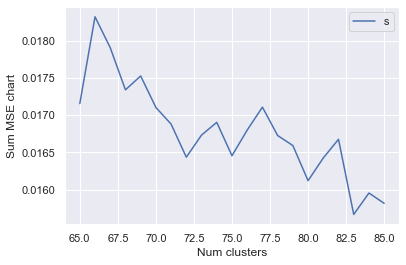

In [92]:
limit=86; start=65; step=6;
x = range(start, limit)
plt.plot(x, sum_mse_values)
plt.xlabel("Num clusters")
plt.ylabel("Sum MSE chart")
plt.legend(("sum_mse_values"), loc='best')
plt.show()

In [89]:
# df_nan_cleared.reset_index()

In [106]:
import pickle
with open("sake_model.pkl", "wb") as file:
    pickle.dump(gauss_mixture, file)

In [143]:
def plot_charts(x1, x2, x3):
    index = np.arange(65, 86, 5)
    bar_width = float(0.35)
    
    j = {idx: [x[0], x[1], x[2], x[3], x[4]] 
         for idx, x in enumerate([x1, x2, x3])}
    df = pd.DataFrame(j)
    print(df)
    
    fig, ax = plt.subplots()
    fig.set_figheight(8)
    fig.set_figwidth(8)
    
    gmm_ed = ax.bar(index, list(df[0]), bar_width, label="GMM+ED")
    gmm_gff = ax.bar(index+bar_width, list(df[1]), bar_width, label="GMM+GFF")
    sakenowa = ax.bar(index+bar_width*2, list(df[2]), bar_width, label="Sakenowa results")
    
    plt.xticks(index)
    ax.set_xlabel('Num clusters')
    ax.set_ylabel('MSE')
    ax.set_title('MSE affected by number of clusters')
    ax.set_xticks(index + bar_width / 2)
    ax.set_xticklabels(index)
    ax.legend()
    
    plt.show()

In [144]:
x1 = [0.02211, 0.02135, 0.02074, 0.01939, 0.01873]
x2 = [0.01739, 0.01734, 0.01691, 0.01625, 0.01541]
x3 = [0.01868 for _ in range(5)]

         0        1        2
0  0.02211  0.01739  0.01868
1  0.02135  0.01734  0.01868
2  0.02074  0.01691  0.01868
3  0.01939  0.01625  0.01868
4  0.01873  0.01541  0.01868


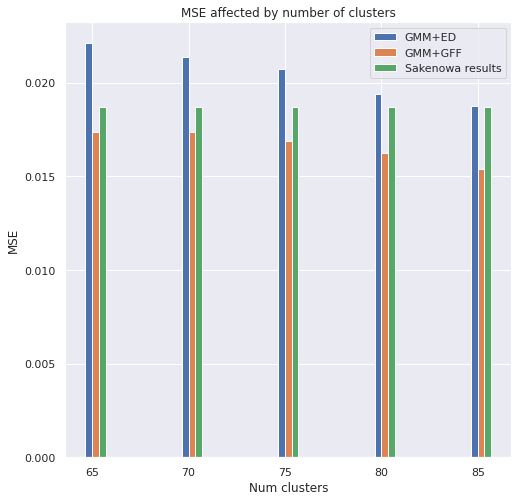

In [145]:
plot_charts(x1, x2, x3)